# Imports

In [1]:
%load_ext autoreload
%autoreload 2

%run ../../setup_project.py

import matplotlib.gridspec as gridspec
from matplotlib.gridspec import GridSpec
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from math import remainder, tau
import math
from scipy import stats
from statannotations.Annotator import Annotator

In [2]:
projectName, dataPath, dlcModelPath, myProject, sSessions= setup_project_session_lists(projectName="autopi_mec",dataPath=PROJECT_DATA_PATH,dlcModelPath="")

creating myProject, an autopipy.project object
Project name: autopi_mec
dataPath: /ext_drives/d91/data/projects/jingjie/Peng_et.al_2025_noInt/
dlcModelPath: 
Reading /ext_drives/d91/data/projects/jingjie/Peng_et.al_2025_noInt//sessionList
We have 180 testing sessions in the list
spikeA.Kilosort_session objects are in sSessions


In [3]:
prepareSessionsForSpatialAnalysisProject(sSessions,myProject.sessionList)

Loading Animal_pose and Spike_train, sSes.ap and sSes.cg
Will load .pose.npy


100%|██████████| 180/180 [03:19<00:00,  1.11s/it]


Loading ses.trial_table_simple as ses.trials
Create condition intervals in ses.intervalDict


In [4]:
for ses, sSes in tqdm(zip(myProject.sessionList,sSessions)):
       getSearchHomingIntervals(ses,sSes)

0it [00:00, ?it/s]

180it [00:04, 39.36it/s]


In [5]:
import collections

def nested_dict():
    return collections.defaultdict(nested_dict)

In [6]:
fn=myProject.dataPath+"/results/cells.csv"
ct = pd.read_csv(fn)

fn=myProject.dataPath+"/results/cells.csv"
gc = pd.read_csv(fn)
gridGc = gc.loc[gc["gridCell_FIRST"],:]

# Functions

In [7]:
def get_neuron_from_cellId(cellID,condition):
    sessionName = cellID.split('_')[0]

    for ses, sSes in tqdm(zip(myProject.sessionList,sSessions)):
        if sSes.name == sessionName:
            break

    for n in sSes.cg.neuron_list:
        clu = f"{ses.name}_{n.name}"
        if clu == cellID:
            break

    interval = ses.intervalDict[condition]

    sSes.ap.unset_intervals()
    n.spike_train.unset_intervals()
    
    sSes.ap.set_intervals(interval)
    n.spike_train.set_intervals(interval)
    n.ap.occupancy_map_2d(cm_per_bin =3, 
                                     smoothing_sigma_cm = 5, 
                                     smoothing = True, zero_to_nan = True,xy_range=np.array([[-50,-50],[50,50]]))
    n.ap.head_direction_occupancy_histogram(deg_per_bin = 10, 
            smoothing_sigma_deg = 10, 
            smoothing = True, zero_to_nan = True)
    n.spatial_properties.firing_rate_map_2d(cm_per_bin=3,smoothing_sigma_cm=5,smoothing=True,xy_range=np.array([[-50,-50],[50,50]]), recalculate_occupancy_map=True)
    
    
    return n

In [8]:
GLOBALFONTSIZE = 11

def plot_hd_occ_fig(ax,hd_hist,c='#7678ed',ylim=30,yl='Time (s)'):
    ax.plot(hdBins[:-1],hd_hist,lw=2,color=c)
    
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    
    ax.set_xticks([-np.pi,0,np.pi])
    ax.set_xlim(-np.pi,np.pi)
    ax.set_xticklabels([r'-$\pi$', "0", "$\pi$"],fontsize=GLOBALFONTSIZE)
    ax.set_ylabel(yl, fontsize=GLOBALFONTSIZE)
    ax.set_ylim(0,ylim)

In [9]:
hdBins = np.array([-3.14159265e+00, -2.96705973e+00, -2.79252680e+00, -2.61799388e+00,
       -2.44346095e+00, -2.26892803e+00, -2.09439510e+00, -1.91986218e+00,
       -1.74532925e+00, -1.57079633e+00, -1.39626340e+00, -1.22173048e+00,
       -1.04719755e+00, -8.72664626e-01, -6.98131701e-01, -5.23598776e-01,
       -3.49065850e-01, -1.74532925e-01, -3.55271368e-15,  1.74532925e-01,
        3.49065850e-01,  5.23598776e-01,  6.98131701e-01,  8.72664626e-01,
        1.04719755e+00,  1.22173048e+00,  1.39626340e+00,  1.57079633e+00,
        1.74532925e+00,  1.91986218e+00,  2.09439510e+00,  2.26892803e+00,
        2.44346095e+00,  2.61799388e+00,  2.79252680e+00,  2.96705973e+00,
        3.14159265e+00])

# Match the animal direction occupancy

bin_edges = [-3.14159265e+00, -2.96705973e+00, -2.79252680e+00, -2.61799388e+00,
       -2.44346095e+00, -2.26892803e+00, -2.09439510e+00, -1.91986218e+00,
       -1.74532925e+00, -1.57079633e+00, -1.39626340e+00, -1.22173048e+00,
       -1.04719755e+00, -8.72664626e-01, -6.98131701e-01, -5.23598776e-01,
       -3.49065850e-01, -1.74532925e-01, -3.55271368e-15,  1.74532925e-01,
        3.49065850e-01,  5.23598776e-01,  6.98131701e-01,  8.72664626e-01,
        1.04719755e+00,  1.22173048e+00,  1.39626340e+00,  1.57079633e+00,
        1.74532925e+00,  1.91986218e+00,  2.09439510e+00,  2.26892803e+00,
        2.44346095e+00,  2.61799388e+00,  2.79252680e+00,  2.96705973e+00, 3.14159265e+00]

empty_hd_occ = np.zeros(36)

hd_edges = bin_edges

In [10]:
def plotMap(
    ax,
    myMap,
    title="",
    titleY=0.95,
    titleFontSize=10,
    transpose=True,
    cmap="jet",
    vmin=0,
    vmax=None,
    alpha=1,
    maskCenter=False,
    radius=36
):
    """
    Plot one 2D map
    """
    if maskCenter:
        # Parameters for the mask
        radius = radius  # Radius of the circle in cm
        center_x, center_y = myMap.shape[1] // 2, myMap.shape[0] // 2  # Center of the heatmap

        # Create a grid of coordinates
        Y, X = np.ogrid[:myMap.shape[0], :myMap.shape[1]]
        dist_from_center = np.sqrt((X - center_x)**2 + (Y - center_y)**2)

        # Create the mask: True for inside the circle, False for outside
        mask = dist_from_center <= radius

        # Apply the mask to the heatmap data
        myMap = np.ma.masked_where(~mask, myMap).copy()
        
    if transpose:
        ax.imshow(
            myMap.T,
            origin="lower",
            cmap=cmap,
            interpolation=None,
            vmin=vmin,
            vmax=vmax,
            alpha=alpha,
        )
    else:
        ax.imshow(
            myMap, origin="lower", cmap=cmap, interpolation=None, vmin=vmin, vmax=vmax,alpha=alpha
        )
    ax.set_title(title, y=titleY, fontsize=titleFontSize)
    ax.set_aspect("equal", adjustable="box")
    #ax.axis("off")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

In [11]:
# Function to input a neuron and get a spike triggered map for that neuron
def load_position_dataframe_from_neuron(inputNeuron, sSes,input_interval,dropNa=True):
    sSes.ap.unset_intervals()
    sSes.ap.set_intervals(input_interval)
    
    inputNeuron.spike_train.unset_intervals()
    inputNeuron.spike_train.set_intervals(input_interval)
    

    poseTimeDf = pd.DataFrame(inputNeuron.spatial_properties.ap.pose[:,0:3],columns=['time','x','y'])

    if dropNa:
        poseTimeDf = poseTimeDf.dropna(subset='x').reset_index(drop=True)
    return poseTimeDf

def load_spike_position_dataframe_from_neuron(inputNeuron, sSes,input_interval,dropNa=True):
    sSes.ap.unset_intervals()
    sSes.ap.set_intervals(input_interval)
    
    inputNeuron.spike_train.unset_intervals()
    inputNeuron.spike_train.set_intervals(input_interval)
    

    spikeTimeDf = pd.DataFrame(inputNeuron.spatial_properties.spike_position(),columns=['spike_x','spike_y'])
    spikeTimeDf['spike_time'] = inputNeuron.spatial_properties.st.st
    
    if dropNa:
        spikeTimeDf = spikeTimeDf.dropna(subset='spike_x').reset_index(drop=True)

    return spikeTimeDf

In [12]:
def adjust_random_foraging_hd_occupancy(cellID,condition1,condition2,verbose=False,matchItem='both'):
    # First, get the animal position from condition1, we would need to modify this so that it matches the occupancy shape and coverage in condition 2
    
    sessionName = cellID.split('_')[0]

    for ses, sSes in tqdm(zip(myProject.sessionList,sSessions)):
        if sSes.name == sessionName:
            break

    for n in sSes.cg.neuron_list:
        clu = f"{ses.name}_{n.name}"
        if clu == cellID:
            break

    print(clu)
    
    # Get the two condition intervals
    
    interval1 = ses.intervalDict[condition1]
    interval2 = ses.intervalDict[condition2]
    
    # Get the neuron we will be using to make the plots
    sSes.ap.unset_intervals()
    n.spike_train.unset_intervals()
    
    sSes.ap.set_intervals(interval1)
    n.spike_train.set_intervals(interval1)
    
    originalPose = n.ap.pose.copy()
    
    sSes.ap.unset_intervals()
    n.spike_train.unset_intervals()
    
    sSes.ap.set_intervals(interval2)
    n.spike_train.set_intervals(interval2)
    n.ap.head_direction_occupancy_histogram(deg_per_bin = 10, 
            smoothing_sigma_deg = 10, 
            smoothing = True, zero_to_nan = True)
    
    hd_hist_ori = n.ap.hd_occupancy_histogram
    
    # Get the interval 2 of the position data
    poseDataframe = load_position_dataframe_from_neuron(n,sSes,interval2)
    # If we do not adjust the smoothing, we would have more in the matched map than the condition 2 occ map
    occMap, occBins = get_occupancy_map_from_pose(poseDataframe.values,smoothing=True,cm_per_bin=3, smoothing_sigma_cm=5, zero_to_nan = False) 
    occMap_Matched, _ = get_occupancy_map_from_pose(poseDataframe.values,smoothing=True, zero_to_nan = True)
    
    
    matchedPose = match_combined_occupancy(originalPose.copy(), occMap, occBins, hd_hist_ori, bin_edges,matchItem=matchItem)
    
    
    # Get the interval 2 of the position data

    
    if verbose:
        fig, ax =plt.subplots()
        plotMap(ax,occMap_Matched)
        ax.set_title(condition2)
        
    occMapMask = np.isnan(occMap_Matched)
    
    sSes.ap.unset_intervals()
    n.spike_train.unset_intervals()
    
    sSes.ap.set_intervals(interval1)
    n.spike_train.set_intervals(interval1)
    
    # Set the position of the neuron to the matched pose
    n.ap.pose = matchedPose
    n.ap.occupancy_map_2d(cm_per_bin =3, 
                                     smoothing_sigma_cm = 5, 
                                     smoothing = True, zero_to_nan = True,xy_range=np.array([[-50,-50],[50,50]]))
    
    # Get the original occupancy map and mask it
    oriOccMap = n.ap.occupancy_map
    
    if np.all(oriOccMap == np.nan):
        print('No occupancy')
        
    if matchItem == 'both' or matchItem == 'position':
        oriOccMap[occMapMask] = np.nan

    n.ap.occupancy_map = oriOccMap
    
    n.ap.head_direction_occupancy_histogram(deg_per_bin = 10, 
            smoothing_sigma_deg = 10, 
            smoothing = True, zero_to_nan = True)
    hd_hist_adj = n.ap.hd_occupancy_histogram
    
    n.spatial_properties.firing_rate_map_2d(cm_per_bin=3,smoothing_sigma_cm=5,smoothing=True,xy_range=np.array([[-50,-50],[50,50]]), recalculate_occupancy_map=False)
    
    
    firingRateMap = n.spatial_properties.firing_rate_map
    gridScore = n.spatial_properties.grid_score()

    return firingRateMap, oriOccMap,gridScore, hd_hist_adj, hd_hist_ori
   

In [13]:
def get_grid_score_from_condition(cellID,condition):
    sessionName = cellID.split('_')[0]

    for ses, sSes in tqdm(zip(myProject.sessionList,sSessions)):
        if sSes.name == sessionName:
            break

    input_interval = ses.intervalDict[condition]

    for n in sSes.cg.neuron_list:
        clu = f"{ses.name}_{n.name}"
        if clu == cellID:
            break

    print(clu)

    spikeDataframe = load_spike_position_dataframe_from_neuron(n,sSes,input_interval)
    poseDataframe = load_position_dataframe_from_neuron(n,sSes,input_interval)

    occMap, occBins = get_occupancy_map_from_pose(poseDataframe.values)
    spikePositions = spikeDataframe.iloc[:,:2].values

    firingMapOri = generate_firing_map_from_spike_and_occupancy(spikePositions,occMap, occBins)

    n.spatial_properties.firing_rate_map = firingMapOri
    n.spatial_properties.map_smoothing = True

    gridScore = n.spatial_properties.grid_score()
    
    return gridScore

In [14]:
from scipy import ndimage


def arange_inc(a,b,step):
    # similar as np.arange(a,b,step) but ensures that b is in the resulting sequence
    d=b-a
    c=int(np.ceil(d/step))
    l=c*step+a # go till l which might be more than b, but it is b <= l <= b+step
    return np.linspace(a,l,c+1)

def get_occupancy_map_from_pose(inputPose,smoothing = True, zero_to_nan = True,
                    xy_range=np.array([[-50,-50],[50,50]]), ensure_fixed_shape=False,cm_per_bin=3,smoothing_sigma_cm=5):
    
    # remove invalid position data
    invalid = np.isnan(inputPose[:,1:3]).any(axis=1)
    val = inputPose[~invalid,1:3]
    
    # Set the xy range
    if xy_range is None:
        xy_max = np.ceil(val.max(axis=0))+cm_per_bin
        xy_min = np.floor(val.min(axis=0))-cm_per_bin
    else:
        xy_max = xy_range[1,:]
        xy_min = xy_range[0,:]
        
    occupancy_bins = [np.arange(xy_min[0],xy_max[0]+cm_per_bin,cm_per_bin), # we add cm_per_bin so that it extend to the max and does not cut before
                            np.arange(xy_min[1],xy_max[1]+cm_per_bin,cm_per_bin)]
    
    if ensure_fixed_shape:
        occupancy_bins = [ arange_inc(xy_min[0],xy_max[0]-0.1,cm_per_bin),
                                arange_inc(xy_min[1],xy_max[1]-0.1,cm_per_bin) ]
        
    # calculate the occupancy map
    occ,x_edges,y_edges = np.histogram2d(x = val[:,0], y= val[:,1],
                                        bins= occupancy_bins)
    
    # calculate the time per sample
    #sec_per_sample = inputPose[1,0]-inputPose[0,0] # all rows have equal time intervals between them, we get the first one
    sec_per_sample = 0.02 #We manually set this, just in case there are NANs between the first and second that makes our data corrupt
    print("time per sample: {}".format(sec_per_sample))
    
    # get the time in seconds
    occ = occ*sec_per_sample

    # smoothin of occupancy map
    if smoothing:
        occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
    else:
        occ_sm = occ # if no smoothing just get a reference to occ, because we want to use occ_sm for the rest of the function
        
    # set bins at 0 to np.nan
    if zero_to_nan:
        occ_sm[occ==0] = np.nan
        
    return occ_sm, occupancy_bins

In [15]:
def generate_firing_map_from_spike_and_occupancy(spikePosition,occupancyMap,occBins,smooth=True):
    cm_per_bin=3
    smoothing_sigma_cm=5
    
    spike_count,x_edges,y_edges = np.histogram2d(x = spikePosition[:,0], y= spikePosition[:,1], bins= occBins)
    
    if smooth:
        spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
        
    # remove spikes that fell into a bin that the animal was not seen in.
    spike_count[np.isnan(occupancyMap)] = 0
    spike_count[occupancyMap < 0.0] = 0
    
    posi_firing_rate_map = spike_count/occupancyMap
    
    return posi_firing_rate_map

In [16]:
def find_bin_index(val, edges):
    return np.digitize(val, edges) - 1


def match_combined_occupancy(
    matchedPosition, occMap, occBins, hd_hist, hd_edges, matchItem="hd"
):

    # Initialize empty occupancy maps
    empty_occMap = np.zeros_like(occMap)
    empty_hd_occ = np.zeros(len(hd_edges) - 1)

    x_edges = occBins[0]
    y_edges = occBins[1]


    for i in range(matchedPosition.shape[0]):

        x, y, hd_dir = (
            matchedPosition[i, 1],
            matchedPosition[i, 2],
            matchedPosition[i, 4],
        )

        if np.isnan(x) or np.isnan(y) or np.isnan(hd_dir):
            continue

        # Find the corresponding bin index for x, y, and head direction
        x_bin_index = find_bin_index(x, x_edges)
        y_bin_index = find_bin_index(y, y_edges)
        hd_bin_index = find_bin_index(hd_dir, hd_edges)

        if matchItem == "both":

            # Check if the position and head direction fall within the occupancy map bins
            if (
                0 <= x_bin_index < len(x_edges) - 1
                and 0 <= y_bin_index < len(y_edges) - 1
                and 0 <= hd_bin_index < len(hd_edges) - 1
            ):

                # Check if the updated time matches or exceeds the target time in occMap and hd_hist
                if (
                    empty_hd_occ[hd_bin_index] >= hd_hist[hd_bin_index]
                    or empty_occMap[x_bin_index, y_bin_index]
                    >= occMap[x_bin_index, y_bin_index]
                ):
                    # Set the current position to np.nan
                    matchedPosition[i, 1] = np.nan
                    matchedPosition[i, 2] = np.nan
                    matchedPosition[i, 4] = np.nan
                else:
                    # Update the time in the empty occupancy maps
                    empty_hd_occ[hd_bin_index] += 0.02
                    empty_occMap[x_bin_index, y_bin_index] += 0.02

        elif matchItem == "position":
            if (
                0 <= x_bin_index < len(x_edges) - 1
                and 0 <= y_bin_index < len(y_edges) - 1
            ):
                if (
                    empty_occMap[x_bin_index, y_bin_index]
                    >= occMap[x_bin_index, y_bin_index]
                ):
                    matchedPosition[i, 1] = np.nan
                    matchedPosition[i, 2] = np.nan

                    matchedPosition[i, 4] = np.nan
                else:
                    empty_occMap[x_bin_index, y_bin_index] += 0.02
        elif matchItem == "hd":
            if 0 <= hd_bin_index < len(hd_edges) - 1:
                if empty_hd_occ[hd_bin_index] >= hd_hist[hd_bin_index]:
                    matchedPosition[i, 4] = np.nan

                    matchedPosition[i, 1] = np.nan
                    matchedPosition[i, 2] = np.nan
                else:
                    empty_hd_occ[hd_bin_index] += 0.02

    print("Original occ sum:", np.nansum(occMap))
    print("Matched occ sum:", np.nansum(empty_occMap))
    print("Original hd sum:", np.nansum(hd_hist))
    print("Matched hd sum:", np.nansum(empty_hd_occ))

    return matchedPosition

In [17]:
CeID = 'jp1686-26042022-0108_55'

67it [00:00, 943014.66it/s]


jp1686-26042022-0108_55
time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_114757/3407340849.py:47: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


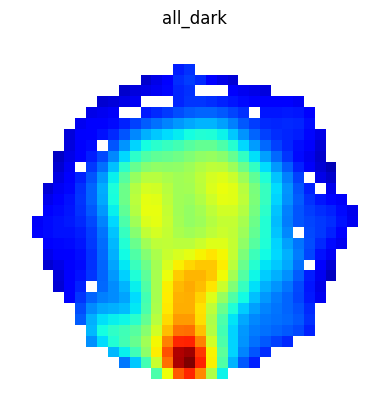

In [18]:
firingMapTest,occMapTest, testGs, hd_hist_adj, hd_hist_ori = adjust_random_foraging_hd_occupancy(CeID,'circ80_2','all_dark',verbose=True)

(0.0, 30.0)

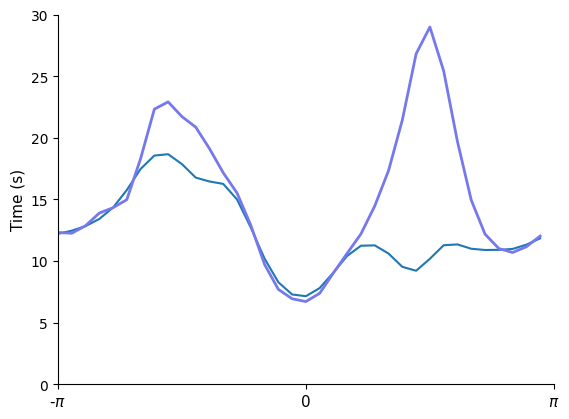

In [19]:
fig, ax =plt.subplots()
ax.plot(bin_edges[:-1],hd_hist_adj)
#ax.plot(bin_edges[:-1],hd_hist_ori)
plot_hd_occ_fig(ax,hd_hist_ori)
ax.set_ylim(0,30)

In [20]:
fn = myProject.dataPath + "/results/MatcheGridScoreWithOccHdDownsampling.csv"
statsDownsample = pd.read_csv(fn)
statsDownsampleG=statsDownsample.groupby(["condition","mouse"]).grid_score.median().reset_index()

In [21]:
fn = myProject.dataPath + "/results/occ_matched_all_scenario.csv"
statsMatched = pd.read_csv(fn)
statsMatchedG=statsMatched.groupby(["condition","mouse","match"]).grid_score.median().reset_index()

In [22]:
def nested_dict():
    return collections.defaultdict(nested_dict)

boxprops = {'edgecolor': 'k', 'linewidth': 1.5}
lineprops = {'color': 'k', 'linewidth': 1.5}
boxplot_kwargs = dict({'boxprops': boxprops, 'medianprops': lineprops,
                   'whiskerprops': lineprops, 'capprops': lineprops,
                   'width': 0.75})
stripplot_kwargs = dict({'linewidth': 1, 'size': 7, 'alpha': 0.8},)

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Light vs. Light occ.
matched RF2: Wilcoxon test (paired samples), P_val:4.578e-05 Stat=2.000e+00


/tmp/ipykernel_114757/1932147567.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)


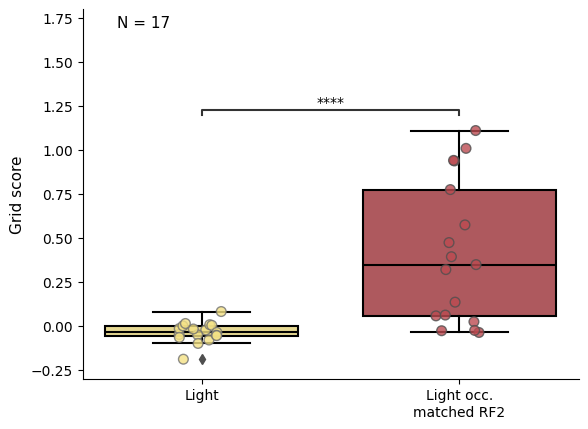

In [23]:
lightPal = ['#F4E285','#BC4B51']
darkPal = ['#5B8E7D','#BC4B51']
def plot_stats_grid(ax,inDf,condList = ['Dark','Dark occ.\nmatched RF2'],pal=darkPal):
    inDf.replace({'circ80_2_adj_dark':'Dark occ.\nmatched RF2','all_dark':'Dark','all_light':'Light','circ80_2_adj_light':'Light occ.\nmatched RF2'},inplace=True)
    inputDf = inDf[inDf['condition'].isin(condList)].copy()

    b = sns.boxplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList, **boxplot_kwargs)
    sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)


    pairs = [((condList[0]),(condList[1]))]

    annotator = Annotator(b, pairs, data=inputDf,x='condition',y='grid_score')
    annotator.configure(test='Wilcoxon', text_format='star', loc='inside')
    annotator.apply_and_annotate()

    ax.set_xlabel('')
    ax.set_ylabel('Grid score',fontsize=GLOBALFONTSIZE)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    number = len(inputDf.mouse.unique())
    ax.text(0.07,0.95, f'N = {number}',transform=ax.transAxes,fontsize=GLOBALFONTSIZE)
    ax.set_ylim(-0.3,1.8)

fig, ax =plt.subplots()
plot_stats_grid(ax,statsMatchedG[statsMatchedG.match=='position'],condList = ['Light','Light occ.\nmatched RF2'],pal=lightPal)

# Make final figure

In [24]:
def disable_all_ticks(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

67it [00:00, 1044677.95it/s]
67it [00:00, 579419.32it/s]


MaxLight: 1.9927900842119657


67it [00:00, 912397.30it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_114757/3407340849.py:47: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 277.1600000000001
Original hd sum: 286.6399999997393
Matched hd sum: 0.0


67it [00:00, 1185731.51it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_114757/3407340849.py:47: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 986029.36it/s]
67it [00:00, 1010857.44it/s]


jp1686-26042022-0108_55
time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_114757/3407340849.py:47: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 471.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 0.0


67it [00:00, 886493.27it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_114757/3407340849.py:47: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Light vs. Light occ.
matched RF2: Wilcoxon test (paired samples), P_val:4.578e-05 Stat=2.000e+00


/tmp/ipykernel_114757/1932147567.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)
/home/kilo/miniconda3/envs/spikeA/lib/python3.11/site-packages/statannotations/Annotator.py:556: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.draw()
/tmp/ipykernel_114757/1932147567.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)
/home/kilo/miniconda3/envs/spikeA/lib/python3.11/site-packages/statannotations/Annotator.py:556: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.draw()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Dark vs. Dark occ.
matched RF2: Wilcoxon test (paired samples), P_val:3.052e-05 Stat=1.000e+00


/tmp/ipykernel_114757/1932147567.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)
/home/kilo/miniconda3/envs/spikeA/lib/python3.11/site-packages/statannotations/Annotator.py:556: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.draw()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Light vs. Light occ.
matched RF2: Wilcoxon test (paired samples), P_val:4.578e-05 Stat=2.000e+00


/tmp/ipykernel_114757/1932147567.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)
/home/kilo/miniconda3/envs/spikeA/lib/python3.11/site-packages/statannotations/Annotator.py:556: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.draw()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Dark vs. Dark occ.
matched RF2: Wilcoxon test (paired samples), P_val:1.526e-04 Stat=5.000e+00


/tmp/ipykernel_114757/1932147567.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)
/home/kilo/miniconda3/envs/spikeA/lib/python3.11/site-packages/statannotations/Annotator.py:556: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.draw()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Light vs. Light occ.
matched RF2: Wilcoxon test (paired samples), P_val:7.629e-05 Stat=3.000e+00


/tmp/ipykernel_114757/1932147567.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=inputDf,x='condition',y='grid_score',palette=pal,ax=ax,order=condList,**stripplot_kwargs)
/home/kilo/miniconda3/envs/spikeA/lib/python3.11/site-packages/statannotations/Annotator.py:556: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.draw()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Dark vs. Dark occ.
matched RF2: Wilcoxon test (paired samples), P_val:3.052e-05 Stat=1.000e+00


/tmp/ipykernel_114757/411601428.py:259: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.savefig('../../Output/Ext_Figure5.jpg', bbox_inches='tight', dpi=300)
/tmp/ipykernel_114757/411601428.py:259: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.savefig('../../Output/Ext_Figure5.jpg', bbox_inches='tight', dpi=300)
/home/kilo/miniconda3/envs/spikeA/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


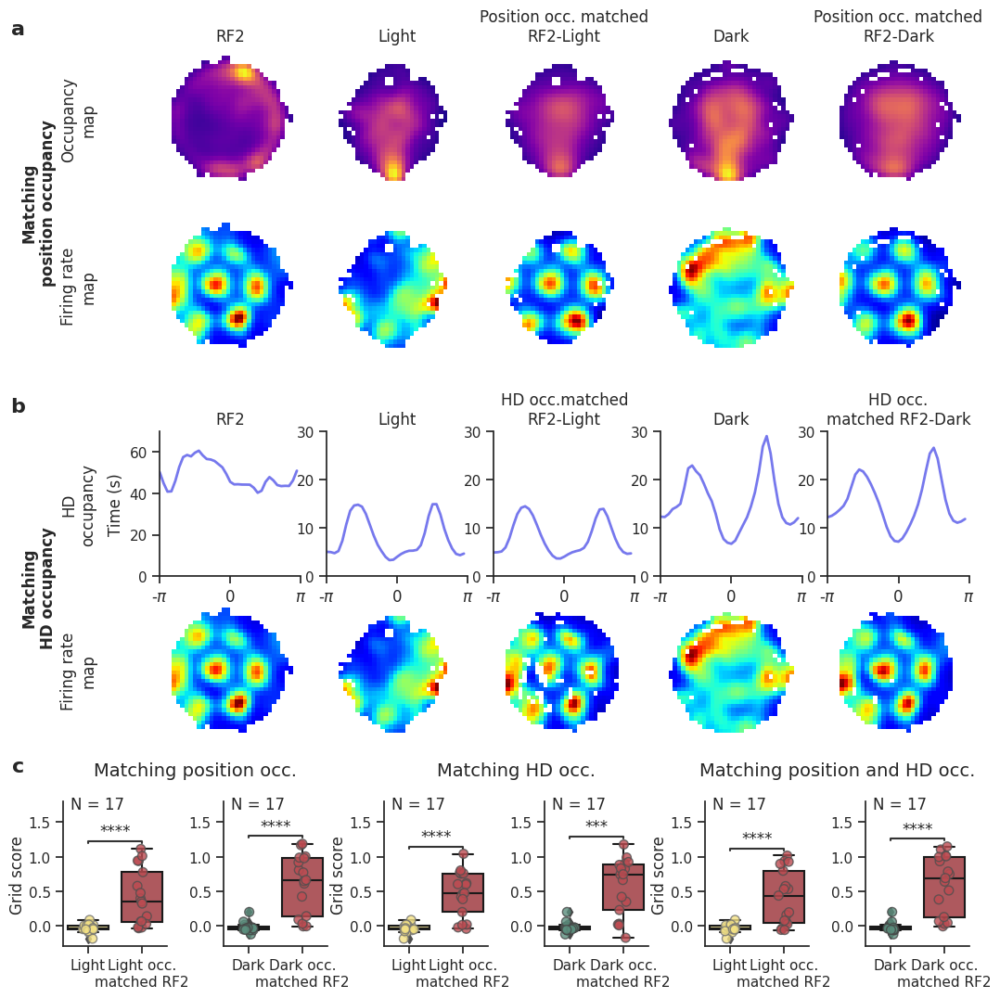

In [27]:
from matplotlib.image import imread

nrows = 7
ncols = 6
colSize = 2.1
rowSize = 1.8
sns.set(rc={"figure.dpi": 100, "savefig.dpi": 100})
sns.set_theme(style="ticks")
GLOBALFONTSIZE = 12
# Set the color for this figure

fig = plt.figure(figsize=(ncols * colSize, nrows * rowSize), constrained_layout=True)
gs = gridspec.GridSpec(nrows, ncols, figure=fig,width_ratios=[0.5,1,1,1,1,1],height_ratios=[1,1,0.2,1,1,0.1,1])
gsL = gridspec.GridSpecFromSubplotSpec(7, 2, subplot_spec=gs[:, 0],height_ratios=[1,1,0.2,1,1,0.1,1])
gsStats = gridspec.GridSpecFromSubplotSpec(1, 6, subplot_spec=gs[6, :],wspace=0.55)


def add_text(ax, x, y, label, fw="normal"):
    ax.text(
        x,
        y,
        label,
        style="normal",
        fontweight=fw,
        fontsize=GLOBALFONTSIZE + 4,
        verticalalignment="center",
        horizontalalignment="center",
        transform=ax.transAxes,
    )

# Add side labels


ax0 = fig.add_subplot(gsL[:2, 0])
ax0.set_ylabel('Matching\nposition occupancy',fontsize=GLOBALFONTSIZE,fontweight='bold',labelpad=5)
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsL[3:5, 0])
ax0.set_ylabel('Matching\nHD occupancy',fontsize=GLOBALFONTSIZE,fontweight='bold',labelpad=5)
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsL[0, 1])
ax0.set_ylabel('Occupancy\nmap',fontsize=GLOBALFONTSIZE) #,labelpad=-3
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsL[1, 1])
ax0.set_ylabel('Firing rate\nmap',fontsize=GLOBALFONTSIZE) 
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsL[3, 1])
ax0.set_ylabel('HD\noccupancy',fontsize=GLOBALFONTSIZE) 
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsL[4, 1])
ax0.set_ylabel('Firing rate\nmap',fontsize=GLOBALFONTSIZE) 
disable_all_ticks(ax0)



# NOTE FIRST Column
ax0 = fig.add_subplot(gs[0, 1])
CeID = "jp1686-26042022-0108_55"


testN = get_neuron_from_cellId(CeID, "circ80_2")
occMap = testN.ap.occupancy_map
plotMap(ax0, occMap, cmap="plasma")

ax0.set_title("RF2", fontsize=GLOBALFONTSIZE)

# Plot firing map
ax0 = fig.add_subplot(gs[1, 1])
plotMap(ax0, testN.spatial_properties.firing_rate_map)

# Plot firing map
ax0 = fig.add_subplot(gs[4, 1])
plotMap(ax0, testN.spatial_properties.firing_rate_map)

# Plot HD occupancy
ax0 = fig.add_subplot(gs[3, 1])
hdOccRF = testN.ap.hd_occupancy_histogram
plot_hd_occ_fig(ax0, hdOccRF, ylim=70, c="#7678ed")
ax0.set_title("RF2", fontsize=GLOBALFONTSIZE)


# NOTE SECOND COLUMN
ax0 = fig.add_subplot(gs[0, 2])
testN = get_neuron_from_cellId(CeID, "all_light")
occMap = testN.ap.occupancy_map
maxLight = np.nanmax(occMap)
print(f"MaxLight:", maxLight)
plotMap(ax0, occMap, vmax=maxLight, cmap="plasma")

ax0.set_title("Light", fontsize=GLOBALFONTSIZE)

# Plot map
ax0 = fig.add_subplot(gs[1, 2])
plotMap(ax0, testN.spatial_properties.firing_rate_map)

# Plot firing map
ax0 = fig.add_subplot(gs[4, 2])
plotMap(ax0, testN.spatial_properties.firing_rate_map)

# Plot HD occupancy
ax0 = fig.add_subplot(gs[3, 2])
hdOcc = testN.ap.hd_occupancy_histogram
plot_hd_occ_fig(ax0, hdOcc, ylim=30,yl='')
ax0.set_title("Light", fontsize=GLOBALFONTSIZE)



# NOTE THIRD COLUMN
ax0 = fig.add_subplot(gs[0, 3])
firingMapTest, occMapTest, testGs, hd_hist_adj, hd_hist_ori = (
    adjust_random_foraging_hd_occupancy(
        CeID, "circ80_2", "all_light", verbose=False, matchItem="position"
    )
)  # both,hd,position

plotMap(ax0, occMapTest, vmax=maxLight, cmap="plasma")
# plotMap(ax0,occMapTest,vmax=None,cmap='plasma')
ax0.set_title("Position occ. matched\nRF2-Light", fontsize=GLOBALFONTSIZE)

ax0 = fig.add_subplot(gs[1, 3])
plotMap(ax0, firingMapTest)

firingMapTest, occMapTest, testGs, hd_hist_adj, hd_hist_ori = (
    adjust_random_foraging_hd_occupancy(
        CeID, "circ80_2", "all_light", verbose=False, matchItem="hd"
    )
)  # both,hd,position

ax0 = fig.add_subplot(gs[4, 3])
plotMap(ax0, firingMapTest)

# Plot HD occupancy
ax0 = fig.add_subplot(gs[3, 3])

plot_hd_occ_fig(ax0, hd_hist_adj, ylim=30, c="#7678ed",yl='')
ax0.set_title("HD occ.matched\nRF2-Light", fontsize=GLOBALFONTSIZE)

# NOTE FOURTH COLUMN
ax0 = fig.add_subplot(gs[0, 4])

testN = get_neuron_from_cellId(CeID, "all_dark")
occMap = testN.ap.occupancy_map
maxDark = np.nanmax(occMap)
plotMap(ax0, occMap, cmap="plasma")
ax0.set_title('Dark')

# Plot map
ax0 = fig.add_subplot(gs[1, 4])
plotMap(ax0, testN.spatial_properties.firing_rate_map)


# Plot firing map
ax0 = fig.add_subplot(gs[4, 4])
plotMap(ax0, testN.spatial_properties.firing_rate_map)

# Plot HD occupancy
ax0 = fig.add_subplot(gs[3, 4])
hdOcc = testN.ap.hd_occupancy_histogram
plot_hd_occ_fig(ax0, hdOcc, ylim=30,yl='')

ax0.set_title('Dark')


# NOTE FIFTH COLUMN
ax0 = fig.add_subplot(gs[0, 5])

firingMapTest, occMapTest, testGs, hd_hist_adj, hd_hist_ori = (
    adjust_random_foraging_hd_occupancy(
        CeID, "circ80_2", "all_dark", verbose=False, matchItem="position"
    )
)

plotMap(ax0, occMapTest, vmax=maxDark, cmap="plasma")
ax0.set_title("Position occ. matched\nRF2-Dark", fontsize=GLOBALFONTSIZE)

# Plot map
ax0 = fig.add_subplot(gs[1, 5])
plotMap(ax0, firingMapTest)

firingMapTest, occMapTest, testGs, hd_hist_adj, hd_hist_ori = (
    adjust_random_foraging_hd_occupancy(
        CeID, "circ80_2", "all_dark", verbose=False, matchItem="hd"
    )
)

# Plot map
ax0 = fig.add_subplot(gs[4, 5])
plotMap(ax0, firingMapTest)

# Plot HD occupancy
ax0 = fig.add_subplot(gs[3, 5])


plot_hd_occ_fig(ax0, hd_hist_adj, ylim=30, c="#7678ed",yl='')
ax0.set_title("HD occ.\nmatched RF2-Dark", fontsize=GLOBALFONTSIZE)

# NOTE Stats

ax0 = fig.add_subplot(gsStats[0,:2])
ax0.set_title('Matching position occ.',fontsize=GLOBALFONTSIZE+2,pad=20) 
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsStats[0,0])
plot_stats_grid(ax0,statsMatchedG[statsMatchedG.match=='position'],condList = ['Light','Light occ.\nmatched RF2'],pal=lightPal)
ax0.set_ylabel('Grid score',fontsize=GLOBALFONTSIZE,labelpad=2)

ax0 = fig.add_subplot(gsStats[0,1])
plot_stats_grid(ax0,statsMatchedG[statsMatchedG.match == 'position'],condList = ['Dark','Dark occ.\nmatched RF2'],pal=darkPal)
ax0.set_ylabel('')





ax0 = fig.add_subplot(gsStats[0,2:4])
ax0.set_title('Matching HD occ.',fontsize=GLOBALFONTSIZE+2,pad=20) 
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsStats[0,2])
plot_stats_grid(ax0,statsMatchedG[statsMatchedG.match=='hd'],condList = ['Light','Light occ.\nmatched RF2'],pal=lightPal)
ax0.set_ylabel('Grid score',fontsize=GLOBALFONTSIZE,labelpad=2)

ax0 = fig.add_subplot(gsStats[0,3])
plot_stats_grid(ax0,statsMatchedG[statsMatchedG.match == 'hd'],condList = ['Dark','Dark occ.\nmatched RF2'],pal=darkPal)
ax0.set_ylabel('')




ax0 = fig.add_subplot(gsStats[0,4:6])
ax0.set_title('Matching position and HD occ.',fontsize=GLOBALFONTSIZE+2,pad=20) 
disable_all_ticks(ax0)

ax0 = fig.add_subplot(gsStats[0,4])
plot_stats_grid(ax0,statsMatchedG[statsMatchedG.match=='both'],condList = ['Light','Light occ.\nmatched RF2'],pal=lightPal)
ax0.set_ylabel('Grid score',fontsize=GLOBALFONTSIZE,labelpad=2)

ax0 = fig.add_subplot(gsStats[0,5])
plot_stats_grid(ax0,statsMatchedG[statsMatchedG.match == 'both'],condList = ['Dark','Dark occ.\nmatched RF2'],pal=darkPal)
ax0.set_ylabel('')


gsT = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=gs[:,:])


###ADD FIGURE LEGENDS###
ax0 = fig.add_subplot(gsT[:,:])

add_text(ax0,-0.05,1.02,'a',fw='bold')
add_text(ax0,-0.05,0.6,'b',fw='bold')
add_text(ax0,-0.05,0.2,'c',fw='bold')

ax0.axis('off')

plt.savefig('../../Output/Ext_Figure5.jpg', bbox_inches='tight', dpi=300)

In [26]:
if:

SyntaxError: invalid syntax (879943805.py, line 1)

# Loop to get stats files

In [ ]:
cellIdH = []
conditionH = []
gridScoreH = []

conditionList = ['circ80_1','all_light','all_dark','circ80_2']

for cellName in tqdm(gridGc.cluId.unique()):
    for conditionName in conditionList:
        gScore = get_grid_score_from_condition(cellName,conditionName)

        cellIdH.append(cellName)
        conditionH.append(conditionName)
        gridScoreH.append(gScore)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_1','all_light',matchItem='position')
    cellIdH.append(cellName)
    conditionH.append('circ80_1_adj_light')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_1','all_dark',matchItem='position')
    cellIdH.append(cellName)
    conditionH.append('circ80_1_adj_dark')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_2','all_light',matchItem='position')
    cellIdH.append(cellName)
    conditionH.append('circ80_2_adj_light')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_2','all_dark',matchItem='position')
    cellIdH.append(cellName)
    conditionH.append('circ80_2_adj_dark')
    gridScoreH.append(adjGs)

1it [00:00, 10754.63it/s]0:00<?, ?it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_61
time per sample: 0.02


1it [00:00, 21959.71it/s]


mn8578-05122021-0108_61


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 30615.36it/s]

mn8578-05122021-0108_61



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 20560.31it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_61
time per sample: 0.02


1it [00:00, 17549.39it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 232.90000000000006
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 21183.35it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 385.76000000000016
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 26886.56it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 229.84000000000003
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 33026.02it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 1/931 [00:15<3:53:20, 15.05s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 367.5800000000001
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 27060.03it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_161
time per sample: 0.02


1it [00:00, 13148.29it/s]

mn8578-05122021-0108_161



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 21290.88it/s]

mn8578-05122021-0108_161



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 24244.53it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_161
time per sample: 0.02


1it [00:00, 31536.12it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 232.90000000000006
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 26886.56it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 385.76000000000016
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 16710.37it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 229.84000000000003
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 34100.03it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 2/931 [00:31<4:02:02, 15.63s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 367.5800000000001
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 20360.70it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_197
time per sample: 0.02


1it [00:00, 23967.45it/s]

mn8578-05122021-0108_197



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 29127.11it/s]

mn8578-05122021-0108_197



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 29537.35it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_197
time per sample: 0.02


1it [00:00, 34100.03it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 232.90000000000006
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 23696.63it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 385.76000000000016
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 23831.27it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 229.84000000000003
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 33288.13it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 3/931 [00:46<3:58:37, 15.43s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 367.5800000000001
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 27235.74it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_233
time per sample: 0.02


1it [00:00, 33288.13it/s]

mn8578-05122021-0108_233



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 25731.93it/s]

mn8578-05122021-0108_233



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 22075.28it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_233
time per sample: 0.02


1it [00:00, 13025.79it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 232.90000000000006
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 14614.30it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 385.76000000000016
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 34952.53it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 229.84000000000003
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 29537.35it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 4/931 [01:01<3:56:46, 15.32s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 367.5800000000001
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 30615.36it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_238
time per sample: 0.02


1it [00:00, 15947.92it/s]

mn8578-05122021-0108_238



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 24105.20it/s]

mn8578-05122021-0108_238



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 19239.93it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_238
time per sample: 0.02


1it [00:00, 29959.31it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 232.90000000000006
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 21845.33it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 385.76000000000016
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 16070.13it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 229.84000000000003
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 30393.51it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 5/931 [01:15<3:51:28, 15.00s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 367.5800000000001
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 30840.47it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_247
time per sample: 0.02


1it [00:00, 29537.35it/s]

mn8578-05122021-0108_247



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 18236.10it/s]

mn8578-05122021-0108_247



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 4599.02it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_247
time per sample: 0.02


1it [00:00, 33288.13it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 232.90000000000006
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 12826.62it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 385.76000000000016
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 17403.75it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 229.84000000000003
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 31300.78it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 6/931 [01:31<3:52:44, 15.10s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 367.5800000000001
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 30174.85it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_303
time per sample: 0.02


1it [00:00, 34379.54it/s]

mn8578-05122021-0108_303



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 10407.70it/s]

mn8578-05122021-0108_303



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 25575.02it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_303
time per sample: 0.02


1it [00:00, 14364.05it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 232.90000000000006
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 22550.02it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 385.76000000000016
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


1it [00:00, 21290.88it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 229.84000000000003
Original hd sum: 271.4599999997532
Matched hd sum: 0.0


1it [00:00, 31775.03it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 7/931 [01:45<3:49:35, 14.91s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 367.5800000000001
Original hd sum: 409.33999999962765
Matched hd sum: 0.0


2it [00:00, 55553.70it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_43
time per sample: 0.02


2it [00:00, 60787.01it/s]

mn8578-06122021-0107_43



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 77672.30it/s]

mn8578-06122021-0107_43



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 6808.94it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_43
time per sample: 0.02


2it [00:00, 67650.06it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 293.3600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 71697.50it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 404.32000000000016
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 64035.18it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 241.0600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 52758.54it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 8/931 [02:00<3:47:46, 14.81s/it]

Original occ sum: 501.0
Matched occ sum: 304.18000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 30504.03it/s]

mn8578-06122021-0107_182



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 6482.70it/s]


mn8578-06122021-0107_182


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 57065.36it/s]

mn8578-06122021-0107_182



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 54120.05it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_182
time per sample: 0.02


2it [00:00, 62137.84it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 293.3600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 33288.13it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 404.32000000000016
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 43464.29it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 241.0600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 66576.25it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 9/931 [02:15<3:47:18, 14.79s/it]

Original occ sum: 501.0
Matched occ sum: 304.18000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 32513.98it/s]

mn8578-06122021-0107_184
time per sample: 0.02



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
2it [00:00, 46091.25it/s]


mn8578-06122021-0107_184


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 67108.86it/s]

mn8578-06122021-0107_184



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 56299.38it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_184
time per sample: 0.02


2it [00:00, 52758.54it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 293.3600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 55188.21it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 404.32000000000016
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 6781.41it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 241.0600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 53092.46it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 10/931 [02:30<3:48:35, 14.89s/it]

Original occ sum: 501.0
Matched occ sum: 304.18000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 32513.98it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_206
time per sample: 0.02


2it [00:00, 21732.15it/s]

mn8578-06122021-0107_206



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 65027.97it/s]

mn8578-06122021-0107_206



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 53430.62it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_206
time per sample: 0.02


2it [00:00, 55924.05it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 293.3600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 61230.72it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 404.32000000000016
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 64035.18it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 241.0600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 47934.90it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 11/931 [02:45<3:51:24, 15.09s/it]

Original occ sum: 501.0
Matched occ sum: 304.18000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 49344.75it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_212
time per sample: 0.02


2it [00:00, 39383.14it/s]

mn8578-06122021-0107_212



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 41323.19it/s]

mn8578-06122021-0107_212



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 5741.69it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_212
time per sample: 0.02


2it [00:00, 67650.06it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 293.3600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 49056.19it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 404.32000000000016
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 54120.05it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 241.0600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 39756.44it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|▏         | 12/931 [03:00<3:51:32, 15.12s/it]

Original occ sum: 501.0
Matched occ sum: 304.18000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 48770.98it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_257
time per sample: 0.02


2it [00:00, 57852.47it/s]

mn8578-06122021-0107_257



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 50533.78it/s]

mn8578-06122021-0107_257



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 20763.88it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_257
time per sample: 0.02


2it [00:00, 9020.01it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 293.3600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 28244.47it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 404.32000000000016
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


2it [00:00, 39756.44it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 241.0600000000001
Original hd sum: 347.7399999996837
Matched hd sum: 0.0


2it [00:00, 36314.32it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|▏         | 13/931 [03:15<3:50:22, 15.06s/it]

Original occ sum: 501.0
Matched occ sum: 304.18000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 0.0


3it [00:00, 103138.62it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_35
time per sample: 0.02


3it [00:00, 61680.94it/s]

mn8578-07122021-0107_35



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 61680.94it/s]

mn8578-07122021-0107_35



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 5918.59it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_35
time per sample: 0.02


3it [00:00, 69905.07it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 244.76000000000008
Original hd sum: 318.6399999997102
Matched hd sum: 0.0


3it [00:00, 55188.21it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.6000000000001
Matched occ sum: 382.2800000000002
Original hd sum: 486.47999999955755
Matched hd sum: 0.0


3it [00:00, 108473.38it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 232.18000000000006
Original hd sum: 318.6399999997102
Matched hd sum: 0.0


3it [00:00, 101475.10it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 14/931 [03:29<3:45:16, 14.74s/it]

Original occ sum: 506.6000000000001
Matched occ sum: 366.10000000000014
Original hd sum: 486.47999999955755
Matched hd sum: 0.0


3it [00:00, 107546.26it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_47
time per sample: 0.02


3it [00:00, 111353.20it/s]

mn8578-07122021-0107_47



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 79638.68it/s]

mn8578-07122021-0107_47



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 89877.94it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_47
time per sample: 0.02


3it [00:00, 54947.21it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 244.76000000000008
Original hd sum: 318.6399999997102
Matched hd sum: 0.0


3it [00:00, 39693.73it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.6000000000001
Matched occ sum: 382.2800000000002
Original hd sum: 486.47999999955755
Matched hd sum: 0.0


3it [00:00, 55924.05it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 232.18000000000006
Original hd sum: 318.6399999997102
Matched hd sum: 0.0


3it [00:00, 89877.94it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 15/931 [03:43<3:39:50, 14.40s/it]

Original occ sum: 506.6000000000001
Matched occ sum: 366.10000000000014
Original hd sum: 486.47999999955755
Matched hd sum: 0.0


4it [00:00, 81840.08it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_33
time per sample: 0.02


4it [00:00, 58052.65it/s]

mn8578-08122021-0110_33



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 102300.10it/s]

mn8578-08122021-0110_33



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 99273.47it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_33
time per sample: 0.02


4it [00:00, 106861.25it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 253.23999999999992
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 103563.06it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 441.12000000000023
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 97541.95it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 203.39999999999998
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 99864.38it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 16/931 [03:59<3:46:10, 14.83s/it]

Original occ sum: 603.72
Matched occ sum: 306.1400000000001
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 86480.49it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_178
time per sample: 0.02


4it [00:00, 41425.22it/s]

mn8578-08122021-0110_178



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 101067.57it/s]

mn8578-08122021-0110_178



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 81442.80it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_178
time per sample: 0.02


4it [00:00, 90200.09it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 253.23999999999992
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 67650.06it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 441.12000000000023
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 116508.44it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 203.39999999999998
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 126144.48it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 17/931 [04:11<3:34:34, 14.09s/it]

Original occ sum: 603.72
Matched occ sum: 306.1400000000001
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 87381.33it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_180
time per sample: 0.02


4it [00:00, 134217.73it/s]

mn8578-08122021-0110_180



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 134217.73it/s]

mn8578-08122021-0110_180



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 16070.13it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_180
time per sample: 0.02


4it [00:00, 60567.57it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 253.23999999999992
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 88768.34it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 441.12000000000023
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 104857.60it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 203.39999999999998
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 98112.37it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 18/931 [04:24<3:30:38, 13.84s/it]

Original occ sum: 603.72
Matched occ sum: 306.1400000000001
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 132104.06it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_241
time per sample: 0.02


4it [00:00, 39016.78it/s]

mn8578-08122021-0110_241



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 131072.00it/s]

mn8578-08122021-0110_241



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 52103.16it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_241
time per sample: 0.02


4it [00:00, 58052.65it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 253.23999999999992
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 126144.48it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 441.12000000000023
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 66052.03it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 203.39999999999998
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 101680.10it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 19/931 [04:39<3:36:09, 14.22s/it]

Original occ sum: 603.72
Matched occ sum: 306.1400000000001
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 47527.52it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_360
time per sample: 0.02


4it [00:00, 63072.24it/s]

mn8578-08122021-0110_360



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 89240.51it/s]

mn8578-08122021-0110_360



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 12662.05it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_360
time per sample: 0.02


4it [00:00, 124275.67it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 253.23999999999992
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 106861.25it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 441.12000000000023
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


4it [00:00, 82646.38it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 203.39999999999998
Original hd sum: 336.65999999969387
Matched hd sum: 0.0


4it [00:00, 112598.77it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 20/931 [04:53<3:34:47, 14.15s/it]

Original occ sum: 603.72
Matched occ sum: 306.1400000000001
Original hd sum: 580.0799999994723
Matched hd sum: 0.0


5it [00:00, 139810.13it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_138
time per sample: 0.02


5it [00:00, 169125.16it/s]

mn8578-10122021-0107_138



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 125577.96it/s]

mn8578-10122021-0107_138



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 153076.79it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_138
time per sample: 0.02


5it [00:00, 148734.18it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 153076.79it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 64726.91it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 54613.33it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 21/931 [05:05<3:21:49, 13.31s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 97090.37it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_140
time per sample: 0.02


5it [00:00, 115228.13it/s]

mn8578-10122021-0107_140



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 100342.20it/s]

mn8578-10122021-0107_140



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 19134.60it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_140
time per sample: 0.02


5it [00:00, 72315.59it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 128659.63it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 94042.69it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 123361.88it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 22/931 [05:16<3:13:31, 12.77s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 161319.38it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_156
time per sample: 0.02


5it [00:00, 147686.76it/s]

mn8578-10122021-0107_156



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 145635.56it/s]

mn8578-10122021-0107_156



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 38130.04it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_156
time per sample: 0.02


5it [00:00, 101803.50it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 126334.46it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 120525.98it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 165130.08it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 23/931 [05:28<3:06:19, 12.31s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 137970.53it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_162
time per sample: 0.02


5it [00:00, 153076.79it/s]

mn8578-10122021-0107_162



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 132731.14it/s]

mn8578-10122021-0107_162



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 6736.76it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_162
time per sample: 0.02


5it [00:00, 67432.54it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 139810.13it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 49695.55it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 26749.39it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 24/931 [05:40<3:04:32, 12.21s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 94893.76it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_217
time per sample: 0.02


5it [00:00, 10575.65it/s]

mn8578-10122021-0107_217



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 101311.69it/s]

mn8578-10122021-0107_217



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 91578.69it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_217
time per sample: 0.02


5it [00:00, 118483.16it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 127100.12it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 135300.13it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 104857.60it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 25/931 [05:51<3:00:45, 11.97s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 153076.79it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_229
time per sample: 0.02


5it [00:00, 145635.56it/s]

mn8578-10122021-0107_229



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 127100.12it/s]

mn8578-10122021-0107_229



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 17360.53it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_229
time per sample: 0.02


5it [00:00, 153076.79it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 128659.63it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 81920.00it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 128659.63it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 26/931 [06:02<2:57:55, 11.80s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 162569.92it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_239
time per sample: 0.02


5it [00:00, 101803.50it/s]

mn8578-10122021-0107_239



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 47127.01it/s]

mn8578-10122021-0107_239



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 104857.60it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_239
time per sample: 0.02


5it [00:00, 122640.47it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 126334.46it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 124091.83it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 88487.43it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 27/931 [06:14<2:55:03, 11.62s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 103307.98it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_249
time per sample: 0.02


5it [00:00, 170500.16it/s]

mn8578-10122021-0107_249



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 143640.55it/s]

mn8578-10122021-0107_249



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 15875.49it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_249
time per sample: 0.02


5it [00:00, 80043.97it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 205.84000000000003
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 122640.47it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 215.38000000000005
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


5it [00:00, 121927.44it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 209.26000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 0.0


5it [00:00, 145635.56it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 28/931 [06:25<2:53:40, 11.54s/it]

Original occ sum: 230.74
Matched occ sum: 209.12000000000006
Original hd sum: 223.9599999997963
Matched hd sum: 0.0


6it [00:00, 150693.56it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_11
time per sample: 0.02


6it [00:00, 15777.95it/s]

mn8578-15122021-0107_11



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 206277.25it/s]

mn8578-15122021-0107_11



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 135300.13it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_11
time per sample: 0.02


6it [00:00, 152520.15it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 117050.34it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 111848.11it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 139810.13it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 29/931 [06:39<3:04:00, 12.24s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 89558.09it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_12
time per sample: 0.02


6it [00:00, 123361.88it/s]

mn8578-15122021-0107_12



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 105296.33it/s]

mn8578-15122021-0107_12



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 24916.66it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_12
time per sample: 0.02


6it [00:00, 62137.84it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 122760.12it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 111848.11it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 66930.38it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 30/931 [06:52<3:09:00, 12.59s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 66752.85it/s]

mn8578-15122021-0107_25
time per sample: 0.02



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
6it [00:00, 190650.18it/s]


mn8578-15122021-0107_25


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 199728.76it/s]

mn8578-15122021-0107_25



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 114390.11it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_25
time per sample: 0.02


6it [00:00, 130392.87it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 113359.57it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 87381.33it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 204600.20it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 31/931 [07:05<3:09:15, 12.62s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 192105.53it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_117
time per sample: 0.02


6it [00:00, 183692.15it/s]

mn8578-15122021-0107_117



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 158275.62it/s]

mn8578-15122021-0107_117



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 22094.67it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_117
time per sample: 0.02


6it [00:00, 202950.19it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 80919.05it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 185042.82it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 120410.64it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 32/931 [07:17<3:05:27, 12.38s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 168898.15it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_183
time per sample: 0.02


6it [00:00, 189216.72it/s]

mn8578-15122021-0107_183



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 202950.19it/s]

mn8578-15122021-0107_183



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 163414.44it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_183
time per sample: 0.02


6it [00:00, 151601.35it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 119837.26it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 195083.91it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 136031.48it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▎         | 33/931 [07:29<3:04:28, 12.33s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 59918.63it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_191
time per sample: 0.02


6it [00:00, 192105.53it/s]

mn8578-15122021-0107_191



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 163414.44it/s]

mn8578-15122021-0107_191



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 93206.76it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_191
time per sample: 0.02


6it [00:00, 172368.66it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 111353.20it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 77195.78it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 185042.82it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▎         | 34/931 [07:41<3:02:53, 12.23s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 161319.38it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_235
time per sample: 0.02


6it [00:00, 163414.44it/s]

mn8578-15122021-0107_235



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 87381.33it/s]

mn8578-15122021-0107_235



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 107546.26it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_235
time per sample: 0.02


6it [00:00, 103563.06it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 92182.51it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 133860.77it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 146312.93it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 35/931 [07:54<3:06:53, 12.51s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 164482.51it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_241
time per sample: 0.02


6it [00:00, 94608.36it/s]

mn8578-15122021-0107_241



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 110862.66it/s]

mn8578-15122021-0107_241



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 29026.33it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_241
time per sample: 0.02


6it [00:00, 93902.33it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 117597.31it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 190650.18it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 122760.12it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 36/931 [08:07<3:10:34, 12.78s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 150693.56it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_257
time per sample: 0.02


6it [00:00, 195083.91it/s]

mn8578-15122021-0107_257



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 183692.15it/s]

mn8578-15122021-0107_257



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 159277.37it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_257
time per sample: 0.02


6it [00:00, 107088.61it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 179755.89it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 112347.43it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 143804.71it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 37/931 [08:21<3:15:03, 13.09s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 120410.64it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_335
time per sample: 0.02


6it [00:00, 60494.77it/s]

mn8578-15122021-0107_335



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 161319.38it/s]

mn8578-15122021-0107_335



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 101475.10it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_335
time per sample: 0.02


6it [00:00, 165564.63it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 187804.66it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 144631.17it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 164482.51it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 38/931 [08:34<3:14:58, 13.10s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 136770.78it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_341
time per sample: 0.02


6it [00:00, 139810.13it/s]

mn8578-15122021-0107_341



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 182361.04it/s]

mn8578-15122021-0107_341



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 139037.70it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_341
time per sample: 0.02


6it [00:00, 192105.53it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 287.98000000000013
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 148910.20it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 457.1800000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


6it [00:00, 92521.41it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 313.44000000000017
Original hd sum: 331.83999999969825
Matched hd sum: 0.0


6it [00:00, 99864.38it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 39/931 [08:48<3:15:09, 13.13s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 480.7600000000002
Original hd sum: 549.6399999995001
Matched hd sum: 0.0


7it [00:00, 203889.78it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_45
time per sample: 0.02


7it [00:00, 113798.95it/s]

mn8578-17122021-0107_45



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 114688.00it/s]

mn8578-17122021-0107_45



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 29127.11it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_45
time per sample: 0.02


7it [00:00, 102657.79it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 177940.17it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 109552.72it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 138491.17it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 40/931 [09:02<3:21:07, 13.54s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 139147.53it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_49
time per sample: 0.02


7it [00:00, 105611.97it/s]

mn8578-17122021-0107_49



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 123882.40it/s]

mn8578-17122021-0107_49



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 121322.84it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_49
time per sample: 0.02


7it [00:00, 135926.52it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 170698.42it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 215883.29it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 188205.95it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 41/931 [09:17<3:27:45, 14.01s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 225847.14it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_74
time per sample: 0.02


7it [00:00, 168736.37it/s]

mn8578-17122021-0107_74



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 177940.17it/s]

mn8578-17122021-0107_74



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 18629.52it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_74
time per sample: 0.02


7it [00:00, 198379.24it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 112061.56it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 153717.95it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 220752.84it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 42/931 [09:34<3:38:29, 14.75s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 182361.04it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_151
time per sample: 0.02


7it [00:00, 240656.79it/s]

mn8578-17122021-0107_151



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 58138.87it/s]

mn8578-17122021-0107_151



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 227597.89it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_151
time per sample: 0.02


7it [00:00, 46163.72it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 215883.29it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 95016.60it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 115591.06it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 43/931 [09:50<3:44:51, 15.19s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 70747.30it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_233
time per sample: 0.02


7it [00:00, 211223.94it/s]

mn8578-17122021-0107_233



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 162210.65it/s]

mn8578-17122021-0107_233



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 37306.39it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_233
time per sample: 0.02


7it [00:00, 208227.86it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 188205.95it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 99189.62it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 194437.93it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 44/931 [10:06<3:47:44, 15.41s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 175809.15it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_237
time per sample: 0.02


7it [00:00, 79137.81it/s]

mn8578-17122021-0107_237



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 171696.65it/s]

mn8578-17122021-0107_237



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 82704.59it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_237
time per sample: 0.02


7it [00:00, 158703.39it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 65244.73it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 138491.17it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 164023.06it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 45/931 [10:20<3:43:26, 15.13s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 162210.65it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_265
time per sample: 0.02


7it [00:00, 116972.62it/s]

mn8578-17122021-0107_265



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 155344.59it/s]

mn8578-17122021-0107_265



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 18582.36it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_265
time per sample: 0.02


7it [00:00, 101944.89it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 164023.06it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 83886.08it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 89786.32it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 46/931 [10:36<3:45:00, 15.25s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 73769.17it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_279
time per sample: 0.02


7it [00:00, 120328.39it/s]

mn8578-17122021-0107_279



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 97867.09it/s]

mn8578-17122021-0107_279



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 101592.14it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_279
time per sample: 0.02


7it [00:00, 125470.63it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 116508.44it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 99864.38it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 173728.57it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 47/931 [10:53<3:52:11, 15.76s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 93802.33it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_283
time per sample: 0.02


7it [00:00, 227597.89it/s]

mn8578-17122021-0107_283



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 209715.20it/s]

mn8578-17122021-0107_283



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 157006.03it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_283
time per sample: 0.02


7it [00:00, 222425.21it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 166818.91it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 164944.54it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 81783.09it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 48/931 [11:08<3:49:15, 15.58s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 211223.94it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_295
time per sample: 0.02


7it [00:00, 168736.37it/s]

mn8578-17122021-0107_295



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 176868.24it/s]

mn8578-17122021-0107_295



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 224123.11it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_295
time per sample: 0.02


7it [00:00, 90617.68it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 241.7800000000001
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 148283.47it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 548.7200000000003
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 206761.46it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 237.60000000000008
Original hd sum: 265.90000000580403
Matched hd sum: 0.0


7it [00:00, 217482.43it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 49/931 [11:22<3:44:31, 15.27s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 528.4800000000002
Original hd sum: 701.9799999993617
Matched hd sum: 0.0


7it [00:00, 152125.02it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_310
time per sample: 0.02


7it [00:00, 217482.43it/s]

mn8578-17122021-0107_310



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 193158.74it/s]

mn8578-17122021-0107_310



/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 159565.91it/s]
/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_2703996/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_310
time per sample: 0.02


7it [00:00, 152917.33it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_2703996/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 49/931 [11:28<3:26:31, 14.05s/it]


KeyboardInterrupt: 

In [ ]:
matchedGridScoreDfPos = pd.DataFrame({"cellId":cellIdH,'condition':conditionH,'grid_score':gridScoreH})
matchedGridScoreDfPos['mouse'] = matchedGridScoreDfPos['cellId'].apply(lambda x: x.split('-')[0])
matchedGridScoreDfPos['match'] = 'position'

In [ ]:
cellIdH = []
conditionH = []
gridScoreH = []

conditionList = ['circ80_1','all_light','all_dark','circ80_2']

for cellName in tqdm(gridGc.cluId.unique()):
    for conditionName in conditionList:
        gScore = get_grid_score_from_condition(cellName,conditionName)

        cellIdH.append(cellName)
        conditionH.append(conditionName)
        gridScoreH.append(gScore)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_1','all_light',matchItem='hd')
    cellIdH.append(cellName)
    conditionH.append('circ80_1_adj_light')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_1','all_dark',matchItem='hd')
    cellIdH.append(cellName)
    conditionH.append('circ80_1_adj_dark')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_2','all_light',matchItem='hd')
    cellIdH.append(cellName)
    conditionH.append('circ80_2_adj_light')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_2','all_dark',matchItem='hd')
    cellIdH.append(cellName)
    conditionH.append('circ80_2_adj_dark')
    gridScoreH.append(adjGs)

1it [00:00, 28532.68it/s]0:00<?, ?it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_61
time per sample: 0.02


1it [00:00, 32768.00it/s]


mn8578-05122021-0108_61


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 20460.02it/s]

mn8578-05122021-0108_61



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 28728.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_61
time per sample: 0.02


1it [00:00, 19328.59it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 32017.59it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 31536.12it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 33554.43it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 1/931 [00:14<3:43:42, 14.43s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 37786.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_161
time per sample: 0.02


1it [00:00, 27060.03it/s]

mn8578-05122021-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 24672.38it/s]

mn8578-05122021-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 36157.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_161
time per sample: 0.02


1it [00:00, 35246.25it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 16710.37it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 31068.92it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 14027.77it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 2/931 [00:28<3:42:27, 14.37s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 26051.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_197
time per sample: 0.02


1it [00:00, 36157.79it/s]

mn8578-05122021-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 32017.59it/s]

mn8578-05122021-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 25575.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_197
time per sample: 0.02


1it [00:00, 25115.59it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 27594.11it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 29127.11it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 24966.10it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 3/931 [00:42<3:40:27, 14.25s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 33026.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_233
time per sample: 0.02


1it [00:00, 33825.03it/s]

mn8578-05122021-0108_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 27235.74it/s]

mn8578-05122021-0108_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 24244.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_233
time per sample: 0.02


1it [00:00, 30174.85it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 28532.68it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 21732.15it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 29330.80it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 4/931 [00:57<3:39:47, 14.23s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 16384.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_238
time per sample: 0.02


1it [00:00, 11748.75it/s]

mn8578-05122021-0108_238



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 21076.90it/s]

mn8578-05122021-0108_238



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 26379.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_238
time per sample: 0.02


1it [00:00, 30840.47it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 33554.43it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 20971.52it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 20460.02it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 5/931 [01:11<3:40:19, 14.28s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 32768.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_247
time per sample: 0.02


1it [00:00, 30840.47it/s]

mn8578-05122021-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 10280.16it/s]

mn8578-05122021-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 34100.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_247
time per sample: 0.02


1it [00:00, 21290.88it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 21399.51it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 34379.54it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 18893.26it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 6/931 [01:25<3:39:06, 14.21s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 37786.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_303
time per sample: 0.02


1it [00:00, 18893.26it/s]

mn8578-05122021-0108_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 31536.12it/s]

mn8578-05122021-0108_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 22192.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_303
time per sample: 0.02


1it [00:00, 36792.14it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 27235.74it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


1it [00:00, 23301.69it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 0.0
Original hd sum: 271.4599999997532
Matched hd sum: 271.8599999999971


1it [00:00, 29330.80it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 7/931 [01:39<3:38:14, 14.17s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 0.0
Original hd sum: 409.33999999962765
Matched hd sum: 409.6799999999944


2it [00:00, 47934.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_43
time per sample: 0.02


2it [00:00, 42153.81it/s]

mn8578-06122021-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 68200.07it/s]

mn8578-06122021-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 49636.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_43
time per sample: 0.02


2it [00:00, 65536.00it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 57456.22it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 47393.27it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 68200.07it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 8/931 [01:53<3:36:03, 14.05s/it]

Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 19284.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_182
time per sample: 0.02


2it [00:00, 14979.66it/s]

mn8578-06122021-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 45839.39it/s]

mn8578-06122021-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 64035.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_182
time per sample: 0.02


2it [00:00, 61680.94it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 54827.50it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 50533.78it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 50231.19it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 9/931 [02:06<3:33:44, 13.91s/it]

Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 47127.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_184
time per sample: 0.02


2it [00:00, 36002.61it/s]

mn8578-06122021-0107_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 65536.00it/s]

mn8578-06122021-0107_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 67108.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_184
time per sample: 0.02


2it [00:00, 54827.50it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 48210.39it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 57065.36it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 75573.05it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 10/931 [02:20<3:33:20, 13.90s/it]

Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 34663.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_206
time per sample: 0.02


2it [00:00, 54827.50it/s]

mn8578-06122021-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 46345.90it/s]

mn8578-06122021-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 74898.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_206
time per sample: 0.02


2it [00:00, 53092.46it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 57852.47it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 43464.29it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 33825.03it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 11/931 [02:34<3:32:41, 13.87s/it]

Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 63550.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_212
time per sample: 0.02


2it [00:00, 65536.00it/s]

mn8578-06122021-0107_212



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 57065.36it/s]

mn8578-06122021-0107_212



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 61680.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_212
time per sample: 0.02


2it [00:00, 27413.75it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 72315.59it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 46091.25it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 45590.26it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|▏         | 12/931 [02:48<3:33:35, 13.95s/it]

Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 63072.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_257
time per sample: 0.02


2it [00:00, 48770.98it/s]

mn8578-06122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 40136.88it/s]

mn8578-06122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 62137.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_257
time per sample: 0.02


2it [00:00, 66576.25it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 69905.07it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


2it [00:00, 54120.05it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 0.0
Original hd sum: 347.7399999996837
Matched hd sum: 348.0799999999957


2it [00:00, 61230.72it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|▏         | 13/931 [03:02<3:32:37, 13.90s/it]

Original occ sum: 501.0
Matched occ sum: 0.0
Original hd sum: 473.09999999956983
Matched hd sum: 473.41999999999325


3it [00:00, 87381.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_35
time per sample: 0.02


3it [00:00, 81707.22it/s]

mn8578-07122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 91180.52it/s]

mn8578-07122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 65536.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_35
time per sample: 0.02


3it [00:00, 75346.78it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 0.0
Original hd sum: 318.6399999997102
Matched hd sum: 319.0199999999962


3it [00:00, 102300.10it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.6000000000001
Matched occ sum: 0.0
Original hd sum: 486.47999999955755
Matched hd sum: 486.77999999999315


3it [00:00, 70295.60it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 0.0
Original hd sum: 318.6399999997102
Matched hd sum: 319.0199999999962


3it [00:00, 66225.85it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 14/931 [03:16<3:34:44, 14.05s/it]

Original occ sum: 506.6000000000001
Matched occ sum: 0.0
Original hd sum: 486.47999999955755
Matched hd sum: 486.77999999999315


3it [00:00, 85598.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_47
time per sample: 0.02


3it [00:00, 99864.38it/s]

mn8578-07122021-0107_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 80145.94it/s]

mn8578-07122021-0107_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 54471.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_47
time per sample: 0.02


3it [00:00, 87381.33it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 0.0
Original hd sum: 318.6399999997102
Matched hd sum: 319.0199999999962


3it [00:00, 89877.94it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.6000000000001
Matched occ sum: 0.0
Original hd sum: 486.47999999955755
Matched hd sum: 486.77999999999315


3it [00:00, 78154.73it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 0.0
Original hd sum: 318.6399999997102
Matched hd sum: 319.0199999999962


3it [00:00, 75346.78it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 15/931 [03:30<3:32:41, 13.93s/it]

Original occ sum: 506.6000000000001
Matched occ sum: 0.0
Original hd sum: 486.47999999955755
Matched hd sum: 486.77999999999315


4it [00:00, 107546.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_33
time per sample: 0.02


4it [00:00, 131072.00it/s]

mn8578-08122021-0110_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 122461.43it/s]

mn8578-08122021-0110_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 49784.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_33
time per sample: 0.02


4it [00:00, 99864.38it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 335.6399999999976


4it [00:00, 66313.11it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 580.4399999999914


4it [00:00, 69327.34it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 272.4199999999971


4it [00:00, 114912.44it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 16/931 [03:47<3:44:44, 14.74s/it]

Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 499.0399999999926


4it [00:00, 115704.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_178
time per sample: 0.02


4it [00:00, 106861.25it/s]

mn8578-08122021-0110_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 132104.06it/s]

mn8578-08122021-0110_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 136400.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_178
time per sample: 0.02


4it [00:00, 122461.43it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 335.6399999999976


4it [00:00, 117323.19it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 580.4399999999914


4it [00:00, 85163.53it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 272.4199999999971


4it [00:00, 44979.13it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 17/931 [03:59<3:35:15, 14.13s/it]

Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 499.0399999999926


4it [00:00, 103563.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_180
time per sample: 0.02


4it [00:00, 99273.47it/s]

mn8578-08122021-0110_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 73584.28it/s]

mn8578-08122021-0110_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 102927.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_180
time per sample: 0.02


4it [00:00, 56871.92it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 335.6399999999976


4it [00:00, 44501.90it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 580.4399999999914


4it [00:00, 138654.68it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 272.4199999999971


4it [00:00, 67378.38it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 18/931 [04:12<3:28:27, 13.70s/it]

Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 499.0399999999926


4it [00:00, 70197.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_241
time per sample: 0.02


4it [00:00, 58661.59it/s]

mn8578-08122021-0110_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 97541.95it/s]

mn8578-08122021-0110_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 120699.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_241
time per sample: 0.02


4it [00:00, 129055.51it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 335.6399999999976


4it [00:00, 107546.26it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 580.4399999999914


4it [00:00, 123361.88it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 272.4199999999971


4it [00:00, 121574.03it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 19/931 [04:25<3:24:11, 13.43s/it]

Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 499.0399999999926


4it [00:00, 94786.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_360
time per sample: 0.02


4it [00:00, 131072.00it/s]

mn8578-08122021-0110_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 114912.44it/s]

mn8578-08122021-0110_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 75573.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_360
time per sample: 0.02


4it [00:00, 98112.37it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 335.6399999999976


4it [00:00, 126144.48it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 580.4399999999914


4it [00:00, 126144.48it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 0.0
Original hd sum: 336.65999999969387
Matched hd sum: 272.4199999999971


4it [00:00, 117323.19it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 20/931 [04:39<3:26:14, 13.58s/it]

Original occ sum: 603.72
Matched occ sum: 0.0
Original hd sum: 580.0799999994723
Matched hd sum: 499.0399999999926


5it [00:00, 75166.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_138
time per sample: 0.02


5it [00:00, 132731.14it/s]

mn8578-10122021-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 94893.76it/s]

mn8578-10122021-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 81601.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_138
time per sample: 0.02


5it [00:00, 156503.88it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 144631.17it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 75437.12it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 86659.17it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 21/931 [04:49<3:11:18, 12.61s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 110376.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_140
time per sample: 0.02


5it [00:00, 134432.82it/s]

mn8578-10122021-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 140748.46it/s]

mn8578-10122021-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 134432.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_140
time per sample: 0.02


5it [00:00, 131896.35it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 131896.35it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 150874.24it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 119156.36it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 22/931 [05:00<3:02:08, 12.02s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 120525.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_156
time per sample: 0.02


5it [00:00, 114598.47it/s]

mn8578-10122021-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 160087.94it/s]

mn8578-10122021-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 48210.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_156
time per sample: 0.02


5it [00:00, 142663.40it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 162569.92it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 110376.42it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 147686.76it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 23/931 [05:10<2:54:56, 11.56s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 66365.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_162
time per sample: 0.02


5it [00:00, 90785.80it/s]

mn8578-10122021-0107_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 170500.16it/s]

mn8578-10122021-0107_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 74898.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_162
time per sample: 0.02


5it [00:00, 161319.38it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 71575.15it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 102801.57it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 91578.69it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 24/931 [05:21<2:50:27, 11.28s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 130257.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_217
time per sample: 0.02


5it [00:00, 165130.08it/s]

mn8578-10122021-0107_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 138884.24it/s]

mn8578-10122021-0107_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 77385.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_217
time per sample: 0.02


5it [00:00, 138884.24it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 67001.66it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 157680.60it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 138884.24it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 25/931 [05:32<2:47:01, 11.06s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 84904.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_229
time per sample: 0.02


5it [00:00, 115228.13it/s]

mn8578-10122021-0107_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 115864.75it/s]

mn8578-10122021-0107_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 83551.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_229
time per sample: 0.02


5it [00:00, 162569.92it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 167772.16it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 128659.63it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 136178.70it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 26/931 [05:42<2:44:26, 10.90s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 62788.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_239
time per sample: 0.02


5it [00:00, 97997.76it/s]

mn8578-10122021-0107_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 94466.31it/s]

mn8578-10122021-0107_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 145635.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_239
time per sample: 0.02


5it [00:00, 95325.09it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 94893.76it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 138884.24it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 114598.47it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 27/931 [05:53<2:43:11, 10.83s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 134432.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_249
time per sample: 0.02


5it [00:00, 115864.75it/s]

mn8578-10122021-0107_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 57456.22it/s]

mn8578-10122021-0107_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 150874.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_249
time per sample: 0.02


5it [00:00, 100342.20it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 68534.38it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


5it [00:00, 105916.77it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 0.0
Original hd sum: 296.1199999997307
Matched hd sum: 296.4999999999966


5it [00:00, 160087.94it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 28/931 [06:03<2:41:31, 10.73s/it]

Original occ sum: 230.74
Matched occ sum: 0.0
Original hd sum: 223.9599999997963
Matched hd sum: 224.29999999999802


6it [00:00, 135300.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_11
time per sample: 0.02


6it [00:00, 74676.04it/s]

mn8578-15122021-0107_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 190650.18it/s]

mn8578-15122021-0107_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 122760.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_11
time per sample: 0.02


6it [00:00, 161319.38it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 110862.66it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 183692.15it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 178481.02it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 29/931 [06:16<2:48:28, 11.21s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 201326.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_12
time per sample: 0.02


6it [00:00, 170039.35it/s]

mn8578-15122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 119837.26it/s]

mn8578-15122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 55800.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_12
time per sample: 0.02


6it [00:00, 207982.02it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 139037.70it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 163414.44it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 164482.51it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 30/931 [06:28<2:54:02, 11.59s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 129055.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_25
time per sample: 0.02


6it [00:00, 192105.53it/s]

mn8578-15122021-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 207982.02it/s]

mn8578-15122021-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 96420.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_25
time per sample: 0.02


6it [00:00, 143804.71it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 116508.44it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 115971.54it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 198156.09it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 31/931 [06:40<2:57:18, 11.82s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 88301.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_117
time per sample: 0.02


6it [00:00, 93553.25it/s]

mn8578-15122021-0107_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 139037.70it/s]

mn8578-15122021-0107_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 99864.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_117
time per sample: 0.02


6it [00:00, 170039.35it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 56048.61it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 157286.40it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 70295.60it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 32/931 [06:53<3:00:27, 12.04s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 201326.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_183
time per sample: 0.02


6it [00:00, 192105.53it/s]

mn8578-15122021-0107_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 187804.66it/s]

mn8578-15122021-0107_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 130392.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_183
time per sample: 0.02


6it [00:00, 116508.44it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 110862.66it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 81973.37it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 148034.26it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▎         | 33/931 [07:05<3:02:24, 12.19s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 162360.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_191
time per sample: 0.02


6it [00:00, 139037.70it/s]

mn8578-15122021-0107_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 170039.35it/s]

mn8578-15122021-0107_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 130392.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_191
time per sample: 0.02


6it [00:00, 186413.51it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 154391.56it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 148034.26it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 145467.19it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▎         | 34/931 [07:18<3:03:22, 12.27s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 103138.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_235
time per sample: 0.02


6it [00:00, 151601.35it/s]

mn8578-15122021-0107_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 136031.48it/s]

mn8578-15122021-0107_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 114912.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_235
time per sample: 0.02


6it [00:00, 168898.15it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 17785.03it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 104857.60it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 151601.35it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 35/931 [07:30<3:02:55, 12.25s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 167772.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_241
time per sample: 0.02


6it [00:00, 170039.35it/s]

mn8578-15122021-0107_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 142987.64it/s]

mn8578-15122021-0107_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 120989.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_241
time per sample: 0.02


6it [00:00, 179755.89it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 61230.72it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 53430.62it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 133152.51it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 36/931 [07:42<3:02:46, 12.25s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 142179.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_257
time per sample: 0.02


6it [00:00, 91512.09it/s]

mn8578-15122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 154391.56it/s]

mn8578-15122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 172368.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_257
time per sample: 0.02


6it [00:00, 189216.72it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 26800.66it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 127745.30it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 181049.09it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 37/931 [07:55<3:02:43, 12.26s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 192105.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_335
time per sample: 0.02


6it [00:00, 91512.09it/s]

mn8578-15122021-0107_335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 207982.02it/s]

mn8578-15122021-0107_335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 77672.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_335
time per sample: 0.02


6it [00:00, 80659.69it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 164482.51it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 145467.19it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 196608.00it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 38/931 [08:07<3:02:44, 12.28s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 96791.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_341
time per sample: 0.02


6it [00:00, 94608.36it/s]

mn8578-15122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 178481.02it/s]

mn8578-15122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 167772.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_341
time per sample: 0.02


6it [00:00, 75573.05it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 107546.26it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


6it [00:00, 137518.16it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 0.0
Original hd sum: 331.83999999969825
Matched hd sum: 332.2199999999959


6it [00:00, 121574.03it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 39/931 [08:19<3:02:56, 12.31s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 0.0
Original hd sum: 549.6399999995001
Matched hd sum: 550.0799999999923


7it [00:00, 154526.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_45
time per sample: 0.02


7it [00:00, 224123.11it/s]

mn8578-17122021-0107_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 191896.26it/s]

mn8578-17122021-0107_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 174762.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_45
time per sample: 0.02


7it [00:00, 198379.24it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 197047.84it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 206761.46it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 105611.97it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 40/931 [08:33<3:09:23, 12.75s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 177940.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_49
time per sample: 0.02


7it [00:00, 134679.49it/s]

mn8578-17122021-0107_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 158703.39it/s]

mn8578-17122021-0107_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 127100.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_49
time per sample: 0.02


7it [00:00, 208227.86it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 26985.41it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 94710.09it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 198379.24it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 41/931 [08:47<3:12:39, 12.99s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 151340.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_74
time per sample: 0.02


7it [00:00, 205315.58it/s]

mn8578-17122021-0107_74



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 183500.80it/s]

mn8578-17122021-0107_74



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 222425.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_74
time per sample: 0.02


7it [00:00, 225847.14it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 206761.46it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 225847.14it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 127652.73it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 42/931 [09:00<3:14:54, 13.15s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 194437.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_151
time per sample: 0.02


7it [00:00, 126009.13it/s]

mn8578-17122021-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 229376.00it/s]

mn8578-17122021-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 246723.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_151
time per sample: 0.02


7it [00:00, 141836.37it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 22091.89it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 132851.26it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 202483.64it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 43/931 [09:14<3:16:43, 13.29s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 135300.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_233
time per sample: 0.02


7it [00:00, 211223.94it/s]

mn8578-17122021-0107_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 122333.87it/s]

mn8578-17122021-0107_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 225847.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_233
time per sample: 0.02


7it [00:00, 208227.86it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 155344.59it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 139810.13it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 172706.64it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 44/931 [09:28<3:18:20, 13.42s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 116972.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_237
time per sample: 0.02


7it [00:00, 134064.51it/s]

mn8578-17122021-0107_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 211223.94it/s]

mn8578-17122021-0107_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 106764.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_237
time per sample: 0.02


7it [00:00, 184654.89it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 18856.86it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 137840.98it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 146800.64it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 45/931 [09:41<3:18:38, 13.45s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 119837.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_265
time per sample: 0.02


7it [00:00, 212754.55it/s]

mn8578-17122021-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 183500.80it/s]

mn8578-17122021-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 164023.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_265
time per sample: 0.02


7it [00:00, 209715.20it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 94405.56it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 149796.57it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 152125.02it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 46/931 [09:55<3:19:03, 13.50s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 219105.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_279
time per sample: 0.02


7it [00:00, 174762.67it/s]

mn8578-17122021-0107_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 107941.65it/s]

mn8578-17122021-0107_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 129912.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_279
time per sample: 0.02


7it [00:00, 233016.89it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 206761.46it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 164023.06it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 184654.89it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 47/931 [10:08<3:18:44, 13.49s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 95948.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_283
time per sample: 0.02


7it [00:00, 242645.69it/s]

mn8578-17122021-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 139810.13it/s]

mn8578-17122021-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 215883.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_283
time per sample: 0.02


7it [00:00, 233016.89it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 227597.89it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 234881.02it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 214307.50it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 48/931 [10:22<3:18:45, 13.51s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 124936.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_295
time per sample: 0.02


7it [00:00, 253104.55it/s]

mn8578-17122021-0107_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 188205.95it/s]

mn8578-17122021-0107_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 214307.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_295
time per sample: 0.02


7it [00:00, 163111.82it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 9329.56it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 212754.55it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 187007.18it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 49/931 [10:36<3:20:29, 13.64s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 105993.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_310
time per sample: 0.02


7it [00:00, 170698.42it/s]

mn8578-17122021-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 199728.76it/s]

mn8578-17122021-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 225847.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_310
time per sample: 0.02


7it [00:00, 198379.24it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 147538.33it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 87642.17it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 185823.59it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 50/931 [10:49<3:20:17, 13.64s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


7it [00:00, 172706.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_341
time per sample: 0.02


7it [00:00, 102300.10it/s]

mn8578-17122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 115591.06it/s]

mn8578-17122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 132851.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_341
time per sample: 0.02


7it [00:00, 208227.86it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 22310.13it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 697.5599999999909


7it [00:00, 81329.99it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 0.0
Original hd sum: 265.90000000580403
Matched hd sum: 266.1999999999971


7it [00:00, 129339.77it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 51/931 [11:03<3:19:53, 13.63s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 0.0
Original hd sum: 701.9799999993617
Matched hd sum: 700.5999999999914


8it [00:00, 144010.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_8
time per sample: 0.02


8it [00:00, 186413.51it/s]

mn8578-23122021-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 204600.20it/s]

mn8578-23122021-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 186413.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_8
time per sample: 0.02


8it [00:00, 196224.75it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 256140.70it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 215092.51it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 246723.76it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 52/931 [11:21<3:38:15, 14.90s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 236298.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_10
time per sample: 0.02


8it [00:00, 152520.15it/s]

mn8578-23122021-0108_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 114130.72it/s]

mn8578-23122021-0108_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 225197.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_10
time per sample: 0.02


8it [00:00, 181375.31it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 233016.89it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 154628.72it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 172074.01it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 53/931 [11:39<3:51:40, 15.83s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 252288.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_11
time per sample: 0.02


8it [00:00, 236298.82it/s]

mn8578-23122021-0108_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 145888.83it/s]

mn8578-23122021-0108_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 95596.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_11
time per sample: 0.02


8it [00:00, 132104.06it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 233016.89it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 233016.89it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 184365.01it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 54/931 [11:57<4:02:50, 16.61s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 243148.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_27
time per sample: 0.02


8it [00:00, 262144.00it/s]

mn8578-23122021-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 179435.47it/s]

mn8578-23122021-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 146525.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_27
time per sample: 0.02


8it [00:00, 179435.47it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 24966.10it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 127583.39it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 93466.38it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 55/931 [12:16<4:09:53, 17.12s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 196224.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_36
time per sample: 0.02


8it [00:00, 250406.21it/s]

mn8578-23122021-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 223696.21it/s]

mn8578-23122021-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 111476.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_36
time per sample: 0.02


8it [00:00, 203360.19it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 200924.74it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 239674.51it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 236298.82it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 56/931 [12:34<4:14:21, 17.44s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 176602.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_51
time per sample: 0.02


8it [00:00, 121135.13it/s]

mn8578-23122021-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 131586.01it/s]

mn8578-23122021-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 256140.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_51
time per sample: 0.02


8it [00:00, 190650.18it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 192841.56it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 156067.13it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 179435.47it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 57/931 [12:52<4:17:23, 17.67s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 185383.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_70
time per sample: 0.02


8it [00:00, 166111.05it/s]

mn8578-23122021-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 155344.59it/s]

mn8578-23122021-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 88301.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_70
time per sample: 0.02


8it [00:00, 192841.56it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 188508.04it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 220752.84it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 248551.35it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 58/931 [13:10<4:18:54, 17.79s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 123361.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_126
time per sample: 0.02


8it [00:00, 153919.41it/s]

mn8578-23122021-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 142179.80it/s]

mn8578-23122021-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 186413.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_126
time per sample: 0.02


8it [00:00, 176602.27it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 119410.79it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 211034.16it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 260111.88it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▋         | 59/931 [13:28<4:20:06, 17.90s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 111848.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_133
time per sample: 0.02


8it [00:00, 166111.05it/s]

mn8578-23122021-0108_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 191739.61it/s]

mn8578-23122021-0108_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 172960.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_133
time per sample: 0.02


8it [00:00, 199728.76it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 195083.91it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 244922.86it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 204600.20it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▋         | 60/931 [13:46<4:21:01, 17.98s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 184365.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_141
time per sample: 0.02


8it [00:00, 241398.79it/s]

mn8578-23122021-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 199728.76it/s]

mn8578-23122021-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 132626.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_141
time per sample: 0.02


8it [00:00, 231409.88it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 31476.95it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 156067.13it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 189573.06it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 61/931 [14:05<4:21:51, 18.06s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 120699.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_170
time per sample: 0.02


8it [00:00, 189573.06it/s]

mn8578-23122021-0108_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 90687.65it/s]

mn8578-23122021-0108_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 254200.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_170
time per sample: 0.02


8it [00:00, 154628.72it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 100462.37it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 187454.93it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 116508.44it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 62/931 [14:23<4:23:40, 18.21s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 252288.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_188
time per sample: 0.02


8it [00:00, 205855.41it/s]

mn8578-23122021-0108_188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 215092.51it/s]

mn8578-23122021-0108_188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 117734.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_188
time per sample: 0.02


8it [00:00, 129055.51it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 31744.97it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 272800.26it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 196224.75it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 63/931 [14:41<4:23:11, 18.19s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 239674.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_206
time per sample: 0.02


8it [00:00, 248551.35it/s]

mn8578-23122021-0108_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 243148.06it/s]

mn8578-23122021-0108_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 237974.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_206
time per sample: 0.02


8it [00:00, 111848.11it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 141579.88it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 182361.04it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 205855.41it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 64/931 [15:00<4:23:04, 18.21s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


8it [00:00, 142784.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_210
time per sample: 0.02


8it [00:00, 128561.04it/s]

mn8578-23122021-0108_210



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 188508.04it/s]

mn8578-23122021-0108_210



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 199728.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_210
time per sample: 0.02


8it [00:00, 229824.88it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 23950.34it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 758.2999999999918


8it [00:00, 181375.31it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 0.0
Original hd sum: 422.25999999961596
Matched hd sum: 422.6199999999942


8it [00:00, 185383.60it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 65/931 [15:18<4:22:05, 18.16s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 0.0
Original hd sum: 757.8999999993107
Matched hd sum: 735.079999999989


9it [00:00, 224694.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_15
time per sample: 0.02


9it [00:00, 227402.02it/s]

mn8578-27122021-0107_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 117597.31it/s]

mn8578-27122021-0107_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 88404.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_15
time per sample: 0.02


9it [00:00, 209715.20it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 0.0
Original hd sum: 262.19999999976153
Matched hd sum: 262.53999999999706


9it [00:00, 167029.81it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.74
Matched occ sum: 0.0
Original hd sum: 615.7999999994399
Matched hd sum: 616.1599999999919


9it [00:00, 164124.94it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 0.0
Original hd sum: 262.19999999976153
Matched hd sum: 262.53999999999706


9it [00:00, 214481.45it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 66/931 [15:31<4:03:02, 16.86s/it]

Original occ sum: 634.74
Matched occ sum: 0.0
Original hd sum: 615.7999999994399
Matched hd sum: 610.0199999999909


9it [00:00, 246723.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_24
time per sample: 0.02


9it [00:00, 256794.12it/s]

mn8578-27122021-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 193583.26it/s]

mn8578-27122021-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 281706.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_24
time per sample: 0.02


9it [00:00, 285975.27it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 0.0
Original hd sum: 262.19999999976153
Matched hd sum: 262.53999999999706


9it [00:00, 38130.04it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.74
Matched occ sum: 0.0
Original hd sum: 615.7999999994399
Matched hd sum: 616.1599999999919


9it [00:00, 290374.89it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 0.0
Original hd sum: 262.19999999976153
Matched hd sum: 262.53999999999706


9it [00:00, 258552.99it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 67/931 [15:45<3:50:02, 15.98s/it]

Original occ sum: 634.74
Matched occ sum: 0.0
Original hd sum: 615.7999999994399
Matched hd sum: 610.0199999999909


9it [00:00, 166293.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_126
time per sample: 0.02


9it [00:00, 206277.25it/s]

mn8578-27122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 246723.76it/s]

mn8578-27122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 275538.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_126
time per sample: 0.02


9it [00:00, 193583.26it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 0.0
Original hd sum: 262.19999999976153
Matched hd sum: 262.53999999999706


9it [00:00, 154076.47it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.74
Matched occ sum: 0.0
Original hd sum: 615.7999999994399
Matched hd sum: 616.1599999999919


9it [00:00, 123766.35it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 0.0
Original hd sum: 262.19999999976153
Matched hd sum: 262.53999999999706


9it [00:00, 227402.02it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 68/931 [15:59<3:38:32, 15.19s/it]

Original occ sum: 634.74
Matched occ sum: 0.0
Original hd sum: 615.7999999994399
Matched hd sum: 610.0199999999909


10it [00:00, 251155.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_28
time per sample: 0.02


10it [00:00, 306153.58it/s]

mn8578-25122021-0107_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 146653.99it/s]

mn8578-25122021-0107_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 197844.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_28
time per sample: 0.02


10it [00:00, 126334.46it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 22995.09it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 186413.51it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 265462.28it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 69/931 [16:10<3:23:36, 14.17s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 127486.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_34
time per sample: 0.02


10it [00:00, 258907.65it/s]

mn8578-25122021-0107_34



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 260515.78it/s]

mn8578-25122021-0107_34



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 129055.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_34
time per sample: 0.02


10it [00:00, 178481.02it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 239674.51it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 150333.48it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 112447.83it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 70/931 [16:22<3:11:34, 13.35s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 183157.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_35
time per sample: 0.02


10it [00:00, 322638.77it/s]

mn8578-25122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 225500.22it/s]

mn8578-25122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 241051.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_35
time per sample: 0.02


10it [00:00, 102801.57it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 31418.01it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 149263.49it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 274137.52it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 71/931 [16:33<3:03:23, 12.79s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 178481.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_38
time per sample: 0.02


10it [00:00, 180013.05it/s]

mn8578-25122021-0107_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 95979.50it/s]

mn8578-25122021-0107_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 215092.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_38
time per sample: 0.02


10it [00:00, 172605.10it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 275941.05it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 193285.90it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 303935.07it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 72/931 [16:45<2:58:04, 12.44s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 251155.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_64
time per sample: 0.02


10it [00:00, 258907.65it/s]

mn8578-25122021-0107_64



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 306153.58it/s]

mn8578-25122021-0107_64



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 295373.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_64
time per sample: 0.02


10it [00:00, 287281.10it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 36064.52it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 260515.78it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 313007.76it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 73/931 [16:57<2:54:31, 12.20s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 195083.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_65
time per sample: 0.02


10it [00:00, 167103.75it/s]

mn8578-25122021-0107_65



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 293307.97it/s]

mn8578-25122021-0107_65



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 221920.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_65
time per sample: 0.02


10it [00:00, 144631.17it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 275941.05it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 320175.88it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 268865.64it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 74/931 [17:08<2:51:37, 12.02s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 239674.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_68
time per sample: 0.02


10it [00:00, 126334.46it/s]

mn8578-25122021-0107_68



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 233016.89it/s]

mn8578-25122021-0107_68



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 131072.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_68
time per sample: 0.02


10it [00:00, 283398.92it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 38621.58it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 241051.95it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 223101.28it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 75/931 [17:20<2:50:24, 11.94s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 268865.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_126
time per sample: 0.02


10it [00:00, 257319.26it/s]

mn8578-25122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 191520.73it/s]

mn8578-25122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 191520.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_126
time per sample: 0.02


10it [00:00, 98227.26it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 148734.18it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 265462.28it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 83886.08it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 76/931 [17:32<2:49:08, 11.87s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


10it [00:00, 154771.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_127
time per sample: 0.02


10it [00:00, 289262.34it/s]

mn8578-25122021-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 221920.85it/s]

mn8578-25122021-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 158875.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_127
time per sample: 0.02


10it [00:00, 197844.53it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 42711.85it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 704.5599999999902


10it [00:00, 310689.19it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 0.0
Original hd sum: 272.1199999997525
Matched hd sum: 272.479999999997


10it [00:00, 279620.27it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 77/931 [17:43<2:47:49, 11.79s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 0.0
Original hd sum: 704.1199999993596
Matched hd sum: 673.6199999999889


11it [00:00, 159644.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_16
time per sample: 0.02


11it [00:00, 179522.74it/s]

mn8578-28122021-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 260662.96it/s]

mn8578-28122021-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 202356.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_16
time per sample: 0.02


11it [00:00, 170248.50it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 0.0
Original hd sum: 385.6799999996493
Matched hd sum: 386.0399999999949


11it [00:00, 154823.30it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 841.5200000000002
Matched occ sum: 0.0
Original hd sum: 817.4799999992566
Matched hd sum: 816.6399999999927


11it [00:00, 284798.42it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 0.0
Original hd sum: 385.6799999996493
Matched hd sum: 386.0399999999949


11it [00:00, 112256.31it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 78/931 [17:57<2:56:26, 12.41s/it]

Original occ sum: 841.5200000000002
Matched occ sum: 0.0
Original hd sum: 817.4799999992566
Matched hd sum: 817.8599999999929


11it [00:00, 284798.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_18
time per sample: 0.02


11it [00:00, 226163.45it/s]

mn8578-28122021-0107_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 320398.22it/s]

mn8578-28122021-0107_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 295752.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_18
time per sample: 0.02


11it [00:00, 274627.05it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 0.0
Original hd sum: 385.6799999996493
Matched hd sum: 386.0399999999949


11it [00:00, 32791.29it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 841.5200000000002
Matched occ sum: 0.0
Original hd sum: 817.4799999992566
Matched hd sum: 816.6399999999927


11it [00:00, 184549.38it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 0.0
Original hd sum: 385.6799999996493
Matched hd sum: 386.0399999999949


11it [00:00, 349525.33it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 79/931 [18:11<3:02:04, 12.82s/it]

Original occ sum: 841.5200000000002
Matched occ sum: 0.0
Original hd sum: 817.4799999992566
Matched hd sum: 817.8599999999929


12it [00:00, 292625.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_8
time per sample: 0.02


12it [00:00, 337796.30it/s]

mn8578-29122021-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 177850.35it/s]

mn8578-29122021-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 189216.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_8
time per sample: 0.02


12it [00:00, 299593.14it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 0.0
Original hd sum: 319.89999999970905
Matched hd sum: 320.2799999999962


12it [00:00, 297820.40it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 762.4800000000001
Matched occ sum: 0.0
Original hd sum: 740.2199999993268
Matched hd sum: 740.5799999999936


12it [00:00, 356962.04it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 0.0
Original hd sum: 319.89999999970905
Matched hd sum: 320.2799999999962


12it [00:00, 322638.77it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▊         | 80/931 [18:24<3:01:24, 12.79s/it]

Original occ sum: 762.4800000000001
Matched occ sum: 0.0
Original hd sum: 740.2199999993268
Matched hd sum: 735.8999999999928


12it [00:00, 256794.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_12
time per sample: 0.02


12it [00:00, 206277.25it/s]

mn8578-29122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 196608.00it/s]

mn8578-29122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 251658.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_12
time per sample: 0.02


12it [00:00, 197379.01it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 0.0
Original hd sum: 319.89999999970905
Matched hd sum: 320.2799999999962


12it [00:00, 29093.44it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 762.4800000000001
Matched occ sum: 0.0
Original hd sum: 740.2199999993268
Matched hd sum: 740.5799999999936


12it [00:00, 328965.02it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 0.0
Original hd sum: 319.89999999970905
Matched hd sum: 320.2799999999962


12it [00:00, 237413.43it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▊         | 81/931 [18:36<2:59:56, 12.70s/it]

Original occ sum: 762.4800000000001
Matched occ sum: 0.0
Original hd sum: 740.2199999993268
Matched hd sum: 735.8999999999928


12it [00:00, 203771.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_29
time per sample: 0.02


12it [00:00, 364722.09it/s]

mn8578-29122021-0107_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 168333.27it/s]

mn8578-29122021-0107_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 212369.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_29
time per sample: 0.02


12it [00:00, 202950.19it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 0.0
Original hd sum: 319.89999999970905
Matched hd sum: 320.2799999999962


12it [00:00, 182361.04it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 762.4800000000001
Matched occ sum: 0.0
Original hd sum: 740.2199999993268
Matched hd sum: 740.5799999999936


12it [00:00, 324720.31it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 0.0
Original hd sum: 319.89999999970905
Matched hd sum: 320.2799999999962


12it [00:00, 167214.78it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 82/931 [18:48<2:58:03, 12.58s/it]

Original occ sum: 762.4800000000001
Matched occ sum: 0.0
Original hd sum: 740.2199999993268
Matched hd sum: 735.8999999999928


13it [00:00, 317011.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-03012022-0107_25
time per sample: 0.02


13it [00:00, 209715.20it/s]

mn8578-03012022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


13it [00:00, 283989.33it/s]

mn8578-03012022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


13it [00:00, 383985.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-03012022-0107_25
time per sample: 0.02


13it [00:00, 389471.09it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 371.32000000000005
Matched occ sum: 0.0
Original hd sum: 360.5199999996721
Matched hd sum: 360.9199999999954


13it [00:00, 36668.43it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 817.82
Matched occ sum: 0.0
Original hd sum: 795.1999999992767
Matched hd sum: 795.5599999999948


13it [00:00, 324559.24it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 371.32000000000005
Matched occ sum: 0.0
Original hd sum: 360.5199999996721
Matched hd sum: 360.9199999999954


13it [00:00, 318865.22it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 83/931 [19:04<3:08:48, 13.36s/it]

Original occ sum: 817.82
Matched occ sum: 0.0
Original hd sum: 795.1999999992767
Matched hd sum: 794.9999999999948


17it [00:00, 434775.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_109
time per sample: 0.02


17it [00:00, 424423.62it/s]

mn8599-20012022-0107_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 509308.34it/s]

mn8599-20012022-0107_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 124874.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_109
time per sample: 0.02


17it [00:00, 358307.38it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 0.0
Original hd sum: 289.6999999997365
Matched hd sum: 290.0999999999969


17it [00:00, 414553.30it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 853.6400000000001
Matched occ sum: 0.0
Original hd sum: 824.4799999992501
Matched hd sum: 824.8399999999879


17it [00:00, 175623.57it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 0.0
Original hd sum: 289.6999999997365
Matched hd sum: 290.0999999999969


17it [00:00, 409788.32it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 84/931 [19:19<3:15:35, 13.85s/it]

Original occ sum: 853.6400000000001
Matched occ sum: 0.0
Original hd sum: 824.4799999992501
Matched hd sum: 824.8399999999879


17it [00:00, 349525.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_268
time per sample: 0.02


17it [00:00, 426965.08it/s]

mn8599-20012022-0107_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 336335.70it/s]

mn8599-20012022-0107_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 271114.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_268
time per sample: 0.02


17it [00:00, 316902.97it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 0.0
Original hd sum: 289.6999999997365
Matched hd sum: 290.0999999999969


17it [00:00, 67267.14it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 853.6400000000001
Matched occ sum: 0.0
Original hd sum: 824.4799999992501
Matched hd sum: 824.8399999999879


17it [00:00, 270087.76it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 0.0
Original hd sum: 289.6999999997365
Matched hd sum: 290.0999999999969


17it [00:00, 393940.15it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 85/931 [19:34<3:23:28, 14.43s/it]

Original occ sum: 853.6400000000001
Matched occ sum: 0.0
Original hd sum: 824.4799999992501
Matched hd sum: 824.8399999999879


18it [00:00, 296068.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-25012022-0107_37
time per sample: 0.02


18it [00:00, 317216.27it/s]

mn8599-25012022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


18it [00:00, 391178.61it/s]

mn8599-25012022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


18it [00:00, 328249.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-25012022-0107_37
time per sample: 0.02


18it [00:00, 387166.52it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 355.52000000000004
Matched occ sum: 0.0
Original hd sum: 333.85999999969636
Matched hd sum: 334.2399999999959


18it [00:00, 217571.97it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 716.7400000000001
Matched occ sum: 0.0
Original hd sum: 691.3999999993713
Matched hd sum: 691.7599999999932


18it [00:00, 381300.36it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 355.52000000000004
Matched occ sum: 0.0
Original hd sum: 333.85999999969636
Matched hd sum: 334.2399999999959


18it [00:00, 356120.15it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 86/931 [19:58<4:00:41, 17.09s/it]

Original occ sum: 716.7400000000001
Matched occ sum: 0.0
Original hd sum: 691.3999999993713
Matched hd sum: 691.7599999999932


19it [00:00, 199229.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-26012022-0107_182
time per sample: 0.02


19it [00:00, 394513.74it/s]

mn8599-26012022-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


19it [00:00, 192028.38it/s]

mn8599-26012022-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


19it [00:00, 283600.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-26012022-0107_182
time per sample: 0.02


19it [00:00, 286661.06it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 332.12
Matched occ sum: 0.0
Original hd sum: 315.63999999971287
Matched hd sum: 316.01999999999634


19it [00:00, 68581.56it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 701.58
Matched occ sum: 0.0
Original hd sum: 671.4799999993894
Matched hd sum: 671.7799999999887


19it [00:00, 379484.65it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 332.12
Matched occ sum: 0.0
Original hd sum: 315.63999999971287
Matched hd sum: 316.01999999999634


19it [00:00, 468775.15it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 87/931 [20:09<3:37:28, 15.46s/it]

Original occ sum: 701.58
Matched occ sum: 0.0
Original hd sum: 671.4799999993894
Matched hd sum: 671.7799999999887


20it [00:00, 345210.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_62
time per sample: 0.02


20it [00:00, 315361.20it/s]

mn8599-27012022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 181571.60it/s]

mn8599-27012022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 434642.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_62
time per sample: 0.02


20it [00:00, 436906.67it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 0.0
Original hd sum: 373.9599999996599
Matched hd sum: 374.33999999999526


20it [00:00, 427990.20it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 781.2600000000002
Matched occ sum: 0.0
Original hd sum: 759.8199999993092
Matched hd sum: 759.9799999999933


20it [00:00, 484890.64it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 0.0
Original hd sum: 373.9599999996599
Matched hd sum: 374.33999999999526


20it [00:00, 468637.32it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 88/931 [20:26<3:40:06, 15.67s/it]

Original occ sum: 781.2600000000002
Matched occ sum: 0.0
Original hd sum: 759.8199999993092
Matched hd sum: 760.1999999999933


20it [00:00, 285326.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_213
time per sample: 0.02


20it [00:00, 238312.73it/s]

mn8599-27012022-0107_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 217885.92it/s]

mn8599-27012022-0107_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 490561.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_213
time per sample: 0.02


20it [00:00, 258907.65it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 0.0
Original hd sum: 373.9599999996599
Matched hd sum: 374.33999999999526


20it [00:00, 49843.18it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 781.2600000000002
Matched occ sum: 0.0
Original hd sum: 759.8199999993092
Matched hd sum: 759.9799999999933


20it [00:00, 570653.61it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 0.0
Original hd sum: 373.9599999996599
Matched hd sum: 374.33999999999526


20it [00:00, 298526.98it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 89/931 [20:42<3:41:21, 15.77s/it]

Original occ sum: 781.2600000000002
Matched occ sum: 0.0
Original hd sum: 759.8199999993092
Matched hd sum: 760.1999999999933


21it [00:00, 568260.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_91
time per sample: 0.02


21it [00:00, 398553.77it/s]

mn8599-28012022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 527427.45it/s]

mn8599-28012022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 315700.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_91
time per sample: 0.02


21it [00:00, 310142.20it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 0.0
Original hd sum: 331.0799999996989
Matched hd sum: 331.399999999996


21it [00:00, 483958.15it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 696.7400000000001
Matched occ sum: 0.0
Original hd sum: 664.1999999993959
Matched hd sum: 664.559999999991


21it [00:00, 492069.18it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 0.0
Original hd sum: 331.0799999996989
Matched hd sum: 331.399999999996


21it [00:00, 367001.60it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 90/931 [20:58<3:43:51, 15.97s/it]

Original occ sum: 696.7400000000001
Matched occ sum: 0.0
Original hd sum: 664.1999999993959
Matched hd sum: 664.559999999991


21it [00:00, 466033.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_457
time per sample: 0.02


21it [00:00, 242645.69it/s]

mn8599-28012022-0107_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 207736.75it/s]

mn8599-28012022-0107_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 438210.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_457
time per sample: 0.02


21it [00:00, 295571.76it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 0.0
Original hd sum: 331.0799999996989
Matched hd sum: 331.399999999996


21it [00:00, 78016.28it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 696.7400000000001
Matched occ sum: 0.0
Original hd sum: 664.1999999993959
Matched hd sum: 664.559999999991


21it [00:00, 417442.58it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 0.0
Original hd sum: 331.0799999996989
Matched hd sum: 331.399999999996


21it [00:00, 407779.56it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 91/931 [21:14<3:44:47, 16.06s/it]

Original occ sum: 696.7400000000001
Matched occ sum: 0.0
Original hd sum: 664.1999999993959
Matched hd sum: 664.559999999991


22it [00:00, 623477.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-01022022-0108_240
time per sample: 0.02


22it [00:00, 485656.25it/s]

mn8599-01022022-0108_240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


22it [00:00, 443628.31it/s]

mn8599-01022022-0108_240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


22it [00:00, 468399.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-01022022-0108_240
time per sample: 0.02


22it [00:00, 334328.58it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 306.9200000000001
Matched occ sum: 0.0
Original hd sum: 292.31999999973414
Matched hd sum: 292.6799999999968


22it [00:00, 244760.45it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 811.9200000000001
Matched occ sum: 0.0
Original hd sum: 780.69999999929
Matched hd sum: 781.0999999999955


22it [00:00, 304536.92it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 306.9200000000001
Matched occ sum: 0.0
Original hd sum: 292.31999999973414
Matched hd sum: 292.6799999999968


22it [00:00, 397735.72it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 92/931 [21:28<3:34:33, 15.34s/it]

Original occ sum: 811.9200000000001
Matched occ sum: 0.0
Original hd sum: 780.69999999929
Matched hd sum: 781.0999999999955


23it [00:00, 320494.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_99
time per sample: 0.02


23it [00:00, 331508.56it/s]

mn8599-02022022-0107_99



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 390562.72it/s]

mn8599-02022022-0107_99



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 564146.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_99
time per sample: 0.02


23it [00:00, 246094.37it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 47498.27it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


23it [00:00, 489690.31it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 606723.22it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 93/931 [21:46<3:43:57, 16.04s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


23it [00:00, 430665.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_311
time per sample: 0.02


23it [00:00, 279620.27it/s]

mn8599-02022022-0107_311



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 494712.78it/s]

mn8599-02022022-0107_311



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 407042.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_311
time per sample: 0.02


23it [00:00, 329245.71it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 459376.15it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


23it [00:00, 487217.13it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 359958.93it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 94/931 [22:03<3:50:45, 16.54s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


23it [00:00, 656251.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_328
time per sample: 0.02


23it [00:00, 347010.76it/s]

mn8599-02022022-0107_328



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 497262.85it/s]

mn8599-02022022-0107_328



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 424973.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_328
time per sample: 0.02


23it [00:00, 330373.26it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 66301.71it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


23it [00:00, 347010.76it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 322638.77it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 95/931 [22:21<3:54:20, 16.82s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


23it [00:00, 319433.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_346
time per sample: 0.02


23it [00:00, 518650.49it/s]

mn8599-02022022-0107_346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 415814.62it/s]

mn8599-02022022-0107_346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 259325.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_346
time per sample: 0.02


23it [00:00, 353366.27it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 311190.30it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


23it [00:00, 581138.51it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 0.0
Original hd sum: 364.75999999966825
Matched hd sum: 365.1599999999953


23it [00:00, 247992.27it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 96/931 [22:39<3:58:58, 17.17s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 0.0
Original hd sum: 681.4199999993801
Matched hd sum: 681.8199999999924


24it [00:00, 541200.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_27
time per sample: 0.02


24it [00:00, 288433.51it/s]

mn8599-03022022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 316551.25it/s]

mn8599-03022022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 336666.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_27
time per sample: 0.02


24it [00:00, 372827.02it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 0.0
Original hd sum: 255.09999999976802
Matched hd sum: 255.4599999999975


24it [00:00, 479349.03it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 866.1800000000001
Matched occ sum: 0.0
Original hd sum: 842.399999999234
Matched hd sum: 842.7799999999921


24it [00:00, 477077.23it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 0.0
Original hd sum: 255.09999999976802
Matched hd sum: 255.4599999999975


24it [00:00, 246723.76it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 97/931 [22:52<3:43:35, 16.09s/it]

Original occ sum: 866.1800000000001
Matched occ sum: 0.0
Original hd sum: 842.399999999234
Matched hd sum: 842.7799999999921


24it [00:00, 547083.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_73
time per sample: 0.02


24it [00:00, 344737.32it/s]

mn8599-03022022-0107_73



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 559240.53it/s]

mn8599-03022022-0107_73



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 256140.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_73
time per sample: 0.02


24it [00:00, 532610.03it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 0.0
Original hd sum: 255.09999999976802
Matched hd sum: 255.4599999999975


24it [00:00, 253559.94it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 866.1800000000001
Matched occ sum: 0.0
Original hd sum: 842.399999999234
Matched hd sum: 842.7799999999921


24it [00:00, 472597.63it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 0.0
Original hd sum: 255.09999999976802
Matched hd sum: 255.4599999999975


24it [00:00, 417690.02it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 98/931 [23:06<3:31:24, 15.23s/it]

Original occ sum: 866.1800000000001
Matched occ sum: 0.0
Original hd sum: 842.399999999234
Matched hd sum: 842.7799999999921


24it [00:00, 378433.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_206
time per sample: 0.02


24it [00:00, 212369.82it/s]

mn8599-03022022-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 372827.02it/s]

mn8599-03022022-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 377016.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_206
time per sample: 0.02


24it [00:00, 401048.99it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 0.0
Original hd sum: 255.09999999976802
Matched hd sum: 255.4599999999975


24it [00:00, 88690.13it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 866.1800000000001
Matched occ sum: 0.0
Original hd sum: 842.399999999234
Matched hd sum: 842.7799999999921


24it [00:00, 422955.03it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 0.0
Original hd sum: 255.09999999976802
Matched hd sum: 255.4599999999975


24it [00:00, 606405.40it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 99/931 [23:19<3:22:08, 14.58s/it]

Original occ sum: 866.1800000000001
Matched occ sum: 0.0
Original hd sum: 842.399999999234
Matched hd sum: 842.7799999999921


25it [00:00, 284166.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_321
time per sample: 0.02


25it [00:00, 595781.82it/s]

mn8599-04022022-0107_321



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 463971.68it/s]

mn8599-04022022-0107_321



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 240499.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_321
time per sample: 0.02


25it [00:00, 378547.29it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 0.0
Original hd sum: 286.8799999997391
Matched hd sum: 287.1999999999969


25it [00:00, 546133.33it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1036.1800000000003
Matched occ sum: 0.0
Original hd sum: 1003.4799999990875
Matched hd sum: 1003.8599999999957


25it [00:00, 276669.13it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 0.0
Original hd sum: 286.8799999997391
Matched hd sum: 287.1999999999969


25it [00:00, 377185.61it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 100/931 [23:35<3:31:13, 15.25s/it]

Original occ sum: 1036.1800000000003
Matched occ sum: 0.0
Original hd sum: 1003.4799999990875
Matched hd sum: 1003.8599999999957


25it [00:00, 639375.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_345
time per sample: 0.02


25it [00:00, 616809.41it/s]

mn8599-04022022-0107_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 582542.22it/s]

mn8599-04022022-0107_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 624152.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_345
time per sample: 0.02


25it [00:00, 260839.80it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 0.0
Original hd sum: 286.8799999997391
Matched hd sum: 287.1999999999969


25it [00:00, 105809.89it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1036.1800000000003
Matched occ sum: 0.0
Original hd sum: 1003.4799999990875
Matched hd sum: 1003.8599999999957


25it [00:00, 412825.20it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 0.0
Original hd sum: 286.8799999997391
Matched hd sum: 287.1999999999969


25it [00:00, 504123.08it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 101/931 [23:52<3:35:03, 15.55s/it]

Original occ sum: 1036.1800000000003
Matched occ sum: 0.0
Original hd sum: 1003.4799999990875
Matched hd sum: 1003.8599999999957


25it [00:00, 563750.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_347
time per sample: 0.02


25it [00:00, 322638.77it/s]

mn8599-04022022-0107_347



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 529583.84it/s]

mn8599-04022022-0107_347



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 476625.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_347
time per sample: 0.02


25it [00:00, 554802.12it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 0.0
Original hd sum: 286.8799999997391
Matched hd sum: 287.1999999999969


25it [00:00, 606113.29it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1036.1800000000003
Matched occ sum: 0.0
Original hd sum: 1003.4799999990875
Matched hd sum: 1003.8599999999957


25it [00:00, 572992.35it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 0.0
Original hd sum: 286.8799999997391
Matched hd sum: 287.1999999999969


25it [00:00, 489988.79it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 102/931 [24:08<3:38:33, 15.82s/it]

Original occ sum: 1036.1800000000003
Matched occ sum: 0.0
Original hd sum: 1003.4799999990875
Matched hd sum: 1003.8599999999957


26it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-08022022-0107_44
time per sample: 0.02


26it [00:00, 595912.04it/s]

mn8599-08022022-0107_44



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


26it [00:00, 253020.66it/s]

mn8599-08022022-0107_44



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


26it [00:00, 362298.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-08022022-0107_44
time per sample: 0.02


26it [00:00, 414646.02it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 246.94000000000005
Matched occ sum: 0.0
Original hd sum: 236.9599999997845
Matched hd sum: 237.3399999999978


26it [00:00, 58378.96it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.6400000000001
Matched occ sum: 0.0
Original hd sum: 598.3599999994559
Matched hd sum: 598.7199999999906


26it [00:00, 474138.71it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 246.94000000000005
Matched occ sum: 0.0
Original hd sum: 236.9599999997845
Matched hd sum: 237.3399999999978


26it [00:00, 261515.36it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 103/931 [24:20<3:23:17, 14.73s/it]

Original occ sum: 607.6400000000001
Matched occ sum: 0.0
Original hd sum: 598.3599999994559
Matched hd sum: 598.7199999999906


27it [00:00, 360656.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_294
time per sample: 0.02


27it [00:00, 524288.00it/s]

mn8599-09022022-0107_294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 311973.02it/s]

mn8599-09022022-0107_294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 252781.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_294
time per sample: 0.02


27it [00:00, 650840.28it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 0.0
Original hd sum: 278.85999999974644
Matched hd sum: 279.239999999997


27it [00:00, 428962.91it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.0000000000001
Matched occ sum: 0.0
Original hd sum: 675.059999999386
Matched hd sum: 675.3999999999895


27it [00:00, 378749.86it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 0.0
Original hd sum: 278.85999999974644
Matched hd sum: 279.239999999997


27it [00:00, 503316.48it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 104/931 [24:37<3:31:11, 15.32s/it]

Original occ sum: 704.0000000000001
Matched occ sum: 0.0
Original hd sum: 675.059999999386
Matched hd sum: 675.3999999999895


27it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_297
time per sample: 0.02


27it [00:00, 674084.57it/s]

mn8599-09022022-0107_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 447613.47it/s]

mn8599-09022022-0107_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 330163.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_297
time per sample: 0.02


27it [00:00, 486035.23it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 0.0
Original hd sum: 278.85999999974644
Matched hd sum: 279.239999999997


27it [00:00, 77301.17it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.0000000000001
Matched occ sum: 0.0
Original hd sum: 675.059999999386
Matched hd sum: 675.3999999999895


27it [00:00, 353894.40it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 0.0
Original hd sum: 278.85999999974644
Matched hd sum: 279.239999999997


27it [00:00, 456637.94it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█▏        | 105/931 [24:54<3:36:54, 15.76s/it]

Original occ sum: 704.0000000000001
Matched occ sum: 0.0
Original hd sum: 675.059999999386
Matched hd sum: 675.3999999999895


28it [00:00, 581388.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_232
time per sample: 0.02


28it [00:00, 663505.72it/s]

mn8599-10022022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 628024.13it/s]

mn8599-10022022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 446541.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_232
time per sample: 0.02


28it [00:00, 481313.57it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 0.0
Original hd sum: 299.68000000654143
Matched hd sum: 300.0599999999966


28it [00:00, 451694.28it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 693.3400000000001
Matched occ sum: 0.0
Original hd sum: 665.5599999993948
Matched hd sum: 665.8999999999894


28it [00:00, 519648.28it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 0.0
Original hd sum: 299.68000000654143
Matched hd sum: 300.0599999999966


28it [00:00, 290694.34it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█▏        | 106/931 [25:09<3:34:00, 15.56s/it]

Original occ sum: 693.3400000000001
Matched occ sum: 0.0
Original hd sum: 665.5599999993948
Matched hd sum: 665.8999999999894


28it [00:00, 489335.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_332
time per sample: 0.02


28it [00:00, 590153.33it/s]

mn8599-10022022-0107_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 631400.60it/s]

mn8599-10022022-0107_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 448246.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_332
time per sample: 0.02


28it [00:00, 553964.68it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 0.0
Original hd sum: 299.68000000654143
Matched hd sum: 300.0599999999966


28it [00:00, 103199.04it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 693.3400000000001
Matched occ sum: 0.0
Original hd sum: 665.5599999993948
Matched hd sum: 665.8999999999894


28it [00:00, 395422.60it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 0.0
Original hd sum: 299.68000000654143
Matched hd sum: 300.0599999999966


28it [00:00, 510610.92it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█▏        | 107/931 [25:24<3:31:47, 15.42s/it]

Original occ sum: 693.3400000000001
Matched occ sum: 0.0
Original hd sum: 665.5599999993948
Matched hd sum: 665.8999999999894


28it [00:00, 275681.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_336
time per sample: 0.02


28it [00:00, 371647.19it/s]

mn8599-10022022-0107_336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 441505.68it/s]

mn8599-10022022-0107_336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 269978.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_336
time per sample: 0.02


28it [00:00, 430185.03it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 0.0
Original hd sum: 299.68000000654143
Matched hd sum: 300.0599999999966


28it [00:00, 227157.66it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 693.3400000000001
Matched occ sum: 0.0
Original hd sum: 665.5599999993948
Matched hd sum: 665.8999999999894


28it [00:00, 553964.68it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 0.0
Original hd sum: 299.68000000654143
Matched hd sum: 300.0599999999966


28it [00:00, 538717.94it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 108/931 [25:40<3:34:52, 15.66s/it]

Original occ sum: 693.3400000000001
Matched occ sum: 0.0
Original hd sum: 665.5599999993948
Matched hd sum: 665.8999999999894


29it [00:00, 724016.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_84
time per sample: 0.02


29it [00:00, 383706.04it/s]

mn8599-11022022-0107_84



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 650453.56it/s]

mn8599-11022022-0107_84



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 283531.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_84
time per sample: 0.02


29it [00:00, 281562.07it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 78474.07it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 636831.50it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 498503.34it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 109/931 [26:00<3:49:44, 16.77s/it]

Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 423814.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_98
time per sample: 0.02


29it [00:00, 646993.70it/s]

mn8599-11022022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 416557.59it/s]

mn8599-11022022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 457273.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_98
time per sample: 0.02


29it [00:00, 250277.40it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 543012.57it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 617435.61it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 417989.06it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 110/931 [26:15<3:45:34, 16.48s/it]

Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 679524.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_102
time per sample: 0.02


29it [00:00, 484600.86it/s]

mn8599-11022022-0107_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 293095.94it/s]

mn8599-11022022-0107_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 538207.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_102
time per sample: 0.02


29it [00:00, 661058.78it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 78221.75it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 608174.08it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 675748.98it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 111/931 [26:31<3:42:03, 16.25s/it]

Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 245231.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_392
time per sample: 0.02


29it [00:00, 466033.78it/s]

mn8599-11022022-0107_392



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 455561.11it/s]

mn8599-11022022-0107_392



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 490462.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_392
time per sample: 0.02


29it [00:00, 435967.08it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 419430.40it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 457273.74it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 355657.36it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 112/931 [26:47<3:39:44, 16.10s/it]

Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 447186.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_393
time per sample: 0.02


29it [00:00, 482677.84it/s]

mn8599-11022022-0107_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 538207.15it/s]

mn8599-11022022-0107_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 560529.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_393
time per sample: 0.02


29it [00:00, 517594.96it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 89833.69it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 226508.04it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 439114.86it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 113/931 [27:03<3:39:40, 16.11s/it]

Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 683341.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_476
time per sample: 0.02


29it [00:00, 668323.16it/s]

mn8599-11022022-0107_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 471452.78it/s]

mn8599-11022022-0107_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 494450.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_476
time per sample: 0.02


29it [00:00, 286874.57it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 482677.84it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


29it [00:00, 531156.40it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 0.0
Original hd sum: 293.19999999973334
Matched hd sum: 293.5599999999966


29it [00:00, 571055.47it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 114/931 [27:19<3:39:01, 16.08s/it]

Original occ sum: 582.2
Matched occ sum: 0.0
Original hd sum: 549.9399999995
Matched hd sum: 550.3199999999921


31it [00:00, 544031.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_71
time per sample: 0.02


31it [00:00, 583064.68it/s]

mn8599-14022022-0106_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 314066.24it/s]

mn8599-14022022-0106_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 792825.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_71
time per sample: 0.02


31it [00:00, 395207.98it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 60307.71it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 572790.41it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 567787.88it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 115/931 [27:30<3:17:37, 14.53s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 684333.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_301
time per sample: 0.02


31it [00:00, 391636.82it/s]

mn8599-14022022-0106_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 395207.98it/s]

mn8599-14022022-0106_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 760370.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_301
time per sample: 0.02


31it [00:00, 224954.02it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 583064.68it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 355255.26it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 601960.30it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 116/931 [27:41<3:03:42, 13.52s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 550946.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_315
time per sample: 0.02


31it [00:00, 747261.06it/s]

mn8599-14022022-0106_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 702829.32it/s]

mn8599-14022022-0106_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 575324.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_315
time per sample: 0.02


31it [00:00, 338602.67it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 92280.64it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 544031.06it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 599186.29it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 117/931 [27:52<2:52:52, 12.74s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 386974.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_364
time per sample: 0.02


31it [00:00, 650117.12it/s]

mn8599-14022022-0106_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 377975.07it/s]

mn8599-14022022-0106_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 472812.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_364
time per sample: 0.02


31it [00:00, 258495.87it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 558040.45it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 695312.43it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 706649.04it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 118/931 [28:03<2:46:07, 12.26s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 331692.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_383
time per sample: 0.02


31it [00:00, 299593.14it/s]

mn8599-14022022-0106_383



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 304504.51it/s]

mn8599-14022022-0106_383



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 406323.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_383
time per sample: 0.02


31it [00:00, 631181.67it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 84982.63it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


31it [00:00, 610438.61it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 0.0
Original hd sum: 201.37999999981685
Matched hd sum: 201.6799999999983


31it [00:00, 706649.04it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 119/931 [28:14<2:40:51, 11.89s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 0.0
Original hd sum: 388.18000000847314
Matched hd sum: 388.5399999999949


32it [00:00, 415534.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_471
time per sample: 0.02


32it [00:00, 636102.98it/s]

mn8599-15022022-0107_471



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 474267.59it/s]

mn8599-15022022-0107_471



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 329773.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_471
time per sample: 0.02


32it [00:00, 639132.04it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 0.0
Original hd sum: 262.71999999976106
Matched hd sum: 263.07999999999726


32it [00:00, 566319.53it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 540.8800000000001
Matched occ sum: 0.0
Original hd sum: 521.299999999526
Matched hd sum: 521.6399999999921


32it [00:00, 645277.54it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 0.0
Original hd sum: 262.71999999976106
Matched hd sum: 263.07999999999726


32it [00:00, 552336.33it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 120/931 [28:28<2:47:52, 12.42s/it]

Original occ sum: 540.8800000000001
Matched occ sum: 0.0
Original hd sum: 521.299999999526
Matched hd sum: 521.6399999999921


32it [00:00, 360800.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_493
time per sample: 0.02


32it [00:00, 324197.41it/s]

mn8599-15022022-0107_493



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 762600.73it/s]

mn8599-15022022-0107_493



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 657930.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_493
time per sample: 0.02


32it [00:00, 441505.68it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 0.0
Original hd sum: 262.71999999976106
Matched hd sum: 263.07999999999726


32it [00:00, 98328.01it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 540.8800000000001
Matched occ sum: 0.0
Original hd sum: 521.299999999526
Matched hd sum: 521.6399999999921


32it [00:00, 561580.45it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 0.0
Original hd sum: 262.71999999976106
Matched hd sum: 263.07999999999726


32it [00:00, 661171.07it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 121/931 [28:41<2:52:33, 12.78s/it]

Original occ sum: 540.8800000000001
Matched occ sum: 0.0
Original hd sum: 521.299999999526
Matched hd sum: 521.6399999999921


32it [00:00, 702710.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_529
time per sample: 0.02


32it [00:00, 298925.90it/s]

mn8599-15022022-0107_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 695428.64it/s]

mn8599-15022022-0107_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 664444.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_529
time per sample: 0.02


32it [00:00, 633102.49it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 0.0
Original hd sum: 262.71999999976106
Matched hd sum: 263.07999999999726


32it [00:00, 568719.19it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 540.8800000000001
Matched occ sum: 0.0
Original hd sum: 521.299999999526
Matched hd sum: 521.6399999999921


32it [00:00, 733430.21it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 0.0
Original hd sum: 262.71999999976106
Matched hd sum: 263.07999999999726


32it [00:00, 249012.48it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 122/931 [28:55<2:56:09, 13.07s/it]

Original occ sum: 540.8800000000001
Matched occ sum: 0.0
Original hd sum: 521.299999999526
Matched hd sum: 521.6399999999921


33it [00:00, 637843.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_400
time per sample: 0.02


33it [00:00, 508867.76it/s]

mn8599-16022022-0107_400



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 409503.05it/s]

mn8599-16022022-0107_400



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 398881.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_400
time per sample: 0.02


33it [00:00, 245411.40it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 0.0
Original hd sum: 316.0599999997125
Matched hd sum: 316.3999999999963


33it [00:00, 549254.10it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.2
Matched occ sum: 0.0
Original hd sum: 575.6199999994765
Matched hd sum: 575.9799999999925


33it [00:00, 728484.38it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 0.0
Original hd sum: 316.0599999997125
Matched hd sum: 316.3999999999963


33it [00:00, 442210.96it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 123/931 [29:11<3:08:08, 13.97s/it]

Original occ sum: 601.2
Matched occ sum: 0.0
Original hd sum: 575.6199999994765
Matched hd sum: 575.9799999999925


33it [00:00, 413170.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_402
time per sample: 0.02


33it [00:00, 685208.08it/s]

mn8599-16022022-0107_402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 584017.01it/s]

mn8599-16022022-0107_402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 612442.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_402
time per sample: 0.02


33it [00:00, 474013.81it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 0.0
Original hd sum: 316.0599999997125
Matched hd sum: 316.3999999999963


33it [00:00, 469193.33it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.2
Matched occ sum: 0.0
Original hd sum: 575.6199999994765
Matched hd sum: 575.9799999999925


33it [00:00, 431190.13it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 0.0
Original hd sum: 316.0599999997125
Matched hd sum: 316.3999999999963


33it [00:00, 623477.62it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 124/931 [29:27<3:16:42, 14.63s/it]

Original occ sum: 601.2
Matched occ sum: 0.0
Original hd sum: 575.6199999994765
Matched hd sum: 575.9799999999925


34it [00:00, 466033.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-14042022-0108_193
time per sample: 0.02


34it [00:00, 472206.41it/s]

jp1084-14042022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


34it [00:00, 548485.91it/s]

jp1084-14042022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


34it [00:00, 679077.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-14042022-0108_193
time per sample: 0.02


34it [00:00, 601714.50it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 310.04
Matched occ sum: 0.0
Original hd sum: 299.98000000654787
Matched hd sum: 300.2799999999964


34it [00:00, 147168.56it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 659.6800000000001
Matched occ sum: 0.0
Original hd sum: 637.71999999942
Matched hd sum: 638.0599999999902


34it [00:00, 731314.54it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 310.04
Matched occ sum: 0.0
Original hd sum: 299.98000000654787
Matched hd sum: 300.2799999999964


34it [00:00, 346974.05it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 125/931 [29:45<3:29:47, 15.62s/it]

Original occ sum: 659.6800000000001
Matched occ sum: 0.0
Original hd sum: 637.71999999942
Matched hd sum: 638.0599999999902


35it [00:00, 515089.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_49
time per sample: 0.02


35it [00:00, 303307.11it/s]

jp1084-13042022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 685984.30it/s]

jp1084-13042022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 646698.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_49
time per sample: 0.02


35it [00:00, 547763.58it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 0.0
Original hd sum: 244.09999999977802
Matched hd sum: 244.4599999999976


35it [00:00, 524288.00it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 462.4000000000001
Matched occ sum: 0.0
Original hd sum: 443.41999999959677
Matched hd sum: 443.79999999999364


35it [00:00, 541699.78it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 0.0
Original hd sum: 244.09999999977802
Matched hd sum: 244.4599999999976


35it [00:00, 673397.43it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▎        | 126/931 [30:00<3:23:47, 15.19s/it]

Original occ sum: 462.4000000000001
Matched occ sum: 0.0
Original hd sum: 443.41999999959677
Matched hd sum: 443.79999999999364


35it [00:00, 375449.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_273
time per sample: 0.02


35it [00:00, 726735.84it/s]

jp1084-13042022-0108_273



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 497629.29it/s]

jp1084-13042022-0108_273



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 446202.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_273
time per sample: 0.02


35it [00:00, 815559.11it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 0.0
Original hd sum: 244.09999999977802
Matched hd sum: 244.4599999999976


35it [00:00, 116972.62it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 462.4000000000001
Matched occ sum: 0.0
Original hd sum: 443.41999999959677
Matched hd sum: 443.79999999999364


35it [00:00, 670322.56it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 0.0
Original hd sum: 244.09999999977802
Matched hd sum: 244.4599999999976


35it [00:00, 361577.93it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▎        | 127/931 [30:14<3:19:47, 14.91s/it]

Original occ sum: 462.4000000000001
Matched occ sum: 0.0
Original hd sum: 443.41999999959677
Matched hd sum: 443.79999999999364


37it [00:00, 353506.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_6
time per sample: 0.02


37it [00:00, 437152.81it/s]

jp1084-11042022-0107_6



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 590073.19it/s]

jp1084-11042022-0107_6



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 453769.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_6
time per sample: 0.02


37it [00:00, 439629.60it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 0.0
Original hd sum: 195.97999999982176
Matched hd sum: 196.2999999999982


37it [00:00, 387973.12it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.80000000000007
Matched occ sum: 0.0
Original hd sum: 378.67999999965565
Matched hd sum: 379.0399999999951


37it [00:00, 574774.99it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 0.0
Original hd sum: 195.97999999982176
Matched hd sum: 196.2999999999982


37it [00:00, 760731.61it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▎        | 128/931 [30:26<3:09:13, 14.14s/it]

Original occ sum: 396.80000000000007
Matched occ sum: 0.0
Original hd sum: 378.67999999965565
Matched hd sum: 379.0399999999951


37it [00:00, 680654.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_178
time per sample: 0.02


37it [00:00, 251115.29it/s]

jp1084-11042022-0107_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 902263.07it/s]

jp1084-11042022-0107_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 419430.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_178
time per sample: 0.02


37it [00:00, 410553.57it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 0.0
Original hd sum: 195.97999999982176
Matched hd sum: 196.2999999999982


37it [00:00, 86025.08it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.80000000000007
Matched occ sum: 0.0
Original hd sum: 378.67999999965565
Matched hd sum: 379.0399999999951


37it [00:00, 677682.31it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 0.0
Original hd sum: 195.97999999982176
Matched hd sum: 196.2999999999982


37it [00:00, 512175.74it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 129/931 [30:38<3:01:47, 13.60s/it]

Original occ sum: 396.80000000000007
Matched occ sum: 0.0
Original hd sum: 378.67999999965565
Matched hd sum: 379.0399999999951


38it [00:00, 265197.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-09042022-0107_136
time per sample: 0.02


38it [00:00, 499634.96it/s]

jp1084-09042022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


38it [00:00, 294065.59it/s]

jp1084-09042022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


38it [00:00, 455381.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-09042022-0107_136
time per sample: 0.02


38it [00:00, 456686.40it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 228.78000000000003
Matched occ sum: 0.0
Original hd sum: 215.41999999980408
Matched hd sum: 215.7799999999979


38it [00:00, 666876.79it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 504.9200000000001
Matched occ sum: 0.0
Original hd sum: 482.7400000105372
Matched hd sum: 483.0399999999928


38it [00:00, 436667.27it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 228.78000000000003
Matched occ sum: 0.0
Original hd sum: 215.41999999980408
Matched hd sum: 215.7799999999979


38it [00:00, 361413.95it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 130/931 [30:52<2:59:36, 13.45s/it]

Original occ sum: 504.9200000000001
Matched occ sum: 0.0
Original hd sum: 482.7400000105372
Matched hd sum: 483.0399999999928


39it [00:00, 511180.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_185
time per sample: 0.02


39it [00:00, 516018.47it/s]

jp1084-08042022-0107_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 511180.80it/s]

jp1084-08042022-0107_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 603608.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_185
time per sample: 0.02


39it [00:00, 276313.95it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 0.0
Original hd sum: 197.67999999982018
Matched hd sum: 197.9999999999982


39it [00:00, 91078.98it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 415.68000000000006
Matched occ sum: 0.0
Original hd sum: 409.95999999962714
Matched hd sum: 410.3199999999945


39it [00:00, 654311.42it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 0.0
Original hd sum: 197.67999999982018
Matched hd sum: 197.9999999999982


39it [00:00, 504869.93it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 131/931 [31:04<2:53:23, 13.00s/it]

Original occ sum: 415.68000000000006
Matched occ sum: 0.0
Original hd sum: 409.95999999962714
Matched hd sum: 410.3199999999945


39it [00:00, 730258.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_223
time per sample: 0.02


39it [00:00, 809791.37it/s]

jp1084-08042022-0107_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 514395.77it/s]

jp1084-08042022-0107_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 560198.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_223
time per sample: 0.02


39it [00:00, 235025.66it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 0.0
Original hd sum: 197.67999999982018
Matched hd sum: 197.9999999999982


39it [00:00, 654311.42it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 415.68000000000006
Matched occ sum: 0.0
Original hd sum: 409.95999999962714
Matched hd sum: 410.3199999999945


39it [00:00, 702050.88it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 0.0
Original hd sum: 197.67999999982018
Matched hd sum: 197.9999999999982


39it [00:00, 778942.17it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 132/931 [31:15<2:48:08, 12.63s/it]

Original occ sum: 415.68000000000006
Matched occ sum: 0.0
Original hd sum: 409.95999999962714
Matched hd sum: 410.3199999999945


40it [00:00, 795128.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_20
time per sample: 0.02


40it [00:00, 527585.41it/s]

jp1084-06042022-0107_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 376170.76it/s]

jp1084-06042022-0107_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 364722.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_20
time per sample: 0.02


40it [00:00, 477983.36it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 162727.60it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


40it [00:00, 588674.25it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 612307.15it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 133/931 [31:27<2:45:29, 12.44s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


40it [00:00, 292796.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_25
time per sample: 0.02


40it [00:00, 496367.34it/s]

jp1084-06042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 621378.37it/s]

jp1084-06042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 417343.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_25
time per sample: 0.02


40it [00:00, 289761.93it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 847334.14it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


40it [00:00, 676500.65it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 759150.05it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 134/931 [31:39<2:43:25, 12.30s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


40it [00:00, 902000.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_27
time per sample: 0.02


40it [00:00, 699050.67it/s]

jp1084-06042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 748982.86it/s]

jp1084-06042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 305595.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_27
time per sample: 0.02


40it [00:00, 350255.03it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 144880.97it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


40it [00:00, 726286.41it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 399457.52it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 135/931 [31:51<2:42:11, 12.23s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


40it [00:00, 822412.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_33
time per sample: 0.02


40it [00:00, 696150.04it/s]

jp1084-06042022-0107_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 766082.92it/s]

jp1084-06042022-0107_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 616809.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_33
time per sample: 0.02


40it [00:00, 373657.37it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 755730.45it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


40it [00:00, 826463.84it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 0.0
Original hd sum: 199.55999999981847
Matched hd sum: 199.95999999999816


40it [00:00, 762600.73it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 136/931 [32:03<2:41:20, 12.18s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 0.0
Original hd sum: 512.7799999995336
Matched hd sum: 513.1599999999921


41it [00:00, 350951.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_25
time per sample: 0.02


41it [00:00, 464774.23it/s]

jp1084-07042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 413380.92it/s]

jp1084-07042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 914715.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_25
time per sample: 0.02


41it [00:00, 388186.15it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 147357.72it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 620817.56it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 674378.29it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 137/931 [32:16<2:41:46, 12.23s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 685125.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_27
time per sample: 0.02


41it [00:00, 620817.56it/s]

jp1084-07042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 781665.75it/s]

jp1084-07042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 741234.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_27
time per sample: 0.02


41it [00:00, 439811.93it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 310970.10it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 522694.42it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 722548.17it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 138/931 [32:28<2:41:49, 12.24s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 685125.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_30
time per sample: 0.02


41it [00:00, 584919.95it/s]

jp1084-07042022-0107_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 822806.05it/s]

jp1084-07042022-0107_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 682406.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_30
time per sample: 0.02


41it [00:00, 644069.15it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 110093.77it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 868517.49it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 774623.71it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 139/931 [32:41<2:42:55, 12.34s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 677033.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_75
time per sample: 0.02


41it [00:00, 704780.59it/s]

jp1084-07042022-0107_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 710605.22it/s]

jp1084-07042022-0107_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 713553.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_75
time per sample: 0.02


41it [00:00, 502825.92it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 754238.88it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 693413.16it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 666536.68it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 140/931 [32:54<2:47:27, 12.70s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 489932.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_172
time per sample: 0.02


41it [00:00, 427777.27it/s]

jp1084-07042022-0107_172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 671744.00it/s]

jp1084-07042022-0107_172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 340527.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_172
time per sample: 0.02


41it [00:00, 398994.12it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 113284.89it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


41it [00:00, 744443.57it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 0.0
Original hd sum: 213.23999999980606
Matched hd sum: 213.63999999999817


41it [00:00, 582937.17it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 141/931 [33:07<2:46:06, 12.62s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 0.0
Original hd sum: 453.1999999995878
Matched hd sum: 453.5599999999935


42it [00:00, 917504.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_22
time per sample: 0.02


42it [00:00, 846926.77it/s]

jp1084-03042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 476110.18it/s]

jp1084-03042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 947100.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_22
time per sample: 0.02


42it [00:00, 451694.28it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 0.0
Original hd sum: 175.38000000382814
Matched hd sum: 175.73999999999876


42it [00:00, 756054.80it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 384.46000000000004
Matched occ sum: 0.0
Original hd sum: 371.639999999662
Matched hd sum: 371.9999999999952


42it [00:00, 482632.24it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 0.0
Original hd sum: 175.38000000382814
Matched hd sum: 175.73999999999876


42it [00:00, 746443.93it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 142/931 [33:16<2:35:16, 11.81s/it]

Original occ sum: 384.46000000000004
Matched occ sum: 0.0
Original hd sum: 371.639999999662
Matched hd sum: 371.9999999999952


42it [00:00, 880803.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_232
time per sample: 0.02


42it [00:00, 662258.53it/s]

jp1084-03042022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 140032.41it/s]

jp1084-03042022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 701835.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_232
time per sample: 0.02


42it [00:00, 535443.06it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 0.0
Original hd sum: 175.38000000382814
Matched hd sum: 175.73999999999876


42it [00:00, 121072.69it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 384.46000000000004
Matched occ sum: 0.0
Original hd sum: 371.639999999662
Matched hd sum: 371.9999999999952


42it [00:00, 622476.21it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 0.0
Original hd sum: 175.38000000382814
Matched hd sum: 175.73999999999876


42it [00:00, 680157.41it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 143/931 [33:26<2:27:52, 11.26s/it]

Original occ sum: 384.46000000000004
Matched occ sum: 0.0
Original hd sum: 371.639999999662
Matched hd sum: 371.9999999999952


43it [00:00, 915507.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_14
time per sample: 0.02


43it [00:00, 780757.89it/s]

jp1084-04042022-0107_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 589395.66it/s]

jp1084-04042022-0107_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 780757.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_14
time per sample: 0.02


43it [00:00, 466033.78it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 655836.63it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


43it [00:00, 401681.67it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 457753.99it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 144/931 [33:38<2:28:37, 11.33s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


43it [00:00, 724317.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_16
time per sample: 0.02


43it [00:00, 906306.89it/s]

jp1084-04042022-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 854763.37it/s]

jp1084-04042022-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 515300.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_16
time per sample: 0.02


43it [00:00, 496845.93it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 98554.68it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


43it [00:00, 685760.73it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 617654.36it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 145/931 [33:51<2:37:09, 12.00s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


43it [00:00, 675487.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_22
time per sample: 0.02


43it [00:00, 525816.54it/s]

jp1084-04042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 463637.72it/s]

jp1084-04042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 431471.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_22
time per sample: 0.02


43it [00:00, 439890.42it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 827316.84it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


43it [00:00, 539985.25it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 482232.81it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 146/931 [34:03<2:35:20, 11.87s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


43it [00:00, 535178.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_43
time per sample: 0.02


43it [00:00, 805156.57it/s]

jp1084-04042022-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 513832.11it/s]

jp1084-04042022-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 587475.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_43
time per sample: 0.02


43it [00:00, 742201.94it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 132128.26it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


43it [00:00, 751479.47it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 0.0
Original hd sum: 218.71999999980105
Matched hd sum: 219.09999999999806


43it [00:00, 808767.14it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 147/931 [34:14<2:33:05, 11.72s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 0.0
Original hd sum: 589.3799999994641
Matched hd sum: 589.7599999999904


44it [00:00, 838860.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_4
time per sample: 0.02


44it [00:00, 671088.64it/s]

jp1084-05042022-0107_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 492131.67it/s]

jp1084-05042022-0107_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 785316.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_4
time per sample: 0.02


44it [00:00, 744150.71it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 680994.01it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 798915.05it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 723723.04it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 148/931 [34:27<2:38:07, 12.12s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 858369.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_8
time per sample: 0.02


44it [00:00, 559240.53it/s]

jp1084-05042022-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 768955.73it/s]

jp1084-05042022-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 595320.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_8
time per sample: 0.02


44it [00:00, 842691.21it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 103331.12it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 413787.84it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 820219.45it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 149/931 [34:40<2:40:50, 12.34s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 661467.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_9
time per sample: 0.02


44it [00:00, 493447.53it/s]

jp1084-05042022-0107_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 427197.63it/s]

jp1084-05042022-0107_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 709805.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_9
time per sample: 0.02


44it [00:00, 399457.52it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 617221.99it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 634190.30it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 605079.92it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 150/931 [34:54<2:44:32, 12.64s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 262890.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_17
time per sample: 0.02


44it [00:00, 527283.93it/s]

jp1084-05042022-0107_17



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 407393.77it/s]

jp1084-05042022-0107_17



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 709805.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_17
time per sample: 0.02


44it [00:00, 539618.06it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 141308.86it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 629861.35it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 854395.26it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 151/931 [35:08<2:49:19, 13.03s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 744150.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_22
time per sample: 0.02


44it [00:00, 715307.66it/s]

jp1084-05042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 831303.50it/s]

jp1084-05042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 534925.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_22
time per sample: 0.02


44it [00:00, 759462.45it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 566102.38it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 676005.04it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 569596.84it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▋        | 152/931 [35:21<2:49:24, 13.05s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 878806.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_23
time per sample: 0.02


44it [00:00, 538044.83it/s]

jp1084-05042022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 216353.31it/s]

jp1084-05042022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 382882.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_23
time per sample: 0.02


44it [00:00, 615164.59it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 138446.64it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 753262.76it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 412862.14it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▋        | 153/931 [35:34<2:48:56, 13.03s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 691196.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_24
time per sample: 0.02


44it [00:00, 812992.85it/s]

jp1084-05042022-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 457938.90it/s]

jp1084-05042022-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 400324.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_24
time per sample: 0.02


44it [00:00, 501492.87it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 823881.14it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 427197.63it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 941578.45it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 154/931 [35:47<2:48:34, 13.02s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 936798.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_26
time per sample: 0.02


44it [00:00, 866429.00it/s]

jp1084-05042022-0107_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 913610.77it/s]

jp1084-05042022-0107_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 785316.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_26
time per sample: 0.02


44it [00:00, 492131.67it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 701708.65it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


44it [00:00, 720896.00it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 0.0
Original hd sum: 243.2399999997788
Matched hd sum: 243.6199999999974


44it [00:00, 318738.13it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 155/931 [36:01<2:54:42, 13.51s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 0.0
Original hd sum: 503.7999999995418
Matched hd sum: 504.15999999999246


45it [00:00, 568505.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_191
time per sample: 0.02


45it [00:00, 776722.96it/s]

jp1685-23042022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 691368.79it/s]

jp1685-23042022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 720395.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_191
time per sample: 0.02


45it [00:00, 480263.82it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 0.0
Original hd sum: 156.85999999985734
Matched hd sum: 157.21999999999915


45it [00:00, 723155.86it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 343.94000000000005
Matched occ sum: 0.0
Original hd sum: 337.83999999969274
Matched hd sum: 338.23999999999603


45it [00:00, 770382.37it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 0.0
Original hd sum: 156.85999999985734
Matched hd sum: 157.21999999999915


45it [00:00, 701649.37it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 156/931 [36:11<2:40:21, 12.42s/it]

Original occ sum: 343.94000000000005
Matched occ sum: 0.0
Original hd sum: 337.83999999969274
Matched hd sum: 338.23999999999603


45it [00:00, 728740.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_295
time per sample: 0.02


45it [00:00, 601094.52it/s]

jp1685-23042022-0108_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 911805.22it/s]

jp1685-23042022-0108_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 423192.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_295
time per sample: 0.02


45it [00:00, 480263.82it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 0.0
Original hd sum: 156.85999999985734
Matched hd sum: 157.21999999999915


45it [00:00, 170500.16it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 343.94000000000005
Matched occ sum: 0.0
Original hd sum: 337.83999999969274
Matched hd sum: 338.23999999999603


45it [00:00, 701649.37it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 0.0
Original hd sum: 156.85999999985734
Matched hd sum: 157.21999999999915


45it [00:00, 958089.75it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 157/931 [36:21<2:30:27, 11.66s/it]

Original occ sum: 343.94000000000005
Matched occ sum: 0.0
Original hd sum: 337.83999999969274
Matched hd sum: 338.23999999999603


46it [00:00, 989425.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-24042022-0108_289
time per sample: 0.02


46it [00:00, 742069.17it/s]

jp1685-24042022-0108_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


46it [00:00, 485989.88it/s]

jp1685-24042022-0108_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


46it [00:00, 654027.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-24042022-0108_289
time per sample: 0.02


46it [00:00, 950433.42it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.26000000000002
Matched occ sum: 0.0
Original hd sum: 241.71999999978016
Matched hd sum: 242.11999999999773


46it [00:00, 643126.61it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1090.68
Matched occ sum: 0.0
Original hd sum: 1070.799999999026
Matched hd sum: 1071.0999999999874


46it [00:00, 838860.80it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.26000000000002
Matched occ sum: 0.0
Original hd sum: 241.71999999978016
Matched hd sum: 242.11999999999773


46it [00:00, 945774.43it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 158/931 [36:34<2:36:01, 12.11s/it]

Original occ sum: 1090.68
Matched occ sum: 0.0
Original hd sum: 1070.799999999026
Matched hd sum: 1071.0999999999874


47it [00:00, 782270.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-28042022-0108_39
time per sample: 0.02


47it [00:00, 273415.10it/s]

jp1685-28042022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


47it [00:00, 904276.55it/s]

jp1685-28042022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


47it [00:00, 952329.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-28042022-0108_39
time per sample: 0.02


47it [00:00, 566472.09it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 191.74000000000004
Matched occ sum: 0.0
Original hd sum: 180.83999999983553
Matched hd sum: 181.11999999999873


47it [00:00, 145163.69it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1336.3400000000001
Matched occ sum: 0.0
Original hd sum: 1293.4999999988238
Matched hd sum: 1292.1800000000037


47it [00:00, 556870.87it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 191.74000000000004
Matched occ sum: 0.0
Original hd sum: 180.83999999983553
Matched hd sum: 181.11999999999873


47it [00:00, 675110.58it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 159/931 [36:47<2:37:30, 12.24s/it]

Original occ sum: 1336.3400000000001
Matched occ sum: 0.0
Original hd sum: 1293.4999999988238
Matched hd sum: 1293.0600000000038


48it [00:00, 662258.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_16
time per sample: 0.02


48it [00:00, 879155.42it/s]

jp1685-29042022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 842370.68it/s]

jp1685-29042022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 593883.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_16
time per sample: 0.02


48it [00:00, 310689.19it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 0.0
Original hd sum: 334.85999999969545
Matched hd sum: 335.1999999999961


48it [00:00, 737460.04it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1667.3400000000001
Matched occ sum: 0.0
Original hd sum: 1644.7599999985043
Matched hd sum: 1504.9400000000333


48it [00:00, 713924.09it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 0.0
Original hd sum: 334.85999999969545
Matched hd sum: 335.1999999999961


48it [00:00, 560798.31it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 160/931 [36:59<2:35:28, 12.10s/it]

Original occ sum: 1667.3400000000001
Matched occ sum: 0.0
Original hd sum: 1644.7599999985043
Matched hd sum: 1391.1400000000174


48it [00:00, 977313.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_137
time per sample: 0.02


48it [00:00, 599186.29it/s]

jp1685-29042022-0108_137



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 575218.83it/s]

jp1685-29042022-0108_137



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 677867.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_137
time per sample: 0.02


48it [00:00, 473709.63it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 0.0
Original hd sum: 334.85999999969545
Matched hd sum: 335.1999999999961


48it [00:00, 139422.85it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1667.3400000000001
Matched occ sum: 0.0
Original hd sum: 1644.7599999985043
Matched hd sum: 1504.9400000000333


48it [00:00, 919299.51it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 0.0
Original hd sum: 334.85999999969545
Matched hd sum: 335.1999999999961


48it [00:00, 315065.09it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 161/931 [37:10<2:34:16, 12.02s/it]

Original occ sum: 1667.3400000000001
Matched occ sum: 0.0
Original hd sum: 1644.7599999985043
Matched hd sum: 1391.1400000000174


48it [00:00, 304578.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_140
time per sample: 0.02


48it [00:00, 853078.78it/s]

jp1685-29042022-0108_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 724196.37it/s]

jp1685-29042022-0108_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 477077.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_140
time per sample: 0.02


48it [00:00, 401048.99it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 0.0
Original hd sum: 334.85999999969545
Matched hd sum: 335.1999999999961


48it [00:00, 503316.48it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1667.3400000000001
Matched occ sum: 0.0
Original hd sum: 1644.7599999985043
Matched hd sum: 1504.9400000000333


48it [00:00, 879155.42it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 0.0
Original hd sum: 334.85999999969545
Matched hd sum: 335.1999999999961


48it [00:00, 751218.63it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 162/931 [37:22<2:33:24, 11.97s/it]

Original occ sum: 1667.3400000000001
Matched occ sum: 0.0
Original hd sum: 1644.7599999985043
Matched hd sum: 1391.1400000000174


52it [00:00, 973677.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_51
time per sample: 0.02


52it [00:00, 969350.26it/s]

jp1687-26052022-0107_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 944172.33it/s]

jp1687-26052022-0107_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 991380.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_51
time per sample: 0.02


52it [00:00, 965061.10it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 207915.93it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 610935.04it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 715094.45it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 163/931 [37:37<2:44:59, 12.89s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 614376.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_63
time per sample: 0.02


52it [00:00, 936067.85it/s]

jp1687-26052022-0107_63



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 724597.37it/s]

jp1687-26052022-0107_63



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 744381.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_63
time per sample: 0.02


52it [00:00, 557810.25it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 855309.05it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 722198.04it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 816868.19it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 164/931 [37:52<2:52:34, 13.50s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 491224.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_91
time per sample: 0.02


52it [00:00, 666984.12it/s]

jp1687-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 654966.39it/s]

jp1687-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 897546.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_91
time per sample: 0.02


52it [00:00, 965061.10it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 765276.52it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 699050.67it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 688024.63it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 165/931 [38:07<2:58:10, 13.96s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 858676.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_136
time per sample: 0.02


52it [00:00, 908765.87it/s]

jp1687-26052022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 835646.77it/s]

jp1687-26052022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 632184.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_136
time per sample: 0.02


52it [00:00, 1009739.85it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 471066.54it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 924168.68it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 835646.77it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 166/931 [38:22<3:02:38, 14.32s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 553562.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_138
time per sample: 0.02


52it [00:00, 982449.59it/s]

jp1687-26052022-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 784546.07it/s]

jp1687-26052022-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 858676.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_138
time per sample: 0.02


52it [00:00, 746930.85it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 183280.51it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 675243.99it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 426817.63it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 167/931 [38:37<3:05:07, 14.54s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 664950.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_139
time per sample: 0.02


52it [00:00, 1005086.67it/s]

jp1687-26052022-0107_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 552161.54it/s]

jp1687-26052022-0107_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 767971.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_139
time per sample: 0.02


52it [00:00, 688024.63it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 845363.60it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 541200.52it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 692393.04it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 168/931 [38:53<3:07:18, 14.73s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 486838.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_176
time per sample: 0.02


52it [00:00, 705837.57it/s]

jp1687-26052022-0107_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 759943.58it/s]

jp1687-26052022-0107_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 960809.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_176
time per sample: 0.02


52it [00:00, 557810.25it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 206929.61it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 563575.73it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 765276.52it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 169/931 [39:08<3:08:01, 14.81s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 1033667.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_196
time per sample: 0.02


52it [00:00, 427654.53it/s]

jp1687-26052022-0107_196



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 928101.31it/s]

jp1687-26052022-0107_196



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 1053641.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_196
time per sample: 0.02


52it [00:00, 978043.98it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 978043.98it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


52it [00:00, 729444.17it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 0.0
Original hd sum: 294.55999999973204
Matched hd sum: 294.8799999999968


52it [00:00, 897546.53it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 170/931 [39:23<3:08:53, 14.89s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 0.0
Original hd sum: 588.7399999994645
Matched hd sum: 589.1399999999908


53it [00:00, 878648.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_62
time per sample: 0.02


53it [00:00, 791096.48it/s]

jp1687-25052022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 763911.04it/s]

jp1687-25052022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 793921.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_62
time per sample: 0.02


53it [00:00, 748478.49it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 864973.20it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 738531.93it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 907339.23it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 171/931 [39:37<3:07:05, 14.77s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 835707.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_67
time per sample: 0.02


53it [00:00, 958181.52it/s]

jp1687-25052022-0107_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 896363.35it/s]

jp1687-25052022-0107_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 926242.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_67
time per sample: 0.02


53it [00:00, 1033944.71it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 726464.42it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 469974.87it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 450908.95it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 172/931 [39:52<3:05:58, 14.70s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 478060.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_96
time per sample: 0.02


53it [00:00, 638787.68it/s]

jp1687-25052022-0107_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 649994.48it/s]

jp1687-25052022-0107_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 567087.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_96
time per sample: 0.02


53it [00:00, 349525.33it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 177838.49it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 753552.92it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 899992.36it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▊        | 173/931 [40:06<3:04:45, 14.62s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 771868.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_127
time per sample: 0.02


53it [00:00, 699050.67it/s]

jp1687-25052022-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 922398.80it/s]

jp1687-25052022-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 970734.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_127
time per sample: 0.02


53it [00:00, 326908.99it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 703475.04it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 1019716.11it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 655746.64it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▊        | 174/931 [40:21<3:03:58, 14.58s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 578901.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_132
time per sample: 0.02


53it [00:00, 1001342.85it/s]

jp1687-25052022-0107_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 892763.50it/s]

jp1687-25052022-0107_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 992402.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_132
time per sample: 0.02


53it [00:00, 907339.23it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 769197.62it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


53it [00:00, 655746.64it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 0.0
Original hd sum: 284.17999999974154
Matched hd sum: 284.51999999999686


53it [00:00, 657686.72it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 175/931 [40:35<3:02:38, 14.50s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 0.0
Original hd sum: 504.3599999995413
Matched hd sum: 504.75999999999243


54it [00:00, 411057.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-24052022-0108_59
time per sample: 0.02


54it [00:00, 913275.87it/s]

jp1687-24052022-0108_59



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


54it [00:00, 1099477.75it/s]

jp1687-24052022-0108_59



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


54it [00:00, 794710.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-24052022-0108_59
time per sample: 0.02


54it [00:00, 1043743.85it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 267.24
Matched occ sum: 0.0
Original hd sum: 253.4599999997695
Matched hd sum: 253.8399999999973


54it [00:00, 767770.90it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 630.5800000000002
Matched occ sum: 0.0
Original hd sum: 607.3799999994476
Matched hd sum: 607.7799999999903


54it [00:00, 916973.34it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 267.24
Matched occ sum: 0.0
Original hd sum: 253.4599999997695
Matched hd sum: 253.8399999999973


54it [00:00, 1020236.11it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 176/931 [40:48<2:58:37, 14.20s/it]

Original occ sum: 630.5800000000002
Matched occ sum: 0.0
Original hd sum: 607.3799999994476
Matched hd sum: 607.7799999999903


56it [00:00, 665385.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_23
time per sample: 0.02


56it [00:00, 999493.72it/s]

jp3130-28052022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 587202.56it/s]

jp3130-28052022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 490357.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_23
time per sample: 0.02


56it [00:00, 548787.44it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 216879.99it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 698.47999999999


56it [00:00, 631400.60it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 743294.38it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 177/931 [41:06<3:12:30, 15.32s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 696.3199999999896


56it [00:00, 903388.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_42
time per sample: 0.02


56it [00:00, 1039296.57it/s]

jp3130-28052022-0107_42



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 1012418.21it/s]

jp3130-28052022-0107_42



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 873163.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_42
time per sample: 0.02


56it [00:00, 1058022.63it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 731716.59it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 698.47999999999


56it [00:00, 943297.29it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 939524.10it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 178/931 [41:24<3:20:33, 15.98s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 696.3199999999896


56it [00:00, 844895.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_48
time per sample: 0.02


56it [00:00, 722710.84it/s]

jp3130-28052022-0107_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 873163.66it/s]

jp3130-28052022-0107_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 762600.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_48
time per sample: 0.02


56it [00:00, 818400.78it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 559240.53it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 698.47999999999


56it [00:00, 495529.59it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 638263.65it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 179/931 [41:42<3:27:05, 16.52s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 696.3199999999896


56it [00:00, 762600.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_98
time per sample: 0.02


56it [00:00, 634813.58it/s]

jp3130-28052022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 869929.72it/s]

jp3130-28052022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 711760.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_98
time per sample: 0.02


56it [00:00, 899927.30it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 760132.76it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 698.47999999999


56it [00:00, 893083.74it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 0.0
Original hd sum: 365.7399999996674
Matched hd sum: 366.0999999999952


56it [00:00, 1097574.88it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 180/931 [42:00<3:32:36, 16.99s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 0.0
Original hd sum: 698.0799999993652
Matched hd sum: 696.3199999999896


57it [00:00, 685029.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_28
time per sample: 0.02


57it [00:00, 1111978.27it/s]

jp3130-27052022-0106_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 639238.84it/s]

jp3130-27052022-0106_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 531278.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_28
time per sample: 0.02


57it [00:00, 1091668.16it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 0.0
Original hd sum: 169.09999999984623
Matched hd sum: 169.47999999999888


57it [00:00, 219940.50it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.02
Matched occ sum: 0.0
Original hd sum: 497.0799999995479
Matched hd sum: 497.49999999999255


57it [00:00, 885464.18it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 0.0
Original hd sum: 169.09999999984623
Matched hd sum: 169.47999999999888


57it [00:00, 540894.41it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 181/931 [42:10<3:07:28, 15.00s/it]

Original occ sum: 516.02
Matched occ sum: 0.0
Original hd sum: 497.0799999995479
Matched hd sum: 497.49999999999255


57it [00:00, 507590.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_33
time per sample: 0.02


57it [00:00, 722281.96it/s]

jp3130-27052022-0106_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 327500.45it/s]

jp3130-27052022-0106_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 664098.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_33
time per sample: 0.02


57it [00:00, 756567.49it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 0.0
Original hd sum: 169.09999999984623
Matched hd sum: 169.47999999999888


57it [00:00, 646149.54it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.02
Matched occ sum: 0.0
Original hd sum: 497.0799999995479
Matched hd sum: 497.49999999999255


57it [00:00, 699050.67it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 0.0
Original hd sum: 169.09999999984623
Matched hd sum: 169.47999999999888


57it [00:00, 992013.81it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 182/931 [42:21<2:50:38, 13.67s/it]

Original occ sum: 516.02
Matched occ sum: 0.0
Original hd sum: 497.0799999995479
Matched hd sum: 497.49999999999255


57it [00:00, 656800.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_111
time per sample: 0.02


57it [00:00, 892072.12it/s]

jp3130-27052022-0106_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 763818.94it/s]

jp3130-27052022-0106_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 430766.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_111
time per sample: 0.02


57it [00:00, 856900.82it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 0.0
Original hd sum: 169.09999999984623
Matched hd sum: 169.47999999999888


57it [00:00, 157286.40it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.02
Matched occ sum: 0.0
Original hd sum: 497.0799999995479
Matched hd sum: 497.49999999999255


57it [00:00, 915997.43it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 0.0
Original hd sum: 169.09999999984623
Matched hd sum: 169.47999999999888


57it [00:00, 960141.88it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 183/931 [42:31<2:38:20, 12.70s/it]

Original occ sum: 516.02
Matched occ sum: 0.0
Original hd sum: 497.0799999995479
Matched hd sum: 497.49999999999255


58it [00:00, 664671.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_50
time per sample: 0.02


58it [00:00, 762600.73it/s]

jp3130-26052022-0107_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 871934.16it/s]

jp3130-26052022-0107_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 957754.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_50
time per sample: 0.02


58it [00:00, 546673.33it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 586191.88it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


58it [00:00, 650453.56it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 1076414.30it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 184/931 [42:47<2:50:42, 13.71s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


58it [00:00, 946574.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_54
time per sample: 0.02


58it [00:00, 881411.71it/s]

jp3130-26052022-0107_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 1044075.67it/s]

jp3130-26052022-0107_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 946574.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_54
time per sample: 0.02


58it [00:00, 1086025.14it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 784740.75it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


58it [00:00, 645277.54it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 961540.05it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 185/931 [43:03<3:00:03, 14.48s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


58it [00:00, 976986.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_91
time per sample: 0.02


58it [00:00, 437535.31it/s]

jp3130-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 789836.47it/s]

jp3130-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 1035189.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_91
time per sample: 0.02


58it [00:00, 830271.78it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 833115.18it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


58it [00:00, 707179.16it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 384920.30it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 186/931 [43:20<3:05:41, 14.96s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


58it [00:00, 648719.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_97
time per sample: 0.02


58it [00:00, 461612.20it/s]

jp3130-26052022-0107_97



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 853577.66it/s]

jp3130-26052022-0107_97



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 976986.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_97
time per sample: 0.02


58it [00:00, 957754.46it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 202051.19it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


58it [00:00, 614317.25it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 337.21999999969324
Matched hd sum: 337.59999999999576


58it [00:00, 270901.59it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 187/931 [43:36<3:09:37, 15.29s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 0.0
Original hd sum: 686.5399999993757
Matched hd sum: 686.9199999999905


59it [00:00, 899868.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_78
time per sample: 0.02


59it [00:00, 1080628.54it/s]

jp1684-13052022-0107_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 564986.16it/s]

jp1684-13052022-0107_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 903153.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_78
time per sample: 0.02


59it [00:00, 378964.68it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 827638.58it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


59it [00:00, 1022578.25it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 1145666.37it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 188/931 [43:49<3:00:52, 14.61s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


59it [00:00, 466913.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_200
time per sample: 0.02


59it [00:00, 1026821.31it/s]

jp1684-13052022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 808705.67it/s]

jp1684-13052022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 526519.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_200
time per sample: 0.02


59it [00:00, 568882.61it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 102089.08it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


59it [00:00, 634522.91it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 919940.28it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 189/931 [44:02<2:54:38, 14.12s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


59it [00:00, 896608.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_250
time per sample: 0.02


59it [00:00, 1001878.28it/s]

jp1684-13052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 1080628.54it/s]

jp1684-13052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 353519.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_250
time per sample: 0.02


59it [00:00, 1057538.19it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 985912.10it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


59it [00:00, 358124.36it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 933826.17it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 190/931 [44:15<2:50:22, 13.80s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


59it [00:00, 756770.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_254
time per sample: 0.02


59it [00:00, 1057538.19it/s]

jp1684-13052022-0107_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 715213.69it/s]

jp1684-13052022-0107_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 775749.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_254
time per sample: 0.02


59it [00:00, 1129972.31it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 124792.71it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


59it [00:00, 749890.72it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 0.0
Original hd sum: 232.55999999978852
Matched hd sum: 232.8999999999978


59it [00:00, 572833.19it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 191/931 [44:28<2:47:33, 13.59s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 0.0
Original hd sum: 615.3999999994403
Matched hd sum: 615.6799999999901


60it [00:00, 434642.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_265
time per sample: 0.02


60it [00:00, 618324.91it/s]

jp1684-14052022-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 510462.96it/s]

jp1684-14052022-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 1014750.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_265
time per sample: 0.02


60it [00:00, 771957.79it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 0.0
Original hd sum: 229.89999999979094
Matched hd sum: 230.25999999999786


60it [00:00, 645277.54it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 484.12
Matched occ sum: 0.0
Original hd sum: 470.0599999995725
Matched hd sum: 470.37999999999323


60it [00:00, 633899.85it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 0.0
Original hd sum: 229.89999999979094
Matched hd sum: 230.25999999999786


60it [00:00, 753467.78it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 192/931 [44:42<2:49:25, 13.76s/it]

Original occ sum: 484.12
Matched occ sum: 0.0
Original hd sum: 470.0599999995725
Matched hd sum: 470.37999999999323


60it [00:00, 554313.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_271
time per sample: 0.02


60it [00:00, 1057387.56it/s]

jp1684-14052022-0107_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 939023.28it/s]

jp1684-14052022-0107_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 586615.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_271
time per sample: 0.02


60it [00:00, 683853.91it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 0.0
Original hd sum: 229.89999999979094
Matched hd sum: 230.25999999999786


60it [00:00, 90459.47it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 484.12
Matched occ sum: 0.0
Original hd sum: 470.0599999995725
Matched hd sum: 470.37999999999323


60it [00:00, 568077.29it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 0.0
Original hd sum: 229.89999999979094
Matched hd sum: 230.25999999999786


60it [00:00, 501311.24it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 193/931 [44:56<2:49:57, 13.82s/it]

Original occ sum: 484.12
Matched occ sum: 0.0
Original hd sum: 470.0599999995725
Matched hd sum: 470.37999999999323


60it [00:00, 902000.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_277
time per sample: 0.02


60it [00:00, 1006632.96it/s]

jp1684-14052022-0107_277



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 905245.47it/s]

jp1684-14052022-0107_277



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 1018859.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_277
time per sample: 0.02


60it [00:00, 1066348.47it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 0.0
Original hd sum: 229.89999999979094
Matched hd sum: 230.25999999999786


60it [00:00, 793874.57it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 484.12
Matched occ sum: 0.0
Original hd sum: 470.0599999995725
Matched hd sum: 470.37999999999323


60it [00:00, 928628.19it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 0.0
Original hd sum: 229.89999999979094
Matched hd sum: 230.25999999999786


60it [00:00, 911805.22it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 194/931 [45:10<2:51:12, 13.94s/it]

Original occ sum: 484.12
Matched occ sum: 0.0
Original hd sum: 470.0599999995725
Matched hd sum: 470.37999999999323


61it [00:00, 612087.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_242
time per sample: 0.02


61it [00:00, 772968.41it/s]

jp1684-15052022-0107_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 539773.30it/s]

jp1684-15052022-0107_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 593625.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_242
time per sample: 0.02


61it [00:00, 927001.97it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 0.0
Original hd sum: 283.8800000061965
Matched hd sum: 284.2399999999967


61it [00:00, 972823.36it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 463.7600000000001
Matched occ sum: 0.0
Original hd sum: 444.53999999959564
Matched hd sum: 444.8799999999937


61it [00:00, 480925.83it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 0.0
Original hd sum: 283.8800000061965
Matched hd sum: 284.2399999999967


61it [00:00, 907278.52it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 195/931 [45:26<2:56:59, 14.43s/it]

Original occ sum: 463.7600000000001
Matched occ sum: 0.0
Original hd sum: 444.53999999959564
Matched hd sum: 444.8799999999937


61it [00:00, 739458.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_419
time per sample: 0.02


61it [00:00, 554994.67it/s]

jp1684-15052022-0107_419



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 1157703.82it/s]

jp1684-15052022-0107_419



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 1107586.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_419
time per sample: 0.02


61it [00:00, 1107586.77it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 0.0
Original hd sum: 283.8800000061965
Matched hd sum: 284.2399999999967


61it [00:00, 606285.65it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 463.7600000000001
Matched occ sum: 0.0
Original hd sum: 444.53999999959564
Matched hd sum: 444.8799999999937


61it [00:00, 641234.45it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 0.0
Original hd sum: 283.8800000061965
Matched hd sum: 284.2399999999967


61it [00:00, 1044296.10it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 196/931 [45:42<3:03:02, 14.94s/it]

Original occ sum: 463.7600000000001
Matched occ sum: 0.0
Original hd sum: 444.53999999959564
Matched hd sum: 444.8799999999937


61it [00:00, 461827.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_517
time per sample: 0.02


61it [00:00, 825330.79it/s]

jp1684-15052022-0107_517



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 913759.09it/s]

jp1684-15052022-0107_517



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 904072.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_517
time per sample: 0.02


61it [00:00, 897728.22it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 0.0
Original hd sum: 283.8800000061965
Matched hd sum: 284.2399999999967


61it [00:00, 161931.99it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 463.7600000000001
Matched occ sum: 0.0
Original hd sum: 444.53999999959564
Matched hd sum: 444.8799999999937


61it [00:00, 639631.36it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 0.0
Original hd sum: 283.8800000061965
Matched hd sum: 284.2399999999967


61it [00:00, 750300.72it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 197/931 [45:57<3:04:46, 15.10s/it]

Original occ sum: 463.7600000000001
Matched occ sum: 0.0
Original hd sum: 444.53999999959564
Matched hd sum: 444.8799999999937


62it [00:00, 638935.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-16052022-0107_166
time per sample: 0.02


62it [00:00, 884513.09it/s]

jp1684-16052022-0107_166



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


62it [00:00, 469398.64it/s]

jp1684-16052022-0107_166



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


62it [00:00, 778583.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-16052022-0107_166
time per sample: 0.02


62it [00:00, 830820.60it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.76
Matched occ sum: 0.0
Original hd sum: 262.95999999976084
Matched hd sum: 263.279999999997


62it [00:00, 783273.64it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 584.2800000000001
Matched occ sum: 0.0
Original hd sum: 562.6999999994882
Matched hd sum: 563.0399999999913


62it [00:00, 589675.39it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.76
Matched occ sum: 0.0
Original hd sum: 262.95999999976084
Matched hd sum: 263.279999999997


62it [00:00, 884513.09it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██▏       | 198/931 [46:14<3:11:21, 15.66s/it]

Original occ sum: 584.2800000000001
Matched occ sum: 0.0
Original hd sum: 562.6999999994882
Matched hd sum: 563.0399999999913


63it [00:00, 1056964.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-21042022-0107_315
time per sample: 0.02


63it [00:00, 846926.77it/s]

jp1686-21042022-0107_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


63it [00:00, 462769.09it/s]

jp1686-21042022-0107_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


63it [00:00, 997136.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-21042022-0107_315
time per sample: 0.02


63it [00:00, 1032192.00it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 282.28000000000003
Matched occ sum: 0.0
Original hd sum: 273.39999999975134
Matched hd sum: 273.7799999999972


63it [00:00, 129529.98it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 964.1400000000001
Matched occ sum: 0.0
Original hd sum: 937.7599999991472
Matched hd sum: 938.1199999999908


63it [00:00, 615946.74it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 282.28000000000003
Matched occ sum: 0.0
Original hd sum: 273.39999999975134
Matched hd sum: 273.7799999999972


63it [00:00, 967916.31it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██▏       | 199/931 [46:28<3:05:32, 15.21s/it]

Original occ sum: 964.1400000000001
Matched occ sum: 0.0
Original hd sum: 937.7599999991472
Matched hd sum: 938.1199999999908


64it [00:00, 1012963.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-22042022-0107_244
time per sample: 0.02


64it [00:00, 1065220.06it/s]

jp1686-22042022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


64it [00:00, 962134.25it/s]

jp1686-22042022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


64it [00:00, 913045.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-22042022-0107_244
time per sample: 0.02


64it [00:00, 500812.42it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 325.18000000000006
Matched occ sum: 0.0
Original hd sum: 313.11999999971533
Matched hd sum: 313.3799999999964


64it [00:00, 659546.57it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 839.7
Matched occ sum: 0.0
Original hd sum: 820.0599999992542
Matched hd sum: 820.4599999999882


64it [00:00, 780335.63it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 325.18000000000006
Matched occ sum: 0.0
Original hd sum: 313.11999999971533
Matched hd sum: 313.3799999999964


64it [00:00, 1048576.00it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██▏       | 200/931 [46:43<3:02:14, 14.96s/it]

Original occ sum: 839.7
Matched occ sum: 0.0
Original hd sum: 820.0599999992542
Matched hd sum: 820.4599999999882


65it [00:00, 590107.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-24042022-0107_296
time per sample: 0.02


65it [00:00, 1073345.51it/s]

jp1686-24042022-0107_296



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


65it [00:00, 783418.85it/s]

jp1686-24042022-0107_296



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


65it [00:00, 1032688.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-24042022-0107_296
time per sample: 0.02


65it [00:00, 500238.09it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.50000000000006
Matched occ sum: 0.0
Original hd sum: 254.59999999976847
Matched hd sum: 254.95999999999762


65it [00:00, 121061.17it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 642.9200000000001
Matched occ sum: 0.0
Original hd sum: 626.8599999994299
Matched hd sum: 627.2399999999902


65it [00:00, 693714.40it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.50000000000006
Matched occ sum: 0.0
Original hd sum: 254.59999999976847
Matched hd sum: 254.95999999999762


65it [00:00, 524288.00it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 201/931 [46:57<2:58:47, 14.70s/it]

Original occ sum: 642.9200000000001
Matched occ sum: 0.0
Original hd sum: 626.8599999994299
Matched hd sum: 627.2399999999902


67it [00:00, 692163.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_5
time per sample: 0.02


67it [00:00, 1106371.53it/s]

jp1686-26042022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 643062.63it/s]

jp1686-26042022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 683742.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_5
time per sample: 0.02


67it [00:00, 1170909.87it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 733729.42it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 751386.01it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 909444.56it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 202/931 [47:13<3:02:49, 15.05s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 741473.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_18
time per sample: 0.02


67it [00:00, 564293.91it/s]

jp1686-26042022-0108_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 531225.65it/s]

jp1686-26042022-0108_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1029371.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_18
time per sample: 0.02


67it [00:00, 1089218.48it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 237547.23it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 1064463.52it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 638678.11it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 203/931 [47:29<3:07:09, 15.42s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 787166.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_28
time per sample: 0.02


67it [00:00, 594119.17it/s]

jp1686-26042022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 952604.64it/s]

jp1686-26042022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1018182.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_28
time per sample: 0.02


67it [00:00, 628676.44it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 836364.19it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 848998.09it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 755425.72it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 204/931 [47:45<3:08:13, 15.53s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 392483.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_29
time per sample: 0.02


67it [00:00, 1106371.53it/s]

jp1686-26042022-0108_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 358441.80it/s]

jp1686-26042022-0108_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 972381.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_29
time per sample: 0.02


67it [00:00, 624485.26it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 190005.66it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 604340.58it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 924402.53it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 205/931 [48:01<3:08:59, 15.62s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 637229.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_37
time per sample: 0.02


67it [00:00, 831415.29it/s]

jp1686-26042022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1025614.48it/s]

jp1686-26042022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 751386.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_37
time per sample: 0.02


67it [00:00, 939860.76it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 608264.87it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 774155.28it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 757461.91it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 206/931 [48:17<3:09:57, 15.72s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 609584.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_43
time per sample: 0.02


67it [00:00, 647507.76it/s]

jp1686-26042022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 652014.77it/s]

jp1686-26042022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1003637.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_43
time per sample: 0.02


67it [00:00, 927453.36it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 194611.06it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 722412.26it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 541461.21it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 207/931 [48:32<3:09:52, 15.74s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 617622.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_51
time per sample: 0.02


67it [00:00, 761567.39it/s]

jp1686-26042022-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 962391.67it/s]

jp1686-26042022-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 992997.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_51
time per sample: 0.02


67it [00:00, 658122.64it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 495623.22it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 975758.22it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 859383.39it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 208/931 [48:48<3:09:09, 15.70s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 1106371.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_55
time per sample: 0.02


67it [00:00, 1085013.00it/s]

jp1686-26042022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 653531.09it/s]

jp1686-26042022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1142351.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_55
time per sample: 0.02


67it [00:00, 1085013.00it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 927453.36it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 833882.40it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 631501.95it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 209/931 [49:04<3:10:31, 15.83s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 394135.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_190
time per sample: 0.02


67it [00:00, 1097728.00it/s]

jp1686-26042022-0108_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 726145.65it/s]

jp1686-26042022-0108_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1119595.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_190
time per sample: 0.02


67it [00:00, 962391.67it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 1010857.44it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


67it [00:00, 548864.00it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 0.0
Original hd sum: 286.6399999997393
Matched hd sum: 287.019999999997


67it [00:00, 924402.53it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 210/931 [49:20<3:10:27, 15.85s/it]

Original occ sum: 568.54
Matched occ sum: 0.0
Original hd sum: 548.1999999995014
Matched hd sum: 548.5599999999914


68it [00:00, 935123.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_10
time per sample: 0.02


68it [00:00, 926015.17it/s]

jp1686-27042022-0107_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 620027.55it/s]

jp1686-27042022-0107_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 888513.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_10
time per sample: 0.02


68it [00:00, 490056.14it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 923018.36it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 654157.50it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 980112.27it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 211/931 [49:36<3:11:48, 15.98s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 532113.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_37
time per sample: 0.02


68it [00:00, 779269.60it/s]

jp1686-27042022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 970111.13it/s]

jp1686-27042022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 525253.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_37
time per sample: 0.02


68it [00:00, 821938.54it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 576187.22it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 993772.38it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 785709.84it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 212/931 [49:53<3:12:39, 16.08s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 654157.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_46
time per sample: 0.02


68it [00:00, 609428.79it/s]

jp1686-27042022-0107_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 877577.45it/s]

jp1686-27042022-0107_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 899724.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_46
time per sample: 0.02


68it [00:00, 440823.30it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 1131796.32it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 711253.55it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 1007818.63it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 213/931 [50:09<3:11:55, 16.04s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 1127322.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_338
time per sample: 0.02


68it [00:00, 660214.52it/s]

jp1686-27042022-0107_338



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 941295.95it/s]

jp1686-27042022-0107_338



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 1064226.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_338
time per sample: 0.02


68it [00:00, 1022267.64it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 1145432.42it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 1007818.63it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 729444.17it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 214/931 [50:25<3:11:35, 16.03s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 307341.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_407
time per sample: 0.02


68it [00:00, 604264.14it/s]

jp1686-27042022-0107_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 357857.81it/s]

jp1686-27042022-0107_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 736983.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_407
time per sample: 0.02


68it [00:00, 1118481.07it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 1052445.28it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 1060270.16it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 792257.42it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 215/931 [50:43<3:19:55, 16.75s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 538137.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_408
time per sample: 0.02


68it [00:00, 953888.54it/s]

jp1686-27042022-0107_408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 794464.27it/s]

jp1686-27042022-0107_408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 929031.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_408
time per sample: 0.02


68it [00:00, 877577.45it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 680698.50it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


68it [00:00, 960312.03it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 0.0
Original hd sum: 345.01999999968626
Matched hd sum: 345.3599999999958


68it [00:00, 929031.50it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 216/931 [51:00<3:20:00, 16.78s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 0.0
Original hd sum: 556.7999999994936
Matched hd sum: 557.1599999999914


69it [00:00, 747821.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_110
time per sample: 0.02


69it [00:00, 874341.32it/s]

jp1686-28042022-0107_110



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 853707.89it/s]

jp1686-28042022-0107_110



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 640280.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_110
time per sample: 0.02


69it [00:00, 769699.40it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 1171688.16it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 1029918.06it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 666836.35it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 217/931 [51:15<3:14:00, 16.30s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 709330.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_156
time per sample: 0.02


69it [00:00, 719917.85it/s]

jp1686-28042022-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 707596.52it/s]

jp1686-28042022-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 871707.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_156
time per sample: 0.02


69it [00:00, 682563.62it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 548119.27it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 662258.53it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 967916.31it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 218/931 [51:30<3:09:59, 15.99s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 1134929.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_170
time per sample: 0.02


69it [00:00, 851196.99it/s]

jp1686-28042022-0107_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 410506.35it/s]

jp1686-28042022-0107_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1096238.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_170
time per sample: 0.02


69it [00:00, 1001408.22it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 671477.90it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 1176451.12it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 997955.09it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▎       | 219/931 [51:46<3:07:16, 15.78s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 1019038.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_200
time per sample: 0.02


69it [00:00, 1037300.99it/s]

jp1686-28042022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 556551.88it/s]

jp1686-28042022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1139397.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_200
time per sample: 0.02


69it [00:00, 1171688.16it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 810663.80it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 751706.43it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 447998.41it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▎       | 220/931 [52:01<3:05:14, 15.63s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 991119.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_214
time per sample: 0.02


69it [00:00, 1004885.33it/s]

jp1686-28042022-0107_214



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 853707.89it/s]

jp1686-28042022-0107_214



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1117401.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_214
time per sample: 0.02


69it [00:00, 697366.21it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 838860.80it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 829246.35it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 660746.52it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▎       | 221/931 [52:16<3:03:40, 15.52s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 651817.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_216
time per sample: 0.02


69it [00:00, 682563.62it/s]

jp1686-28042022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 824521.30it/s]

jp1686-28042022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 605453.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_216
time per sample: 0.02


69it [00:00, 997955.09it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 759598.36it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 755631.79it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 707596.52it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 222/931 [52:31<3:02:28, 15.44s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 600429.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_220
time per sample: 0.02


69it [00:00, 901579.36it/s]

jp1686-28042022-0107_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1104606.78it/s]

jp1686-28042022-0107_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 974434.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_220
time per sample: 0.02


69it [00:00, 1067922.42it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 799466.78it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


69it [00:00, 904396.80it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 0.0
Original hd sum: 247.09999999977526
Matched hd sum: 247.49999999999767


69it [00:00, 874341.32it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 223/931 [52:47<3:01:52, 15.41s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 0.0
Original hd sum: 614.519999999441
Matched hd sum: 614.9399999999906


70it [00:00, 965793.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_67
time per sample: 0.02


70it [00:00, 935035.92it/s]

jp1686-29042022-0109_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1059932.42it/s]

jp1686-29042022-0109_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 824722.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_67
time per sample: 0.02


70it [00:00, 1183876.13it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 876421.73it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 813299.94it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 1083399.56it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 224/931 [53:04<3:06:56, 15.86s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 541699.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_107
time per sample: 0.02


70it [00:00, 599186.29it/s]

jp1686-29042022-0109_107



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1142417.43it/s]

jp1686-29042022-0109_107



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 714358.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_107
time per sample: 0.02


70it [00:00, 692455.85it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 1052334.34it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 947100.90it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 863533.18it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 225/931 [53:21<3:10:42, 16.21s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 1067641.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_111
time per sample: 0.02


70it [00:00, 1075462.56it/s]

jp1686-29042022-0109_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1023000.98it/s]

jp1686-29042022-0109_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 442170.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_111
time per sample: 0.02


70it [00:00, 717851.54it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 591938.06it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 895125.85it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 1165084.44it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 226/931 [53:38<3:13:12, 16.44s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 670322.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_117
time per sample: 0.02


70it [00:00, 1120615.57it/s]

jp1686-29042022-0109_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 776722.96it/s]

jp1686-29042022-0109_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 802189.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_117
time per sample: 0.02


70it [00:00, 836470.88it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 944055.56it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 1052334.34it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 932067.56it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 227/931 [53:55<3:14:31, 16.58s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 1026577.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_119
time per sample: 0.02


70it [00:00, 889700.85it/s]

jp1686-29042022-0109_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1120615.57it/s]

jp1686-29042022-0109_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 895125.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_119
time per sample: 0.02


70it [00:00, 632761.38it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 1030179.93it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 838860.80it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 793516.97it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 228/931 [54:12<3:15:50, 16.71s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 858483.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_147
time per sample: 0.02


70it [00:00, 868642.84it/s]

jp1686-29042022-0109_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 953250.91it/s]

jp1686-29042022-0109_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 935035.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_147
time per sample: 0.02


70it [00:00, 626015.52it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 1059932.42it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 1083399.56it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 938023.26it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 229/931 [54:28<3:15:52, 16.74s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 700719.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_189
time per sample: 0.02


70it [00:00, 697390.21it/s]

jp1686-29042022-0109_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 496787.28it/s]

jp1686-29042022-0109_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1146880.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_189
time per sample: 0.02


70it [00:00, 486900.96it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 947100.90it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 895125.85it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 368383.04it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 230/931 [54:45<3:15:15, 16.71s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 800003.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_213
time per sample: 0.02


70it [00:00, 1071537.52it/s]

jp1686-29042022-0109_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 524288.00it/s]

jp1686-29042022-0109_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 760625.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_213
time per sample: 0.02


70it [00:00, 858483.27it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 1165084.44it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 235257.44it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 965793.68it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 231/931 [55:02<3:17:30, 16.93s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 1037460.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_229
time per sample: 0.02


70it [00:00, 923274.47it/s]

jp1686-29042022-0109_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 707472.96it/s]

jp1686-29042022-0109_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 975419.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_229
time per sample: 0.02


70it [00:00, 538717.94it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 824722.70it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


70it [00:00, 1071537.52it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 0.0
Original hd sum: 275.6999999997493
Matched hd sum: 276.059999999997


70it [00:00, 1120615.57it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 232/931 [55:19<3:16:07, 16.83s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 0.0
Original hd sum: 736.5999999993302
Matched hd sum: 737.0199999999911


76it [00:00, 610664.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_38
time per sample: 0.02


76it [00:00, 1193884.28it/s]

jp3120-23052022-0108_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 602584.32it/s]

jp3120-23052022-0108_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 1163383.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_38
time per sample: 0.02


76it [00:00, 908168.39it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 0.0
Original hd sum: 324.8799999997045
Matched hd sum: 325.1999999999963


76it [00:00, 863867.49it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.9000000000001
Matched occ sum: 0.0
Original hd sum: 707.8399999993561
Matched hd sum: 708.1799999999882


76it [00:00, 1028280.98it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 0.0
Original hd sum: 324.8799999997045
Matched hd sum: 325.1999999999963


76it [00:00, 739598.85it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 233/931 [55:38<3:23:28, 17.49s/it]

Original occ sum: 724.9000000000001
Matched occ sum: 0.0
Original hd sum: 707.8399999993561
Matched hd sum: 708.1799999999882


76it [00:00, 781291.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_66
time per sample: 0.02


76it [00:00, 1198372.57it/s]

jp3120-23052022-0108_66



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 1055520.21it/s]

jp3120-23052022-0108_66



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 499634.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_66
time per sample: 0.02


76it [00:00, 491924.54it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 0.0
Original hd sum: 324.8799999997045
Matched hd sum: 325.1999999999963


76it [00:00, 562199.48it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.9000000000001
Matched occ sum: 0.0
Original hd sum: 707.8399999993561
Matched hd sum: 708.1799999999882


76it [00:00, 1045138.05it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 0.0
Original hd sum: 324.8799999997045
Matched hd sum: 325.1999999999963


76it [00:00, 1018425.25it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 234/931 [55:57<3:28:24, 17.94s/it]

Original occ sum: 724.9000000000001
Matched occ sum: 0.0
Original hd sum: 707.8399999993561
Matched hd sum: 708.1799999999882


77it [00:00, 847667.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_14
time per sample: 0.02


77it [00:00, 1205079.88it/s]

jp3120-24052022-0108_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 724128.72it/s]

jp3120-24052022-0108_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 484927.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_14
time per sample: 0.02


77it [00:00, 559725.14it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 990679.17it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 894629.94it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 914904.84it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 235/931 [56:14<3:25:30, 17.72s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1094784.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_16
time per sample: 0.02


77it [00:00, 880003.84it/s]

jp3120-24052022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 598076.68it/s]

jp3120-24052022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 759909.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_16
time per sample: 0.02


77it [00:00, 1006110.31it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 745869.30it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 930724.52it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 863533.18it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 236/931 [56:31<3:23:07, 17.54s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 617517.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_52
time per sample: 0.02


77it [00:00, 758125.37it/s]

jp3120-24052022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 567594.74it/s]

jp3120-24052022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1161731.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_52
time per sample: 0.02


77it [00:00, 1125301.07it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 674240.94it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1133197.92it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 1174405.12it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 237/931 [56:49<3:24:31, 17.68s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1178691.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_67
time per sample: 0.02


77it [00:00, 1087412.15it/s]

jp3120-24052022-0108_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 652447.29it/s]

jp3120-24052022-0108_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 387708.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_67
time per sample: 0.02


77it [00:00, 1165925.66it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 1256659.18it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1266515.33it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 1178691.27it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 238/931 [57:11<3:37:22, 18.82s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1006110.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_104
time per sample: 0.02


77it [00:00, 996794.47it/s]

jp3120-24052022-0108_104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 637004.75it/s]

jp3120-24052022-0108_104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 830234.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_104
time per sample: 0.02


77it [00:00, 1051991.56it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 1113660.03it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1121393.78it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 1018805.70it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 239/931 [57:28<3:31:53, 18.37s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 981645.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_145
time per sample: 0.02


77it [00:00, 1196153.36it/s]

jp3120-24052022-0108_145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 526853.85it/s]

jp3120-24052022-0108_145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 702090.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_145
time per sample: 0.02


77it [00:00, 560696.89it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 700567.05it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1083763.11it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 803386.59it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 240/931 [57:45<3:27:26, 18.01s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 651131.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_169
time per sample: 0.02


77it [00:00, 630784.00it/s]

jp3120-24052022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1051991.56it/s]

jp3120-24052022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 447935.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_169
time per sample: 0.02


77it [00:00, 554916.51it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 507800.96it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 884825.78it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 1157567.77it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 241/931 [58:02<3:23:47, 17.72s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1218722.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_181
time per sample: 0.02


77it [00:00, 1038461.12it/s]

jp3120-24052022-0108_181



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1165925.66it/s]

jp3120-24052022-0108_181



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 338889.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_181
time per sample: 0.02


77it [00:00, 917504.00it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 468739.34it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 711368.74it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 944331.60it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 242/931 [58:20<3:21:20, 17.53s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 1015601.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_217
time per sample: 0.02


77it [00:00, 836687.59it/s]

jp3120-24052022-0108_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1174405.12it/s]

jp3120-24052022-0108_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1022029.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_217
time per sample: 0.02


77it [00:00, 1223338.67it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 767129.24it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 987649.57it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 1006110.31it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 243/931 [58:37<3:19:55, 17.44s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 772634.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_261
time per sample: 0.02


77it [00:00, 1083763.11it/s]

jp3120-24052022-0108_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1076538.03it/s]

jp3120-24052022-0108_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 537373.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_261
time per sample: 0.02


77it [00:00, 604796.64it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 858939.91it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 693050.23it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 705155.91it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 244/931 [58:55<3:21:46, 17.62s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 711368.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_264
time per sample: 0.02


77it [00:00, 642070.39it/s]

jp3120-24052022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 354513.07it/s]

jp3120-24052022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1205079.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_264
time per sample: 0.02


77it [00:00, 1246955.24it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 907194.97it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


77it [00:00, 828106.17it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 0.0
Original hd sum: 303.8199999997237
Matched hd sum: 304.1999999999967


77it [00:00, 999880.52it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▋       | 245/931 [59:12<3:20:21, 17.52s/it]

Original occ sum: 782.96
Matched occ sum: 0.0
Original hd sum: 764.3199999993049
Matched hd sum: 764.6999999999872


78it [00:00, 1069136.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_161
time per sample: 0.02


78it [00:00, 881821.33it/s]

jp3120-25052022-0107_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1048576.00it/s]

jp3120-25052022-0107_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 921565.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_161
time per sample: 0.02


78it [00:00, 1065653.79it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 851968.00it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 832457.28it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 694598.11it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▋       | 246/931 [59:29<3:17:36, 17.31s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1258291.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_173
time per sample: 0.02


78it [00:00, 1112774.53it/s]

jp3120-25052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 976584.21it/s]

jp3120-25052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 879450.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_173
time per sample: 0.02


78it [00:00, 1009739.85it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1009739.85it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 755555.92it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 881821.33it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 247/931 [59:44<3:09:56, 16.66s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 821999.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_216
time per sample: 0.02


78it [00:00, 728631.88it/s]

jp3120-25052022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1109002.41it/s]

jp3120-25052022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 809791.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_216
time per sample: 0.02


78it [00:00, 1156027.25it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 620788.83it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1101534.38it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1079721.82it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 248/931 [1:00:00<3:05:40, 16.31s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 697560.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_228
time per sample: 0.02


78it [00:00, 605843.91it/s]

jp3120-25052022-0107_228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 863207.68it/s]

jp3120-25052022-0107_228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 962222.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_228
time per sample: 0.02


78it [00:00, 1160126.64it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1116572.40it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1079721.82it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 778942.17it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 249/931 [1:00:15<3:03:14, 16.12s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 872415.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_234
time per sample: 0.02


78it [00:00, 959400.91it/s]

jp3120-25052022-0107_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 773417.76it/s]

jp3120-25052022-0107_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 470727.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_234
time per sample: 0.02


78it [00:00, 1277952.00it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 879450.84it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1094166.26it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 569957.69it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 250/931 [1:00:31<3:00:15, 15.88s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 982449.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_244
time per sample: 0.02


78it [00:00, 1101534.38it/s]

jp3120-25052022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 830344.45it/s]

jp3120-25052022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_244
time per sample: 0.02


78it [00:00, 1135957.33it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 926786.72it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 940102.62it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1234549.86it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 251/931 [1:00:46<2:57:06, 15.63s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 994394.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_246
time per sample: 0.02


78it [00:00, 476903.37it/s]

jp3120-25052022-0107_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1116572.40it/s]

jp3120-25052022-0107_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1181067.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_246
time per sample: 0.02


78it [00:00, 1109002.41it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 561159.03it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 830344.45it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 641481.79it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 252/931 [1:01:01<2:56:20, 15.58s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 620788.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_250
time per sample: 0.02


78it [00:00, 908765.87it/s]

jp3120-25052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 991380.95it/s]

jp3120-25052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1160126.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_250
time per sample: 0.02


78it [00:00, 1132026.69it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1139915.37it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1051947.63it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1193998.95it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 253/931 [1:01:16<2:55:08, 15.50s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1164255.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_252
time per sample: 0.02


78it [00:00, 809791.37it/s]

jp3120-25052022-0107_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1072641.68it/s]

jp3120-25052022-0107_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 549841.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_252
time per sample: 0.02


78it [00:00, 997425.95it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1172601.12it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1207216.65it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 891432.46it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 254/931 [1:01:32<2:54:42, 15.48s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 771593.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_258
time per sample: 0.02


78it [00:00, 455648.62it/s]

jp3120-25052022-0107_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 948277.43it/s]

jp3120-25052022-0107_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1086896.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_258
time per sample: 0.02


78it [00:00, 1168413.26it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 903745.06it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 471405.93it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 997425.95it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 255/931 [1:01:47<2:54:05, 15.45s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 512783.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_293
time per sample: 0.02


78it [00:00, 733532.99it/s]

jp3120-25052022-0107_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 688748.87it/s]

jp3120-25052022-0107_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1116572.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_293
time per sample: 0.02


78it [00:00, 1003545.13it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 663601.85it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1009739.85it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 942811.85it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 256/931 [1:02:02<2:52:51, 15.37s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 797940.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_302
time per sample: 0.02


78it [00:00, 973677.71it/s]

jp3120-25052022-0107_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1124246.43it/s]

jp3120-25052022-0107_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 838860.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_302
time per sample: 0.02


78it [00:00, 1065653.79it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1101534.38it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 788327.02it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 619613.09it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 257/931 [1:02:18<2:52:48, 15.38s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1101534.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_306
time per sample: 0.02


78it [00:00, 543448.03it/s]

jp3120-25052022-0107_306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 533696.10it/s]

jp3120-25052022-0107_306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 924168.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_306
time per sample: 0.02


78it [00:00, 766172.63it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 603608.32it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 940102.62it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 670401.05it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 258/931 [1:02:33<2:53:30, 15.47s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1168413.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_310
time per sample: 0.02


78it [00:00, 881821.33it/s]

jp3120-25052022-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1172601.12it/s]

jp3120-25052022-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1062193.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_310
time per sample: 0.02


78it [00:00, 1003545.13it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 948277.43it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 924168.68it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1189657.13it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 259/931 [1:02:49<2:52:39, 15.42s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 591601.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_371
time per sample: 0.02


78it [00:00, 1101534.38it/s]

jp3120-25052022-0107_371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1308622.85it/s]

jp3120-25052022-0107_371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 458201.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_371
time per sample: 0.02


78it [00:00, 973677.71it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1105255.78it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1069136.31it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 1268045.40it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 260/931 [1:03:04<2:52:06, 15.39s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 699050.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_378
time per sample: 0.02


78it [00:00, 1234549.86it/s]

jp3120-25052022-0107_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1090519.04it/s]

jp3120-25052022-0107_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 795999.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_378
time per sample: 0.02


78it [00:00, 965061.10it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 908765.87it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 870094.98it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 962222.68it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 261/931 [1:03:19<2:51:25, 15.35s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 913842.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_382
time per sample: 0.02


78it [00:00, 1045225.92it/s]

jp3120-25052022-0107_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 832457.28it/s]

jp3120-25052022-0107_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1062193.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_382
time per sample: 0.02


78it [00:00, 1112774.53it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 886600.85it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


78it [00:00, 1132026.69it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 0.0
Original hd sum: 217.85999999980183
Matched hd sum: 218.25999999999806


78it [00:00, 651704.61it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 262/931 [1:03:34<2:50:25, 15.28s/it]

Original occ sum: 528.28
Matched occ sum: 0.0
Original hd sum: 512.9799999995334
Matched hd sum: 513.3799999999923


79it [00:00, 941335.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_128
time per sample: 0.02


79it [00:00, 1196209.44it/s]

jp3120-26052022-0107_128



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1231784.45it/s]

jp3120-26052022-0107_128



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 674847.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_128
time per sample: 0.02


79it [00:00, 980325.49it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 660059.79it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1004090.96it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 905327.91it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 263/931 [1:03:48<2:43:34, 14.69s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 941335.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_140
time per sample: 0.02


79it [00:00, 814127.80it/s]

jp3120-26052022-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 828375.04it/s]

jp3120-26052022-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 933380.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_140
time per sample: 0.02


79it [00:00, 661377.28it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 657440.51it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1104500.05it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 788928.61it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 264/931 [1:04:01<2:38:23, 14.25s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 820173.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_141
time per sample: 0.02


79it [00:00, 721895.46it/s]

jp3120-26052022-0107_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 456404.98it/s]

jp3120-26052022-0107_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 828375.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_141
time per sample: 0.02


79it [00:00, 684607.47it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 989104.53it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1200543.54it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1158566.49it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 265/931 [1:04:14<2:35:16, 13.99s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 645906.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_151
time per sample: 0.02


79it [00:00, 1191906.53it/s]

jp3120-26052022-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 601361.19it/s]

jp3120-26052022-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 712580.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_151
time per sample: 0.02


79it [00:00, 1048576.00it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 656138.65it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 957659.01it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1055254.83it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▊       | 266/931 [1:04:28<2:33:34, 13.86s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 714116.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_173
time per sample: 0.02


79it [00:00, 840989.89it/s]

jp3120-26052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 878912.51it/s]

jp3120-26052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1179181.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_173
time per sample: 0.02


79it [00:00, 1025851.44it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1055254.83it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 968859.70it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1097185.48it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▊       | 267/931 [1:04:41<2:30:59, 13.64s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1204909.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_175
time per sample: 0.02


79it [00:00, 1045268.19it/s]

jp3120-26052022-0107_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 946714.33it/s]

jp3120-26052022-0107_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 753068.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_175
time per sample: 0.02


79it [00:00, 1134760.33it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 775995.35it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 883600.04it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 693200.87it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 268/931 [1:04:54<2:29:41, 13.55s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 550415.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_186
time per sample: 0.02


79it [00:00, 702012.75it/s]

jp3120-26052022-0107_186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 461490.27it/s]

jp3120-26052022-0107_186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 381300.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_186
time per sample: 0.02


79it [00:00, 1222693.79it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 968859.70it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 758238.02it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 814127.80it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 269/931 [1:05:08<2:29:41, 13.57s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1058626.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_208
time per sample: 0.02


79it [00:00, 720326.12it/s]

jp3120-26052022-0107_208



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 709528.94it/s]

jp3120-26052022-0107_208



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 587500.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_208
time per sample: 0.02


79it [00:00, 626370.54it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 912809.96it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1038714.78it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 983234.47it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 270/931 [1:05:22<2:29:46, 13.59s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 572279.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_253
time per sample: 0.02


79it [00:00, 622838.38it/s]

jp3120-26052022-0107_253



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1097185.48it/s]

jp3120-26052022-0107_253



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1196209.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_253
time per sample: 0.02


79it [00:00, 946714.33it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 697578.98it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 557828.31it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1179181.55it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 271/931 [1:05:35<2:29:00, 13.55s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 946714.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_259
time per sample: 0.02


79it [00:00, 523459.74it/s]

jp3120-26052022-0107_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 640909.12it/s]

jp3120-26052022-0107_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 765242.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_259
time per sample: 0.02


79it [00:00, 1187634.47it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 658747.55it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 810146.74it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 804247.61it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 272/931 [1:05:49<2:28:48, 13.55s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 712580.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_261
time per sample: 0.02


79it [00:00, 946714.33it/s]

jp3120-26052022-0107_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 495291.50it/s]

jp3120-26052022-0107_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1001057.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_261
time per sample: 0.02


79it [00:00, 1255113.70it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 983234.47it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 582337.46it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 966035.03it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 273/931 [1:06:02<2:28:52, 13.58s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1146539.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_275
time per sample: 0.02


79it [00:00, 832537.73it/s]

jp3120-26052022-0107_275



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 635988.51it/s]

jp3120-26052022-0107_275



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 910302.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_275
time per sample: 0.02


79it [00:00, 759977.10it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 720326.12it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1086393.50it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1241011.30it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 274/931 [1:06:16<2:27:59, 13.52s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 824253.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_285
time per sample: 0.02


79it [00:00, 712580.68it/s]

jp3120-26052022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1010213.46it/s]

jp3120-26052022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 583362.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_285
time per sample: 0.02


79it [00:00, 574263.46it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 806204.42it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1001057.45it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 910302.24it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 275/931 [1:06:29<2:27:24, 13.48s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 618190.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_287
time per sample: 0.02


79it [00:00, 1183392.91it/s]

jp3120-26052022-0107_287



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 928151.31it/s]

jp3120-26052022-0107_287



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 709528.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_287
time per sample: 0.02


79it [00:00, 660059.79it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 670749.02it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1264694.72it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1191906.53it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 276/931 [1:06:42<2:26:39, 13.44s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 977433.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_303
time per sample: 0.02


79it [00:00, 1183392.91it/s]

jp3120-26052022-0107_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 540538.36it/s]

jp3120-26052022-0107_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 781485.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_303
time per sample: 0.02


79it [00:00, 1089967.16it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1013302.80it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1001057.45it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1032243.04it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 277/931 [1:06:56<2:26:32, 13.44s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 717207.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_322
time per sample: 0.02


79it [00:00, 470667.64it/s]

jp3120-26052022-0107_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1213736.32it/s]

jp3120-26052022-0107_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1055254.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_322
time per sample: 0.02


79it [00:00, 949426.98it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1170848.11it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1123220.39it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 834634.80it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 278/931 [1:07:09<2:26:29, 13.46s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 597027.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_372
time per sample: 0.02


79it [00:00, 1041981.18it/s]

jp3120-26052022-0107_372



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 581315.82it/s]

jp3120-26052022-0107_372



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 897967.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_372
time per sample: 0.02


79it [00:00, 1200543.54it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 642151.19it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


79it [00:00, 1041981.18it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 0.0
Original hd sum: 255.85999999976733
Matched hd sum: 256.25999999999755


79it [00:00, 1004090.96it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 279/931 [1:07:23<2:27:01, 13.53s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 0.0
Original hd sum: 543.5999999995055
Matched hd sum: 543.9599999999916


80it [00:00, 767835.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_96
time per sample: 0.02


80it [00:00, 1206993.96it/s]

jp3120-27052022-0110_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 752341.52it/s]

jp3120-27052022-0110_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 547380.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_96
time per sample: 0.02


80it [00:00, 892405.11it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 604584.36it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 981123.74it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 845199.80it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 280/931 [1:07:42<2:43:12, 15.04s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 541200.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_119
time per sample: 0.02


80it [00:00, 800821.77it/s]

jp3120-27052022-0110_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 759150.05it/s]

jp3120-27052022-0110_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 939900.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_119
time per sample: 0.02


80it [00:00, 339619.76it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 921825.05it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 818400.78it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 713924.09it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 281/931 [1:08:00<2:54:45, 16.13s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 904432.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_133
time per sample: 0.02


80it [00:00, 1042063.11it/s]

jp3120-27052022-0110_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 851635.33it/s]

jp3120-27052022-0110_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 517017.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_133
time per sample: 0.02


80it [00:00, 703447.21it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 700510.06it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 490561.87it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 510721.95it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 282/931 [1:08:19<3:02:26, 16.87s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 1035630.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_135
time per sample: 0.02


80it [00:00, 673783.78it/s]

jp3120-27052022-0110_135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 950550.48it/s]

jp3120-27052022-0110_135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 614550.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_135
time per sample: 0.02


80it [00:00, 1114765.18it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 284600.78it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 1001624.84it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 661823.12it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 283/931 [1:08:37<3:07:44, 17.38s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 1189873.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_160
time per sample: 0.02


80it [00:00, 1194107.90it/s]

jp3120-27052022-0110_160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 529249.72it/s]

jp3120-27052022-0110_160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 824433.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_160
time per sample: 0.02


80it [00:00, 1141307.21it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 887683.39it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 904432.13it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 639132.04it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 284/931 [1:08:56<3:10:46, 17.69s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 1145202.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_162
time per sample: 0.02


80it [00:00, 739084.41it/s]

jp3120-27052022-0110_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 992734.67it/s]

jp3120-27052022-0110_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1125987.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_162
time per sample: 0.02


80it [00:00, 460912.53it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 281733.27it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 1133595.68it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 847334.14it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 285/931 [1:09:14<3:13:17, 17.95s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 631910.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_164
time per sample: 0.02


80it [00:00, 921825.05it/s]

jp3120-27052022-0110_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1153073.26it/s]

jp3120-27052022-0110_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 929485.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_164
time per sample: 0.02


80it [00:00, 998643.81it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 642805.21it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


80it [00:00, 735842.81it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 0.0
Original hd sum: 319.6599999997093
Matched hd sum: 320.0599999999963


80it [00:00, 1004623.71it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 286/931 [1:09:33<3:14:52, 18.13s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 0.0
Original hd sum: 641.5399999994165
Matched hd sum: 641.8399999999897


82it [00:00, 855554.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_49
time per sample: 0.02


82it [00:00, 1165874.33it/s]

jp3129-03062022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 838860.80it/s]

jp3129-03062022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 1102349.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_49
time per sample: 0.02


82it [00:00, 1078159.65it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 0.0
Original hd sum: 339.6199999996912
Matched hd sum: 340.0399999999957


82it [00:00, 1161935.57it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1600000000001
Matched occ sum: 0.0
Original hd sum: 612.7199999994427
Matched hd sum: 613.1599999999901


82it [00:00, 947473.63it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 0.0
Original hd sum: 339.6199999996912
Matched hd sum: 340.0399999999957


82it [00:00, 866329.79it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 287/931 [1:09:48<3:03:26, 17.09s/it]

Original occ sum: 629.1600000000001
Matched occ sum: 0.0
Original hd sum: 612.7199999994427
Matched hd sum: 613.1599999999901


82it [00:00, 1061521.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_70
time per sample: 0.02


82it [00:00, 1135092.17it/s]

jp3129-03062022-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 1058255.16it/s]

jp3129-03062022-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 493447.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_70
time per sample: 0.02


82it [00:00, 879623.86it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 0.0
Original hd sum: 339.6199999996912
Matched hd sum: 340.0399999999957


82it [00:00, 1246133.80it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1600000000001
Matched occ sum: 0.0
Original hd sum: 612.7199999994427
Matched hd sum: 613.1599999999901


82it [00:00, 600231.99it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 0.0
Original hd sum: 339.6199999996912
Matched hd sum: 340.0399999999957


82it [00:00, 828754.04it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 288/931 [1:10:02<2:53:24, 16.18s/it]

Original occ sum: 629.1600000000001
Matched occ sum: 0.0
Original hd sum: 612.7199999994427
Matched hd sum: 613.1599999999901


82it [00:00, 1113051.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_276
time per sample: 0.02


82it [00:00, 886425.07it/s]

jp3129-03062022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 927042.93it/s]

jp3129-03062022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 685125.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_276
time per sample: 0.02


82it [00:00, 999805.02it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 0.0
Original hd sum: 339.6199999996912
Matched hd sum: 340.0399999999957


82it [00:00, 769424.89it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1600000000001
Matched occ sum: 0.0
Original hd sum: 612.7199999994427
Matched hd sum: 613.1599999999901


82it [00:00, 1098827.25it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 0.0
Original hd sum: 339.6199999996912
Matched hd sum: 340.0399999999957


82it [00:00, 771150.06it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 289/931 [1:10:15<2:45:26, 15.46s/it]

Original occ sum: 629.1600000000001
Matched occ sum: 0.0
Original hd sum: 612.7199999994427
Matched hd sum: 613.1599999999901


83it [00:00, 1033018.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_268
time per sample: 0.02


83it [00:00, 1112227.58it/s]

jp3129-04062022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 766800.07it/s]

jp3129-04062022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 897235.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_268
time per sample: 0.02


83it [00:00, 928339.29it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 847024.90it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 763436.91it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 1243311.54it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 290/931 [1:10:34<2:56:29, 16.52s/it]

Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 1067874.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_288
time per sample: 0.02


83it [00:00, 1033018.49it/s]

jp3129-04062022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 704711.00it/s]

jp3129-04062022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 791198.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_288
time per sample: 0.02


83it [00:00, 1094739.72it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 644680.06it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 1020900.97it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 1221499.06it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███▏      | 291/931 [1:10:53<3:01:48, 17.05s/it]

Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 548231.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_313
time per sample: 0.02


83it [00:00, 573520.98it/s]

jp3129-04062022-0108_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 348824.88it/s]

jp3129-04062022-0108_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 861701.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_313
time per sample: 0.02


83it [00:00, 1003248.51it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 1279879.53it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 855349.46it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 618343.22it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███▏      | 292/931 [1:11:11<3:05:24, 17.41s/it]

Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 1265917.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_340
time per sample: 0.02


83it [00:00, 1252256.23it/s]

jp3129-04062022-0108_340



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 904226.58it/s]

jp3129-04062022-0108_340



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 649491.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_340
time per sample: 0.02


83it [00:00, 1094739.72it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 1108685.45it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 470442.21it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 770192.99it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███▏      | 293/931 [1:11:30<3:08:40, 17.74s/it]

Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 859573.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_389
time per sample: 0.02


83it [00:00, 983410.26it/s]

jp3129-04062022-0108_389



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 901884.02it/s]

jp3129-04062022-0108_389



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 516509.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_389
time per sample: 0.02


83it [00:00, 794811.03it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 710463.74it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 609679.92it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 1275191.33it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 294/931 [1:11:48<3:10:36, 17.95s/it]

Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 1122991.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_410
time per sample: 0.02


83it [00:00, 1074466.77it/s]

jp3129-04062022-0108_410



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1074466.77it/s]

jp3129-04062022-0108_410



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1045427.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_410
time per sample: 0.02


83it [00:00, 579246.64it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 625004.01it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


83it [00:00, 899553.57it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 0.0
Original hd sum: 389.5399999996458
Matched hd sum: 389.91999999999473


83it [00:00, 1156568.88it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 295/931 [1:12:07<3:12:33, 18.17s/it]

Original occ sum: 828.98
Matched occ sum: 0.0
Original hd sum: 806.4999999992666
Matched hd sum: 806.9199999999918


84it [00:00, 912750.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_141
time per sample: 0.02


84it [00:00, 797107.55it/s]

jp3129-05062022-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1147627.15it/s]

jp3129-05062022-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 332378.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_141
time per sample: 0.02


84it [00:00, 1186267.80it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1210726.93it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 965264.48it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 754435.84it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 296/931 [1:12:26<3:15:07, 18.44s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 714648.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_161
time per sample: 0.02


84it [00:00, 992455.03it/s]

jp3129-05062022-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 729444.17it/s]

jp3129-05062022-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 422955.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_161
time per sample: 0.02


84it [00:00, 1174405.12it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 797107.55it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 538717.94it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 865654.88it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 297/931 [1:12:45<3:16:26, 18.59s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 651241.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_197
time per sample: 0.02


84it [00:00, 1024190.51it/s]

jp3129-05062022-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 744865.83it/s]

jp3129-05062022-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_197
time per sample: 0.02


84it [00:00, 779472.42it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1129235.69it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 857230.01it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 584281.15it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 298/931 [1:13:04<3:17:32, 18.72s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 1104456.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_199
time per sample: 0.02


84it [00:00, 703236.60it/s]

jp3129-05062022-0108_199



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1107929.36it/s]

jp3129-05062022-0108_199



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1198372.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_199
time per sample: 0.02


84it [00:00, 644097.87it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1033200.99it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 842874.49it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1064415.52it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 299/931 [1:13:23<3:17:39, 18.77s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 696287.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_200
time per sample: 0.02


84it [00:00, 1090778.75it/s]

jp3129-05062022-0108_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1051706.08it/s]

jp3129-05062022-0108_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1194310.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_200
time per sample: 0.02


84it [00:00, 748028.74it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1024190.51it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 846926.77it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1125627.91it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 300/931 [1:13:42<3:18:29, 18.87s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 1054854.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_220
time per sample: 0.02


84it [00:00, 777751.74it/s]

jp3129-05062022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1111424.40it/s]

jp3129-05062022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1067641.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_220
time per sample: 0.02


84it [00:00, 676240.95it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1048576.00it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 772634.95it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 637109.47it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 301/931 [1:14:00<3:16:47, 18.74s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 984138.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_235
time per sample: 0.02


84it [00:00, 1182287.03it/s]

jp3129-05062022-0108_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 619194.26it/s]

jp3129-05062022-0108_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 654872.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_235
time per sample: 0.02


84it [00:00, 1249367.15it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1030179.93it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 1122043.11it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 592137.04it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 302/931 [1:14:19<3:16:35, 18.75s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 986895.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_237
time per sample: 0.02


84it [00:00, 995258.58it/s]

jp3129-05062022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 867787.03it/s]

jp3129-05062022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1166627.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_237
time per sample: 0.02


84it [00:00, 851018.20it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1021221.84it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 795308.21it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1090778.75it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 303/931 [1:14:38<3:17:00, 18.82s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 664757.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_251
time per sample: 0.02


84it [00:00, 1061209.45it/s]

jp3129-05062022-0108_251



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 885229.99it/s]

jp3129-05062022-0108_251



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 808076.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_251
time per sample: 0.02


84it [00:00, 1094166.26it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1166627.60it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 844895.77it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 512095.26it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 304/931 [1:14:56<3:15:40, 18.72s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 662258.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_255
time per sample: 0.02


84it [00:00, 793516.97it/s]

jp3129-05062022-0108_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 878607.32it/s]

jp3129-05062022-0108_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1039296.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_255
time per sample: 0.02


84it [00:00, 981397.04it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 782936.75it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


84it [00:00, 748028.74it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 0.0
Original hd sum: 374.0000000081636
Matched hd sum: 374.3399999999951


84it [00:00, 1074151.02it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 305/931 [1:15:16<3:16:50, 18.87s/it]

Original occ sum: 1026.14
Matched occ sum: 0.0
Original hd sum: 995.1399999990952
Matched hd sum: 995.4599999999957


85it [00:00, 1083634.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_283
time per sample: 0.02


85it [00:00, 1080351.03it/s]

jp3129-06062022-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 948180.43it/s]

jp3129-06062022-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 1146353.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_283
time per sample: 0.02


85it [00:00, 1229364.97it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 0.0
Original hd sum: 307.55999999972033
Matched hd sum: 307.8799999999964


85it [00:00, 940675.04it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 747.0400000000001
Matched occ sum: 0.0
Original hd sum: 728.5799999993374
Matched hd sum: 728.959999999988


85it [00:00, 916493.16it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 0.0
Original hd sum: 307.55999999972033
Matched hd sum: 307.8799999999964


85it [00:00, 1255337.46it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 306/931 [1:15:32<3:09:12, 18.16s/it]

Original occ sum: 747.0400000000001
Matched occ sum: 0.0
Original hd sum: 728.5799999993374
Matched hd sum: 728.959999999988


85it [00:00, 715895.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_285
time per sample: 0.02


85it [00:00, 532113.19it/s]

jp3129-06062022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 742741.33it/s]

jp3129-06062022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 744291.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_285
time per sample: 0.02


85it [00:00, 1277834.55it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 0.0
Original hd sum: 307.55999999972033
Matched hd sum: 307.8799999999964


85it [00:00, 1121118.99it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 747.0400000000001
Matched occ sum: 0.0
Original hd sum: 728.5799999993374
Matched hd sum: 728.959999999988


85it [00:00, 1086938.54it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 0.0
Original hd sum: 307.55999999972033
Matched hd sum: 307.8799999999964


85it [00:00, 930850.76it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 307/931 [1:15:48<3:03:11, 17.61s/it]

Original occ sum: 747.0400000000001
Matched occ sum: 0.0
Original hd sum: 728.5799999993374
Matched hd sum: 728.959999999988


86it [00:00, 964465.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_272
time per sample: 0.02


86it [00:00, 1198372.57it/s]

jp3129-07062022-0107_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 1167346.74it/s]

jp3129-07062022-0107_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 628414.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_272
time per sample: 0.02


86it [00:00, 1167346.74it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 0.0
Original hd sum: 257.75999999976557
Matched hd sum: 258.1199999999973


86it [00:00, 823539.14it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 563.52
Matched occ sum: 0.0
Original hd sum: 537.3799999995113
Matched hd sum: 537.7399999999917


86it [00:00, 803363.35it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 0.0
Original hd sum: 257.75999999976557
Matched hd sum: 258.1199999999973


86it [00:00, 999197.07it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 308/931 [1:16:02<2:51:09, 16.48s/it]

Original occ sum: 563.52
Matched occ sum: 0.0
Original hd sum: 537.3799999995113
Matched hd sum: 537.7399999999917


86it [00:00, 829218.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_323
time per sample: 0.02


86it [00:00, 589395.66it/s]

jp3129-07062022-0107_323



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 1113302.91it/s]

jp3129-07062022-0107_323



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 840816.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_323
time per sample: 0.02


86it [00:00, 934482.24it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 0.0
Original hd sum: 257.75999999976557
Matched hd sum: 258.1199999999973


86it [00:00, 646433.95it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 563.52
Matched occ sum: 0.0
Original hd sum: 537.3799999995113
Matched hd sum: 537.7399999999917


86it [00:00, 999197.07it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 0.0
Original hd sum: 257.75999999976557
Matched hd sum: 258.1199999999973


86it [00:00, 1198372.57it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 309/931 [1:16:16<2:43:04, 15.73s/it]

Original occ sum: 563.52
Matched occ sum: 0.0
Original hd sum: 537.3799999995113
Matched hd sum: 537.7399999999917


89it [00:00, 942659.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-10062022-0107_41
time per sample: 0.02


89it [00:00, 1215938.29it/s]

jp3129-10062022-0107_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


89it [00:00, 1188831.39it/s]

jp3129-10062022-0107_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


89it [00:00, 679950.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-10062022-0107_41
time per sample: 0.02


89it [00:00, 903857.28it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 296.36
Matched occ sum: 0.0
Original hd sum: 281.459999999744
Matched hd sum: 281.8399999999966


89it [00:00, 935571.57it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1200000000001
Matched occ sum: 0.0
Original hd sum: 602.3599999994523
Matched hd sum: 602.719999999992


89it [00:00, 623193.75it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 296.36
Matched occ sum: 0.0
Original hd sum: 281.459999999744
Matched hd sum: 281.8399999999966


89it [00:00, 935571.57it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 310/931 [1:16:33<2:47:09, 16.15s/it]

Original occ sum: 629.1200000000001
Matched occ sum: 0.0
Original hd sum: 602.3599999994523
Matched hd sum: 602.719999999992


91it [00:00, 693966.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_41
time per sample: 0.02


91it [00:00, 231322.22it/s]

jp451-28102022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1099947.16it/s]

jp451-28102022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 971200.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_41
time per sample: 0.02


91it [00:00, 883522.37it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1219430.24it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 891779.59it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 895966.35it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 311/931 [1:16:52<2:55:26, 16.98s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 731190.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_102
time per sample: 0.02


91it [00:00, 812088.65it/s]

jp451-28102022-0108_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1307128.99it/s]

jp451-28102022-0108_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 801852.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_102
time per sample: 0.02


91it [00:00, 749865.74it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 671974.76it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 935494.27it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1122593.13it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▎      | 312/931 [1:17:11<3:00:49, 17.53s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1329901.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_180
time per sample: 0.02


91it [00:00, 1125904.61it/s]

jp451-28102022-0108_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 480102.72it/s]

jp451-28102022-0108_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 418052.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_180
time per sample: 0.02


91it [00:00, 954204.16it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 686477.81it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1004425.43it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 674349.23it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▎      | 313/931 [1:17:30<3:04:39, 17.93s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1160126.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_184
time per sample: 0.02


91it [00:00, 1015110.81it/s]

jp451-28102022-0108_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 958999.16it/s]

jp451-28102022-0108_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 662641.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_184
time per sample: 0.02


91it [00:00, 1129235.69it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1054369.24it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 951824.60it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1125904.61it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▎      | 314/931 [1:17:49<3:07:14, 18.21s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 933207.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_202
time per sample: 0.02


91it [00:00, 848181.48it/s]

jp451-28102022-0108_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 812088.65it/s]

jp451-28102022-0108_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 668444.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_202
time per sample: 0.02


91it [00:00, 827942.87it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 879450.84it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 971200.16it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1268045.40it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 315/931 [1:18:08<3:08:50, 18.39s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1034367.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_204
time per sample: 0.02


91it [00:00, 933207.00it/s]

jp451-28102022-0108_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 731190.93it/s]

jp451-28102022-0108_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 861583.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_204
time per sample: 0.02


91it [00:00, 1075159.62it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 758810.47it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 910934.76it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1020539.21it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 316/931 [1:18:27<3:10:12, 18.56s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 976167.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_222
time per sample: 0.02


91it [00:00, 1181676.98it/s]

jp451-28102022-0108_222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 563783.85it/s]

jp451-28102022-0108_222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 734003.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_222
time per sample: 0.02


91it [00:00, 1192755.20it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 547606.40it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 803540.35it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 738262.41it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 317/931 [1:18:46<3:11:30, 18.71s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 471794.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_226
time per sample: 0.02


91it [00:00, 900192.60it/s]

jp451-28102022-0108_226



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1009739.85it/s]

jp451-28102022-0108_226



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 503537.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_226
time per sample: 0.02


91it [00:00, 913114.03it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1078196.79it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1298236.95it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1211687.82it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 318/931 [1:19:05<3:12:08, 18.81s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 917504.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_232
time per sample: 0.02


91it [00:00, 441761.19it/s]

jp451-28102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 600128.40it/s]

jp451-28102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 824366.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_232
time per sample: 0.02


91it [00:00, 937792.79it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1072139.51it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1215546.70it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1239226.18it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 319/931 [1:19:24<3:12:30, 18.87s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 596377.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_234
time per sample: 0.02


91it [00:00, 1007075.63it/s]

jp451-28102022-0108_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1037178.43it/s]

jp451-28102022-0108_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1196494.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_234
time per sample: 0.02


91it [00:00, 1040004.53it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1084322.91it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1153116.81it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 973677.71it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 320/931 [1:19:42<3:11:46, 18.83s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 827942.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_236
time per sample: 0.02


91it [00:00, 1093643.74it/s]

jp451-28102022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 808647.59it/s]

jp451-28102022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 881481.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_236
time per sample: 0.02


91it [00:00, 1178029.83it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 670793.79it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1045703.19it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 670793.79it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 321/931 [1:20:01<3:11:10, 18.80s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1109539.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_246
time per sample: 0.02


91it [00:00, 991380.95it/s]

jp451-28102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 418052.21it/s]

jp451-28102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 532331.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_246
time per sample: 0.02


91it [00:00, 1034367.65it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 983715.63it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 846300.81it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 944756.59it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 322/931 [1:20:20<3:10:45, 18.79s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1081251.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_248
time per sample: 0.02


91it [00:00, 594519.73it/s]

jp451-28102022-0108_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 853873.97it/s]

jp451-28102022-0108_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1142759.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_248
time per sample: 0.02


91it [00:00, 1307128.99it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1122593.13it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1207853.37it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 691452.29it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 323/931 [1:20:39<3:10:20, 18.78s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 562123.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_250
time per sample: 0.02


91it [00:00, 1001789.14it/s]

jp451-28102022-0108_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 991380.95it/s]

jp451-28102022-0108_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 771074.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_250
time per sample: 0.02


91it [00:00, 1231231.17it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 780535.10it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1122593.13it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1185346.78it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 324/931 [1:20:58<3:10:41, 18.85s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1093643.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_254
time per sample: 0.02


91it [00:00, 1302667.80it/s]

jp451-28102022-0108_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1037178.43it/s]

jp451-28102022-0108_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 924168.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_254
time per sample: 0.02


91it [00:00, 999166.66it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 935494.27it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 1048576.00it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 944756.59it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 325/931 [1:21:17<3:11:49, 18.99s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1167222.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_258
time per sample: 0.02


91it [00:00, 1119301.07it/s]

jp451-28102022-0108_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 795170.13it/s]

jp451-28102022-0108_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 727012.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_258
time per sample: 0.02


91it [00:00, 961414.77it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 516483.98it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 631923.28it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1149643.57it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 326/931 [1:21:36<3:12:38, 19.11s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


91it [00:00, 1285123.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_288
time per sample: 0.02


91it [00:00, 1231231.17it/s]

jp451-28102022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1099947.16it/s]

jp451-28102022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 835189.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_288
time per sample: 0.02


91it [00:00, 1181676.98it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 966282.69it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 742.099999999991


91it [00:00, 705511.39it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 0.0
Original hd sum: 412.1599999996252
Matched hd sum: 412.51999999999435


91it [00:00, 1231231.17it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 327/931 [1:21:56<3:12:25, 19.12s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 0.0
Original hd sum: 744.2599999993231
Matched hd sum: 730.5599999999891


96it [00:00, 818400.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_32
time per sample: 0.02


96it [00:00, 913045.77it/s]

jp451-30102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1227601.17it/s]

jp451-30102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 589536.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_32
time per sample: 0.02


96it [00:00, 942981.70it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1153734.05it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 904838.62it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1342177.28it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 328/931 [1:22:11<3:02:03, 18.12s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_201
time per sample: 0.02


96it [00:00, 1032444.06it/s]

jp451-30102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1024562.81it/s]

jp451-30102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1124729.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_201
time per sample: 0.02


96it [00:00, 1351185.18it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 996666.30it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1070886.13it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1167110.68it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 329/931 [1:22:28<2:56:21, 17.58s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 553855.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_209
time per sample: 0.02


96it [00:00, 1037765.94it/s]

jp451-30102022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 811800.77it/s]

jp451-30102022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1328888.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_209
time per sample: 0.02


96it [00:00, 1191281.61it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1177348.49it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 925639.50it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1085318.56it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 330/931 [1:22:44<2:51:04, 17.08s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 871543.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_221
time per sample: 0.02


96it [00:00, 1212810.80it/s]

jp451-30102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1254371.29it/s]

jp451-30102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 426088.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_221
time per sample: 0.02


96it [00:00, 1262235.69it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1298881.24it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 780335.63it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 979691.45it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 331/931 [1:22:59<2:47:13, 16.72s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 533315.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_225
time per sample: 0.02


96it [00:00, 816740.74it/s]

jp451-30102022-0108_225



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1103159.41it/s]

jp451-30102022-0108_225



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1346666.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_225
time per sample: 0.02


96it [00:00, 1173915.99it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 769891.37it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1303084.74it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 642190.09it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 332/931 [1:23:15<2:44:42, 16.50s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1274218.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_232
time per sample: 0.02


96it [00:00, 1150437.67it/s]

jp451-30102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 967916.31it/s]

jp451-30102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 651542.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_232
time per sample: 0.02


96it [00:00, 1328888.40it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1062409.46it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1070886.13it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1180801.13it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 333/931 [1:23:31<2:42:20, 16.29s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 644245.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_242
time per sample: 0.02


96it [00:00, 1029803.54it/s]

jp451-30102022-0108_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1290555.08it/s]

jp451-30102022-0108_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1235132.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_242
time per sample: 0.02


96it [00:00, 1324517.05it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 994205.39it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1160383.82it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1153734.05it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 334/931 [1:23:47<2:41:12, 16.20s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1032444.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_244
time per sample: 0.02


96it [00:00, 873434.24it/s]

jp451-30102022-0108_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1320174.37it/s]

jp451-30102022-0108_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1355734.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_244
time per sample: 0.02


96it [00:00, 1091201.04it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 929914.97it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1004122.65it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 974947.18it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 335/931 [1:24:03<2:40:46, 16.19s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1201949.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_246
time per sample: 0.02


96it [00:00, 1085318.56it/s]

jp451-30102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1220161.16it/s]

jp451-30102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1254371.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_246
time per sample: 0.02


96it [00:00, 879155.42it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1294704.77it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1184274.07it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 925639.50it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 336/931 [1:24:19<2:39:29, 16.08s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 873434.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_252
time per sample: 0.02


96it [00:00, 823421.64it/s]

jp451-30102022-0108_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 970248.64it/s]

jp451-30102022-0108_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1170503.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_252
time per sample: 0.02


96it [00:00, 1112301.61it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1163737.53it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1073741.82it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1150437.67it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 337/931 [1:24:35<2:39:02, 16.07s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 947419.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_262
time per sample: 0.02


96it [00:00, 1103159.41it/s]

jp451-30102022-0108_262



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1298881.24it/s]

jp451-30102022-0108_262



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1184274.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_262
time per sample: 0.02


96it [00:00, 1006632.96it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 996666.30it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1016800.97it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 970248.64it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▋      | 338/931 [1:24:51<2:38:06, 16.00s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 725501.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_264
time per sample: 0.02


96it [00:00, 537587.70it/s]

jp451-30102022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1054065.93it/s]

jp451-30102022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1147160.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_264
time per sample: 0.02


96it [00:00, 1191281.61it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1163737.53it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1082401.03it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 1079499.15it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▋      | 339/931 [1:25:07<2:36:55, 15.91s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 722896.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_276
time per sample: 0.02


96it [00:00, 581868.76it/s]

jp451-30102022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1315860.08it/s]

jp451-30102022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1160383.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_276
time per sample: 0.02


96it [00:00, 1351185.18it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 780335.63it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


96it [00:00, 1001624.84it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 0.0
Original hd sum: 261.45999999976226
Matched hd sum: 261.77999999999736


96it [00:00, 892800.85it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 340/931 [1:25:23<2:37:07, 15.95s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 0.0
Original hd sum: 535.459999999513
Matched hd sum: 535.7999999999918


97it [00:00, 1096623.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_175
time per sample: 0.02


97it [00:00, 1062264.98it/s]

jp451-27102022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1333926.19it/s]

jp451-27102022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 999625.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_175
time per sample: 0.02


97it [00:00, 1142830.02it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 678079.15it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 902100.86it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 966383.58it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 341/931 [1:25:39<2:38:44, 16.14s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 705108.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_183
time per sample: 0.02


97it [00:00, 654095.64it/s]

jp451-27102022-0108_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1251838.42it/s]

jp451-27102022-0108_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 734381.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_183
time per sample: 0.02


97it [00:00, 773474.31it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1316658.54it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 789995.12it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1200140.08it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 342/931 [1:25:56<2:40:22, 16.34s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 386737.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_189
time per sample: 0.02


97it [00:00, 776426.50it/s]

jp451-27102022-0108_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1347177.11it/s]

jp451-27102022-0108_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1325236.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_189
time per sample: 0.02


97it [00:00, 640704.71it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 699050.67it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 999625.28it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1108576.26it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 343/931 [1:26:13<2:40:48, 16.41s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 720084.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_221
time per sample: 0.02


97it [00:00, 1338314.11it/s]

jp451-27102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1014582.26it/s]

jp451-27102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 840593.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_221
time per sample: 0.02


97it [00:00, 1087827.51it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1189612.54it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 1139628.82it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1117712.88it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 344/931 [1:26:29<2:41:16, 16.49s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 1133279.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_239
time per sample: 0.02


97it [00:00, 1130131.91it/s]

jp451-27102022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1225444.24it/s]

jp451-27102022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1283430.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_239
time per sample: 0.02


97it [00:00, 1374484.76it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1117712.88it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 1035235.34it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1172471.15it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 345/931 [1:26:46<2:40:38, 16.45s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 973319.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_241
time per sample: 0.02


97it [00:00, 1076316.11it/s]

jp451-27102022-0108_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 743779.69it/s]

jp451-27102022-0108_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1200140.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_241
time per sample: 0.02


97it [00:00, 1267437.66it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 727813.04it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 1114650.65it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1149286.69it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 346/931 [1:27:02<2:39:42, 16.38s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 1114650.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_315
time per sample: 0.02


97it [00:00, 1142830.02it/s]

jp451-27102022-0108_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1275383.97it/s]

jp451-27102022-0108_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1123888.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_315
time per sample: 0.02


97it [00:00, 1019667.89it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1093676.04it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


97it [00:00, 1099587.81it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 0.0
Original hd sum: 292.2199999997342
Matched hd sum: 292.59999999999656


97it [00:00, 1329566.95it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 347/931 [1:27:19<2:39:40, 16.40s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 0.0
Original hd sum: 757.8199999993109
Matched hd sum: 758.179999999989


98it [00:00, 576496.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-24102022-0108_243
time per sample: 0.02


98it [00:00, 1132346.53it/s]

jp451-24102022-0108_243



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


98it [00:00, 830387.46it/s]

jp451-24102022-0108_243



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


98it [00:00, 651413.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-24102022-0108_243
time per sample: 0.02


98it [00:00, 664041.67it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.06
Matched occ sum: 0.0
Original hd sum: 333.05999999969714
Matched hd sum: 333.439999999996


98it [00:00, 1104951.05it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 473.4200000000001
Matched occ sum: 0.0
Original hd sum: 473.4199999995694
Matched hd sum: 473.7999999999931


98it [00:00, 682793.67it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.06
Matched occ sum: 0.0
Original hd sum: 333.05999999969714
Matched hd sum: 333.439999999996


98it [00:00, 1361065.54it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 348/931 [1:27:32<2:29:36, 15.40s/it]

Original occ sum: 473.4200000000001
Matched occ sum: 0.0
Original hd sum: 473.4199999995694
Matched hd sum: 473.7999999999931


99it [00:00, 835485.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_30
time per sample: 0.02


99it [00:00, 845694.70it/s]

jp451-01112022-0108_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 669735.64it/s]

jp451-01112022-0108_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 904653.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_30
time per sample: 0.02


99it [00:00, 1243221.84it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1084167.35it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 1301680.55it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1104351.32it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 349/931 [1:27:50<2:39:09, 16.41s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 920700.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_37
time per sample: 0.02


99it [00:00, 1156646.51it/s]

jp451-01112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 394336.27it/s]

jp451-01112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 793950.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_37
time per sample: 0.02


99it [00:00, 686340.65it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1232154.59it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 795471.45it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 885364.81it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 350/931 [1:28:09<2:45:13, 17.06s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 995770.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_53
time per sample: 0.02


99it [00:00, 1258291.20it/s]

jp451-01112022-0108_53



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 510745.51it/s]

jp451-01112022-0108_53



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1107296.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_53
time per sample: 0.02


99it [00:00, 1150238.49it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 733632.68it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 713464.08it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1098508.19it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 351/931 [1:28:27<2:49:07, 17.50s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 1200104.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_143
time per sample: 0.02


99it [00:00, 700229.50it/s]

jp451-01112022-0108_143



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 991016.94it/s]

jp451-01112022-0108_143



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1122259.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_143
time per sample: 0.02


99it [00:00, 1122259.72it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 562650.54it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 1032925.61it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1084167.35it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 352/931 [1:28:47<2:53:56, 18.03s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 1186388.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_147
time per sample: 0.02


99it [00:00, 1189788.24it/s]

jp451-01112022-0108_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1140758.51it/s]

jp451-01112022-0108_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 746827.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_147
time per sample: 0.02


99it [00:00, 1163126.32it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1020236.11it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 1000568.91it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1002985.74it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 353/931 [1:29:05<2:54:33, 18.12s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 724670.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_163
time per sample: 0.02


99it [00:00, 1137633.14it/s]

jp451-01112022-0108_163



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 602664.87it/s]

jp451-01112022-0108_163



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 812595.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_163
time per sample: 0.02


99it [00:00, 1224885.24it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 908612.90it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 688617.07it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 1122259.72it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 354/931 [1:29:24<2:56:10, 18.32s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 861485.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_171
time per sample: 0.02


99it [00:00, 1330884.92it/s]

jp451-01112022-0108_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 687476.98it/s]

jp451-01112022-0108_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_171
time per sample: 0.02


99it [00:00, 1045934.75it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 879737.49it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


99it [00:00, 731049.46it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 0.0
Original hd sum: 292.13999999973436
Matched hd sum: 292.45999999999657


99it [00:00, 483394.76it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 355/931 [1:29:43<2:57:15, 18.46s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 0.0
Original hd sum: 605.1200000132085
Matched hd sum: 605.4399999999926


100it [00:00, 1174875.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_4
time per sample: 0.02


100it [00:00, 1075462.56it/s]

jp451-29102022-0108_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 919803.51it/s]

jp451-29102022-0108_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1331525.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_4
time per sample: 0.02


100it [00:00, 445728.37it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1045961.10it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1127501.08it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 721911.19it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 356/931 [1:30:02<3:00:07, 18.80s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 863025.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_8
time per sample: 0.02


100it [00:00, 1136667.75it/s]

jp451-29102022-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 877469.46it/s]

jp451-29102022-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 744991.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_8
time per sample: 0.02


100it [00:00, 881156.30it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 979977.57it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1142862.13it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1030541.52it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 357/931 [1:30:22<3:03:09, 19.15s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1155455.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_28
time per sample: 0.02


100it [00:00, 1208733.14it/s]

jp451-29102022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1194958.40it/s]

jp451-29102022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1194958.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_28
time per sample: 0.02


100it [00:00, 667882.80it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1078227.25it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1095118.54it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1020511.92it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 358/931 [1:30:42<3:04:07, 19.28s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1282661.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_32
time per sample: 0.02


100it [00:00, 868385.92it/s]

jp451-29102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 713317.01it/s]

jp451-29102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 998643.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_32
time per sample: 0.02


100it [00:00, 845625.81it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 726915.77it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1081006.19it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 742354.69it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▊      | 359/931 [1:31:01<3:04:32, 19.36s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1267161.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_75
time per sample: 0.02


100it [00:00, 1155455.65it/s]

jp451-29102022-0108_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 689852.63it/s]

jp451-29102022-0108_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 634539.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_75
time per sample: 0.02


100it [00:00, 662607.27it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 812849.61it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1015569.98it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1118481.07it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▊      | 360/931 [1:31:21<3:03:56, 19.33s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 953250.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_78
time per sample: 0.02


100it [00:00, 1015569.98it/s]

jp451-29102022-0108_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 982272.60it/s]

jp451-29102022-0108_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1142862.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_78
time per sample: 0.02


100it [00:00, 672164.10it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1001027.21it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1048576.00it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1188188.10it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 361/931 [1:31:40<3:04:24, 19.41s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 847334.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_79
time per sample: 0.02


100it [00:00, 951089.34it/s]

jp451-29102022-0108_79



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1237257.82it/s]

jp451-29102022-0108_79



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1142862.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_79
time per sample: 0.02


100it [00:00, 1048576.00it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1230001.17it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1010675.66it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1023000.98it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 362/931 [1:32:00<3:04:04, 19.41s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1025502.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_80
time per sample: 0.02


100it [00:00, 961996.33it/s]

jp451-29102022-0108_80



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 620459.17it/s]

jp451-29102022-0108_80



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1184831.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_80
time per sample: 0.02


100it [00:00, 606990.45it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 975419.53it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 798915.05it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1092266.67it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 363/931 [1:32:20<3:06:48, 19.73s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1018034.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_91
time per sample: 0.02


100it [00:00, 832203.17it/s]

jp451-29102022-0108_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1136667.75it/s]

jp451-29102022-0108_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1059167.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_91
time per sample: 0.02


100it [00:00, 938323.04it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1139756.52it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 925894.92it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1302578.88it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 364/931 [1:32:40<3:06:21, 19.72s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1298546.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_168
time per sample: 0.02


100it [00:00, 1230001.17it/s]

jp451-29102022-0108_168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1278751.22it/s]

jp451-29102022-0108_168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1072712.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_168
time per sample: 0.02


100it [00:00, 1282661.77it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 539113.62it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1271001.21it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1081006.19it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 365/931 [1:32:59<3:06:04, 19.73s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1201806.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_191
time per sample: 0.02


100it [00:00, 1089429.61it/s]

jp451-29102022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 549712.19it/s]

jp451-29102022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 524944.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_191
time per sample: 0.02


100it [00:00, 543303.63it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1219274.42it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 654337.60it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 695572.80it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 366/931 [1:33:20<3:06:59, 19.86s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 1078227.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_201
time per sample: 0.02


100it [00:00, 1023000.98it/s]

jp451-29102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 650279.69it/s]

jp451-29102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1095118.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_201
time per sample: 0.02


100it [00:00, 1048576.00it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1174875.07it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 624152.38it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1348650.80it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 367/931 [1:33:40<3:08:30, 20.05s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 982272.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_203
time per sample: 0.02


100it [00:00, 1226404.68it/s]

jp451-29102022-0108_203



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 713317.01it/s]

jp451-29102022-0108_203



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1331525.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_203
time per sample: 0.02


100it [00:00, 1127501.08it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1023000.98it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 977693.24it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1078227.25it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 368/931 [1:34:00<3:07:23, 19.97s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 514638.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_215
time per sample: 0.02


100it [00:00, 702563.48it/s]

jp451-29102022-0108_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1133595.68it/s]

jp451-29102022-0108_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 816012.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_215
time per sample: 0.02


100it [00:00, 1366222.80it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1165084.44it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 930000.89it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 934143.43it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 369/931 [1:34:19<3:05:48, 19.84s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


100it [00:00, 843924.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_249
time per sample: 0.02


100it [00:00, 1290555.08it/s]

jp451-29102022-0108_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1215740.29it/s]

jp451-29102022-0108_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 843924.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_249
time per sample: 0.02


100it [00:00, 1145984.70it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1361787.01it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 733.3199999999891


100it [00:00, 1219274.42it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 0.0
Original hd sum: 299.119999999728
Matched hd sum: 299.45999999999646


100it [00:00, 1306636.76it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 370/931 [1:34:39<3:04:36, 19.74s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 0.0
Original hd sum: 746.599999999321
Matched hd sum: 729.9399999999893


107it [00:00, 873133.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_109
time per sample: 0.02


107it [00:00, 1043698.90it/s]

jp452-25112022-0110_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1017665.60it/s]

jp452-25112022-0110_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 704537.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_109
time per sample: 0.02


107it [00:00, 1174844.31it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1308427.20it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 713498.45it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 843591.22it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 371/931 [1:34:56<2:56:45, 18.94s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1136178.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_111
time per sample: 0.02


107it [00:00, 904819.61it/s]

jp452-25112022-0110_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 986352.81it/s]

jp452-25112022-0110_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1246640.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_111
time per sample: 0.02


107it [00:00, 1199974.67it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1019978.47it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1385155.95it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1022301.89it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 372/931 [1:35:13<2:49:56, 18.24s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 804284.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_131
time per sample: 0.02


107it [00:00, 478965.34it/s]

jp452-25112022-0110_131



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 672849.37it/s]

jp452-25112022-0110_131



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1053498.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_131
time per sample: 0.02


107it [00:00, 933036.44it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1285932.74it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 534911.24it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 784598.83it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 373/931 [1:35:29<2:45:35, 17.81s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 946815.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_139
time per sample: 0.02


107it [00:00, 1327782.63it/s]

jp452-25112022-0110_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 527988.86it/s]

jp452-25112022-0110_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1139062.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_139
time per sample: 0.02


107it [00:00, 876544.00it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 975631.58it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1147801.86it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1013071.17it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 374/931 [1:35:46<2:42:07, 17.46s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1051031.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_141
time per sample: 0.02


107it [00:00, 849982.06it/s]

jp452-25112022-0110_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1165689.68it/s]

jp452-25112022-0110_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 713498.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_141
time per sample: 0.02


107it [00:00, 1031702.36it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1086659.87it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1026980.61it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1139062.25it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 375/931 [1:36:03<2:40:52, 17.36s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 874835.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_147
time per sample: 0.02


107it [00:00, 1110867.64it/s]

jp452-25112022-0110_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 975631.58it/s]

jp452-25112022-0110_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1086659.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_147
time per sample: 0.02


107it [00:00, 815982.78it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 863058.71it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1253604.83it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 938892.32it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 376/931 [1:36:21<2:41:31, 17.46s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 756813.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_149
time per sample: 0.02


107it [00:00, 961007.55it/s]

jp452-25112022-0110_149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 861402.17it/s]

jp452-25112022-0110_149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1184143.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_149
time per sample: 0.02


107it [00:00, 1053498.89it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1285932.74it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 904819.61it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 685176.38it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 377/931 [1:36:38<2:40:24, 17.37s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1385155.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_151
time per sample: 0.02


107it [00:00, 927253.16it/s]

jp452-25112022-0110_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1226203.63it/s]

jp452-25112022-0110_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 553379.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_151
time per sample: 0.02


107it [00:00, 1343684.22it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1144873.80it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1250112.89it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 532373.11it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 378/931 [1:36:55<2:39:32, 17.31s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 561690.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_153
time per sample: 0.02


107it [00:00, 659016.93it/s]

jp452-25112022-0110_153



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1177927.90it/s]

jp452-25112022-0110_153



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1323865.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_153
time per sample: 0.02


107it [00:00, 1055977.71it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 616470.51it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 799983.12it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1162669.76it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 379/931 [1:37:12<2:37:38, 17.13s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 828026.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_165
time per sample: 0.02


107it [00:00, 1130454.73it/s]

jp452-25112022-0110_165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 973515.25it/s]

jp452-25112022-0110_165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1393759.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_165
time per sample: 0.02


107it [00:00, 1355862.62it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1343684.22it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1121976.32it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1048576.00it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 380/931 [1:37:29<2:36:10, 17.01s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1177927.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_169
time per sample: 0.02


107it [00:00, 1110867.64it/s]

jp452-25112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 463148.12it/s]

jp452-25112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1162669.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_169
time per sample: 0.02


107it [00:00, 1385155.95it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 457482.70it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1136178.55it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 984189.75it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 381/931 [1:37:45<2:35:02, 16.91s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1232941.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_171
time per sample: 0.02


107it [00:00, 1239752.84it/s]

jp452-25112022-0110_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1184143.87it/s]

jp452-25112022-0110_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1063484.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_171
time per sample: 0.02


107it [00:00, 915899.04it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1193591.83it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 940860.65it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1199974.67it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 382/931 [1:38:02<2:34:43, 16.91s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 644813.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_173
time per sample: 0.02


107it [00:00, 1051031.68it/s]

jp452-25112022-0110_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1141960.63it/s]

jp452-25112022-0110_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1051031.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_173
time per sample: 0.02


107it [00:00, 1406866.86it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1282258.65it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1102679.43it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 899379.82it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 383/931 [1:38:19<2:34:55, 16.96s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 808631.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_176
time per sample: 0.02


107it [00:00, 1190425.80it/s]

jp452-25112022-0110_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1271361.27it/s]

jp452-25112022-0110_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1209677.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_176
time per sample: 0.02


107it [00:00, 1236337.54it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1159665.45it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 823468.86it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 973515.25it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 384/931 [1:38:36<2:34:09, 16.91s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 565940.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_183
time per sample: 0.02


107it [00:00, 1041277.33it/s]

jp452-25112022-0110_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1108124.76it/s]

jp452-25112022-0110_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 667843.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_183
time per sample: 0.02


107it [00:00, 990707.57it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 658050.63it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1308427.20it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1376658.06it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████▏     | 385/931 [1:38:54<2:37:19, 17.29s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1297082.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_189
time per sample: 0.02


107it [00:00, 948817.18it/s]

jp452-25112022-0110_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 438272.00it/s]

jp452-25112022-0110_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 956909.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_189
time per sample: 0.02


107it [00:00, 743030.68it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1053498.89it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 984189.75it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 864721.63it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████▏     | 386/931 [1:39:11<2:35:24, 17.11s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 923437.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_190
time per sample: 0.02


107it [00:00, 586654.28it/s]

jp452-25112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1174844.31it/s]

jp452-25112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1153703.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_190
time per sample: 0.02


107it [00:00, 1203191.76it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1141960.63it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1086659.87it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 747984.21it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 387/931 [1:39:28<2:34:37, 17.05s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 738142.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_198
time per sample: 0.02


107it [00:00, 1086659.87it/s]

jp452-25112022-0110_198



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1108124.76it/s]

jp452-25112022-0110_198



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1226203.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_198
time per sample: 0.02


107it [00:00, 1282258.65it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1297082.45it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 788735.55it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1236337.54it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 388/931 [1:39:45<2:33:36, 16.97s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 700141.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_204
time per sample: 0.02


107it [00:00, 1216234.49it/s]

jp452-25112022-0110_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1041277.33it/s]

jp452-25112022-0110_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 952846.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_204
time per sample: 0.02


107it [00:00, 1130454.73it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 826501.89it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1282258.65it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 615624.87it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 389/931 [1:40:02<2:33:39, 17.01s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1253604.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_216
time per sample: 0.02


107it [00:00, 1076236.28it/s]

jp452-25112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1393759.40it/s]

jp452-25112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1174844.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_216
time per sample: 0.02


107it [00:00, 1289627.95it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1206426.15it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1015363.19it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1278605.49it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 390/931 [1:40:19<2:32:52, 16.95s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 558197.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_248
time per sample: 0.02


107it [00:00, 1022301.89it/s]

jp452-25112022-0110_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 469446.16it/s]

jp452-25112022-0110_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 961007.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_248
time per sample: 0.02


107it [00:00, 727375.25it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 845179.90it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 820458.00it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 740578.43it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 391/931 [1:40:35<2:31:57, 16.88s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1212947.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_257
time per sample: 0.02


107it [00:00, 790124.17it/s]

jp452-25112022-0110_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1130454.73it/s]

jp452-25112022-0110_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1006256.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_257
time per sample: 0.02


107it [00:00, 777799.88it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1119178.37it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 853213.93it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1139062.25it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 392/931 [1:40:52<2:31:17, 16.84s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1339673.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_259
time per sample: 0.02


107it [00:00, 954873.46it/s]

jp452-25112022-0110_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 700141.23it/s]

jp452-25112022-0110_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 776454.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_259
time per sample: 0.02


107it [00:00, 529234.11it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1264198.67it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 686224.05it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 754269.79it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 393/931 [1:41:09<2:30:58, 16.84s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1380893.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_260
time per sample: 0.02


107it [00:00, 1165689.68it/s]

jp452-25112022-0110_260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1046131.77it/s]

jp452-25112022-0110_260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1229563.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_260
time per sample: 0.02


107it [00:00, 208739.78it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 1168725.33it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 730929.20it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 843591.22it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 394/931 [1:41:26<2:30:44, 16.84s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 965140.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_271
time per sample: 0.02


107it [00:00, 1084035.09it/s]

jp452-25112022-0110_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 683090.61it/s]

jp452-25112022-0110_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1053498.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_271
time per sample: 0.02


107it [00:00, 1147801.86it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 646672.23it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


107it [00:00, 1015363.19it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 0.0
Original hd sum: 246.279999999776
Matched hd sum: 246.63999999999757


107it [00:00, 894005.04it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 395/931 [1:41:43<2:30:41, 16.87s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 0.0
Original hd sum: 645.4599999994128
Matched hd sum: 645.7799999999905


108it [00:00, 1336238.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_101
time per sample: 0.02


108it [00:00, 1312999.51it/s]

jp452-23112022-0108_101



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 881293.45it/s]

jp452-23112022-0108_101



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 717884.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_101
time per sample: 0.02


108it [00:00, 1031856.11it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1179648.00it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 972070.45it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1110256.94it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 396/931 [1:41:55<2:17:16, 15.40s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1135300.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_126
time per sample: 0.02


108it [00:00, 1070886.13it/s]

jp452-23112022-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 828125.84it/s]

jp452-23112022-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 915120.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_126
time per sample: 0.02


108it [00:00, 1290555.08it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1096815.57it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1124031.84it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1254805.63it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 397/931 [1:42:07<2:08:55, 14.49s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1220983.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_130
time per sample: 0.02


108it [00:00, 1126827.94it/s]

jp452-23112022-0108_130



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1055908.70it/s]

jp452-23112022-0108_130



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 849877.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_130
time per sample: 0.02


108it [00:00, 1312999.51it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1141019.73it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 699050.67it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 955664.20it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 398/931 [1:42:19<2:03:08, 13.86s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 723617.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_132
time per sample: 0.02


108it [00:00, 828125.84it/s]

jp452-23112022-0108_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 580006.19it/s]

jp452-23112022-0108_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 682206.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_132
time per sample: 0.02


108it [00:00, 902360.22it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 782357.22it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1241054.33it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 993387.79it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 399/931 [1:42:32<1:58:33, 13.37s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1381051.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_142
time per sample: 0.02


108it [00:00, 1220983.37it/s]

jp452-23112022-0108_142



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1107542.38it/s]

jp452-23112022-0108_142



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 608850.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_142
time per sample: 0.02


108it [00:00, 834226.21it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 789172.18it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 623946.05it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 779664.08it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 400/931 [1:42:44<1:56:26, 13.16s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 939802.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_148
time per sample: 0.02


108it [00:00, 1078535.31it/s]

jp452-23112022-0108_148



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 993387.79it/s]

jp452-23112022-0108_148



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 782357.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_148
time per sample: 0.02


108it [00:00, 1068360.45it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1182728.02it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1164485.43it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1126827.94it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 401/931 [1:42:57<1:54:10, 12.93s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1195210.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_169
time per sample: 0.02


108it [00:00, 1086294.56it/s]

jp452-23112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1078535.31it/s]

jp452-23112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 469414.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_169
time per sample: 0.02


108it [00:00, 1002178.83it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1198372.57it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1083695.77it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1265320.76it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 402/931 [1:43:09<1:53:06, 12.83s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1214436.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_182
time per sample: 0.02


108it [00:00, 1073423.77it/s]

jp452-23112022-0108_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 647121.19it/s]

jp452-23112022-0108_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1316816.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_182
time per sample: 0.02


108it [00:00, 1297950.81it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1129637.99it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 904161.34it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 778324.45it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 403/931 [1:43:21<1:50:58, 12.61s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 1126827.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_205
time per sample: 0.02


108it [00:00, 1048576.00it/s]

jp452-23112022-0108_205



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 510118.05it/s]

jp452-23112022-0108_205



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 967916.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_205
time per sample: 0.02


108it [00:00, 823608.79it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 1411167.70it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


108it [00:00, 834226.21it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 0.0
Original hd sum: 220.17999999979978
Matched hd sum: 220.619999999998


108it [00:00, 900566.27it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 404/931 [1:43:34<1:50:19, 12.56s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 0.0
Original hd sum: 333.9999999996963
Matched hd sum: 334.33999999999605


111it [00:00, 1261701.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_138
time per sample: 0.02


111it [00:00, 1018747.80it/s]

jp452-19112022-0108_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 533296.38it/s]

jp452-19112022-0108_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 933001.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_138
time per sample: 0.02


111it [00:00, 421328.28it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 897047.68it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


111it [00:00, 978083.50it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 1377419.36it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▎     | 405/931 [1:43:55<2:12:28, 15.11s/it]

Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


111it [00:00, 1196832.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_157
time per sample: 0.02


111it [00:00, 893604.12it/s]

jp452-19112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1175676.12it/s]

jp452-19112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1272043.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_157
time per sample: 0.02


111it [00:00, 955991.26it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 802703.01it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


111it [00:00, 838860.80it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 1146718.58it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▎     | 406/931 [1:44:16<2:26:58, 16.80s/it]

Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


111it [00:00, 1432516.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_236
time per sample: 0.02


111it [00:00, 666048.27it/s]

jp452-19112022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 580508.41it/s]

jp452-19112022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 586357.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_236
time per sample: 0.02


111it [00:00, 888488.06it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 973991.10it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


111it [00:00, 1389754.46it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 1032300.98it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▎     | 407/931 [1:44:37<2:38:54, 18.20s/it]

Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


111it [00:00, 1238212.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_237
time per sample: 0.02


111it [00:00, 1016523.46it/s]

jp452-19112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1272043.02it/s]

jp452-19112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1005545.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_237
time per sample: 0.02


111it [00:00, 988466.55it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 1043873.87it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


111it [00:00, 1072736.74it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 0.0
Original hd sum: 392.4799999996431
Matched hd sum: 392.7999999999947


111it [00:00, 1293243.73it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 408/931 [1:44:59<2:47:04, 19.17s/it]

Original occ sum: 745.48
Matched occ sum: 0.0
Original hd sum: 730.8599999993353
Matched hd sum: 731.1999999999937


112it [00:00, 1039296.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-16112022-0108_173
time per sample: 0.02


112it [00:00, 1287019.31it/s]

jp452-16112022-0108_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


112it [00:00, 1025681.33it/s]

jp452-16112022-0108_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


112it [00:00, 1259415.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-16112022-0108_173
time per sample: 0.02


112it [00:00, 1213855.42it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 432.0000000000001
Matched occ sum: 0.0
Original hd sum: 419.77999999961816
Matched hd sum: 420.1599999999943


112it [00:00, 1323273.37it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 797.2600000000001
Matched occ sum: 0.0
Original hd sum: 773.7799999992964
Matched hd sum: 774.1599999999901


112it [00:00, 585738.21it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 432.0000000000001
Matched occ sum: 0.0
Original hd sum: 419.77999999961816
Matched hd sum: 420.1599999999943


112it [00:00, 928383.49it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 409/931 [1:45:18<2:48:02, 19.32s/it]

Original occ sum: 797.2600000000001
Matched occ sum: 0.0
Original hd sum: 773.7799999992964
Matched hd sum: 774.1599999999901


113it [00:00, 669429.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-22112022-0108_164
time per sample: 0.02


113it [00:00, 843338.70it/s]

jp452-22112022-0108_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


113it [00:00, 726926.92it/s]

jp452-22112022-0108_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


113it [00:00, 1354161.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-22112022-0108_164
time per sample: 0.02


113it [00:00, 1072299.44it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 360.70000000000005
Matched occ sum: 0.0
Original hd sum: 352.4599999996795
Matched hd sum: 352.8199999999954


113it [00:00, 1030339.90it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 716.4400000000002
Matched occ sum: 0.0
Original hd sum: 698.4799999993648
Matched hd sum: 698.7999999999935


113it [00:00, 663804.41it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 360.70000000000005
Matched occ sum: 0.0
Original hd sum: 352.4599999996795
Matched hd sum: 352.8199999999954


113it [00:00, 1199889.50it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 410/931 [1:45:39<2:52:34, 19.87s/it]

Original occ sum: 716.4400000000002
Matched occ sum: 0.0
Original hd sum: 698.4799999993648
Matched hd sum: 698.1999999999933


114it [00:00, 1213580.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-14112022-0108_247
time per sample: 0.02


114it [00:00, 762600.73it/s]

jp452-14112022-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


114it [00:00, 973830.26it/s]

jp452-14112022-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


114it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-14112022-0108_247
time per sample: 0.02


114it [00:00, 1117174.43it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 248.9
Matched occ sum: 0.0
Original hd sum: 248.89999999977363
Matched hd sum: 249.2599999999976


114it [00:00, 726672.73it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.3000000000001
Matched occ sum: 0.0
Original hd sum: 602.9599999994517
Matched hd sum: 603.2999999999904


114it [00:00, 1335616.36it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 248.9
Matched occ sum: 0.0
Original hd sum: 248.89999999977363
Matched hd sum: 249.2599999999976


114it [00:00, 787727.60it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 411/931 [1:45:54<2:38:01, 18.23s/it]

Original occ sum: 585.3000000000001
Matched occ sum: 0.0
Original hd sum: 602.9599999994517
Matched hd sum: 603.2999999999904


116it [00:00, 702076.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_9
time per sample: 0.02


116it [00:00, 1090895.21it/s]

jp452-24112022-0109_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 997006.69it/s]

jp452-24112022-0109_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 665580.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_9
time per sample: 0.02


116it [00:00, 1024293.19it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1297438.04it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1142110.95it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1169565.54it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 412/931 [1:46:10<2:33:23, 17.73s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1078801.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_185
time per sample: 0.02


116it [00:00, 917998.61it/s]

jp452-24112022-0109_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1041839.97it/s]

jp452-24112022-0109_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 902670.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_185
time per sample: 0.02


116it [00:00, 1178061.17it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 982907.60it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 963444.09it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1247536.57it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 413/931 [1:46:27<2:29:45, 17.35s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1340328.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_193
time per sample: 0.02


116it [00:00, 1216348.16it/s]

jp452-24112022-0109_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 555410.12it/s]

jp452-24112022-0109_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1076414.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_193
time per sample: 0.02


116it [00:00, 1074038.11it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1192498.20it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 816341.05it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1204305.11it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 414/931 [1:46:43<2:26:24, 16.99s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1095809.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_215
time per sample: 0.02


116it [00:00, 661958.18it/s]

jp452-24112022-0109_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1011516.14it/s]

jp452-24112022-0109_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1180920.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_215
time per sample: 0.02


116it [00:00, 1311426.59it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1178061.17it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1005246.41it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 973078.53it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 415/931 [1:46:59<2:24:31, 16.81s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1204305.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_216
time per sample: 0.02


116it [00:00, 1300907.12it/s]

jp452-24112022-0109_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1163969.53it/s]

jp452-24112022-0109_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1311426.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_216
time per sample: 0.02


116it [00:00, 846155.24it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1213314.87it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 805528.58it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1362855.08it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 416/931 [1:47:16<2:23:20, 16.70s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 686233.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_234
time per sample: 0.02


116it [00:00, 1219396.65it/s]

jp452-24112022-0109_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1244345.94it/s]

jp452-24112022-0109_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1086025.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_234
time per sample: 0.02


116it [00:00, 1347754.19it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1414358.33it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1183793.83it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1355262.57it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 417/931 [1:47:32<2:22:18, 16.61s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 696050.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_236
time per sample: 0.02


116it [00:00, 1015739.59it/s]

jp452-24112022-0109_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1318534.59it/s]

jp452-24112022-0109_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1178061.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_236
time per sample: 0.02


116it [00:00, 1216348.16it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 714448.26it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1253967.18it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 767412.09it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 418/931 [1:47:49<2:21:40, 16.57s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 887845.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_254
time per sample: 0.02


116it [00:00, 821856.86it/s]

jp452-24112022-0109_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1219396.65it/s]

jp452-24112022-0109_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1422629.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_254
time per sample: 0.02


116it [00:00, 1189582.55it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1134124.16it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1015739.59it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 900998.64it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 419/931 [1:48:05<2:20:52, 16.51s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1213314.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_272
time per sample: 0.02


116it [00:00, 1355262.57it/s]

jp452-24112022-0109_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1035189.92it/s]

jp452-24112022-0109_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 971136.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_272
time per sample: 0.02


116it [00:00, 1347754.19it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 798915.05it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 823247.49it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1228634.51it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 420/931 [1:48:21<2:20:01, 16.44s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 917998.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_274
time per sample: 0.02


116it [00:00, 469632.49it/s]

jp452-24112022-0109_274



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 608935.25it/s]

jp452-24112022-0109_274



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1374404.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_274
time per sample: 0.02


116it [00:00, 1247536.57it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 876647.32it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 997006.69it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1026454.14it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 421/931 [1:48:38<2:19:41, 16.43s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1007327.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_279
time per sample: 0.02


116it [00:00, 1260464.41it/s]

jp452-24112022-0109_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 948419.62it/s]

jp452-24112022-0109_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_279
time per sample: 0.02


116it [00:00, 1456704.38it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1123647.26it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1064637.34it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1163969.53it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 422/931 [1:48:54<2:19:05, 16.40s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 853577.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_289
time per sample: 0.02


116it [00:00, 1144798.27it/s]

jp452-24112022-0109_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1192498.20it/s]

jp452-24112022-0109_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1163969.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_289
time per sample: 0.02


116it [00:00, 1469907.14it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 990915.00it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1098282.76it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1166760.82it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 423/931 [1:49:11<2:19:39, 16.50s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 700056.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_293
time per sample: 0.02


116it [00:00, 1253967.18it/s]

jp452-24112022-0109_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1293987.40it/s]

jp452-24112022-0109_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1370533.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_293
time per sample: 0.02


116it [00:00, 999053.93it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 840309.61it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1178061.17it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 572399.13it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 424/931 [1:49:27<2:19:10, 16.47s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 306964.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_298
time per sample: 0.02


116it [00:00, 997006.69it/s]

jp452-24112022-0109_298



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1005246.41it/s]

jp452-24112022-0109_298



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1219396.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_298
time per sample: 0.02


116it [00:00, 1469907.14it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 796299.94it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1078801.03it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 611230.23it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 425/931 [1:49:43<2:17:57, 16.36s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1483351.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_301
time per sample: 0.02


116it [00:00, 1166760.82it/s]

jp452-24112022-0109_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 681427.54it/s]

jp452-24112022-0109_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1083606.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_301
time per sample: 0.02


116it [00:00, 1448033.52it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1244345.94it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 971136.26it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1118481.07it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 426/931 [1:50:00<2:17:47, 16.37s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1169565.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_308
time per sample: 0.02


116it [00:00, 1180920.54it/s]

jp452-24112022-0109_308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1452356.01it/s]

jp452-24112022-0109_308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1081198.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_308
time per sample: 0.02


116it [00:00, 1418481.82it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 946574.44it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1147498.26it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1204305.11it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 427/931 [1:50:16<2:17:20, 16.35s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1382213.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_313
time per sample: 0.02


116it [00:00, 1253967.18it/s]

jp452-24112022-0109_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 423814.69it/s]

jp452-24112022-0109_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1213314.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_313
time per sample: 0.02


116it [00:00, 1044075.67it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 684302.76it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1041839.97it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 721868.34it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 428/931 [1:50:32<2:17:24, 16.39s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 926741.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_315
time per sample: 0.02


116it [00:00, 907722.51it/s]

jp452-24112022-0109_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1017864.57it/s]

jp452-24112022-0109_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 959643.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_315
time per sample: 0.02


116it [00:00, 1439465.28it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 853577.66it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 749675.29it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 817713.05it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 429/931 [1:50:49<2:16:24, 16.30s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 823247.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_319
time per sample: 0.02


116it [00:00, 930285.40it/s]

jp452-24112022-0109_319



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 747372.14it/s]

jp452-24112022-0109_319



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 559240.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_319
time per sample: 0.02


116it [00:00, 1210296.68it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1204305.11it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 615093.89it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 623768.29it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 430/931 [1:51:05<2:16:49, 16.39s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 756670.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_322
time per sample: 0.02


116it [00:00, 1204305.11it/s]

jp452-24112022-0109_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1037397.15it/s]

jp452-24112022-0109_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1078801.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_322
time per sample: 0.02


116it [00:00, 812252.53it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1161191.56it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 924979.59it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1344031.12it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▋     | 431/931 [1:51:22<2:16:31, 16.38s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1219396.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_324
time per sample: 0.02


116it [00:00, 1081198.36it/s]

jp452-24112022-0109_324



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1121058.21it/s]

jp452-24112022-0109_324



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1260464.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_324
time per sample: 0.02


116it [00:00, 1448033.52it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1366683.33it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 975028.59it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 824642.82it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▋     | 432/931 [1:51:38<2:15:48, 16.33s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 835978.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_325
time per sample: 0.02


116it [00:00, 1195428.17it/s]

jp452-24112022-0109_325



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1244345.94it/s]

jp452-24112022-0109_325



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1359048.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_325
time per sample: 0.02


116it [00:00, 1231744.97it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1048576.00it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


116it [00:00, 1057694.05it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 0.0
Original hd sum: 263.4399999997604
Matched hd sum: 263.7199999999972


116it [00:00, 1175215.61it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 433/931 [1:51:55<2:17:26, 16.56s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 0.0
Original hd sum: 653.1199999994061
Matched hd sum: 653.5199999999905


120it [00:00, 1066348.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-24112022-0108_309
time per sample: 0.02


120it [00:00, 1189873.48it/s]

jp3269-24112022-0108_309



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


120it [00:00, 1173231.89it/s]

jp3269-24112022-0108_309



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


120it [00:00, 1181494.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-24112022-0108_309
time per sample: 0.02


120it [00:00, 823758.56it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.14000000000004
Matched occ sum: 0.0
Original hd sum: 306.1799999997216
Matched hd sum: 306.53999999999644


120it [00:00, 1212810.80it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 773.5600000000002
Matched occ sum: 0.0
Original hd sum: 752.6799999993154
Matched hd sum: 753.0199999999893


120it [00:00, 857438.64it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.14000000000004
Matched occ sum: 0.0
Original hd sum: 306.1799999997216
Matched hd sum: 306.53999999999644


120it [00:00, 497840.24it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 434/931 [1:52:14<2:23:50, 17.37s/it]

Original occ sum: 773.5600000000002
Matched occ sum: 0.0
Original hd sum: 752.6799999993154
Matched hd sum: 753.0199999999893


121it [00:00, 751867.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_20
time per sample: 0.02


121it [00:00, 866059.36it/s]

jp3269-29112022-0108_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1262464.64it/s]

jp3269-29112022-0108_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_20
time per sample: 0.02


121it [00:00, 1471045.75it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1325093.43it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 728135.99it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 726052.62it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 435/931 [1:52:39<2:41:58, 19.59s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 1222917.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_23
time per sample: 0.02


121it [00:00, 1281592.89it/s]

jp3269-29112022-0108_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 542792.28it/s]

jp3269-29112022-0108_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 612935.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_23
time per sample: 0.02


121it [00:00, 1199789.09it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1199789.09it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 778390.77it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 931212.45it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 436/931 [1:53:03<2:52:42, 20.93s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 568958.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_25
time per sample: 0.02


121it [00:00, 1072961.49it/s]

jp3269-29112022-0108_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 995119.18it/s]

jp3269-29112022-0108_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1019097.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_25
time per sample: 0.02


121it [00:00, 1409752.18it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1135370.88it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1225871.46it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1367953.60it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 437/931 [1:53:27<3:01:00, 21.98s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 822545.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_48
time per sample: 0.02


121it [00:00, 1025274.31it/s]

jp3269-29112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1164015.56it/s]

jp3269-29112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1360618.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_48
time per sample: 0.02


121it [00:00, 1433646.28it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1072961.49it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1278364.70it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1127801.74it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 438/931 [1:53:51<3:05:51, 22.62s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 872011.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_193
time per sample: 0.02


121it [00:00, 1318209.83it/s]

jp3269-29112022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1497081.96it/s]

jp3269-29112022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1180257.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_193
time per sample: 0.02


121it [00:00, 1188549.85it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 794226.58it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 869025.32it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1042116.60it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 439/931 [1:54:16<3:09:49, 23.15s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 1346182.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_195
time per sample: 0.02


121it [00:00, 669539.29it/s]

jp3269-29112022-0108_195



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 657397.39it/s]

jp3269-29112022-0108_195



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 681222.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_195
time per sample: 0.02


121it [00:00, 1466794.17it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1217052.24it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1164015.56it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 953967.64it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 440/931 [1:54:41<3:13:48, 23.68s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 1145622.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_209
time per sample: 0.02


121it [00:00, 1417627.89it/s]

jp3269-29112022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1253113.05it/s]

jp3269-29112022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1185772.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_209
time per sample: 0.02


121it [00:00, 662546.72it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 948618.29it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1243898.98it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 795471.45it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 441/931 [1:55:05<3:14:58, 23.87s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 1115408.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_223
time per sample: 0.02


121it [00:00, 1075234.71it/s]

jp3269-29112022-0108_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 789285.82it/s]

jp3269-29112022-0108_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1137916.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_223
time per sample: 0.02


121it [00:00, 619671.29it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 569596.84it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1304654.97it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1421598.83it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 442/931 [1:55:29<3:15:12, 23.95s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 964849.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_259
time per sample: 0.02


121it [00:00, 1409752.18it/s]

jp3269-29112022-0108_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 553446.87it/s]

jp3269-29112022-0108_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1243898.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_259
time per sample: 0.02


121it [00:00, 1153433.60it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 964849.40it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1185772.86it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1070697.86it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 443/931 [1:55:54<3:16:09, 24.12s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 1130313.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_291
time per sample: 0.02


121it [00:00, 1098508.19it/s]

jp3269-29112022-0108_291



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1125301.07it/s]

jp3269-29112022-0108_291



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1281592.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_291
time per sample: 0.02


121it [00:00, 1243898.98it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1077517.59it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 480142.65it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 957567.52it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 444/931 [1:56:18<3:16:47, 24.25s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 901440.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_297
time per sample: 0.02


121it [00:00, 735522.88it/s]

jp3269-29112022-0108_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 705856.45it/s]

jp3269-29112022-0108_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1311397.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_297
time per sample: 0.02


121it [00:00, 817247.64it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1082112.55it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 838860.80it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1161351.91it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 445/931 [1:56:43<3:17:37, 24.40s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 616659.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_327
time per sample: 0.02


121it [00:00, 279005.38it/s]

jp3269-29112022-0108_327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1291376.04it/s]

jp3269-29112022-0108_327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1122811.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_327
time per sample: 0.02


121it [00:00, 1401963.49it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 1288098.44it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1161351.91it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1259331.97it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 446/931 [1:57:08<3:18:05, 24.51s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 666899.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_349
time per sample: 0.02


121it [00:00, 814624.05it/s]

jp3269-29112022-0108_349



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 530869.02it/s]

jp3269-29112022-0108_349



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 852959.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_349
time per sample: 0.02


121it [00:00, 1132836.57it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 733397.09it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1137916.56it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1180257.64it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 447/931 [1:57:32<3:18:09, 24.57s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


121it [00:00, 1253113.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_393
time per sample: 0.02


121it [00:00, 1077517.59it/s]

jp3269-29112022-0108_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1122811.47it/s]

jp3269-29112022-0108_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1098508.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_393
time per sample: 0.02


121it [00:00, 1243898.98it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 357.5599999999955


121it [00:00, 754102.21it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 897.4399999999963


121it [00:00, 1110526.88it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 0.0
Original hd sum: 357.17999999967515
Matched hd sum: 355.77999999999554


121it [00:00, 1027349.77it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 448/931 [1:57:57<3:18:06, 24.61s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 0.0
Original hd sum: 913.1199999991695
Matched hd sum: 806.4199999999896


122it [00:00, 862909.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_3
time per sample: 0.02


122it [00:00, 1181766.95it/s]

jp3269-28112022-0108_3



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 654354.33it/s]

jp3269-28112022-0108_3



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 982159.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_3
time per sample: 0.02


122it [00:00, 662830.42it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 799539.20it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 978403.61it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1254179.14it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 449/931 [1:58:19<3:11:33, 23.85s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1318827.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_5
time per sample: 0.02


122it [00:00, 1260357.36it/s]

jp3269-28112022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1066052.27it/s]

jp3269-28112022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 646092.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_5
time per sample: 0.02


122it [00:00, 1449589.48it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1122160.28it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 885302.92it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1212571.30it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 450/931 [1:58:41<3:06:34, 23.27s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1279262.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_15
time per sample: 0.02


122it [00:00, 1027520.26it/s]

jp3269-28112022-0108_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1282468.89it/s]

jp3269-28112022-0108_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 747014.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_15
time per sample: 0.02


122it [00:00, 1021367.44it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1227110.52it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1263469.35it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 814817.02it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 451/931 [1:59:04<3:04:21, 23.04s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1248061.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_21
time per sample: 0.02


122it [00:00, 1206851.62it/s]

jp3269-28112022-0108_21



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1227110.52it/s]

jp3269-28112022-0108_21



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1137122.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_21
time per sample: 0.02


122it [00:00, 1322235.37it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 300120.29it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1204011.97it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 807105.82it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▊     | 452/931 [1:59:26<3:01:59, 22.80s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1075010.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_27
time per sample: 0.02


122it [00:00, 1221253.19it/s]

jp3269-28112022-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1343057.97it/s]

jp3269-28112022-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 913759.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_27
time per sample: 0.02


122it [00:00, 1093386.94it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1095728.24it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1251112.68it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1029587.70it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▊     | 453/931 [1:59:48<2:59:30, 22.53s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 776487.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_36
time per sample: 0.02


122it [00:00, 1245024.55it/s]

jp3269-28112022-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1260357.36it/s]

jp3269-28112022-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1061628.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_36
time per sample: 0.02


122it [00:00, 1070512.74it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 651853.62it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1248061.19it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1129591.81it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 454/931 [2:00:10<2:58:21, 22.43s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 820040.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_37
time per sample: 0.02


122it [00:00, 933768.41it/s]

jp3269-28112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 834755.45it/s]

jp3269-28112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 925325.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_37
time per sample: 0.02


122it [00:00, 1052891.13it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 774137.80it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 865829.25it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1075010.69it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 455/931 [2:00:32<2:57:39, 22.39s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1251112.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_39
time per sample: 0.02


122it [00:00, 1176333.54it/s]

jp3269-28112022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1295455.92it/s]

jp3269-28112022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1075010.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_39
time per sample: 0.02


122it [00:00, 1357307.93it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 804567.75it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 945850.44it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1218345.45it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 456/931 [2:00:54<2:56:28, 22.29s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1282468.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_41
time per sample: 0.02


122it [00:00, 1155090.49it/s]

jp3269-28112022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1276072.54it/s]

jp3269-28112022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1044296.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_41
time per sample: 0.02


122it [00:00, 1215451.52it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1023410.18it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1195572.64it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 729964.46it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 457/931 [2:01:16<2:55:23, 22.20s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1236002.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_43
time per sample: 0.02


122it [00:00, 1305370.12it/s]

jp3269-28112022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1029587.70it/s]

jp3269-28112022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 976536.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_43
time per sample: 0.02


122it [00:00, 1360917.79it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1086422.69it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1084120.95it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 714671.91it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 458/931 [2:01:39<2:55:51, 22.31s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1254179.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_45
time per sample: 0.02


122it [00:00, 1137122.42it/s]

jp3269-28112022-0108_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 339102.11it/s]

jp3269-28112022-0108_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 784823.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_45
time per sample: 0.02


122it [00:00, 1233024.31it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1144754.11it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1192785.75it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1215451.52it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 459/931 [2:02:01<2:55:23, 22.29s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 982159.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_46
time per sample: 0.02


122it [00:00, 915393.72it/s]

jp3269-28112022-0108_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1209704.70it/s]

jp3269-28112022-0108_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 855694.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_46
time per sample: 0.02


122it [00:00, 614291.82it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1394291.79it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 910507.27it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1195572.64it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 460/931 [2:02:24<2:55:04, 22.30s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1357307.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_47
time per sample: 0.02


122it [00:00, 1429343.82it/s]

jp3269-28112022-0108_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 580164.50it/s]

jp3269-28112022-0108_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1132090.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_47
time per sample: 0.02


122it [00:00, 1109989.34it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1401931.75it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1088734.23it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1077273.87it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 461/931 [2:02:45<2:53:37, 22.17s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 646909.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_48
time per sample: 0.02


122it [00:00, 1224174.85it/s]

jp3269-28112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 764880.55it/s]

jp3269-28112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 587491.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_48
time per sample: 0.02


122it [00:00, 1325660.85it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1401931.75it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 923655.39it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1332565.33it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 462/931 [2:03:07<2:53:04, 22.14s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 701927.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_49
time per sample: 0.02


122it [00:00, 1027520.26it/s]

jp3269-28112022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 970977.40it/s]

jp3269-28112022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 984048.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_49
time per sample: 0.02


122it [00:00, 908890.03it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1478916.44it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1075010.69it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 848598.82it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 463/931 [2:03:29<2:51:42, 22.01s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1192785.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_50
time per sample: 0.02


122it [00:00, 1033747.65it/s]

jp3269-28112022-0108_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1346592.34it/s]

jp3269-28112022-0108_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1181766.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_50
time per sample: 0.02


122it [00:00, 956458.11it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1312064.33it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1132090.90it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 672411.42it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 464/931 [2:03:51<2:51:44, 22.06s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 484569.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_52
time per sample: 0.02


122it [00:00, 974676.36it/s]

jp3269-28112022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 927001.97it/s]

jp3269-28112022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 999424.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_52
time per sample: 0.02


122it [00:00, 738391.18it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 632515.56it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 876207.34it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 879218.36it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 465/931 [2:04:14<2:52:06, 22.16s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1429343.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_54
time per sample: 0.02


122it [00:00, 1343057.97it/s]

jp3269-28112022-0108_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1329104.12it/s]

jp3269-28112022-0108_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 865829.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_54
time per sample: 0.02


122it [00:00, 949360.09it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1269739.67it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1100441.05it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1084120.95it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 466/931 [2:04:36<2:51:39, 22.15s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1368195.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_55
time per sample: 0.02


122it [00:00, 1187250.78it/s]

jp3269-28112022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 707752.54it/s]

jp3269-28112022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 700965.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_55
time per sample: 0.02


122it [00:00, 1157703.82it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 889921.89it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 937188.81it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1206851.62it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 467/931 [2:04:58<2:50:27, 22.04s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 721727.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_56
time per sample: 0.02


122it [00:00, 675072.68it/s]

jp3269-28112022-0108_56



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1238995.37it/s]

jp3269-28112022-0108_56



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 692429.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_56
time per sample: 0.02


122it [00:00, 1119704.79it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1173635.52it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1375551.31it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1192785.75it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 468/931 [2:05:20<2:50:10, 22.05s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 902478.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_57
time per sample: 0.02


122it [00:00, 1079546.60it/s]

jp3269-28112022-0108_57



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1233024.31it/s]

jp3269-28112022-0108_57



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1187250.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_57
time per sample: 0.02


122it [00:00, 626322.02it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 655192.17it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 800790.44it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 993602.11it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 469/931 [2:05:42<2:49:26, 22.01s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 781229.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_71
time per sample: 0.02


122it [00:00, 920332.89it/s]

jp3269-28112022-0108_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1042169.22it/s]

jp3269-28112022-0108_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 629403.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_71
time per sample: 0.02


122it [00:00, 660264.63it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 965481.30it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 944105.33it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 814817.02it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 470/931 [2:06:04<2:48:49, 21.97s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1295455.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_85
time per sample: 0.02


122it [00:00, 1127103.72it/s]

jp3269-28112022-0108_85



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1105194.57it/s]

jp3269-28112022-0108_85



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1413549.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_85
time per sample: 0.02


122it [00:00, 1379259.00it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 729964.46it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 912130.28it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1371863.51it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 471/931 [2:06:26<2:48:42, 22.00s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 882250.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_218
time per sample: 0.02


122it [00:00, 1198372.57it/s]

jp3269-28112022-0108_218



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1187250.78it/s]

jp3269-28112022-0108_218



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 810943.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_218
time per sample: 0.02


122it [00:00, 1257260.66it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1282468.89it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1245024.55it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1176333.54it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 472/931 [2:06:48<2:48:45, 22.06s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1445494.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_220
time per sample: 0.02


122it [00:00, 1413549.97it/s]

jp3269-28112022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1105194.57it/s]

jp3269-28112022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1350145.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_220
time per sample: 0.02


122it [00:00, 1144754.11it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1040050.99it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1040050.99it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 860008.55it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 473/931 [2:07:10<2:47:39, 21.96s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 686852.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_246
time per sample: 0.02


122it [00:00, 1227110.52it/s]

jp3269-28112022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 918680.59it/s]

jp3269-28112022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1179043.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_246
time per sample: 0.02


122it [00:00, 474240.12it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1019332.84it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1007293.48it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 836119.42it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 474/931 [2:07:32<2:47:35, 22.00s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1063835.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_268
time per sample: 0.02


122it [00:00, 1312064.33it/s]

jp3269-28112022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1254179.14it/s]

jp3269-28112022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1371863.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_268
time per sample: 0.02


122it [00:00, 1209704.70it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1149899.07it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 1155090.49it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1081828.94it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 475/931 [2:07:54<2:48:19, 22.15s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 1070512.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_301
time per sample: 0.02


122it [00:00, 944105.33it/s]

jp3269-28112022-0108_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1165615.23it/s]

jp3269-28112022-0108_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1066052.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_301
time per sample: 0.02


122it [00:00, 1257260.66it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1357307.93it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 582144.58it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 1102812.69it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 476/931 [2:08:16<2:47:29, 22.09s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


122it [00:00, 799539.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_329
time per sample: 0.02


122it [00:00, 1215451.52it/s]

jp3269-28112022-0108_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1224174.85it/s]

jp3269-28112022-0108_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 985944.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_329
time per sample: 0.02


122it [00:00, 675072.68it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 830690.08it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 786.2199999999947


122it [00:00, 861456.38it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 0.0
Original hd sum: 320.83999999970814
Matched hd sum: 321.2199999999962


122it [00:00, 904072.59it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 477/931 [2:08:38<2:47:26, 22.13s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 0.0
Original hd sum: 787.6999999992838
Matched hd sum: 787.979999999995


123it [00:00, 1234209.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_1
time per sample: 0.02


123it [00:00, 1136342.27it/s]

jp3269-27112022-0108_1



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1309389.32it/s]

jp3269-27112022-0108_1



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1258291.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_1
time per sample: 0.02


123it [00:00, 1346995.80it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1044330.75it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 796141.04it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1417306.02it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████▏    | 478/931 [2:08:57<2:38:43, 21.02s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 964297.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_276
time per sample: 0.02


123it [00:00, 1074790.40it/s]

jp3269-27112022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 549413.62it/s]

jp3269-27112022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1141370.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_276
time per sample: 0.02


123it [00:00, 1199766.03it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1264459.29it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 924550.88it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 766566.70it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████▏    | 479/931 [2:09:15<2:33:13, 20.34s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1390564.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_302
time per sample: 0.02


123it [00:00, 1346995.80it/s]

jp3269-27112022-0108_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1270688.16it/s]

jp3269-27112022-0108_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 871451.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_302
time per sample: 0.02


123it [00:00, 1306074.41it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1133844.82it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1194211.56it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 847125.44it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 480/931 [2:09:34<2:28:33, 19.76s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1289748.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_332
time per sample: 0.02


123it [00:00, 788836.99it/s]

jp3269-27112022-0108_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 395628.37it/s]

jp3269-27112022-0108_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1276978.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_332
time per sample: 0.02


123it [00:00, 1102349.13it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1141370.34it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1052855.90it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 926210.76it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 481/931 [2:09:52<2:25:11, 19.36s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 620817.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_342
time per sample: 0.02


123it [00:00, 1188708.28it/s]

jp3269-27112022-0108_342



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 735947.78it/s]

jp3269-27112022-0108_342



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 982665.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_342
time per sample: 0.02


123it [00:00, 1111852.14it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1216743.85it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1316069.88it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 840227.02it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 482/931 [2:10:11<2:22:53, 19.09s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 696220.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_353
time per sample: 0.02


123it [00:00, 851319.13it/s]

jp3269-27112022-0108_353



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1044330.75it/s]

jp3269-27112022-0108_353



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1146443.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_353
time per sample: 0.02


123it [00:00, 1319435.79it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 881879.30it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1068114.68it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1061521.38it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 483/931 [2:10:29<2:20:55, 18.87s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 774623.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_354
time per sample: 0.02


123it [00:00, 1154137.34it/s]

jp3269-27112022-0108_354



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 508776.52it/s]

jp3269-27112022-0108_354



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 980797.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_354
time per sample: 0.02


123it [00:00, 687865.86it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1177852.49it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1143901.09it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 656360.55it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 484/931 [2:10:48<2:19:32, 18.73s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 999805.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_360
time per sample: 0.02


123it [00:00, 1312721.10it/s]

jp3269-27112022-0108_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1372072.85it/s]

jp3269-27112022-0108_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1339998.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_360
time per sample: 0.02


123it [00:00, 946604.39it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 990209.97it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1302776.24it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 705744.72it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 485/931 [2:11:06<2:17:55, 18.55s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 651388.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_364
time per sample: 0.02


123it [00:00, 692482.41it/s]

jp3269-27112022-0108_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1196982.35it/s]

jp3269-27112022-0108_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1329637.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_364
time per sample: 0.02


123it [00:00, 1216743.85it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1364813.21it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 941422.25it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 582937.17it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 486/931 [2:11:24<2:16:32, 18.41s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_378
time per sample: 0.02


123it [00:00, 881879.30it/s]

jp3269-27112022-0108_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 967916.31it/s]

jp3269-27112022-0108_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 391723.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_378
time per sample: 0.02


123it [00:00, 1225414.23it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1364813.21it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 900347.98it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 817590.16it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 487/931 [2:11:42<2:16:14, 18.41s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1437045.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_390
time per sample: 0.02


123it [00:00, 1001746.39it/s]

jp3269-27112022-0108_390



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 593670.19it/s]

jp3269-27112022-0108_390



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1208195.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_390
time per sample: 0.02


123it [00:00, 1109461.06it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1057170.89it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1188708.28it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 675260.98it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 488/931 [2:12:01<2:15:47, 18.39s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1252182.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_430
time per sample: 0.02


123it [00:00, 1001746.39it/s]

jp3269-27112022-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 951843.90it/s]

jp3269-27112022-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1177852.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_430
time per sample: 0.02


123it [00:00, 636912.83it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1433053.87it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1123963.82it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 849916.63it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 489/931 [2:12:19<2:15:03, 18.33s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 812439.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_433
time per sample: 0.02


123it [00:00, 1375731.71it/s]

jp3269-27112022-0108_433



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 707680.92it/s]

jp3269-27112022-0108_433



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1234209.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_433
time per sample: 0.02


123it [00:00, 1441059.75it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 344392.12it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 792472.18it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1273825.66it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 490/931 [2:12:37<2:15:05, 18.38s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1211031.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_439
time per sample: 0.02


123it [00:00, 1123963.82it/s]

jp3269-27112022-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1131358.32it/s]

jp3269-27112022-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1035942.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_439
time per sample: 0.02


123it [00:00, 1252182.99it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1090696.39it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 919606.76it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 950090.96it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 491/931 [2:12:55<2:14:25, 18.33s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 913096.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_443
time per sample: 0.02


123it [00:00, 982665.51it/s]

jp3269-27112022-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1329637.61it/s]

jp3269-27112022-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1329637.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_443
time per sample: 0.02


123it [00:00, 1316069.88it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1276978.69it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 909875.47it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1234209.07it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 492/931 [2:13:14<2:13:59, 18.31s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1046449.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_457
time per sample: 0.02


123it [00:00, 836141.64it/s]

jp3269-27112022-0108_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 554730.53it/s]

jp3269-27112022-0108_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1231263.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_457
time per sample: 0.02


123it [00:00, 767707.43it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1286532.15it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 764295.40it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 749853.77it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 493/931 [2:13:32<2:13:16, 18.26s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1205372.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_474
time per sample: 0.02


123it [00:00, 1061521.38it/s]

jp3269-27112022-0108_474



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1211031.44it/s]

jp3269-27112022-0108_474



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 756450.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_474
time per sample: 0.02


123it [00:00, 794914.32it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1088395.34it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 760913.56it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 792472.18it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 494/931 [2:13:50<2:13:25, 18.32s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 842972.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_529
time per sample: 0.02


123it [00:00, 1252182.99it/s]

jp3269-27112022-0108_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1079287.43it/s]

jp3269-27112022-0108_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1289748.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_529
time per sample: 0.02


123it [00:00, 635344.08it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 847125.44it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1052855.90it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1141370.34it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 495/931 [2:14:09<2:13:55, 18.43s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 837499.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_539
time per sample: 0.02


123it [00:00, 1191453.56it/s]

jp3269-27112022-0108_539



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1023609.90it/s]

jp3269-27112022-0108_539



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 509782.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_539
time per sample: 0.02


123it [00:00, 841597.70it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1057170.89it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1339998.42it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1364813.21it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 496/931 [2:14:28<2:14:11, 18.51s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 606227.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_555
time per sample: 0.02


123it [00:00, 1161935.57it/s]

jp3269-27112022-0108_555



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 977082.18it/s]

jp3269-27112022-0108_555



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1336526.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_555
time per sample: 0.02


123it [00:00, 1240142.77it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1025644.91it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1219620.31it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1390564.40it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 497/931 [2:14:46<2:13:43, 18.49s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 801086.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_569
time per sample: 0.02


123it [00:00, 1336526.92it/s]

jp3269-27112022-0108_569



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 999805.02it/s]

jp3269-27112022-0108_569



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 936296.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_569
time per sample: 0.02


123it [00:00, 530760.69it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 1379410.14it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1336526.92it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 929548.45it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 498/931 [2:15:05<2:13:16, 18.47s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


123it [00:00, 1441059.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_631
time per sample: 0.02


123it [00:00, 1309389.32it/s]

jp3269-27112022-0108_631



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 951843.90it/s]

jp3269-27112022-0108_631



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 973395.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_631
time per sample: 0.02


123it [00:00, 589599.31it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 790045.01it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 698.3199999999919


123it [00:00, 1478221.75it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 0.0
Original hd sum: 260.31999999976324
Matched hd sum: 260.69999999999743


123it [00:00, 764295.40it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▎    | 499/931 [2:15:23<2:12:39, 18.43s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 0.0
Original hd sum: 697.9399999993652
Matched hd sum: 690.1599999999904


124it [00:00, 1313367.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_0
time per sample: 0.02


124it [00:00, 956054.59it/s]

jp3269-30112022-0110_0



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1424914.24it/s]

jp3269-30112022-0110_0



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 937105.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_0
time per sample: 0.02


124it [00:00, 1128185.89it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 875578.61it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 837509.98it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 881514.74it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▎    | 500/931 [2:15:44<2:17:49, 19.19s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1326769.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_26
time per sample: 0.02


124it [00:00, 1118481.07it/s]

jp3269-30112022-0110_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1316692.90it/s]

jp3269-30112022-0110_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1253237.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_26
time per sample: 0.02


124it [00:00, 964923.37it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1424914.24it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 753758.98it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 922151.94it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 501/931 [2:16:05<2:21:47, 19.78s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1138060.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_29
time per sample: 0.02


124it [00:00, 585691.10it/s]

jp3269-30112022-0110_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 765970.10it/s]

jp3269-30112022-0110_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_29
time per sample: 0.02


124it [00:00, 1184723.68it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 486523.57it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 718361.46it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1133101.73it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 502/931 [2:16:26<2:24:33, 20.22s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1198372.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_169
time per sample: 0.02


124it [00:00, 1306768.08it/s]

jp3269-30112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 856826.52it/s]

jp3269-30112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 752668.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_169
time per sample: 0.02


124it [00:00, 1158337.85it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1190145.76it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1174026.40it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1296991.76it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 503/931 [2:16:48<2:26:41, 20.56s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 655855.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_173
time per sample: 0.02


124it [00:00, 1379558.88it/s]

jp3269-30112022-0110_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1000180.18it/s]

jp3269-30112022-0110_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 481568.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_173
time per sample: 0.02


124it [00:00, 633488.06it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 895169.87it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1277871.49it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 917272.83it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 504/931 [2:17:09<2:27:15, 20.69s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 725374.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_184
time per sample: 0.02


124it [00:00, 1153201.10it/s]

jp3269-30112022-0110_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1365075.32it/s]

jp3269-30112022-0110_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1206713.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_184
time per sample: 0.02


124it [00:00, 1347392.99it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1365075.32it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 629653.38it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 788020.75it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 505/931 [2:17:30<2:28:30, 20.92s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1350892.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_190
time per sample: 0.02


124it [00:00, 844307.95it/s]

jp3269-30112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 624362.18it/s]

jp3269-30112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 856826.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_190
time per sample: 0.02


124it [00:00, 1386916.52it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1330162.91it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 645277.54it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1176682.57it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 506/931 [2:17:51<2:28:45, 21.00s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1000180.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_202
time per sample: 0.02


124it [00:00, 503966.76it/s]

jp3269-30112022-0110_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1171382.20it/s]

jp3269-30112022-0110_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 667642.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_202
time per sample: 0.02


124it [00:00, 1031931.94it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1209520.22it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 768232.93it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 923789.87it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 507/931 [2:18:12<2:28:52, 21.07s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1120891.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_216
time per sample: 0.02


124it [00:00, 1081275.88it/s]

jp3269-30112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1145580.83it/s]

jp3269-30112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 914048.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_216
time per sample: 0.02


124it [00:00, 1409468.01it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1247227.09it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 773948.95it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1212339.62it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 508/931 [2:18:34<2:29:51, 21.26s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1036043.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_249
time per sample: 0.02


124it [00:00, 720351.38it/s]

jp3269-30112022-0110_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1229535.92it/s]

jp3269-30112022-0110_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1155763.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_249
time per sample: 0.02


124it [00:00, 1244243.29it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 798915.05it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1192875.45it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 626618.91it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 509/931 [2:18:55<2:28:44, 21.15s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 875578.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_255
time per sample: 0.02


124it [00:00, 733559.51it/s]

jp3269-30112022-0110_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 589675.39it/s]

jp3269-30112022-0110_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 480678.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_255
time per sample: 0.02


124it [00:00, 840215.99it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1044364.85it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 881514.74it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 388419.49it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 510/931 [2:19:16<2:28:20, 21.14s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1293765.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_312
time per sample: 0.02


124it [00:00, 1042271.94it/s]

jp3269-30112022-0110_312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 548043.94it/s]

jp3269-30112022-0110_312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1182031.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_312
time per sample: 0.02


124it [00:00, 917272.83it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 739820.34it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1386916.52it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1187428.53it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 511/931 [2:19:38<2:29:01, 21.29s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 778583.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_326
time per sample: 0.02


124it [00:00, 1052821.25it/s]

jp3269-30112022-0110_326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1444704.71it/s]

jp3269-30112022-0110_326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 660856.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_326
time per sample: 0.02


124it [00:00, 1375909.25it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1421021.03it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1130638.47it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1223749.87it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 512/931 [2:19:59<2:27:49, 21.17s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 606169.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_329
time per sample: 0.02


124it [00:00, 1004041.88it/s]

jp3269-30112022-0110_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 985025.94it/s]

jp3269-30112022-0110_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 933740.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_329
time per sample: 0.02


124it [00:00, 1287360.63it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 658346.45it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1019791.56it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1452775.69it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 513/931 [2:20:20<2:27:40, 21.20s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1138060.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_369
time per sample: 0.02


124it [00:00, 720351.38it/s]

jp3269-30112022-0110_369



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1259306.77it/s]

jp3269-30112022-0110_369



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 884513.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_369
time per sample: 0.02


124it [00:00, 1226636.08it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 677205.33it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1365075.32it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 802613.73it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 514/931 [2:20:41<2:26:24, 21.07s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1005983.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_385
time per sample: 0.02


124it [00:00, 1083528.53it/s]

jp3269-30112022-0110_385



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1097244.08it/s]

jp3269-30112022-0110_385



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 935420.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_385
time per sample: 0.02


124it [00:00, 1138060.60it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1347392.99it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1390624.86it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1081275.88it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 515/931 [2:21:02<2:26:19, 21.10s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1184723.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_394
time per sample: 0.02


124it [00:00, 1357946.99it/s]

jp3269-30112022-0110_394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 855417.26it/s]

jp3269-30112022-0110_394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1083528.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_394
time per sample: 0.02


124it [00:00, 1368667.62it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1125743.93it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


124it [00:00, 1326769.63it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 0.0
Original hd sum: 278.17999999974705
Matched hd sum: 278.51999999999697


124it [00:00, 1025825.83it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 516/931 [2:21:24<2:28:31, 21.47s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 0.0
Original hd sum: 685.2599999993768
Matched hd sum: 685.6599999999929


127it [00:00, 675128.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_157
time per sample: 0.02


127it [00:00, 1143082.85it/s]

jp3269-26112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1409197.38it/s]

jp3269-26112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1197026.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_157
time per sample: 0.02


127it [00:00, 1398101.33it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 777630.08it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 692687.40it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 975598.18it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 517/931 [2:21:45<2:27:20, 21.35s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


127it [00:00, 1302387.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_159
time per sample: 0.02


127it [00:00, 1412935.30it/s]

jp3269-26112022-0108_159



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1230200.02it/s]

jp3269-26112022-0108_159



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1365837.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_159
time per sample: 0.02


127it [00:00, 986438.16it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 410699.00it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 698134.48it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1216156.64it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 518/931 [2:22:07<2:27:17, 21.40s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


127it [00:00, 1479657.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_167
time per sample: 0.02


127it [00:00, 961510.12it/s]

jp3269-26112022-0108_167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1152979.67it/s]

jp3269-26112022-0108_167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1130948.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_167
time per sample: 0.02


127it [00:00, 757719.21it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1006950.11it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 1160515.49it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 520192.00it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 519/931 [2:22:29<2:28:15, 21.59s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


127it [00:00, 1241670.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_169
time per sample: 0.02


127it [00:00, 1061108.78it/s]

jp3269-26112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 550854.82it/s]

jp3269-26112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1183725.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_169
time per sample: 0.02


127it [00:00, 1130948.21it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1183725.80it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 1355411.22it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1084881.08it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 520/931 [2:22:51<2:28:03, 21.61s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


127it [00:00, 1328370.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_175
time per sample: 0.02


127it [00:00, 959777.67it/s]

jp3269-26112022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1102850.12it/s]

jp3269-26112022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1383575.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_175
time per sample: 0.02


127it [00:00, 904374.55it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1210628.65it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 1286658.47it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1412935.30it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 521/931 [2:23:13<2:28:29, 21.73s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


127it [00:00, 1163049.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_177
time per sample: 0.02


127it [00:00, 1069631.74it/s]

jp3269-26112022-0108_177



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 352066.50it/s]

jp3269-26112022-0108_177



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 602575.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_177
time per sample: 0.02


127it [00:00, 1227365.46it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1331691.52it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 1390800.54it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 871811.14it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 522/931 [2:23:35<2:28:57, 21.85s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


127it [00:00, 861936.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_237
time per sample: 0.02


127it [00:00, 340586.07it/s]

jp3269-26112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 861936.26it/s]

jp3269-26112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1341754.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_237
time per sample: 0.02


127it [00:00, 895254.80it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 932883.73it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 1024378.09it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1250414.57it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 523/931 [2:23:57<2:30:34, 22.14s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


127it [00:00, 1084881.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_239
time per sample: 0.02


127it [00:00, 689995.61it/s]

jp3269-26112022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1100571.50it/s]

jp3269-26112022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 591206.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_239
time per sample: 0.02


127it [00:00, 1098302.28it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 939464.92it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 862.3199999999922


127it [00:00, 1235908.60it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 0.0
Original hd sum: 397.8799999996382
Matched hd sum: 398.21999999999474


127it [00:00, 1143082.85it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▋    | 524/931 [2:24:19<2:28:29, 21.89s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 0.0
Original hd sum: 888.2799999991921
Matched hd sum: 882.8199999999953


129it [00:00, 1258291.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_546
time per sample: 0.02


129it [00:00, 1362884.68it/s]

jp486-27032023-0110_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1285190.54it/s]

jp486-27032023-0110_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 808767.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_546
time per sample: 0.02


129it [00:00, 1032567.21it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 898779.43it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1210436.72it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 915507.98it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▋    | 525/931 [2:24:36<2:18:24, 20.45s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1226905.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_558
time per sample: 0.02


129it [00:00, 1032567.21it/s]

jp486-27032023-0110_558



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1252465.78it/s]

jp486-27032023-0110_558



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 649538.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_558
time per sample: 0.02


129it [00:00, 1373261.97it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 878352.62it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 769651.80it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 1036523.40it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▋    | 526/931 [2:24:53<2:11:15, 19.44s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1387346.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_650
time per sample: 0.02


129it [00:00, 1181365.10it/s]

jp486-27032023-0110_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1176228.73it/s]

jp486-27032023-0110_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 838860.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_650
time per sample: 0.02


129it [00:00, 980190.61it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 1088662.41it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 774056.10it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 882651.25it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 527/931 [2:25:10<2:05:36, 18.65s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1022807.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_680
time per sample: 0.02


129it [00:00, 1412702.91it/s]

jp486-27032023-0110_680



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 939349.33it/s]

jp486-27032023-0110_680



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1345933.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_680
time per sample: 0.02


129it [00:00, 1435186.25it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 747327.65it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 961039.46it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 597862.12it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 528/931 [2:25:27<2:02:24, 18.23s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 628414.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_802
time per sample: 0.02


129it [00:00, 1369785.36it/s]

jp486-27032023-0110_802



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 544879.37it/s]

jp486-27032023-0110_802



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1178791.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_802
time per sample: 0.02


129it [00:00, 875510.06it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 1349289.82it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1044527.44it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 492773.42it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 529/931 [2:25:44<1:59:56, 17.90s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1232494.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_834
time per sample: 0.02


129it [00:00, 1316460.38it/s]

jp486-27032023-0110_834



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 906306.89it/s]

jp486-27032023-0110_834



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 686630.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_834
time per sample: 0.02


129it [00:00, 868483.49it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 746296.85it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1038512.89it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 1369785.36it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 530/931 [2:26:01<1:57:58, 17.65s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 605896.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_957
time per sample: 0.02


129it [00:00, 976652.01it/s]

jp486-27032023-0110_957



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1356053.17it/s]

jp486-27032023-0110_957



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1124875.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_957
time per sample: 0.02


129it [00:00, 1420118.68it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 994605.18it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 1036523.40it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 837562.25it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 531/931 [2:26:18<1:55:55, 17.39s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 635053.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_959
time per sample: 0.02


129it [00:00, 1332672.95it/s]

jp486-27032023-0110_959



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 954259.64it/s]

jp486-27032023-0110_959



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 527354.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_959
time per sample: 0.02


129it [00:00, 1362884.68it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 735142.96it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


129it [00:00, 684892.68it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 0.0
Original hd sum: 227.47999999979308
Matched hd sum: 227.87999999999786


129it [00:00, 961039.46it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 532/931 [2:26:35<1:54:49, 17.27s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 0.0
Original hd sum: 486.4599999995575
Matched hd sum: 486.81999999999283


130it [00:00, 982449.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_458
time per sample: 0.02


130it [00:00, 1356366.97it/s]

jp486-20032023-0108_458



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1017275.22it/s]

jp486-20032023-0108_458



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 827404.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_458
time per sample: 0.02


130it [00:00, 1276954.38it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 794838.95it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 589469.75it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1086174.34it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 533/931 [2:26:57<2:04:18, 18.74s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1326665.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_463
time per sample: 0.02


130it [00:00, 1103764.21it/s]

jp486-20032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 493894.49it/s]

jp486-20032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 585042.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_463
time per sample: 0.02


130it [00:00, 708129.25it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 659322.27it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1056704.50it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1090519.04it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 534/931 [2:27:20<2:11:38, 19.90s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1242049.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_483
time per sample: 0.02


130it [00:00, 1363148.80it/s]

jp486-20032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1126569.26it/s]

jp486-20032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1075462.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_483
time per sample: 0.02


130it [00:00, 1092704.45it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1011613.21it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1167579.27it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1313878.36it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 535/931 [2:27:42<2:16:14, 20.64s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1219819.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_531
time per sample: 0.02


130it [00:00, 1233618.82it/s]

jp486-20032023-0108_531



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 272766.14it/s]

jp486-20032023-0108_531



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 936872.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_531
time per sample: 0.02


130it [00:00, 1416258.49it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 893868.07it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 650667.68it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1143101.72it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 536/931 [2:28:04<2:18:47, 21.08s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1454025.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_784
time per sample: 0.02


130it [00:00, 1376917.98it/s]

jp486-20032023-0108_784



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 661722.72it/s]

jp486-20032023-0108_784



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1473674.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_784
time per sample: 0.02


130it [00:00, 1119629.40it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 380767.82it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1099313.55it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 885161.56it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 537/931 [2:28:26<2:19:41, 21.27s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1247733.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_792
time per sample: 0.02


130it [00:00, 1140710.29it/s]

jp486-20032023-0108_792



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1262174.81it/s]

jp486-20032023-0108_792



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 889493.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_792
time per sample: 0.02


130it [00:00, 1006013.87it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 672329.86it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 619613.09it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1239226.18it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 538/931 [2:28:48<2:20:52, 21.51s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 721242.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_806
time per sample: 0.02


130it [00:00, 694598.11it/s]

jp486-20032023-0108_806



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 930477.00it/s]

jp486-20032023-0108_806



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 763668.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_806
time per sample: 0.02


130it [00:00, 687590.82it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1004161.18it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1457913.16it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1044558.47it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 539/931 [2:29:10<2:22:07, 21.75s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 864119.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_846
time per sample: 0.02


130it [00:00, 1356366.97it/s]

jp486-20032023-0108_846



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 596564.03it/s]

jp486-20032023-0108_846



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1185346.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_846
time per sample: 0.02


130it [00:00, 1069136.31it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 938484.54it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 769054.33it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1143101.72it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 540/931 [2:29:32<2:21:55, 21.78s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1295153.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_848
time per sample: 0.02


130it [00:00, 1387428.80it/s]

jp486-20032023-0108_848



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1097101.65it/s]

jp486-20032023-0108_848



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 831188.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_848
time per sample: 0.02


130it [00:00, 732875.70it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1442485.50it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 610592.97it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 885161.56it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 541/931 [2:29:54<2:21:44, 21.81s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1195744.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_850
time per sample: 0.02


130it [00:00, 821173.98it/s]

jp486-20032023-0108_850



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 757304.89it/s]

jp486-20032023-0108_850



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1493861.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_850
time per sample: 0.02


130it [00:00, 1356366.97it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1185346.78it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 970212.67it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 736837.19it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 542/931 [2:30:16<2:21:42, 21.86s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 774516.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_870
time per sample: 0.02


130it [00:00, 1007873.42it/s]

jp486-20032023-0108_870



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 571550.86it/s]

jp486-20032023-0108_870



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 980682.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_870
time per sample: 0.02


130it [00:00, 1044558.47it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 771229.87it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 922604.94it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1011613.21it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 543/931 [2:30:38<2:21:38, 21.90s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1217097.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_874
time per sample: 0.02


130it [00:00, 1193128.05it/s]

jp486-20032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 699948.04it/s]

jp486-20032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 693714.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_874
time per sample: 0.02


130it [00:00, 1007873.42it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1214386.46it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1454025.39it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1228061.98it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 544/931 [2:31:00<2:22:06, 22.03s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1099313.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_876
time per sample: 0.02


130it [00:00, 1289029.60it/s]

jp486-20032023-0108_876



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 844054.98it/s]

jp486-20032023-0108_876



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1346319.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_876
time per sample: 0.02


130it [00:00, 1103764.21it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1233618.82it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1079721.82it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 490782.65it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▊    | 545/931 [2:31:25<2:27:25, 22.92s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1056704.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_900
time per sample: 0.02


130it [00:00, 1369998.79it/s]

jp486-20032023-0108_900



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 649892.16it/s]

jp486-20032023-0108_900



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1106003.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_900
time per sample: 0.02


130it [00:00, 679874.71it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 959963.94it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1369998.79it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1170084.81it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▊    | 546/931 [2:31:48<2:25:45, 22.71s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 885161.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_930
time per sample: 0.02


130it [00:00, 1165084.44it/s]

jp486-20032023-0108_930



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 871021.60it/s]

jp486-20032023-0108_930



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_930
time per sample: 0.02


130it [00:00, 1140710.29it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1052624.56it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 441863.47it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1081864.13it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 547/931 [2:32:10<2:24:01, 22.50s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 822412.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_950
time per sample: 0.02


130it [00:00, 634760.79it/s]

jp486-20032023-0108_950



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 776722.96it/s]

jp486-20032023-0108_950



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1006013.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_950
time per sample: 0.02


130it [00:00, 1366565.21it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1086174.34it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1323445.44it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 978921.94it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 548/931 [2:32:32<2:22:48, 22.37s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1469702.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_976
time per sample: 0.02


130it [00:00, 1002315.29it/s]

jp486-20032023-0108_976



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 896808.42it/s]

jp486-20032023-0108_976



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 949929.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_976
time per sample: 0.02


130it [00:00, 1247733.46it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1446311.72it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 551882.11it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1454025.39it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 549/931 [2:32:54<2:22:09, 22.33s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 886600.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_980
time per sample: 0.02


130it [00:00, 1090519.04it/s]

jp486-20032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 593964.62it/s]

jp486-20032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1195744.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_980
time per sample: 0.02


130it [00:00, 1268045.40it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 414016.34it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 882296.96it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1112774.53it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 550/931 [2:33:16<2:21:14, 22.24s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1094898.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_990
time per sample: 0.02


130it [00:00, 1121933.17it/s]

jp486-20032023-0108_990



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 504869.93it/s]

jp486-20032023-0108_990



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 806596.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_990
time per sample: 0.02


130it [00:00, 1000476.18it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1376917.98it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1419946.67it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 857326.29it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 551/931 [2:33:38<2:20:16, 22.15s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1317051.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_996
time per sample: 0.02


130it [00:00, 1320240.97it/s]

jp486-20032023-0108_996



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 753120.88it/s]

jp486-20032023-0108_996



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1110508.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_996
time per sample: 0.02


130it [00:00, 754162.54it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1222554.98it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1349652.28it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 638477.19it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 552/931 [2:34:00<2:19:37, 22.10s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 970212.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1000
time per sample: 0.02


130it [00:00, 800674.77it/s]

jp486-20032023-0108_1000



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 872415.23it/s]

jp486-20032023-0108_1000



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 944990.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1000
time per sample: 0.02


130it [00:00, 1187929.24it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 989581.71it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1329901.27it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1019176.67it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 553/931 [2:34:22<2:18:47, 22.03s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 691076.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1002
time per sample: 0.02


130it [00:00, 795999.30it/s]

jp486-20032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 734851.11it/s]

jp486-20032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 719339.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1002
time per sample: 0.02


130it [00:00, 1285989.43it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1416258.49it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1259259.86it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1112774.53it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 554/931 [2:34:44<2:17:59, 21.96s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 797163.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1004
time per sample: 0.02


130it [00:00, 678183.48it/s]

jp486-20032023-0108_1004



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1101534.38it/s]

jp486-20032023-0108_1004



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 748982.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1004
time per sample: 0.02


130it [00:00, 1175128.28it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 846676.27it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1097101.65it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 640727.99it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 555/931 [2:35:05<2:17:32, 21.95s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 984222.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1008
time per sample: 0.02


130it [00:00, 1320240.97it/s]

jp486-20032023-0108_1008



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1292084.17it/s]

jp486-20032023-0108_1008



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 758358.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1008
time per sample: 0.02


130it [00:00, 1069136.31it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1175128.28it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1271001.21it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1090519.04it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 556/931 [2:35:28<2:17:41, 22.03s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 930477.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1012
time per sample: 0.02


130it [00:00, 1069136.31it/s]

jp486-20032023-0108_1012



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 565035.77it/s]

jp486-20032023-0108_1012



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1222554.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1012
time per sample: 0.02


130it [00:00, 1380403.85it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1329901.27it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1121933.17it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 790231.19it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 557/931 [2:35:50<2:17:34, 22.07s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1242049.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1020
time per sample: 0.02


130it [00:00, 1138328.85it/s]

jp486-20032023-0108_1020



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 970212.67it/s]

jp486-20032023-0108_1020



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1017275.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1020
time per sample: 0.02


130it [00:00, 1115050.14it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1064960.00it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 758358.16it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 944990.50it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 558/931 [2:36:12<2:17:20, 22.09s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 586931.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1042
time per sample: 0.02


130it [00:00, 770140.56it/s]

jp486-20032023-0108_1042



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 991380.95it/s]

jp486-20032023-0108_1042



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1217097.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1042
time per sample: 0.02


130it [00:00, 1187929.24it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1126569.26it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 831188.29it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1097101.65it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 559/931 [2:36:34<2:16:55, 22.09s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 513910.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1044
time per sample: 0.02


130it [00:00, 1353001.29it/s]

jp486-20032023-0108_1044



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1162600.26it/s]

jp486-20032023-0108_1044



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 717446.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1044
time per sample: 0.02


130it [00:00, 1157663.52it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 861389.45it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1416258.49it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1052624.56it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 560/931 [2:36:56<2:16:31, 22.08s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1026854.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1046
time per sample: 0.02


130it [00:00, 1046563.38it/s]

jp486-20032023-0108_1046



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1097101.65it/s]

jp486-20032023-0108_1046



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 851968.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1046
time per sample: 0.02


130it [00:00, 1048576.00it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 868247.64it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1250595.23it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1185346.78it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 561/931 [2:37:18<2:16:12, 22.09s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1119629.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1104
time per sample: 0.02


130it [00:00, 1097101.65it/s]

jp486-20032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 534044.58it/s]

jp486-20032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1282963.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1104
time per sample: 0.02


130it [00:00, 1276954.38it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 837572.23it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1390968.16it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 791378.11it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 562/931 [2:37:40<2:15:36, 22.05s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 790231.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1108
time per sample: 0.02


130it [00:00, 1366565.21it/s]

jp486-20032023-0108_1108



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1461821.77it/s]

jp486-20032023-0108_1108



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1152768.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1108
time per sample: 0.02


130it [00:00, 1313878.36it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1247733.46it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1108251.06it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 740841.74it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 563/931 [2:38:03<2:16:00, 22.17s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 1160126.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1116
time per sample: 0.02


130it [00:00, 975419.53it/s]

jp486-20032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 718391.99it/s]

jp486-20032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 849313.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1116
time per sample: 0.02


130it [00:00, 1147914.78it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1336420.39it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 1217097.14it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 648346.63it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 564/931 [2:38:25<2:15:11, 22.10s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


130it [00:00, 571550.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1123
time per sample: 0.02


130it [00:00, 666576.43it/s]

jp486-20032023-0108_1123



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 580681.06it/s]

jp486-20032023-0108_1123



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 878034.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1123
time per sample: 0.02


130it [00:00, 638477.19it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 1217097.14it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 721.5599999999906


130it [00:00, 930477.00it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 0.0
Original hd sum: 281.6600000061481
Matched hd sum: 282.03999999999706


130it [00:00, 980682.59it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 565/931 [2:38:46<2:14:25, 22.04s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 0.0
Original hd sum: 724.1399999993414
Matched hd sum: 724.499999999991


131it [00:00, 911200.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_435
time per sample: 0.02


131it [00:00, 1427152.79it/s]

jp486-15032023-0108_435



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 865281.61it/s]

jp486-15032023-0108_435



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1144695.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_435
time per sample: 0.02


131it [00:00, 915756.37it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1036705.33it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1121334.33it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1263112.24it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 566/931 [2:39:05<2:08:26, 21.11s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1453581.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_443
time per sample: 0.02


131it [00:00, 1377077.25it/s]

jp486-15032023-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1453581.54it/s]

jp486-15032023-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1103320.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_443
time per sample: 0.02


131it [00:00, 1144695.47it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 662791.10it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 821306.16it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 866646.41it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 567/931 [2:39:24<2:04:20, 20.50s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 805650.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_455
time per sample: 0.02


131it [00:00, 1032807.94it/s]

jp486-15032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1121334.33it/s]

jp486-15032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1189293.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_455
time per sample: 0.02


131it [00:00, 1370209.04it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1030870.21it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1263112.24it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1142315.64it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 568/931 [2:39:44<2:01:55, 20.15s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 926566.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_499
time per sample: 0.02


131it [00:00, 1027016.49it/s]

jp486-15032023-0108_499



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1248758.69it/s]

jp486-15032023-0108_499



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 535008.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_499
time per sample: 0.02


131it [00:00, 1445931.12it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1081602.02it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 960583.61it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 952259.66it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 569/931 [2:40:03<2:00:29, 19.97s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 744517.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_528
time per sample: 0.02


131it [00:00, 1442136.02it/s]

jp486-15032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 626515.19it/s]

jp486-15032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 846616.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_528
time per sample: 0.02


131it [00:00, 1234727.69it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1004485.97it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 847922.57it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 850547.72it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 570/931 [2:40:23<1:59:16, 19.82s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1064832.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_546
time per sample: 0.02


131it [00:00, 1123627.45it/s]

jp486-15032023-0108_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 979418.58it/s]

jp486-15032023-0108_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1046578.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_546
time per sample: 0.02


131it [00:00, 761016.38it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 412812.79it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1336870.62it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1271883.85it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████▏   | 571/931 [2:40:42<1:58:34, 19.76s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 712650.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_576
time per sample: 0.02


131it [00:00, 1073152.00it/s]

jp486-15032023-0108_576



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1405252.75it/s]

jp486-15032023-0108_576



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 974208.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_576
time per sample: 0.02


131it [00:00, 1380537.25it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 900743.97it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1181621.13it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1221008.50it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████▏   | 572/931 [2:41:02<1:57:26, 19.63s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1343407.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_604
time per sample: 0.02


131it [00:00, 1174046.63it/s]

jp486-15032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1370209.04it/s]

jp486-15032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1274834.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_604
time per sample: 0.02


131it [00:00, 833769.08it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1184167.72it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 969054.36it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1164097.08it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 573/931 [2:41:21<1:56:41, 19.56s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1370209.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_650
time per sample: 0.02


131it [00:00, 1438360.80it/s]

jp486-15032023-0108_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1062773.35it/s]

jp486-15032023-0108_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1505352.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_650
time per sample: 0.02


131it [00:00, 1430869.33it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 847922.57it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1416118.10it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1295881.66it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 574/931 [2:41:40<1:55:08, 19.35s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 762071.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_866
time per sample: 0.02


131it [00:00, 1229203.19it/s]

jp486-15032023-0108_866



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 779367.13it/s]

jp486-15032023-0108_866



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1286777.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_866
time per sample: 0.02


131it [00:00, 847922.57it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1191873.80it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1040632.24it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1292832.53it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 575/931 [2:42:03<2:01:13, 20.43s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 965648.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_914
time per sample: 0.02


131it [00:00, 764191.69it/s]

jp486-15032023-0108_914



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 840143.46it/s]

jp486-15032023-0108_914



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1465210.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_914
time per sample: 0.02


131it [00:00, 705332.25it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1044589.02it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 840143.46it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 704427.98it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 576/931 [2:42:22<1:58:33, 20.04s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 779367.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_940
time per sample: 0.02


131it [00:00, 1073152.00it/s]

jp486-15032023-0108_940



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 788312.52it/s]

jp486-15032023-0108_940



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 731629.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_940
time per sample: 0.02


131it [00:00, 610504.25it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1179085.46it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1060721.67it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 876321.89it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 577/931 [2:42:41<1:56:56, 19.82s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1366800.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_984
time per sample: 0.02


131it [00:00, 1333625.79it/s]

jp486-15032023-0108_984



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1215605.81it/s]

jp486-15032023-0108_984



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1268946.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_984
time per sample: 0.02


131it [00:00, 750619.98it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1210250.71it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 842720.59it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1277799.59it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 578/931 [2:43:01<1:55:46, 19.68s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 991793.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1078
time per sample: 0.02


131it [00:00, 1226459.43it/s]

jp486-15032023-0108_1078



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 552770.45it/s]

jp486-15032023-0108_1078



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 714504.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1078
time per sample: 0.02


131it [00:00, 651011.64it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1330396.67it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1453581.54it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1156744.89it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 579/931 [2:43:20<1:55:17, 19.65s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 832505.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1092
time per sample: 0.02


131it [00:00, 592083.86it/s]

jp486-15032023-0108_1092



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1169050.69it/s]

jp486-15032023-0108_1092



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1028939.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1092
time per sample: 0.02


131it [00:00, 1226459.43it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1139945.69it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1317635.07it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1346700.55it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 580/931 [2:43:39<1:53:50, 19.46s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1221008.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1118
time per sample: 0.02


131it [00:00, 1226459.43it/s]

jp486-15032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1263112.24it/s]

jp486-15032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1434605.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1118
time per sample: 0.02


131it [00:00, 1223727.89it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 903706.95it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1215605.81it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1286777.11it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 581/931 [2:43:58<1:52:49, 19.34s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1125929.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1242
time per sample: 0.02


131it [00:00, 1011885.50it/s]

jp486-15032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 514469.87it/s]

jp486-15032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 542402.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1242
time per sample: 0.02


131it [00:00, 533450.31it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1412477.70it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1215605.81it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1046578.71it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 582/931 [2:44:18<1:52:30, 19.34s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1266022.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1270
time per sample: 0.02


131it [00:00, 1011885.50it/s]

jp486-15032023-0108_1270



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 803295.06it/s]

jp486-15032023-0108_1270



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1221008.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1270
time per sample: 0.02


131it [00:00, 1350009.40it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 749595.94it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1154314.76it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1154314.76it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 583/931 [2:44:37<1:52:34, 19.41s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 762071.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1306
time per sample: 0.02


131it [00:00, 979418.58it/s]

jp486-15032023-0108_1306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1066900.63it/s]

jp486-15032023-0108_1306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1181621.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1306
time per sample: 0.02


131it [00:00, 1197067.15it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1132894.48it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 768466.89it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1101109.87it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 584/931 [2:44:57<1:52:23, 19.43s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1271883.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1314
time per sample: 0.02


131it [00:00, 1481007.61it/s]

jp486-15032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 517376.48it/s]

jp486-15032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1286777.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1314
time per sample: 0.02


131it [00:00, 1317635.07it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 965648.20it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 814005.67it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1159185.28it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 585/931 [2:45:16<1:51:43, 19.37s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 947334.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1322
time per sample: 0.02


131it [00:00, 1038665.07it/s]

jp486-15032023-0108_1322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1234727.69it/s]

jp486-15032023-0108_1322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 975939.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1322
time per sample: 0.02


131it [00:00, 1453581.54it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1054613.87it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1445931.12it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 844015.09it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 586/931 [2:45:35<1:51:02, 19.31s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1174046.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1336
time per sample: 0.02


131it [00:00, 1056641.97it/s]

jp486-15032023-0108_1336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1292832.53it/s]

jp486-15032023-0108_1336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1505352.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1336
time per sample: 0.02


131it [00:00, 1263112.24it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1254460.79it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1166568.63it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1128241.94it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 587/931 [2:45:55<1:50:45, 19.32s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1030870.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1348
time per sample: 0.02


131it [00:00, 1103320.93it/s]

jp486-15032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1350009.40it/s]

jp486-15032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1430869.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1348
time per sample: 0.02


131it [00:00, 854516.06it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1461313.36it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1461313.36it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 967348.28it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 588/931 [2:46:14<1:50:40, 19.36s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 899269.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1364
time per sample: 0.02


131it [00:00, 1199680.84it/s]

jp486-15032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 407606.69it/s]

jp486-15032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1286777.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1364
time per sample: 0.02


131it [00:00, 1434605.28it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1427152.79it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1038665.07it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 965648.20it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 589/931 [2:46:33<1:50:03, 19.31s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1360034.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1380
time per sample: 0.02


131it [00:00, 1169050.69it/s]

jp486-15032023-0108_1380



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1210250.71it/s]

jp486-15032023-0108_1380



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1438360.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1380
time per sample: 0.02


131it [00:00, 967348.28it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 847922.57it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 782697.75it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1094529.53it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 590/931 [2:46:53<1:49:43, 19.31s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 877721.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1394
time per sample: 0.02


131it [00:00, 859865.14it/s]

jp486-15032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 838860.80it/s]

jp486-15032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1387509.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1394
time per sample: 0.02


131it [00:00, 1311345.64it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1405252.75it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1062773.35it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1056641.97it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 591/931 [2:47:12<1:49:03, 19.25s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1350009.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1440
time per sample: 0.02


131it [00:00, 1430869.33it/s]

jp486-15032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1295881.66it/s]

jp486-15032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 779367.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1440
time per sample: 0.02


131it [00:00, 918819.10it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1103320.93it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1311345.64it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 1221008.50it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▎   | 592/931 [2:47:31<1:48:48, 19.26s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


131it [00:00, 1477026.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1460
time per sample: 0.02


131it [00:00, 1184167.72it/s]

jp486-15032023-0108_1460



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 628665.70it/s]

jp486-15032023-0108_1460



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1194464.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1460
time per sample: 0.02


131it [00:00, 1229203.19it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 622258.01it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 502.4599999999924


131it [00:00, 1197067.15it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 0.0
Original hd sum: 232.4399999997886
Matched hd sum: 232.79999999999785


131it [00:00, 963954.08it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▎   | 593/931 [2:47:50<1:48:40, 19.29s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 0.0
Original hd sum: 502.459999999543
Matched hd sum: 501.1399999999925


132it [00:00, 1175473.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_404
time per sample: 0.02


132it [00:00, 884421.93it/s]

jp486-13032023-0108_404



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1426928.16it/s]

jp486-13032023-0108_404



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1208838.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_404
time per sample: 0.02


132it [00:00, 605741.93it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1278633.09it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 738197.50it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1032925.61it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 594/931 [2:48:14<1:55:46, 20.61s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1227601.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_455
time per sample: 0.02


132it [00:00, 999364.85it/s]

jp486-13032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1021491.01it/s]

jp486-13032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1148647.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_455
time per sample: 0.02


132it [00:00, 671088.64it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1195784.29it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1172983.32it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1170503.44it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 595/931 [2:48:38<2:00:33, 21.53s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1278633.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_518
time per sample: 0.02


132it [00:00, 1445556.47it/s]

jp486-13032023-0108_518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1238586.42it/s]

jp486-13032023-0108_518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 793192.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_518
time per sample: 0.02


132it [00:00, 1305773.89it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1244153.10it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 855715.81it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1308860.82it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 596/931 [2:49:02<2:04:27, 22.29s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1172983.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_528
time per sample: 0.02


132it [00:00, 995770.01it/s]

jp486-13032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 840133.73it/s]

jp486-13032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1324517.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_528
time per sample: 0.02


132it [00:00, 697289.83it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1272754.32it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1143901.09it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1445556.47it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 597/931 [2:49:25<2:05:34, 22.56s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 801227.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_600
time per sample: 0.02


132it [00:00, 1081344.00it/s]

jp486-13032023-0108_600



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 588987.37it/s]

jp486-13032023-0108_600



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1415979.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_600
time per sample: 0.02


132it [00:00, 1111743.23it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1056580.40it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1264036.82it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 745152.26it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 598/931 [2:49:48<2:06:34, 22.81s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1077136.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_618
time per sample: 0.02


132it [00:00, 904653.80it/s]

jp486-13032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 990425.99it/s]

jp486-13032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1177974.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_618
time per sample: 0.02


132it [00:00, 435943.41it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 580343.95it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1010306.80it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1068818.78it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 599/931 [2:50:12<2:08:09, 23.16s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 828814.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_676
time per sample: 0.02


132it [00:00, 1208838.71it/s]

jp486-13032023-0108_676



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1129894.14it/s]

jp486-13032023-0108_676



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 590243.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_676
time per sample: 0.02


132it [00:00, 1415979.87it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 873262.03it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1098508.19it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1134524.85it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 600/931 [2:50:37<2:09:53, 23.55s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 836326.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_696
time per sample: 0.02


132it [00:00, 819006.11it/s]

jp486-13032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1172983.32it/s]

jp486-13032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 847853.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_696
time per sample: 0.02


132it [00:00, 873262.03it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 986895.06it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 964543.78it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1249770.04it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 601/931 [2:51:00<2:09:32, 23.55s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1261157.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_872
time per sample: 0.02


132it [00:00, 1160687.90it/s]

jp486-13032023-0108_872



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 969611.43it/s]

jp486-13032023-0108_872



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 897322.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_872
time per sample: 0.02


132it [00:00, 1324517.05it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1370416.16it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1441792.00it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1311962.39it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 602/931 [2:51:24<2:09:34, 23.63s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1360314.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_915
time per sample: 0.02


132it [00:00, 1330884.92it/s]

jp486-13032023-0108_915



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1075044.91it/s]

jp486-13032023-0108_915



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 523296.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_915
time per sample: 0.02


132it [00:00, 468796.04it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1168034.03it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1293570.39it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1401640.83it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 603/931 [2:51:48<2:09:03, 23.61s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1100692.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_973
time per sample: 0.02


132it [00:00, 1079236.12it/s]

jp486-13032023-0108_973



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 951285.44it/s]

jp486-13032023-0108_973



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1380668.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_973
time per sample: 0.02


132it [00:00, 1054567.86it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1235821.71it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1085584.56it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 772173.12it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 604/931 [2:52:11<2:08:32, 23.59s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1296599.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1011
time per sample: 0.02


132it [00:00, 1350361.29it/s]

jp486-13032023-0108_1011



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1139193.68it/s]

jp486-13032023-0108_1011



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1134524.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1011
time per sample: 0.02


132it [00:00, 1449340.65it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 822656.95it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1246955.24it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1092008.14it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 605/931 [2:52:35<2:08:21, 23.63s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1146269.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1031
time per sample: 0.02


132it [00:00, 1002985.74it/s]

jp486-13032023-0108_1031



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 474826.87it/s]

jp486-13032023-0108_1031



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1216809.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1031
time per sample: 0.02


132it [00:00, 719958.55it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1048576.00it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1188086.11it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1006632.96it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 606/931 [2:52:58<2:07:09, 23.48s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1081344.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1053
time per sample: 0.02


132it [00:00, 629145.60it/s]

jp486-13032023-0108_1053



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 608404.54it/s]

jp486-13032023-0108_1053



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1185542.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1053
time per sample: 0.02


132it [00:00, 865075.20it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1464677.59it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1419610.58it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1127592.93it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 607/931 [2:53:22<2:06:45, 23.47s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 873262.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1061
time per sample: 0.02


132it [00:00, 1021491.01it/s]

jp486-13032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1296599.83it/s]

jp486-13032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1105086.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1061
time per sample: 0.02


132it [00:00, 1299643.49it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 748173.15it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1096332.93it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 925832.99it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 608/931 [2:53:45<2:06:13, 23.45s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1211483.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1069
time per sample: 0.02


132it [00:00, 1208838.71it/s]

jp486-13032023-0108_1069



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 784204.15it/s]

jp486-13032023-0108_1069



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1500401.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1069
time per sample: 0.02


132it [00:00, 1040691.97it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 846556.77it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1327693.35it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1193207.17it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 609/931 [2:54:08<2:05:44, 23.43s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 1252597.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1071
time per sample: 0.02


132it [00:00, 1269835.16it/s]

jp486-13032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 999364.85it/s]

jp486-13032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1044619.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1071
time per sample: 0.02


132it [00:00, 1408773.86it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1305773.89it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 952922.77it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1299643.49it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 610/931 [2:54:33<2:06:39, 23.68s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


132it [00:00, 785316.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1077
time per sample: 0.02


132it [00:00, 1434321.58it/s]

jp486-13032023-0108_1077



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 683516.21it/s]

jp486-13032023-0108_1077



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1058600.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1077
time per sample: 0.02


132it [00:00, 869149.34it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 1075044.91it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 629.2799999999909


132it [00:00, 1401640.83it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 0.0
Original hd sum: 295.87999999973096
Matched hd sum: 296.2999999999967


132it [00:00, 838860.80it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 611/931 [2:54:56<2:06:05, 23.64s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 0.0
Original hd sum: 634.4599999994228
Matched hd sum: 634.8199999999918


133it [00:00, 841391.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_546
time per sample: 0.02


133it [00:00, 989082.33it/s]

jp486-16032023-0108_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1475773.63it/s]

jp486-16032023-0108_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1306422.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_546
time per sample: 0.02


133it [00:00, 1394606.08it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1297307.98it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1207451.15it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1003313.73it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 612/931 [2:55:17<2:00:53, 22.74s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 653211.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_548
time per sample: 0.02


133it [00:00, 905588.36it/s]

jp486-16032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 854276.31it/s]

jp486-16032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1363917.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_548
time per sample: 0.02


133it [00:00, 1267823.71it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1194523.41it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 910020.28it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1360591.30it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 613/931 [2:55:38<1:58:32, 22.37s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1042696.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_603
time per sample: 0.02


133it [00:00, 1367260.86it/s]

jp486-16032023-0108_603



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 821564.70it/s]

jp486-16032023-0108_603



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1042696.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_603
time per sample: 0.02


133it [00:00, 1256401.87it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1306422.56it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1048576.00it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 886871.91it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 614/931 [2:56:00<1:57:00, 22.15s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1081089.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_617
time per sample: 0.02


133it [00:00, 775858.74it/s]

jp486-16032023-0108_617



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1291301.93it/s]

jp486-16032023-0108_617



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 676993.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_617
time per sample: 0.02


133it [00:00, 958492.15it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1191971.01it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1441453.31it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1106830.22it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 615/931 [2:56:21<1:54:52, 21.81s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 719796.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_649
time per sample: 0.02


133it [00:00, 1164597.98it/s]

jp486-16032023-0108_649



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 279200.42it/s]

jp486-16032023-0108_649



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1405144.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_649
time per sample: 0.02


133it [00:00, 1181869.56it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1408693.01it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1068663.66it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 631043.48it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 616/931 [2:56:42<1:53:05, 21.54s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 854276.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_653
time per sample: 0.02


133it [00:00, 960141.88it/s]

jp486-16032023-0108_653



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1412259.32it/s]

jp486-16032023-0108_653



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 992602.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_653
time per sample: 0.02


133it [00:00, 1250767.78it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1223338.67it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 749788.22it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1210070.35it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▋   | 617/931 [2:57:03<1:52:06, 21.42s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 765215.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_725
time per sample: 0.02


133it [00:00, 1288319.70it/s]

jp486-16032023-0108_725



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 942301.41it/s]

jp486-16032023-0108_725



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 757938.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_725
time per sample: 0.02


133it [00:00, 888284.13it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 281170.58it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1138453.94it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 919015.54it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▋   | 618/931 [2:57:24<1:51:28, 21.37s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 679467.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1060
time per sample: 0.02


133it [00:00, 948711.62it/s]

jp486-16032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1184378.84it/s]

jp486-16032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1256401.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1060
time per sample: 0.02


133it [00:00, 1262086.95it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1426706.99it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1377388.72it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1297307.98it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▋   | 619/931 [2:57:45<1:50:19, 21.22s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 963458.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1206
time per sample: 0.02


133it [00:00, 816753.19it/s]

jp486-16032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1217996.58it/s]

jp486-16032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1215342.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1206
time per sample: 0.02


133it [00:00, 1239649.85it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 925111.83it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1270711.69it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1197086.76it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 620/931 [2:58:06<1:49:19, 21.09s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1025445.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1220
time per sample: 0.02


133it [00:00, 1008756.66it/s]

jp486-16032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 947100.90it/s]

jp486-16032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 843937.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1220
time per sample: 0.02


133it [00:00, 671290.53it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1152567.01it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 889700.85it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 835093.46it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 621/931 [2:58:27<1:48:21, 20.97s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 734970.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1228
time per sample: 0.02


133it [00:00, 1412259.32it/s]

jp486-16032023-0108_1228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 893978.26it/s]

jp486-16032023-0108_1228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 820356.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1228
time per sample: 0.02


133it [00:00, 1056519.76it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1408693.01it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1267823.71it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1334551.27it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 622/931 [2:58:47<1:47:50, 20.94s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 836345.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1230
time per sample: 0.02


133it [00:00, 1003313.73it/s]

jp486-16032023-0108_1230



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1089536.00it/s]

jp486-16032023-0108_1230



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1164597.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1230
time per sample: 0.02


133it [00:00, 1131526.23it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1267823.71it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1468006.40it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1259238.00it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 623/931 [2:59:08<1:47:39, 20.97s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 874361.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1236
time per sample: 0.02


133it [00:00, 1415843.74it/s]

jp486-16032023-0108_1236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1357280.86it/s]

jp486-16032023-0108_1236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 950327.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1236
time per sample: 0.02


133it [00:00, 1267823.71it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1337751.64it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1012418.21it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1129235.69it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 624/931 [2:59:30<1:47:41, 21.05s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1468006.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1278
time per sample: 0.02


133it [00:00, 1391128.26it/s]

jp486-16032023-0108_1278



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 740826.60it/s]

jp486-16032023-0108_1278



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1445187.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1278
time per sample: 0.02


133it [00:00, 1507682.25it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 989082.33it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1220661.78it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1174405.12it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 625/931 [2:59:51<1:47:07, 21.01s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1408693.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1302
time per sample: 0.02


133it [00:00, 1217996.58it/s]

jp486-16032023-0108_1302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 925111.83it/s]

jp486-16032023-0108_1302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1239649.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1302
time per sample: 0.02


133it [00:00, 1441453.31it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1184378.84it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 997929.22it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1250767.78it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 626/931 [3:00:11<1:46:37, 20.97s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1093808.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1304
time per sample: 0.02


133it [00:00, 1430365.21it/s]

jp486-16032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1064584.79it/s]

jp486-16032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1288319.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1304
time per sample: 0.02


133it [00:00, 1040750.81it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 999717.62it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 822776.45it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1325041.41it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 627/931 [3:00:32<1:46:13, 20.96s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1202246.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1312
time per sample: 0.02


133it [00:00, 1029229.58it/s]

jp486-16032023-0108_1312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1285351.23it/s]

jp486-16032023-0108_1312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1038812.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1312
time per sample: 0.02


133it [00:00, 850369.56it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1340967.38it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1328196.27it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1076915.89it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 628/931 [3:00:56<1:50:17, 21.84s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1087412.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1316
time per sample: 0.02


133it [00:00, 1091668.16it/s]

jp486-16032023-0108_1316



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 855586.55it/s]

jp486-16032023-0108_1316



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1499576.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1316
time per sample: 0.02


133it [00:00, 1495556.12it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1038812.72it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 847784.85it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 772634.95it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 629/931 [3:01:17<1:48:32, 21.57s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1093808.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1320
time per sample: 0.02


133it [00:00, 1113457.95it/s]

jp486-16032023-0108_1320



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1220661.78it/s]

jp486-16032023-0108_1320



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 915997.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1320
time per sample: 0.02


133it [00:00, 923580.19it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 889700.85it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1321901.50it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1306422.56it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 630/931 [3:01:38<1:46:39, 21.26s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 634633.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1332
time per sample: 0.02


133it [00:00, 1357280.86it/s]

jp486-16032023-0108_1332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1145467.01it/s]

jp486-16032023-0108_1332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1179370.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1332
time per sample: 0.02


133it [00:00, 1189429.49it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1066620.33it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1145467.01it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1164597.98it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 631/931 [3:01:59<1:45:36, 21.12s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 885464.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1358
time per sample: 0.02


133it [00:00, 1282396.40it/s]

jp486-16032023-0108_1358



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 950327.82it/s]

jp486-16032023-0108_1358



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1008756.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1358
time per sample: 0.02


133it [00:00, 1300332.01it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1215342.99it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 674537.40it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1064584.79it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 632/931 [3:02:19<1:44:53, 21.05s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1001512.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1368
time per sample: 0.02


133it [00:00, 1391128.26it/s]

jp486-16032023-0108_1368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 840124.14it/s]

jp486-16032023-0108_1368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1223338.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1368
time per sample: 0.02


133it [00:00, 1499576.43it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1357280.86it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 911507.24it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 734003.20it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 633/931 [3:02:41<1:44:48, 21.10s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1167034.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1370
time per sample: 0.02


133it [00:00, 1334551.27it/s]

jp486-16032023-0108_1370



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1309489.28it/s]

jp486-16032023-0108_1370



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1179370.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1370
time per sample: 0.02


133it [00:00, 1052532.89it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 915997.43it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 832600.64it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1430365.21it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 634/931 [3:03:02<1:44:28, 21.11s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1202246.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1388
time per sample: 0.02


133it [00:00, 1140782.07it/s]

jp486-16032023-0108_1388



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1337751.64it/s]

jp486-16032023-0108_1388



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 642675.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1388
time per sample: 0.02


133it [00:00, 1309489.28it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 929737.39it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1100280.93it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 996147.20it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 635/931 [3:03:23<1:43:50, 21.05s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 947100.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1438
time per sample: 0.02


133it [00:00, 1337751.64it/s]

jp486-16032023-0108_1438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 864871.99it/s]

jp486-16032023-0108_1438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1176882.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1438
time per sample: 0.02


133it [00:00, 1111239.90it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 709723.20it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1031132.04it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1217996.58it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 636/931 [3:03:44<1:43:15, 21.00s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 796917.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1440
time per sample: 0.02


133it [00:00, 634633.03it/s]

jp486-16032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1078998.90it/s]

jp486-16032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1401614.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1440
time per sample: 0.02


133it [00:00, 1264948.83it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1297307.98it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1437738.23it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1236901.18it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 637/931 [3:04:04<1:42:28, 20.91s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1046608.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1484
time per sample: 0.02


133it [00:00, 875733.80it/s]

jp486-16032023-0108_1484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1423067.43it/s]

jp486-16032023-0108_1484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1495556.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1484
time per sample: 0.02


133it [00:00, 1434042.24it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 985587.34it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1499576.43it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1247969.65it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▊   | 638/931 [3:04:25<1:41:35, 20.81s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1184378.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1490
time per sample: 0.02


133it [00:00, 908538.16it/s]

jp486-16032023-0108_1490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1353986.49it/s]

jp486-16032023-0108_1490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1328196.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1490
time per sample: 0.02


133it [00:00, 1093808.69it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1377388.72it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1074840.91it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 935977.23it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▊   | 639/931 [3:04:46<1:41:25, 20.84s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 653211.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1504
time per sample: 0.02


133it [00:00, 1093808.69it/s]

jp486-16032023-0108_1504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1210070.35it/s]

jp486-16032023-0108_1504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 836345.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1504
time per sample: 0.02


133it [00:00, 1391128.26it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 899745.86it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 654744.64it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1199661.14it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▊   | 640/931 [3:05:06<1:40:50, 20.79s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1253578.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1506
time per sample: 0.02


133it [00:00, 879877.65it/s]

jp486-16032023-0108_1506



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 707921.87it/s]

jp486-16032023-0108_1506



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 697303.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1506
time per sample: 0.02


133it [00:00, 1250767.78it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1199661.14it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1117920.71it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1367260.86it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 641/931 [3:05:28<1:41:03, 20.91s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1085296.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1518
time per sample: 0.02


133it [00:00, 1046608.69it/s]

jp486-16032023-0108_1518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1247969.65it/s]

jp486-16032023-0108_1518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1164597.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1518
time per sample: 0.02


133it [00:00, 978670.93it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1353986.49it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1179370.89it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1279455.12it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 642/931 [3:05:49<1:41:12, 21.01s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 827659.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1538
time per sample: 0.02


133it [00:00, 1042696.13it/s]

jp486-16032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 516520.77it/s]

jp486-16032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 653977.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1538
time per sample: 0.02


133it [00:00, 1256401.87it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1419446.39it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 871628.80it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1181869.56it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 643/931 [3:06:10<1:40:50, 21.01s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1083189.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1546
time per sample: 0.02


133it [00:00, 982116.96it/s]

jp486-16032023-0108_1546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 261039.98it/s]

jp486-16032023-0108_1546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1239649.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1546
time per sample: 0.02


133it [00:00, 994371.54it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1131526.23it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 715182.61it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 956848.08it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 644/931 [3:06:31<1:40:31, 21.02s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 951949.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1556
time per sample: 0.02


133it [00:00, 1140782.07it/s]

jp486-16032023-0108_1556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1380798.10it/s]

jp486-16032023-0108_1556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1176882.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1556
time per sample: 0.02


133it [00:00, 1412259.32it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 975249.01it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1448941.38it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1300332.01it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 645/931 [3:06:52<1:39:51, 20.95s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 717021.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1560
time per sample: 0.02


133it [00:00, 1095957.63it/s]

jp486-16032023-0108_1560



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 877110.74it/s]

jp486-16032023-0108_1560



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 748781.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1560
time per sample: 0.02


133it [00:00, 570391.03it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1267823.71it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1078998.90it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 743789.91it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 646/931 [3:07:13<1:39:24, 20.93s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1312570.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1575
time per sample: 0.02


133it [00:00, 1384224.40it/s]

jp486-16032023-0108_1575



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 893978.26it/s]

jp486-16032023-0108_1575



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1384224.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1575
time per sample: 0.02


133it [00:00, 1532534.15it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 881267.67it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1325041.41it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1262086.95it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 647/931 [3:07:34<1:39:04, 20.93s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 1259238.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1577
time per sample: 0.02


133it [00:00, 1430365.21it/s]

jp486-16032023-0108_1577



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1109030.68it/s]

jp486-16032023-0108_1577



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 628200.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1577
time per sample: 0.02


133it [00:00, 1405144.66it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 1475773.63it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


133it [00:00, 704346.51it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 0.0
Original hd sum: 265.9199999997582
Matched hd sum: 266.25999999999704


133it [00:00, 764167.72it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 648/931 [3:07:54<1:38:42, 20.93s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 0.0
Original hd sum: 530.7599999995173
Matched hd sum: 531.1399999999924


134it [00:00, 982581.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_693
time per sample: 0.02


134it [00:00, 773090.42it/s]

jp486-26032023-0108_693



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 482434.97it/s]

jp486-26032023-0108_693



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 769913.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_693
time per sample: 0.02


134it [00:00, 980866.90it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1452291.31it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1444824.51it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1328692.05it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 649/931 [3:08:15<1:37:11, 20.68s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 935169.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_709
time per sample: 0.02


134it [00:00, 1335004.12it/s]

jp486-26032023-0108_709



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1486869.67it/s]

jp486-26032023-0108_709



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 518484.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_709
time per sample: 0.02


134it [00:00, 684575.81it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 761567.39it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1360863.77it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1112944.03it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 650/931 [3:08:35<1:36:29, 20.60s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1025614.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_717
time per sample: 0.02


134it [00:00, 1020030.37it/s]

jp486-26032023-0108_717



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 644537.54it/s]

jp486-26032023-0108_717



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1216529.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_717
time per sample: 0.02


134it [00:00, 768860.10it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1254546.29it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1248970.52it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1038884.91it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 651/931 [3:08:55<1:35:26, 20.45s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1354305.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_751
time per sample: 0.02


134it [00:00, 1377541.02it/s]

jp486-26032023-0108_751



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 686247.54it/s]

jp486-26032023-0108_751



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1277356.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_751
time per sample: 0.02


134it [00:00, 907975.34it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1070546.16it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 977455.19it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 992997.77it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 652/931 [3:09:15<1:35:00, 20.43s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 847717.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_773
time per sample: 0.02


134it [00:00, 970702.48it/s]

jp486-26032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1374172.95it/s]

jp486-26032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1066483.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_773
time per sample: 0.02


134it [00:00, 510942.49it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 646019.24it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1193283.94it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1000065.37it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 653/931 [3:09:36<1:34:30, 20.40s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 936727.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_805
time per sample: 0.02


134it [00:00, 1005432.44it/s]

jp486-26032023-0108_805



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1144677.67it/s]

jp486-26032023-0108_805



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 791601.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_805
time per sample: 0.02


134it [00:00, 1175809.07it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1243444.11it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1265848.50it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1058449.60it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 654/931 [3:09:56<1:34:04, 20.38s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_835
time per sample: 0.02


134it [00:00, 1213902.24it/s]

jp486-26032023-0108_835



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 214435.99it/s]

jp486-26032023-0108_835



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1170909.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_835
time per sample: 0.02


134it [00:00, 1117369.26it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1307062.18it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1054477.93it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 816913.86it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 655/931 [3:10:17<1:33:53, 20.41s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1243444.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_853
time per sample: 0.02


134it [00:00, 1367485.98it/s]

jp486-26032023-0108_853



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 922884.62it/s]

jp486-26032023-0108_853



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 903596.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_853
time per sample: 0.02


134it [00:00, 1064463.52it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 944599.56it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1408613.37it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1235245.57it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 656/931 [3:10:37<1:33:35, 20.42s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 807524.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_859
time per sample: 0.02


134it [00:00, 871374.78it/s]

jp486-26032023-0108_859



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1190755.80it/s]

jp486-26032023-0108_859



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 686247.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_859
time per sample: 0.02


134it [00:00, 1344585.49it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1124073.47it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 876812.38it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1367485.98it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 657/931 [3:10:57<1:33:05, 20.38s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1060446.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_987
time per sample: 0.02


134it [00:00, 1149359.38it/s]

jp486-26032023-0108_987



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1277356.22it/s]

jp486-26032023-0108_987



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 879556.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_987
time per sample: 0.02


134it [00:00, 1360863.77it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 578227.09it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 706076.30it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1394632.10it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 658/931 [3:11:18<1:33:04, 20.46s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1237966.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_991
time per sample: 0.02


134it [00:00, 922884.62it/s]

jp486-26032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1093456.68it/s]

jp486-26032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 789377.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_991
time per sample: 0.02


134it [00:00, 451435.13it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1391180.04it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1351049.85it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 915369.28it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 659/931 [3:11:38<1:32:27, 20.39s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1000065.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_995
time per sample: 0.02


134it [00:00, 1322439.38it/s]

jp486-26032023-0108_995



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 431009.77it/s]

jp486-26032023-0108_995



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1193283.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_995
time per sample: 0.02


134it [00:00, 1257352.88it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1216529.73it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1331840.61it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1200933.20it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 660/931 [3:11:59<1:31:55, 20.35s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1254546.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_999
time per sample: 0.02


134it [00:00, 854159.17it/s]

jp486-26032023-0108_999



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1360863.77it/s]

jp486-26032023-0108_999



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1166051.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_999
time per sample: 0.02


134it [00:00, 704306.69it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1322439.38it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 728026.86it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1058449.60it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 661/931 [3:12:19<1:31:31, 20.34s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1076698.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1076
time per sample: 0.02


134it [00:00, 779523.91it/s]

jp486-26032023-0108_1076



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1322439.38it/s]

jp486-26032023-0108_1076



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1289075.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1076
time per sample: 0.02


134it [00:00, 735650.18it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1018182.49it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1286125.25it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1482946.53it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 662/931 [3:12:40<1:31:40, 20.45s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1328692.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1096
time per sample: 0.02


134it [00:00, 793837.20it/s]

jp486-26032023-0108_1096



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1104197.91it/s]

jp486-26032023-0108_1096



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1377541.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1096
time per sample: 0.02


134it [00:00, 1040808.77it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1274459.72it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1265848.50it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 735650.18it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 663/931 [3:13:00<1:31:40, 20.52s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1036968.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1116
time per sample: 0.02


134it [00:00, 734688.54it/s]

jp486-26032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1050535.96it/s]

jp486-26032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1112944.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1116
time per sample: 0.02


134it [00:00, 1211286.07it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 892121.80it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 974067.13it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 878182.40it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████▏  | 664/931 [3:13:21<1:31:27, 20.55s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1401587.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1156
time per sample: 0.02


134it [00:00, 1354305.39it/s]

jp486-26032023-0108_1156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 922884.62it/s]

jp486-26032023-0108_1156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 707854.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1156
time per sample: 0.02


134it [00:00, 312069.26it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1142351.09it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 781692.26it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1322439.38it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████▏  | 665/931 [3:13:42<1:31:29, 20.64s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 831415.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1174
time per sample: 0.02


134it [00:00, 974067.13it/s]

jp486-26032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1274459.72it/s]

jp486-26032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1286125.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1174
time per sample: 0.02


134it [00:00, 1310108.94it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 868681.20it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1163637.13it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1208681.15it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 666/931 [3:14:02<1:31:03, 20.62s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


134it [00:00, 1142351.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1176
time per sample: 0.02


134it [00:00, 1173354.35it/s]

jp486-26032023-0108_1176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 665920.30it/s]

jp486-26032023-0108_1176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1298006.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1176
time per sample: 0.02


134it [00:00, 965698.86it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1257352.88it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 621.7799999999903


134it [00:00, 1433767.18it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 0.0
Original hd sum: 251.6399999997711
Matched hd sum: 252.05999999999756


134it [00:00, 1394632.10it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 667/931 [3:14:24<1:31:43, 20.85s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 0.0
Original hd sum: 628.3599999994285
Matched hd sum: 628.1799999999909


135it [00:00, 855333.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_502
time per sample: 0.02


135it [00:00, 1182110.73it/s]

jp486-18032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1014750.97it/s]

jp486-18032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1364412.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_502
time per sample: 0.02


135it [00:00, 1044706.72it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1074442.20it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1470729.97it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1266736.11it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 668/931 [3:14:46<1:33:46, 21.39s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 852757.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_508
time per sample: 0.02


135it [00:00, 1137010.12it/s]

jp486-18032023-0108_508



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1148541.66it/s]

jp486-18032023-0108_508



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1451874.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_508
time per sample: 0.02


135it [00:00, 1341779.72it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 935919.07it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1064344.06it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1249958.15it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 669/931 [3:15:10<1:36:12, 22.03s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 770382.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_520
time per sample: 0.02


135it [00:00, 1335450.57it/s]

jp486-18032023-0108_520



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1062347.17it/s]

jp486-18032023-0108_520



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1072407.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_520
time per sample: 0.02


135it [00:00, 1084733.79it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 868452.52it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1419125.41it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1275295.14it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 670/931 [3:15:33<1:37:21, 22.38s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1179648.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_524
time per sample: 0.02


135it [00:00, 1348169.14it/s]

jp486-18032023-0108_524



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1448161.23it/s]

jp486-18032023-0108_524



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1474560.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_524
time per sample: 0.02


135it [00:00, 1371019.47it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1157936.69it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1405039.80it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1258291.20it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 671/931 [3:15:56<1:38:02, 22.63s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 794152.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_528
time per sample: 0.02


135it [00:00, 1215088.07it/s]

jp486-18032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1058375.78it/s]

jp486-18032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 521871.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_528
time per sample: 0.02


135it [00:00, 887509.47it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 539267.66it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 901641.78it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 773539.67it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 672/931 [3:16:19<1:38:21, 22.78s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1332308.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_532
time per sample: 0.02


135it [00:00, 1455606.79it/s]

jp486-18032023-0108_532



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1244463.82it/s]

jp486-18032023-0108_532



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1440791.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_532
time per sample: 0.02


135it [00:00, 1137010.12it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1114628.03it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1134731.54it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 803164.60it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 673/931 [3:16:43<1:38:30, 22.91s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1033268.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_946
time per sample: 0.02


135it [00:00, 1184583.77it/s]

jp486-18032023-0108_946



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1466919.79it/s]

jp486-18032023-0108_946



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 922200.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_946
time per sample: 0.02


135it [00:00, 1258291.20it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1412047.48it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 838860.80it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1437134.62it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 674/931 [3:17:06<1:38:12, 22.93s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 744061.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_978
time per sample: 0.02


135it [00:00, 1101616.81it/s]

jp486-18032023-0108_978



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 743085.35it/s]

jp486-18032023-0108_978



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1112438.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_978
time per sample: 0.02


135it [00:00, 1338607.66it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1116826.51it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 917716.43it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1322969.72it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 675/931 [3:17:29<1:38:01, 22.98s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 800892.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_980
time per sample: 0.02


135it [00:00, 1108084.23it/s]

jp486-18032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 900208.33it/s]

jp486-18032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 989914.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_980
time per sample: 0.02


135it [00:00, 1110256.94it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 950052.08it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1228266.90it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 935919.07it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 676/931 [3:17:52<1:38:24, 23.16s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1105920.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1116
time per sample: 0.02


135it [00:00, 778859.75it/s]

jp486-18032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 680566.15it/s]

jp486-18032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 964618.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1116
time per sample: 0.02


135it [00:00, 1157936.69it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 742111.45it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1463129.30it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 697328.87it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 677/931 [3:18:16<1:38:26, 23.25s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1179648.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1136
time per sample: 0.02


135it [00:00, 1179648.00it/s]

jp486-18032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 586767.92it/s]

jp486-18032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 473041.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1136
time per sample: 0.02


135it [00:00, 770382.37it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1374347.18it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1150876.10it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1538671.30it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 678/931 [3:18:39<1:38:10, 23.28s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 634077.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1144
time per sample: 0.02


135it [00:00, 1401561.98it/s]

jp486-18032023-0108_1144



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 868452.52it/s]

jp486-18032023-0108_1144



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 552420.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1144
time per sample: 0.02


135it [00:00, 702519.90it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1275295.14it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 829035.20it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1080593.59it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 679/931 [3:19:02<1:37:42, 23.26s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1354619.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1158
time per sample: 0.02


135it [00:00, 1182110.73it/s]

jp486-18032023-0108_1158



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1263908.57it/s]

jp486-18032023-0108_1158



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1037053.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1158
time per sample: 0.02


135it [00:00, 1125707.83it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1249958.15it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 688845.55it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 951648.81it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 680/931 [3:19:26<1:37:42, 23.36s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1101616.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1160
time per sample: 0.02


135it [00:00, 804305.45it/s]

jp486-18032023-0108_1160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1281065.70it/s]

jp486-18032023-0108_1160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 618831.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1160
time per sample: 0.02


135it [00:00, 1105920.00it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 895935.19it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1266736.11it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1172320.99it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 681/931 [3:19:49<1:37:28, 23.39s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1095224.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1172
time per sample: 0.02


135it [00:00, 1217701.16it/s]

jp486-18032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1076484.87it/s]

jp486-18032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1269576.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1172
time per sample: 0.02


135it [00:00, 678121.01it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1086815.82it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1153220.04it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1194580.25it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 682/931 [3:20:13<1:36:54, 23.35s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1123474.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1204
time per sample: 0.02


135it [00:00, 1127950.28it/s]

jp486-18032023-0108_1204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 729679.18it/s]

jp486-18032023-0108_1204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 913275.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1204
time per sample: 0.02


135it [00:00, 1228266.90it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 908878.07it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1239017.59it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1266736.11it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 683/931 [3:20:36<1:36:28, 23.34s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1244463.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1234
time per sample: 0.02


135it [00:00, 1197105.79it/s]

jp486-18032023-0108_1234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 865796.70it/s]

jp486-18032023-0108_1234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 983040.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1234
time per sample: 0.02


135it [00:00, 1494013.30it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1341779.72it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1401561.98it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 863157.07it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 684/931 [3:20:59<1:35:40, 23.24s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 759022.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1240
time per sample: 0.02


135it [00:00, 1179648.00it/s]

jp486-18032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 895935.19it/s]

jp486-18032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1222961.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1240
time per sample: 0.02


135it [00:00, 1225608.31it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1033268.32it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1354619.71it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 737280.00it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▎  | 685/931 [3:21:22<1:34:43, 23.10s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 700780.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1242
time per sample: 0.02


135it [00:00, 981336.29it/s]

jp486-18032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 756993.37it/s]

jp486-18032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1244463.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1242
time per sample: 0.02


135it [00:00, 910339.29it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1139297.87it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 808901.49it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1490081.68it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▎  | 686/931 [3:21:46<1:35:27, 23.38s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1354619.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1246
time per sample: 0.02


135it [00:00, 1072407.27it/s]

jp486-18032023-0108_1246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 733459.90it/s]

jp486-18032023-0108_1246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 956471.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1246
time per sample: 0.02


135it [00:00, 1146216.68it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1199642.03it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1374347.18it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1137010.12it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 687/931 [3:22:09<1:34:57, 23.35s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1082659.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1248
time per sample: 0.02


135it [00:00, 674084.57it/s]

jp486-18032023-0108_1248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1255501.20it/s]

jp486-18032023-0108_1248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 971236.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1248
time per sample: 0.02


135it [00:00, 694762.01it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 917716.43it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 519001.87it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1027642.54it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 688/931 [3:22:32<1:34:11, 23.26s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 810058.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1258
time per sample: 0.02


135it [00:00, 1044706.72it/s]

jp486-18032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 898779.43it/s]

jp486-18032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1329180.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1258
time per sample: 0.02


135it [00:00, 913275.87it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1139297.87it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 725937.23it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1384427.97it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 689/931 [3:22:55<1:33:56, 23.29s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1091003.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1260
time per sample: 0.02


135it [00:00, 1338607.66it/s]

jp486-18032023-0108_1260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 779932.56it/s]

jp486-18032023-0108_1260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1003955.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1260
time per sample: 0.02


135it [00:00, 1121249.58it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 823010.23it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 925214.12it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 967916.31it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 690/931 [3:23:19<1:33:37, 23.31s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1078535.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1264
time per sample: 0.02


135it [00:00, 1384427.97it/s]

jp486-18032023-0108_1264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 585554.33it/s]

jp486-18032023-0108_1264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1415577.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1264
time per sample: 0.02


135it [00:00, 1263908.57it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1391231.06it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1194580.25it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1025780.87it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 691/931 [3:23:42<1:33:34, 23.40s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 886120.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1294
time per sample: 0.02


135it [00:00, 676500.65it/s]

jp486-18032023-0108_1294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 996885.63it/s]

jp486-18032023-0108_1294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1313761.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1294
time per sample: 0.02


135it [00:00, 1408534.93it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1215088.07it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1283970.61it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1429876.36it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 692/931 [3:24:06<1:33:11, 23.40s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 908878.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1304
time per sample: 0.02


135it [00:00, 1007528.54it/s]

jp486-18032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 958089.75it/s]

jp486-18032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 770382.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1304
time per sample: 0.02


135it [00:00, 1289820.14it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1304679.82it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1182110.73it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1155573.55it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 693/931 [3:24:29<1:32:42, 23.37s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1116826.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1308
time per sample: 0.02


135it [00:00, 833919.06it/s]

jp486-18032023-0108_1308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 917716.43it/s]

jp486-18032023-0108_1308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1160309.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1308
time per sample: 0.02


135it [00:00, 1239017.59it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 807747.56it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1470729.97it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1228266.90it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 694/931 [3:24:52<1:32:13, 23.35s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 680566.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1318
time per sample: 0.02


135it [00:00, 648603.71it/s]

jp486-18032023-0108_1318



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1295723.20it/s]

jp486-18032023-0108_1318



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1023925.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1318
time per sample: 0.02


135it [00:00, 981336.29it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1398101.33it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1116826.51it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1269576.32it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 695/931 [3:25:16<1:31:38, 23.30s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 953250.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1344
time per sample: 0.02


135it [00:00, 1354619.71it/s]

jp486-18032023-0108_1344



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1470729.97it/s]

jp486-18032023-0108_1344



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1283970.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1344
time per sample: 0.02


135it [00:00, 1341779.72it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1241734.74it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1082659.73it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1108084.23it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 696/931 [3:25:39<1:31:29, 23.36s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1114628.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1346
time per sample: 0.02


135it [00:00, 859227.68it/s]

jp486-18032023-0108_1346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1119033.68it/s]

jp486-18032023-0108_1346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1263908.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1346
time per sample: 0.02


135it [00:00, 1220325.52it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1313761.11it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1035157.29it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1298695.05it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 697/931 [3:26:02<1:30:47, 23.28s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 751966.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1348
time per sample: 0.02


135it [00:00, 1025780.87it/s]

jp486-18032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 652339.91it/s]

jp486-18032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1228266.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1348
time per sample: 0.02


135it [00:00, 1103764.21it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1225608.31it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1338607.66it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1110256.94it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 698/931 [3:26:25<1:30:17, 23.25s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 950052.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1364
time per sample: 0.02


135it [00:00, 1137010.12it/s]

jp486-18032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 972905.57it/s]

jp486-18032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1038956.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1364
time per sample: 0.02


135it [00:00, 1272429.30it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1011126.86it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1212486.17it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 825409.68it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 699/931 [3:26:49<1:30:32, 23.42s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1009324.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1394
time per sample: 0.02


135it [00:00, 1194580.25it/s]

jp486-18032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 872466.93it/s]

jp486-18032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 993387.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1394
time per sample: 0.02


135it [00:00, 860533.50it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 578376.96it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 995133.64it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1078535.31it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 700/931 [3:27:13<1:30:20, 23.47s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 751966.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1398
time per sample: 0.02


135it [00:00, 922200.39it/s]

jp486-18032023-0108_1398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 761063.23it/s]

jp486-18032023-0108_1398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1058375.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1398
time per sample: 0.02


135it [00:00, 1143901.09it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1080593.59it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 753969.43it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 907421.54it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 701/931 [3:27:36<1:29:43, 23.41s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1272429.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1408
time per sample: 0.02


135it [00:00, 1012935.67it/s]

jp486-18032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 932835.32it/s]

jp486-18032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 747006.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1408
time per sample: 0.02


135it [00:00, 1182110.73it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1367707.83it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1408534.93it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1052474.05it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 702/931 [3:28:00<1:29:37, 23.48s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1072407.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1412
time per sample: 0.02


135it [00:00, 1160309.51it/s]

jp486-18032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 762087.54it/s]

jp486-18032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 848922.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1412
time per sample: 0.02


135it [00:00, 480263.82it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 313007.76it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1286888.73it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 744061.81it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 703/931 [3:28:23<1:28:51, 23.38s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1182110.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1428
time per sample: 0.02


135it [00:00, 1082659.73it/s]

jp486-18032023-0108_1428



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1387821.18it/s]

jp486-18032023-0108_1428



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 511962.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1428
time per sample: 0.02


135it [00:00, 496693.89it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1091003.93it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 972905.57it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1263908.57it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 704/931 [3:28:46<1:28:20, 23.35s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1016572.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1434
time per sample: 0.02


135it [00:00, 926728.38it/s]

jp486-18032023-0108_1434



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 585554.33it/s]

jp486-18032023-0108_1434



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1463129.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1434
time per sample: 0.02


135it [00:00, 1278173.91it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 793040.67it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1451874.46it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1114628.03it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 705/931 [3:29:09<1:27:44, 23.29s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1187067.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1532
time per sample: 0.02


135it [00:00, 1394657.73it/s]

jp486-18032023-0108_1532



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 852757.59it/s]

jp486-18032023-0108_1532



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1261093.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1532
time per sample: 0.02


135it [00:00, 1212486.17it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 575438.05it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1228266.90it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1078535.31it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 706/931 [3:29:32<1:27:19, 23.29s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1064344.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1536
time per sample: 0.02


135it [00:00, 1398101.33it/s]

jp486-18032023-0108_1536



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1141594.84it/s]

jp486-18032023-0108_1536



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 829035.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1536
time per sample: 0.02


135it [00:00, 719480.36it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1038956.04it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


135it [00:00, 1252723.54it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 0.0
Original hd sum: 390.65999999964475
Matched hd sum: 390.9999999999949


135it [00:00, 1384427.97it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 707/931 [3:29:56<1:26:57, 23.29s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 0.0
Original hd sum: 745.7999999993216
Matched hd sum: 746.2199999999887


136it [00:00, 1176134.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_376
time per sample: 0.02


136it [00:00, 1253682.07it/s]

jp486-22032023-0108_376



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 611388.36it/s]

jp486-22032023-0108_376



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 739851.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_376
time per sample: 0.02


136it [00:00, 1152374.43it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1501119.33it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1105475.47it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 669513.31it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 708/931 [3:30:16<1:22:39, 22.24s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1078308.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_613
time per sample: 0.02


136it [00:00, 944412.82it/s]

jp486-22032023-0108_613



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1140850.69it/s]

jp486-22032023-0108_613



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1276119.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_613
time per sample: 0.02


136it [00:00, 1473967.30it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 898307.63it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1256443.49it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 848847.24it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 709/931 [3:30:40<1:24:34, 22.86s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 803415.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_663
time per sample: 0.02


136it [00:00, 1232020.18it/s]

jp486-22032023-0108_663



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 525253.54it/s]

jp486-22032023-0108_663



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1270435.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_663
time per sample: 0.02


136it [00:00, 1384527.53it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 921527.21it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1259217.09it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1293481.51it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▋  | 710/931 [3:31:01<1:21:49, 22.21s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1505080.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_819
time per sample: 0.02


136it [00:00, 1451463.98it/s]

jp486-22032023-0108_819



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 952296.07it/s]

jp486-22032023-0108_819



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1140850.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_819
time per sample: 0.02


136it [00:00, 895487.20it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1339026.63it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1229364.97it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1237365.17it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▋  | 711/931 [3:31:21<1:19:06, 21.58s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1092768.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_825
time per sample: 0.02


136it [00:00, 1016800.97it/s]

jp486-22032023-0108_825



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1052445.28it/s]

jp486-22032023-0108_825



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1317379.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_825
time per sample: 0.02


136it [00:00, 1037136.99it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1256443.49it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1481624.27it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1022267.64it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▋  | 712/931 [3:31:40<1:16:24, 20.94s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 941295.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_827
time per sample: 0.02


136it [00:00, 1473967.30it/s]

jp486-22032023-0108_827



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 804549.15it/s]

jp486-22032023-0108_827



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1025944.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_827
time per sample: 0.02


136it [00:00, 1411943.92it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1364653.93it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 997247.10it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1213670.94it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 713/931 [3:32:00<1:14:31, 20.51s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 772934.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_831
time per sample: 0.02


136it [00:00, 1164133.36it/s]

jp486-22032023-0108_831



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1323492.68it/s]

jp486-22032023-0108_831



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1200895.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_831
time per sample: 0.02


136it [00:00, 1329662.81it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 769804.78it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1418968.52it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 978431.12it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 714/931 [3:32:19<1:12:55, 20.16s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 735084.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_839
time per sample: 0.02


136it [00:00, 1058303.05it/s]

jp486-22032023-0108_839



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1190867.11it/s]

jp486-22032023-0108_839



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1125099.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_839
time per sample: 0.02


136it [00:00, 1455166.69it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1208528.27it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 575025.55it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1190867.11it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 715/931 [3:32:39<1:12:21, 20.10s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 995506.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_847
time per sample: 0.02


136it [00:00, 1173714.70it/s]

jp486-22032023-0108_847



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1159401.11it/s]

jp486-22032023-0108_847



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1190867.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_847
time per sample: 0.02


136it [00:00, 1342177.28it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1176134.73it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1284741.77it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1138573.54it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 716/931 [3:32:59<1:12:09, 20.14s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 554888.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_857
time per sample: 0.02


136it [00:00, 1176134.73it/s]

jp486-22032023-0108_857



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1422507.09it/s]

jp486-22032023-0108_857



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 436772.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_857
time per sample: 0.02


136it [00:00, 1248195.50it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 811415.85it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1066215.60it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1317379.55it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 717/931 [3:33:19<1:11:17, 19.99s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 694793.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_863
time per sample: 0.02


136it [00:00, 1293481.51it/s]

jp486-22032023-0108_863



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1138573.54it/s]

jp486-22032023-0108_863



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1401536.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_863
time per sample: 0.02


136it [00:00, 1477785.87it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1444114.79it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1253682.07it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1411943.92it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 718/931 [3:33:39<1:10:56, 19.98s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 748589.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_874
time per sample: 0.02


136it [00:00, 924514.33it/s]

jp486-22032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1262002.97it/s]

jp486-22032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1377839.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_874
time per sample: 0.02


136it [00:00, 1371214.77it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 801159.19it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1332769.50it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1161762.41it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 719/931 [3:33:58<1:10:06, 19.84s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1240055.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_920
time per sample: 0.02


136it [00:00, 1092768.86it/s]

jp486-22032023-0108_920



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 590502.43it/s]

jp486-22032023-0108_920



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 873545.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_920
time per sample: 0.02


136it [00:00, 1096971.82it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1267611.88it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1259217.09it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1481624.27it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 720/931 [3:34:18<1:09:56, 19.89s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1076274.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_961
time per sample: 0.02


136it [00:00, 1232020.18it/s]

jp486-22032023-0108_961



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 444949.57it/s]

jp486-22032023-0108_961



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 749573.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_961
time per sample: 0.02


136it [00:00, 1002505.00it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1323492.68it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1229364.97it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1262002.97it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 721/931 [3:34:40<1:11:06, 20.32s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 720234.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_967
time per sample: 0.02


136it [00:00, 1444114.79it/s]

jp486-22032023-0108_967



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1253682.07it/s]

jp486-22032023-0108_967



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 923018.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_967
time per sample: 0.02


136it [00:00, 1436839.66it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1125099.30it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 877577.45it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1290555.08it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 722/931 [3:35:00<1:11:04, 20.41s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1190867.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_969
time per sample: 0.02


136it [00:00, 990321.78it/s]

jp486-22032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1521134.25it/s]

jp486-22032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 953888.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_969
time per sample: 0.02


136it [00:00, 1140850.69it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1022267.64it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 845074.58it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1171304.61it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 723/931 [3:35:20<1:10:22, 20.30s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1290555.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1017
time per sample: 0.02


136it [00:00, 1387896.21it/s]

jp486-22032023-0108_1017



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1140850.69it/s]

jp486-22032023-0108_1017



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 950708.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1017
time per sample: 0.02


136it [00:00, 1571419.68it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 830313.46it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 873545.70it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1143136.96it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 724/931 [3:35:40<1:09:24, 20.12s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 845074.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1033
time per sample: 0.02


136it [00:00, 1381175.17it/s]

jp486-22032023-0108_1033



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1114112.00it/s]

jp486-22032023-0108_1033



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 727583.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1033
time per sample: 0.02


136it [00:00, 1326570.57it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 576187.22it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1058303.05it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1009602.38it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 725/931 [3:36:01<1:10:25, 20.51s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 740812.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1041
time per sample: 0.02


136it [00:00, 899724.52it/s]

jp486-22032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 888513.00it/s]

jp486-22032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1305321.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1041
time per sample: 0.02


136it [00:00, 860370.05it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1342177.28it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1044735.06it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 889899.13it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 726/931 [3:36:21<1:09:34, 20.36s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 833955.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1045
time per sample: 0.02


136it [00:00, 848847.24it/s]

jp486-22032023-0108_1045



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1171304.61it/s]

jp486-22032023-0108_1045



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1308315.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1045
time per sample: 0.02


136it [00:00, 1213670.94it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1178564.76it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 990321.78it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1152374.43it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 727/931 [3:36:41<1:08:55, 20.27s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 859074.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1047
time per sample: 0.02


136it [00:00, 1190867.11it/s]

jp486-22032023-0108_1047



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1213670.94it/s]

jp486-22032023-0108_1047



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1205973.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1047
time per sample: 0.02


136it [00:00, 1505080.06it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1050507.08it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1259217.09it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 827903.26it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 728/931 [3:37:01<1:08:03, 20.12s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 437107.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1059
time per sample: 0.02


136it [00:00, 985190.58it/s]

jp486-22032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1371214.77it/s]

jp486-22032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 673465.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1059
time per sample: 0.02


136it [00:00, 840096.24it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1101207.23it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1229364.97it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1398101.33it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 729/931 [3:37:21<1:07:22, 20.01s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 818400.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1061
time per sample: 0.02


136it [00:00, 780335.63it/s]

jp486-22032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1281854.71it/s]

jp486-22032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1181004.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1061
time per sample: 0.02


136it [00:00, 1317379.55it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1136305.47it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1050507.08it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1387896.21it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 730/931 [3:37:41<1:06:48, 19.94s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1181004.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1085
time per sample: 0.02


136it [00:00, 993772.38it/s]

jp486-22032023-0108_1085



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 540687.53it/s]

jp486-22032023-0108_1085



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1166514.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1085
time per sample: 0.02


136it [00:00, 1384527.53it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 860370.05it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1029648.64it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1171304.61it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▊  | 731/931 [3:38:01<1:06:28, 19.94s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 838860.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1093
time per sample: 0.02


136it [00:00, 983491.97it/s]

jp486-22032023-0108_1093



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1125099.30it/s]

jp486-22032023-0108_1093



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 924514.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1093
time per sample: 0.02


136it [00:00, 1493260.06it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1240055.10it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1157049.38it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1013188.89it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▊  | 732/931 [3:38:21<1:06:03, 19.92s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1009602.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1115
time per sample: 0.02


136it [00:00, 878929.65it/s]

jp486-22032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 961931.44it/s]

jp486-22032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1050507.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1115
time per sample: 0.02


136it [00:00, 1290555.08it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1060270.16it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1140850.69it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 776088.90it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▊  | 733/931 [3:38:40<1:05:33, 19.86s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


136it [00:00, 1377839.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1149
time per sample: 0.02


136it [00:00, 1264801.21it/s]

jp486-22032023-0108_1149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 742741.33it/s]

jp486-22032023-0108_1149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1120678.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1149
time per sample: 0.02


136it [00:00, 990321.78it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1276119.34it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 512.6999999999922


136it [00:00, 1429637.45it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 0.0
Original hd sum: 224.40000000489817
Matched hd sum: 224.75999999999794


136it [00:00, 1031510.57it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 734/931 [3:39:00<1:05:12, 19.86s/it]

Original occ sum: 524.76
Matched occ sum: 0.0
Original hd sum: 521.9999999995254
Matched hd sum: 516.6399999999923


137it [00:00, 743363.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_466
time per sample: 0.02


137it [00:00, 1348872.41it/s]

jp486-24032023-0108_466



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 851288.37it/s]

jp486-24032023-0108_466



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1189688.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_466
time per sample: 0.02


137it [00:00, 954517.69it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1462136.51it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 778617.41it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1086237.52it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 735/931 [3:39:20<1:04:44, 19.82s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1297109.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_468
time per sample: 0.02


137it [00:00, 1508188.05it/s]

jp486-24032023-0108_468



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1227819.76it/s]

jp486-24032023-0108_468



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1179917.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_468
time per sample: 0.02


137it [00:00, 1227819.76it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1046666.03it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1415319.33it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1233089.37it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 736/931 [3:39:39<1:03:59, 19.69s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1172693.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_470
time per sample: 0.02


137it [00:00, 1454733.29it/s]

jp486-24032023-0108_470



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1302992.40it/s]

jp486-24032023-0108_470



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1092432.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_470
time per sample: 0.02


137it [00:00, 1462136.51it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1090359.86it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1394707.88it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1094513.62it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 737/931 [3:39:59<1:03:15, 19.57s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 361168.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_476
time per sample: 0.02


137it [00:00, 775465.11it/s]

jp486-24032023-0108_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1035350.72it/s]

jp486-24032023-0108_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1268476.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_476
time per sample: 0.02


137it [00:00, 1327066.16it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 938920.99it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1447404.65it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1117937.06it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 738/931 [3:40:18<1:03:11, 19.64s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1257373.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_488
time per sample: 0.02


137it [00:00, 1149239.30it/s]

jp486-24032023-0108_488



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 672069.76it/s]

jp486-24032023-0108_488



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1480978.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_488
time per sample: 0.02


137it [00:00, 1285502.57it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1364892.28it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1314919.10it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 904912.83it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 739/931 [3:40:37<1:02:22, 19.49s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1371407.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_490
time per sample: 0.02


137it [00:00, 1197124.27it/s]

jp486-24032023-0108_490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1352046.23it/s]

jp486-24032023-0108_490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1394707.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_490
time per sample: 0.02


137it [00:00, 1387970.16it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1300044.45it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 747229.71it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 945098.11it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 740/931 [3:40:57<1:02:06, 19.51s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1131141.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_492
time per sample: 0.02


137it [00:00, 1355235.02it/s]

jp486-24032023-0108_492



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1111450.00it/s]

jp486-24032023-0108_492



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1500312.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_492
time per sample: 0.02


137it [00:00, 1504239.92it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1387970.16it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 672856.73it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1214840.69it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 741/931 [3:41:17<1:01:54, 19.55s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1064110.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_496
time per sample: 0.02


137it [00:00, 999338.52it/s]

jp486-24032023-0108_496



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1113603.97it/s]

jp486-24032023-0108_496



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1225201.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_496
time per sample: 0.02


137it [00:00, 1401511.34it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1135611.95it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 804789.42it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1214840.69it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 742/931 [3:41:37<1:01:58, 19.68s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1163197.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_502
time per sample: 0.02


137it [00:00, 1271282.41it/s]

jp486-24032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1128918.76it/s]

jp486-24032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1540535.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_502
time per sample: 0.02


137it [00:00, 1408381.49it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1271282.41it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1238404.41it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 746259.28it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 743/931 [3:41:56<1:01:23, 19.59s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1151542.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_516
time per sample: 0.02


137it [00:00, 662767.76it/s]

jp486-24032023-0108_516



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 940457.69it/s]

jp486-24032023-0108_516



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 783928.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_516
time per sample: 0.02


137it [00:00, 777563.80it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 932824.10it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 777563.80it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1046666.03it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 744/931 [3:42:16<1:01:01, 19.58s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 731068.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_538
time per sample: 0.02


137it [00:00, 764121.87it/s]

jp486-24032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 910649.20it/s]

jp486-24032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1504239.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_538
time per sample: 0.02


137it [00:00, 1333224.24it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1029784.32it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1066084.69it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1235741.18it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 745/931 [3:42:35<1:00:30, 19.52s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1107166.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_548
time per sample: 0.02


137it [00:00, 1311917.00it/s]

jp486-24032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1189688.71it/s]

jp486-24032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1288384.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_548
time per sample: 0.02


137it [00:00, 1235741.18it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1194635.44it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 886758.72it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1214840.69it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 746/931 [3:42:55<1:00:23, 19.59s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 240426.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_584
time per sample: 0.02


137it [00:00, 672069.76it/s]

jp486-24032023-0108_584



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1241079.15it/s]

jp486-24032023-0108_584



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1394707.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_584
time per sample: 0.02


137it [00:00, 1368142.02it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1160847.77it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 917922.76it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 723702.33it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 747/931 [3:43:14<1:00:08, 19.61s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 913544.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_586
time per sample: 0.02


137it [00:00, 404661.72it/s]

jp486-24032023-0108_586



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 773377.72it/s]

jp486-24032023-0108_586



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 829176.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_586
time per sample: 0.02


137it [00:00, 1358438.88it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1443767.96it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1294188.40it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1167926.11it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 748/931 [3:43:34<1:00:07, 19.72s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 888129.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_592
time per sample: 0.02


137it [00:00, 1440149.49it/s]

jp486-24032023-0108_592



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1194635.44it/s]

jp486-24032023-0108_592



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1260130.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_592
time per sample: 0.02


137it [00:00, 1342569.27it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1094513.62it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1227819.76it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 866696.30it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 749/931 [3:43:54<1:00:06, 19.82s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1146945.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_596
time per sample: 0.02


137it [00:00, 1238404.41it/s]

jp486-24032023-0108_596



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 931312.23it/s]

jp486-24032023-0108_596



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1473383.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_596
time per sample: 0.02


137it [00:00, 751136.79it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1040977.62it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 845028.89it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 513971.06it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 750/931 [3:44:14<59:23, 19.69s/it]  

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 810464.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_608
time per sample: 0.02


137it [00:00, 1124500.29it/s]

jp486-24032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 907771.96it/s]

jp486-24032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1582974.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_608
time per sample: 0.02


137it [00:00, 1364892.28it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1425855.21it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 772338.24it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1109304.34it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 751/931 [3:44:34<59:07, 19.71s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1182344.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_619
time per sample: 0.02


137it [00:00, 1302992.40it/s]

jp486-24032023-0108_619



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1219999.25it/s]

jp486-24032023-0108_619



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1371407.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_619
time per sample: 0.02


137it [00:00, 1447404.65it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1058231.40it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 757074.64it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1066084.69it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 752/931 [3:44:53<58:27, 19.60s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 661242.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_647
time per sample: 0.02


137it [00:00, 617206.93it/s]

jp486-24032023-0108_647



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 914999.44it/s]

jp486-24032023-0108_647



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1516146.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_647
time per sample: 0.02


137it [00:00, 1384625.66it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1156176.35it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1115766.31it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 903490.01it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 753/931 [3:45:12<58:09, 19.60s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 672856.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_671
time per sample: 0.02


137it [00:00, 1001079.53it/s]

jp486-24032023-0108_671



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1235741.18it/s]

jp486-24032023-0108_671



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1387970.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_671
time per sample: 0.02


137it [00:00, 1348872.41it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1246463.44it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 923825.80it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1184782.78it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 754/931 [3:45:32<57:53, 19.62s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1151542.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_681
time per sample: 0.02


137it [00:00, 1254628.05it/s]

jp486-24032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1209725.57it/s]

jp486-24032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1274101.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_681
time per sample: 0.02


137it [00:00, 1381297.23it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 889504.10it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 997603.56it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1197124.27it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 755/931 [3:45:51<57:11, 19.50s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1404938.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_739
time per sample: 0.02


137it [00:00, 1262900.33it/s]

jp486-24032023-0108_739



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1140118.35it/s]

jp486-24032023-0108_739



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1006339.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_739
time per sample: 0.02


137it [00:00, 741444.71it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 970641.30it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1037219.58it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1153854.71it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 756/931 [3:46:11<57:02, 19.56s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 893654.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_743
time per sample: 0.02


137it [00:00, 669719.87it/s]

jp486-24032023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1227819.76it/s]

jp486-24032023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1212277.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_743
time per sample: 0.02


137it [00:00, 1520157.80it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1345713.46it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


137it [00:00, 1029784.32it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 0.0
Original hd sum: 261.11999999976257
Matched hd sum: 261.47999999999735


137it [00:00, 1017025.93it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████▏ | 757/931 [3:46:31<56:54, 19.62s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 0.0
Original hd sum: 476.9199999995663
Matched hd sum: 477.2199999999931


138it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_430
time per sample: 0.02


138it [00:00, 1480342.59it/s]

jp486-03032023-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 875664.07it/s]

jp486-03032023-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1346078.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_430
time per sample: 0.02


138it [00:00, 1132708.32it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1228904.36it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 1480342.59it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1052389.00it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████▏ | 758/931 [3:46:54<59:30, 20.64s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 1277734.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_484
time per sample: 0.02


138it [00:00, 1294885.80it/s]

jp486-03032023-0108_484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1368354.50it/s]

jp486-03032023-0108_484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 945774.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_484
time per sample: 0.02


138it [00:00, 722614.17it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 984377.47it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 1324517.05it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1079876.78it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 759/931 [3:47:17<1:01:29, 21.45s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 1215995.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_494
time per sample: 0.02


138it [00:00, 1355536.19it/s]

jp486-03032023-0108_494



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 942693.73it/s]

jp486-03032023-0108_494



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1159947.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_494
time per sample: 0.02


138it [00:00, 982706.20it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1223708.14it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 1069896.40it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1046679.84it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 760/931 [3:47:40<1:02:37, 21.97s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 1309533.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_582
time per sample: 0.02


138it [00:00, 1155317.27it/s]

jp486-03032023-0108_582



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1098318.69it/s]

jp486-03032023-0108_582



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 948875.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_582
time per sample: 0.02


138it [00:00, 1495643.29it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 823348.44it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 977726.27it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 876990.84it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 761/931 [3:48:04<1:03:38, 22.46s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 1221126.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_590
time per sample: 0.02


138it [00:00, 1361915.18it/s]

jp486-03032023-0108_590



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1029918.06it/s]

jp486-03032023-0108_590



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 822178.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_590
time per sample: 0.02


138it [00:00, 1429170.25it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1277734.99it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 1117401.45it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1378128.46it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 762/931 [3:48:34<1:09:36, 24.72s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 261315.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_610
time per sample: 0.02


138it [00:00, 871707.76it/s]

jp486-03032023-0108_610



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 747821.64it/s]

jp486-03032023-0108_610



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1176451.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_610
time per sample: 0.02


138it [00:00, 1234144.89it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1465351.78it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 880995.36it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1422147.30it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 763/931 [3:48:58<1:08:13, 24.36s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 1263785.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_660
time per sample: 0.02


138it [00:00, 1280561.84it/s]

jp486-03032023-0108_660



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1143901.09it/s]

jp486-03032023-0108_660



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 817533.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_660
time per sample: 0.02


138it [00:00, 1039163.29it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1139397.54it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 1085954.88it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1077865.83it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 764/931 [3:49:21<1:06:45, 23.98s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 756619.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_696
time per sample: 0.02


138it [00:00, 969537.61it/s]

jp486-03032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1415193.04it/s]

jp486-03032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 806147.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_696
time per sample: 0.02


138it [00:00, 1247443.86it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 793983.47it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 910084.83it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1294885.80it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 765/931 [3:49:44<1:05:52, 23.81s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 1499518.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1136
time per sample: 0.02


138it [00:00, 1447034.88it/s]

jp486-03032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 979380.63it/s]

jp486-03032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1215995.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1136
time per sample: 0.02


138it [00:00, 782181.02it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1355536.19it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 1178847.15it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1067922.42it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 766/931 [3:50:07<1:05:11, 23.71s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 1352369.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1146
time per sample: 0.02


138it [00:00, 1384722.37it/s]

jp486-03032023-0108_1146



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1208379.86it/s]

jp486-03032023-0108_1146



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1110967.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1146
time per sample: 0.02


138it [00:00, 969537.61it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1401486.57it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 1418661.65it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1228904.36it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 767/931 [3:50:31<1:04:20, 23.54s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


138it [00:00, 708462.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1203
time per sample: 0.02


138it [00:00, 1110967.28it/s]

jp486-03032023-0108_1203



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1159947.80it/s]

jp486-03032023-0108_1203



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1234144.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1203
time per sample: 0.02


138it [00:00, 823348.44it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1236781.95it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 711.2599999999909


138it [00:00, 814084.32it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 0.0
Original hd sum: 391.51999999964397
Matched hd sum: 391.81999999999476


138it [00:00, 1461651.39it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 768/931 [3:50:54<1:03:26, 23.35s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 0.0
Original hd sum: 717.0400000156516
Matched hd sum: 717.3799999999918


140it [00:00, 566251.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_453
time per sample: 0.02


140it [00:00, 1414945.93it/s]

jp486-19032023-0108_453



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 771619.66it/s]

jp486-19032023-0108_453



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1273758.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_453
time per sample: 0.02


140it [00:00, 1160479.37it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 753790.19it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1116354.68it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 720493.94it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 769/931 [3:51:09<56:29, 20.93s/it]  

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 756704.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_463
time per sample: 0.02


140it [00:00, 1137989.46it/s]

jp486-19032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 877731.78it/s]

jp486-19032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1273758.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_463
time per sample: 0.02


140it [00:00, 1381653.08it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1183876.13it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 710898.98it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 429870.10it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 770/931 [3:51:25<52:13, 19.46s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1353001.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_477
time per sample: 0.02


140it [00:00, 1223338.67it/s]

jp486-19032023-0108_477



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1085402.14it/s]

jp486-19032023-0108_477



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1061849.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_477
time per sample: 0.02


140it [00:00, 1112126.06it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1172061.00it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1252031.04it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1362418.93it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 771/931 [3:51:40<48:42, 18.26s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1439221.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_523
time per sample: 0.02


140it [00:00, 899238.22it/s]

jp486-19032023-0108_523



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 827045.86it/s]

jp486-19032023-0108_523



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1401438.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_523
time per sample: 0.02


140it [00:00, 1079416.47it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1296252.89it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1328512.58it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1302001.24it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 772/931 [3:51:59<48:37, 18.35s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1005483.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_757
time per sample: 0.02


140it [00:00, 1310720.00it/s]

jp486-19032023-0108_757



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1120615.57it/s]

jp486-19032023-0108_757



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1191080.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_757
time per sample: 0.02


140it [00:00, 676500.65it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1401438.09it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1435703.08it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1404790.81it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 773/931 [3:52:14<45:50, 17.41s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 709181.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_771
time per sample: 0.02


140it [00:00, 1210726.93it/s]

jp486-19032023-0108_771



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 811053.26it/s]

jp486-19032023-0108_771



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1205754.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_771
time per sample: 0.02


140it [00:00, 1244073.22it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 817830.86it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 932067.56it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1356126.00it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 774/931 [3:52:30<44:07, 16.86s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1268256.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_773
time per sample: 0.02


140it [00:00, 734003.20it/s]

jp486-19032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1174405.12it/s]

jp486-19032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 840060.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_773
time per sample: 0.02


140it [00:00, 1087412.15it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 942540.22it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1241443.04it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 883011.37it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 775/931 [3:52:45<42:51, 16.49s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 876421.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_777
time per sample: 0.02


140it [00:00, 1533165.95it/s]

jp486-19032023-0108_777



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 835281.02it/s]

jp486-19032023-0108_777



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 811053.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_777
time per sample: 0.02


140it [00:00, 1151377.57it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1304894.58it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1375181.64it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1486588.76it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 776/931 [3:53:00<41:32, 16.08s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 840060.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_787
time per sample: 0.02


140it [00:00, 1073496.45it/s]

jp486-19032023-0108_787



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1118481.07it/s]

jp486-19032023-0108_787



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 584281.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_787
time per sample: 0.02


140it [00:00, 944055.56it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1058022.63it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1058022.63it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1195931.89it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 777/931 [3:53:16<40:44, 15.88s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1077435.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_885
time per sample: 0.02


140it [00:00, 1313652.26it/s]

jp486-19032023-0108_885



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 770607.03it/s]

jp486-19032023-0108_885



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1158190.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_885
time per sample: 0.02


140it [00:00, 1257393.06it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1005483.84it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1475383.32it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1071537.52it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▎ | 778/931 [3:53:31<40:06, 15.73s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1118481.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_897
time per sample: 0.02


140it [00:00, 1028375.76it/s]

jp486-19032023-0108_897



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 827045.86it/s]

jp486-19032023-0108_897



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1031990.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_897
time per sample: 0.02


140it [00:00, 746127.78it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1063772.75it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1391475.26it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 888354.86it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▎ | 779/931 [3:53:46<39:23, 15.55s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1198372.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_901
time per sample: 0.02


140it [00:00, 1093487.08it/s]

jp486-19032023-0108_901



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1408159.62it/s]

jp486-19032023-0108_901



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 842471.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_901
time per sample: 0.02


140it [00:00, 1331525.08it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1337591.25it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1030179.93it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1065703.38it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 780/931 [3:54:02<39:06, 15.54s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 926187.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_919
time per sample: 0.02


140it [00:00, 841264.41it/s]

jp486-19032023-0108_919



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1236215.92it/s]

jp486-19032023-0108_919



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1140199.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_919
time per sample: 0.02


140it [00:00, 1231032.62it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 891050.93it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 699050.67it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1236215.92it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 781/931 [3:54:17<38:28, 15.39s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1425248.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_929
time per sample: 0.02


140it [00:00, 1337591.25it/s]

jp486-19032023-0108_929



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1446311.72it/s]

jp486-19032023-0108_929



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1236215.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_929
time per sample: 0.02


140it [00:00, 1293397.71it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 981944.08it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1000345.08it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1167400.72it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 782/931 [3:54:32<38:08, 15.36s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1205754.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_935
time per sample: 0.02


140it [00:00, 1304894.58it/s]

jp486-19032023-0108_935



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1142417.43it/s]

jp486-19032023-0108_935



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 869929.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_935
time per sample: 0.02


140it [00:00, 762600.73it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 787134.80it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1041139.29it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1246714.56it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 783/931 [3:54:47<37:50, 15.34s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1375181.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_965
time per sample: 0.02


140it [00:00, 484490.56it/s]

jp486-19032023-0108_965



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 977042.53it/s]

jp486-19032023-0108_965



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 871220.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_965
time per sample: 0.02


140it [00:00, 1107929.36it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1505647.59it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1293397.71it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1273758.26it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 784/931 [3:55:03<37:50, 15.44s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1073496.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_967
time per sample: 0.02


140it [00:00, 1095527.16it/s]

jp486-19032023-0108_967



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 698219.45it/s]

jp486-19032023-0108_967



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 758659.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_967
time per sample: 0.02


140it [00:00, 1319556.31it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1223338.67it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 942540.22it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 765583.52it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 785/931 [3:55:18<37:26, 15.39s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 774673.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_969
time per sample: 0.02


140it [00:00, 1482834.75it/s]

jp486-19032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1353001.29it/s]

jp486-19032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 964207.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_969
time per sample: 0.02


140it [00:00, 501026.08it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 857230.01it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 642453.57it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1210726.93it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 786/931 [3:55:34<37:18, 15.44s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 474698.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_983
time per sample: 0.02


140it [00:00, 956355.96it/s]

jp486-19032023-0108_983



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1191080.24it/s]

jp486-19032023-0108_983



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 512840.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_983
time per sample: 0.02


140it [00:00, 1087412.15it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 918939.84it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1302001.24it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1133595.68it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 787/931 [3:55:49<36:50, 15.35s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1273758.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_991
time per sample: 0.02


140it [00:00, 477788.90it/s]

jp486-19032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1398101.33it/s]

jp486-19032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1179121.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_991
time per sample: 0.02


140it [00:00, 649560.35it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1061849.11it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1391475.26it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1181494.08it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 788/931 [3:56:04<36:29, 15.31s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1075462.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1007
time per sample: 0.02


140it [00:00, 1137989.46it/s]

jp486-19032023-0108_1007



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1195931.89it/s]

jp486-19032023-0108_1007



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 415277.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1007
time per sample: 0.02


140it [00:00, 689204.88it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1375181.64it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 699050.67it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 332504.28it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 789/931 [3:56:19<36:06, 15.26s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1208235.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1041
time per sample: 0.02


140it [00:00, 1231032.62it/s]

jp486-19032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1442758.13it/s]

jp486-19032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1054223.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1041
time per sample: 0.02


140it [00:00, 1322528.29it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1208235.72it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1257393.06it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1249367.15it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 790/931 [3:56:35<36:03, 15.35s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 933549.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1049
time per sample: 0.02


140it [00:00, 786081.07it/s]

jp486-19032023-0108_1049



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1249367.15it/s]

jp486-19032023-0108_1049



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 649560.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1049
time per sample: 0.02


140it [00:00, 1328512.58it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1174405.12it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 525696.11it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 513738.02it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 791/931 [3:56:50<35:47, 15.34s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 855980.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1055
time per sample: 0.02


140it [00:00, 1394780.43it/s]

jp486-19032023-0108_1055



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1042988.56it/s]

jp486-19032023-0108_1055



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1296252.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1055
time per sample: 0.02


140it [00:00, 1486588.76it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 938023.26it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1079416.47it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 844895.77it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 792/931 [3:57:06<35:25, 15.29s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1116354.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1059
time per sample: 0.02


140it [00:00, 1494154.10it/s]

jp486-19032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1299120.71it/s]

jp486-19032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 822412.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1059
time per sample: 0.02


140it [00:00, 903388.55it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1215740.29it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1176758.64it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1089429.61it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 793/931 [3:57:21<35:04, 15.25s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1394780.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1071
time per sample: 0.02


140it [00:00, 1525201.45it/s]

jp486-19032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 464191.75it/s]

jp486-19032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 538717.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1071
time per sample: 0.02


140it [00:00, 542701.07it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1238823.97it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1129235.69it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 820115.31it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 794/931 [3:57:36<34:51, 15.27s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 745180.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1081
time per sample: 0.02


140it [00:00, 1362418.93it/s]

jp486-19032023-0108_1081



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1095527.16it/s]

jp486-19032023-0108_1081



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1174405.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1081
time per sample: 0.02


140it [00:00, 1290555.08it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1035630.62it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 608500.06it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 832911.43it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 795/931 [3:57:51<34:32, 15.24s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1468006.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1095
time per sample: 0.02


140it [00:00, 1225892.61it/s]

jp486-19032023-0108_1095



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1205754.74it/s]

jp486-19032023-0108_1095



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1033807.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1095
time per sample: 0.02


140it [00:00, 1131411.48it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1260091.33it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1425248.93it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1058022.63it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 796/931 [3:58:07<34:33, 15.36s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 696562.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1103
time per sample: 0.02


140it [00:00, 605363.46it/s]

jp486-19032023-0108_1103



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1033807.32it/s]

jp486-19032023-0108_1103



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1302001.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1103
time per sample: 0.02


140it [00:00, 1271001.21it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1265522.76it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 995258.58it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1101693.36it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 797/931 [3:58:22<34:12, 15.32s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 939524.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1115
time per sample: 0.02


140it [00:00, 1299120.71it/s]

jp486-19032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1015921.38it/s]

jp486-19032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1031990.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1115
time per sample: 0.02


140it [00:00, 1183876.13it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1310720.00it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1249367.15it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 484490.56it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 798/931 [3:58:38<34:26, 15.53s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 577386.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1129
time per sample: 0.02


140it [00:00, 973801.92it/s]

jp486-19032023-0108_1129



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1101693.36it/s]

jp486-19032023-0108_1129



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 953250.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1129
time per sample: 0.02


140it [00:00, 1155910.55it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1244073.22it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1425248.93it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1304894.58it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 799/931 [3:58:53<33:57, 15.44s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1165084.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1145
time per sample: 0.02


140it [00:00, 1435703.08it/s]

jp486-19032023-0108_1145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 694914.27it/s]

jp486-19032023-0108_1145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 681209.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1145
time per sample: 0.02


140it [00:00, 620721.52it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 768589.74it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1158190.45it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1252031.04it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 800/931 [3:59:09<33:43, 15.45s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1442758.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1167
time per sample: 0.02


140it [00:00, 1273758.26it/s]

jp486-19032023-0108_1167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 628696.53it/s]

jp486-19032023-0108_1167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1179121.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1167
time per sample: 0.02


140it [00:00, 953250.91it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 930590.43it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 805490.48it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1179121.61it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 801/931 [3:59:24<33:16, 15.36s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1260091.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1185
time per sample: 0.02


140it [00:00, 1050451.81it/s]

jp486-19032023-0108_1185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 486900.96it/s]

jp486-19032023-0108_1185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1014166.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1185
time per sample: 0.02


140it [00:00, 981944.08it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1453471.68it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1200823.23it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1404790.81it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 802/931 [3:59:39<32:58, 15.34s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 676500.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1188
time per sample: 0.02


140it [00:00, 793516.97it/s]

jp486-19032023-0108_1188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 950165.95it/s]

jp486-19032023-0108_1188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 724941.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1188
time per sample: 0.02


140it [00:00, 1304894.58it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1398101.33it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 728539.16it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1124909.12it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▋ | 803/931 [3:59:54<32:36, 15.28s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1019448.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1190
time per sample: 0.02


140it [00:00, 597965.95it/s]

jp486-19032023-0108_1190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1048576.00it/s]

jp486-19032023-0108_1190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 914645.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1190
time per sample: 0.02


140it [00:00, 1331525.08it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 704079.81it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1246714.56it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 712624.47it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▋ | 804/931 [4:00:10<32:25, 15.32s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1065703.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1206
time per sample: 0.02


140it [00:00, 782936.75it/s]

jp486-19032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 792446.10it/s]

jp486-19032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1127068.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1206
time per sample: 0.02


140it [00:00, 1228457.24it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1494154.10it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 902000.86it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1120615.57it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▋ | 805/931 [4:00:25<31:56, 15.21s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1394780.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1220
time per sample: 0.02


140it [00:00, 1028375.76it/s]

jp486-19032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 612307.15it/s]

jp486-19032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1435703.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1220
time per sample: 0.02


140it [00:00, 1165084.44it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1023000.98it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1464345.54it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 900617.42it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 806/931 [4:00:40<31:52, 15.30s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1186267.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1222
time per sample: 0.02


140it [00:00, 767585.05it/s]

jp486-19032023-0108_1222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 688396.91it/s]

jp486-19032023-0108_1222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1475383.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1222
time per sample: 0.02


140it [00:00, 1279308.41it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 980304.77it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 864804.95it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1203283.93it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 807/931 [4:00:55<31:32, 15.26s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1089429.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1223
time per sample: 0.02


140it [00:00, 1439221.96it/s]

jp486-19032023-0108_1223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 956355.96it/s]

jp486-19032023-0108_1223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 407213.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1223
time per sample: 0.02


140it [00:00, 480919.38it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1039296.57it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1497965.71it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1137989.46it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 808/931 [4:01:11<31:21, 15.30s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1236215.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1227
time per sample: 0.02


140it [00:00, 1193501.14it/s]

jp486-19032023-0108_1227



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 596750.57it/s]

jp486-19032023-0108_1227



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1050451.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1227
time per sample: 0.02


140it [00:00, 797829.57it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1133595.68it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1231032.62it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 828212.36it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 809/931 [4:01:26<30:57, 15.23s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 770607.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1233
time per sample: 0.02


140it [00:00, 1287724.91it/s]

jp486-19032023-0108_1233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1149124.38it/s]

jp486-19032023-0108_1233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 889700.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1233
time per sample: 0.02


140it [00:00, 1486588.76it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1151377.57it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


140it [00:00, 1146880.00it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 0.0
Original hd sum: 192.03999999982537
Matched hd sum: 192.45999999999862


140it [00:00, 1058022.63it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 810/931 [4:01:41<30:47, 15.27s/it]

Original occ sum: 591.28
Matched occ sum: 0.0
Original hd sum: 583.0399999994696
Matched hd sum: 583.3799999999907


142it [00:00, 544914.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_475
time per sample: 0.02


142it [00:00, 765541.35it/s]

jp486-10032023-0108_475



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1246006.63it/s]

jp486-10032023-0108_475



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1145367.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_475
time per sample: 0.02


142it [00:00, 1193569.47it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 777534.16it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 680675.62it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 912084.48it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 811/931 [4:02:06<36:15, 18.13s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 1269917.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_538
time per sample: 0.02


142it [00:00, 1104992.89it/s]

jp486-10032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 878453.05it/s]

jp486-10032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1488977.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_538
time per sample: 0.02


142it [00:00, 1474235.56it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1404696.15it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 1092827.83it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1320601.26it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 812/931 [4:02:30<39:29, 19.91s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 984448.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_642
time per sample: 0.02


142it [00:00, 1289158.37it/s]

jp486-10032023-0108_642



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 921967.75it/s]

jp486-10032023-0108_642



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1119532.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_642
time per sample: 0.02


142it [00:00, 1459782.27it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1163264.00it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 914886.59it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 724563.46it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 813/931 [4:02:55<41:58, 21.34s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 1233108.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_883
time per sample: 0.02


142it [00:00, 1006066.16it/s]

jp486-10032023-0108_883



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 637677.91it/s]

jp486-10032023-0108_883



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 677578.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_883
time per sample: 0.02


142it [00:00, 1488977.92it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1117431.83it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 1094836.71it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 824918.52it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 814/931 [4:03:20<43:41, 22.40s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 1359797.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1097
time per sample: 0.02


142it [00:00, 1075074.31it/s]

jp486-10032023-0108_1097



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 814762.20it/s]

jp486-10032023-0108_1097



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 673745.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1097
time per sample: 0.02


142it [00:00, 815878.31it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1286374.01it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 773495.02it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1411353.48it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 815/931 [4:03:44<44:36, 23.07s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 1424859.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1254
time per sample: 0.02


142it [00:00, 1323535.93it/s]

jp486-10032023-0108_1254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1596759.16it/s]

jp486-10032023-0108_1254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1012910.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1254
time per sample: 0.02


142it [00:00, 1014635.72it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1193569.47it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 771491.15it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 997640.15it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 816/931 [4:04:09<45:19, 23.65s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 960630.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1258
time per sample: 0.02


142it [00:00, 1088832.12it/s]

jp486-10032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 919122.17it/s]

jp486-10032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1154246.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1258
time per sample: 0.02


142it [00:00, 909299.49it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1012910.15it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 836504.45it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1230560.26it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 817/931 [4:04:34<45:50, 24.12s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 1350546.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1299
time per sample: 0.02


142it [00:00, 1317679.58it/s]

jp486-10032023-0108_1299



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 796244.88it/s]

jp486-10032023-0108_1299



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 887617.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1299
time per sample: 0.02


142it [00:00, 676039.92it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1092827.83it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 761625.53it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1272630.70it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 818/931 [4:05:00<46:08, 24.50s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 949906.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1335
time per sample: 0.02


142it [00:00, 1184077.87it/s]

jp486-10032023-0108_1335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1056012.71it/s]

jp486-10032023-0108_1335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1215492.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1335
time per sample: 0.02


142it [00:00, 903780.22it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1039426.12it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 846010.18it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1391568.15it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 819/931 [4:05:25<46:16, 24.79s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 1267215.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1402
time per sample: 0.02


142it [00:00, 1210551.15it/s]

jp486-10032023-0108_1402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1119532.27it/s]

jp486-10032023-0108_1402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1170120.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1402
time per sample: 0.02


142it [00:00, 1023352.52it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 895625.82it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 1428276.18it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1481570.07it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 820/931 [4:05:50<45:45, 24.73s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 752959.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1408
time per sample: 0.02


142it [00:00, 1567345.18it/s]

jp486-10032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1356699.70it/s]

jp486-10032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1002678.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1408
time per sample: 0.02


142it [00:00, 1300417.40it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1424859.25it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 750114.82it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 842420.32it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 821/931 [4:06:14<45:03, 24.57s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


142it [00:00, 1424859.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1412
time per sample: 0.02


142it [00:00, 1459782.27it/s]

jp486-10032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1320601.26it/s]

jp486-10032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1030434.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1412
time per sample: 0.02


142it [00:00, 1092827.83it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1297584.24it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 650.9199999999914


142it [00:00, 1000993.56it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 0.0
Original hd sum: 298.3599999997287
Matched hd sum: 298.7399999999966


142it [00:00, 1362908.85it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 822/931 [4:06:39<44:46, 24.65s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 0.0
Original hd sum: 650.5599999994083
Matched hd sum: 643.1799999999903


143it [00:00, 937164.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_345
time per sample: 0.02


143it [00:00, 1014865.43it/s]

jp486-06032023-0108_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1434893.47it/s]

jp486-06032023-0108_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1092505.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_345
time per sample: 0.02


143it [00:00, 931343.90it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1363148.80it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 551780.56it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1260053.51it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 823/931 [4:07:01<43:14, 24.02s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 623477.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_371
time per sample: 0.02


143it [00:00, 1001311.31it/s]

jp486-06032023-0108_371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1211687.82it/s]

jp486-06032023-0108_371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1257411.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_371
time per sample: 0.02


143it [00:00, 1072961.49it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1424668.58it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1054104.52it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1484617.50it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▊ | 824/931 [4:07:24<41:52, 23.48s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1301053.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_407
time per sample: 0.02


143it [00:00, 991380.95it/s]

jp486-06032023-0108_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1488301.42it/s]

jp486-06032023-0108_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1098508.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_407
time per sample: 0.02


143it [00:00, 1180680.06it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 596208.22it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1125301.07it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1080694.54it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▊ | 825/931 [4:07:46<41:02, 23.23s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 961194.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_495
time per sample: 0.02


143it [00:00, 1239226.18it/s]

jp486-06032023-0108_495



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 694196.15it/s]

jp486-06032023-0108_495



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1076814.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_495
time per sample: 0.02


143it [00:00, 1088539.88it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1470062.43it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1492003.66it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1129539.50it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▊ | 826/931 [4:08:08<39:56, 22.82s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1378817.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_553
time per sample: 0.02


143it [00:00, 1257411.89it/s]

jp486-06032023-0108_553



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 915703.01it/s]

jp486-06032023-0108_553



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1180680.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_553
time per sample: 0.02


143it [00:00, 953554.01it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1048576.00it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 941578.45it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1318209.83it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 827/931 [4:08:31<39:43, 22.92s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 991380.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_643
time per sample: 0.02


143it [00:00, 624126.40it/s]

jp486-06032023-0108_643



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1110713.84it/s]

jp486-06032023-0108_643



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1169172.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_643
time per sample: 0.02


143it [00:00, 1398101.33it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1027029.92it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1160126.64it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1127416.30it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 828/931 [4:08:53<38:52, 22.65s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 813820.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_869
time per sample: 0.02


143it [00:00, 625428.02it/s]

jp486-06032023-0108_869



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1178360.46it/s]

jp486-06032023-0108_869



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1039489.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_869
time per sample: 0.02


143it [00:00, 980041.62it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1173748.48it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1133809.97it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1506998.67it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 829/931 [4:09:15<38:08, 22.43s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1014865.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_925
time per sample: 0.02


143it [00:00, 929899.96it/s]

jp486-06032023-0108_925



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 959656.76it/s]

jp486-06032023-0108_925



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1363148.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_925
time per sample: 0.02


143it [00:00, 1462891.40it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 919916.37it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1326959.01it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1112774.53it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 830/931 [4:09:37<37:24, 22.22s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1298236.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1109
time per sample: 0.02


143it [00:00, 1084603.02it/s]

jp486-06032023-0108_1109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 464589.83it/s]

jp486-06032023-0108_1109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1061567.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1109
time per sample: 0.02


143it [00:00, 1385185.85it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1265370.19it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1035898.92it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 838860.80it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 831/931 [4:09:59<36:48, 22.08s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1104577.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1113
time per sample: 0.02


143it [00:00, 1360057.76it/s]

jp486-06032023-0108_1113



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 476020.22it/s]

jp486-06032023-0108_1113



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1522298.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1113
time per sample: 0.02


143it [00:00, 1470062.43it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 950531.65it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1021781.04it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1344810.48it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 832/931 [4:10:21<36:17, 21.99s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1434893.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1135
time per sample: 0.02


143it [00:00, 1178360.46it/s]

jp486-06032023-0108_1135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1180680.06it/s]

jp486-06032023-0108_1135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1187694.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1135
time per sample: 0.02


143it [00:00, 983254.87it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1162374.95it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1401367.93it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 859291.51it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 833/931 [4:10:43<35:56, 22.01s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1292641.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1202
time per sample: 0.02


143it [00:00, 1102546.82it/s]

jp486-06032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1363148.80it/s]

jp486-06032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1455789.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1202
time per sample: 0.02


143it [00:00, 1252161.74it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1096499.95it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1484617.50it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1381994.18it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 834/931 [4:11:05<35:31, 21.97s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1078750.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1209
time per sample: 0.02


143it [00:00, 1054104.52it/s]

jp486-06032023-0108_1209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 610158.16it/s]

jp486-06032023-0108_1209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1295432.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1209
time per sample: 0.02


143it [00:00, 1295432.98it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1020043.32it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1356980.71it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1206811.81it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 835/931 [4:11:26<35:09, 21.97s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1473674.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1215
time per sample: 0.02


143it [00:00, 1324029.74it/s]

jp486-06032023-0108_1215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 825014.40it/s]

jp486-06032023-0108_1215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1372506.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1215
time per sample: 0.02


143it [00:00, 1484617.50it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 922746.88it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


143it [00:00, 1284337.20it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 0.0
Original hd sum: 328.5799999997011
Matched hd sum: 328.8599999999961


143it [00:00, 1211687.82it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 836/931 [4:11:49<34:48, 21.99s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 0.0
Original hd sum: 539.939999999509
Matched hd sum: 540.2999999999918


144it [00:00, 726810.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26022023-0108_1267
time per sample: 0.02


144it [00:00, 1465970.33it/s]

jp486-26022023-0108_1267



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 942246.14it/s]

jp486-26022023-0108_1267



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 1363385.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26022023-0108_1267
time per sample: 0.02


144it [00:00, 898779.43it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 0.0
Original hd sum: 377.5599999996566
Matched hd sum: 377.8799999999951


144it [00:00, 810711.11it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.2400000000001
Matched occ sum: 0.0
Original hd sum: 708.4199999993558
Matched hd sum: 708.7399999999908


144it [00:00, 1122638.99it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 0.0
Original hd sum: 377.5599999996566
Matched hd sum: 377.8799999999951


144it [00:00, 1148250.52it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 837/931 [4:12:08<33:30, 21.38s/it]

Original occ sum: 756.2400000000001
Matched occ sum: 0.0
Original hd sum: 708.4199999993558
Matched hd sum: 708.7399999999908


144it [00:00, 909608.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26022023-0108_1280
time per sample: 0.02


144it [00:00, 1034211.95it/s]

jp486-26022023-0108_1280



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 1028926.36it/s]

jp486-26022023-0108_1280



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 1266204.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26022023-0108_1280
time per sample: 0.02


144it [00:00, 1203146.96it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 0.0
Original hd sum: 377.5599999996566
Matched hd sum: 377.8799999999951


144it [00:00, 867787.03it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.2400000000001
Matched occ sum: 0.0
Original hd sum: 708.4199999993558
Matched hd sum: 708.7399999999908


144it [00:00, 934953.21it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 0.0
Original hd sum: 377.5599999996566
Matched hd sum: 377.8799999999951


144it [00:00, 939315.36it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 838/931 [4:12:28<32:23, 20.90s/it]

Original occ sum: 756.2400000000001
Matched occ sum: 0.0
Original hd sum: 708.4199999993558
Matched hd sum: 708.7399999999908


145it [00:00, 761169.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27022023-0108_463
time per sample: 0.02


145it [00:00, 1313550.93it/s]

jp486-27022023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 1074512.51it/s]

jp486-27022023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 765962.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27022023-0108_463
time per sample: 0.02


145it [00:00, 935652.43it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 0.0
Original hd sum: 446.379999999594
Matched hd sum: 446.7199999999937


145it [00:00, 1448033.52it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.1200000000001
Matched occ sum: 0.0
Original hd sum: 603.9999999994507
Matched hd sum: 602.8399999999904


145it [00:00, 1434372.83it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 0.0
Original hd sum: 446.379999999594
Matched hd sum: 446.7199999999937


145it [00:00, 701469.53it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 839/931 [4:12:47<31:00, 20.23s/it]

Original occ sum: 615.1200000000001
Matched occ sum: 0.0
Original hd sum: 603.9999999994507
Matched hd sum: 604.3999999999903


145it [00:00, 649065.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27022023-0108_635
time per sample: 0.02


145it [00:00, 1084089.27it/s]

jp486-27022023-0108_635



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 1313550.93it/s]

jp486-27022023-0108_635



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 1036071.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27022023-0108_635
time per sample: 0.02


145it [00:00, 818538.47it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 0.0
Original hd sum: 446.379999999594
Matched hd sum: 446.7199999999937


145it [00:00, 1111835.61it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.1200000000001
Matched occ sum: 0.0
Original hd sum: 603.9999999994507
Matched hd sum: 602.8399999999904


145it [00:00, 698248.08it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 0.0
Original hd sum: 446.379999999594
Matched hd sum: 446.7199999999937


145it [00:00, 1171819.04it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 840/931 [4:13:06<30:22, 20.02s/it]

Original occ sum: 615.1200000000001
Matched occ sum: 0.0
Original hd sum: 603.9999999994507
Matched hd sum: 604.3999999999903


147it [00:00, 776527.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_504
time per sample: 0.02


147it [00:00, 737515.18it/s]

jp486-17032023-0108_504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 757448.02it/s]

jp486-17032023-0108_504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1306276.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_504
time per sample: 0.02


147it [00:00, 1284505.60it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1116961.39it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1000913.45it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 991258.34it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 841/931 [4:13:29<31:15, 20.84s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1077906.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_542
time per sample: 0.02


147it [00:00, 1496511.38it/s]

jp486-17032023-0108_542



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 815559.11it/s]

jp486-17032023-0108_542



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 402193.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_542
time per sample: 0.02


147it [00:00, 1197209.10it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1235596.57it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1137569.54it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1029320.01it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 842/931 [4:13:52<31:48, 21.44s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 853964.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_638
time per sample: 0.02


147it [00:00, 889700.85it/s]

jp486-17032023-0108_638



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 644266.13it/s]

jp486-17032023-0108_638



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1317441.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_638
time per sample: 0.02


147it [00:00, 825385.12it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1268647.51it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1167732.36it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1183421.67it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 843/931 [4:14:14<31:51, 21.73s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 833192.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_872
time per sample: 0.02


147it [00:00, 754666.69it/s]

jp486-17032023-0108_872



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 623420.31it/s]

jp486-17032023-0108_872



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 538482.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_872
time per sample: 0.02


147it [00:00, 818808.35it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1273889.85it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1194888.93it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 672369.34it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 844/931 [4:14:37<32:01, 22.08s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1110923.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_968
time per sample: 0.02


147it [00:00, 1457595.01it/s]

jp486-17032023-0108_968



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1007455.37it/s]

jp486-17032023-0108_968



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1137569.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_968
time per sample: 0.02


147it [00:00, 1169948.17it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1235596.57it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1343273.83it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1376256.00it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 845/931 [4:15:00<31:59, 22.32s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1009104.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1002
time per sample: 0.02


147it [00:00, 1314632.60it/s]

jp486-17032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1358067.59it/s]

jp486-17032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1367101.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1002
time per sample: 0.02


147it [00:00, 695110.13it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1331668.87it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1029320.01it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 796592.62it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 846/931 [4:15:23<31:46, 22.42s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1131307.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1052
time per sample: 0.02


147it [00:00, 880803.84it/s]

jp486-17032023-0108_1052



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1370139.31it/s]

jp486-17032023-0108_1052



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1325941.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1052
time per sample: 0.02


147it [00:00, 952956.24it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1213706.08it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1029320.01it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 658017.81it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 847/931 [4:15:46<31:49, 22.73s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 629788.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1056
time per sample: 0.02


147it [00:00, 948557.98it/s]

jp486-17032023-0108_1056



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 749164.87it/s]

jp486-17032023-0108_1056



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1281835.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1056
time per sample: 0.02


147it [00:00, 1165524.93it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1447330.25it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1206580.60it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1057568.93it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 848/931 [4:16:09<31:18, 22.63s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 783434.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1072
time per sample: 0.02


147it [00:00, 916140.70it/s]

jp486-17032023-0108_1072



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1163325.83it/s]

jp486-17032023-0108_1072



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1135474.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1072
time per sample: 0.02


147it [00:00, 906709.84it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 966399.20it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 894866.02it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1245581.19it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 849/931 [4:16:31<30:53, 22.61s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 541319.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1086
time per sample: 0.02


147it [00:00, 668723.09it/s]

jp486-17032023-0108_1086



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1545269.89it/s]

jp486-17032023-0108_1086



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 909384.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1086
time per sample: 0.02


147it [00:00, 741952.69it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 900091.52it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1423932.30it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 845765.00it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████▏| 850/931 [4:16:54<30:30, 22.60s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 818808.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1090
time per sample: 0.02


147it [00:00, 916140.70it/s]

jp486-17032023-0108_1090



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 822083.58it/s]

jp486-17032023-0108_1090



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1279175.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1090
time per sample: 0.02


147it [00:00, 746443.93it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 988081.23it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1471510.00it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1284505.60it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████▏| 851/931 [4:17:16<29:59, 22.49s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1125114.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1094
time per sample: 0.02


147it [00:00, 1004173.76it/s]

jp486-17032023-0108_1094



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 952956.24it/s]

jp486-17032023-0108_1094



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 900091.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1094
time per sample: 0.02


147it [00:00, 600938.29it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 797623.14it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1404470.82it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1014083.37it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 852/931 [4:17:39<29:35, 22.47s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1178896.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1118
time per sample: 0.02


147it [00:00, 1545269.89it/s]

jp486-17032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1208946.45it/s]

jp486-17032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 927161.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1118
time per sample: 0.02


147it [00:00, 1433866.72it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1190275.46it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1489281.86it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 957395.48it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 853/931 [4:18:01<29:18, 22.55s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 577846.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1122
time per sample: 0.02


147it [00:00, 955911.14it/s]

jp486-17032023-0108_1122



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1279175.70it/s]

jp486-17032023-0108_1122



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1276527.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1122
time per sample: 0.02


147it [00:00, 1485693.22it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 874557.00it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1127171.28it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1102974.40it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 854/931 [4:18:24<28:49, 22.46s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1053953.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1134
time per sample: 0.02


147it [00:00, 1427228.44it/s]

jp486-17032023-0108_1134



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1032768.32it/s]

jp486-17032023-0108_1134



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1009104.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1134
time per sample: 0.02


147it [00:00, 1223338.67it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1154611.78it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1355082.83it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1225770.75it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 855/931 [4:18:46<28:23, 22.41s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 863533.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1140
time per sample: 0.02


147it [00:00, 1081688.93it/s]

jp486-17032023-0108_1140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1201876.58it/s]

jp486-17032023-0108_1140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1197209.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1140
time per sample: 0.02


147it [00:00, 845765.00it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 684309.31it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1206580.60it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 963379.20it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 856/931 [4:19:08<28:01, 22.42s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1223338.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1168
time per sample: 0.02


147it [00:00, 963379.20it/s]

jp486-17032023-0108_1168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1199538.30it/s]

jp486-17032023-0108_1168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 727937.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1168
time per sample: 0.02


147it [00:00, 1471510.00it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 670176.83it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1281835.11it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1223338.67it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 857/931 [4:19:31<27:38, 22.42s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 430260.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1170
time per sample: 0.02


147it [00:00, 951485.63it/s]

jp486-17032023-0108_1170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 462884.90it/s]

jp486-17032023-0108_1170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1311835.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1170
time per sample: 0.02


147it [00:00, 798656.33it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1430539.88it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 975573.87it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1440567.03it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 858/931 [4:19:54<27:30, 22.60s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1295299.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1174
time per sample: 0.02


147it [00:00, 945648.29it/s]

jp486-17032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 934185.89it/s]

jp486-17032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1364076.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1174
time per sample: 0.02


147it [00:00, 875799.27it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 793516.97it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 533358.73it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1394938.21it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 859/931 [4:20:16<27:02, 22.53s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1135474.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1178
time per sample: 0.02


147it [00:00, 1104951.05it/s]

jp486-17032023-0108_1178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 863533.18it/s]

jp486-17032023-0108_1178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1059386.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1178
time per sample: 0.02


147it [00:00, 1298026.71it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1165524.93it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1093196.26it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1391789.36it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 860/931 [4:20:39<26:45, 22.61s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 1213706.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1186
time per sample: 0.02


147it [00:00, 1010758.50it/s]

jp486-17032023-0108_1186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 844606.42it/s]

jp486-17032023-0108_1186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1260864.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1186
time per sample: 0.02


147it [00:00, 756518.64it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1364076.74it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 1314632.60it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1152453.62it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 861/931 [4:21:02<26:26, 22.67s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 885865.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1202
time per sample: 0.02


147it [00:00, 972496.35it/s]

jp486-17032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1407677.37it/s]

jp486-17032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1309050.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1202
time per sample: 0.02


147it [00:00, 1420651.35it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 788443.34it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 818808.35it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1213706.08it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 862/931 [4:21:24<25:58, 22.59s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


147it [00:00, 742846.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1240
time per sample: 0.02


147it [00:00, 698258.99it/s]

jp486-17032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1370139.31it/s]

jp486-17032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1017430.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1240
time per sample: 0.02


147it [00:00, 1496511.38it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1228212.53it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.0799999999911


147it [00:00, 966399.20it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 0.0
Original hd sum: 273.2799999997514
Matched hd sum: 273.6399999999971


147it [00:00, 1457595.01it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 863/931 [4:21:46<25:25, 22.43s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 0.0
Original hd sum: 583.6999999994691
Matched hd sum: 584.119999999991


148it [00:00, 1038055.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_604
time per sample: 0.02


148it [00:00, 982210.43it/s]

jp486-02032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1295943.62it/s]

jp486-02032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 516436.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_604
time per sample: 0.02


148it [00:00, 557232.49it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1481520.27it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1388718.10it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1100632.96it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 864/931 [4:22:09<25:17, 22.65s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1274655.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_608
time per sample: 0.02


148it [00:00, 1352411.75it/s]

jp486-02032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1337838.34it/s]

jp486-02032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 661787.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_608
time per sample: 0.02


148it [00:00, 1169033.88it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1269441.70it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1264270.86it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 969932.80it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 865/931 [4:22:33<25:10, 22.88s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 853861.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_618
time per sample: 0.02


148it [00:00, 1274655.01it/s]

jp486-02032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1410811.35it/s]

jp486-02032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 634072.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_618
time per sample: 0.02


148it [00:00, 903576.41it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1048576.00it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1032873.53it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 985328.56it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 866/931 [4:22:57<25:05, 23.16s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 767313.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_648
time per sample: 0.02


148it [00:00, 1337838.34it/s]

jp486-02032023-0108_648



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1052130.49it/s]

jp486-02032023-0108_648



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1126600.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_648
time per sample: 0.02


148it [00:00, 1358330.40it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1229221.77it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1315163.12it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1014308.81it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 867/931 [4:23:20<24:52, 23.32s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 926502.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_652
time per sample: 0.02


148it [00:00, 1352411.75it/s]

jp486-02032023-0108_652



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1301377.34it/s]

jp486-02032023-0108_652



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1226792.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_652
time per sample: 0.02


148it [00:00, 1169033.88it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1410811.35it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1492204.31it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 956482.27it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 868/931 [4:23:44<24:33, 23.40s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 802011.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_673
time per sample: 0.02


148it [00:00, 1450366.80it/s]

jp486-02032023-0108_673



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1114464.98it/s]

jp486-02032023-0108_673



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 663911.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_673
time per sample: 0.02


148it [00:00, 1315163.12it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1382532.28it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 965407.45it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 830999.99it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 869/931 [4:24:07<24:06, 23.34s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 610380.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_781
time per sample: 0.02


148it [00:00, 1279911.32it/s]

jp486-02032023-0108_781



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 553259.35it/s]

jp486-02032023-0108_781



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 718468.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_781
time per sample: 0.02


148it [00:00, 1079577.38it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 991624.59it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 885530.66it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1053916.79it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 870/931 [4:24:30<23:38, 23.26s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1277277.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_868
time per sample: 0.02


148it [00:00, 1173453.67it/s]

jp486-02032023-0108_868



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 654116.96it/s]

jp486-02032023-0108_868



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1153823.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_868
time per sample: 0.02


148it [00:00, 830999.99it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1229221.77it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1114464.98it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1488625.88it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▎| 871/931 [4:24:53<23:16, 23.27s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 898345.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1165
time per sample: 0.02


148it [00:00, 796863.92it/s]

jp486-02032023-0108_1165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1290555.08it/s]

jp486-02032023-0108_1165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 999608.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1165
time per sample: 0.02


148it [00:00, 1423754.57it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1279911.32it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 912877.93it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1349471.72it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▎| 872/931 [4:25:17<22:56, 23.34s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1340727.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1172
time per sample: 0.02


148it [00:00, 1094809.51it/s]

jp486-02032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1404427.58it/s]

jp486-02032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1160293.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1172
time per sample: 0.02


148it [00:00, 1379459.98it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1034594.99it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1116469.41it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 912877.93it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 873/931 [4:25:40<22:33, 23.33s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 1096743.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1363
time per sample: 0.02


148it [00:00, 730302.34it/s]

jp486-02032023-0108_1363



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 816785.52it/s]

jp486-02032023-0108_1363



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1221962.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1363
time per sample: 0.02


148it [00:00, 1244001.99it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1219561.87it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 946275.90it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1124559.77it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 874/931 [4:26:13<24:57, 26.27s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 387973.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1403
time per sample: 0.02


148it [00:00, 1164647.26it/s]

jp486-02032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1293243.73it/s]

jp486-02032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1173453.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1403
time per sample: 0.02


148it [00:00, 1162466.28it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 1309613.91it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


148it [00:00, 906214.59it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 0.0
Original hd sum: 347.17999999968424
Matched hd sum: 347.51999999999566


148it [00:00, 754261.23it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 875/931 [4:26:36<23:36, 25.30s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 0.0
Original hd sum: 579.9599999994725
Matched hd sum: 580.2999999999914


149it [00:00, 1021162.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_581
time per sample: 0.02


149it [00:00, 1379583.43it/s]

jp486-05032023-0108_581



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1379583.43it/s]

jp486-05032023-0108_581



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1138344.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_581
time per sample: 0.02


149it [00:00, 589576.69it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1190383.42it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1146699.63it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 653031.66it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 876/931 [4:27:00<22:51, 24.94s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 915009.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_595
time per sample: 0.02


149it [00:00, 1332518.75it/s]

jp486-05032023-0108_595



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 838860.80it/s]

jp486-05032023-0108_595



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1088765.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_595
time per sample: 0.02


149it [00:00, 1379583.43it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 854926.53it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1036403.48it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1083104.50it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 877/931 [4:27:25<22:14, 24.71s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1003132.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_633
time per sample: 0.02


149it [00:00, 946895.90it/s]

jp486-05032023-0108_633



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 993563.27it/s]

jp486-05032023-0108_633



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1252407.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_633
time per sample: 0.02


149it [00:00, 1388780.66it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 929987.05it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1206469.68it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1505906.74it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 878/931 [4:27:49<21:36, 24.46s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1257447.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_671
time per sample: 0.02


149it [00:00, 896630.27it/s]

jp486-05032023-0108_671



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 744876.40it/s]

jp486-05032023-0108_671



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 706159.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_671
time per sample: 0.02


149it [00:00, 948332.77it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1117980.85it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1473941.74it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 808475.16it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 879/931 [4:28:12<20:56, 24.16s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1112012.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_681
time per sample: 0.02


149it [00:00, 1039852.41it/s]

jp486-05032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1254922.28it/s]

jp486-05032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 957046.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_681
time per sample: 0.02


149it [00:00, 949774.01it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1430094.50it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 825563.14it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1155178.00it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 880/931 [4:28:36<20:28, 24.09s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_685
time per sample: 0.02


149it [00:00, 1426829.44it/s]

jp486-05032023-0108_685



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 431894.47it/s]

jp486-05032023-0108_685



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1036403.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_685
time per sample: 0.02


149it [00:00, 1073799.48it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1439979.94it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1439979.94it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1185865.84it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 881/931 [4:29:00<19:59, 23.98s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1376544.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_849
time per sample: 0.02


149it [00:00, 1262527.87it/s]

jp486-05032023-0108_849



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 982627.82it/s]

jp486-05032023-0108_849



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1275410.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_849
time per sample: 0.02


149it [00:00, 776337.01it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 579732.19it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1404384.93it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1084984.89it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 882/931 [4:29:24<19:48, 24.25s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1204145.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_993
time per sample: 0.02


149it [00:00, 1108069.67it/s]

jp486-05032023-0108_993



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1110037.83it/s]

jp486-05032023-0108_993



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 653714.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_993
time per sample: 0.02


149it [00:00, 1075647.67it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 655085.22it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1144599.44it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 877740.58it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 883/931 [4:29:49<19:28, 24.34s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 613298.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1279
time per sample: 0.02


149it [00:00, 384585.41it/s]

jp486-05032023-0108_1279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1009614.37it/s]

jp486-05032023-0108_1279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 828847.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1279
time per sample: 0.02


149it [00:00, 1376544.70it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1213497.66it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 786102.26it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1077502.23it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 884/931 [4:30:13<18:53, 24.13s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1495098.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1315
time per sample: 0.02


149it [00:00, 1443305.53it/s]

jp486-05032023-0108_1315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1270226.21it/s]

jp486-05032023-0108_1315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1391873.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1315
time per sample: 0.02


149it [00:00, 998324.75it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 938365.31it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1288559.37it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1188120.33it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 885/931 [4:30:37<18:29, 24.12s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1352708.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1327
time per sample: 0.02


149it [00:00, 1066469.79it/s]

jp486-05032023-0108_1327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1053880.77it/s]

jp486-05032023-0108_1327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 863192.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1327
time per sample: 0.02


149it [00:00, 1208803.28it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1222996.67it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 653031.66it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1376544.70it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 886/931 [4:31:01<18:07, 24.16s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1128070.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1331
time per sample: 0.02


149it [00:00, 1398101.33it/s]

jp486-05032023-0108_1331



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1062842.34it/s]

jp486-05032023-0108_1331



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 719989.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1331
time per sample: 0.02


149it [00:00, 1165953.91it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 993563.27it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1453375.11it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 895345.70it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 887/931 [4:31:25<17:45, 24.21s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1041585.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1367
time per sample: 0.02


149it [00:00, 1315686.94it/s]

jp486-05032023-0108_1367



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 965921.63it/s]

jp486-05032023-0108_1367



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1280637.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1367
time per sample: 0.02


149it [00:00, 1138344.80it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1119984.40it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1367508.31it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 633824.84it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 888/931 [4:31:49<17:16, 24.10s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 763999.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1538
time per sample: 0.02


149it [00:00, 1299275.04it/s]

jp486-05032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1535506.87it/s]

jp486-05032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1460166.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1538
time per sample: 0.02


149it [00:00, 1535506.87it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1417123.12it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1061037.85it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1385701.32it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 889/931 [4:32:14<16:59, 24.28s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 948332.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1604
time per sample: 0.02


149it [00:00, 386488.12it/s]

jp486-05032023-0108_1604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 813738.67it/s]

jp486-05032023-0108_1604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 885200.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1604
time per sample: 0.02


149it [00:00, 1270226.21it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1270226.21it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1326860.50it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 605572.96it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 890/931 [4:32:37<16:25, 24.04s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


149it [00:00, 1346877.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1636
time per sample: 0.02


149it [00:00, 1112012.98it/s]

jp486-05032023-0108_1636



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1128070.93it/s]

jp486-05032023-0108_1636



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1242447.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1636
time per sample: 0.02


149it [00:00, 1566293.97it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 1456762.93it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 700.3399999999926


149it [00:00, 1032977.35it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 0.0
Original hd sum: 348.9599999996826
Matched hd sum: 349.2599999999956


149it [00:00, 792080.22it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 891/931 [4:33:01<15:55, 23.90s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 0.0
Original hd sum: 699.9399999993634
Matched hd sum: 697.2399999999923


150it [00:00, 876247.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_384
time per sample: 0.02


150it [00:00, 854817.39it/s]

jp486-25032023-0108_384



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 1364741.00it/s]

jp486-25032023-0108_384



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 887370.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_384
time per sample: 0.02


150it [00:00, 1009864.53it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 0.0
Original hd sum: 298.93999999972806
Matched hd sum: 299.3799999999966


150it [00:00, 1299887.60it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 682.0400000000002
Matched occ sum: 0.0
Original hd sum: 673.2599999993877
Matched hd sum: 664.5199999999905


150it [00:00, 1000231.48it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 0.0
Original hd sum: 298.93999999972806
Matched hd sum: 299.3799999999966


150it [00:00, 809711.20it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 892/931 [4:33:24<15:24, 23.70s/it]

Original occ sum: 682.0400000000002
Matched occ sum: 0.0
Original hd sum: 673.2599999993877
Matched hd sum: 673.6199999999915


150it [00:00, 1207573.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_570
time per sample: 0.02


150it [00:00, 1082866.78it/s]

jp486-25032023-0108_570



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 964947.24it/s]

jp486-25032023-0108_570



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 1316204.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_570
time per sample: 0.02


150it [00:00, 973909.60it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 0.0
Original hd sum: 298.93999999972806
Matched hd sum: 299.3799999999966


150it [00:00, 1490866.35it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 682.0400000000002
Matched occ sum: 0.0
Original hd sum: 673.2599999993877
Matched hd sum: 664.5199999999905


150it [00:00, 969407.70it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 0.0
Original hd sum: 298.93999999972806
Matched hd sum: 299.3799999999966


150it [00:00, 1347206.85it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 893/931 [4:33:47<14:47, 23.36s/it]

Original occ sum: 682.0400000000002
Matched occ sum: 0.0
Original hd sum: 673.2599999993877
Matched hd sum: 673.6199999999915


152it [00:00, 1475773.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_421
time per sample: 0.02


152it [00:00, 1362252.58it/s]

jp486-09032023-0108_421



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 801929.82it/s]

jp486-09032023-0108_421



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1419898.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_421
time per sample: 0.02


152it [00:00, 1029942.18it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1230761.02it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 775589.06it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1000838.63it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 894/931 [4:34:11<14:33, 23.60s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 858054.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_431
time per sample: 0.02


152it [00:00, 1439129.14it/s]

jp486-09032023-0108_431



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1252523.00it/s]

jp486-09032023-0108_431



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 970371.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_431
time per sample: 0.02


152it [00:00, 1301090.22it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1373996.14it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1282765.01it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 993043.94it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 895/931 [4:34:35<14:19, 23.88s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 776533.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_439
time per sample: 0.02


152it [00:00, 1309105.15it/s]

jp486-09032023-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1118481.07it/s]

jp486-09032023-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 723648.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_439
time per sample: 0.02


152it [00:00, 999269.92it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1419898.01it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 609497.33it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1176262.38it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 896/931 [4:35:00<14:06, 24.18s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1353575.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_451
time per sample: 0.02


152it [00:00, 1435887.86it/s]

jp486-09032023-0108_451



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1359347.99it/s]

jp486-09032023-0108_451



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1455557.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_451
time per sample: 0.02


152it [00:00, 589218.31it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1317219.44it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1250067.07it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1317219.44it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▋| 897/931 [4:35:24<13:35, 23.98s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1086088.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_459
time per sample: 0.02


152it [00:00, 1287947.89it/s]

jp486-09032023-0108_459



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1373996.14it/s]

jp486-09032023-0108_459



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1066110.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_459
time per sample: 0.02


152it [00:00, 1134402.51it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 862698.52it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1144585.65it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1472365.38it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▋| 898/931 [4:35:48<13:08, 23.89s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1075099.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_483
time per sample: 0.02


152it [00:00, 1365169.61it/s]

jp486-09032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 482249.78it/s]

jp486-09032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1097305.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_483
time per sample: 0.02


152it [00:00, 936173.58it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 870948.37it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1126385.53it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1073289.91it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 899/931 [4:36:12<12:45, 23.92s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 965960.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_543
time per sample: 0.02


152it [00:00, 1174096.15it/s]

jp486-09032023-0108_543



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 450236.02it/s]

jp486-09032023-0108_543



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1250067.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_543
time per sample: 0.02


152it [00:00, 1468972.83it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1295801.24it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 634362.40it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 621378.37it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 900/931 [4:36:35<12:21, 23.93s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1046854.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_713
time per sample: 0.02


152it [00:00, 1118481.07it/s]

jp486-09032023-0108_713



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 772768.74it/s]

jp486-09032023-0108_713



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 699050.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_713
time per sample: 0.02


152it [00:00, 844416.17it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1086088.94it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 910763.15it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 410782.35it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 901/931 [4:37:00<11:59, 24.00s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1280189.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1060
time per sample: 0.02


152it [00:00, 1462234.42it/s]

jp486-09032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1336549.70it/s]

jp486-09032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 635627.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1060
time per sample: 0.02


152it [00:00, 1180618.90it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1272523.37it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 933432.22it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1198372.57it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 902/931 [4:37:24<11:36, 24.02s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1196124.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1104
time per sample: 0.02


152it [00:00, 1209742.33it/s]

jp486-09032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1362252.58it/s]

jp486-09032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 705236.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1104
time per sample: 0.02


152it [00:00, 1426251.02it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1479197.70it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 901745.70it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 850045.61it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 903/931 [4:37:48<11:14, 24.09s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 895413.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1180
time per sample: 0.02


152it [00:00, 1306422.56it/s]

jp486-09032023-0108_1180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1086088.94it/s]

jp486-09032023-0108_1180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1031608.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1180
time per sample: 0.02


152it [00:00, 268888.32it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 784174.92it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1482637.69it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 980821.86it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 904/931 [4:38:12<10:48, 24.02s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1290555.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1276
time per sample: 0.02


152it [00:00, 1087942.33it/s]

jp486-09032023-0108_1276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1136424.61it/s]

jp486-09032023-0108_1276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1448941.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1276
time per sample: 0.02


152it [00:00, 885464.18it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1379944.17it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1159153.11it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1122419.38it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 905/931 [4:38:38<10:41, 24.66s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1059026.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1314
time per sample: 0.02


152it [00:00, 1395042.03it/s]

jp486-09032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 776533.75it/s]

jp486-09032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1108755.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1314
time per sample: 0.02


152it [00:00, 986895.06it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1067896.50it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 825821.51it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 513726.20it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 906/931 [4:39:02<10:14, 24.57s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 830122.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1326
time per sample: 0.02


152it [00:00, 915997.43it/s]

jp486-09032023-0108_1326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1277623.66it/s]

jp486-09032023-0108_1326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 701357.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1326
time per sample: 0.02


152it [00:00, 575391.88it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1237930.50it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1116522.26it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1026625.13it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 907/931 [4:39:27<09:52, 24.71s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1174096.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1330
time per sample: 0.02


152it [00:00, 1295801.24it/s]

jp486-09032023-0108_1330



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1050303.47it/s]

jp486-09032023-0108_1330



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 496908.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1330
time per sample: 0.02


152it [00:00, 793940.48it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 884236.07it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1353575.81it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1205168.64it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 908/931 [4:39:52<09:27, 24.67s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 633102.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1371
time per sample: 0.02


152it [00:00, 862698.52it/s]

jp486-09032023-0108_1371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 522569.02it/s]

jp486-09032023-0108_1371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1269988.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1371
time per sample: 0.02


152it [00:00, 993043.94it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1452241.93it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1185007.82it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1196124.22it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 909/931 [4:40:15<08:55, 24.34s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1140490.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1375
time per sample: 0.02


152it [00:00, 1528859.01it/s]

jp486-09032023-0108_1375



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 814219.93it/s]

jp486-09032023-0108_1375



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1002412.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1375
time per sample: 0.02


152it [00:00, 1309105.15it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1223674.10it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1235531.41it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 790005.21it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 910/931 [4:40:39<08:27, 24.18s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1124398.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1403
time per sample: 0.02


152it [00:00, 1240338.93it/s]

jp486-09032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 705236.96it/s]

jp486-09032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 573838.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1403
time per sample: 0.02


152it [00:00, 1458888.35it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1350708.07it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 954392.53it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1371041.31it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 911/931 [4:41:04<08:04, 24.20s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 1500080.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1427
time per sample: 0.02


152it [00:00, 1419898.01it/s]

jp486-09032023-0108_1427



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 979315.22it/s]

jp486-09032023-0108_1427



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1226027.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1427
time per sample: 0.02


152it [00:00, 1426251.02it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 473650.97it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 818400.78it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1128379.13it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 912/931 [4:41:28<07:41, 24.27s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


152it [00:00, 630597.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1498
time per sample: 0.02


152it [00:00, 1198372.57it/s]

jp486-09032023-0108_1498



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1309105.15it/s]

jp486-09032023-0108_1498



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1209742.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1498
time per sample: 0.02


152it [00:00, 446140.10it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1013567.90it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 771.0399999999905


152it [00:00, 1041722.56it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 0.0
Original hd sum: 289.6799999997365
Matched hd sum: 290.01999999999697


152it [00:00, 1311798.78it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 913/931 [4:41:52<07:18, 24.34s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 0.0
Original hd sum: 770.639999999299
Matched hd sum: 769.3999999999902


153it [00:00, 1080351.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-05022023-0108_119
time per sample: 0.02


153it [00:00, 1432429.71it/s]

jp487-05022023-0108_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


153it [00:00, 934102.64it/s]

jp487-05022023-0108_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


153it [00:00, 1325885.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-05022023-0108_119
time per sample: 0.02


153it [00:00, 1116049.59it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.6600000000001
Matched occ sum: 0.0
Original hd sum: 319.45999999970945
Matched hd sum: 319.8399999999964


153it [00:00, 1201738.79it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 533.62
Matched occ sum: 0.0
Original hd sum: 528.2999999995195
Matched hd sum: 528.639999999992


153it [00:00, 1339725.49it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.6600000000001
Matched occ sum: 0.0
Original hd sum: 319.45999999970945
Matched hd sum: 319.8399999999964


153it [00:00, 1465133.59it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 914/931 [4:42:08<06:07, 21.64s/it]

Original occ sum: 533.62
Matched occ sum: 0.0
Original hd sum: 528.2999999995195
Matched hd sum: 528.639999999992


155it [00:00, 1208396.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-10022023-0108_672
time per sample: 0.02


155it [00:00, 1501425.22it/s]

jp487-10022023-0108_672



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


155it [00:00, 1078137.84it/s]

jp487-10022023-0108_672



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


155it [00:00, 474538.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-10022023-0108_672
time per sample: 0.02


155it [00:00, 1419469.69it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 255.54000000000005
Matched occ sum: 0.0
Original hd sum: 251.61999999977118
Matched hd sum: 251.93999999999753


155it [00:00, 1243053.77it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.1800000000001
Matched occ sum: 0.0
Original hd sum: 584.7799999994681
Matched hd sum: 585.1799999999906


155it [00:00, 1074573.75it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 255.54000000000005
Matched occ sum: 0.0
Original hd sum: 251.61999999977118
Matched hd sum: 251.93999999999753


155it [00:00, 1017397.68it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 915/931 [4:42:23<05:17, 19.81s/it]

Original occ sum: 591.1800000000001
Matched occ sum: 0.0
Original hd sum: 584.7799999994681
Matched hd sum: 585.1799999999906


158it [00:00, 1070597.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_688
time per sample: 0.02


158it [00:00, 949426.98it/s]

jp487-06022023-0108_688



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 1053577.16it/s]

jp487-06022023-0108_688



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 793652.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_688
time per sample: 0.02


158it [00:00, 839923.99it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 0.0
Original hd sum: 301.35999999972597
Matched hd sum: 301.73999999999666


158it [00:00, 1089967.16it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 830.0200000000002
Matched occ sum: 0.0
Original hd sum: 826.0199999992487
Matched hd sum: 826.3599999999872


158it [00:00, 1489213.56it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 0.0
Original hd sum: 301.35999999972597
Matched hd sum: 301.73999999999666


158it [00:00, 945363.81it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 916/931 [4:42:39<04:39, 18.65s/it]

Original occ sum: 830.0200000000002
Matched occ sum: 0.0
Original hd sum: 826.0199999992487
Matched hd sum: 823.6399999999867


158it [00:00, 807186.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_743
time per sample: 0.02


158it [00:00, 684607.47it/s]

jp487-06022023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 990583.01it/s]

jp487-06022023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 960434.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_743
time per sample: 0.02


158it [00:00, 1309683.86it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 0.0
Original hd sum: 301.35999999972597
Matched hd sum: 301.73999999999666


158it [00:00, 1286796.18it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 830.0200000000002
Matched occ sum: 0.0
Original hd sum: 826.0199999992487
Matched hd sum: 826.3599999999872


158it [00:00, 953525.23it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 0.0
Original hd sum: 301.35999999972597
Matched hd sum: 301.73999999999666


158it [00:00, 753924.95it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 917/931 [4:42:55<04:10, 17.86s/it]

Original occ sum: 830.0200000000002
Matched occ sum: 0.0
Original hd sum: 826.0199999992487
Matched hd sum: 823.6399999999867


158it [00:00, 1164674.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_745
time per sample: 0.02


158it [00:00, 1304527.62it/s]

jp487-06022023-0108_745



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 1443790.92it/s]

jp487-06022023-0108_745



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 1357991.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_745
time per sample: 0.02


158it [00:00, 779647.10it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 0.0
Original hd sum: 301.35999999972597
Matched hd sum: 301.73999999999666


158it [00:00, 1056937.85it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 830.0200000000002
Matched occ sum: 0.0
Original hd sum: 826.0199999992487
Matched hd sum: 826.3599999999872


158it [00:00, 860649.39it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 0.0
Original hd sum: 301.35999999972597
Matched hd sum: 301.73999999999666


158it [00:00, 1215963.36it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▊| 918/931 [4:43:14<03:53, 18.00s/it]

Original occ sum: 830.0200000000002
Matched occ sum: 0.0
Original hd sum: 826.0199999992487
Matched hd sum: 823.6399999999867


159it [00:00, 1244205.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-09052023-0108_154
time per sample: 0.02


159it [00:00, 1543736.89it/s]

jp497-09052023-0108_154



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


159it [00:00, 1297459.80it/s]

jp497-09052023-0108_154



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


159it [00:00, 1495278.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-09052023-0108_154
time per sample: 0.02


159it [00:00, 879807.83it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 280.9
Matched occ sum: 0.0
Original hd sum: 278.0199999997472
Matched hd sum: 278.3599999999972


159it [00:00, 1344545.03it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 558.1200000000001
Matched occ sum: 0.0
Original hd sum: 560.75999999949
Matched hd sum: 561.1199999999914


159it [00:00, 874042.38it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 280.9
Matched occ sum: 0.0
Original hd sum: 278.0199999997472
Matched hd sum: 278.3599999999972


159it [00:00, 464087.92it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▊| 919/931 [4:43:30<03:30, 17.55s/it]

Original occ sum: 558.1200000000001
Matched occ sum: 0.0
Original hd sum: 560.75999999949
Matched hd sum: 561.1199999999914


168it [00:00, 1113180.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-10052023-0108_207
time per sample: 0.02


168it [00:00, 1528509.92it/s]

jp497-10052023-0108_207



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


168it [00:00, 1492887.86it/s]

jp497-10052023-0108_207



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


168it [00:00, 1142047.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-10052023-0108_207
time per sample: 0.02


168it [00:00, 1458888.35it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 247.28000000000003
Matched occ sum: 0.0
Original hd sum: 245.21999999977703
Matched hd sum: 245.51999999999754


168it [00:00, 1384367.53it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.46
Matched occ sum: 0.0
Original hd sum: 581.5199999994712
Matched hd sum: 581.8999999999908


168it [00:00, 1008073.06it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 247.28000000000003
Matched occ sum: 0.0
Original hd sum: 245.21999999977703
Matched hd sum: 245.51999999999754


168it [00:00, 1420651.35it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 920/931 [4:43:48<03:14, 17.71s/it]

Original occ sum: 585.46
Matched occ sum: 0.0
Original hd sum: 581.5199999994712
Matched hd sum: 581.8999999999908


169it [00:00, 766310.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_169
time per sample: 0.02


169it [00:00, 1365775.29it/s]

jp497-08052023-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 1310235.45it/s]

jp497-08052023-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 1177470.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_169
time per sample: 0.02


169it [00:00, 1406423.37it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 0.0
Original hd sum: 213.05999999980622
Matched hd sum: 213.37999999999818


169it [00:00, 1040877.20it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.4800000000001
Matched occ sum: 0.0
Original hd sum: 582.1799999994707
Matched hd sum: 582.5799999999906


169it [00:00, 1226362.24it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 0.0
Original hd sum: 213.05999999980622
Matched hd sum: 213.37999999999818


169it [00:00, 984496.36it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 921/931 [4:44:04<02:52, 17.22s/it]

Original occ sum: 589.4800000000001
Matched occ sum: 0.0
Original hd sum: 582.1799999994707
Matched hd sum: 582.5799999999906


169it [00:00, 1501774.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_368
time per sample: 0.02


169it [00:00, 1521110.25it/s]

jp497-08052023-0108_368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 1498599.10it/s]

jp497-08052023-0108_368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 602752.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_368
time per sample: 0.02


169it [00:00, 1473674.38it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 0.0
Original hd sum: 213.05999999980622
Matched hd sum: 213.37999999999818


169it [00:00, 1217933.64it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.4800000000001
Matched occ sum: 0.0
Original hd sum: 582.1799999994707
Matched hd sum: 582.5799999999906


169it [00:00, 463595.41it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 0.0
Original hd sum: 213.05999999980622
Matched hd sum: 213.37999999999818


169it [00:00, 1470616.96it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 922/931 [4:44:20<02:29, 16.64s/it]

Original occ sum: 589.4800000000001
Matched occ sum: 0.0
Original hd sum: 582.1799999994707
Matched hd sum: 582.5799999999906


170it [00:00, 1182473.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-15052023-0108_502
time per sample: 0.02


170it [00:00, 1317988.32it/s]

jp499-15052023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


170it [00:00, 1353001.29it/s]

jp499-15052023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


170it [00:00, 944412.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-15052023-0108_502
time per sample: 0.02


170it [00:00, 848847.24it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.40000000000003
Matched occ sum: 0.0
Original hd sum: 262.839999999761
Matched hd sum: 263.2599999999975


170it [00:00, 1148199.16it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1076.2000000000003
Matched occ sum: 0.0
Original hd sum: 1060.2999999990357
Matched hd sum: 1060.6399999999896


170it [00:00, 1284741.77it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.40000000000003
Matched occ sum: 0.0
Original hd sum: 262.839999999761
Matched hd sum: 263.2599999999975


170it [00:00, 1291724.06it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 923/931 [4:44:37<02:14, 16.86s/it]

Original occ sum: 1076.2000000000003
Matched occ sum: 0.0
Original hd sum: 1060.2999999990357
Matched hd sum: 1060.6399999999896


171it [00:00, 1306422.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-22052023-0108_556
time per sample: 0.02


171it [00:00, 1545745.66it/s]

jp499-22052023-0108_556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


171it [00:00, 728148.21it/s]

jp499-22052023-0108_556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


171it [00:00, 1381938.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-22052023-0108_556
time per sample: 0.02


171it [00:00, 1027544.39it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.22
Matched occ sum: 0.0
Original hd sum: 261.0999999997626
Matched hd sum: 261.47999999999746


171it [00:00, 1247349.54it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.6600000000001
Matched occ sum: 0.0
Original hd sum: 424.61999999961387
Matched hd sum: 424.99999999999415


171it [00:00, 1269426.52it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.22
Matched occ sum: 0.0
Original hd sum: 261.0999999997626
Matched hd sum: 261.47999999999746


171it [00:00, 1258291.20it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 924/931 [4:44:52<01:55, 16.46s/it]

Original occ sum: 418.6600000000001
Matched occ sum: 0.0
Original hd sum: 424.61999999961387
Matched hd sum: 424.99999999999415


172it [00:00, 1241687.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-19052023-0108_489
time per sample: 0.02


172it [00:00, 1425731.79it/s]

jp499-19052023-0108_489



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


172it [00:00, 1182656.21it/s]

jp499-19052023-0108_489



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


172it [00:00, 1585539.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-19052023-0108_489
time per sample: 0.02


172it [00:00, 1281385.95it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.28000000000003
Matched occ sum: 0.0
Original hd sum: 338.3799999996923
Matched hd sum: 338.7599999999958


172it [00:00, 881931.89it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 847.3600000000001
Matched occ sum: 0.0
Original hd sum: 838.6199999992373
Matched hd sum: 837.69999999999


172it [00:00, 863976.39it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.28000000000003
Matched occ sum: 0.0
Original hd sum: 338.3799999996923
Matched hd sum: 338.7599999999958


172it [00:00, 1350974.32it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 925/931 [4:45:16<01:51, 18.53s/it]

Original occ sum: 847.3600000000001
Matched occ sum: 0.0
Original hd sum: 838.6199999992373
Matched hd sum: 838.25999999999


174it [00:00, 1300907.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-17052023-0108_425
time per sample: 0.02


174it [00:00, 747755.02it/s]

jp499-17052023-0108_425



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


174it [00:00, 1468428.36it/s]

jp499-17052023-0108_425



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


174it [00:00, 1492451.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-17052023-0108_425
time per sample: 0.02


174it [00:00, 1329342.25it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 586.6200000000001
Matched occ sum: 0.0
Original hd sum: 577.8599999994744
Matched hd sum: 578.2199999999913


174it [00:00, 1533211.97it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1125.92
Matched occ sum: 0.0
Original hd sum: 1124.3999999989771
Matched hd sum: 1124.8199999999945


174it [00:00, 1331768.06it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 586.6200000000001
Matched occ sum: 0.0
Original hd sum: 577.8599999994744
Matched hd sum: 578.2199999999913


174it [00:00, 1114212.05it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 926/931 [4:45:36<01:35, 19.16s/it]

Original occ sum: 1125.92
Matched occ sum: 0.0
Original hd sum: 1124.3999999989771
Matched hd sum: 1124.8199999999945


176it [00:00, 926220.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-24052023-0108_438
time per sample: 0.02


176it [00:00, 666845.08it/s]

jp499-24052023-0108_438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


176it [00:00, 1470512.96it/s]

jp499-24052023-0108_438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


176it [00:00, 1433393.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-24052023-0108_438
time per sample: 0.02


176it [00:00, 1629575.06it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 319.96000000000004
Matched occ sum: 0.0
Original hd sum: 321.2399999997078
Matched hd sum: 321.5999999999961


176it [00:00, 1313518.69it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 659.7400000000001
Matched occ sum: 0.0
Original hd sum: 653.7799999994055
Matched hd sum: 654.1799999999893


176it [00:00, 1242756.74it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 319.96000000000004
Matched occ sum: 0.0
Original hd sum: 321.2399999997078
Matched hd sum: 321.5999999999961


176it [00:00, 1512699.80it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 927/931 [4:45:57<01:18, 19.62s/it]

Original occ sum: 659.7400000000001
Matched occ sum: 0.0
Original hd sum: 653.7799999994055
Matched hd sum: 654.1799999999893


178it [00:00, 1104417.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_743
time per sample: 0.02


178it [00:00, 1545726.94it/s]

jp499-18052023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1065030.12it/s]

jp499-18052023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1496164.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_743
time per sample: 0.02


178it [00:00, 1602116.12it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 0.0
Original hd sum: 274.39999999975043
Matched hd sum: 274.75999999999715


178it [00:00, 627910.94it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.9200000000001
Matched occ sum: 0.0
Original hd sum: 594.4199999994595
Matched hd sum: 594.7799999999904


178it [00:00, 1539352.81it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 0.0
Original hd sum: 274.39999999975043
Matched hd sum: 274.75999999999715


178it [00:00, 1446872.31it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 928/931 [4:46:17<00:59, 19.68s/it]

Original occ sum: 601.9200000000001
Matched occ sum: 0.0
Original hd sum: 594.4199999994595
Matched hd sum: 594.7799999999904


178it [00:00, 1380011.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_761
time per sample: 0.02


178it [00:00, 1449681.77it/s]

jp499-18052023-0108_761



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1177580.62it/s]

jp499-18052023-0108_761



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1446872.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_761
time per sample: 0.02


178it [00:00, 899501.34it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 0.0
Original hd sum: 274.39999999975043
Matched hd sum: 274.75999999999715


178it [00:00, 1148594.02it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.9200000000001
Matched occ sum: 0.0
Original hd sum: 594.4199999994595
Matched hd sum: 594.7799999999904


178it [00:00, 1385131.93it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 0.0
Original hd sum: 274.39999999975043
Matched hd sum: 274.75999999999715


178it [00:00, 937922.25it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 929/931 [4:46:37<00:39, 19.76s/it]

Original occ sum: 601.9200000000001
Matched occ sum: 0.0
Original hd sum: 594.4199999994595
Matched hd sum: 594.7799999999904


179it [00:00, 1573963.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_382
time per sample: 0.02


179it [00:00, 1212892.43it/s]

jp499-25052023-0108_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 731042.27it/s]

jp499-25052023-0108_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 1516728.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_382
time per sample: 0.02


179it [00:00, 1570670.33it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 0.0
Original hd sum: 318.3199999997105
Matched hd sum: 318.6999999999963


179it [00:00, 1112267.28it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 744.3200000000002
Matched occ sum: 0.0
Original hd sum: 736.1999999993304
Matched hd sum: 736.5399999999876


179it [00:00, 1395502.63it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 0.0
Original hd sum: 318.3199999997105
Matched hd sum: 318.6999999999963


179it [00:00, 953977.66it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 930/931 [4:46:56<00:19, 19.68s/it]

Original occ sum: 744.3200000000002
Matched occ sum: 0.0
Original hd sum: 736.1999999993304
Matched hd sum: 733.7399999999875


179it [00:00, 1405955.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_398
time per sample: 0.02


179it [00:00, 715028.97it/s]

jp499-25052023-0108_398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 698400.39it/s]

jp499-25052023-0108_398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_398
time per sample: 0.02


179it [00:00, 1128993.11it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 0.0
Original hd sum: 318.3199999997105
Matched hd sum: 318.6999999999963


179it [00:00, 812532.92it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 744.3200000000002
Matched occ sum: 0.0
Original hd sum: 736.1999999993304
Matched hd sum: 736.5399999999876


179it [00:00, 1305705.07it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 0.0
Original hd sum: 318.3199999997105
Matched hd sum: 318.6999999999963


179it [00:00, 1162198.79it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|██████████| 931/931 [4:47:15<00:00, 18.51s/it]

Original occ sum: 744.3200000000002
Matched occ sum: 0.0
Original hd sum: 736.1999999993304
Matched hd sum: 733.7399999999875


In [ ]:
matchedGridScoreDfHd = pd.DataFrame({"cellId":cellIdH,'condition':conditionH,'grid_score':gridScoreH})
matchedGridScoreDfHd['mouse'] = matchedGridScoreDfHd['cellId'].apply(lambda x: x.split('-')[0])
matchedGridScoreDfHd['match'] = 'hd'

In [ ]:
cellIdH = []
conditionH = []
gridScoreH = []

conditionList = ['circ80_1','all_light','all_dark','circ80_2']

for cellName in tqdm(gridGc.cluId.unique()):
    for conditionName in conditionList:
        gScore = get_grid_score_from_condition(cellName,conditionName)

        cellIdH.append(cellName)
        conditionH.append(conditionName)
        gridScoreH.append(gScore)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_1','all_light',matchItem='both')
    cellIdH.append(cellName)
    conditionH.append('circ80_1_adj_light')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_1','all_dark',matchItem='both')
    cellIdH.append(cellName)
    conditionH.append('circ80_1_adj_dark')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_2','all_light',matchItem='both')
    cellIdH.append(cellName)
    conditionH.append('circ80_2_adj_light')
    gridScoreH.append(adjGs)

    _,_,adjGs,_,_ = adjust_random_foraging_hd_occupancy(cellName,'circ80_2','all_dark',matchItem='both')
    cellIdH.append(cellName)
    conditionH.append('circ80_2_adj_dark')
    gridScoreH.append(adjGs)

1it [00:00, 19152.07it/s]0:00<?, ?it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_61
time per sample: 0.02


1it [00:00, 31536.12it/s]

mn8578-05122021-0108_61



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 29330.80it/s]

mn8578-05122021-0108_61



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 33288.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_61
time per sample: 0.02


1it [00:00, 22075.28it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 211.48000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 211.47999999999843


1it [00:00, 28926.23it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 336.84000000000015
Original hd sum: 409.33999999962765
Matched hd sum: 336.83999999999594


1it [00:00, 24385.49it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 198.32000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 198.3199999999987


1it [00:00, 18893.26it/s]

mn8578-05122021-0108_61


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 1/931 [00:14<3:48:18, 14.73s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 314.5400000000001
Original hd sum: 409.33999999962765
Matched hd sum: 314.5399999999964


1it [00:00, 17924.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_161
time per sample: 0.02


1it [00:00, 9576.04it/s]

mn8578-05122021-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 21290.88it/s]

mn8578-05122021-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 20164.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_161
time per sample: 0.02


1it [00:00, 20661.60it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 211.48000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 211.47999999999843


1it [00:00, 31536.12it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 336.84000000000015
Original hd sum: 409.33999999962765
Matched hd sum: 336.83999999999594


1it [00:00, 37117.73it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 198.32000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 198.3199999999987


1it [00:00, 27962.03it/s]

mn8578-05122021-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 2/931 [00:28<3:41:49, 14.33s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 314.5400000000001
Original hd sum: 409.33999999962765
Matched hd sum: 314.5399999999964


1it [00:00, 20661.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_197
time per sample: 0.02


1it [00:00, 37449.14it/s]

mn8578-05122021-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 32017.59it/s]

mn8578-05122021-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 26715.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_197
time per sample: 0.02


1it [00:00, 25420.02it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 211.48000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 211.47999999999843


1it [00:00, 31300.78it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 336.84000000000015
Original hd sum: 409.33999999962765
Matched hd sum: 336.83999999999594


1it [00:00, 20262.34it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 198.32000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 198.3199999999987


1it [00:00, 28532.68it/s]

mn8578-05122021-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 3/931 [00:42<3:39:09, 14.17s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 314.5400000000001
Original hd sum: 409.33999999962765
Matched hd sum: 314.5399999999964


1it [00:00, 33026.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_233
time per sample: 0.02


1it [00:00, 32768.00it/s]

mn8578-05122021-0108_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 23045.63it/s]

mn8578-05122021-0108_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 23172.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_233
time per sample: 0.02


1it [00:00, 17331.83it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 211.48000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 211.47999999999843


1it [00:00, 27413.75it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 336.84000000000015
Original hd sum: 409.33999999962765
Matched hd sum: 336.83999999999594


1it [00:00, 21620.12it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 198.32000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 198.3199999999987


1it [00:00, 25420.02it/s]

mn8578-05122021-0108_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  0%|          | 4/931 [00:56<3:37:24, 14.07s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 314.5400000000001
Original hd sum: 409.33999999962765
Matched hd sum: 314.5399999999964


1it [00:00, 33288.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_238
time per sample: 0.02


1it [00:00, 33554.43it/s]

mn8578-05122021-0108_238



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 36157.79it/s]

mn8578-05122021-0108_238



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 17848.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_238
time per sample: 0.02


1it [00:00, 20560.31it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 211.48000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 211.47999999999843


1it [00:00, 19328.59it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 336.84000000000015
Original hd sum: 409.33999999962765
Matched hd sum: 336.83999999999594


1it [00:00, 35246.25it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 198.32000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 198.3199999999987


1it [00:00, 32768.00it/s]

mn8578-05122021-0108_238


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 5/931 [01:10<3:36:41, 14.04s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 314.5400000000001
Original hd sum: 409.33999999962765
Matched hd sum: 314.5399999999964


1it [00:00, 14364.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_247
time per sample: 0.02


1it [00:00, 32513.98it/s]

mn8578-05122021-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 24385.49it/s]

mn8578-05122021-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 21620.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_247
time per sample: 0.02


1it [00:00, 31068.92it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 211.48000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 211.47999999999843


1it [00:00, 33288.13it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 336.84000000000015
Original hd sum: 409.33999999962765
Matched hd sum: 336.83999999999594


1it [00:00, 23563.51it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 198.32000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 198.3199999999987


1it [00:00, 21076.90it/s]

mn8578-05122021-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 6/931 [01:24<3:35:43, 13.99s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 314.5400000000001
Original hd sum: 409.33999999962765
Matched hd sum: 314.5399999999964


1it [00:00, 27594.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_303
time per sample: 0.02


1it [00:00, 17260.51it/s]

mn8578-05122021-0108_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 18808.54it/s]

mn8578-05122021-0108_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


1it [00:00, 30615.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-05122021-0108_303
time per sample: 0.02


1it [00:00, 18641.35it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 211.48000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 211.47999999999843


1it [00:00, 15477.14it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 426.58000000000004
Matched occ sum: 336.84000000000015
Original hd sum: 409.33999999962765
Matched hd sum: 336.83999999999594


1it [00:00, 29330.80it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 242.52000000000004
Matched occ sum: 198.32000000000005
Original hd sum: 271.4599999997532
Matched hd sum: 198.3199999999987


1it [00:00, 14926.35it/s]

mn8578-05122021-0108_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 7/931 [01:38<3:35:27, 13.99s/it]

Original occ sum: 426.58000000000004
Matched occ sum: 314.5400000000001
Original hd sum: 409.33999999962765
Matched hd sum: 314.5399999999964


2it [00:00, 32263.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_43
time per sample: 0.02


2it [00:00, 42581.77it/s]

mn8578-06122021-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 60349.70it/s]

mn8578-06122021-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 49932.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_43
time per sample: 0.02


2it [00:00, 52428.80it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 251.66000000000008
Original hd sum: 347.7399999996837
Matched hd sum: 251.65999999999778


2it [00:00, 39945.75it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 351.94000000000017
Original hd sum: 473.09999999956983
Matched hd sum: 351.9399999999957


2it [00:00, 43690.67it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 219.58000000000004
Original hd sum: 347.7399999996837
Matched hd sum: 219.57999999999845


2it [00:00, 45839.39it/s]

mn8578-06122021-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 8/931 [01:52<3:34:24, 13.94s/it]

Original occ sum: 501.0
Matched occ sum: 289.06000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 289.059999999997


2it [00:00, 35394.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_182
time per sample: 0.02


2it [00:00, 26546.23it/s]

mn8578-06122021-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 38130.04it/s]

mn8578-06122021-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 68759.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_182
time per sample: 0.02


2it [00:00, 50533.78it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 251.66000000000008
Original hd sum: 347.7399999996837
Matched hd sum: 251.65999999999778


2it [00:00, 28244.47it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 351.94000000000017
Original hd sum: 473.09999999956983
Matched hd sum: 351.9399999999957


2it [00:00, 35544.95it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 219.58000000000004
Original hd sum: 347.7399999996837
Matched hd sum: 219.57999999999845


2it [00:00, 57852.47it/s]

mn8578-06122021-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 9/931 [02:05<3:31:12, 13.74s/it]

Original occ sum: 501.0
Matched occ sum: 289.06000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 289.059999999997


2it [00:00, 32896.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_184
time per sample: 0.02


2it [00:00, 41120.63it/s]

mn8578-06122021-0107_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 54471.48it/s]

mn8578-06122021-0107_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 48489.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_184
time per sample: 0.02


2it [00:00, 56299.38it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 251.66000000000008
Original hd sum: 347.7399999996837
Matched hd sum: 251.65999999999778


2it [00:00, 40524.68it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 351.94000000000017
Original hd sum: 473.09999999956983
Matched hd sum: 351.9399999999957


2it [00:00, 37786.52it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 219.58000000000004
Original hd sum: 347.7399999996837
Matched hd sum: 219.57999999999845


2it [00:00, 71089.90it/s]

mn8578-06122021-0107_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 10/931 [02:19<3:30:09, 13.69s/it]

Original occ sum: 501.0
Matched occ sum: 289.06000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 289.059999999997


2it [00:00, 36157.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_206
time per sample: 0.02


2it [00:00, 60787.01it/s]

mn8578-06122021-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 33420.75it/s]

mn8578-06122021-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 69905.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_206
time per sample: 0.02


2it [00:00, 34239.22it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 251.66000000000008
Original hd sum: 347.7399999996837
Matched hd sum: 251.65999999999778


2it [00:00, 64035.18it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 351.94000000000017
Original hd sum: 473.09999999956983
Matched hd sum: 351.9399999999957


2it [00:00, 52428.80it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 219.58000000000004
Original hd sum: 347.7399999996837
Matched hd sum: 219.57999999999845


2it [00:00, 24528.09it/s]

mn8578-06122021-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|          | 11/931 [02:33<3:31:13, 13.78s/it]

Original occ sum: 501.0
Matched occ sum: 289.06000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 289.059999999997


2it [00:00, 57456.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_212
time per sample: 0.02


2it [00:00, 52758.54it/s]

mn8578-06122021-0107_212



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 51150.05it/s]

mn8578-06122021-0107_212



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 23696.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_212
time per sample: 0.02


2it [00:00, 68200.07it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 251.66000000000008
Original hd sum: 347.7399999996837
Matched hd sum: 251.65999999999778


2it [00:00, 59074.70it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 351.94000000000017
Original hd sum: 473.09999999956983
Matched hd sum: 351.9399999999957


2it [00:00, 38130.04it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 219.58000000000004
Original hd sum: 347.7399999996837
Matched hd sum: 219.57999999999845


2it [00:00, 31775.03it/s]

mn8578-06122021-0107_212


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|▏         | 12/931 [02:47<3:32:13, 13.86s/it]

Original occ sum: 501.0
Matched occ sum: 289.06000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 289.059999999997


2it [00:00, 63550.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_257
time per sample: 0.02


2it [00:00, 59493.67it/s]

mn8578-06122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 62137.84it/s]

mn8578-06122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


2it [00:00, 46091.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-06122021-0107_257
time per sample: 0.02


2it [00:00, 47393.27it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 251.66000000000008
Original hd sum: 347.7399999996837
Matched hd sum: 251.65999999999778


2it [00:00, 34379.54it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 501.0
Matched occ sum: 351.94000000000017
Original hd sum: 473.09999999956983
Matched hd sum: 351.9399999999957


2it [00:00, 57456.22it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 347.84000000000003
Matched occ sum: 219.58000000000004
Original hd sum: 347.7399999996837
Matched hd sum: 219.57999999999845


2it [00:00, 62137.84it/s]

mn8578-06122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  1%|▏         | 13/931 [03:01<3:32:05, 13.86s/it]

Original occ sum: 501.0
Matched occ sum: 289.06000000000006
Original hd sum: 473.09999999956983
Matched hd sum: 289.059999999997


3it [00:00, 74898.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_35
time per sample: 0.02


3it [00:00, 64860.37it/s]

mn8578-07122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 42653.94it/s]

mn8578-07122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 86184.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_35
time per sample: 0.02


3it [00:00, 93902.33it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 194.60000000000008
Original hd sum: 318.6399999997102
Matched hd sum: 194.59999999999877


3it [00:00, 83886.08it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.6000000000001
Matched occ sum: 348.42000000000013
Original hd sum: 486.47999999955755
Matched hd sum: 348.4199999999958


3it [00:00, 74898.29it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 195.02000000000004
Original hd sum: 318.6399999997102
Matched hd sum: 195.01999999999884


3it [00:00, 93206.76it/s]

mn8578-07122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 14/931 [03:15<3:32:26, 13.90s/it]

Original occ sum: 506.6000000000001
Matched occ sum: 352.1000000000001
Original hd sum: 486.47999999955755
Matched hd sum: 352.09999999999576


3it [00:00, 96791.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_47
time per sample: 0.02


3it [00:00, 86184.33it/s]

mn8578-07122021-0107_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 86184.33it/s]

mn8578-07122021-0107_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


3it [00:00, 53092.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-07122021-0107_47
time per sample: 0.02


3it [00:00, 36261.99it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 194.60000000000008
Original hd sum: 318.6399999997102
Matched hd sum: 194.59999999999877


3it [00:00, 65879.12it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.6000000000001
Matched occ sum: 348.42000000000013
Original hd sum: 486.47999999955755
Matched hd sum: 348.4199999999958


3it [00:00, 100663.30it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 328.26
Matched occ sum: 195.02000000000004
Original hd sum: 318.6399999997102
Matched hd sum: 195.01999999999884


3it [00:00, 74898.29it/s]

mn8578-07122021-0107_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 15/931 [03:29<3:32:25, 13.91s/it]

Original occ sum: 506.6000000000001
Matched occ sum: 352.1000000000001
Original hd sum: 486.47999999955755
Matched hd sum: 352.09999999999576


4it [00:00, 81442.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_33
time per sample: 0.02


4it [00:00, 31418.01it/s]

mn8578-08122021-0110_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 111848.11it/s]

mn8578-08122021-0110_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 89717.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_33
time per sample: 0.02


4it [00:00, 46733.19it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 193.98000000000008
Original hd sum: 336.65999999969387
Matched hd sum: 193.9799999999988


4it [00:00, 55370.35it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 424.38000000000017
Original hd sum: 580.0799999994723
Matched hd sum: 424.3799999999941


4it [00:00, 123361.88it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 169.88
Original hd sum: 336.65999999969387
Matched hd sum: 169.8799999999992


4it [00:00, 58052.65it/s]

mn8578-08122021-0110_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 16/931 [03:45<3:45:43, 14.80s/it]

Original occ sum: 603.72
Matched occ sum: 302.8200000000001
Original hd sum: 580.0799999994723
Matched hd sum: 302.81999999999675


4it [00:00, 103563.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_178
time per sample: 0.02


4it [00:00, 43351.98it/s]

mn8578-08122021-0110_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 89717.73it/s]

mn8578-08122021-0110_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 101680.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_178
time per sample: 0.02


4it [00:00, 104206.31it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 193.98000000000008
Original hd sum: 336.65999999969387
Matched hd sum: 193.9799999999988


4it [00:00, 91180.52it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 424.38000000000017
Original hd sum: 580.0799999994723
Matched hd sum: 424.3799999999941


4it [00:00, 70492.50it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 169.88
Original hd sum: 336.65999999969387
Matched hd sum: 169.8799999999992


4it [00:00, 142179.80it/s]

mn8578-08122021-0110_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 17/931 [03:58<3:36:49, 14.23s/it]

Original occ sum: 603.72
Matched occ sum: 302.8200000000001
Original hd sum: 580.0799999994723
Matched hd sum: 302.81999999999675


4it [00:00, 82646.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_180
time per sample: 0.02


4it [00:00, 121574.03it/s]

mn8578-08122021-0110_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 76608.29it/s]

mn8578-08122021-0110_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 115704.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_180
time per sample: 0.02


4it [00:00, 126144.48it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 193.98000000000008
Original hd sum: 336.65999999969387
Matched hd sum: 193.9799999999988


4it [00:00, 96978.13it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 424.38000000000017
Original hd sum: 580.0799999994723
Matched hd sum: 424.3799999999941


4it [00:00, 103563.06it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 169.88
Original hd sum: 336.65999999969387
Matched hd sum: 169.8799999999992


4it [00:00, 102927.71it/s]

mn8578-08122021-0110_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 18/931 [04:12<3:32:01, 13.93s/it]

Original occ sum: 603.72
Matched occ sum: 302.8200000000001
Original hd sum: 580.0799999994723
Matched hd sum: 302.81999999999675


4it [00:00, 143395.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_241
time per sample: 0.02


4it [00:00, 143395.01it/s]

mn8578-08122021-0110_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 126144.48it/s]

mn8578-08122021-0110_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 115704.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_241
time per sample: 0.02


4it [00:00, 90687.65it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 193.98000000000008
Original hd sum: 336.65999999969387
Matched hd sum: 193.9799999999988


4it [00:00, 111848.11it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 424.38000000000017
Original hd sum: 580.0799999994723
Matched hd sum: 424.3799999999941


4it [00:00, 131072.00it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 169.88
Original hd sum: 336.65999999969387
Matched hd sum: 169.8799999999992


4it [00:00, 57653.66it/s]

mn8578-08122021-0110_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 19/931 [04:25<3:27:10, 13.63s/it]

Original occ sum: 603.72
Matched occ sum: 302.8200000000001
Original hd sum: 580.0799999994723
Matched hd sum: 302.81999999999675


4it [00:00, 135300.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_360
time per sample: 0.02


4it [00:00, 131072.00it/s]

mn8578-08122021-0110_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 134217.73it/s]

mn8578-08122021-0110_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


4it [00:00, 78766.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-08122021-0110_360
time per sample: 0.02


4it [00:00, 49056.19it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 193.98000000000008
Original hd sum: 336.65999999969387
Matched hd sum: 193.9799999999988


4it [00:00, 74898.29it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 603.72
Matched occ sum: 424.38000000000017
Original hd sum: 580.0799999994723
Matched hd sum: 424.3799999999941


4it [00:00, 129055.51it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.0000000000001
Matched occ sum: 169.88
Original hd sum: 336.65999999969387
Matched hd sum: 169.8799999999992


4it [00:00, 111848.11it/s]

mn8578-08122021-0110_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 20/931 [04:38<3:27:05, 13.64s/it]

Original occ sum: 603.72
Matched occ sum: 302.8200000000001
Original hd sum: 580.0799999994723
Matched hd sum: 302.81999999999675


5it [00:00, 162569.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_138
time per sample: 0.02


5it [00:00, 117159.33it/s]

mn8578-10122021-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 171897.70it/s]

mn8578-10122021-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 95325.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_138
time per sample: 0.02


5it [00:00, 85250.08it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 151967.54it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 126334.46it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 124091.83it/s]

mn8578-10122021-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 21/931 [04:49<3:13:40, 12.77s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


5it [00:00, 169125.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_140
time per sample: 0.02


5it [00:00, 165130.08it/s]

mn8578-10122021-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 69672.82it/s]

mn8578-10122021-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 113975.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_140
time per sample: 0.02


5it [00:00, 54899.27it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 157680.60it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 137068.76it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 119156.36it/s]

mn8578-10122021-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 22/931 [05:00<3:05:34, 12.25s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


5it [00:00, 141699.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_156
time per sample: 0.02


5it [00:00, 147686.76it/s]

mn8578-10122021-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 128659.63it/s]

mn8578-10122021-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 145635.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_156
time per sample: 0.02


5it [00:00, 167772.16it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 117817.53it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 163840.00it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 65536.00it/s]

mn8578-10122021-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  2%|▏         | 23/931 [05:11<2:59:33, 11.87s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


5it [00:00, 125577.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_162
time per sample: 0.02


5it [00:00, 132731.14it/s]

mn8578-10122021-0107_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 132731.14it/s]

mn8578-10122021-0107_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 75166.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_162
time per sample: 0.02


5it [00:00, 131896.35it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 124091.83it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 158875.15it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 109798.53it/s]

mn8578-10122021-0107_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 24/931 [05:22<2:54:06, 11.52s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


5it [00:00, 156503.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_217
time per sample: 0.02


5it [00:00, 140748.46it/s]

mn8578-10122021-0107_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 98922.26it/s]

mn8578-10122021-0107_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 72565.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_217
time per sample: 0.02


5it [00:00, 167772.16it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 108100.62it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 158875.15it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 124091.83it/s]

mn8578-10122021-0107_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 25/931 [05:32<2:50:54, 11.32s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


5it [00:00, 146653.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_229
time per sample: 0.02


5it [00:00, 130257.89it/s]

mn8578-10122021-0107_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 72565.81it/s]

mn8578-10122021-0107_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 72565.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_229
time per sample: 0.02


5it [00:00, 84222.97it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 89240.51it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 123361.88it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 131896.35it/s]

mn8578-10122021-0107_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 26/931 [05:43<2:49:08, 11.21s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


5it [00:00, 108100.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_239
time per sample: 0.02


5it [00:00, 97541.95it/s]

mn8578-10122021-0107_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 97090.37it/s]

mn8578-10122021-0107_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 165130.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_239
time per sample: 0.02


5it [00:00, 64133.09it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 115228.13it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 180788.97it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 56987.83it/s]

mn8578-10122021-0107_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 27/931 [05:54<2:47:47, 11.14s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


5it [00:00, 81920.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_249
time per sample: 0.02


5it [00:00, 82241.25it/s]

mn8578-10122021-0107_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 166440.63it/s]

mn8578-10122021-0107_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


5it [00:00, 141699.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-10122021-0107_249
time per sample: 0.02


5it [00:00, 114598.47it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 191.48000000000002
Original hd sum: 296.1199999997307
Matched hd sum: 191.4799999999987


5it [00:00, 171897.70it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.74
Matched occ sum: 192.84000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 192.83999999999872


5it [00:00, 124091.83it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 230.72000000000003
Matched occ sum: 190.9
Original hd sum: 296.1199999997307
Matched hd sum: 190.89999999999873


5it [00:00, 140748.46it/s]

mn8578-10122021-0107_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 28/931 [06:05<2:46:30, 11.06s/it]

Original occ sum: 230.74
Matched occ sum: 181.16000000000003
Original hd sum: 223.9599999997963
Matched hd sum: 181.15999999999894


6it [00:00, 76959.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_11
time per sample: 0.02


6it [00:00, 178481.02it/s]

mn8578-15122021-0107_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 183692.15it/s]

mn8578-15122021-0107_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 136770.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_11
time per sample: 0.02


6it [00:00, 183692.15it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 91512.09it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 162360.15it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 123361.88it/s]

mn8578-15122021-0107_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 29/931 [06:18<2:52:57, 11.50s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 178481.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_12
time per sample: 0.02


6it [00:00, 133152.51it/s]

mn8578-15122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 148034.26it/s]

mn8578-15122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 177224.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_12
time per sample: 0.02


6it [00:00, 155344.59it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 164482.51it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 151601.35it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 97165.34it/s]

mn8578-15122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 30/931 [06:30<2:56:59, 11.79s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 159277.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_25
time per sample: 0.02


6it [00:00, 161319.38it/s]

mn8578-15122021-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 90851.35it/s]

mn8578-15122021-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 204600.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_25
time per sample: 0.02


6it [00:00, 186413.51it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 89877.94it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 216946.76it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 146312.93it/s]

mn8578-15122021-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 31/931 [06:43<3:00:48, 12.05s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 163414.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_117
time per sample: 0.02


6it [00:00, 202950.19it/s]

mn8578-15122021-0107_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 195083.91it/s]

mn8578-15122021-0107_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 181049.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_117
time per sample: 0.02


6it [00:00, 190650.18it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 112347.43it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 160291.87it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 206277.25it/s]

mn8578-15122021-0107_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  3%|▎         | 32/931 [06:55<3:02:05, 12.15s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 174762.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_183
time per sample: 0.02


6it [00:00, 108473.38it/s]

mn8578-15122021-0107_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 133152.51it/s]

mn8578-15122021-0107_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 108007.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_183
time per sample: 0.02


6it [00:00, 126461.43it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 81442.80it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 72523.99it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 102717.65it/s]

mn8578-15122021-0107_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▎         | 33/931 [07:08<3:04:18, 12.31s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 186413.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_191
time per sample: 0.02


6it [00:00, 167772.16it/s]

mn8578-15122021-0107_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 109894.43it/s]

mn8578-15122021-0107_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 81973.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_191
time per sample: 0.02


6it [00:00, 77672.30it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 121574.03it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 139810.13it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 142179.80it/s]

mn8578-15122021-0107_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▎         | 34/931 [07:21<3:05:10, 12.39s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 73369.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_235
time per sample: 0.02


6it [00:00, 183692.15it/s]

mn8578-15122021-0107_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 103138.62it/s]

mn8578-15122021-0107_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 181049.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_235
time per sample: 0.02


6it [00:00, 189216.72it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 151601.35it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 168898.15it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 155344.59it/s]

mn8578-15122021-0107_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 35/931 [07:33<3:05:41, 12.43s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 178481.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_241
time per sample: 0.02


6it [00:00, 177224.11it/s]

mn8578-15122021-0107_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 178481.02it/s]

mn8578-15122021-0107_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 133152.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_241
time per sample: 0.02


6it [00:00, 164482.51it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 177224.11it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 149796.57it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 137518.16it/s]

mn8578-15122021-0107_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 36/931 [07:46<3:05:53, 12.46s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 152520.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_257
time per sample: 0.02


6it [00:00, 167772.16it/s]

mn8578-15122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 84449.07it/s]

mn8578-15122021-0107_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 116508.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_257
time per sample: 0.02


6it [00:00, 178481.02it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 123969.58it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 207982.02it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 104857.60it/s]

mn8578-15122021-0107_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 37/931 [07:58<3:06:09, 12.49s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 111848.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_335
time per sample: 0.02


6it [00:00, 131758.24it/s]

mn8578-15122021-0107_335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 155344.59it/s]

mn8578-15122021-0107_335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 115971.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_335
time per sample: 0.02


6it [00:00, 100663.30it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 64362.72it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 147168.56it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 95325.09it/s]

mn8578-15122021-0107_335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 38/931 [08:11<3:07:01, 12.57s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


6it [00:00, 187804.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_341
time per sample: 0.02


6it [00:00, 196608.00it/s]

mn8578-15122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 157286.40it/s]

mn8578-15122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


6it [00:00, 185042.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-15122021-0107_341
time per sample: 0.02


6it [00:00, 187804.66it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 229.22000000000008
Original hd sum: 331.83999999969825
Matched hd sum: 229.21999999999807


6it [00:00, 142987.64it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 565.7600000000001
Matched occ sum: 415.96000000000015
Original hd sum: 549.6399999995001
Matched hd sum: 415.95999999999435


6it [00:00, 199728.76it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.2200000000001
Matched occ sum: 227.68000000000006
Original hd sum: 331.83999999969825
Matched hd sum: 227.6799999999981


6it [00:00, 192105.53it/s]

mn8578-15122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 39/931 [08:24<3:07:32, 12.62s/it]

Original occ sum: 565.7600000000001
Matched occ sum: 416.3400000000002
Original hd sum: 549.6399999995001
Matched hd sum: 416.3399999999943


7it [00:00, 234881.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_45
time per sample: 0.02


7it [00:00, 175809.15it/s]

mn8578-17122021-0107_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 116508.44it/s]

mn8578-17122021-0107_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 101592.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_45
time per sample: 0.02


7it [00:00, 217482.43it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 143922.20it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 197047.84it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 171696.65it/s]

mn8578-17122021-0107_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 40/931 [08:38<3:12:56, 12.99s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 157850.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_49
time per sample: 0.02


7it [00:00, 96898.11it/s]

mn8578-17122021-0107_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 98194.41it/s]

mn8578-17122021-0107_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 187007.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_49
time per sample: 0.02


7it [00:00, 229376.00it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 116972.62it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 129912.07it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 149796.57it/s]

mn8578-17122021-0107_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  4%|▍         | 41/931 [08:51<3:15:04, 13.15s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 111212.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_74
time per sample: 0.02


7it [00:00, 193158.74it/s]

mn8578-17122021-0107_74



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 93802.33it/s]

mn8578-17122021-0107_74



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 78293.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_74
time per sample: 0.02


7it [00:00, 165876.43it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 104113.93it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 114241.74it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 208227.86it/s]

mn8578-17122021-0107_74


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 42/931 [09:05<3:16:48, 13.28s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 197047.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_151
time per sample: 0.02


7it [00:00, 112490.91it/s]

mn8578-17122021-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 124407.32it/s]

mn8578-17122021-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 121322.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_151
time per sample: 0.02


7it [00:00, 157006.03it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 149796.57it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 168736.37it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 191896.26it/s]

mn8578-17122021-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 43/931 [09:18<3:17:59, 13.38s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 183500.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_233
time per sample: 0.02


7it [00:00, 81105.33it/s]

mn8578-17122021-0107_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 184654.89it/s]

mn8578-17122021-0107_233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 233016.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_233
time per sample: 0.02


7it [00:00, 121322.84it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 143220.14it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 115591.06it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 128210.17it/s]

mn8578-17122021-0107_233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 44/931 [09:32<3:19:38, 13.50s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 174762.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_237
time per sample: 0.02


7it [00:00, 222425.21it/s]

mn8578-17122021-0107_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 205315.58it/s]

mn8578-17122021-0107_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 190650.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_237
time per sample: 0.02


7it [00:00, 107153.75it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 166818.91it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 119350.11it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 193158.74it/s]

mn8578-17122021-0107_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 45/931 [09:46<3:19:03, 13.48s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 201096.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_265
time per sample: 0.02


7it [00:00, 175809.15it/s]

mn8578-17122021-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 182361.04it/s]

mn8578-17122021-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 170698.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_265
time per sample: 0.02


7it [00:00, 201096.77it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 190650.18it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 214307.50it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 212754.55it/s]

mn8578-17122021-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▍         | 46/931 [09:59<3:18:47, 13.48s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 149796.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_279
time per sample: 0.02


7it [00:00, 149796.57it/s]

mn8578-17122021-0107_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 171696.65it/s]

mn8578-17122021-0107_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 61941.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_279
time per sample: 0.02


7it [00:00, 58138.87it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 101241.82it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 166818.91it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 95016.60it/s]

mn8578-17122021-0107_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 47/931 [10:13<3:18:55, 13.50s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 90898.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_283
time per sample: 0.02


7it [00:00, 131659.77it/s]

mn8578-17122021-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 175809.15it/s]

mn8578-17122021-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 143922.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_283
time per sample: 0.02


7it [00:00, 55084.67it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 184654.89it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 148283.47it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 203889.78it/s]

mn8578-17122021-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 48/931 [10:26<3:18:37, 13.50s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 211223.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_295
time per sample: 0.02


7it [00:00, 154526.99it/s]

mn8578-17122021-0107_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 220752.84it/s]

mn8578-17122021-0107_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 114688.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_295
time per sample: 0.02


7it [00:00, 148283.47it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 156170.89it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 137196.86it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 156170.89it/s]

mn8578-17122021-0107_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 49/931 [10:40<3:18:53, 13.53s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 215883.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_310
time per sample: 0.02


7it [00:00, 122333.87it/s]

mn8578-17122021-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 231182.11it/s]

mn8578-17122021-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 104113.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_310
time per sample: 0.02


7it [00:00, 161319.38it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 231182.11it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 187007.18it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 127100.12it/s]

mn8578-17122021-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 50/931 [10:53<3:18:40, 13.53s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


7it [00:00, 180123.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_341
time per sample: 0.02


7it [00:00, 109963.03it/s]

mn8578-17122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 154526.99it/s]

mn8578-17122021-0107_341



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


7it [00:00, 225847.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-17122021-0107_341
time per sample: 0.02


7it [00:00, 164023.06it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 184.96000000000004
Original hd sum: 265.90000000580403
Matched hd sum: 184.95999999999876


7it [00:00, 201096.77it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.5000000000001
Matched occ sum: 510.7200000000002
Original hd sum: 701.9799999993617
Matched hd sum: 510.7199999999923


7it [00:00, 171696.65it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 274.98
Matched occ sum: 174.5
Original hd sum: 265.90000000580403
Matched hd sum: 174.49999999999895


7it [00:00, 143922.20it/s]

mn8578-17122021-0107_341


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  5%|▌         | 51/931 [11:07<3:18:17, 13.52s/it]

Original occ sum: 724.5000000000001
Matched occ sum: 494.9000000000002
Original hd sum: 701.9799999993617
Matched hd sum: 494.8999999999926


8it [00:00, 125672.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_8
time per sample: 0.02


8it [00:00, 191739.61it/s]

mn8578-23122021-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 166111.05it/s]

mn8578-23122021-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 144010.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_8
time per sample: 0.02


8it [00:00, 153919.41it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 121574.03it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 99864.38it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 188508.04it/s]

mn8578-23122021-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 52/931 [11:25<3:41:11, 15.10s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 107546.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_10
time per sample: 0.02


8it [00:00, 97826.33it/s]

mn8578-23122021-0108_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 179435.47it/s]

mn8578-23122021-0108_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 123361.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_10
time per sample: 0.02


8it [00:00, 183357.55it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 189573.06it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 112598.77it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 144631.17it/s]

mn8578-23122021-0108_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 53/931 [11:44<3:56:42, 16.18s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 202135.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_11
time per sample: 0.02


8it [00:00, 186413.51it/s]

mn8578-23122021-0108_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 226719.14it/s]

mn8578-23122021-0108_11



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 246723.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_11
time per sample: 0.02


8it [00:00, 243148.06it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 107892.06it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 229824.88it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 170327.07it/s]

mn8578-23122021-0108_11


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 54/931 [12:03<4:07:38, 16.94s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 89717.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_27
time per sample: 0.02


8it [00:00, 124737.67it/s]

mn8578-23122021-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 164482.51it/s]

mn8578-23122021-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 239674.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_27
time per sample: 0.02


8it [00:00, 200924.74it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 85598.04it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 159783.01it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 250406.21it/s]

mn8578-23122021-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 55/931 [12:22<4:15:18, 17.49s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 122461.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_36
time per sample: 0.02


8it [00:00, 216480.21it/s]

mn8578-23122021-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 180400.17it/s]

mn8578-23122021-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 197379.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_36
time per sample: 0.02


8it [00:00, 174762.67it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 176602.27it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 236298.82it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 262144.00it/s]

mn8578-23122021-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 56/931 [12:41<4:21:22, 17.92s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 244922.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_51
time per sample: 0.02


8it [00:00, 228261.44it/s]

mn8578-23122021-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 256140.70it/s]

mn8578-23122021-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 266305.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_51
time per sample: 0.02


8it [00:00, 162885.59it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 213722.50it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 243148.06it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 226719.14it/s]

mn8578-23122021-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 57/931 [12:59<4:25:12, 18.21s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 219310.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_70
time per sample: 0.02


8it [00:00, 165292.77it/s]

mn8578-23122021-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 219310.01it/s]

mn8578-23122021-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 215092.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_70
time per sample: 0.02


8it [00:00, 188508.04it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 198546.93it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 199728.76it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 250406.21it/s]

mn8578-23122021-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▌         | 58/931 [13:18<4:27:36, 18.39s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 241398.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_126
time per sample: 0.02


8it [00:00, 147168.56it/s]

mn8578-23122021-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 226719.14it/s]

mn8578-23122021-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 209715.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_126
time per sample: 0.02


8it [00:00, 239674.51it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 128561.04it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 152520.15it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 219310.01it/s]

mn8578-23122021-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▋         | 59/931 [13:37<4:29:51, 18.57s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 105517.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_133
time per sample: 0.02


8it [00:00, 138084.08it/s]

mn8578-23122021-0108_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 162885.59it/s]

mn8578-23122021-0108_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 229824.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_133
time per sample: 0.02


8it [00:00, 180400.17it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 279620.27it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 196224.75it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 159025.74it/s]

mn8578-23122021-0108_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  6%|▋         | 60/931 [13:56<4:30:27, 18.63s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 132626.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_141
time per sample: 0.02


8it [00:00, 215092.51it/s]

mn8578-23122021-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 204600.20it/s]

mn8578-23122021-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 248551.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_141
time per sample: 0.02


8it [00:00, 226719.14it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 197379.01it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 268435.46it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 175677.65it/s]

mn8578-23122021-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 61/931 [14:15<4:30:49, 18.68s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 130055.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_170
time per sample: 0.02


8it [00:00, 170327.07it/s]

mn8578-23122021-0108_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 237974.70it/s]

mn8578-23122021-0108_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 229824.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_170
time per sample: 0.02


8it [00:00, 237974.70it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 132626.21it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 217885.92it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 241398.79it/s]

mn8578-23122021-0108_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 62/931 [14:34<4:32:16, 18.80s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 147168.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_188
time per sample: 0.02


8it [00:00, 130055.94it/s]

mn8578-23122021-0108_188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 129553.79it/s]

mn8578-23122021-0108_188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 225197.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_188
time per sample: 0.02


8it [00:00, 250406.21it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 236298.82it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 208412.62it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 177536.68it/s]

mn8578-23122021-0108_188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 63/931 [14:53<4:31:18, 18.75s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 248551.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_206
time per sample: 0.02


8it [00:00, 151146.09it/s]

mn8578-23122021-0108_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 174762.67it/s]

mn8578-23122021-0108_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 193956.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_206
time per sample: 0.02


8it [00:00, 260111.88it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 141579.88it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 213722.50it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 208412.62it/s]

mn8578-23122021-0108_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 64/931 [15:12<4:32:26, 18.85s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


8it [00:00, 187454.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_210
time per sample: 0.02


8it [00:00, 185383.60it/s]

mn8578-23122021-0108_210



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 172074.01it/s]

mn8578-23122021-0108_210



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


8it [00:00, 143395.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-23122021-0108_210
time per sample: 0.02


8it [00:00, 239674.51it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 319.5200000000001
Original hd sum: 422.25999999961596
Matched hd sum: 319.5199999999964


8it [00:00, 237974.70it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 757.9000000000001
Matched occ sum: 560.3600000000004
Original hd sum: 757.8999999993107
Matched hd sum: 560.3599999999913


8it [00:00, 158275.62it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 422.26000000000005
Matched occ sum: 326.82000000000005
Original hd sum: 422.25999999961596
Matched hd sum: 326.81999999999624


8it [00:00, 203360.19it/s]

mn8578-23122021-0108_210


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 65/931 [15:30<4:31:55, 18.84s/it]

Original occ sum: 757.9000000000001
Matched occ sum: 562.8000000000003
Original hd sum: 757.8999999993107
Matched hd sum: 562.7999999999912


9it [00:00, 251658.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_15
time per sample: 0.02


9it [00:00, 110376.42it/s]

mn8578-27122021-0107_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 226040.34it/s]

mn8578-27122021-0107_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 173159.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_15
time per sample: 0.02


9it [00:00, 98818.68it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 187.56000000000003
Original hd sum: 262.19999999976153
Matched hd sum: 187.55999999999864


9it [00:00, 126673.61it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.74
Matched occ sum: 482.0000000000002
Original hd sum: 615.7999999994399
Matched hd sum: 481.99999999999295


9it [00:00, 177224.11it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 157.68
Original hd sum: 262.19999999976153
Matched hd sum: 157.67999999999915


9it [00:00, 230175.22it/s]

mn8578-27122021-0107_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 66/931 [15:44<4:10:04, 17.35s/it]

Original occ sum: 634.74
Matched occ sum: 383.98000000000013
Original hd sum: 615.7999999994399
Matched hd sum: 383.979999999995


9it [00:00, 196608.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_24
time per sample: 0.02


9it [00:00, 87992.39it/s]

mn8578-27122021-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 273541.57it/s]

mn8578-27122021-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 209715.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_24
time per sample: 0.02


9it [00:00, 151601.35it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 187.56000000000003
Original hd sum: 262.19999999976153
Matched hd sum: 187.55999999999864


9it [00:00, 153450.15it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.74
Matched occ sum: 482.0000000000002
Original hd sum: 615.7999999994399
Matched hd sum: 481.99999999999295


9it [00:00, 103705.32it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 157.68
Original hd sum: 262.19999999976153
Matched hd sum: 157.67999999999915


9it [00:00, 106634.85it/s]

mn8578-27122021-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 67/931 [15:58<3:53:10, 16.19s/it]

Original occ sum: 634.74
Matched occ sum: 383.98000000000013
Original hd sum: 615.7999999994399
Matched hd sum: 383.979999999995


9it [00:00, 246723.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_126
time per sample: 0.02


9it [00:00, 115087.61it/s]

mn8578-27122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 219469.40it/s]

mn8578-27122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


9it [00:00, 112014.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-27122021-0107_126
time per sample: 0.02


9it [00:00, 149204.49it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 187.56000000000003
Original hd sum: 262.19999999976153
Matched hd sum: 187.55999999999864


9it [00:00, 150393.37it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.74
Matched occ sum: 482.0000000000002
Original hd sum: 615.7999999994399
Matched hd sum: 481.99999999999295


9it [00:00, 265836.17it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 271.20000000000005
Matched occ sum: 157.68
Original hd sum: 262.19999999976153
Matched hd sum: 157.67999999999915


9it [00:00, 267721.53it/s]

mn8578-27122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 68/931 [16:11<3:40:37, 15.34s/it]

Original occ sum: 634.74
Matched occ sum: 383.98000000000013
Original hd sum: 615.7999999994399
Matched hd sum: 383.979999999995


10it [00:00, 127486.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_28
time per sample: 0.02


10it [00:00, 125955.08it/s]

mn8578-25122021-0107_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 291271.11it/s]

mn8578-25122021-0107_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 267153.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_28
time per sample: 0.02


10it [00:00, 110376.42it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 229196.94it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 246723.76it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 242445.32it/s]

mn8578-25122021-0107_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  7%|▋         | 69/931 [16:23<3:27:11, 14.42s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 268865.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_34
time per sample: 0.02


10it [00:00, 249660.95it/s]

mn8578-25122021-0107_34



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 252668.92it/s]

mn8578-25122021-0107_34



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 121927.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_34
time per sample: 0.02


10it [00:00, 192399.27it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 320175.88it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 176231.26it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 55480.21it/s]

mn8578-25122021-0107_34


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 70/931 [16:35<3:15:32, 13.63s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 283398.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_35
time per sample: 0.02


10it [00:00, 243854.88it/s]

mn8578-25122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 162569.92it/s]

mn8578-25122021-0107_35



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 241051.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_35
time per sample: 0.02


10it [00:00, 204600.20it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 138425.87it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 263792.70it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 260515.78it/s]

mn8578-25122021-0107_35


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 71/931 [16:47<3:08:36, 13.16s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 225500.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_38
time per sample: 0.02


10it [00:00, 308404.71it/s]

mn8578-25122021-0107_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 306153.58it/s]

mn8578-25122021-0107_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 234318.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_38
time per sample: 0.02


10it [00:00, 297468.37it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 191520.73it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 251155.93it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 169125.16it/s]

mn8578-25122021-0107_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 72/931 [16:59<3:03:27, 12.81s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 165130.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_64
time per sample: 0.02


10it [00:00, 137970.53it/s]

mn8578-25122021-0107_64



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 226719.14it/s]

mn8578-25122021-0107_64



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 139810.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_64
time per sample: 0.02


10it [00:00, 169125.16it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 258907.65it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 242445.32it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 291271.11it/s]

mn8578-25122021-0107_64


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 73/931 [17:11<2:59:43, 12.57s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 267153.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_65
time per sample: 0.02


10it [00:00, 185588.67it/s]

mn8578-25122021-0107_65



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 215092.51it/s]

mn8578-25122021-0107_65



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 241051.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_65
time per sample: 0.02


10it [00:00, 219597.07it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 188932.61it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 239674.51it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 176974.85it/s]

mn8578-25122021-0107_65


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 74/931 [17:23<2:57:03, 12.40s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 295373.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_68
time per sample: 0.02


10it [00:00, 252668.92it/s]

mn8578-25122021-0107_68



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 275941.05it/s]

mn8578-25122021-0107_68



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 248183.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_68
time per sample: 0.02


10it [00:00, 233016.89it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 157680.60it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 279620.27it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 125955.08it/s]

mn8578-25122021-0107_68


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 75/931 [17:35<2:54:51, 12.26s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 220752.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_126
time per sample: 0.02


10it [00:00, 263792.70it/s]

mn8578-25122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 176974.85it/s]

mn8578-25122021-0107_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 260515.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_126
time per sample: 0.02


10it [00:00, 162569.92it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 212908.83it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 122640.47it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 251155.93it/s]

mn8578-25122021-0107_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 76/931 [17:47<2:54:10, 12.22s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


10it [00:00, 322638.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_127
time per sample: 0.02


10it [00:00, 291271.11it/s]

mn8578-25122021-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 274137.52it/s]

mn8578-25122021-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


10it [00:00, 234318.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-25122021-0107_127
time per sample: 0.02


10it [00:00, 277768.48it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 213.40000000000003
Original hd sum: 272.1199999997525
Matched hd sum: 213.3999999999983


10it [00:00, 320175.88it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 722.7800000000002
Matched occ sum: 553.6200000000003
Original hd sum: 704.1199999993596
Matched hd sum: 553.6199999999915


10it [00:00, 325139.84it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.7800000000001
Matched occ sum: 188.82000000000005
Original hd sum: 272.1199999997525
Matched hd sum: 188.8199999999988


10it [00:00, 208671.84it/s]

mn8578-25122021-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 77/931 [17:59<2:52:40, 12.13s/it]

Original occ sum: 722.7800000000002
Matched occ sum: 462.20000000000016
Original hd sum: 704.1199999993596
Matched hd sum: 462.19999999999334


11it [00:00, 252116.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_16
time per sample: 0.02


11it [00:00, 158004.60it/s]

mn8578-28122021-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 87051.59it/s]

mn8578-28122021-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 135698.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_16
time per sample: 0.02


11it [00:00, 274627.05it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 299.72000000000014
Original hd sum: 385.6799999996493
Matched hd sum: 299.7199999999968


11it [00:00, 318188.58it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 841.5200000000002
Matched occ sum: 618.3800000000003
Original hd sum: 817.4799999992566
Matched hd sum: 618.3799999999899


11it [00:00, 336768.93it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 283.2400000000001
Original hd sum: 385.6799999996493
Matched hd sum: 283.2399999999971


11it [00:00, 311738.81it/s]

mn8578-28122021-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 78/931 [18:13<3:00:06, 12.67s/it]

Original occ sum: 841.5200000000002
Matched occ sum: 591.6800000000003
Original hd sum: 817.4799999992566
Matched hd sum: 591.6799999999905


11it [00:00, 344308.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_18
time per sample: 0.02


11it [00:00, 284798.42it/s]

mn8578-28122021-0107_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 277935.81it/s]

mn8578-28122021-0107_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


11it [00:00, 240298.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-28122021-0107_18
time per sample: 0.02


11it [00:00, 210672.80it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 299.72000000000014
Original hd sum: 385.6799999996493
Matched hd sum: 299.7199999999968


11it [00:00, 174762.67it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 841.5200000000002
Matched occ sum: 618.3800000000003
Original hd sum: 817.4799999992566
Matched hd sum: 618.3799999999899


11it [00:00, 299593.14it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 394.2600000000001
Matched occ sum: 283.2400000000001
Original hd sum: 385.6799999996493
Matched hd sum: 283.2399999999971


11it [00:00, 198014.35it/s]

mn8578-28122021-0107_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  8%|▊         | 79/931 [18:27<3:05:18, 13.05s/it]

Original occ sum: 841.5200000000002
Matched occ sum: 591.6800000000003
Original hd sum: 817.4799999992566
Matched hd sum: 591.6799999999905


12it [00:00, 152520.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_8
time per sample: 0.02


12it [00:00, 173557.41it/s]

mn8578-29122021-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 305040.29it/s]

mn8578-29122021-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 120989.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_8
time per sample: 0.02


12it [00:00, 178481.02it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 223.62000000000003
Original hd sum: 319.89999999970905
Matched hd sum: 223.61999999999816


12it [00:00, 356962.04it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 762.4800000000001
Matched occ sum: 550.3200000000003
Original hd sum: 740.2199999993268
Matched hd sum: 550.3199999999914


12it [00:00, 211477.51it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 225.62000000000006
Original hd sum: 319.89999999970905
Matched hd sum: 225.61999999999816


12it [00:00, 211477.51it/s]

mn8578-29122021-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▊         | 80/931 [18:40<3:03:31, 12.94s/it]

Original occ sum: 762.4800000000001
Matched occ sum: 541.1400000000002
Original hd sum: 740.2199999993268
Matched hd sum: 541.1399999999917


12it [00:00, 328965.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_12
time per sample: 0.02


12it [00:00, 387166.52it/s]

mn8578-29122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 197379.01it/s]

mn8578-29122021-0107_12



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 347114.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_12
time per sample: 0.02


12it [00:00, 107088.61it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 223.62000000000003
Original hd sum: 319.89999999970905
Matched hd sum: 223.61999999999816


12it [00:00, 245520.23it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 762.4800000000001
Matched occ sum: 550.3200000000003
Original hd sum: 740.2199999993268
Matched hd sum: 550.3199999999914


12it [00:00, 171196.08it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 225.62000000000006
Original hd sum: 319.89999999970905
Matched hd sum: 225.61999999999816


12it [00:00, 310689.19it/s]

mn8578-29122021-0107_12


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▊         | 81/931 [18:53<3:04:01, 12.99s/it]

Original occ sum: 762.4800000000001
Matched occ sum: 541.1400000000002
Original hd sum: 740.2199999993268
Matched hd sum: 541.1399999999917


12it [00:00, 141381.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_29
time per sample: 0.02


12it [00:00, 290934.38it/s]

mn8578-29122021-0107_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 340078.70it/s]

mn8578-29122021-0107_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


12it [00:00, 210592.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-29122021-0107_29
time per sample: 0.02


12it [00:00, 266305.02it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 223.62000000000003
Original hd sum: 319.89999999970905
Matched hd sum: 223.61999999999816


12it [00:00, 282762.07it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 762.4800000000001
Matched occ sum: 550.3200000000003
Original hd sum: 740.2199999993268
Matched hd sum: 550.3199999999914


12it [00:00, 354448.23it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.58000000000004
Matched occ sum: 225.62000000000006
Original hd sum: 319.89999999970905
Matched hd sum: 225.61999999999816


12it [00:00, 337796.30it/s]

mn8578-29122021-0107_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 82/931 [19:06<3:02:34, 12.90s/it]

Original occ sum: 762.4800000000001
Matched occ sum: 541.1400000000002
Original hd sum: 740.2199999993268
Matched hd sum: 541.1399999999917


13it [00:00, 230067.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-03012022-0107_25
time per sample: 0.02


13it [00:00, 252434.96it/s]

mn8578-03012022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


13it [00:00, 356378.77it/s]

mn8578-03012022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


13it [00:00, 227191.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8578-03012022-0107_25
time per sample: 0.02


13it [00:00, 271273.39it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 371.32000000000005
Matched occ sum: 287.7600000000001
Original hd sum: 360.5199999996721
Matched hd sum: 287.7599999999969


13it [00:00, 326502.71it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 817.82
Matched occ sum: 612.1200000000003
Original hd sum: 795.1999999992767
Matched hd sum: 612.1199999999902


13it [00:00, 278193.63it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 371.32000000000005
Matched occ sum: 307.2600000000001
Original hd sum: 360.5199999996721
Matched hd sum: 307.2599999999966


13it [00:00, 309806.55it/s]

mn8578-03012022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 83/931 [19:21<3:13:08, 13.67s/it]

Original occ sum: 817.82
Matched occ sum: 622.4600000000003
Original hd sum: 795.1999999992767
Matched hd sum: 622.45999999999


17it [00:00, 448447.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_109
time per sample: 0.02


17it [00:00, 271114.71it/s]

mn8599-20012022-0107_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 400579.60it/s]

mn8599-20012022-0107_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 306022.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_109
time per sample: 0.02


17it [00:00, 402842.76it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 225.14000000000004
Original hd sum: 289.6999999997365
Matched hd sum: 225.13999999999825


17it [00:00, 437442.75it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 853.6400000000001
Matched occ sum: 605.9800000000004
Original hd sum: 824.4799999992501
Matched hd sum: 605.9799999999902


17it [00:00, 407446.67it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 208.24
Original hd sum: 289.6999999997365
Matched hd sum: 208.23999999999862


17it [00:00, 451285.87it/s]

mn8599-20012022-0107_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 84/931 [19:36<3:18:44, 14.08s/it]

Original occ sum: 853.6400000000001
Matched occ sum: 549.3000000000002
Original hd sum: 824.4799999992501
Matched hd sum: 549.2999999999915


17it [00:00, 432140.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_268
time per sample: 0.02


17it [00:00, 239272.38it/s]

mn8599-20012022-0107_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 437442.75it/s]

mn8599-20012022-0107_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


17it [00:00, 405131.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-20012022-0107_268
time per sample: 0.02


17it [00:00, 363791.67it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 225.14000000000004
Original hd sum: 289.6999999997365
Matched hd sum: 225.13999999999825


17it [00:00, 264085.81it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 853.6400000000001
Matched occ sum: 605.9800000000004
Original hd sum: 824.4799999992501
Matched hd sum: 605.9799999999902


17it [00:00, 488377.86it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 305.02000000000004
Matched occ sum: 208.24
Original hd sum: 289.6999999997365
Matched hd sum: 208.23999999999862


17it [00:00, 240078.01it/s]

mn8599-20012022-0107_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 85/931 [19:52<3:26:33, 14.65s/it]

Original occ sum: 853.6400000000001
Matched occ sum: 549.3000000000002
Original hd sum: 824.4799999992501
Matched hd sum: 549.2999999999915


18it [00:00, 293764.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-25012022-0107_37
time per sample: 0.02


18it [00:00, 351151.03it/s]

mn8599-25012022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


18it [00:00, 220109.25it/s]

mn8599-25012022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


18it [00:00, 506694.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-25012022-0107_37
time per sample: 0.02


18it [00:00, 352791.93it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 355.52000000000004
Matched occ sum: 232.60000000000002
Original hd sum: 333.85999999969636
Matched hd sum: 232.5999999999981


18it [00:00, 503316.48it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 716.7400000000001
Matched occ sum: 492.1800000000002
Original hd sum: 691.3999999993713
Matched hd sum: 492.1799999999927


18it [00:00, 397355.12it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 355.52000000000004
Matched occ sum: 222.68000000000006
Original hd sum: 333.85999999969636
Matched hd sum: 222.67999999999824


18it [00:00, 259441.48it/s]

mn8599-25012022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 86/931 [20:16<4:07:25, 17.57s/it]

Original occ sum: 716.7400000000001
Matched occ sum: 473.96000000000015
Original hd sum: 691.3999999993713
Matched hd sum: 473.9599999999931


19it [00:00, 232337.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-26012022-0107_182
time per sample: 0.02


19it [00:00, 485925.46it/s]

mn8599-26012022-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


19it [00:00, 379484.65it/s]

mn8599-26012022-0107_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


19it [00:00, 534844.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-26012022-0107_182
time per sample: 0.02


19it [00:00, 363889.39it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 332.12
Matched occ sum: 214.42000000000007
Original hd sum: 315.63999999971287
Matched hd sum: 214.4199999999986


19it [00:00, 406590.69it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 701.58
Matched occ sum: 486.84000000000026
Original hd sum: 671.4799999993894
Matched hd sum: 486.8399999999928


19it [00:00, 471548.97it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 332.12
Matched occ sum: 221.58000000000004
Original hd sum: 315.63999999971287
Matched hd sum: 221.57999999999842


19it [00:00, 263009.16it/s]

mn8599-26012022-0107_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 87/931 [20:28<3:42:45, 15.84s/it]

Original occ sum: 701.58
Matched occ sum: 491.6600000000002
Original hd sum: 671.4799999993894
Matched hd sum: 491.6599999999927


20it [00:00, 249660.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_62
time per sample: 0.02


20it [00:00, 215092.51it/s]

mn8599-27012022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 327680.00it/s]

mn8599-27012022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 403298.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_62
time per sample: 0.02


20it [00:00, 315361.20it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 237.50000000000006
Original hd sum: 373.9599999996599
Matched hd sum: 237.49999999999812


20it [00:00, 339619.76it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 781.2600000000002
Matched occ sum: 482.2600000000002
Original hd sum: 759.8199999993092
Matched hd sum: 482.2599999999929


20it [00:00, 381300.36it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 268.30000000000007
Original hd sum: 373.9599999996599
Matched hd sum: 268.2999999999975


20it [00:00, 235635.06it/s]

mn8599-27012022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
  9%|▉         | 88/931 [20:45<3:44:52, 16.01s/it]

Original occ sum: 781.2600000000002
Matched occ sum: 537.9800000000002
Original hd sum: 759.8199999993092
Matched hd sum: 537.9799999999918


20it [00:00, 366314.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_213
time per sample: 0.02


20it [00:00, 234318.66it/s]

mn8599-27012022-0107_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 377865.23it/s]

mn8599-27012022-0107_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


20it [00:00, 487709.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-27012022-0107_213
time per sample: 0.02


20it [00:00, 524288.00it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 237.50000000000006
Original hd sum: 373.9599999996599
Matched hd sum: 237.49999999999812


20it [00:00, 243148.06it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 781.2600000000002
Matched occ sum: 482.2600000000002
Original hd sum: 759.8199999993092
Matched hd sum: 482.2599999999929


20it [00:00, 341000.33it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 388.1600000000001
Matched occ sum: 268.30000000000007
Original hd sum: 373.9599999996599
Matched hd sum: 268.2999999999975


20it [00:00, 502311.86it/s]

mn8599-27012022-0107_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 89/931 [21:01<3:46:37, 16.15s/it]

Original occ sum: 781.2600000000002
Matched occ sum: 537.9800000000002
Original hd sum: 759.8199999993092
Matched hd sum: 537.9799999999918


21it [00:00, 429660.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_91
time per sample: 0.02


21it [00:00, 471018.10it/s]

mn8599-28012022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 527427.45it/s]

mn8599-28012022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 543706.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_91
time per sample: 0.02


21it [00:00, 583313.80it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 233.62000000000006
Original hd sum: 331.0799999996989
Matched hd sum: 233.61999999999807


21it [00:00, 225269.52it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 696.7400000000001
Matched occ sum: 465.9800000000002
Original hd sum: 664.1999999993959
Matched hd sum: 465.97999999999325


21it [00:00, 587202.56it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 212.96000000000006
Original hd sum: 331.0799999996989
Matched hd sum: 212.9599999999985


21it [00:00, 379656.83it/s]

mn8599-28012022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 90/931 [21:18<3:48:00, 16.27s/it]

Original occ sum: 696.7400000000001
Matched occ sum: 425.2000000000002
Original hd sum: 664.1999999993959
Matched hd sum: 425.19999999999413


21it [00:00, 344064.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_457
time per sample: 0.02


21it [00:00, 476110.18it/s]

mn8599-28012022-0107_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 476110.18it/s]

mn8599-28012022-0107_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


21it [00:00, 524288.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-28012022-0107_457
time per sample: 0.02


21it [00:00, 509135.17it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 233.62000000000006
Original hd sum: 331.0799999996989
Matched hd sum: 233.61999999999807


21it [00:00, 466033.78it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 696.7400000000001
Matched occ sum: 465.9800000000002
Original hd sum: 664.1999999993959
Matched hd sum: 465.97999999999325


21it [00:00, 550502.40it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 349.32000000000005
Matched occ sum: 212.96000000000006
Original hd sum: 331.0799999996989
Matched hd sum: 212.9599999999985


21it [00:00, 458752.00it/s]

mn8599-28012022-0107_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 91/931 [21:34<3:48:41, 16.34s/it]

Original occ sum: 696.7400000000001
Matched occ sum: 425.2000000000002
Original hd sum: 664.1999999993959
Matched hd sum: 425.19999999999413


22it [00:00, 350854.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-01022022-0108_240
time per sample: 0.02


22it [00:00, 357653.83it/s]

mn8599-01022022-0108_240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


22it [00:00, 468399.43it/s]

mn8599-01022022-0108_240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


22it [00:00, 559240.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-01022022-0108_240
time per sample: 0.02


22it [00:00, 576716.80it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 306.9200000000001
Matched occ sum: 230.2600000000001
Original hd sum: 292.31999999973414
Matched hd sum: 230.25999999999814


22it [00:00, 392658.25it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 811.9200000000001
Matched occ sum: 529.0000000000002
Original hd sum: 780.69999999929
Matched hd sum: 528.9999999999919


22it [00:00, 595320.57it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 306.9200000000001
Matched occ sum: 198.26000000000005
Original hd sum: 292.31999999973414
Matched hd sum: 198.25999999999883


22it [00:00, 394336.27it/s]

mn8599-01022022-0108_240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 92/931 [21:48<3:37:26, 15.55s/it]

Original occ sum: 811.9200000000001
Matched occ sum: 459.30000000000007
Original hd sum: 780.69999999929
Matched hd sum: 459.2999999999935


23it [00:00, 463793.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_99
time per sample: 0.02


23it [00:00, 269466.46it/s]

mn8599-02022022-0107_99



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 599186.29it/s]

mn8599-02022022-0107_99



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 311190.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_99
time per sample: 0.02


23it [00:00, 468296.08it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 261.44000000000005
Original hd sum: 364.75999999966825
Matched hd sum: 261.43999999999755


23it [00:00, 401954.13it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 491.4200000000002
Original hd sum: 681.4199999993801
Matched hd sum: 491.4199999999927


23it [00:00, 378309.77it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 260.6400000000001
Original hd sum: 364.75999999966825
Matched hd sum: 260.6399999999976


23it [00:00, 510417.95it/s]

mn8599-02022022-0107_99


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|▉         | 93/931 [22:06<3:47:20, 16.28s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 486.44000000000017
Original hd sum: 681.4199999993801
Matched hd sum: 486.4399999999928


23it [00:00, 338487.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_311
time per sample: 0.02


23it [00:00, 466033.78it/s]

mn8599-02022022-0107_311



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 430665.14it/s]

mn8599-02022022-0107_311



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 494712.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_311
time per sample: 0.02


23it [00:00, 258630.01it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 261.44000000000005
Original hd sum: 364.75999999966825
Matched hd sum: 261.43999999999755


23it [00:00, 388987.87it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 491.4200000000002
Original hd sum: 681.4199999993801
Matched hd sum: 491.4199999999927


23it [00:00, 291447.11it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 260.6400000000001
Original hd sum: 364.75999999966825
Matched hd sum: 260.6399999999976


23it [00:00, 336128.89it/s]

mn8599-02022022-0107_311


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 94/931 [22:25<3:57:05, 17.00s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 486.44000000000017
Original hd sum: 681.4199999993801
Matched hd sum: 486.4399999999928


23it [00:00, 494712.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_328
time per sample: 0.02


23it [00:00, 263576.48it/s]

mn8599-02022022-0107_328



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 554419.49it/s]

mn8599-02022022-0107_328



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 595487.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_328
time per sample: 0.02


23it [00:00, 515876.96it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 261.44000000000005
Original hd sum: 364.75999999966825
Matched hd sum: 261.43999999999755


23it [00:00, 570822.44it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 491.4200000000002
Original hd sum: 681.4199999993801
Matched hd sum: 491.4199999999927


23it [00:00, 333802.74it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 260.6400000000001
Original hd sum: 364.75999999966825
Matched hd sum: 260.6399999999976


23it [00:00, 405331.90it/s]

mn8599-02022022-0107_328


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 95/931 [22:42<4:00:21, 17.25s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 486.44000000000017
Original hd sum: 681.4199999993801
Matched hd sum: 486.4399999999928


23it [00:00, 505073.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_346
time per sample: 0.02


23it [00:00, 373910.82it/s]

mn8599-02022022-0107_346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 282900.27it/s]

mn8599-02022022-0107_346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


23it [00:00, 470580.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-02022022-0107_346
time per sample: 0.02


23it [00:00, 477569.27it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 261.44000000000005
Original hd sum: 364.75999999966825
Matched hd sum: 261.43999999999755


23it [00:00, 426853.95it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 714.0600000000002
Matched occ sum: 491.4200000000002
Original hd sum: 681.4199999993801
Matched hd sum: 491.4199999999927


23it [00:00, 378309.77it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 381.2600000000001
Matched occ sum: 260.6400000000001
Original hd sum: 364.75999999966825
Matched hd sum: 260.6399999999976


23it [00:00, 312197.39it/s]

mn8599-02022022-0107_346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 96/931 [23:01<4:04:18, 17.56s/it]

Original occ sum: 714.0600000000002
Matched occ sum: 486.44000000000017
Original hd sum: 681.4199999993801
Matched hd sum: 486.4399999999928


24it [00:00, 252288.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_27
time per sample: 0.02


24it [00:00, 335544.32it/s]

mn8599-03022022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 610080.58it/s]

mn8599-03022022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 571950.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_27
time per sample: 0.02


24it [00:00, 488656.78it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 181.92000000000002
Original hd sum: 255.09999999976802
Matched hd sum: 181.91999999999905


24it [00:00, 353204.55it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 866.1800000000001
Matched occ sum: 527.7600000000002
Original hd sum: 842.399999999234
Matched hd sum: 527.7599999999919


24it [00:00, 277309.36it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 183.76000000000005
Original hd sum: 255.09999999976802
Matched hd sum: 183.75999999999902


24it [00:00, 317549.83it/s]

mn8599-03022022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 10%|█         | 97/931 [23:14<3:47:41, 16.38s/it]

Original occ sum: 866.1800000000001
Matched occ sum: 547.8400000000001
Original hd sum: 842.399999999234
Matched hd sum: 547.8399999999915


24it [00:00, 297820.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_73
time per sample: 0.02


24it [00:00, 599186.29it/s]

mn8599-03022022-0107_73



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 315558.92it/s]

mn8599-03022022-0107_73



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 617566.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_73
time per sample: 0.02


24it [00:00, 377016.09it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 181.92000000000002
Original hd sum: 255.09999999976802
Matched hd sum: 181.91999999999905


24it [00:00, 575218.83it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 866.1800000000001
Matched occ sum: 527.7600000000002
Original hd sum: 842.399999999234
Matched hd sum: 527.7599999999919


24it [00:00, 498333.15it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 183.76000000000005
Original hd sum: 255.09999999976802
Matched hd sum: 183.75999999999902


24it [00:00, 384211.05it/s]

mn8599-03022022-0107_73


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 98/931 [23:28<3:35:21, 15.51s/it]

Original occ sum: 866.1800000000001
Matched occ sum: 547.8400000000001
Original hd sum: 842.399999999234
Matched hd sum: 547.8399999999915


24it [00:00, 610080.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_206
time per sample: 0.02


24it [00:00, 588674.25it/s]

mn8599-03022022-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 300487.45it/s]

mn8599-03022022-0107_206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


24it [00:00, 447392.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-03022022-0107_206
time per sample: 0.02


24it [00:00, 479349.03it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 181.92000000000002
Original hd sum: 255.09999999976802
Matched hd sum: 181.91999999999905


24it [00:00, 491040.47it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 866.1800000000001
Matched occ sum: 527.7600000000002
Original hd sum: 842.399999999234
Matched hd sum: 527.7599999999919


24it [00:00, 474826.87it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 264.46000000000004
Matched occ sum: 183.76000000000005
Original hd sum: 255.09999999976802
Matched hd sum: 183.75999999999902


24it [00:00, 550072.66it/s]

mn8599-03022022-0107_206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 99/931 [23:42<3:29:15, 15.09s/it]

Original occ sum: 866.1800000000001
Matched occ sum: 547.8400000000001
Original hd sum: 842.399999999234
Matched hd sum: 547.8399999999915


25it [00:00, 676500.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_321
time per sample: 0.02


25it [00:00, 412825.20it/s]

mn8599-04022022-0107_321



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 339344.98it/s]

mn8599-04022022-0107_321



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 537731.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_321
time per sample: 0.02


25it [00:00, 595781.82it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 226.42000000000004
Original hd sum: 286.8799999997391
Matched hd sum: 226.4199999999981


25it [00:00, 463971.68it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1036.1800000000003
Matched occ sum: 737.2000000000004
Original hd sum: 1003.4799999990875
Matched hd sum: 737.1999999999875


25it [00:00, 339344.98it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 236.80000000000004
Original hd sum: 286.8799999997391
Matched hd sum: 236.79999999999794


25it [00:00, 459901.75it/s]

mn8599-04022022-0107_321


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 100/931 [23:59<3:36:01, 15.60s/it]

Original occ sum: 1036.1800000000003
Matched occ sum: 734.8200000000004
Original hd sum: 1003.4799999990875
Matched hd sum: 734.8199999999875


25it [00:00, 330781.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_345
time per sample: 0.02


25it [00:00, 221686.26it/s]

mn8599-04022022-0107_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 582542.22it/s]

mn8599-04022022-0107_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 411206.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_345
time per sample: 0.02


25it [00:00, 613202.34it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 226.42000000000004
Original hd sum: 286.8799999997391
Matched hd sum: 226.4199999999981


25it [00:00, 548992.67it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1036.1800000000003
Matched occ sum: 737.2000000000004
Original hd sum: 1003.4799999990875
Matched hd sum: 737.1999999999875


25it [00:00, 461927.75it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 236.80000000000004
Original hd sum: 286.8799999997391
Matched hd sum: 236.79999999999794


25it [00:00, 557753.19it/s]

mn8599-04022022-0107_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 101/931 [24:15<3:38:02, 15.76s/it]

Original occ sum: 1036.1800000000003
Matched occ sum: 734.8200000000004
Original hd sum: 1003.4799999990875
Matched hd sum: 734.8199999999875


25it [00:00, 327680.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_347
time per sample: 0.02


25it [00:00, 292082.45it/s]

mn8599-04022022-0107_347



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 589087.64it/s]

mn8599-04022022-0107_347



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


25it [00:00, 461927.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-04022022-0107_347
time per sample: 0.02


25it [00:00, 548992.67it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 226.42000000000004
Original hd sum: 286.8799999997391
Matched hd sum: 226.4199999999981


25it [00:00, 400219.85it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1036.1800000000003
Matched occ sum: 737.2000000000004
Original hd sum: 1003.4799999990875
Matched hd sum: 737.1999999999875


25it [00:00, 207638.81it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.50000000000006
Matched occ sum: 236.80000000000004
Original hd sum: 286.8799999997391
Matched hd sum: 236.79999999999794


25it [00:00, 635500.61it/s]

mn8599-04022022-0107_347


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 102/931 [24:31<3:41:31, 16.03s/it]

Original occ sum: 1036.1800000000003
Matched occ sum: 734.8200000000004
Original hd sum: 1003.4799999990875
Matched hd sum: 734.8199999999875


26it [00:00, 265333.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-08022022-0107_44
time per sample: 0.02


26it [00:00, 373465.42it/s]

mn8599-08022022-0107_44



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


26it [00:00, 225780.34it/s]

mn8599-08022022-0107_44



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


26it [00:00, 299593.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-08022022-0107_44
time per sample: 0.02


26it [00:00, 656939.18it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 246.94000000000005
Matched occ sum: 197.42000000000007
Original hd sum: 236.9599999997845
Matched hd sum: 197.41999999999862


26it [00:00, 507218.16it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.6400000000001
Matched occ sum: 454.9800000000002
Original hd sum: 598.3599999994559
Matched hd sum: 454.97999999999354


26it [00:00, 609228.51it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 246.94000000000005
Matched occ sum: 179.66000000000003
Original hd sum: 236.9599999997845
Matched hd sum: 179.65999999999903


26it [00:00, 531960.51it/s]

mn8599-08022022-0107_44


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 103/931 [24:44<3:26:06, 14.94s/it]

Original occ sum: 607.6400000000001
Matched occ sum: 436.74000000000024
Original hd sum: 598.3599999994559
Matched hd sum: 436.739999999994


27it [00:00, 632660.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_294
time per sample: 0.02


27it [00:00, 690525.66it/s]

mn8599-09022022-0107_294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 686340.65it/s]

mn8599-09022022-0107_294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 514755.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_294
time per sample: 0.02


27it [00:00, 526726.55it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 204.20000000000005
Original hd sum: 278.85999999974644
Matched hd sum: 204.19999999999865


27it [00:00, 539267.66it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.0000000000001
Matched occ sum: 513.8000000000002
Original hd sum: 675.059999999386
Matched hd sum: 513.7999999999922


27it [00:00, 230175.22it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 211.80000000000007
Original hd sum: 278.85999999974644
Matched hd sum: 211.79999999999848


27it [00:00, 481898.76it/s]

mn8599-09022022-0107_294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█         | 104/931 [25:00<3:33:00, 15.45s/it]

Original occ sum: 704.0000000000001
Matched occ sum: 520.5000000000002
Original hd sum: 675.059999999386
Matched hd sum: 520.4999999999922


27it [00:00, 373749.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_297
time per sample: 0.02


27it [00:00, 335047.95it/s]

mn8599-09022022-0107_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 293383.96it/s]

mn8599-09022022-0107_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


27it [00:00, 589824.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-09022022-0107_297
time per sample: 0.02


27it [00:00, 605594.70it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 204.20000000000005
Original hd sum: 278.85999999974644
Matched hd sum: 204.19999999999865


27it [00:00, 505563.43it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.0000000000001
Matched occ sum: 513.8000000000002
Original hd sum: 675.059999999386
Matched hd sum: 513.7999999999922


27it [00:00, 505563.43it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.28000000000003
Matched occ sum: 211.80000000000007
Original hd sum: 278.85999999974644
Matched hd sum: 211.79999999999848


27it [00:00, 405900.39it/s]

mn8599-09022022-0107_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█▏        | 105/931 [25:17<3:38:14, 15.85s/it]

Original occ sum: 704.0000000000001
Matched occ sum: 520.5000000000002
Original hd sum: 675.059999999386
Matched hd sum: 520.4999999999922


28it [00:00, 402193.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_232
time per sample: 0.02


28it [00:00, 375209.30it/s]

mn8599-10022022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 656092.25it/s]

mn8599-10022022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 524288.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_232
time per sample: 0.02


28it [00:00, 391468.37it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 229.92000000000007
Original hd sum: 299.68000000654143
Matched hd sum: 229.91999999999817


28it [00:00, 422447.88it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 693.3400000000001
Matched occ sum: 502.3800000000002
Original hd sum: 665.5599999993948
Matched hd sum: 502.3799999999925


28it [00:00, 361355.42it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 229.88000000000008
Original hd sum: 299.68000000654143
Matched hd sum: 229.87999999999815


28it [00:00, 602259.04it/s]

mn8599-10022022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█▏        | 106/931 [25:32<3:35:14, 15.65s/it]

Original occ sum: 693.3400000000001
Matched occ sum: 484.0200000000002
Original hd sum: 665.5599999993948
Matched hd sum: 484.0199999999929


28it [00:00, 531405.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_332
time per sample: 0.02


28it [00:00, 638263.65it/s]

mn8599-10022022-0107_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 682793.67it/s]

mn8599-10022022-0107_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 652447.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_332
time per sample: 0.02


28it [00:00, 308242.81it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 229.92000000000007
Original hd sum: 299.68000000654143
Matched hd sum: 229.91999999999817


28it [00:00, 436581.83it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 693.3400000000001
Matched occ sum: 502.3800000000002
Original hd sum: 665.5599999993948
Matched hd sum: 502.3799999999925


28it [00:00, 587202.56it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 229.88000000000008
Original hd sum: 299.68000000654143
Matched hd sum: 229.87999999999815


28it [00:00, 533820.51it/s]

mn8599-10022022-0107_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 11%|█▏        | 107/931 [25:47<3:31:46, 15.42s/it]

Original occ sum: 693.3400000000001
Matched occ sum: 484.0200000000002
Original hd sum: 665.5599999993948
Matched hd sum: 484.0199999999929


28it [00:00, 84126.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_336
time per sample: 0.02


28it [00:00, 567345.47it/s]

mn8599-10022022-0107_336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 453438.27it/s]

mn8599-10022022-0107_336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


28it [00:00, 481313.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-10022022-0107_336
time per sample: 0.02


28it [00:00, 477400.46it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 229.92000000000007
Original hd sum: 299.68000000654143
Matched hd sum: 229.91999999999817


28it [00:00, 515089.96it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 693.3400000000001
Matched occ sum: 502.3800000000002
Original hd sum: 665.5599999993948
Matched hd sum: 502.3799999999925


28it [00:00, 501882.53it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.4800000000001
Matched occ sum: 229.88000000000008
Original hd sum: 299.68000000654143
Matched hd sum: 229.87999999999815


28it [00:00, 386317.47it/s]

mn8599-10022022-0107_336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 108/931 [26:04<3:36:02, 15.75s/it]

Original occ sum: 693.3400000000001
Matched occ sum: 484.0200000000002
Original hd sum: 665.5599999993948
Matched hd sum: 484.0199999999929


29it [00:00, 643570.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_84
time per sample: 0.02


29it [00:00, 313491.79it/s]

mn8599-11022022-0107_84



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 224833.30it/s]

mn8599-11022022-0107_84



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 405449.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_84
time per sample: 0.02


29it [00:00, 432864.11it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 199.24000000000007
Original hd sum: 293.19999999973334
Matched hd sum: 199.23999999999862


29it [00:00, 550383.78it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 396.44000000000017
Original hd sum: 549.9399999995
Matched hd sum: 396.4399999999948


29it [00:00, 496468.64it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 210.68000000000006
Original hd sum: 293.19999999973334
Matched hd sum: 210.6799999999984


29it [00:00, 303328.72it/s]

mn8599-11022022-0107_84


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 109/931 [26:24<3:52:26, 16.97s/it]

Original occ sum: 582.2
Matched occ sum: 424.3800000000002
Original hd sum: 549.9399999995
Matched hd sum: 424.3799999999942


29it [00:00, 400114.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_98
time per sample: 0.02


29it [00:00, 599186.29it/s]

mn8599-11022022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 354620.45it/s]

mn8599-11022022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 471452.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_98
time per sample: 0.02


29it [00:00, 252354.39it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 199.24000000000007
Original hd sum: 293.19999999973334
Matched hd sum: 199.23999999999862


29it [00:00, 515401.76it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 396.44000000000017
Original hd sum: 549.9399999995
Matched hd sum: 396.4399999999948


29it [00:00, 683341.66it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 210.68000000000006
Original hd sum: 293.19999999973334
Matched hd sum: 210.6799999999984


29it [00:00, 513227.07it/s]

mn8599-11022022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 110/931 [26:39<3:47:16, 16.61s/it]

Original occ sum: 582.2
Matched occ sum: 424.3800000000002
Original hd sum: 549.9399999995
Matched hd sum: 424.3799999999942


29it [00:00, 611230.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_102
time per sample: 0.02


29it [00:00, 364176.10it/s]

mn8599-11022022-0107_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 555410.12it/s]

mn8599-11022022-0107_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 552885.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_102
time per sample: 0.02


29it [00:00, 511070.66it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 199.24000000000007
Original hd sum: 293.19999999973334
Matched hd sum: 199.23999999999862


29it [00:00, 290992.38it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 396.44000000000017
Original hd sum: 549.9399999995
Matched hd sum: 396.4399999999948


29it [00:00, 543012.57it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 210.68000000000006
Original hd sum: 293.19999999973334
Matched hd sum: 210.6799999999984


29it [00:00, 576468.32it/s]

mn8599-11022022-0107_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 111/931 [26:55<3:43:56, 16.39s/it]

Original occ sum: 582.2
Matched occ sum: 424.3800000000002
Original hd sum: 549.9399999995
Matched hd sum: 424.3799999999942


29it [00:00, 440705.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_392
time per sample: 0.02


29it [00:00, 439114.86it/s]

mn8599-11022022-0107_392



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 687202.35it/s]

mn8599-11022022-0107_392



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 687202.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_392
time per sample: 0.02


29it [00:00, 426788.83it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 199.24000000000007
Original hd sum: 293.19999999973334
Matched hd sum: 199.23999999999862


29it [00:00, 496468.64it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 396.44000000000017
Original hd sum: 549.9399999995
Matched hd sum: 396.4399999999948


29it [00:00, 668323.16it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 210.68000000000006
Original hd sum: 293.19999999973334
Matched hd sum: 210.6799999999984


29it [00:00, 614317.25it/s]

mn8599-11022022-0107_392


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 112/931 [27:12<3:42:53, 16.33s/it]

Original occ sum: 582.2
Matched occ sum: 424.3800000000002
Original hd sum: 549.9399999995
Matched hd sum: 424.3799999999942


29it [00:00, 522037.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_393
time per sample: 0.02


29it [00:00, 633514.67it/s]

mn8599-11022022-0107_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 319251.49it/s]

mn8599-11022022-0107_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 679524.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_393
time per sample: 0.02


29it [00:00, 476999.28it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 199.24000000000007
Original hd sum: 293.19999999973334
Matched hd sum: 199.23999999999862


29it [00:00, 405449.39it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 396.44000000000017
Original hd sum: 549.9399999995
Matched hd sum: 396.4399999999948


29it [00:00, 325226.78it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 210.68000000000006
Original hd sum: 293.19999999973334
Matched hd sum: 210.6799999999984


29it [00:00, 531156.40it/s]

mn8599-11022022-0107_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 113/931 [27:27<3:40:30, 16.17s/it]

Original occ sum: 582.2
Matched occ sum: 424.3800000000002
Original hd sum: 549.9399999995
Matched hd sum: 424.3799999999942


29it [00:00, 557957.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_476
time per sample: 0.02


29it [00:00, 550383.78it/s]

mn8599-11022022-0107_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 466033.78it/s]

mn8599-11022022-0107_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


29it [00:00, 500554.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-11022022-0107_476
time per sample: 0.02


29it [00:00, 653950.62it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 199.24000000000007
Original hd sum: 293.19999999973334
Matched hd sum: 199.23999999999862


29it [00:00, 484600.86it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 582.2
Matched occ sum: 396.44000000000017
Original hd sum: 549.9399999995
Matched hd sum: 396.4399999999948


29it [00:00, 396204.61it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 311.20000000000005
Matched occ sum: 210.68000000000006
Original hd sum: 293.19999999973334
Matched hd sum: 210.6799999999984


29it [00:00, 394918.23it/s]

mn8599-11022022-0107_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 114/931 [27:43<3:38:49, 16.07s/it]

Original occ sum: 582.2
Matched occ sum: 424.3800000000002
Original hd sum: 549.9399999995
Matched hd sum: 424.3799999999942


31it [00:00, 714414.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_71
time per sample: 0.02


31it [00:00, 427708.63it/s]

mn8599-14022022-0106_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 583064.68it/s]

mn8599-14022022-0106_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 382421.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_71
time per sample: 0.02


31it [00:00, 650117.12it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 154.04000000000002
Original hd sum: 201.37999999981685
Matched hd sum: 154.03999999999928


31it [00:00, 575324.88it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 281.1600000000001
Original hd sum: 388.18000000847314
Matched hd sum: 281.1599999999972


31it [00:00, 511903.24it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 160.46000000000004
Original hd sum: 201.37999999981685
Matched hd sum: 160.45999999999918


31it [00:00, 585691.10it/s]

mn8599-14022022-0106_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 115/931 [27:54<3:18:58, 14.63s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 291.62000000000006
Original hd sum: 388.18000000847314
Matched hd sum: 291.61999999999694


31it [00:00, 601960.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_301
time per sample: 0.02


31it [00:00, 677205.33it/s]

mn8599-14022022-0106_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 663384.82it/s]

mn8599-14022022-0106_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 513926.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_301
time per sample: 0.02


31it [00:00, 691613.96it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 154.04000000000002
Original hd sum: 201.37999999981685
Matched hd sum: 154.03999999999928


31it [00:00, 321045.49it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 281.1600000000001
Original hd sum: 388.18000000847314
Matched hd sum: 281.1599999999972


31it [00:00, 492512.97it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 160.46000000000004
Original hd sum: 201.37999999981685
Matched hd sum: 160.45999999999918


31it [00:00, 726387.84it/s]

mn8599-14022022-0106_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 12%|█▏        | 116/931 [28:06<3:05:49, 13.68s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 291.62000000000006
Original hd sum: 388.18000000847314
Matched hd sum: 291.61999999999694


31it [00:00, 329173.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_315
time per sample: 0.02


31it [00:00, 492512.97it/s]

mn8599-14022022-0106_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 567787.88it/s]

mn8599-14022022-0106_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 616224.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_315
time per sample: 0.02


31it [00:00, 577881.88it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 154.04000000000002
Original hd sum: 201.37999999981685
Matched hd sum: 154.03999999999928


31it [00:00, 613318.04it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 281.1600000000001
Original hd sum: 388.18000000847314
Matched hd sum: 281.1599999999972


31it [00:00, 585691.10it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 160.46000000000004
Original hd sum: 201.37999999981685
Matched hd sum: 160.45999999999918


31it [00:00, 430541.14it/s]

mn8599-14022022-0106_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 117/931 [28:18<2:57:54, 13.11s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 291.62000000000006
Original hd sum: 388.18000000847314
Matched hd sum: 291.61999999999694


31it [00:00, 509895.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_364
time per sample: 0.02


31it [00:00, 410168.53it/s]

mn8599-14022022-0106_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 315590.83it/s]

mn8599-14022022-0106_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 329173.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_364
time per sample: 0.02


31it [00:00, 653384.04it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 154.04000000000002
Original hd sum: 201.37999999981685
Matched hd sum: 154.03999999999928


31it [00:00, 486979.12it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 281.1600000000001
Original hd sum: 388.18000000847314
Matched hd sum: 281.1599999999972


31it [00:00, 535075.82it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 160.46000000000004
Original hd sum: 201.37999999981685
Matched hd sum: 160.45999999999918


31it [00:00, 640509.48it/s]

mn8599-14022022-0106_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 118/931 [28:29<2:51:23, 12.65s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 291.62000000000006
Original hd sum: 388.18000000847314
Matched hd sum: 291.61999999999694


31it [00:00, 730468.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_383
time per sample: 0.02


31it [00:00, 684333.81it/s]

mn8599-14022022-0106_383



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 622121.65it/s]

mn8599-14022022-0106_383



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


31it [00:00, 338602.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-14022022-0106_383
time per sample: 0.02


31it [00:00, 695312.43it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 154.04000000000002
Original hd sum: 201.37999999981685
Matched hd sum: 154.03999999999928


31it [00:00, 476276.28it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 407.46000000000004
Matched occ sum: 281.1600000000001
Original hd sum: 388.18000000847314
Matched hd sum: 281.1599999999972


31it [00:00, 656683.96it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 213.14000000000001
Matched occ sum: 160.46000000000004
Original hd sum: 201.37999999981685
Matched hd sum: 160.45999999999918


31it [00:00, 451470.22it/s]

mn8599-14022022-0106_383


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 119/931 [28:41<2:46:59, 12.34s/it]

Original occ sum: 407.46000000000004
Matched occ sum: 291.62000000000006
Original hd sum: 388.18000000847314
Matched hd sum: 291.61999999999694


32it [00:00, 677867.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_471
time per sample: 0.02


32it [00:00, 441505.68it/s]

mn8599-15022022-0107_471



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 350437.93it/s]

mn8599-15022022-0107_471



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 621378.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_471
time per sample: 0.02


32it [00:00, 733430.21it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 189.42000000000007
Original hd sum: 262.71999999976106
Matched hd sum: 189.41999999999885


32it [00:00, 526344.03it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 540.8800000000001
Matched occ sum: 387.1200000000002
Original hd sum: 521.299999999526
Matched hd sum: 387.119999999995


32it [00:00, 481067.13it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 183.62000000000003
Original hd sum: 262.71999999976106
Matched hd sum: 183.61999999999895


32it [00:00, 607320.04it/s]

mn8599-15022022-0107_471


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 120/931 [28:54<2:51:39, 12.70s/it]

Original occ sum: 540.8800000000001
Matched occ sum: 379.94000000000017
Original hd sum: 521.299999999526
Matched hd sum: 379.9399999999951


32it [00:00, 706409.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_493
time per sample: 0.02


32it [00:00, 775825.02it/s]

mn8599-15022022-0107_493



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 394758.02it/s]

mn8599-15022022-0107_493



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 331401.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_493
time per sample: 0.02


32it [00:00, 618514.88it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 189.42000000000007
Original hd sum: 262.71999999976106
Matched hd sum: 189.41999999999885


32it [00:00, 301612.87it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 540.8800000000001
Matched occ sum: 387.1200000000002
Original hd sum: 521.299999999526
Matched hd sum: 387.119999999995


32it [00:00, 601873.22it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 183.62000000000003
Original hd sum: 262.71999999976106
Matched hd sum: 183.61999999999895


32it [00:00, 283758.41it/s]

mn8599-15022022-0107_493


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 121/931 [29:08<2:55:22, 12.99s/it]

Original occ sum: 540.8800000000001
Matched occ sum: 379.94000000000017
Original hd sum: 521.299999999526
Matched hd sum: 379.9399999999951


32it [00:00, 573580.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_529
time per sample: 0.02


32it [00:00, 541200.52it/s]

mn8599-15022022-0107_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 610080.58it/s]

mn8599-15022022-0107_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


32it [00:00, 450395.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-15022022-0107_529
time per sample: 0.02


32it [00:00, 470939.40it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 189.42000000000007
Original hd sum: 262.71999999976106
Matched hd sum: 189.41999999999885


32it [00:00, 260111.88it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 540.8800000000001
Matched occ sum: 387.1200000000002
Original hd sum: 521.299999999526
Matched hd sum: 387.119999999995


32it [00:00, 290514.56it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.5400000000001
Matched occ sum: 183.62000000000003
Original hd sum: 262.71999999976106
Matched hd sum: 183.61999999999895


32it [00:00, 645277.54it/s]

mn8599-15022022-0107_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 122/931 [29:22<2:59:51, 13.34s/it]

Original occ sum: 540.8800000000001
Matched occ sum: 379.94000000000017
Original hd sum: 521.299999999526
Matched hd sum: 379.9399999999951


33it [00:00, 588987.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_400
time per sample: 0.02


33it [00:00, 744150.71it/s]

mn8599-16022022-0107_400



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 804721.12it/s]

mn8599-16022022-0107_400



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 596603.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_400
time per sample: 0.02


33it [00:00, 530314.30it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 233.14000000000007
Original hd sum: 316.0599999997125
Matched hd sum: 233.13999999999797


33it [00:00, 662258.53it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.2
Matched occ sum: 422.12000000000023
Original hd sum: 575.6199999994765
Matched hd sum: 422.1199999999942


33it [00:00, 396596.08it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 217.12000000000006
Original hd sum: 316.0599999997125
Matched hd sum: 217.11999999999833


33it [00:00, 461373.44it/s]

mn8599-16022022-0107_400


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 123/931 [29:39<3:12:32, 14.30s/it]

Original occ sum: 601.2
Matched occ sum: 392.70000000000016
Original hd sum: 575.6199999994765
Matched hd sum: 392.69999999999476


33it [00:00, 678490.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_402
time per sample: 0.02


33it [00:00, 436631.02it/s]

mn8599-16022022-0107_402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 632018.41it/s]

mn8599-16022022-0107_402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


33it [00:00, 318921.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


mn8599-16022022-0107_402
time per sample: 0.02


33it [00:00, 438012.76it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 233.14000000000007
Original hd sum: 316.0599999997125
Matched hd sum: 233.13999999999797


33it [00:00, 544929.26it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.2
Matched occ sum: 422.12000000000023
Original hd sum: 575.6199999994765
Matched hd sum: 422.1199999999942


33it [00:00, 355814.99it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 330.90000000000003
Matched occ sum: 217.12000000000006
Original hd sum: 316.0599999997125
Matched hd sum: 217.11999999999833


33it [00:00, 395462.95it/s]

mn8599-16022022-0107_402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 124/931 [29:55<3:20:41, 14.92s/it]

Original occ sum: 601.2
Matched occ sum: 392.70000000000016
Original hd sum: 575.6199999994765
Matched hd sum: 392.69999999999476


34it [00:00, 628221.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-14042022-0108_193
time per sample: 0.02


34it [00:00, 682326.97it/s]

jp1084-14042022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


34it [00:00, 311367.55it/s]

jp1084-14042022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


34it [00:00, 348670.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-14042022-0108_193
time per sample: 0.02


34it [00:00, 727583.35it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 310.04
Matched occ sum: 221.82000000000005
Original hd sum: 299.98000000654787
Matched hd sum: 221.81999999999812


34it [00:00, 330873.17it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 659.6800000000001
Matched occ sum: 498.6400000000002
Original hd sum: 637.71999999942
Matched hd sum: 498.63999999999254


34it [00:00, 285784.24it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 310.04
Matched occ sum: 218.32000000000008
Original hd sum: 299.98000000654787
Matched hd sum: 218.31999999999823


34it [00:00, 596679.23it/s]

jp1084-14042022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 13%|█▎        | 125/931 [30:14<3:35:18, 16.03s/it]

Original occ sum: 659.6800000000001
Matched occ sum: 508.40000000000026
Original hd sum: 637.71999999942
Matched hd sum: 508.39999999999236


35it [00:00, 737691.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_49
time per sample: 0.02


35it [00:00, 461637.23it/s]

jp1084-13042022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 806596.92it/s]

jp1084-13042022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 355449.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_49
time per sample: 0.02


35it [00:00, 252234.78it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 155.82000000000005
Original hd sum: 244.09999999977802
Matched hd sum: 155.81999999999945


35it [00:00, 475082.98it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 462.4000000000001
Matched occ sum: 301.96000000000004
Original hd sum: 443.41999999959677
Matched hd sum: 301.9599999999966


35it [00:00, 560307.79it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 174.90000000000003
Original hd sum: 244.09999999977802
Matched hd sum: 174.89999999999907


35it [00:00, 423056.60it/s]

jp1084-13042022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▎        | 126/931 [30:28<3:28:54, 15.57s/it]

Original occ sum: 462.4000000000001
Matched occ sum: 322.7800000000001
Original hd sum: 443.41999999959677
Matched hd sum: 322.7799999999962


35it [00:00, 630045.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_273
time per sample: 0.02


35it [00:00, 649560.35it/s]

jp1084-13042022-0108_273



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 760625.08it/s]

jp1084-13042022-0108_273



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


35it [00:00, 676500.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-13042022-0108_273
time per sample: 0.02


35it [00:00, 658298.83it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 155.82000000000005
Original hd sum: 244.09999999977802
Matched hd sum: 155.81999999999945


35it [00:00, 646698.85it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 462.4000000000001
Matched occ sum: 301.96000000000004
Original hd sum: 443.41999999959677
Matched hd sum: 301.9599999999966


35it [00:00, 601641.97it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 256.98
Matched occ sum: 174.90000000000003
Original hd sum: 244.09999999977802
Matched hd sum: 174.89999999999907


35it [00:00, 470514.87it/s]

jp1084-13042022-0108_273


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▎        | 127/931 [30:43<3:24:30, 15.26s/it]

Original occ sum: 462.4000000000001
Matched occ sum: 322.7800000000001
Original hd sum: 443.41999999959677
Matched hd sum: 322.7799999999962


37it [00:00, 718468.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_6
time per sample: 0.02


37it [00:00, 808277.33it/s]

jp1084-11042022-0107_6



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 749706.51it/s]

jp1084-11042022-0107_6



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 804089.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_6
time per sample: 0.02


37it [00:00, 683653.07it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 151.04000000000005
Original hd sum: 195.97999999982176
Matched hd sum: 151.03999999999914


37it [00:00, 695915.91it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.80000000000007
Matched occ sum: 306.4800000000001
Original hd sum: 378.67999999965565
Matched hd sum: 306.47999999999655


37it [00:00, 735494.07it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 136.42000000000002
Original hd sum: 195.97999999982176
Matched hd sum: 136.41999999999945


37it [00:00, 829889.03it/s]

jp1084-11042022-0107_6


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▎        | 128/931 [30:56<3:14:09, 14.51s/it]

Original occ sum: 396.80000000000007
Matched occ sum: 283.7200000000001
Original hd sum: 378.67999999965565
Matched hd sum: 283.71999999999707


37it [00:00, 862162.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_178
time per sample: 0.02


37it [00:00, 692809.14it/s]

jp1084-11042022-0107_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 466033.78it/s]

jp1084-11042022-0107_178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


37it [00:00, 652055.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-11042022-0107_178
time per sample: 0.02


37it [00:00, 749706.51it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 151.04000000000005
Original hd sum: 195.97999999982176
Matched hd sum: 151.03999999999914


37it [00:00, 442134.61it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.80000000000007
Matched occ sum: 306.4800000000001
Original hd sum: 378.67999999965565
Matched hd sum: 306.47999999999655


37it [00:00, 510490.95it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 207.52000000000004
Matched occ sum: 136.42000000000002
Original hd sum: 195.97999999982176
Matched hd sum: 136.41999999999945


37it [00:00, 411642.57it/s]

jp1084-11042022-0107_178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 129/931 [31:08<3:06:43, 13.97s/it]

Original occ sum: 396.80000000000007
Matched occ sum: 283.7200000000001
Original hd sum: 378.67999999965565
Matched hd sum: 283.71999999999707


38it [00:00, 647900.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-09042022-0107_136
time per sample: 0.02


38it [00:00, 817351.55it/s]

jp1084-09042022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


38it [00:00, 817351.55it/s]

jp1084-09042022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


38it [00:00, 744782.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-09042022-0107_136
time per sample: 0.02


38it [00:00, 758969.30it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 228.78000000000003
Matched occ sum: 161.84000000000003
Original hd sum: 215.41999999980408
Matched hd sum: 161.83999999999904


38it [00:00, 487411.47it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 504.9200000000001
Matched occ sum: 360.02000000000015
Original hd sum: 482.7400000105372
Matched hd sum: 360.0199999999955


38it [00:00, 617765.71it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 228.78000000000003
Matched occ sum: 151.06
Original hd sum: 215.41999999980408
Matched hd sum: 151.05999999999923


38it [00:00, 689972.09it/s]

jp1084-09042022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 130/931 [31:22<3:03:40, 13.76s/it]

Original occ sum: 504.9200000000001
Matched occ sum: 344.78000000000014
Original hd sum: 482.7400000105372
Matched hd sum: 344.7799999999958


39it [00:00, 471405.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_185
time per sample: 0.02


39it [00:00, 767971.15it/s]

jp1084-08042022-0107_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 512783.25it/s]

jp1084-08042022-0107_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 790231.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_185
time per sample: 0.02


39it [00:00, 797940.76it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 146.20000000000002
Original hd sum: 197.67999999982018
Matched hd sum: 146.19999999999933


39it [00:00, 684426.18it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 415.68000000000006
Matched occ sum: 309.72
Original hd sum: 409.95999999962714
Matched hd sum: 309.7199999999966


39it [00:00, 664950.63it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 149.94
Original hd sum: 197.67999999982018
Matched hd sum: 149.93999999999923


39it [00:00, 767971.15it/s]

jp1084-08042022-0107_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 131/931 [31:34<2:56:54, 13.27s/it]

Original occ sum: 415.68000000000006
Matched occ sum: 316.22000000000014
Original hd sum: 409.95999999962714
Matched hd sum: 316.21999999999645


39it [00:00, 805802.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_223
time per sample: 0.02


39it [00:00, 856428.57it/s]

jp1084-08042022-0107_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 736837.19it/s]

jp1084-08042022-0107_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


39it [00:00, 413075.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-08042022-0107_223
time per sample: 0.02


39it [00:00, 453124.25it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 146.20000000000002
Original hd sum: 197.67999999982018
Matched hd sum: 146.19999999999933


39it [00:00, 624342.96it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 415.68000000000006
Matched occ sum: 309.72
Original hd sum: 409.95999999962714
Matched hd sum: 309.7199999999966


39it [00:00, 813820.18it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 205.84000000000003
Matched occ sum: 149.94
Original hd sum: 197.67999999982018
Matched hd sum: 149.93999999999923


39it [00:00, 673159.90it/s]

jp1084-08042022-0107_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 132/931 [31:46<2:53:48, 13.05s/it]

Original occ sum: 415.68000000000006
Matched occ sum: 316.22000000000014
Original hd sum: 409.95999999962714
Matched hd sum: 316.21999999999645


40it [00:00, 802737.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_20
time per sample: 0.02


40it [00:00, 284842.38it/s]

jp1084-06042022-0107_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 399457.52it/s]

jp1084-06042022-0107_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 292796.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_20
time per sample: 0.02


40it [00:00, 566797.84it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 139.48000000000002
Original hd sum: 199.55999999981847
Matched hd sum: 139.47999999999945


40it [00:00, 599186.29it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 347.6400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 347.6399999999957


40it [00:00, 671088.64it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 140.32
Original hd sum: 199.55999999981847
Matched hd sum: 140.31999999999942


40it [00:00, 612307.15it/s]

jp1084-06042022-0107_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 133/931 [31:59<2:51:47, 12.92s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 349.5400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 349.5399999999957


40it [00:00, 851635.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_25
time per sample: 0.02


40it [00:00, 748982.86it/s]

jp1084-06042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 612307.15it/s]

jp1084-06042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 511500.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_25
time per sample: 0.02


40it [00:00, 679239.51it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 139.48000000000002
Original hd sum: 199.55999999981847
Matched hd sum: 139.47999999999945


40it [00:00, 759150.05it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 347.6400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 347.6399999999957


40it [00:00, 690420.41it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 140.32
Original hd sum: 199.55999999981847
Matched hd sum: 140.31999999999942


40it [00:00, 592834.49it/s]

jp1084-06042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 14%|█▍        | 134/931 [32:11<2:50:29, 12.83s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 349.5400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 349.5399999999957


40it [00:00, 572601.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_27
time per sample: 0.02


40it [00:00, 640351.76it/s]

jp1084-06042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 739084.41it/s]

jp1084-06042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 473932.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_27
time per sample: 0.02


40it [00:00, 534306.24it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 139.48000000000002
Original hd sum: 199.55999999981847
Matched hd sum: 139.47999999999945


40it [00:00, 630722.41it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 347.6400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 347.6399999999957


40it [00:00, 566797.84it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 140.32
Original hd sum: 199.55999999981847
Matched hd sum: 140.31999999999942


40it [00:00, 619085.46it/s]

jp1084-06042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 135/931 [32:24<2:49:28, 12.77s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 349.5400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 349.5399999999957


40it [00:00, 322638.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_33
time per sample: 0.02


40it [00:00, 780335.63it/s]

jp1084-06042022-0107_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 755730.45it/s]

jp1084-06042022-0107_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


40it [00:00, 555536.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-06042022-0107_33
time per sample: 0.02


40it [00:00, 902000.86it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 139.48000000000002
Original hd sum: 199.55999999981847
Matched hd sum: 139.47999999999945


40it [00:00, 372827.02it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 527.1600000000001
Matched occ sum: 347.6400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 347.6399999999957


40it [00:00, 590747.04it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 211.64000000000004
Matched occ sum: 140.32
Original hd sum: 199.55999999981847
Matched hd sum: 140.31999999999942


40it [00:00, 657930.04it/s]

jp1084-06042022-0107_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 136/931 [32:37<2:48:23, 12.71s/it]

Original occ sum: 527.1600000000001
Matched occ sum: 349.5400000000001
Original hd sum: 512.7799999995336
Matched hd sum: 349.5399999999957


41it [00:00, 580967.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_25
time per sample: 0.02


41it [00:00, 767707.43it/s]

jp1084-07042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 744443.57it/s]

jp1084-07042022-0107_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 389064.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_25
time per sample: 0.02


41it [00:00, 685125.35it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 151.72000000000003
Original hd sum: 213.23999999980606
Matched hd sum: 151.71999999999946


41it [00:00, 483051.87it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 319.3200000000001
Original hd sum: 453.1999999995878
Matched hd sum: 319.31999999999647


41it [00:00, 535721.07it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 159.9
Original hd sum: 213.23999999980606
Matched hd sum: 159.89999999999932


41it [00:00, 348816.36it/s]

jp1084-07042022-0107_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 137/931 [32:49<2:48:46, 12.75s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 351.02000000000015
Original hd sum: 453.1999999995878
Matched hd sum: 351.0199999999958


41it [00:00, 774623.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_27
time per sample: 0.02


41it [00:00, 881879.30it/s]

jp1084-07042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 760913.56it/s]

jp1084-07042022-0107_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 616367.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_27
time per sample: 0.02


41it [00:00, 914715.23it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 151.72000000000003
Original hd sum: 213.23999999980606
Matched hd sum: 151.71999999999946


41it [00:00, 355302.61it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 319.3200000000001
Original hd sum: 453.1999999995878
Matched hd sum: 319.31999999999647


41it [00:00, 519536.15it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 159.9
Original hd sum: 213.23999999980606
Matched hd sum: 159.89999999999932


41it [00:00, 374654.61it/s]

jp1084-07042022-0107_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 138/931 [33:03<2:50:02, 12.87s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 351.02000000000015
Original hd sum: 453.1999999995878
Matched hd sum: 351.0199999999958


41it [00:00, 560151.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_30
time per sample: 0.02


41it [00:00, 707680.92it/s]

jp1084-07042022-0107_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 327555.17it/s]

jp1084-07042022-0107_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 830755.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_30
time per sample: 0.02


41it [00:00, 747680.28it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 151.72000000000003
Original hd sum: 213.23999999980606
Matched hd sum: 151.71999999999946


41it [00:00, 438689.96it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 319.3200000000001
Original hd sum: 453.1999999995878
Matched hd sum: 319.31999999999647


41it [00:00, 554730.53it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 159.9
Original hd sum: 213.23999999980606
Matched hd sum: 159.89999999999932


41it [00:00, 641665.91it/s]

jp1084-07042022-0107_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▍        | 139/931 [33:16<2:50:01, 12.88s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 351.02000000000015
Original hd sum: 453.1999999995878
Matched hd sum: 351.0199999999958


41it [00:00, 707680.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_75
time per sample: 0.02


41it [00:00, 554730.53it/s]

jp1084-07042022-0107_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 651388.12it/s]

jp1084-07042022-0107_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 719524.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_75
time per sample: 0.02


41it [00:00, 872926.21it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 151.72000000000003
Original hd sum: 213.23999999980606
Matched hd sum: 151.71999999999946


41it [00:00, 803581.61it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 319.3200000000001
Original hd sum: 453.1999999995878
Matched hd sum: 319.31999999999647


41it [00:00, 725596.89it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 159.9
Original hd sum: 213.23999999980606
Matched hd sum: 159.89999999999932


41it [00:00, 369026.75it/s]

jp1084-07042022-0107_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 140/931 [33:30<2:55:54, 13.34s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 351.02000000000015
Original hd sum: 453.1999999995878
Matched hd sum: 351.0199999999958


41it [00:00, 561981.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_172
time per sample: 0.02


41it [00:00, 778128.80it/s]

jp1084-07042022-0107_172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 830755.86it/s]

jp1084-07042022-0107_172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


41it [00:00, 682406.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-07042022-0107_172
time per sample: 0.02


41it [00:00, 738053.49it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 151.72000000000003
Original hd sum: 213.23999999980606
Matched hd sum: 151.71999999999946


41it [00:00, 483051.87it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 476.5200000000001
Matched occ sum: 319.3200000000001
Original hd sum: 453.1999999995878
Matched hd sum: 319.31999999999647


41it [00:00, 771150.06it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.92000000000002
Matched occ sum: 159.9
Original hd sum: 213.23999999980606
Matched hd sum: 159.89999999999932


41it [00:00, 324465.03it/s]

jp1084-07042022-0107_172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 141/931 [33:43<2:54:12, 13.23s/it]

Original occ sum: 476.5200000000001
Matched occ sum: 351.02000000000015
Original hd sum: 453.1999999995878
Matched hd sum: 351.0199999999958


42it [00:00, 827045.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_22
time per sample: 0.02


42it [00:00, 404038.46it/s]

jp1084-03042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 830947.02it/s]

jp1084-03042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 863533.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_22
time per sample: 0.02


42it [00:00, 797107.55it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 148.94000000000005
Original hd sum: 175.38000000382814
Matched hd sum: 148.93999999999932


42it [00:00, 756054.80it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 384.46000000000004
Matched occ sum: 318.2000000000001
Original hd sum: 371.639999999662
Matched hd sum: 318.1999999999964


42it [00:00, 605363.46it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 144.74000000000004
Original hd sum: 175.38000000382814
Matched hd sum: 144.7399999999994


42it [00:00, 772634.95it/s]

jp1084-03042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 142/931 [33:53<2:42:42, 12.37s/it]

Original occ sum: 384.46000000000004
Matched occ sum: 316.9000000000001
Original hd sum: 371.639999999662
Matched hd sum: 316.89999999999634


42it [00:00, 510610.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_232
time per sample: 0.02


42it [00:00, 851018.20it/s]

jp1084-03042022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 575688.78it/s]

jp1084-03042022-0107_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


42it [00:00, 851018.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-03042022-0107_232
time per sample: 0.02


42it [00:00, 786432.00it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 148.94000000000005
Original hd sum: 175.38000000382814
Matched hd sum: 148.93999999999932


42it [00:00, 522732.25it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 384.46000000000004
Matched occ sum: 318.2000000000001
Original hd sum: 371.639999999662
Matched hd sum: 318.1999999999964


42it [00:00, 730957.54it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 182.74
Matched occ sum: 144.74000000000004
Original hd sum: 175.38000000382814
Matched hd sum: 144.7399999999994


42it [00:00, 501882.53it/s]

jp1084-03042022-0107_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 143/931 [34:04<2:34:31, 11.77s/it]

Original occ sum: 384.46000000000004
Matched occ sum: 316.9000000000001
Original hd sum: 371.639999999662
Matched hd sum: 316.89999999999634


43it [00:00, 422377.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_14
time per sample: 0.02


43it [00:00, 730182.48it/s]

jp1084-04042022-0107_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 318086.55it/s]

jp1084-04042022-0107_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 565376.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_14
time per sample: 0.02


43it [00:00, 854763.37it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 174.08000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 174.079999999999


43it [00:00, 635053.07it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 458.94000000000017
Original hd sum: 589.3799999994641
Matched hd sum: 458.9399999999934


43it [00:00, 858833.68it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 163.14000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 163.13999999999922


43it [00:00, 626232.89it/s]

jp1084-04042022-0107_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 15%|█▌        | 144/931 [34:15<2:33:27, 11.70s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 434.5600000000002
Original hd sum: 589.3799999994641
Matched hd sum: 434.5599999999939


43it [00:00, 521257.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_16
time per sample: 0.02


43it [00:00, 733150.70it/s]

jp1084-04042022-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 591328.10it/s]

jp1084-04042022-0107_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 415564.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_16
time per sample: 0.02


43it [00:00, 846737.43it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 174.08000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 174.079999999999


43it [00:00, 875510.06it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 458.94000000000017
Original hd sum: 589.3799999994641
Matched hd sum: 458.9399999999934


43it [00:00, 663070.12it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 163.14000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 163.13999999999922


43it [00:00, 875510.06it/s]

jp1084-04042022-0107_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 145/931 [34:29<2:42:28, 12.40s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 434.5600000000002
Original hd sum: 589.3799999994641
Matched hd sum: 434.5599999999939


43it [00:00, 428396.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_22
time per sample: 0.02


43it [00:00, 472133.70it/s]

jp1084-04042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 574379.21it/s]

jp1084-04042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 355729.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_22
time per sample: 0.02


43it [00:00, 254738.80it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 174.08000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 174.079999999999


43it [00:00, 715694.73it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 458.94000000000017
Original hd sum: 589.3799999994641
Matched hd sum: 458.9399999999934


43it [00:00, 712865.90it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 163.14000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 163.13999999999922


43it [00:00, 693673.35it/s]

jp1084-04042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 146/931 [34:41<2:41:08, 12.32s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 434.5600000000002
Original hd sum: 589.3799999994641
Matched hd sum: 434.5599999999939


43it [00:00, 528900.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_43
time per sample: 0.02


43it [00:00, 651101.34it/s]

jp1084-04042022-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 798031.29it/s]

jp1084-04042022-0107_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


43it [00:00, 525816.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-04042022-0107_43
time per sample: 0.02


43it [00:00, 567154.31it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 174.08000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 174.079999999999


43it [00:00, 710059.34it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 607.8000000000001
Matched occ sum: 458.94000000000017
Original hd sum: 589.3799999994641
Matched hd sum: 458.9399999999934


43it [00:00, 791031.02it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 224.46000000000004
Matched occ sum: 163.14000000000004
Original hd sum: 218.71999999980105
Matched hd sum: 163.13999999999922


43it [00:00, 751479.47it/s]

jp1084-04042022-0107_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 147/931 [34:53<2:39:25, 12.20s/it]

Original occ sum: 607.8000000000001
Matched occ sum: 434.5600000000002
Original hd sum: 589.3799999994641
Matched hd sum: 434.5599999999939


44it [00:00, 862380.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_4
time per sample: 0.02


44it [00:00, 320955.44it/s]

jp1084-05042022-0107_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 470789.22it/s]

jp1084-05042022-0107_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 359745.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_4
time per sample: 0.02


44it [00:00, 936798.86it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 820219.45it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 544393.44it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 621378.37it/s]

jp1084-05042022-0107_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 148/931 [35:07<2:44:46, 12.63s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


44it [00:00, 654430.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_8
time per sample: 0.02


44it [00:00, 820219.45it/s]

jp1084-05042022-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 445771.44it/s]

jp1084-05042022-0107_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 576716.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_8
time per sample: 0.02


44it [00:00, 753262.76it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 444697.29it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 775417.55it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 589614.62it/s]

jp1084-05042022-0107_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 149/931 [35:20<2:45:43, 12.72s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


44it [00:00, 584017.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_9
time per sample: 0.02


44it [00:00, 369838.43it/s]

jp1084-05042022-0107_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 781988.88it/s]

jp1084-05042022-0107_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 775417.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_9
time per sample: 0.02


44it [00:00, 576716.80it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 393495.47it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 759462.45it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 762600.73it/s]

jp1084-05042022-0107_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 150/931 [35:33<2:48:55, 12.98s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


44it [00:00, 858369.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_17
time per sample: 0.02


44it [00:00, 516945.03it/s]

jp1084-05042022-0107_17



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 802388.59it/s]

jp1084-05042022-0107_17



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 883011.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_17
time per sample: 0.02


44it [00:00, 927383.80it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 891542.88it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 632018.41it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 729444.17it/s]

jp1084-05042022-0107_17


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▌        | 151/931 [35:47<2:52:46, 13.29s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


44it [00:00, 412862.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_22
time per sample: 0.02


44it [00:00, 680994.01it/s]

jp1084-05042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 768955.73it/s]

jp1084-05042022-0107_22



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 696412.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_22
time per sample: 0.02


44it [00:00, 617221.99it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 571360.30it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 298623.59it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 640796.44it/s]

jp1084-05042022-0107_22


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▋        | 152/931 [36:01<2:53:26, 13.36s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


44it [00:00, 550893.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_23
time per sample: 0.02


44it [00:00, 866429.00it/s]

jp1084-05042022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 566102.38it/s]

jp1084-05042022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 812992.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_23
time per sample: 0.02


44it [00:00, 732338.79it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 747163.47it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 654430.41it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 452326.90it/s]

jp1084-05042022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 16%|█▋        | 153/931 [36:14<2:53:42, 13.40s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


44it [00:00, 676005.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_24
time per sample: 0.02


44it [00:00, 858369.19it/s]

jp1084-05042022-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 854395.26it/s]

jp1084-05042022-0107_24



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 361153.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_24
time per sample: 0.02


44it [00:00, 693794.65it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 874641.59it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 514065.11it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 805892.47it/s]

jp1084-05042022-0107_24


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 154/931 [36:28<2:52:18, 13.31s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


44it [00:00, 589614.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_26
time per sample: 0.02


44it [00:00, 941578.45it/s]

jp1084-05042022-0107_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 820219.45it/s]

jp1084-05042022-0107_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


44it [00:00, 666243.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1084-05042022-0107_26
time per sample: 0.02


44it [00:00, 668657.16it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 183.16000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 183.15999999999866


44it [00:00, 772173.12it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 521.4000000000001
Matched occ sum: 375.46000000000015
Original hd sum: 503.7999999995418
Matched hd sum: 375.4599999999952


44it [00:00, 932067.56it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 257.88
Matched occ sum: 174.76000000000005
Original hd sum: 243.2399999997788
Matched hd sum: 174.75999999999885


44it [00:00, 615164.59it/s]

jp1084-05042022-0107_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 155/931 [36:43<2:59:25, 13.87s/it]

Original occ sum: 521.4000000000001
Matched occ sum: 353.78000000000014
Original hd sum: 503.7999999995418
Matched hd sum: 353.77999999999565


45it [00:00, 603014.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_191
time per sample: 0.02


45it [00:00, 850196.76it/s]

jp1685-23042022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 712240.30it/s]

jp1685-23042022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 331711.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_191
time per sample: 0.02


45it [00:00, 446202.55it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 125.62000000000002
Original hd sum: 156.85999999985734
Matched hd sum: 125.61999999999965


45it [00:00, 714938.18it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 343.94000000000005
Matched occ sum: 277.5000000000001
Original hd sum: 337.83999999969274
Matched hd sum: 277.4999999999973


45it [00:00, 939023.28it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 128.20000000000005
Original hd sum: 156.85999999985734
Matched hd sum: 128.19999999999973


45it [00:00, 948460.70it/s]

jp1685-23042022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 156/931 [36:53<2:44:22, 12.73s/it]

Original occ sum: 343.94000000000005
Matched occ sum: 291.6800000000001
Original hd sum: 337.83999999969274
Matched hd sum: 291.679999999997


45it [00:00, 595405.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_295
time per sample: 0.02


45it [00:00, 591672.98it/s]

jp1685-23042022-0108_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 565100.84it/s]

jp1685-23042022-0108_295



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


45it [00:00, 958089.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-23042022-0108_295
time per sample: 0.02


45it [00:00, 827823.16it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 125.62000000000002
Original hd sum: 156.85999999985734
Matched hd sum: 125.61999999999965


45it [00:00, 873813.33it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 343.94000000000005
Matched occ sum: 277.5000000000001
Original hd sum: 337.83999999969274
Matched hd sum: 277.4999999999973


45it [00:00, 842605.71it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 150.56000000000003
Matched occ sum: 128.20000000000005
Original hd sum: 156.85999999985734
Matched hd sum: 128.19999999999973


45it [00:00, 820624.70it/s]

jp1685-23042022-0108_295


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 157/931 [37:03<2:35:10, 12.03s/it]

Original occ sum: 343.94000000000005
Matched occ sum: 291.6800000000001
Original hd sum: 337.83999999969274
Matched hd sum: 291.679999999997


46it [00:00, 534454.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-24042022-0108_289
time per sample: 0.02


46it [00:00, 893231.41it/s]

jp1685-24042022-0108_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


46it [00:00, 463793.23it/s]

jp1685-24042022-0108_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


46it [00:00, 515876.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-24042022-0108_289
time per sample: 0.02


46it [00:00, 730825.70it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.26000000000002
Matched occ sum: 199.62000000000006
Original hd sum: 241.71999999978016
Matched hd sum: 199.61999999999858


46it [00:00, 861330.29it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1090.68
Matched occ sum: 683.2600000000002
Original hd sum: 1070.799999999026
Matched hd sum: 683.2599999999887


46it [00:00, 846219.23it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.26000000000002
Matched occ sum: 190.40000000000003
Original hd sum: 241.71999999978016
Matched hd sum: 190.39999999999878


46it [00:00, 821012.70it/s]

jp1685-24042022-0108_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 158/931 [37:17<2:42:11, 12.59s/it]

Original occ sum: 1090.68
Matched occ sum: 691.9400000000002
Original hd sum: 1070.799999999026
Matched hd sum: 691.9399999999883


47it [00:00, 686872.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-28042022-0108_39
time per sample: 0.02


47it [00:00, 481986.03it/s]

jp1685-28042022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


47it [00:00, 479640.60it/s]

jp1685-28042022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


47it [00:00, 714247.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-28042022-0108_39
time per sample: 0.02


47it [00:00, 985661.44it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 191.74000000000004
Matched occ sum: 136.54000000000002
Original hd sum: 180.83999999983553
Matched hd sum: 136.53999999999968


47it [00:00, 872266.76it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1336.3400000000001
Matched occ sum: 611.0800000000002
Original hd sum: 1293.4999999988238
Matched hd sum: 611.0799999999903


47it [00:00, 876143.50it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 191.74000000000004
Matched occ sum: 144.20000000000002
Original hd sum: 180.83999999983553
Matched hd sum: 144.19999999999953


47it [00:00, 686872.08it/s]

jp1685-28042022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 159/931 [37:30<2:43:33, 12.71s/it]

Original occ sum: 1336.3400000000001
Matched occ sum: 703.3800000000002
Original hd sum: 1293.4999999988238
Matched hd sum: 703.3799999999884


48it [00:00, 783371.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_16
time per sample: 0.02


48it [00:00, 737460.04it/s]

jp1685-29042022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 811800.77it/s]

jp1685-29042022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 495878.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_16
time per sample: 0.02


48it [00:00, 588674.25it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 192.52
Original hd sum: 334.85999999969545
Matched hd sum: 192.519999999999


48it [00:00, 365384.01it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1667.3400000000001
Matched occ sum: 530.6800000000002
Original hd sum: 1644.7599999985043
Matched hd sum: 530.6799999999919


48it [00:00, 792624.38it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 200.36000000000004
Original hd sum: 334.85999999969545
Matched hd sum: 200.3599999999987


48it [00:00, 936402.75it/s]

jp1685-29042022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 160/931 [37:43<2:42:44, 12.66s/it]

Original occ sum: 1667.3400000000001
Matched occ sum: 557.9600000000002
Original hd sum: 1644.7599999985043
Matched hd sum: 557.9599999999913


48it [00:00, 902809.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_137
time per sample: 0.02


48it [00:00, 932067.56it/s]

jp1685-29042022-0108_137



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 668859.11it/s]

jp1685-29042022-0108_137



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_137
time per sample: 0.02


48it [00:00, 864062.63it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 192.52
Original hd sum: 334.85999999969545
Matched hd sum: 192.519999999999


48it [00:00, 835380.05it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1667.3400000000001
Matched occ sum: 530.6800000000002
Original hd sum: 1644.7599999985043
Matched hd sum: 530.6799999999919


48it [00:00, 406720.39it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 200.36000000000004
Original hd sum: 334.85999999969545
Matched hd sum: 200.3599999999987


48it [00:00, 554618.71it/s]

jp1685-29042022-0108_137


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 161/931 [37:55<2:41:00, 12.55s/it]

Original occ sum: 1667.3400000000001
Matched occ sum: 557.9600000000002
Original hd sum: 1644.7599999985043
Matched hd sum: 557.9599999999913


48it [00:00, 756866.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_140
time per sample: 0.02


48it [00:00, 711401.39it/s]

jp1685-29042022-0108_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 737460.04it/s]

jp1685-29042022-0108_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


48it [00:00, 949653.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1685-29042022-0108_140
time per sample: 0.02


48it [00:00, 871543.69it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 192.52
Original hd sum: 334.85999999969545
Matched hd sum: 192.519999999999


48it [00:00, 853078.78it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1667.3400000000001
Matched occ sum: 530.6800000000002
Original hd sum: 1644.7599999985043
Matched hd sum: 530.6799999999919


48it [00:00, 967916.31it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 346.96000000000004
Matched occ sum: 200.36000000000004
Original hd sum: 334.85999999969545
Matched hd sum: 200.3599999999987


48it [00:00, 660087.19it/s]

jp1685-29042022-0108_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 17%|█▋        | 162/931 [38:07<2:40:06, 12.49s/it]

Original occ sum: 1667.3400000000001
Matched occ sum: 557.9600000000002
Original hd sum: 1644.7599999985043
Matched hd sum: 557.9599999999913


52it [00:00, 651056.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_51
time per sample: 0.02


52it [00:00, 912568.23it/s]

jp1687-26052022-0107_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 973677.71it/s]

jp1687-26052022-0107_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 610935.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_51
time per sample: 0.02


52it [00:00, 607531.50it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 897546.53it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 681574.40it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 759943.58it/s]

jp1687-26052022-0107_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 163/931 [38:22<2:49:48, 13.27s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


52it [00:00, 1000476.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_63
time per sample: 0.02


52it [00:00, 835646.77it/s]

jp1687-26052022-0107_63



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 767971.15it/s]

jp1687-26052022-0107_63



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 901255.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_63
time per sample: 0.02


52it [00:00, 982449.59it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 436207.62it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 722198.04it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 804811.10it/s]

jp1687-26052022-0107_63


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 164/931 [38:37<2:56:09, 13.78s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


52it [00:00, 677341.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_91
time per sample: 0.02


52it [00:00, 656939.18it/s]

jp1687-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 739334.94it/s]

jp1687-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 508400.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_91
time per sample: 0.02


52it [00:00, 838860.80it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 374106.02it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 715094.45it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 757304.89it/s]

jp1687-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 165/931 [38:53<3:02:57, 14.33s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


52it [00:00, 731891.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_136
time per sample: 0.02


52it [00:00, 807791.88it/s]

jp1687-26052022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 816868.19it/s]

jp1687-26052022-0107_136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 920269.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_136
time per sample: 0.02


52it [00:00, 754684.46it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 454382.93it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 477251.22it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 357547.23it/s]

jp1687-26052022-0107_136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 166/931 [39:08<3:05:22, 14.54s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


52it [00:00, 872415.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_138
time per sample: 0.02


52it [00:00, 795999.30it/s]

jp1687-26052022-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 356378.77it/s]

jp1687-26052022-0107_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 481465.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_138
time per sample: 0.02


52it [00:00, 573957.39it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 759943.58it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 784546.07it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 609228.51it/s]

jp1687-26052022-0107_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 167/931 [39:23<3:07:04, 14.69s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


52it [00:00, 508400.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_139
time per sample: 0.02


52it [00:00, 703560.67it/s]

jp1687-26052022-0107_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 838860.80it/s]

jp1687-26052022-0107_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 982449.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_139
time per sample: 0.02


52it [00:00, 639600.61it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 858676.41it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 813820.18it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 494566.46it/s]

jp1687-26052022-0107_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 168/931 [39:38<3:08:33, 14.83s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


52it [00:00, 819939.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_176
time per sample: 0.02


52it [00:00, 664950.63it/s]

jp1687-26052022-0107_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 475171.69it/s]

jp1687-26052022-0107_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 543899.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_176
time per sample: 0.02


52it [00:00, 1009739.85it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 754684.46it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 715094.45it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 541200.52it/s]

jp1687-26052022-0107_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 169/931 [39:53<3:09:50, 14.95s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


52it [00:00, 944172.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_196
time per sample: 0.02


52it [00:00, 901255.40it/s]

jp1687-26052022-0107_196



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 578524.69it/s]

jp1687-26052022-0107_196



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


52it [00:00, 886600.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-26052022-0107_196
time per sample: 0.02


52it [00:00, 904995.05it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 216.40000000000003
Original hd sum: 294.55999999973204
Matched hd sum: 216.3999999999984


52it [00:00, 845363.60it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 608.0600000000002
Matched occ sum: 433.0400000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.03999999999394


52it [00:00, 679451.12it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 309.58000000000004
Matched occ sum: 212.32000000000005
Original hd sum: 294.55999999973204
Matched hd sum: 212.3199999999985


52it [00:00, 473110.21it/s]

jp1687-26052022-0107_196


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 170/931 [40:09<3:10:32, 15.02s/it]

Original occ sum: 608.0600000000002
Matched occ sum: 433.1200000000002
Original hd sum: 588.7399999994645
Matched hd sum: 433.1199999999939


53it [00:00, 595973.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_62
time per sample: 0.02


53it [00:00, 291729.81it/s]

jp1687-25052022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 646215.44it/s]

jp1687-25052022-0107_62



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 677738.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_62
time per sample: 0.02


53it [00:00, 987991.61it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 197.62000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 197.6199999999987


53it [00:00, 534370.46it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 376.00000000000017
Original hd sum: 504.3599999995413
Matched hd sum: 375.99999999999517


53it [00:00, 612391.49it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 198.56000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 198.55999999999867


53it [00:00, 878648.66it/s]

jp1687-25052022-0107_62


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 171/931 [40:23<3:08:04, 14.85s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 371.60000000000014
Original hd sum: 504.3599999995413
Matched hd sum: 371.59999999999525


53it [00:00, 498426.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_67
time per sample: 0.02


53it [00:00, 814278.80it/s]

jp1687-25052022-0107_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 871757.30it/s]

jp1687-25052022-0107_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 823326.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_67
time per sample: 0.02


53it [00:00, 557138.13it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 197.62000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 197.6199999999987


53it [00:00, 633327.95it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 376.00000000000017
Original hd sum: 504.3599999995413
Matched hd sum: 375.99999999999517


53it [00:00, 534370.46it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 198.56000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 198.55999999999867


53it [00:00, 858293.87it/s]

jp1687-25052022-0107_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 18%|█▊        | 172/931 [40:37<3:06:25, 14.74s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 371.60000000000014
Original hd sum: 504.3599999995413
Matched hd sum: 371.59999999999525


53it [00:00, 491809.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_96
time per sample: 0.02


53it [00:00, 565644.05it/s]

jp1687-25052022-0107_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 914807.05it/s]

jp1687-25052022-0107_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 966513.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_96
time per sample: 0.02


53it [00:00, 814278.80it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 197.62000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 197.6199999999987


53it [00:00, 653817.98it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 376.00000000000017
Original hd sum: 504.3599999995413
Matched hd sum: 375.99999999999517


53it [00:00, 505222.98it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 198.56000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 198.55999999999867


53it [00:00, 659638.31it/s]

jp1687-25052022-0107_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▊        | 173/931 [40:52<3:05:16, 14.67s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 371.60000000000014
Original hd sum: 504.3599999995413
Matched hd sum: 371.59999999999525


53it [00:00, 515772.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_127
time per sample: 0.02


53it [00:00, 892763.50it/s]

jp1687-25052022-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 996852.52it/s]

jp1687-25052022-0107_127



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 774557.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_127
time per sample: 0.02


53it [00:00, 854992.74it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 197.62000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 197.6199999999987


53it [00:00, 892763.50it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 376.00000000000017
Original hd sum: 504.3599999995413
Matched hd sum: 375.99999999999517


53it [00:00, 688229.45it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 198.56000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 198.55999999999867


53it [00:00, 688229.45it/s]

jp1687-25052022-0107_127


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▊        | 174/931 [41:06<3:03:46, 14.57s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 371.60000000000014
Original hd sum: 504.3599999995413
Matched hd sum: 371.59999999999525


53it [00:00, 808356.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_132
time per sample: 0.02


53it [00:00, 945949.41it/s]

jp1687-25052022-0107_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 922398.80it/s]

jp1687-25052022-0107_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


53it [00:00, 559944.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-25052022-0107_132
time per sample: 0.02


53it [00:00, 832577.20it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 197.62000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 197.6199999999987


53it [00:00, 926242.13it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.6400000000001
Matched occ sum: 376.00000000000017
Original hd sum: 504.3599999995413
Matched hd sum: 375.99999999999517


53it [00:00, 365621.89it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 301.64
Matched occ sum: 198.56000000000006
Original hd sum: 284.17999999974154
Matched hd sum: 198.55999999999867


53it [00:00, 745966.82it/s]

jp1687-25052022-0107_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 175/931 [41:21<3:03:38, 14.57s/it]

Original occ sum: 516.6400000000001
Matched occ sum: 371.60000000000014
Original hd sum: 504.3599999995413
Matched hd sum: 371.59999999999525


54it [00:00, 1104841.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-24052022-0108_59
time per sample: 0.02


54it [00:00, 773011.66it/s]

jp1687-24052022-0108_59



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


54it [00:00, 1002178.83it/s]

jp1687-24052022-0108_59



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


54it [00:00, 762600.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1687-24052022-0108_59
time per sample: 0.02


54it [00:00, 694762.01it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 267.24
Matched occ sum: 170.40000000000003
Original hd sum: 253.4599999997695
Matched hd sum: 170.3999999999991


54it [00:00, 540554.69it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 630.5800000000002
Matched occ sum: 417.6800000000001
Original hd sum: 607.3799999994476
Matched hd sum: 417.6799999999944


54it [00:00, 864474.87it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 267.24
Matched occ sum: 174.20000000000005
Original hd sum: 253.4599999997695
Matched hd sum: 174.19999999999902


54it [00:00, 1029510.98it/s]

jp1687-24052022-0108_59


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 176/931 [41:35<3:00:14, 14.32s/it]

Original occ sum: 630.5800000000002
Matched occ sum: 435.8200000000002
Original hd sum: 607.3799999994476
Matched hd sum: 435.8199999999939


56it [00:00, 962627.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_23
time per sample: 0.02


56it [00:00, 736304.15it/s]

jp3130-28052022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 640002.79it/s]

jp3130-28052022-0107_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 804387.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_23
time per sample: 0.02


56it [00:00, 812737.11it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 253.60000000000008
Original hd sum: 365.7399999996674
Matched hd sum: 253.59999999999758


56it [00:00, 804387.07it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 444.1400000000002
Original hd sum: 698.0799999993652
Matched hd sum: 444.13999999999373


56it [00:00, 426281.35it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 213.76000000000005
Original hd sum: 365.7399999996674
Matched hd sum: 213.75999999999846


56it [00:00, 801641.72it/s]

jp3130-28052022-0107_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 177/931 [41:53<3:14:00, 15.44s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 354.5600000000002
Original hd sum: 698.0799999993652
Matched hd sum: 354.5599999999956


56it [00:00, 815559.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_42
time per sample: 0.02


56it [00:00, 1008073.06it/s]

jp3130-28052022-0107_42



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 603807.26it/s]

jp3130-28052022-0107_42



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 866719.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_42
time per sample: 0.02


56it [00:00, 674945.47it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 253.60000000000008
Original hd sum: 365.7399999996674
Matched hd sum: 253.59999999999758


56it [00:00, 866719.65it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 444.1400000000002
Original hd sum: 698.0799999993652
Matched hd sum: 444.13999999999373


56it [00:00, 572880.55it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 213.76000000000005
Original hd sum: 365.7399999996674
Matched hd sum: 213.75999999999846


56it [00:00, 788191.36it/s]

jp3130-28052022-0107_42


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 178/931 [42:11<3:23:07, 16.19s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 354.5600000000002
Original hd sum: 698.0799999993652
Matched hd sum: 354.5599999999956


56it [00:00, 472597.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_48
time per sample: 0.02


56it [00:00, 608500.06it/s]

jp3130-28052022-0107_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 804387.07it/s]

jp3130-28052022-0107_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 924728.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_48
time per sample: 0.02


56it [00:00, 958698.06it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 253.60000000000008
Original hd sum: 365.7399999996674
Matched hd sum: 253.59999999999758


56it [00:00, 762600.73it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 444.1400000000002
Original hd sum: 698.0799999993652
Matched hd sum: 444.13999999999373


56it [00:00, 593133.90it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 213.76000000000005
Original hd sum: 365.7399999996674
Matched hd sum: 213.75999999999846


56it [00:00, 809934.57it/s]

jp3130-28052022-0107_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 179/931 [42:28<3:28:23, 16.63s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 354.5600000000002
Original hd sum: 698.0799999993652
Matched hd sum: 354.5599999999956


56it [00:00, 829968.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_98
time per sample: 0.02


56it [00:00, 958698.06it/s]

jp3130-28052022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 807151.29it/s]

jp3130-28052022-0107_98



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


56it [00:00, 812737.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-28052022-0107_98
time per sample: 0.02


56it [00:00, 970582.74it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 253.60000000000008
Original hd sum: 365.7399999996674
Matched hd sum: 253.59999999999758


56it [00:00, 982765.79it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 721.1000000000001
Matched occ sum: 444.1400000000002
Original hd sum: 698.0799999993652
Matched hd sum: 444.13999999999373


56it [00:00, 767585.05it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 385.80000000000007
Matched occ sum: 213.76000000000005
Original hd sum: 365.7399999996674
Matched hd sum: 213.75999999999846


56it [00:00, 270600.26it/s]

jp3130-28052022-0107_98


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 180/931 [42:46<3:32:26, 16.97s/it]

Original occ sum: 721.1000000000001
Matched occ sum: 354.5600000000002
Original hd sum: 698.0799999993652
Matched hd sum: 354.5599999999956


57it [00:00, 975817.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_28
time per sample: 0.02


57it [00:00, 915997.43it/s]

jp3130-27052022-0106_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 898779.43it/s]

jp3130-27052022-0106_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 802266.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_28
time per sample: 0.02


57it [00:00, 733359.90it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 135.56
Original hd sum: 169.09999999984623
Matched hd sum: 135.55999999999963


57it [00:00, 681126.29it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.02
Matched occ sum: 417.96000000000015
Original hd sum: 497.0799999995479
Matched hd sum: 417.9599999999942


57it [00:00, 875733.80it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 121.00000000000001
Original hd sum: 169.09999999984623
Matched hd sum: 120.99999999999989


57it [00:00, 1067300.57it/s]

jp3130-27052022-0106_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 19%|█▉        | 181/931 [42:57<3:08:04, 15.05s/it]

Original occ sum: 516.02
Matched occ sum: 381.5400000000002
Original hd sum: 497.0799999995479
Matched hd sum: 381.539999999995


57it [00:00, 815956.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_33
time per sample: 0.02


57it [00:00, 794270.19it/s]

jp3130-27052022-0106_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 534844.13it/s]

jp3130-27052022-0106_33



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 1053195.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_33
time per sample: 0.02


57it [00:00, 669678.79it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 135.56
Original hd sum: 169.09999999984623
Matched hd sum: 135.55999999999963


57it [00:00, 622592.00it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.02
Matched occ sum: 417.96000000000015
Original hd sum: 497.0799999995479
Matched hd sum: 417.9599999999942


57it [00:00, 585968.94it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 121.00000000000001
Original hd sum: 169.09999999984623
Matched hd sum: 120.99999999999989


57it [00:00, 1043997.07it/s]

jp3130-27052022-0106_33


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 182/931 [43:08<2:52:19, 13.80s/it]

Original occ sum: 516.02
Matched occ sum: 381.5400000000002
Original hd sum: 497.0799999995479
Matched hd sum: 381.539999999995


57it [00:00, 875733.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_111
time per sample: 0.02


57it [00:00, 944961.77it/s]

jp3130-27052022-0106_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 410782.35it/s]

jp3130-27052022-0106_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


57it [00:00, 882196.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-27052022-0106_111
time per sample: 0.02


57it [00:00, 912501.25it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 135.56
Original hd sum: 169.09999999984623
Matched hd sum: 135.55999999999963


57it [00:00, 637534.21it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 516.02
Matched occ sum: 417.96000000000015
Original hd sum: 497.0799999995479
Matched hd sum: 417.9599999999942


57it [00:00, 885464.18it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 177.98000000000005
Matched occ sum: 121.00000000000001
Original hd sum: 169.09999999984623
Matched hd sum: 120.99999999999989


57it [00:00, 799583.04it/s]

jp3130-27052022-0106_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 183/931 [43:19<2:41:42, 12.97s/it]

Original occ sum: 516.02
Matched occ sum: 381.5400000000002
Original hd sum: 497.0799999995479
Matched hd sum: 381.539999999995


58it [00:00, 914547.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_50
time per sample: 0.02


58it [00:00, 810898.77it/s]

jp3130-26052022-0107_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 932067.56it/s]

jp3130-26052022-0107_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 1066972.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_50
time per sample: 0.02


58it [00:00, 911122.22it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 241.66000000000005
Original hd sum: 337.21999999969324
Matched hd sum: 241.65999999999775


58it [00:00, 824642.82it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 492.34000000000026
Original hd sum: 686.5399999993757
Matched hd sum: 492.33999999999264


58it [00:00, 609698.33it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 243.68000000000006
Original hd sum: 337.21999999969324
Matched hd sum: 243.6799999999977


58it [00:00, 395560.38it/s]

jp3130-26052022-0107_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 184/931 [43:35<2:53:13, 13.91s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 503.4000000000002
Original hd sum: 686.5399999993757
Matched hd sum: 503.3999999999924


58it [00:00, 514312.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_54
time per sample: 0.02


58it [00:00, 664671.13it/s]

jp3130-26052022-0107_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 769840.61it/s]

jp3130-26052022-0107_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 677631.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_54
time per sample: 0.02


58it [00:00, 603646.73it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 241.66000000000005
Original hd sum: 337.21999999969324
Matched hd sum: 241.65999999999775


58it [00:00, 743943.83it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 492.34000000000026
Original hd sum: 686.5399999993757
Matched hd sum: 492.33999999999264


58it [00:00, 711314.71it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 243.68000000000006
Original hd sum: 337.21999999969324
Matched hd sum: 243.6799999999977


58it [00:00, 556681.08it/s]

jp3130-26052022-0107_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 185/931 [43:51<3:03:21, 14.75s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 503.4000000000002
Original hd sum: 686.5399999993757
Matched hd sum: 503.3999999999924


58it [00:00, 853577.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_91
time per sample: 0.02


58it [00:00, 703091.42it/s]

jp3130-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 1009417.56it/s]

jp3130-26052022-0107_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 474209.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_91
time per sample: 0.02


58it [00:00, 787280.36it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 241.66000000000005
Original hd sum: 337.21999999969324
Matched hd sum: 241.65999999999775


58it [00:00, 750832.20it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 492.34000000000026
Original hd sum: 686.5399999993757
Matched hd sum: 492.33999999999264


58it [00:00, 865728.23it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 243.68000000000006
Original hd sum: 337.21999999969324
Matched hd sum: 243.6799999999977


58it [00:00, 887845.37it/s]

jp3130-26052022-0107_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|█▉        | 186/931 [44:08<3:08:32, 15.19s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 503.4000000000002
Original hd sum: 686.5399999993757
Matched hd sum: 503.3999999999924


58it [00:00, 726178.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_97
time per sample: 0.02


58it [00:00, 875070.62it/s]

jp3130-26052022-0107_97



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 884616.84it/s]

jp3130-26052022-0107_97



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


58it [00:00, 988900.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3130-26052022-0107_97
time per sample: 0.02


58it [00:00, 884616.84it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 241.66000000000005
Original hd sum: 337.21999999969324
Matched hd sum: 241.65999999999775


58it [00:00, 878229.72it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 712.1000000000001
Matched occ sum: 492.34000000000026
Original hd sum: 686.5399999993757
Matched hd sum: 492.33999999999264


58it [00:00, 650453.56it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 243.68000000000006
Original hd sum: 337.21999999969324
Matched hd sum: 243.6799999999977


58it [00:00, 833115.18it/s]

jp3130-26052022-0107_97


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 187/931 [44:24<3:12:03, 15.49s/it]

Original occ sum: 712.1000000000001
Matched occ sum: 503.4000000000002
Original hd sum: 686.5399999993757
Matched hd sum: 503.3999999999924


59it [00:00, 850391.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_78
time per sample: 0.02


59it [00:00, 816712.66it/s]

jp1684-13052022-0107_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 756770.45it/s]

jp1684-13052022-0107_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 1026821.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_78
time per sample: 0.02


59it [00:00, 926831.22it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 199.44000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 199.4399999999985


59it [00:00, 926831.22it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 521.4800000000002
Original hd sum: 615.3999999994403
Matched hd sum: 521.4799999999921


59it [00:00, 877531.69it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 190.38000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 190.37999999999872


59it [00:00, 833211.91it/s]

jp1684-13052022-0107_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 188/931 [44:37<3:03:27, 14.81s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 494.44000000000017
Original hd sum: 615.3999999994403
Matched hd sum: 494.43999999999266


59it [00:00, 877531.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_200
time per sample: 0.02


59it [00:00, 981999.75it/s]

jp1684-13052022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 665225.63it/s]

jp1684-13052022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 827638.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_200
time per sample: 0.02


59it [00:00, 1039764.44it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 199.44000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 199.4399999999985


59it [00:00, 966656.00it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 521.4800000000002
Original hd sum: 615.3999999994403
Matched hd sum: 521.4799999999921


59it [00:00, 877531.69it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 190.38000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 190.37999999999872


59it [00:00, 562418.04it/s]

jp1684-13052022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 189/931 [44:51<2:58:52, 14.46s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 494.44000000000017
Original hd sum: 615.3999999994403
Matched hd sum: 494.43999999999266


59it [00:00, 763777.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_250
time per sample: 0.02


59it [00:00, 709065.72it/s]

jp1684-13052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 933826.17it/s]

jp1684-13052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 575497.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_250
time per sample: 0.02


59it [00:00, 955459.21it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 199.44000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 199.4399999999985


59it [00:00, 1080628.54it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 521.4800000000002
Original hd sum: 615.3999999994403
Matched hd sum: 521.4799999999921


59it [00:00, 874430.87it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 190.38000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 190.37999999999872


59it [00:00, 597738.98it/s]

jp1684-13052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 20%|██        | 190/931 [45:04<2:56:01, 14.25s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 494.44000000000017
Original hd sum: 615.3999999994403
Matched hd sum: 494.43999999999266


59it [00:00, 778188.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_254
time per sample: 0.02


59it [00:00, 381300.36it/s]

jp1684-13052022-0107_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 727835.11it/s]

jp1684-13052022-0107_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


59it [00:00, 719371.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-13052022-0107_254
time per sample: 0.02


59it [00:00, 856276.60it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 199.44000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 199.4399999999985


59it [00:00, 665225.63it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 633.7800000000001
Matched occ sum: 521.4800000000002
Original hd sum: 615.3999999994403
Matched hd sum: 521.4799999999921


59it [00:00, 926831.22it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 241.12
Matched occ sum: 190.38000000000005
Original hd sum: 232.55999999978852
Matched hd sum: 190.37999999999872


59it [00:00, 1071272.45it/s]

jp1684-13052022-0107_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 191/931 [45:18<2:53:36, 14.08s/it]

Original occ sum: 633.7800000000001
Matched occ sum: 494.44000000000017
Original hd sum: 615.3999999994403
Matched hd sum: 494.43999999999266


60it [00:00, 561737.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_265
time per sample: 0.02


60it [00:00, 528693.78it/s]

jp1684-14052022-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 986895.06it/s]

jp1684-14052022-0107_265



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 902000.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_265
time per sample: 0.02


60it [00:00, 967916.31it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 172.94000000000005
Original hd sum: 229.89999999979094
Matched hd sum: 172.93999999999906


60it [00:00, 1044225.06it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 484.12
Matched occ sum: 355.0200000000001
Original hd sum: 470.0599999995725
Matched hd sum: 355.01999999999566


60it [00:00, 811800.77it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 166.00000000000006
Original hd sum: 229.89999999979094
Matched hd sum: 165.99999999999912


60it [00:00, 343795.41it/s]

jp1684-14052022-0107_265


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 192/931 [45:32<2:53:26, 14.08s/it]

Original occ sum: 484.12
Matched occ sum: 354.0600000000002
Original hd sum: 470.0599999995725
Matched hd sum: 354.0599999999956


60it [00:00, 527585.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_271
time per sample: 0.02


60it [00:00, 484890.64it/s]

jp1684-14052022-0107_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 858901.84it/s]

jp1684-14052022-0107_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 597763.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_271
time per sample: 0.02


60it [00:00, 964207.82it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 172.94000000000005
Original hd sum: 229.89999999979094
Matched hd sum: 172.93999999999906


60it [00:00, 721083.78it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 484.12
Matched occ sum: 355.0200000000001
Original hd sum: 470.0599999995725
Matched hd sum: 355.01999999999566


60it [00:00, 579857.70it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 166.00000000000006
Original hd sum: 229.89999999979094
Matched hd sum: 165.99999999999912


60it [00:00, 774333.05it/s]

jp1684-14052022-0107_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 193/931 [45:46<2:53:09, 14.08s/it]

Original occ sum: 484.12
Matched occ sum: 354.0600000000002
Original hd sum: 470.0599999995725
Matched hd sum: 354.0599999999956


60it [00:00, 662258.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_277
time per sample: 0.02


60it [00:00, 946083.61it/s]

jp1684-14052022-0107_277



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 497348.30it/s]

jp1684-14052022-0107_277



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


60it [00:00, 1014750.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-14052022-0107_277
time per sample: 0.02


60it [00:00, 1084733.79it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 172.94000000000005
Original hd sum: 229.89999999979094
Matched hd sum: 172.93999999999906


60it [00:00, 505337.83it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 484.12
Matched occ sum: 355.0200000000001
Original hd sum: 470.0599999995725
Matched hd sum: 355.01999999999566


60it [00:00, 788897.30it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 239.40000000000003
Matched occ sum: 166.00000000000006
Original hd sum: 229.89999999979094
Matched hd sum: 165.99999999999912


60it [00:00, 873813.33it/s]

jp1684-14052022-0107_277


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 194/931 [46:01<2:54:56, 14.24s/it]

Original occ sum: 484.12
Matched occ sum: 354.0600000000002
Original hd sum: 470.0599999995725
Matched hd sum: 354.0599999999956


61it [00:00, 907278.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_242
time per sample: 0.02


61it [00:00, 687775.66it/s]

jp1684-15052022-0107_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 1052891.13it/s]

jp1684-15052022-0107_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 502657.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_242
time per sample: 0.02


61it [00:00, 1048576.00it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 219.34000000000006
Original hd sum: 283.8800000061965
Matched hd sum: 219.33999999999813


61it [00:00, 759206.36it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 463.7600000000001
Matched occ sum: 325.7800000000001
Original hd sum: 444.53999999959564
Matched hd sum: 325.7799999999963


61it [00:00, 332708.12it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 208.66000000000005
Original hd sum: 283.8800000061965
Matched hd sum: 208.6599999999983


61it [00:00, 423596.93it/s]

jp1684-15052022-0107_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 195/931 [46:16<2:59:53, 14.66s/it]

Original occ sum: 463.7600000000001
Matched occ sum: 312.8800000000001
Original hd sum: 444.53999999959564
Matched hd sum: 312.8799999999965


61it [00:00, 756960.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_419
time per sample: 0.02


61it [00:00, 873216.87it/s]

jp1684-15052022-0107_419



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 1052891.13it/s]

jp1684-15052022-0107_419



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 954673.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_419
time per sample: 0.02


61it [00:00, 969138.42it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 219.34000000000006
Original hd sum: 283.8800000061965
Matched hd sum: 219.33999999999813


61it [00:00, 603425.81it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 463.7600000000001
Matched occ sum: 325.7800000000001
Original hd sum: 444.53999999959564
Matched hd sum: 325.7799999999963


61it [00:00, 1007293.48it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 208.66000000000005
Original hd sum: 283.8800000061965
Matched hd sum: 208.6599999999983


61it [00:00, 882250.15it/s]

jp1684-15052022-0107_419


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 196/931 [46:33<3:04:46, 15.08s/it]

Original occ sum: 463.7600000000001
Matched occ sum: 312.8800000000001
Original hd sum: 444.53999999959564
Matched hd sum: 312.8799999999965


61it [00:00, 550220.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_517
time per sample: 0.02


61it [00:00, 428563.73it/s]

jp1684-15052022-0107_517



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 980277.95it/s]

jp1684-15052022-0107_517



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


61it [00:00, 557412.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-15052022-0107_517
time per sample: 0.02


61it [00:00, 628630.33it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 219.34000000000006
Original hd sum: 283.8800000061965
Matched hd sum: 219.33999999999813


61it [00:00, 804567.75it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 463.7600000000001
Matched occ sum: 325.7800000000001
Original hd sum: 444.53999999959564
Matched hd sum: 325.7799999999963


61it [00:00, 571099.43it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 300.56000000000006
Matched occ sum: 208.66000000000005
Original hd sum: 283.8800000061965
Matched hd sum: 208.6599999999983


61it [00:00, 737327.22it/s]

jp1684-15052022-0107_517


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██        | 197/931 [46:48<3:07:34, 15.33s/it]

Original occ sum: 463.7600000000001
Matched occ sum: 312.8800000000001
Original hd sum: 444.53999999959564
Matched hd sum: 312.8799999999965


62it [00:00, 562871.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-16052022-0107_166
time per sample: 0.02


62it [00:00, 549781.92it/s]

jp1684-16052022-0107_166



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


62it [00:00, 945624.90it/s]

jp1684-16052022-0107_166



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


62it [00:00, 928738.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1684-16052022-0107_166
time per sample: 0.02


62it [00:00, 564092.95it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.76
Matched occ sum: 178.06
Original hd sum: 262.95999999976084
Matched hd sum: 178.05999999999884


62it [00:00, 497221.51it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 584.2800000000001
Matched occ sum: 406.1200000000001
Original hd sum: 562.6999999994882
Matched hd sum: 406.1199999999946


62it [00:00, 528550.50it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 277.76
Matched occ sum: 168.58000000000004
Original hd sum: 262.95999999976084
Matched hd sum: 168.57999999999902


62it [00:00, 1079032.56it/s]

jp1684-16052022-0107_166


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██▏       | 198/931 [47:05<3:13:05, 15.81s/it]

Original occ sum: 584.2800000000001
Matched occ sum: 372.58000000000015
Original hd sum: 562.6999999994882
Matched hd sum: 372.57999999999527


63it [00:00, 501406.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-21042022-0107_315
time per sample: 0.02


63it [00:00, 1008554.02it/s]

jp1686-21042022-0107_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


63it [00:00, 947100.90it/s]

jp1686-21042022-0107_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


63it [00:00, 575688.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-21042022-0107_315
time per sample: 0.02


63it [00:00, 860720.36it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 282.28000000000003
Matched occ sum: 239.94000000000005
Original hd sum: 273.39999999975134
Matched hd sum: 239.9399999999979


63it [00:00, 813049.70it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 964.1400000000001
Matched occ sum: 738.4800000000005
Original hd sum: 937.7599999991472
Matched hd sum: 738.4799999999874


63it [00:00, 993387.79it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 282.28000000000003
Matched occ sum: 234.26000000000005
Original hd sum: 273.39999999975134
Matched hd sum: 234.25999999999803


63it [00:00, 543706.07it/s]

jp1686-21042022-0107_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██▏       | 199/931 [47:21<3:10:43, 15.63s/it]

Original occ sum: 964.1400000000001
Matched occ sum: 733.5600000000004
Original hd sum: 937.7599999991472
Matched hd sum: 733.5599999999876


64it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-22042022-0107_244
time per sample: 0.02


64it [00:00, 962134.25it/s]

jp1686-22042022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


64it [00:00, 576041.75it/s]

jp1686-22042022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


64it [00:00, 877240.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-22042022-0107_244
time per sample: 0.02


64it [00:00, 990536.74it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 325.18000000000006
Matched occ sum: 246.56000000000003
Original hd sum: 313.11999999971533
Matched hd sum: 246.55999999999787


64it [00:00, 1020667.13it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 839.7
Matched occ sum: 629.5000000000002
Original hd sum: 820.0599999992542
Matched hd sum: 629.4999999999899


64it [00:00, 844136.65it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 325.18000000000006
Matched occ sum: 234.36000000000004
Original hd sum: 313.11999999971533
Matched hd sum: 234.35999999999814


64it [00:00, 857621.27it/s]

jp1686-22042022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 21%|██▏       | 200/931 [47:35<3:07:06, 15.36s/it]

Original occ sum: 839.7
Matched occ sum: 581.5200000000003
Original hd sum: 820.0599999992542
Matched hd sum: 581.5199999999908


65it [00:00, 740841.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-24042022-0107_296
time per sample: 0.02


65it [00:00, 1135957.33it/s]

jp1686-24042022-0107_296



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


65it [00:00, 1155210.85it/s]

jp1686-24042022-0107_296



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


65it [00:00, 1090519.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-24042022-0107_296
time per sample: 0.02


65it [00:00, 553001.54it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.50000000000006
Matched occ sum: 228.38000000000005
Original hd sum: 254.59999999976847
Matched hd sum: 228.3799999999982


65it [00:00, 908765.87it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 642.9200000000001
Matched occ sum: 526.8600000000002
Original hd sum: 626.8599999994299
Matched hd sum: 526.8599999999919


65it [00:00, 1140710.29it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.50000000000006
Matched occ sum: 230.18000000000006
Original hd sum: 254.59999999976847
Matched hd sum: 230.17999999999816


65it [00:00, 868247.64it/s]

jp1686-24042022-0107_296


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 201/931 [47:50<3:04:02, 15.13s/it]

Original occ sum: 642.9200000000001
Matched occ sum: 526.9600000000003
Original hd sum: 626.8599999994299
Matched hd sum: 526.959999999992


67it [00:00, 1124073.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_5
time per sample: 0.02


67it [00:00, 912397.30it/s]

jp1686-26042022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 711438.91it/s]

jp1686-26042022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 924402.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_5
time per sample: 0.02


67it [00:00, 555372.27it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 630086.03it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 824100.79it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 677152.69it/s]

jp1686-26042022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 202/931 [48:06<3:07:59, 15.47s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 683742.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_18
time per sample: 0.02


67it [00:00, 1003637.03it/s]

jp1686-26042022-0108_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1093456.68it/s]

jp1686-26042022-0108_18



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 936727.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_18
time per sample: 0.02


67it [00:00, 796086.03it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 759509.10it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 1025614.48it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 624485.26it/s]

jp1686-26042022-0108_18


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 203/931 [48:23<3:10:52, 15.73s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 787166.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_28
time per sample: 0.02


67it [00:00, 1025614.48it/s]

jp1686-26042022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1025614.48it/s]

jp1686-26042022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 581818.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_28
time per sample: 0.02


67it [00:00, 1029371.31it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 903596.04it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 659667.53it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 965698.86it/s]

jp1686-26042022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 204/931 [48:38<3:10:40, 15.74s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 685410.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_29
time per sample: 0.02


67it [00:00, 1151714.62it/s]

jp1686-26042022-0108_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1221818.99it/s]

jp1686-26042022-0108_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 930524.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_29
time per sample: 0.02


67it [00:00, 501818.51it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 900699.90it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 1151714.62it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 900699.90it/s]

jp1686-26042022-0108_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 205/931 [48:54<3:11:20, 15.81s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 831415.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_37
time per sample: 0.02


67it [00:00, 741473.27it/s]

jp1686-26042022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 821691.13it/s]

jp1686-26042022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 606951.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_37
time per sample: 0.02


67it [00:00, 1000065.37it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 459931.86it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 1060446.67it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 975758.22it/s]

jp1686-26042022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 206/931 [49:11<3:12:46, 15.95s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 718717.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_43
time per sample: 0.02


67it [00:00, 918360.68it/s]

jp1686-26042022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 880935.32it/s]

jp1686-26042022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 707854.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_43
time per sample: 0.02


67it [00:00, 500924.01it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 675524.92it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 912397.30it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 1161232.93it/s]

jp1686-26042022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 207/931 [49:26<3:12:03, 15.92s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 906510.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_51
time per sample: 0.02


67it [00:00, 959107.06it/s]

jp1686-26042022-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1052503.25it/s]

jp1686-26042022-0108_51



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 1147013.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_51
time per sample: 0.02


67it [00:00, 921371.70it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 1124073.47it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 509091.25it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 737581.02it/s]

jp1686-26042022-0108_51


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 208/931 [49:42<3:10:55, 15.84s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 903596.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_55
time per sample: 0.02


67it [00:00, 1166051.32it/s]

jp1686-26042022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 939860.76it/s]

jp1686-26042022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 442548.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_55
time per sample: 0.02


67it [00:00, 949386.38it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 952604.64it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 1089218.48it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 826524.61it/s]

jp1686-26042022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 22%|██▏       | 209/931 [49:58<3:11:25, 15.91s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


67it [00:00, 1056460.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_190
time per sample: 0.02


67it [00:00, 1044677.95it/s]

jp1686-26042022-0108_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 986029.36it/s]

jp1686-26042022-0108_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


67it [00:00, 687086.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-26042022-0108_190
time per sample: 0.02


67it [00:00, 1097728.00it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 242.64000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 242.63999999999794


67it [00:00, 862019.53it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 568.54
Matched occ sum: 444.56000000000023
Original hd sum: 548.1999999995014
Matched hd sum: 444.55999999999375


67it [00:00, 784967.51it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.92
Matched occ sum: 244.70000000000007
Original hd sum: 286.6399999997393
Matched hd sum: 244.6999999999979


67it [00:00, 1025614.48it/s]

jp1686-26042022-0108_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 210/931 [50:14<3:10:31, 15.86s/it]

Original occ sum: 568.54
Matched occ sum: 442.7600000000002
Original hd sum: 548.1999999995014
Matched hd sum: 442.7599999999938


68it [00:00, 608129.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_10
time per sample: 0.02


68it [00:00, 853930.16it/s]

jp1686-27042022-0107_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 613360.58it/s]

jp1686-27042022-0107_10



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 1040922.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_10
time per sample: 0.02


68it [00:00, 430185.03it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 282.3800000000001
Original hd sum: 345.01999999968626
Matched hd sum: 282.37999999999715


68it [00:00, 846328.40it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 419.02000000000015
Original hd sum: 556.7999999994936
Matched hd sum: 419.01999999999424


68it [00:00, 713031.68it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 279.60000000000014
Original hd sum: 345.01999999968626
Matched hd sum: 279.59999999999724


68it [00:00, 1072228.09it/s]

jp1686-27042022-0107_10


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 211/931 [50:31<3:13:32, 16.13s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 405.04000000000013
Original hd sum: 556.7999999994936
Matched hd sum: 405.03999999999445


68it [00:00, 505696.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_37
time per sample: 0.02


68it [00:00, 674261.64it/s]

jp1686-27042022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 1140850.69it/s]

jp1686-27042022-0107_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 1004269.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_37
time per sample: 0.02


68it [00:00, 990321.78it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 282.3800000000001
Original hd sum: 345.01999999968626
Matched hd sum: 282.37999999999715


68it [00:00, 601714.50it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 419.02000000000015
Original hd sum: 556.7999999994936
Matched hd sum: 419.01999999999424


68it [00:00, 1048576.00it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 279.60000000000014
Original hd sum: 345.01999999968626
Matched hd sum: 279.59999999999724


68it [00:00, 944412.82it/s]

jp1686-27042022-0107_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 212/931 [50:47<3:14:54, 16.27s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 405.04000000000013
Original hd sum: 556.7999999994936
Matched hd sum: 405.03999999999445


68it [00:00, 595433.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_46
time per sample: 0.02


68it [00:00, 880286.02it/s]

jp1686-27042022-0107_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 953888.54it/s]

jp1686-27042022-0107_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_46
time per sample: 0.02


68it [00:00, 562549.65it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 282.3800000000001
Original hd sum: 345.01999999968626
Matched hd sum: 282.37999999999715


68it [00:00, 1033379.25it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 419.02000000000015
Original hd sum: 556.7999999994936
Matched hd sum: 419.01999999999424


68it [00:00, 880286.02it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 279.60000000000014
Original hd sum: 345.01999999968626
Matched hd sum: 279.59999999999724


68it [00:00, 742741.33it/s]

jp1686-27042022-0107_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 213/931 [51:03<3:14:38, 16.26s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 405.04000000000013
Original hd sum: 556.7999999994936
Matched hd sum: 405.03999999999445


68it [00:00, 654157.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_338
time per sample: 0.02


68it [00:00, 772934.07it/s]

jp1686-27042022-0107_338



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 950708.91it/s]

jp1686-27042022-0107_338



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 601714.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_338
time per sample: 0.02


68it [00:00, 1096971.82it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 282.3800000000001
Original hd sum: 345.01999999968626
Matched hd sum: 282.37999999999715


68it [00:00, 1084458.83it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 419.02000000000015
Original hd sum: 556.7999999994936
Matched hd sum: 419.01999999999424


68it [00:00, 1007818.63it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 279.60000000000014
Original hd sum: 345.01999999968626
Matched hd sum: 279.59999999999724


68it [00:00, 1040922.16it/s]

jp1686-27042022-0107_338


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 214/931 [51:20<3:16:21, 16.43s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 405.04000000000013
Original hd sum: 556.7999999994936
Matched hd sum: 405.03999999999445


68it [00:00, 291628.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_407
time per sample: 0.02


68it [00:00, 866907.82it/s]

jp1686-27042022-0107_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 1101207.23it/s]

jp1686-27042022-0107_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 1068212.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_407
time per sample: 0.02


68it [00:00, 929031.50it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 282.3800000000001
Original hd sum: 345.01999999968626
Matched hd sum: 282.37999999999715


68it [00:00, 1004269.97it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 419.02000000000015
Original hd sum: 556.7999999994936
Matched hd sum: 419.01999999999424


68it [00:00, 690587.58it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 279.60000000000014
Original hd sum: 345.01999999968626
Matched hd sum: 279.59999999999724


68it [00:00, 986895.06it/s]

jp1686-27042022-0107_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 215/931 [51:39<3:26:01, 17.26s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 405.04000000000013
Original hd sum: 556.7999999994936
Matched hd sum: 405.03999999999445


68it [00:00, 941295.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_408
time per sample: 0.02


68it [00:00, 880286.02it/s]

jp1686-27042022-0107_408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 1068212.25it/s]

jp1686-27042022-0107_408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


68it [00:00, 408029.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-27042022-0107_408
time per sample: 0.02


68it [00:00, 1007818.63it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 282.3800000000001
Original hd sum: 345.01999999968626
Matched hd sum: 282.37999999999715


68it [00:00, 762600.73it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.3400000000001
Matched occ sum: 419.02000000000015
Original hd sum: 556.7999999994936
Matched hd sum: 419.01999999999424


68it [00:00, 914143.18it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 361.56000000000006
Matched occ sum: 279.60000000000014
Original hd sum: 345.01999999968626
Matched hd sum: 279.59999999999724


68it [00:00, 917082.55it/s]

jp1686-27042022-0107_408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 216/931 [51:57<3:26:11, 17.30s/it]

Original occ sum: 589.3400000000001
Matched occ sum: 405.04000000000013
Original hd sum: 556.7999999994936
Matched hd sum: 405.03999999999445


69it [00:00, 879656.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_110
time per sample: 0.02


69it [00:00, 1079876.78it/s]

jp1686-28042022-0107_110



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 466033.78it/s]

jp1686-28042022-0107_110



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 475998.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_110
time per sample: 0.02


69it [00:00, 1100406.75it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 217.84000000000006
Original hd sum: 247.09999999977526
Matched hd sum: 217.83999999999827


69it [00:00, 964689.92it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 509.78000000000026
Original hd sum: 614.519999999441
Matched hd sum: 509.7799999999923


69it [00:00, 942693.73it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 208.18000000000004
Original hd sum: 247.09999999977526
Matched hd sum: 208.17999999999847


69it [00:00, 1148440.38it/s]

jp1686-28042022-0107_110


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 217/931 [52:12<3:18:15, 16.66s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 482.1600000000002
Original hd sum: 614.519999999441
Matched hd sum: 482.15999999999286


69it [00:00, 921678.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_156
time per sample: 0.02


69it [00:00, 1121732.47it/s]

jp1686-28042022-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1044790.53it/s]

jp1686-28042022-0107_156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 795074.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_156
time per sample: 0.02


69it [00:00, 964689.92it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 217.84000000000006
Original hd sum: 247.09999999977526
Matched hd sum: 217.83999999999827


69it [00:00, 725330.77it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 509.78000000000026
Original hd sum: 614.519999999441
Matched hd sum: 509.7799999999923


69it [00:00, 500704.11it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 208.18000000000004
Original hd sum: 247.09999999977526
Matched hd sum: 208.17999999999847


69it [00:00, 749759.01it/s]

jp1686-28042022-0107_156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 23%|██▎       | 218/931 [52:27<3:13:03, 16.25s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 482.1600000000002
Original hd sum: 614.519999999441
Matched hd sum: 482.15999999999286


69it [00:00, 627780.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_170
time per sample: 0.02


69it [00:00, 907231.90it/s]

jp1686-28042022-0107_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1186094.16it/s]

jp1686-28042022-0107_170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 433243.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_170
time per sample: 0.02


69it [00:00, 1104606.78it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 217.84000000000006
Original hd sum: 247.09999999977526
Matched hd sum: 217.83999999999827


69it [00:00, 895996.83it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 509.78000000000026
Original hd sum: 614.519999999441
Matched hd sum: 509.7799999999923


69it [00:00, 887751.46it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 208.18000000000004
Original hd sum: 247.09999999977526
Matched hd sum: 208.17999999999847


69it [00:00, 945774.43it/s]

jp1686-28042022-0107_170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▎       | 219/931 [52:43<3:09:21, 15.96s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 482.1600000000002
Original hd sum: 614.519999999441
Matched hd sum: 482.15999999999286


69it [00:00, 687427.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_200
time per sample: 0.02


69it [00:00, 1037300.99it/s]

jp1686-28042022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 836436.35it/s]

jp1686-28042022-0107_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 621045.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_200
time per sample: 0.02


69it [00:00, 895996.83it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 217.84000000000006
Original hd sum: 247.09999999977526
Matched hd sum: 217.83999999999827


69it [00:00, 663777.47it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 509.78000000000026
Original hd sum: 614.519999999441
Matched hd sum: 509.7799999999923


69it [00:00, 822178.91it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 208.18000000000004
Original hd sum: 247.09999999977526
Matched hd sum: 208.17999999999847


69it [00:00, 991119.78it/s]

jp1686-28042022-0107_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▎       | 220/931 [52:58<3:08:23, 15.90s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 482.1600000000002
Original hd sum: 614.519999999441
Matched hd sum: 482.15999999999286


69it [00:00, 469816.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_214
time per sample: 0.02


69it [00:00, 1041032.29it/s]

jp1686-28042022-0107_214



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1060098.81it/s]

jp1686-28042022-0107_214



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1060098.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_214
time per sample: 0.02


69it [00:00, 810663.80it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 217.84000000000006
Original hd sum: 247.09999999977526
Matched hd sum: 217.83999999999827


69it [00:00, 936592.16it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 509.78000000000026
Original hd sum: 614.519999999441
Matched hd sum: 509.7799999999923


69it [00:00, 843752.12it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 208.18000000000004
Original hd sum: 247.09999999977526
Matched hd sum: 208.17999999999847


69it [00:00, 856233.66it/s]

jp1686-28042022-0107_214


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▎       | 221/931 [53:14<3:05:57, 15.71s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 482.1600000000002
Original hd sum: 614.519999999441
Matched hd sum: 482.15999999999286


69it [00:00, 901579.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_216
time per sample: 0.02


69it [00:00, 660746.52it/s]

jp1686-28042022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 910084.83it/s]

jp1686-28042022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1186094.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_216
time per sample: 0.02


69it [00:00, 904396.80it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 217.84000000000006
Original hd sum: 247.09999999977526
Matched hd sum: 217.83999999999827


69it [00:00, 858774.41it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 509.78000000000026
Original hd sum: 614.519999999441
Matched hd sum: 509.7799999999923


69it [00:00, 1171688.16it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 208.18000000000004
Original hd sum: 247.09999999977526
Matched hd sum: 208.17999999999847


69it [00:00, 898779.43it/s]

jp1686-28042022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 222/931 [53:29<3:03:44, 15.55s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 482.1600000000002
Original hd sum: 614.519999999441
Matched hd sum: 482.15999999999286


69it [00:00, 936592.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_220
time per sample: 0.02


69it [00:00, 1176451.12it/s]

jp1686-28042022-0107_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 1004885.33it/s]

jp1686-28042022-0107_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


69it [00:00, 887751.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-28042022-0107_220
time per sample: 0.02


69it [00:00, 479150.62it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 217.84000000000006
Original hd sum: 247.09999999977526
Matched hd sum: 217.83999999999827


69it [00:00, 977726.27it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 640.0600000000002
Matched occ sum: 509.78000000000026
Original hd sum: 614.519999999441
Matched hd sum: 509.7799999999923


69it [00:00, 977726.27it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 262.46000000000004
Matched occ sum: 208.18000000000004
Original hd sum: 247.09999999977526
Matched hd sum: 208.17999999999847


69it [00:00, 1037300.99it/s]

jp1686-28042022-0107_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 223/931 [53:44<3:02:58, 15.51s/it]

Original occ sum: 640.0600000000002
Matched occ sum: 482.1600000000002
Original hd sum: 614.519999999441
Matched hd sum: 482.15999999999286


70it [00:00, 743294.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_67
time per sample: 0.02


70it [00:00, 1012418.21it/s]

jp1686-29042022-0109_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 953250.91it/s]

jp1686-29042022-0109_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 714358.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_67
time per sample: 0.02


70it [00:00, 1026577.90it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 545727.29it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 401094.64it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 1095527.16it/s]

jp1686-29042022-0109_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 224/931 [54:02<3:09:18, 16.07s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 1099630.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_107
time per sample: 0.02


70it [00:00, 1146880.00it/s]

jp1686-29042022-0109_107



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 529011.32it/s]

jp1686-29042022-0109_107



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 991896.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_107
time per sample: 0.02


70it [00:00, 1079416.47it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 642453.57it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 1107929.36it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 858483.27it/s]

jp1686-29042022-0109_107


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 225/931 [54:19<3:12:50, 16.39s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 766582.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_111
time per sample: 0.02


70it [00:00, 1133595.68it/s]

jp1686-29042022-0109_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1213228.43it/s]

jp1686-29042022-0109_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1019448.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_111
time per sample: 0.02


70it [00:00, 735842.81it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 978670.93it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 743294.38it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 676500.65it/s]

jp1686-29042022-0109_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 226/931 [54:36<3:15:08, 16.61s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 589560.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_117
time per sample: 0.02


70it [00:00, 793516.97it/s]

jp1686-29042022-0109_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1103764.21it/s]

jp1686-29042022-0109_117



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1026577.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_117
time per sample: 0.02


70it [00:00, 988556.50it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 938023.26it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 817830.86it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 528059.86it/s]

jp1686-29042022-0109_117


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 227/931 [54:53<3:16:34, 16.75s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 574562.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_119
time per sample: 0.02


70it [00:00, 574562.19it/s]

jp1686-29042022-0109_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 827045.86it/s]

jp1686-29042022-0109_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1075462.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_119
time per sample: 0.02


70it [00:00, 1160479.37it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 604117.86it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 879045.75it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 734003.20it/s]

jp1686-29042022-0109_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 24%|██▍       | 228/931 [55:10<3:15:56, 16.72s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 1041139.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_147
time per sample: 0.02


70it [00:00, 472787.89it/s]

jp1686-29042022-0109_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1095527.16it/s]

jp1686-29042022-0109_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 721379.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_147
time per sample: 0.02


70it [00:00, 834094.55it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 911805.22it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 903388.55it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 1056119.71it/s]

jp1686-29042022-0109_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 229/931 [55:27<3:16:45, 16.82s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 1112126.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_189
time per sample: 0.02


70it [00:00, 572322.18it/s]

jp1686-29042022-0109_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1103764.21it/s]

jp1686-29042022-0109_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1044844.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_189
time per sample: 0.02


70it [00:00, 932067.56it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 906176.79it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 962627.15it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 1026577.90it/s]

jp1686-29042022-0109_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 230/931 [55:43<3:16:08, 16.79s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 1165084.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_213
time per sample: 0.02


70it [00:00, 1155910.55it/s]

jp1686-29042022-0109_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 941029.74it/s]

jp1686-29042022-0109_213



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 975419.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_213
time per sample: 0.02


70it [00:00, 887012.93it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 941029.74it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 991896.22it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 802189.29it/s]

jp1686-29042022-0109_213


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 231/931 [56:01<3:20:05, 17.15s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


70it [00:00, 978670.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_229
time per sample: 0.02


70it [00:00, 658298.83it/s]

jp1686-29042022-0109_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 1160479.37it/s]

jp1686-29042022-0109_229



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


70it [00:00, 917504.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp1686-29042022-0109_229
time per sample: 0.02


70it [00:00, 965793.68it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 235.7800000000001
Original hd sum: 275.6999999997493
Matched hd sum: 235.77999999999795


70it [00:00, 935035.92it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 771.3000000000002
Matched occ sum: 612.4600000000003
Original hd sum: 736.5999999993302
Matched hd sum: 612.45999999999


70it [00:00, 998643.81it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 295.82000000000005
Matched occ sum: 213.34000000000006
Original hd sum: 275.6999999997493
Matched hd sum: 213.3399999999984


70it [00:00, 704079.81it/s]

jp1686-29042022-0109_229


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▍       | 232/931 [56:18<3:19:19, 17.11s/it]

Original occ sum: 771.3000000000002
Matched occ sum: 521.7200000000003
Original hd sum: 736.5999999993302
Matched hd sum: 521.7199999999922


76it [00:00, 825821.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_38
time per sample: 0.02


76it [00:00, 1110686.77it/s]

jp3120-23052022-0108_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 921292.21it/s]

jp3120-23052022-0108_38



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 626261.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_38
time per sample: 0.02


76it [00:00, 1275068.42it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 287.1000000000001
Original hd sum: 324.8799999997045
Matched hd sum: 287.0999999999971


76it [00:00, 731117.21it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.9000000000001
Matched occ sum: 627.0400000000003
Original hd sum: 707.8399999993561
Matched hd sum: 627.03999999999


76it [00:00, 802939.81it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 263.30000000000007
Original hd sum: 324.8799999997045
Matched hd sum: 263.29999999999757


76it [00:00, 543971.17it/s]

jp3120-23052022-0108_38


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 233/931 [56:38<3:27:35, 17.84s/it]

Original occ sum: 724.9000000000001
Matched occ sum: 555.7600000000002
Original hd sum: 707.8399999993561
Matched hd sum: 555.7599999999915


76it [00:00, 766267.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_66
time per sample: 0.02


76it [00:00, 1154953.28it/s]

jp3120-23052022-0108_66



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 892905.05it/s]

jp3120-23052022-0108_66



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


76it [00:00, 968896.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-23052022-0108_66
time per sample: 0.02


76it [00:00, 1045138.05it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 287.1000000000001
Original hd sum: 324.8799999997045
Matched hd sum: 287.0999999999971


76it [00:00, 838860.80it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 724.9000000000001
Matched occ sum: 627.0400000000003
Original hd sum: 707.8399999993561
Matched hd sum: 627.03999999999


76it [00:00, 1031608.75it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.86000000000007
Matched occ sum: 263.30000000000007
Original hd sum: 324.8799999997045
Matched hd sum: 263.29999999999757


76it [00:00, 716330.57it/s]

jp3120-23052022-0108_66


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 234/931 [56:57<3:32:51, 18.32s/it]

Original occ sum: 724.9000000000001
Matched occ sum: 555.7600000000002
Original hd sum: 707.8399999993561
Matched hd sum: 555.7599999999915


77it [00:00, 993727.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_14
time per sample: 0.02


77it [00:00, 770790.95it/s]

jp3120-24052022-0108_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1214140.63it/s]

jp3120-24052022-0108_14



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1038461.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_14
time per sample: 0.02


77it [00:00, 941578.45it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 1161731.68it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 1080138.49it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 765311.39it/s]

jp3120-24052022-0108_14


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 235/931 [57:15<3:29:04, 18.02s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 619887.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_16
time per sample: 0.02


77it [00:00, 836687.59it/s]

jp3120-24052022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1183008.82it/s]

jp3120-24052022-0108_16



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1129235.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_16
time per sample: 0.02


77it [00:00, 933414.47it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 884825.78it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 841045.33it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 682793.67it/s]

jp3120-24052022-0108_16


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 236/931 [57:32<3:26:13, 17.80s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 1187358.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_52
time per sample: 0.02


77it [00:00, 1015601.91it/s]

jp3120-24052022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 847667.74it/s]

jp3120-24052022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1009254.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_52
time per sample: 0.02


77it [00:00, 1051991.56it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 789636.69it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 1109833.02it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 1165925.66it/s]

jp3120-24052022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 25%|██▌       | 237/931 [57:50<3:26:15, 17.83s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 640796.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_67
time per sample: 0.02


77it [00:00, 1178691.27it/s]

jp3120-24052022-0108_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 882408.22it/s]

jp3120-24052022-0108_67



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 440001.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_67
time per sample: 0.02


77it [00:00, 1174405.12it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 708248.70it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 600300.01it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 981645.62it/s]

jp3120-24052022-0108_67


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 238/931 [58:12<3:40:40, 19.11s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 550189.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_104
time per sample: 0.02


77it [00:00, 1223338.67it/s]

jp3120-24052022-0108_104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1062373.05it/s]

jp3120-24052022-0108_104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 591504.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_104
time per sample: 0.02


77it [00:00, 745869.30it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 1055429.44it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 902126.84it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 694540.66it/s]

jp3120-24052022-0108_104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 239/931 [58:29<3:33:54, 18.55s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 534704.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_145
time per sample: 0.02


77it [00:00, 836687.59it/s]

jp3120-24052022-0108_145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 907194.97it/s]

jp3120-24052022-0108_145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 922746.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_145
time per sample: 0.02


77it [00:00, 993727.41it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 811460.82it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 944331.60it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 1072961.49it/s]

jp3120-24052022-0108_145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 240/931 [58:47<3:29:45, 18.21s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 774487.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_169
time per sample: 0.02


77it [00:00, 938841.30it/s]

jp3120-24052022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1062373.05it/s]

jp3120-24052022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 981645.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_169
time per sample: 0.02


77it [00:00, 930724.52it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 803386.59it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 303250.15it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 882408.22it/s]

jp3120-24052022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 241/931 [59:04<3:26:43, 17.98s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 1076538.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_181
time per sample: 0.02


77it [00:00, 338533.97it/s]

jp3120-24052022-0108_181



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 577748.49it/s]

jp3120-24052022-0108_181



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1145253.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_181
time per sample: 0.02


77it [00:00, 1256659.18it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 1191739.51it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 836687.59it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 1183008.82it/s]

jp3120-24052022-0108_181


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 242/931 [59:21<3:24:10, 17.78s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 759909.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_217
time per sample: 0.02


77it [00:00, 1018805.70it/s]

jp3120-24052022-0108_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1157567.77it/s]

jp3120-24052022-0108_217



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 933414.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_217
time per sample: 0.02


77it [00:00, 656425.63it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 1117513.52it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 1109833.02it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 632018.41it/s]

jp3120-24052022-0108_217


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 243/931 [59:39<3:22:31, 17.66s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 793516.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_261
time per sample: 0.02


77it [00:00, 1018805.70it/s]

jp3120-24052022-0108_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 975714.22it/s]

jp3120-24052022-0108_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_261
time per sample: 0.02


77it [00:00, 894629.94it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 1109833.02it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 1113660.03it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 811460.82it/s]

jp3120-24052022-0108_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▌       | 244/931 [59:57<3:24:23, 17.85s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


77it [00:00, 1205079.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_264
time per sample: 0.02


77it [00:00, 1214140.63it/s]

jp3120-24052022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 1133197.92it/s]

jp3120-24052022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


77it [00:00, 632018.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-24052022-0108_264
time per sample: 0.02


77it [00:00, 1209593.29it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 226.02000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 226.0199999999983


77it [00:00, 630784.00it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 782.96
Matched occ sum: 550.2600000000002
Original hd sum: 764.3199999993049
Matched hd sum: 550.2599999999915


77it [00:00, 557791.72it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 317.6600000000001
Matched occ sum: 217.36000000000007
Original hd sum: 303.8199999997237
Matched hd sum: 217.35999999999848


77it [00:00, 920117.97it/s]

jp3120-24052022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▋       | 245/931 [1:00:15<3:22:50, 17.74s/it]

Original occ sum: 782.96
Matched occ sum: 541.2000000000003
Original hd sum: 764.3199999993049
Matched hd sum: 541.1999999999916


78it [00:00, 748640.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_161
time per sample: 0.02


78it [00:00, 1225302.29it/s]

jp3120-25052022-0107_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1288014.61it/s]

jp3120-25052022-0107_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 433893.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_161
time per sample: 0.02


78it [00:00, 1112774.53it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 1112774.53it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 1028791.55it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1058756.35it/s]

jp3120-25052022-0107_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 26%|██▋       | 246/931 [1:00:32<3:20:36, 17.57s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 1116572.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_173
time per sample: 0.02


78it [00:00, 1055341.01it/s]

jp3120-25052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1176819.11it/s]

jp3120-25052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 593749.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_173
time per sample: 0.02


78it [00:00, 1058756.35it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 1248685.92it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 1032036.95it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1248685.92it/s]

jp3120-25052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 247/931 [1:00:47<3:12:00, 16.84s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 640226.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_216
time per sample: 0.02


78it [00:00, 870094.98it/s]

jp3120-25052022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 426539.39it/s]

jp3120-25052022-0107_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 849755.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_216
time per sample: 0.02


78it [00:00, 1120396.27it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 1090519.04it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 764382.50it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 916402.55it/s]

jp3120-25052022-0107_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 248/931 [1:01:02<3:06:22, 16.37s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 913842.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_228
time per sample: 0.02


78it [00:00, 1072641.68it/s]

jp3120-25052022-0107_228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 535443.06it/s]

jp3120-25052022-0107_228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 740171.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_228
time per sample: 0.02


78it [00:00, 1156027.25it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 982449.59it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 891432.46it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1069136.31it/s]

jp3120-25052022-0107_228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 249/931 [1:01:17<3:02:27, 16.05s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 654311.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_234
time per sample: 0.02


78it [00:00, 872415.23it/s]

jp3120-25052022-0107_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 462737.92it/s]

jp3120-25052022-0107_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 959400.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_234
time per sample: 0.02


78it [00:00, 1156027.25it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 1094166.26it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 809791.37it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1019176.67it/s]

jp3120-25052022-0107_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 250/931 [1:01:33<3:00:19, 15.89s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 1032036.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_244
time per sample: 0.02


78it [00:00, 1072641.68it/s]

jp3120-25052022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 571950.55it/s]

jp3120-25052022-0107_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 973677.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_244
time per sample: 0.02


78it [00:00, 1160126.64it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 456921.39it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 467365.30it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1211687.82it/s]

jp3120-25052022-0107_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 251/931 [1:01:48<2:58:35, 15.76s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 653005.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_246
time per sample: 0.02


78it [00:00, 979508.12it/s]

jp3120-25052022-0107_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 841017.25it/s]

jp3120-25052022-0107_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 918976.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_246
time per sample: 0.02


78it [00:00, 807791.88it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 717446.74it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 520948.59it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 478998.11it/s]

jp3120-25052022-0107_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 252/931 [1:02:04<2:57:25, 15.68s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 1101534.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_250
time per sample: 0.02


78it [00:00, 1083297.06it/s]

jp3120-25052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1086896.05it/s]

jp3120-25052022-0107_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 525129.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_250
time per sample: 0.02


78it [00:00, 457560.44it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 1045225.92it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 543448.03it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 782669.17it/s]

jp3120-25052022-0107_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 253/931 [1:02:19<2:56:23, 15.61s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 584206.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_252
time per sample: 0.02


78it [00:00, 553562.96it/s]

jp3120-25052022-0107_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1139915.37it/s]

jp3120-25052022-0107_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 699050.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_252
time per sample: 0.02


78it [00:00, 809791.37it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 908765.87it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 1032036.95it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1006632.96it/s]

jp3120-25052022-0107_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 254/931 [1:02:35<2:55:31, 15.56s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 1128123.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_258
time per sample: 0.02


78it [00:00, 335544.32it/s]

jp3120-25052022-0107_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1072641.68it/s]

jp3120-25052022-0107_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 653005.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_258
time per sample: 0.02


78it [00:00, 1101534.38it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 965061.10it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 612651.15it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 797940.76it/s]

jp3120-25052022-0107_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 255/931 [1:02:50<2:54:43, 15.51s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 649118.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_293
time per sample: 0.02


78it [00:00, 1243938.07it/s]

jp3120-25052022-0107_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 479700.46it/s]

jp3120-25052022-0107_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 524288.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_293
time per sample: 0.02


78it [00:00, 1086896.05it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 872415.23it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 886600.85it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1101534.38it/s]

jp3120-25052022-0107_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 27%|██▋       | 256/931 [1:03:06<2:54:23, 15.50s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 280339.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_302
time per sample: 0.02


78it [00:00, 673159.90it/s]

jp3120-25052022-0107_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 675941.55it/s]

jp3120-25052022-0107_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 550767.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_302
time per sample: 0.02


78it [00:00, 884204.63it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 745229.41it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 601389.18it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 942811.85it/s]

jp3120-25052022-0107_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 257/931 [1:03:21<2:53:10, 15.42s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 1220730.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_306
time per sample: 0.02


78it [00:00, 1109002.41it/s]

jp3120-25052022-0107_306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 771593.66it/s]

jp3120-25052022-0107_306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 913842.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_306
time per sample: 0.02


78it [00:00, 979508.12it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 937408.92it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 562123.22it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 740171.29it/s]

jp3120-25052022-0107_306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 258/931 [1:03:36<2:53:20, 15.45s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 634022.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_310
time per sample: 0.02


78it [00:00, 1109002.41it/s]

jp3120-25052022-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 860936.08it/s]

jp3120-25052022-0107_310



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1189657.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_310
time per sample: 0.02


78it [00:00, 898779.43it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 940102.62it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 1176819.11it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 865491.30it/s]

jp3120-25052022-0107_310


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 259/931 [1:03:52<2:53:19, 15.48s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 1234549.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_371
time per sample: 0.02


78it [00:00, 1124246.43it/s]

jp3120-25052022-0107_371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1000476.18it/s]

jp3120-25052022-0107_371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 854192.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_371
time per sample: 0.02


78it [00:00, 1025566.50it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 767971.15it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 979508.12it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 541648.53it/s]

jp3120-25052022-0107_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 260/931 [1:04:07<2:53:04, 15.48s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 680157.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_378
time per sample: 0.02


78it [00:00, 809791.37it/s]

jp3120-25052022-0107_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 1109002.41it/s]

jp3120-25052022-0107_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 588409.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_378
time per sample: 0.02


78it [00:00, 720607.30it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 951034.05it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 1032036.95it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 632796.35it/s]

jp3120-25052022-0107_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 261/931 [1:04:23<2:52:17, 15.43s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


78it [00:00, 587353.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_382
time per sample: 0.02


78it [00:00, 1168413.26it/s]

jp3120-25052022-0107_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 585251.72it/s]

jp3120-25052022-0107_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


78it [00:00, 525973.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-25052022-0107_382
time per sample: 0.02


78it [00:00, 644007.31it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 173.14000000000004
Original hd sum: 217.85999999980183
Matched hd sum: 173.13999999999902


78it [00:00, 1268045.40it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 528.28
Matched occ sum: 426.22000000000014
Original hd sum: 512.9799999995334
Matched hd sum: 426.2199999999941


78it [00:00, 572952.21it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.34000000000003
Matched occ sum: 150.20000000000005
Original hd sum: 217.85999999980183
Matched hd sum: 150.1999999999995


78it [00:00, 1156027.25it/s]

jp3120-25052022-0107_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 262/931 [1:04:38<2:51:43, 15.40s/it]

Original occ sum: 528.28
Matched occ sum: 383.4400000000001
Original hd sum: 512.9799999995334
Matched hd sum: 383.43999999999505


79it [00:00, 907808.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_128
time per sample: 0.02


79it [00:00, 1072330.15it/s]

jp3120-26052022-0107_128



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 774182.28it/s]

jp3120-26052022-0107_128



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 702012.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_128
time per sample: 0.02


79it [00:00, 754783.64it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 836742.46it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 1170848.11it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 1179181.55it/s]

jp3120-26052022-0107_128


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 263/931 [1:04:51<2:44:51, 14.81s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1100830.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_140
time per sample: 0.02


79it [00:00, 1089967.16it/s]

jp3120-26052022-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 314075.84it/s]

jp3120-26052022-0107_140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 980325.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_140
time per sample: 0.02


79it [00:00, 1119425.73it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 612476.92it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 1097185.48it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 920416.71it/s]

jp3120-26052022-0107_140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 264/931 [1:05:05<2:41:28, 14.53s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 637211.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_141
time per sample: 0.02


79it [00:00, 1048576.00it/s]

jp3120-26052022-0107_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 952155.22it/s]

jp3120-26052022-0107_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1016411.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_141
time per sample: 0.02


79it [00:00, 897967.52it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 824253.77it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 462133.91it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 559712.86it/s]

jp3120-26052022-0107_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 28%|██▊       | 265/931 [1:05:19<2:39:10, 14.34s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1035468.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_151
time per sample: 0.02


79it [00:00, 1274423.14it/s]

jp3120-26052022-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 749660.67it/s]

jp3120-26052022-0107_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 933380.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_151
time per sample: 0.02


79it [00:00, 1111912.81it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 869685.08it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 1130887.43it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 808170.77it/s]

jp3120-26052022-0107_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▊       | 266/931 [1:05:33<2:37:13, 14.19s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1051904.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_173
time per sample: 0.02


79it [00:00, 747968.43it/s]

jp3120-26052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1191906.53it/s]

jp3120-26052022-0107_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1119425.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_173
time per sample: 0.02


79it [00:00, 1068871.02it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 759977.10it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 1150520.89it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 890725.85it/s]

jp3120-26052022-0107_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▊       | 267/931 [1:05:47<2:35:51, 14.08s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1146539.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_175
time per sample: 0.02


79it [00:00, 739620.57it/s]

jp3120-26052022-0107_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 375680.29it/s]

jp3120-26052022-0107_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 897967.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_175
time per sample: 0.02


79it [00:00, 617039.14it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 915331.54it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 1022685.23it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 900407.65it/s]

jp3120-26052022-0107_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 268/931 [1:06:01<2:34:18, 13.96s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1183392.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_186
time per sample: 0.02


79it [00:00, 1127040.87it/s]

jp3120-26052022-0107_186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 382621.27it/s]

jp3120-26052022-0107_186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 662700.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_186
time per sample: 0.02


79it [00:00, 1032243.04it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 694654.12it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 840989.89it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 1001057.45it/s]

jp3120-26052022-0107_186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 269/931 [1:06:15<2:35:50, 14.12s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 684607.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_208
time per sample: 0.02


79it [00:00, 816133.04it/s]

jp3120-26052022-0107_208



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 871973.73it/s]

jp3120-26052022-0107_208



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1089967.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_208
time per sample: 0.02


79it [00:00, 851799.53it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 744606.78it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 787054.67it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 800362.36it/s]

jp3120-26052022-0107_208


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 270/931 [1:06:30<2:36:28, 14.20s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1227222.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_253
time per sample: 0.02


79it [00:00, 556890.78it/s]

jp3120-26052022-0107_253



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 631142.89it/s]

jp3120-26052022-0107_253



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 436561.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_253
time per sample: 0.02


79it [00:00, 779647.10it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 1138659.85it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 779647.10it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 1255113.70it/s]

jp3120-26052022-0107_253


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 271/931 [1:06:43<2:34:46, 14.07s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1146539.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_259
time per sample: 0.02


79it [00:00, 1213736.32it/s]

jp3120-26052022-0107_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 949426.98it/s]

jp3120-26052022-0107_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 489438.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_259
time per sample: 0.02


79it [00:00, 654841.93it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 928151.31it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 960434.83it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 1196209.44it/s]

jp3120-26052022-0107_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 272/931 [1:06:58<2:36:23, 14.24s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 761724.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_261
time per sample: 0.02


79it [00:00, 1075811.74it/s]

jp3120-26052022-0107_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 720326.12it/s]

jp3120-26052022-0107_261



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 525118.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_261
time per sample: 0.02


79it [00:00, 717207.83it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 718763.59it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 1097185.48it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 798433.77it/s]

jp3120-26052022-0107_261


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 273/931 [1:07:12<2:34:28, 14.09s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 876587.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_275
time per sample: 0.02


79it [00:00, 1150520.89it/s]

jp3120-26052022-0107_275



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 715658.78it/s]

jp3120-26052022-0107_275



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 910302.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_275
time per sample: 0.02


79it [00:00, 806204.42it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 768793.54it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 590641.74it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 746283.82it/s]

jp3120-26052022-0107_275


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 29%|██▉       | 274/931 [1:07:26<2:34:09, 14.08s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1004090.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_285
time per sample: 0.02


79it [00:00, 995045.09it/s]

jp3120-26052022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 545881.41it/s]

jp3120-26052022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 624011.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_285
time per sample: 0.02


79it [00:00, 1038714.78it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 1065434.14it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 649705.91it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 989104.53it/s]

jp3120-26052022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 275/931 [1:07:39<2:31:55, 13.90s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 957659.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_287
time per sample: 0.02


79it [00:00, 1104500.05it/s]

jp3120-26052022-0107_287



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 580297.75it/s]

jp3120-26052022-0107_287



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 936016.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_287
time per sample: 0.02


79it [00:00, 1051904.81it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 992065.92it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 665361.48it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 963226.79it/s]

jp3120-26052022-0107_287


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 276/931 [1:07:53<2:31:57, 13.92s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 1138659.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_303
time per sample: 0.02


79it [00:00, 1104500.05it/s]

jp3120-26052022-0107_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 1007142.91it/s]

jp3120-26052022-0107_303



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 728241.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_303
time per sample: 0.02


79it [00:00, 1051904.81it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 1022685.23it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 687448.17it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 800362.36it/s]

jp3120-26052022-0107_303


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 277/931 [1:08:07<2:30:12, 13.78s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 690312.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_322
time per sample: 0.02


79it [00:00, 686024.88it/s]

jp3120-26052022-0107_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 515318.84it/s]

jp3120-26052022-0107_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 364521.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_322
time per sample: 0.02


79it [00:00, 1146539.85it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 1029037.32it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 1146539.85it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 753068.22it/s]

jp3120-26052022-0107_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 278/931 [1:08:20<2:29:29, 13.74s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


79it [00:00, 754783.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_372
time per sample: 0.02


79it [00:00, 971700.93it/s]

jp3120-26052022-0107_372



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 930758.47it/s]

jp3120-26052022-0107_372



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


79it [00:00, 998042.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-26052022-0107_372
time per sample: 0.02


79it [00:00, 296377.47it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 186.78
Original hd sum: 255.85999999976733
Matched hd sum: 186.77999999999903


79it [00:00, 1075811.74it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 555.4200000000001
Matched occ sum: 438.60000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 438.5999999999938


79it [00:00, 992065.92it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 253.56000000000006
Matched occ sum: 176.52
Original hd sum: 255.85999999976733
Matched hd sum: 176.51999999999924


79it [00:00, 1142586.26it/s]

jp3120-26052022-0107_372


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|██▉       | 279/931 [1:08:35<2:32:32, 14.04s/it]

Original occ sum: 555.4200000000001
Matched occ sum: 414.72000000000014
Original hd sum: 543.5999999995055
Matched hd sum: 414.71999999999434


80it [00:00, 762600.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_96
time per sample: 0.02


80it [00:00, 961445.04it/s]

jp3120-27052022-0110_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1185668.98it/s]

jp3120-27052022-0110_96



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 476625.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_96
time per sample: 0.02


80it [00:00, 1238170.92it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 238.62000000000006
Original hd sum: 319.6599999997093
Matched hd sum: 238.61999999999802


80it [00:00, 1141307.21it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 466.2800000000002
Original hd sum: 641.5399999994165
Matched hd sum: 466.27999999999327


80it [00:00, 1173231.89it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 216.72000000000003
Original hd sum: 319.6599999997093
Matched hd sum: 216.71999999999846


80it [00:00, 1129778.86it/s]

jp3120-27052022-0110_96


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 280/931 [1:08:54<2:48:53, 15.57s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 451.08000000000015
Original hd sum: 641.5399999994165
Matched hd sum: 451.07999999999356


80it [00:00, 828504.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_119
time per sample: 0.02


80it [00:00, 820401.76it/s]

jp3120-27052022-0110_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1023000.98it/s]

jp3120-27052022-0110_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1129778.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_119
time per sample: 0.02


80it [00:00, 873813.33it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 238.62000000000006
Original hd sum: 319.6599999997093
Matched hd sum: 238.61999999999802


80it [00:00, 650279.69it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 466.2800000000002
Original hd sum: 641.5399999994165
Matched hd sum: 466.27999999999327


80it [00:00, 651542.37it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 216.72000000000003
Original hd sum: 319.6599999997093
Matched hd sum: 216.71999999999846


80it [00:00, 989806.25it/s]

jp3120-27052022-0110_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 281/931 [1:09:13<2:58:40, 16.49s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 451.08000000000015
Original hd sum: 641.5399999994165
Matched hd sum: 451.07999999999356


80it [00:00, 822412.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_133
time per sample: 0.02


80it [00:00, 998643.81it/s]

jp3120-27052022-0110_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1141307.21it/s]

jp3120-27052022-0110_133



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 966986.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_133
time per sample: 0.02


80it [00:00, 778525.10it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 238.62000000000006
Original hd sum: 319.6599999997093
Matched hd sum: 238.61999999999802


80it [00:00, 1045309.41it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 466.2800000000002
Original hd sum: 641.5399999994165
Matched hd sum: 466.27999999999327


80it [00:00, 1181494.08it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 216.72000000000003
Original hd sum: 319.6599999997093
Matched hd sum: 216.71999999999846


80it [00:00, 964207.82it/s]

jp3120-27052022-0110_133


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 282/931 [1:09:31<3:05:41, 17.17s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 451.08000000000015
Original hd sum: 641.5399999994165
Matched hd sum: 451.07999999999356


80it [00:00, 599186.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_135
time per sample: 0.02


80it [00:00, 1211351.34it/s]

jp3120-27052022-0110_135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 950550.48it/s]

jp3120-27052022-0110_135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1161053.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_135
time per sample: 0.02


80it [00:00, 1161053.01it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 238.62000000000006
Original hd sum: 319.6599999997093
Matched hd sum: 238.61999999999802


80it [00:00, 995680.47it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 466.2800000000002
Original hd sum: 641.5399999994165
Matched hd sum: 466.27999999999327


80it [00:00, 1122221.81it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 216.72000000000003
Original hd sum: 319.6599999997093
Matched hd sum: 216.71999999999846


80it [00:00, 1029277.06it/s]

jp3120-27052022-0110_135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 30%|███       | 283/931 [1:09:51<3:11:53, 17.77s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 451.08000000000015
Original hd sum: 641.5399999994165
Matched hd sum: 451.07999999999356


80it [00:00, 1072026.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_160
time per sample: 0.02


80it [00:00, 885341.21it/s]

jp3120-27052022-0110_160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 824433.22it/s]

jp3120-27052022-0110_160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1169143.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_160
time per sample: 0.02


80it [00:00, 599186.29it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 238.62000000000006
Original hd sum: 319.6599999997093
Matched hd sum: 238.61999999999802


80it [00:00, 986895.06it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 466.2800000000002
Original hd sum: 641.5399999994165
Matched hd sum: 466.27999999999327


80it [00:00, 986895.06it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 216.72000000000003
Original hd sum: 319.6599999997093
Matched hd sum: 216.71999999999846


80it [00:00, 1058499.43it/s]

jp3120-27052022-0110_160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 284/931 [1:10:10<3:15:17, 18.11s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 451.08000000000015
Original hd sum: 641.5399999994165
Matched hd sum: 451.07999999999356


80it [00:00, 322328.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_162
time per sample: 0.02


80it [00:00, 742354.69it/s]

jp3120-27052022-0110_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 942540.22it/s]

jp3120-27052022-0110_162



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 1100145.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_162
time per sample: 0.02


80it [00:00, 659222.63it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 238.62000000000006
Original hd sum: 319.6599999997093
Matched hd sum: 238.61999999999802


80it [00:00, 853802.34it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 466.2800000000002
Original hd sum: 641.5399999994165
Matched hd sum: 466.27999999999327


80it [00:00, 1173231.89it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 216.72000000000003
Original hd sum: 319.6599999997093
Matched hd sum: 216.71999999999846


80it [00:00, 309828.55it/s]

jp3120-27052022-0110_162


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 285/931 [1:10:29<3:18:03, 18.40s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 451.08000000000015
Original hd sum: 641.5399999994165
Matched hd sum: 451.07999999999356


80it [00:00, 1122221.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_164
time per sample: 0.02


80it [00:00, 1026129.42it/s]

jp3120-27052022-0110_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 958698.06it/s]

jp3120-27052022-0110_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


80it [00:00, 804662.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3120-27052022-0110_164
time per sample: 0.02


80it [00:00, 853802.34it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 238.62000000000006
Original hd sum: 319.6599999997093
Matched hd sum: 238.61999999999802


80it [00:00, 467331.92it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 655.6600000000001
Matched occ sum: 466.2800000000002
Original hd sum: 641.5399999994165
Matched hd sum: 466.27999999999327


80it [00:00, 1038836.90it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.94000000000005
Matched occ sum: 216.72000000000003
Original hd sum: 319.6599999997093
Matched hd sum: 216.71999999999846


80it [00:00, 1065220.06it/s]

jp3120-27052022-0110_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 286/931 [1:10:48<3:19:23, 18.55s/it]

Original occ sum: 655.6600000000001
Matched occ sum: 451.08000000000015
Original hd sum: 641.5399999994165
Matched hd sum: 451.07999999999356


82it [00:00, 815006.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_49
time per sample: 0.02


82it [00:00, 746058.41it/s]

jp3129-03062022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 353840.46it/s]

jp3129-03062022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 893332.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_49
time per sample: 0.02


82it [00:00, 757561.52it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 209.96000000000004
Original hd sum: 339.6199999996912
Matched hd sum: 209.95999999999844


82it [00:00, 636912.83it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1600000000001
Matched occ sum: 369.0600000000002
Original hd sum: 612.7199999994427
Matched hd sum: 369.0599999999952


82it [00:00, 1158023.33it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 244.3400000000001
Original hd sum: 339.6199999996912
Matched hd sum: 244.33999999999781


82it [00:00, 1131358.32it/s]

jp3129-03062022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 287/931 [1:11:03<3:08:52, 17.60s/it]

Original occ sum: 629.1600000000001
Matched occ sum: 415.3800000000001
Original hd sum: 612.7199999994427
Matched hd sum: 415.3799999999943


82it [00:00, 762600.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_70
time per sample: 0.02


82it [00:00, 1005651.84it/s]

jp3129-03062022-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 581950.81it/s]

jp3129-03062022-0108_70



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 760913.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_70
time per sample: 0.02


82it [00:00, 815006.94it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 209.96000000000004
Original hd sum: 339.6199999996912
Matched hd sum: 209.95999999999844


82it [00:00, 1273825.66it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1600000000001
Matched occ sum: 369.0600000000002
Original hd sum: 612.7199999994427
Matched hd sum: 369.0599999999952


82it [00:00, 651388.12it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 244.3400000000001
Original hd sum: 339.6199999996912
Matched hd sum: 244.33999999999781


82it [00:00, 851319.13it/s]

jp3129-03062022-0108_70


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 288/931 [1:11:18<2:59:13, 16.72s/it]

Original occ sum: 629.1600000000001
Matched occ sum: 415.3800000000001
Original hd sum: 612.7199999994427
Matched hd sum: 415.3799999999943


82it [00:00, 1084961.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_276
time per sample: 0.02


82it [00:00, 994025.80it/s]

jp3129-03062022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 1023609.90it/s]

jp3129-03062022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


82it [00:00, 1232734.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-03062022-0108_276
time per sample: 0.02


82it [00:00, 1206782.20it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 209.96000000000004
Original hd sum: 339.6199999996912
Matched hd sum: 209.95999999999844


82it [00:00, 1232734.51it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1600000000001
Matched occ sum: 369.0600000000002
Original hd sum: 612.7199999994427
Matched hd sum: 369.0599999999952


82it [00:00, 1102349.13it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 348.5400000000001
Matched occ sum: 244.3400000000001
Original hd sum: 339.6199999996912
Matched hd sum: 244.33999999999781


82it [00:00, 1120302.70it/s]

jp3129-03062022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 289/931 [1:11:32<2:50:29, 15.93s/it]

Original occ sum: 629.1600000000001
Matched occ sum: 415.3800000000001
Original hd sum: 612.7199999994427
Matched hd sum: 415.3799999999943


83it [00:00, 859573.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_268
time per sample: 0.02


83it [00:00, 1133964.93it/s]

jp3129-04062022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1192216.55it/s]

jp3129-04062022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 901884.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_268
time per sample: 0.02


83it [00:00, 1265917.21it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 251.3400000000001
Original hd sum: 389.5399999996458
Matched hd sum: 251.33999999999767


83it [00:00, 1164305.12it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 493.5400000000002
Original hd sum: 806.4999999992666
Matched hd sum: 493.53999999999274


83it [00:00, 1061363.51it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 266.2200000000001
Original hd sum: 389.5399999996458
Matched hd sum: 266.2199999999974


83it [00:00, 1048576.00it/s]

jp3129-04062022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███       | 290/931 [1:11:51<3:00:57, 16.94s/it]

Original occ sum: 828.98
Matched occ sum: 533.1200000000002
Original hd sum: 806.4999999992666
Matched hd sum: 533.1199999999919


83it [00:00, 1036092.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_288
time per sample: 0.02


83it [00:00, 916124.29it/s]

jp3129-04062022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1023903.62it/s]

jp3129-04062022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1152739.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_288
time per sample: 0.02


83it [00:00, 956393.49it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 251.3400000000001
Original hd sum: 389.5399999996458
Matched hd sum: 251.33999999999767


83it [00:00, 951167.30it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 493.5400000000002
Original hd sum: 806.4999999992666
Matched hd sum: 493.53999999999274


83it [00:00, 502348.10it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 266.2200000000001
Original hd sum: 389.5399999996458
Matched hd sum: 266.2199999999974


83it [00:00, 1094739.72it/s]

jp3129-04062022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███▏      | 291/931 [1:12:10<3:07:51, 17.61s/it]

Original occ sum: 828.98
Matched occ sum: 533.1200000000002
Original hd sum: 806.4999999992666
Matched hd sum: 533.1199999999919


83it [00:00, 1208775.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_313
time per sample: 0.02


83it [00:00, 959028.19it/s]

jp3129-04062022-0108_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 755156.69it/s]

jp3129-04062022-0108_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 876894.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_313
time per sample: 0.02


83it [00:00, 1196313.51it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 251.3400000000001
Original hd sum: 389.5399999996458
Matched hd sum: 251.33999999999767


83it [00:00, 938348.33it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 493.5400000000002
Original hd sum: 806.4999999992666
Matched hd sum: 493.53999999999274


83it [00:00, 826905.54it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 266.2200000000001
Original hd sum: 389.5399999996458
Matched hd sum: 266.2199999999974


83it [00:00, 616154.39it/s]

jp3129-04062022-0108_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███▏      | 292/931 [1:12:29<3:11:53, 18.02s/it]

Original occ sum: 828.98
Matched occ sum: 533.1200000000002
Original hd sum: 806.4999999992666
Matched hd sum: 533.1199999999919


83it [00:00, 656843.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_340
time per sample: 0.02


83it [00:00, 828874.36it/s]

jp3129-04062022-0108_340



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 853253.02it/s]

jp3129-04062022-0108_340



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1133964.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_340
time per sample: 0.02


83it [00:00, 1148934.76it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 251.3400000000001
Original hd sum: 389.5399999996458
Matched hd sum: 251.33999999999767


83it [00:00, 1208775.11it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 493.5400000000002
Original hd sum: 806.4999999992666
Matched hd sum: 493.53999999999274


83it [00:00, 1058137.48it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 266.2200000000001
Original hd sum: 389.5399999996458
Matched hd sum: 266.2199999999974


83it [00:00, 1184106.23it/s]

jp3129-04062022-0108_340


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 31%|███▏      | 293/931 [1:12:48<3:13:22, 18.19s/it]

Original occ sum: 828.98
Matched occ sum: 533.1200000000002
Original hd sum: 806.4999999992666
Matched hd sum: 533.1199999999919


83it [00:00, 785840.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_389
time per sample: 0.02


83it [00:00, 592053.12it/s]

jp3129-04062022-0108_389



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1020900.97it/s]

jp3129-04062022-0108_389



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 745454.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_389
time per sample: 0.02


83it [00:00, 1298982.21it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 251.3400000000001
Original hd sum: 389.5399999996458
Matched hd sum: 251.33999999999767


83it [00:00, 1033018.49it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 493.5400000000002
Original hd sum: 806.4999999992666
Matched hd sum: 493.53999999999274


83it [00:00, 518046.48it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 266.2200000000001
Original hd sum: 389.5399999996458
Matched hd sum: 266.2199999999974


83it [00:00, 1168212.19it/s]

jp3129-04062022-0108_389


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 294/931 [1:13:07<3:15:30, 18.42s/it]

Original occ sum: 828.98
Matched occ sum: 533.1200000000002
Original hd sum: 806.4999999992666
Matched hd sum: 533.1199999999919


83it [00:00, 969713.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_410
time per sample: 0.02


83it [00:00, 1184106.23it/s]

jp3129-04062022-0108_410



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1081140.47it/s]

jp3129-04062022-0108_410



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


83it [00:00, 1108685.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-04062022-0108_410
time per sample: 0.02


83it [00:00, 1279879.53it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 251.3400000000001
Original hd sum: 389.5399999996458
Matched hd sum: 251.33999999999767


83it [00:00, 553461.42it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 828.98
Matched occ sum: 493.5400000000002
Original hd sum: 806.4999999992666
Matched hd sum: 493.53999999999274


83it [00:00, 1115792.41it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 403.1
Matched occ sum: 266.2200000000001
Original hd sum: 389.5399999996458
Matched hd sum: 266.2199999999974


83it [00:00, 1029962.22it/s]

jp3129-04062022-0108_410


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 295/931 [1:13:26<3:17:23, 18.62s/it]

Original occ sum: 828.98
Matched occ sum: 533.1200000000002
Original hd sum: 806.4999999992666
Matched hd sum: 533.1199999999919


84it [00:00, 1101004.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_141
time per sample: 0.02


84it [00:00, 1030179.93it/s]

jp3129-05062022-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 633671.83it/s]

jp3129-05062022-0108_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 830947.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_141
time per sample: 0.02


84it [00:00, 876421.73it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 786432.00it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 1158952.42it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 732477.21it/s]

jp3129-05062022-0108_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 296/931 [1:13:45<3:20:32, 18.95s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 973263.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_161
time per sample: 0.02


84it [00:00, 1166627.60it/s]

jp3129-05062022-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1006632.96it/s]

jp3129-05062022-0108_161



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 942036.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_161
time per sample: 0.02


84it [00:00, 1042371.41it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 499039.00it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 1097574.88it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 641751.43it/s]

jp3129-05062022-0108_161


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 297/931 [1:14:05<3:21:57, 19.11s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 748028.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_197
time per sample: 0.02


84it [00:00, 989667.24it/s]

jp3129-05062022-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 986895.06it/s]

jp3129-05062022-0108_197



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1058022.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_197
time per sample: 0.02


84it [00:00, 1104456.23it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 1198372.57it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 797107.55it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 688128.00it/s]

jp3129-05062022-0108_197


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 298/931 [1:14:24<3:22:52, 19.23s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 1090778.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_199
time per sample: 0.02


84it [00:00, 250584.31it/s]

jp3129-05062022-0108_199



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 981397.04it/s]

jp3129-05062022-0108_199



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1186267.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_199
time per sample: 0.02


84it [00:00, 751218.63it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 798915.05it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 1027176.49it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 1104456.23it/s]

jp3129-05062022-0108_199


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 299/931 [1:14:44<3:22:47, 19.25s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 617025.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_200
time per sample: 0.02


84it [00:00, 779472.42it/s]

jp3129-05062022-0108_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 876421.73it/s]

jp3129-05062022-0108_200



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 851018.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_200
time per sample: 0.02


84it [00:00, 1219105.66it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 874246.99it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 1344738.69it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 1129235.69it/s]

jp3129-05062022-0108_200


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 300/931 [1:15:03<3:21:38, 19.17s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 1190275.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_220
time per sample: 0.02


84it [00:00, 1101004.80it/s]

jp3129-05062022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1174405.12it/s]

jp3129-05062022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 957395.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_220
time per sample: 0.02


84it [00:00, 1186267.80it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 1129235.69it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 874246.99it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 487979.97it/s]

jp3129-05062022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 301/931 [1:15:22<3:21:02, 19.15s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 898779.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_235
time per sample: 0.02


84it [00:00, 489335.47it/s]

jp3129-05062022-0108_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 981397.04it/s]

jp3129-05062022-0108_235



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1045464.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_235
time per sample: 0.02


84it [00:00, 1309745.49it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 751218.63it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 989667.24it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 869929.72it/s]

jp3129-05062022-0108_235


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 32%|███▏      | 302/931 [1:15:41<3:19:41, 19.05s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 954800.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_237
time per sample: 0.02


84it [00:00, 834885.16it/s]

jp3129-05062022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1300079.47it/s]

jp3129-05062022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1290555.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_237
time per sample: 0.02


84it [00:00, 981397.04it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 922307.69it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 809934.57it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 952220.37it/s]

jp3129-05062022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 303/931 [1:16:00<3:19:43, 19.08s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 707472.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_251
time per sample: 0.02


84it [00:00, 1021221.84it/s]

jp3129-05062022-0108_251



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 429660.41it/s]

jp3129-05062022-0108_251



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 919899.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_251
time per sample: 0.02


84it [00:00, 1158952.42it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 524288.00it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 832911.43it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 536258.05it/s]

jp3129-05062022-0108_251


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 304/931 [1:16:19<3:18:57, 19.04s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


84it [00:00, 740171.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_255
time per sample: 0.02


84it [00:00, 1132866.68it/s]

jp3129-05062022-0108_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 521957.83it/s]

jp3129-05062022-0108_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


84it [00:00, 1178332.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-05062022-0108_255
time per sample: 0.02


84it [00:00, 1074151.02it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 235.50000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 235.4999999999981


84it [00:00, 1143901.09it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1026.14
Matched occ sum: 611.3800000000001
Original hd sum: 995.1399999990952
Matched hd sum: 611.3799999999901


84it [00:00, 1253813.30it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 390.84000000000003
Matched occ sum: 229.56000000000006
Original hd sum: 374.0000000081636
Matched hd sum: 229.5599999999982


84it [00:00, 1012418.21it/s]

jp3129-05062022-0108_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 305/931 [1:16:39<3:22:09, 19.38s/it]

Original occ sum: 1026.14
Matched occ sum: 579.9400000000002
Original hd sum: 995.1399999990952
Matched hd sum: 579.9399999999907


85it [00:00, 1004269.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_283
time per sample: 0.02


85it [00:00, 1114112.00it/s]

jp3129-06062022-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 657778.30it/s]

jp3129-06062022-0107_283



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 780122.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_283
time per sample: 0.02


85it [00:00, 958375.91it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 207.20000000000005
Original hd sum: 307.55999999972033
Matched hd sum: 207.1999999999986


85it [00:00, 597178.96it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 747.0400000000001
Matched occ sum: 512.4400000000002
Original hd sum: 728.5799999993374
Matched hd sum: 512.4399999999922


85it [00:00, 834931.71it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 216.60000000000002
Original hd sum: 307.55999999972033
Matched hd sum: 216.59999999999843


85it [00:00, 933287.54it/s]

jp3129-06062022-0107_283


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 306/931 [1:16:56<3:13:35, 18.58s/it]

Original occ sum: 747.0400000000001
Matched occ sum: 525.3000000000002
Original hd sum: 728.5799999993374
Matched hd sum: 525.299999999992


85it [00:00, 930850.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_285
time per sample: 0.02


85it [00:00, 1192360.67it/s]

jp3129-06062022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 993080.33it/s]

jp3129-06062022-0107_285



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


85it [00:00, 681674.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-06062022-0107_285
time per sample: 0.02


85it [00:00, 1114112.00it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 207.20000000000005
Original hd sum: 307.55999999972033
Matched hd sum: 207.1999999999986


85it [00:00, 1117604.51it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 747.0400000000001
Matched occ sum: 512.4400000000002
Original hd sum: 728.5799999993374
Matched hd sum: 512.4399999999922


85it [00:00, 447884.22it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 318.62
Matched occ sum: 216.60000000000002
Original hd sum: 307.55999999972033
Matched hd sum: 216.59999999999843


85it [00:00, 823362.22it/s]

jp3129-06062022-0107_285


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 307/931 [1:17:12<3:06:47, 17.96s/it]

Original occ sum: 747.0400000000001
Matched occ sum: 525.3000000000002
Original hd sum: 728.5799999993374
Matched hd sum: 525.299999999992


86it [00:00, 884093.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_272
time per sample: 0.02


86it [00:00, 1103089.13it/s]

jp3129-07062022-0107_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 1292867.90it/s]

jp3129-07062022-0107_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 1067189.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_272
time per sample: 0.02


86it [00:00, 867091.69it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 161.70000000000005
Original hd sum: 257.75999999976557
Matched hd sum: 161.6999999999992


86it [00:00, 1190462.52it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 563.52
Matched occ sum: 354.66000000000014
Original hd sum: 537.3799999995113
Matched hd sum: 354.65999999999565


86it [00:00, 988246.97it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 180.70000000000005
Original hd sum: 257.75999999976557
Matched hd sum: 180.69999999999897


86it [00:00, 542421.27it/s]

jp3129-07062022-0107_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 308/931 [1:17:27<2:56:18, 16.98s/it]

Original occ sum: 563.52
Matched occ sum: 387.0200000000001
Original hd sum: 537.3799999995113
Matched hd sum: 387.0199999999949


86it [00:00, 1331033.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_323
time per sample: 0.02


86it [00:00, 1235308.71it/s]

jp3129-07062022-0107_323



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 1106472.83it/s]

jp3129-07062022-0107_323



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


86it [00:00, 669221.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-07062022-0107_323
time per sample: 0.02


86it [00:00, 1274594.15it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 161.70000000000005
Original hd sum: 257.75999999976557
Matched hd sum: 161.6999999999992


86it [00:00, 1167346.74it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 563.52
Matched occ sum: 354.66000000000014
Original hd sum: 537.3799999995113
Matched hd sum: 354.65999999999565


86it [00:00, 528900.50it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 272.22
Matched occ sum: 180.70000000000005
Original hd sum: 257.75999999976557
Matched hd sum: 180.69999999999897


86it [00:00, 689694.35it/s]

jp3129-07062022-0107_323


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 309/931 [1:17:42<2:48:57, 16.30s/it]

Original occ sum: 563.52
Matched occ sum: 387.0200000000001
Original hd sum: 537.3799999995113
Matched hd sum: 387.0199999999949


89it [00:00, 757186.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-10062022-0107_41
time per sample: 0.02


89it [00:00, 1211990.44it/s]

jp3129-10062022-0107_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


89it [00:00, 1114307.63it/s]

jp3129-10062022-0107_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


89it [00:00, 962095.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3129-10062022-0107_41
time per sample: 0.02


89it [00:00, 1159295.20it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 296.36
Matched occ sum: 201.8400000000001
Original hd sum: 281.459999999744
Matched hd sum: 201.83999999999827


89it [00:00, 543366.89it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 629.1200000000001
Matched occ sum: 435.1800000000002
Original hd sum: 602.3599999994523
Matched hd sum: 435.17999999999387


89it [00:00, 443868.08it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 296.36
Matched occ sum: 205.66000000000003
Original hd sum: 281.459999999744
Matched hd sum: 205.65999999999832


89it [00:00, 1051529.74it/s]

jp3129-10062022-0107_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 310/931 [1:17:59<2:51:48, 16.60s/it]

Original occ sum: 629.1200000000001
Matched occ sum: 443.5200000000002
Original hd sum: 602.3599999994523
Matched hd sum: 443.51999999999373


91it [00:00, 1042846.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_41
time per sample: 0.02


91it [00:00, 1163663.61it/s]

jp451-28102022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1060226.84it/s]

jp451-28102022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 947100.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_41
time per sample: 0.02


91it [00:00, 1353481.08it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 696499.39it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1060226.84it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 988812.60it/s]

jp451-28102022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 33%|███▎      | 311/931 [1:18:19<3:01:15, 17.54s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 1093643.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_102
time per sample: 0.02


91it [00:00, 1116028.26it/s]

jp451-28102022-0108_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 996557.87it/s]

jp451-28102022-0108_102



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1081251.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_102
time per sample: 0.02


91it [00:00, 1028791.55it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 754311.59it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 713423.67it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 971200.16it/s]

jp451-28102022-0108_102


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▎      | 312/931 [1:18:38<3:07:17, 18.15s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 1311620.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_180
time per sample: 0.02


91it [00:00, 1189039.45it/s]

jp451-28102022-0108_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 966282.69it/s]

jp451-28102022-0108_180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 752823.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_180
time per sample: 0.02


91it [00:00, 1072139.51it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 805235.58it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 986257.53it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 827942.87it/s]

jp451-28102022-0108_180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▎      | 313/931 [1:18:58<3:12:01, 18.64s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 1189039.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_184
time per sample: 0.02


91it [00:00, 951824.60it/s]

jp451-28102022-0108_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 940102.62it/s]

jp451-28102022-0108_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 883522.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_184
time per sample: 0.02


91it [00:00, 724253.63it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 900192.60it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1060226.84it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 1012418.21it/s]

jp451-28102022-0108_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▎      | 314/931 [1:19:18<3:14:37, 18.93s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 782134.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_202
time per sample: 0.02


91it [00:00, 625707.65it/s]

jp451-28102022-0108_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 579183.10it/s]

jp451-28102022-0108_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1276527.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_202
time per sample: 0.02


91it [00:00, 940102.62it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 735417.46it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 867458.33it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 738262.41it/s]

jp451-28102022-0108_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 315/931 [1:19:37<3:15:43, 19.06s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 654685.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_204
time per sample: 0.02


91it [00:00, 1090519.04it/s]

jp451-28102022-0108_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 685245.36it/s]

jp451-28102022-0108_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1116028.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_204
time per sample: 0.02


91it [00:00, 993962.67it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 1235215.74it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1298236.95it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 454382.93it/s]

jp451-28102022-0108_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 316/931 [1:19:57<3:16:55, 19.21s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 200673.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_222
time per sample: 0.02


91it [00:00, 243264.29it/s]

jp451-28102022-0108_222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1174405.12it/s]

jp451-28102022-0108_222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1099947.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_222
time per sample: 0.02


91it [00:00, 1178029.83it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 904458.92it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 739693.15it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 815559.11it/s]

jp451-28102022-0108_222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 317/931 [1:20:16<3:17:04, 19.26s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 718797.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_226
time per sample: 0.02


91it [00:00, 592673.39it/s]

jp451-28102022-0108_226



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1054369.24it/s]

jp451-28102022-0108_226



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1174405.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_226
time per sample: 0.02


91it [00:00, 1285123.45it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 976167.94it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1156611.10it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 1007075.63it/s]

jp451-28102022-0108_226


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 318/931 [1:20:36<3:17:56, 19.37s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 751341.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_232
time per sample: 0.02


91it [00:00, 588107.34it/s]

jp451-28102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1125904.61it/s]

jp451-28102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1020539.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_232
time per sample: 0.02


91it [00:00, 1149643.57it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 727012.69it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 687714.71it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 1090519.04it/s]

jp451-28102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 319/931 [1:20:55<3:17:18, 19.34s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 1139348.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_234
time per sample: 0.02


91it [00:00, 981186.80it/s]

jp451-28102022-0108_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1026025.98it/s]

jp451-28102022-0108_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 883522.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_234
time per sample: 0.02


91it [00:00, 1227272.23it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 722881.94it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1132586.54it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 1048576.00it/s]

jp451-28102022-0108_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 320/931 [1:21:14<3:17:34, 19.40s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 1192755.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_236
time per sample: 0.02


91it [00:00, 758810.47it/s]

jp451-28102022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 930930.89it/s]

jp451-28102022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 283778.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_236
time per sample: 0.02


91it [00:00, 949456.88it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 1066149.90it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1106323.66it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 1156611.10it/s]

jp451-28102022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 34%|███▍      | 321/931 [1:21:33<3:16:31, 19.33s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 661493.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_246
time per sample: 0.02


91it [00:00, 1048576.00it/s]

jp451-28102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 798497.21it/s]

jp451-28102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1192755.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_246
time per sample: 0.02


91it [00:00, 1272272.21it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 1259675.46it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1132586.54it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 484367.59it/s]

jp451-28102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 322/931 [1:21:53<3:17:45, 19.48s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 712092.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_248
time per sample: 0.02


91it [00:00, 622645.46it/s]

jp451-28102022-0108_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 774202.16it/s]

jp451-28102022-0108_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 783740.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_248
time per sample: 0.02


91it [00:00, 1103126.20it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 1142759.47it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 859643.39it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 541392.43it/s]

jp451-28102022-0108_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 323/931 [1:22:13<3:17:23, 19.48s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 775775.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_250
time per sample: 0.02


91it [00:00, 1096786.39it/s]

jp451-28102022-0108_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1146191.18it/s]

jp451-28102022-0108_250



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 966282.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_250
time per sample: 0.02


91it [00:00, 1185346.78it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 981186.80it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 1119301.07it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 1178029.83it/s]

jp451-28102022-0108_250


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 324/931 [1:22:32<3:17:36, 19.53s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 654685.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_254
time per sample: 0.02


91it [00:00, 620620.59it/s]

jp451-28102022-0108_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1001789.14it/s]

jp451-28102022-0108_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1075159.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_254
time per sample: 0.02


91it [00:00, 1125904.61it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 679148.87it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 991380.95it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 1181676.98it/s]

jp451-28102022-0108_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▍      | 325/931 [1:22:52<3:17:28, 19.55s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 742571.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_258
time per sample: 0.02


91it [00:00, 1235215.74it/s]

jp451-28102022-0108_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1325283.56it/s]

jp451-28102022-0108_258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 1109539.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_258
time per sample: 0.02


91it [00:00, 1223338.67it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 1298236.95it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 829742.75it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 949456.88it/s]

jp451-28102022-0108_258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 326/931 [1:23:12<3:18:26, 19.68s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


91it [00:00, 1156611.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_288
time per sample: 0.02


91it [00:00, 1116028.26it/s]

jp451-28102022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 910934.76it/s]

jp451-28102022-0108_288



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


91it [00:00, 873413.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-28102022-0108_288
time per sample: 0.02


91it [00:00, 1243262.75it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 316.60000000000014
Original hd sum: 412.1599999996252
Matched hd sum: 316.59999999999644


91it [00:00, 1204043.10it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.1600000000001
Matched occ sum: 543.2400000000002
Original hd sum: 744.2599999993231
Matched hd sum: 543.2399999999916


91it [00:00, 600128.40it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.5200000000001
Matched occ sum: 308.8200000000001
Original hd sum: 412.1599999996252
Matched hd sum: 308.8199999999966


91it [00:00, 430791.95it/s]

jp451-28102022-0108_288


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 327/931 [1:23:32<3:18:08, 19.68s/it]

Original occ sum: 756.1600000000001
Matched occ sum: 527.3000000000002
Original hd sum: 744.2599999993231
Matched hd sum: 527.299999999992


96it [00:00, 810167.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_32
time per sample: 0.02


96it [00:00, 1369568.65it/s]

jp451-30102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1027176.49it/s]

jp451-30102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 732096.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_32
time per sample: 0.02


96it [00:00, 712660.50it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 512933.99it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 913045.77it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 947419.26it/s]

jp451-30102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 328/931 [1:23:48<3:07:01, 18.61s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 528416.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_201
time per sample: 0.02


96it [00:00, 1035098.16it/s]

jp451-30102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1106190.07it/s]

jp451-30102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1167110.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_201
time per sample: 0.02


96it [00:00, 1238932.87it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 996666.30it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 954154.46it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 1235132.47it/s]

jp451-30102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 329/931 [1:24:04<2:58:55, 17.83s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 648394.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_209
time per sample: 0.02


96it [00:00, 536870.91it/s]

jp451-30102022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1027176.49it/s]

jp451-30102022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 751218.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_209
time per sample: 0.02


96it [00:00, 1173915.99it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 1364926.05it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 576041.75it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 1374242.95it/s]

jp451-30102022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 35%|███▌      | 330/931 [1:24:20<2:53:17, 17.30s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 892800.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_221
time per sample: 0.02


96it [00:00, 497102.70it/s]

jp451-30102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1180801.13it/s]

jp451-30102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 571139.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_221
time per sample: 0.02


96it [00:00, 1085318.56it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 835380.05it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 1294704.77it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 1079499.15it/s]

jp451-30102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 331/931 [1:24:36<2:49:26, 16.94s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 759722.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_225
time per sample: 0.02


96it [00:00, 938585.51it/s]

jp451-30102022-0108_225



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 884952.05it/s]

jp451-30102022-0108_225



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1270199.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_225
time per sample: 0.02


96it [00:00, 1194816.57it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 690657.26it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 1056832.50it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 728125.11it/s]

jp451-30102022-0108_225


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 332/931 [1:24:52<2:46:32, 16.68s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 1004122.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_232
time per sample: 0.02


96it [00:00, 1324517.05it/s]

jp451-30102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 929914.97it/s]

jp451-30102022-0108_232



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 586957.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_232
time per sample: 0.02


96it [00:00, 1127880.07it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 1262235.69it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 542659.28it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 1121596.61it/s]

jp451-30102022-0108_232


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 333/931 [1:25:08<2:44:42, 16.53s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 956420.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_242
time per sample: 0.02


96it [00:00, 1027176.49it/s]

jp451-30102022-0108_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1184274.07it/s]

jp451-30102022-0108_242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 873434.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_242
time per sample: 0.02


96it [00:00, 1134234.32it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 837116.81it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 830212.75it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 493447.53it/s]

jp451-30102022-0108_242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 334/931 [1:25:25<2:43:42, 16.45s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 231943.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_244
time per sample: 0.02


96it [00:00, 1262235.69it/s]

jp451-30102022-0108_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1212810.80it/s]

jp451-30102022-0108_244



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1040447.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_244
time per sample: 0.02


96it [00:00, 547083.13it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 1109237.42it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 1220161.16it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 682463.02it/s]

jp451-30102022-0108_244


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 335/931 [1:25:41<2:42:50, 16.39s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 900790.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_246
time per sample: 0.02


96it [00:00, 775825.02it/s]

jp451-30102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 558464.89it/s]

jp451-30102022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 603677.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_246
time per sample: 0.02


96it [00:00, 802097.98it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 619466.44it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 659006.85it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 550825.15it/s]

jp451-30102022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 336/931 [1:25:57<2:41:52, 16.32s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 611934.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_252
time per sample: 0.02


96it [00:00, 925639.50it/s]

jp451-30102022-0108_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 651542.37it/s]

jp451-30102022-0108_252



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 681308.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_252
time per sample: 0.02


96it [00:00, 1337718.22it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 640148.15it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 1262235.69it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 1223869.86it/s]

jp451-30102022-0108_252


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▌      | 337/931 [1:26:13<2:41:13, 16.28s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 1209168.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_262
time per sample: 0.02


96it [00:00, 886901.29it/s]

jp451-30102022-0108_262



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 1177348.49it/s]

jp451-30102022-0108_262



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 970248.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_262
time per sample: 0.02


96it [00:00, 1079499.15it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 1153734.05it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 1140660.58it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 945195.27it/s]

jp451-30102022-0108_262


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▋      | 338/931 [1:26:29<2:40:12, 16.21s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 1070886.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_264
time per sample: 0.02


96it [00:00, 967916.31it/s]

jp451-30102022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 663349.56it/s]

jp451-30102022-0108_264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 745654.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_264
time per sample: 0.02


96it [00:00, 1091201.04it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 865920.83it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 1024562.81it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 1270199.32it/s]

jp451-30102022-0108_264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 36%|███▋      | 339/931 [1:26:45<2:39:23, 16.15s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


96it [00:00, 942981.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_276
time per sample: 0.02


96it [00:00, 1121596.61it/s]

jp451-30102022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 467115.06it/s]

jp451-30102022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


96it [00:00, 720309.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-30102022-0108_276
time per sample: 0.02


96it [00:00, 936402.75it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 221.70000000000005
Original hd sum: 261.45999999976226
Matched hd sum: 221.69999999999825


96it [00:00, 787971.01it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 550.1600000000001
Matched occ sum: 435.4400000000002
Original hd sum: 535.459999999513
Matched hd sum: 435.4399999999939


96it [00:00, 1091201.04it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.46000000000004
Matched occ sum: 223.8400000000001
Original hd sum: 261.45999999976226
Matched hd sum: 223.83999999999818


96it [00:00, 1298881.24it/s]

jp451-30102022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 340/931 [1:27:02<2:39:33, 16.20s/it]

Original occ sum: 550.1600000000001
Matched occ sum: 431.58000000000027
Original hd sum: 535.459999999513
Matched hd sum: 431.57999999999396


97it [00:00, 916323.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_175
time per sample: 0.02


97it [00:00, 920469.43it/s]

jp451-27102022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 982723.40it/s]

jp451-27102022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 770544.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_175
time per sample: 0.02


97it [00:00, 1051285.50it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 221.60000000000008
Original hd sum: 292.2199999997342
Matched hd sum: 221.59999999999812


97it [00:00, 1155816.73it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 570.5000000000002
Original hd sum: 757.8199999993109
Matched hd sum: 570.499999999991


97it [00:00, 825248.45it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 200.12000000000006
Original hd sum: 292.2199999997342
Matched hd sum: 200.11999999999853


97it [00:00, 1024804.76it/s]

jp451-27102022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 341/931 [1:27:18<2:40:48, 16.35s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 543.9200000000002
Original hd sum: 757.8199999993109
Matched hd sum: 543.9199999999915


97it [00:00, 1283430.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_183
time per sample: 0.02


97it [00:00, 1203690.79it/s]

jp451-27102022-0108_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1087827.51it/s]

jp451-27102022-0108_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 597426.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_183
time per sample: 0.02


97it [00:00, 1045880.43it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 221.60000000000008
Original hd sum: 292.2199999997342
Matched hd sum: 221.59999999999812


97it [00:00, 1200140.08it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 570.5000000000002
Original hd sum: 757.8199999993109
Matched hd sum: 570.499999999991


97it [00:00, 786939.05it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 200.12000000000006
Original hd sum: 292.2199999997342
Matched hd sum: 200.11999999999853


97it [00:00, 641715.28it/s]

jp451-27102022-0108_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 342/931 [1:27:35<2:41:46, 16.48s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 543.9200000000002
Original hd sum: 757.8199999993109
Matched hd sum: 543.9199999999915


97it [00:00, 802460.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_189
time per sample: 0.02


97it [00:00, 937436.61it/s]

jp451-27102022-0108_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1165752.11it/s]

jp451-27102022-0108_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 865632.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_189
time per sample: 0.02


97it [00:00, 434202.23it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 221.60000000000008
Original hd sum: 292.2199999997342
Matched hd sum: 221.59999999999812


97it [00:00, 1169101.98it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 570.5000000000002
Original hd sum: 757.8199999993109
Matched hd sum: 570.499999999991


97it [00:00, 1299832.23it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 200.12000000000006
Original hd sum: 292.2199999997342
Matched hd sum: 200.11999999999853


97it [00:00, 1271398.40it/s]

jp451-27102022-0108_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 343/931 [1:27:52<2:42:03, 16.54s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 543.9200000000002
Original hd sum: 757.8199999993109
Matched hd sum: 543.9199999999915


97it [00:00, 1043198.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_221
time per sample: 0.02


97it [00:00, 776426.50it/s]

jp451-27102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1096623.96it/s]

jp451-27102022-0108_221



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 593072.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_221
time per sample: 0.02


97it [00:00, 785419.86it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 221.60000000000008
Original hd sum: 292.2199999997342
Matched hd sum: 221.59999999999812


97it [00:00, 1073476.22it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 570.5000000000002
Original hd sum: 757.8199999993109
Matched hd sum: 570.499999999991


97it [00:00, 1130131.91it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 200.12000000000006
Original hd sum: 292.2199999997342
Matched hd sum: 200.11999999999853


97it [00:00, 997175.22it/s]

jp451-27102022-0108_221


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 344/931 [1:28:08<2:41:58, 16.56s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 543.9200000000002
Original hd sum: 757.8199999993109
Matched hd sum: 543.9199999999915


97it [00:00, 729117.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_239
time per sample: 0.02


97it [00:00, 999625.28it/s]

jp451-27102022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 339605.58it/s]

jp451-27102022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1127001.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_239
time per sample: 0.02


97it [00:00, 1102567.72it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 221.60000000000008
Original hd sum: 292.2199999997342
Matched hd sum: 221.59999999999812


97it [00:00, 1032607.84it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 570.5000000000002
Original hd sum: 757.8199999993109
Matched hd sum: 570.499999999991


97it [00:00, 1189612.54it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 200.12000000000006
Original hd sum: 292.2199999997342
Matched hd sum: 200.11999999999853


97it [00:00, 890257.09it/s]

jp451-27102022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 345/931 [1:28:25<2:41:50, 16.57s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 543.9200000000002
Original hd sum: 757.8199999993109
Matched hd sum: 543.9199999999915


97it [00:00, 852929.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_241
time per sample: 0.02


97it [00:00, 523613.24it/s]

jp451-27102022-0108_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1087827.51it/s]

jp451-27102022-0108_241



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 444156.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_241
time per sample: 0.02


97it [00:00, 950578.24it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 221.60000000000008
Original hd sum: 292.2199999997342
Matched hd sum: 221.59999999999812


97it [00:00, 690742.76it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 570.5000000000002
Original hd sum: 757.8199999993109
Matched hd sum: 570.499999999991


97it [00:00, 959545.96it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 200.12000000000006
Original hd sum: 292.2199999997342
Matched hd sum: 200.11999999999853


97it [00:00, 1347177.11it/s]

jp451-27102022-0108_241


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 346/931 [1:28:42<2:41:50, 16.60s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 543.9200000000002
Original hd sum: 757.8199999993109
Matched hd sum: 543.9199999999915


97it [00:00, 757630.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_315
time per sample: 0.02


97it [00:00, 434666.12it/s]

jp451-27102022-0108_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 1159109.65it/s]

jp451-27102022-0108_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


97it [00:00, 545371.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-27102022-0108_315
time per sample: 0.02


97it [00:00, 697851.61it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 221.60000000000008
Original hd sum: 292.2199999997342
Matched hd sum: 221.59999999999812


97it [00:00, 952804.42it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 777.0600000000002
Matched occ sum: 570.5000000000002
Original hd sum: 757.8199999993109
Matched hd sum: 570.499999999991


97it [00:00, 1073476.22it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.1
Matched occ sum: 200.12000000000006
Original hd sum: 292.2199999997342
Matched hd sum: 200.11999999999853


97it [00:00, 733058.54it/s]

jp451-27102022-0108_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 347/931 [1:28:58<2:41:25, 16.59s/it]

Original occ sum: 777.0600000000002
Matched occ sum: 543.9200000000002
Original hd sum: 757.8199999993109
Matched hd sum: 543.9199999999915


98it [00:00, 463406.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-24102022-0108_243
time per sample: 0.02


98it [00:00, 650382.58it/s]

jp451-24102022-0108_243



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


98it [00:00, 220871.46it/s]

jp451-24102022-0108_243



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


98it [00:00, 1272575.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-24102022-0108_243
time per sample: 0.02


98it [00:00, 1313232.56it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.06
Matched occ sum: 228.80000000000007
Original hd sum: 333.05999999969714
Matched hd sum: 228.79999999999825


98it [00:00, 1113934.40it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 473.4200000000001
Matched occ sum: 344.04000000000013
Original hd sum: 473.4199999995694
Matched hd sum: 344.0399999999958


98it [00:00, 859920.07it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 333.06
Matched occ sum: 250.0800000000001
Original hd sum: 333.05999999969714
Matched hd sum: 250.07999999999782


98it [00:00, 1276527.30it/s]

jp451-24102022-0108_243


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 348/931 [1:29:12<2:32:24, 15.69s/it]

Original occ sum: 473.4200000000001
Matched occ sum: 374.4200000000002
Original hd sum: 473.4199999995694
Matched hd sum: 374.4199999999952


99it [00:00, 664377.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_30
time per sample: 0.02


99it [00:00, 715924.30it/s]

jp451-01112022-0108_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1183008.82it/s]

jp451-01112022-0108_30



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1153433.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_30
time per sample: 0.02


99it [00:00, 1246955.24it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 233.2600000000001
Original hd sum: 292.13999999973436
Matched hd sum: 233.25999999999786


99it [00:00, 896838.22it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 466.7000000000003
Original hd sum: 605.1200000132085
Matched hd sum: 466.6999999999933


99it [00:00, 822249.70it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 216.80000000000007
Original hd sum: 292.13999999973436
Matched hd sum: 216.7999999999982


99it [00:00, 1281592.89it/s]

jp451-01112022-0108_30


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 37%|███▋      | 349/931 [1:29:31<2:41:27, 16.65s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 425.34000000000015
Original hd sum: 605.1200000132085
Matched hd sum: 425.3399999999942


99it [00:00, 1015247.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_37
time per sample: 0.02


99it [00:00, 1254489.72it/s]

jp451-01112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 832136.46it/s]

jp451-01112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1228509.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_37
time per sample: 0.02


99it [00:00, 877877.58it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 233.2600000000001
Original hd sum: 292.13999999973436
Matched hd sum: 233.25999999999786


99it [00:00, 1207081.67it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 466.7000000000003
Original hd sum: 605.1200000132085
Matched hd sum: 466.6999999999933


99it [00:00, 1203582.89it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 216.80000000000007
Original hd sum: 292.13999999973436
Matched hd sum: 216.7999999999982


99it [00:00, 963424.82it/s]

jp451-01112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 350/931 [1:29:50<2:48:28, 17.40s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 425.34000000000015
Original hd sum: 605.1200000132085
Matched hd sum: 425.3399999999942


99it [00:00, 866881.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_53
time per sample: 0.02


99it [00:00, 1027812.12it/s]

jp451-01112022-0108_53



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 885364.81it/s]

jp451-01112022-0108_53



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1297612.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_53
time per sample: 0.02


99it [00:00, 1007854.60it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 233.2600000000001
Original hd sum: 292.13999999973436
Matched hd sum: 233.25999999999786


99it [00:00, 827163.54it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 466.7000000000003
Original hd sum: 605.1200000132085
Matched hd sum: 466.6999999999933


99it [00:00, 1269835.16it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 216.80000000000007
Original hd sum: 292.13999999973436
Matched hd sum: 216.7999999999982


99it [00:00, 530992.45it/s]

jp451-01112022-0108_53


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 351/931 [1:30:08<2:52:06, 17.80s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 425.34000000000015
Original hd sum: 605.1200000132085
Matched hd sum: 425.3399999999942


99it [00:00, 538568.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_143
time per sample: 0.02


99it [00:00, 958974.82it/s]

jp451-01112022-0108_143



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 991016.94it/s]

jp451-01112022-0108_143



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 991016.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_143
time per sample: 0.02


99it [00:00, 1379521.91it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 233.2600000000001
Original hd sum: 292.13999999973436
Matched hd sum: 233.25999999999786


99it [00:00, 596603.59it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 466.7000000000003
Original hd sum: 605.1200000132085
Matched hd sum: 466.6999999999933


99it [00:00, 766118.26it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 216.80000000000007
Original hd sum: 292.13999999973436
Matched hd sum: 216.7999999999982


99it [00:00, 1075741.18it/s]

jp451-01112022-0108_143


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 352/931 [1:30:28<2:56:29, 18.29s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 425.34000000000015
Original hd sum: 605.1200000132085
Matched hd sum: 425.3399999999942


99it [00:00, 1384120.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_147
time per sample: 0.02


99it [00:00, 1032925.61it/s]

jp451-01112022-0108_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1137633.14it/s]

jp451-01112022-0108_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1224885.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_147
time per sample: 0.02


99it [00:00, 1370416.16it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 233.2600000000001
Original hd sum: 292.13999999973436
Matched hd sum: 233.25999999999786


99it [00:00, 924802.00it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 466.7000000000003
Original hd sum: 605.1200000132085
Matched hd sum: 466.6999999999933


99it [00:00, 1285560.67it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 216.80000000000007
Original hd sum: 292.13999999973436
Matched hd sum: 216.7999999999982


99it [00:00, 945868.10it/s]

jp451-01112022-0108_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 353/931 [1:30:47<2:58:59, 18.58s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 425.34000000000015
Original hd sum: 605.1200000132085
Matched hd sum: 425.3399999999942


99it [00:00, 663316.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_163
time per sample: 0.02


99it [00:00, 1084167.35it/s]

jp451-01112022-0108_163



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1092726.57it/s]

jp451-01112022-0108_163



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 928939.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_163
time per sample: 0.02


99it [00:00, 1289553.09it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 233.2600000000001
Original hd sum: 292.13999999973436
Matched hd sum: 233.25999999999786


99it [00:00, 965665.34it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 466.7000000000003
Original hd sum: 605.1200000132085
Matched hd sum: 466.6999999999933


99it [00:00, 981645.62it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 216.80000000000007
Original hd sum: 292.13999999973436
Matched hd sum: 216.7999999999982


99it [00:00, 900729.06it/s]

jp451-01112022-0108_163


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 354/931 [1:31:06<3:00:33, 18.78s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 425.34000000000015
Original hd sum: 605.1200000132085
Matched hd sum: 425.3399999999942


99it [00:00, 756349.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_171
time per sample: 0.02


99it [00:00, 931022.64it/s]

jp451-01112022-0108_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1134524.85it/s]

jp451-01112022-0108_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


99it [00:00, 1067444.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-01112022-0108_171
time per sample: 0.02


99it [00:00, 950197.02it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 233.2600000000001
Original hd sum: 292.13999999973436
Matched hd sum: 233.25999999999786


99it [00:00, 684079.24it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 605.1200000000001
Matched occ sum: 466.7000000000003
Original hd sum: 605.1200000132085
Matched hd sum: 466.6999999999933


99it [00:00, 1084167.35it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 292.14000000000004
Matched occ sum: 216.80000000000007
Original hd sum: 292.13999999973436
Matched hd sum: 216.7999999999982


99it [00:00, 1116226.06it/s]

jp451-01112022-0108_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 355/931 [1:31:25<3:01:10, 18.87s/it]

Original occ sum: 605.1200000000001
Matched occ sum: 425.34000000000015
Original hd sum: 605.1200000132085
Matched hd sum: 425.3399999999942


100it [00:00, 1124478.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_4
time per sample: 0.02


100it [00:00, 1142862.13it/s]

jp451-29102022-0108_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1158647.51it/s]

jp451-29102022-0108_4



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1145984.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_4
time per sample: 0.02


100it [00:00, 755730.45it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 1112547.48it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1067252.93it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 492289.20it/s]

jp451-29102022-0108_4


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 356/931 [1:31:45<3:03:39, 19.16s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 666820.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_8
time per sample: 0.02


100it [00:00, 898137.90it/s]

jp451-29102022-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1314828.84it/s]

jp451-29102022-0108_8



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1267161.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_8
time per sample: 0.02


100it [00:00, 1181494.08it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 1003422.01it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1048576.00it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 788403.01it/s]

jp451-29102022-0108_8


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 357/931 [1:32:06<3:06:56, 19.54s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1124478.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_28
time per sample: 0.02


100it [00:00, 768187.55it/s]

jp451-29102022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 696728.24it/s]

jp451-29102022-0108_28



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 724404.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_28
time per sample: 0.02


100it [00:00, 1083799.48it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 911805.22it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1212226.59it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1045961.10it/s]

jp451-29102022-0108_28


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 38%|███▊      | 358/931 [1:32:25<3:06:49, 19.56s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 909827.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_32
time per sample: 0.02


100it [00:00, 1115506.38it/s]

jp451-29102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1013116.91it/s]

jp451-29102022-0108_32



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1118481.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_32
time per sample: 0.02


100it [00:00, 1086607.25it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 973156.38it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 830555.25it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 755730.45it/s]

jp451-29102022-0108_32


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▊      | 359/931 [1:32:46<3:08:34, 19.78s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1259550.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_75
time per sample: 0.02


100it [00:00, 1124478.28it/s]

jp451-29102022-0108_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1130540.16it/s]

jp451-29102022-0108_75



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1286596.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_75
time per sample: 0.02


100it [00:00, 828913.83it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 1008246.15it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1161857.06it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 686465.47it/s]

jp451-29102022-0108_75


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▊      | 360/931 [1:33:06<3:09:24, 19.90s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1357379.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_78
time per sample: 0.02


100it [00:00, 1072712.02it/s]

jp451-29102022-0108_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 544008.30it/s]

jp451-29102022-0108_78



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 757094.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_78
time per sample: 0.02


100it [00:00, 769597.06it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 532948.41it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1205259.77it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1286596.32it/s]

jp451-29102022-0108_78


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 361/931 [1:33:26<3:10:05, 20.01s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 695572.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_79
time per sample: 0.02


100it [00:00, 955422.32it/s]

jp451-29102022-0108_79



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1219274.42it/s]

jp451-29102022-0108_79



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 948937.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_79
time per sample: 0.02


100it [00:00, 1335765.61it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 761216.70it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1244600.59it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1033079.80it/s]

jp451-29102022-0108_79


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 362/931 [1:33:46<3:08:41, 19.90s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 733269.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_80
time per sample: 0.02


100it [00:00, 868385.92it/s]

jp451-29102022-0108_80



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1115506.38it/s]

jp451-29102022-0108_80



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1219274.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_80
time per sample: 0.02


100it [00:00, 1035630.62it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 1130540.16it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1030541.52it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1025502.20it/s]

jp451-29102022-0108_80


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 363/931 [1:34:06<3:10:45, 20.15s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1421797.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_91
time per sample: 0.02


100it [00:00, 1072712.02it/s]

jp451-29102022-0108_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1219274.42it/s]

jp451-29102022-0108_91



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1115506.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_91
time per sample: 0.02


100it [00:00, 1103764.21it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 884874.26it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 923855.51it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1118481.07it/s]

jp451-29102022-0108_91


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 364/931 [1:34:27<3:10:12, 20.13s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1121471.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_168
time per sample: 0.02


100it [00:00, 495195.28it/s]

jp451-29102022-0108_168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 888623.73it/s]

jp451-29102022-0108_168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 765383.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_168
time per sample: 0.02


100it [00:00, 1142862.13it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 953250.91it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1115506.38it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 871996.67it/s]

jp451-29102022-0108_168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 365/931 [1:34:46<3:09:04, 20.04s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1069975.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_191
time per sample: 0.02


100it [00:00, 1100867.19it/s]

jp451-29102022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1161857.06it/s]

jp451-29102022-0108_191



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1171593.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_191
time per sample: 0.02


100it [00:00, 1278751.22it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 975419.53it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1130540.16it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1033079.80it/s]

jp451-29102022-0108_191


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 366/931 [1:35:07<3:10:53, 20.27s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 615903.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_201
time per sample: 0.02


100it [00:00, 763989.80it/s]

jp451-29102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1335765.61it/s]

jp451-29102022-0108_201



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 702563.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_201
time per sample: 0.02


100it [00:00, 1306636.76it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 759837.68it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1136667.75it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1318963.52it/s]

jp451-29102022-0108_201


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 39%|███▉      | 367/931 [1:35:28<3:12:36, 20.49s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 762600.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_203
time per sample: 0.02


100it [00:00, 1357379.94it/s]

jp451-29102022-0108_203



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 453929.00it/s]

jp451-29102022-0108_203



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 564509.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_203
time per sample: 0.02


100it [00:00, 1178175.28it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 758463.65it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 975419.53it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1086607.25it/s]

jp451-29102022-0108_203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 368/931 [1:35:48<3:10:22, 20.29s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1171593.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_215
time per sample: 0.02


100it [00:00, 1139756.52it/s]

jp451-29102022-0108_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 973156.38it/s]

jp451-29102022-0108_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1030541.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_215
time per sample: 0.02


100it [00:00, 1357379.94it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 1323124.29it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1222829.15it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1298546.13it/s]

jp451-29102022-0108_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 369/931 [1:36:08<3:09:38, 20.25s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


100it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_249
time per sample: 0.02


100it [00:00, 1118481.07it/s]

jp451-29102022-0108_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1048576.00it/s]

jp451-29102022-0108_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


100it [00:00, 1412223.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp451-29102022-0108_249
time per sample: 0.02


100it [00:00, 863025.51it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 235.7600000000001
Original hd sum: 299.119999999728
Matched hd sum: 235.7599999999978


100it [00:00, 591580.25it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 746.6000000000001
Matched occ sum: 540.9600000000002
Original hd sum: 746.599999999321
Matched hd sum: 540.9599999999916


100it [00:00, 1366222.80it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.12
Matched occ sum: 228.52000000000007
Original hd sum: 299.119999999728
Matched hd sum: 228.51999999999796


100it [00:00, 1086607.25it/s]

jp451-29102022-0108_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 370/931 [1:36:28<3:09:24, 20.26s/it]

Original occ sum: 746.6000000000001
Matched occ sum: 558.5000000000002
Original hd sum: 746.599999999321
Matched hd sum: 558.4999999999914


107it [00:00, 732121.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_109
time per sample: 0.02


107it [00:00, 1063484.66it/s]

jp452-25112022-0110_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 961007.55it/s]

jp452-25112022-0110_109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1271361.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_109
time per sample: 0.02


107it [00:00, 1184143.87it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 899379.82it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 776454.20it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1190425.80it/s]

jp452-25112022-0110_109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 371/931 [1:36:46<3:01:27, 19.44s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1017665.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_111
time per sample: 0.02


107it [00:00, 1041277.33it/s]

jp452-25112022-0110_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 722690.06it/s]

jp452-25112022-0110_111



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 840431.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_111
time per sample: 0.02


107it [00:00, 666850.71it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1380893.93it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 908482.85it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1022301.89it/s]

jp452-25112022-0110_111


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|███▉      | 372/931 [1:37:03<2:55:07, 18.80s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1153703.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_131
time per sample: 0.02


107it [00:00, 1063484.66it/s]

jp452-25112022-0110_131



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1209677.97it/s]

jp452-25112022-0110_131



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 995100.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_131
time per sample: 0.02


107it [00:00, 403951.87it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 632990.87it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1271361.27it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 864721.63it/s]

jp452-25112022-0110_131


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 373/931 [1:37:20<2:49:18, 18.20s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1150744.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_139
time per sample: 0.02


107it [00:00, 988525.39it/s]

jp452-25112022-0110_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1300842.11it/s]

jp452-25112022-0110_139



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 864721.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_139
time per sample: 0.02


107it [00:00, 1190425.80it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1089297.40it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1053498.89it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 799983.12it/s]

jp452-25112022-0110_139


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 374/931 [1:37:37<2:45:10, 17.79s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1043698.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_141
time per sample: 0.02


107it [00:00, 1376658.06it/s]

jp452-25112022-0110_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1216234.49it/s]

jp452-25112022-0110_141



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 523676.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_141
time per sample: 0.02


107it [00:00, 1343684.22it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1236337.54it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 954873.46it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1043698.90it/s]

jp452-25112022-0110_141


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 375/931 [1:37:54<2:42:51, 17.57s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 411357.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_147
time per sample: 0.02


107it [00:00, 986352.81it/s]

jp452-25112022-0110_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1293344.46it/s]

jp452-25112022-0110_147



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1177927.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_147
time per sample: 0.02


107it [00:00, 1364104.95it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1312253.01it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 899379.82it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 381624.60it/s]

jp452-25112022-0110_147


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 376/931 [1:38:12<2:44:07, 17.74s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1267769.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_149
time per sample: 0.02


107it [00:00, 1097287.35it/s]

jp452-25112022-0110_149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1203191.76it/s]

jp452-25112022-0110_149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 756813.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_149
time per sample: 0.02


107it [00:00, 780505.27it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1147801.86it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1323865.86it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1150744.94it/s]

jp452-25112022-0110_149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 40%|████      | 377/931 [1:38:29<2:41:56, 17.54s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1429269.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_151
time per sample: 0.02


107it [00:00, 1105395.39it/s]

jp452-25112022-0110_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 494262.70it/s]

jp452-25112022-0110_151



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 811556.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_151
time per sample: 0.02


107it [00:00, 1209677.97it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1250112.89it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1316101.26it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 944822.16it/s]

jp452-25112022-0110_151


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 378/931 [1:38:46<2:40:26, 17.41s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 751742.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_153
time per sample: 0.02


107it [00:00, 1015363.19it/s]

jp452-25112022-0110_153



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1415742.99it/s]

jp452-25112022-0110_153



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 754269.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_153
time per sample: 0.02


107it [00:00, 919652.72it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 888694.11it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 915899.04it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1108124.76it/s]

jp452-25112022-0110_153


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 379/931 [1:39:03<2:38:41, 17.25s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 784598.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_165
time per sample: 0.02


107it [00:00, 925341.29it/s]

jp452-25112022-0110_165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1053498.89it/s]

jp452-25112022-0110_165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 633884.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_165
time per sample: 0.02


107it [00:00, 578338.31it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1121976.32it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 835736.55it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1053498.89it/s]

jp452-25112022-0110_165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 380/931 [1:39:20<2:37:20, 17.13s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 802845.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_169
time per sample: 0.02


107it [00:00, 1127614.39it/s]

jp452-25112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1289627.95it/s]

jp452-25112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1232941.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_169
time per sample: 0.02


107it [00:00, 566654.71it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 787351.80it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1376658.06it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1177927.90it/s]

jp452-25112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 381/931 [1:39:37<2:36:03, 17.02s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 784598.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_171
time per sample: 0.02


107it [00:00, 1084035.09it/s]

jp452-25112022-0110_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 509410.36it/s]

jp452-25112022-0110_171



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 608117.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_171
time per sample: 0.02


107it [00:00, 1293344.46it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1130454.73it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 908482.85it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 775113.17it/s]

jp452-25112022-0110_171


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 382/931 [1:39:54<2:35:12, 16.96s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1068548.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_173
time per sample: 0.02


107it [00:00, 1073661.55it/s]

jp452-25112022-0110_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 712365.92it/s]

jp452-25112022-0110_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 594424.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_173
time per sample: 0.02


107it [00:00, 1398101.33it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1139062.25it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1091947.76it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1327782.63it/s]

jp452-25112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 383/931 [1:40:11<2:36:22, 17.12s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 252413.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_176
time per sample: 0.02


107it [00:00, 605655.23it/s]

jp452-25112022-0110_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1297082.45it/s]

jp452-25112022-0110_176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 726198.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_176
time per sample: 0.02


107it [00:00, 1327782.63it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1335686.10it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 396808.60it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 948817.18it/s]

jp452-25112022-0110_176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████      | 384/931 [1:40:29<2:37:06, 17.23s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 886937.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_183
time per sample: 0.02


107it [00:00, 971408.07it/s]

jp452-25112022-0110_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1147801.86it/s]

jp452-25112022-0110_183



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1257116.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_183
time per sample: 0.02


107it [00:00, 888694.11it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 933036.44it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 906647.53it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 790124.17it/s]

jp452-25112022-0110_183


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████▏     | 385/931 [1:40:47<2:40:15, 17.61s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 986352.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_189
time per sample: 0.02


107it [00:00, 1066010.76it/s]

jp452-25112022-0110_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 950827.39it/s]

jp452-25112022-0110_189



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1184143.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_189
time per sample: 0.02


107it [00:00, 1010789.48it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 840431.70it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1343684.22it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1219539.48it/s]

jp452-25112022-0110_189


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 41%|████▏     | 386/931 [1:41:04<2:37:59, 17.39s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 869749.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_190
time per sample: 0.02


107it [00:00, 1331722.64it/s]

jp452-25112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1260647.55it/s]

jp452-25112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1359971.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_190
time per sample: 0.02


107it [00:00, 1196774.74it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 776454.20it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1013071.17it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 805728.06it/s]

jp452-25112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 387/931 [1:41:21<2:36:37, 17.28s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1250112.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_198
time per sample: 0.02


107it [00:00, 1150744.94it/s]

jp452-25112022-0110_198



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1060970.52it/s]

jp452-25112022-0110_198



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1168725.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_198
time per sample: 0.02


107it [00:00, 1159665.45it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 982036.17it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1219539.48it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 1335686.10it/s]

jp452-25112022-0110_198


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 388/931 [1:41:38<2:35:36, 17.20s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 703433.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_204
time per sample: 0.02


107it [00:00, 687274.93it/s]

jp452-25112022-0110_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1420223.19it/s]

jp452-25112022-0110_204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1078823.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_204
time per sample: 0.02


107it [00:00, 975631.58it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 594424.54it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 881710.27it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 899379.82it/s]

jp452-25112022-0110_204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 389/931 [1:41:55<2:35:43, 17.24s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1232941.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_216
time per sample: 0.02


107it [00:00, 1347719.30it/s]

jp452-25112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1415742.99it/s]

jp452-25112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 777799.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_216
time per sample: 0.02


107it [00:00, 1165689.68it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1026980.61it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1086659.87it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 753004.24it/s]

jp452-25112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 390/931 [1:42:13<2:35:28, 17.24s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 923437.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_248
time per sample: 0.02


107it [00:00, 1282258.65it/s]

jp452-25112022-0110_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1351778.70it/s]

jp452-25112022-0110_248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_248
time per sample: 0.02


107it [00:00, 1293344.46it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1187276.53it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 923437.30it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 658050.63it/s]

jp452-25112022-0110_248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 391/931 [1:42:29<2:33:48, 17.09s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1036467.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_257
time per sample: 0.02


107it [00:00, 1206426.15it/s]

jp452-25112022-0110_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1331722.64it/s]

jp452-25112022-0110_257



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1046131.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_257
time per sample: 0.02


107it [00:00, 1199974.67it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 894005.04it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 807177.21it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 988525.39it/s]

jp452-25112022-0110_257


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 392/931 [1:42:46<2:32:26, 16.97s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 1105395.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_259
time per sample: 0.02


107it [00:00, 838860.80it/s]

jp452-25112022-0110_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1229563.09it/s]

jp452-25112022-0110_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 567371.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_259
time per sample: 0.02


107it [00:00, 1359971.30it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 915899.04it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 790124.17it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 706756.74it/s]

jp452-25112022-0110_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 393/931 [1:43:03<2:31:52, 16.94s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 605655.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_260
time per sample: 0.02


107it [00:00, 1159665.45it/s]

jp452-25112022-0110_260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1323865.86it/s]

jp452-25112022-0110_260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1099976.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_260
time per sample: 0.02


107it [00:00, 1260647.55it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 1150744.94it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 693648.42it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 780505.27it/s]

jp452-25112022-0110_260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 394/931 [1:43:19<2:30:35, 16.83s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


107it [00:00, 990707.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_271
time per sample: 0.02


107it [00:00, 1216234.49it/s]

jp452-25112022-0110_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 750485.83it/s]

jp452-25112022-0110_271



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


107it [00:00, 1086659.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-25112022-0110_271
time per sample: 0.02


107it [00:00, 999533.47it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 200.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 200.49999999999852


107it [00:00, 676908.79it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 663.5800000000002
Matched occ sum: 482.2000000000003
Original hd sum: 645.4599999994128
Matched hd sum: 482.199999999993


107it [00:00, 1081422.96it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 252.12000000000006
Matched occ sum: 195.50000000000006
Original hd sum: 246.279999999776
Matched hd sum: 195.49999999999864


107it [00:00, 878259.35it/s]

jp452-25112022-0110_271


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 42%|████▏     | 395/931 [1:43:36<2:29:42, 16.76s/it]

Original occ sum: 663.5800000000002
Matched occ sum: 487.5400000000002
Original hd sum: 645.4599999994128
Matched hd sum: 487.5399999999928


108it [00:00, 1356242.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_101
time per sample: 0.02


108it [00:00, 1121249.58it/s]

jp452-23112022-0108_101



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 513588.24it/s]

jp452-23112022-0108_101



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 881293.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_101
time per sample: 0.02


108it [00:00, 1094166.26it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 1201551.28it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 1320655.49it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 1115726.19it/s]

jp452-23112022-0108_101


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 396/931 [1:43:48<2:17:29, 15.42s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 1170503.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_126
time per sample: 0.02


108it [00:00, 1110256.94it/s]

jp452-23112022-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1115726.19it/s]

jp452-23112022-0108_126



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 837310.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_126
time per sample: 0.02


108it [00:00, 1167486.68it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 1126827.94it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 1393799.48it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 864474.87it/s]

jp452-23112022-0108_126


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 397/931 [1:44:01<2:09:46, 14.58s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 1201551.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_130
time per sample: 0.02


108it [00:00, 775658.96it/s]

jp452-23112022-0108_130



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1320655.49it/s]

jp452-23112022-0108_130



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 911438.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_130
time per sample: 0.02


108it [00:00, 1385274.72it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 685302.32it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 924458.84it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 1356242.01it/s]

jp452-23112022-0108_130


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 398/931 [1:44:14<2:04:06, 13.97s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 1185824.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_132
time per sample: 0.02


108it [00:00, 555128.47it/s]

jp452-23112022-0108_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1161499.57it/s]

jp452-23112022-0108_132



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 691579.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_132
time per sample: 0.02


108it [00:00, 1251339.31it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 559240.53it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 1146797.04it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 930153.66it/s]

jp452-23112022-0108_132


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 399/931 [1:44:26<1:59:59, 13.53s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 1324517.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_142
time per sample: 0.02


108it [00:00, 1336238.44it/s]

jp452-23112022-0108_142



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1251339.31it/s]

jp452-23112022-0108_142



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1237663.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_142
time per sample: 0.02


108it [00:00, 800326.56it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 1065846.66it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 937856.80it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 1204746.89it/s]

jp452-23112022-0108_142


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 400/931 [1:44:39<1:58:29, 13.39s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 1185824.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_148
time per sample: 0.02


108it [00:00, 1146797.04it/s]

jp452-23112022-0108_148



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 520672.22it/s]

jp452-23112022-0108_148



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 766471.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_148
time per sample: 0.02


108it [00:00, 838860.80it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 1102152.88it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 564818.99it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 1230937.04it/s]

jp452-23112022-0108_148


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 401/931 [1:44:51<1:55:29, 13.07s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 734173.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_169
time per sample: 0.02


108it [00:00, 1272429.30it/s]

jp452-23112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1276013.61it/s]

jp452-23112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1121249.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_169
time per sample: 0.02


108it [00:00, 1143901.09it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 1268865.08it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 991214.07it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 1158528.98it/s]

jp452-23112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 402/931 [1:45:04<1:54:03, 12.94s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 436401.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_182
time per sample: 0.02


108it [00:00, 1124031.84it/s]

jp452-23112022-0108_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1004400.96it/s]

jp452-23112022-0108_182



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1065846.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_182
time per sample: 0.02


108it [00:00, 1051008.89it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 1146797.04it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 961751.24it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 978368.97it/s]

jp452-23112022-0108_182


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 403/931 [1:45:17<1:52:44, 12.81s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


108it [00:00, 881293.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_205
time per sample: 0.02


108it [00:00, 1227601.17it/s]

jp452-23112022-0108_205



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 1352193.53it/s]

jp452-23112022-0108_205



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


108it [00:00, 961751.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-23112022-0108_205
time per sample: 0.02


108it [00:00, 1272429.30it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 161.58000000000004
Original hd sum: 220.17999999979978
Matched hd sum: 161.57999999999922


108it [00:00, 1149707.70it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 342.32000000000005
Matched occ sum: 250.12000000000006
Original hd sum: 333.9999999996963
Matched hd sum: 250.11999999999782


108it [00:00, 1368534.24it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 225.88000000000005
Matched occ sum: 181.04000000000002
Original hd sum: 220.17999999979978
Matched hd sum: 181.0399999999988


108it [00:00, 947667.01it/s]

jp452-23112022-0108_205


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 43%|████▎     | 404/931 [1:45:29<1:52:05, 12.76s/it]

Original occ sum: 342.32000000000005
Matched occ sum: 273.9000000000001
Original hd sum: 333.9999999996963
Matched hd sum: 273.89999999999736


111it [00:00, 688709.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_138
time per sample: 0.02


111it [00:00, 1138307.44it/s]

jp452-19112022-0108_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1082715.68it/s]

jp452-19112022-0108_138



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1272043.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_138
time per sample: 0.02


111it [00:00, 647521.20it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 312.1600000000001
Original hd sum: 392.4799999996431
Matched hd sum: 312.1599999999965


111it [00:00, 775946.24it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 580.5800000000003
Original hd sum: 730.8599999993353
Matched hd sum: 580.5799999999908


111it [00:00, 1039213.71it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 311.0200000000001
Original hd sum: 392.4799999996431
Matched hd sum: 311.0199999999965


111it [00:00, 1172714.72it/s]

jp452-19112022-0108_138


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▎     | 405/931 [1:45:50<2:13:43, 15.25s/it]

Original occ sum: 745.48
Matched occ sum: 571.0600000000003
Original hd sum: 730.8599999993353
Matched hd sum: 571.0599999999909


111it [00:00, 549018.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_157
time per sample: 0.02


111it [00:00, 825474.72it/s]

jp452-19112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1218763.73it/s]

jp452-19112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 988466.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_157
time per sample: 0.02


111it [00:00, 1039213.71it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 312.1600000000001
Original hd sum: 392.4799999996431
Matched hd sum: 312.1599999999965


111it [00:00, 1119153.23it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 580.5800000000003
Original hd sum: 730.8599999993353
Matched hd sum: 580.5799999999908


111it [00:00, 1141097.41it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 311.0200000000001
Original hd sum: 392.4799999996431
Matched hd sum: 311.0199999999965


111it [00:00, 1172714.72it/s]

jp452-19112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▎     | 406/931 [1:46:11<2:28:41, 16.99s/it]

Original occ sum: 745.48
Matched occ sum: 571.0600000000003
Original hd sum: 730.8599999993353
Matched hd sum: 571.0599999999909


111it [00:00, 1090322.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_236
time per sample: 0.02


111it [00:00, 1087775.10it/s]

jp452-19112022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1149549.99it/s]

jp452-19112022-0108_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1228410.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_236
time per sample: 0.02


111it [00:00, 1119153.23it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 312.1600000000001
Original hd sum: 392.4799999996431
Matched hd sum: 312.1599999999965


111it [00:00, 1141097.41it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 580.5800000000003
Original hd sum: 730.8599999993353
Matched hd sum: 580.5799999999908


111it [00:00, 744908.39it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 311.0200000000001
Original hd sum: 392.4799999996431
Matched hd sum: 311.0199999999965


111it [00:00, 806876.51it/s]

jp452-19112022-0108_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▎     | 407/931 [1:46:33<2:40:56, 18.43s/it]

Original occ sum: 745.48
Matched occ sum: 571.0600000000003
Original hd sum: 730.8599999993353
Matched hd sum: 571.0599999999909


111it [00:00, 912877.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_237
time per sample: 0.02


111it [00:00, 674735.86it/s]

jp452-19112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 1272043.02it/s]

jp452-19112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


111it [00:00, 704338.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-19112022-0108_237
time per sample: 0.02


111it [00:00, 992681.76it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 312.1600000000001
Original hd sum: 392.4799999996431
Matched hd sum: 312.1599999999965


111it [00:00, 1248170.90it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 745.48
Matched occ sum: 580.5800000000003
Original hd sum: 730.8599999993353
Matched hd sum: 580.5799999999908


111it [00:00, 1152395.41it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 393.72
Matched occ sum: 311.0200000000001
Original hd sum: 392.4799999996431
Matched hd sum: 311.0199999999965


111it [00:00, 1238212.09it/s]

jp452-19112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 408/931 [1:46:54<2:48:24, 19.32s/it]

Original occ sum: 745.48
Matched occ sum: 571.0600000000003
Original hd sum: 730.8599999993353
Matched hd sum: 571.0599999999909


112it [00:00, 1039296.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-16112022-0108_173
time per sample: 0.02


112it [00:00, 1385728.76it/s]

jp452-16112022-0108_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


112it [00:00, 912159.32it/s]

jp452-16112022-0108_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


112it [00:00, 1074970.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-16112022-0108_173
time per sample: 0.02


112it [00:00, 1419220.69it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 432.0000000000001
Matched occ sum: 339.4200000000001
Original hd sum: 419.77999999961816
Matched hd sum: 339.41999999999604


112it [00:00, 1315860.08it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 797.2600000000001
Matched occ sum: 587.2200000000003
Original hd sum: 773.7799999992964
Matched hd sum: 587.2199999999907


112it [00:00, 960658.58it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 432.0000000000001
Matched occ sum: 353.7600000000001
Original hd sum: 419.77999999961816
Matched hd sum: 353.7599999999957


112it [00:00, 884674.29it/s]

jp452-16112022-0108_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 409/931 [1:47:14<2:49:17, 19.46s/it]

Original occ sum: 797.2600000000001
Matched occ sum: 631.8800000000003
Original hd sum: 773.7799999992964
Matched hd sum: 631.8799999999896


113it [00:00, 1369816.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-22112022-0108_164
time per sample: 0.02


113it [00:00, 866464.99it/s]

jp452-22112022-0108_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


113it [00:00, 843338.70it/s]

jp452-22112022-0108_164



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


113it [00:00, 1291434.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-22112022-0108_164
time per sample: 0.02


113it [00:00, 1431892.30it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 360.70000000000005
Matched occ sum: 233.9600000000001
Original hd sum: 352.4599999996795
Matched hd sum: 233.95999999999796


113it [00:00, 1199889.50it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 716.4400000000002
Matched occ sum: 455.0200000000002
Original hd sum: 698.4799999993648
Matched hd sum: 455.0199999999935


113it [00:00, 1199889.50it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 360.70000000000005
Matched occ sum: 245.22000000000008
Original hd sum: 352.4599999996795
Matched hd sum: 245.21999999999773


113it [00:00, 877696.95it/s]

jp452-22112022-0108_164


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 410/931 [1:47:36<2:56:06, 20.28s/it]

Original occ sum: 716.4400000000002
Matched occ sum: 482.7200000000002
Original hd sum: 698.4799999993648
Matched hd sum: 482.719999999993


114it [00:00, 1111978.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-14112022-0108_247
time per sample: 0.02


114it [00:00, 790331.66it/s]

jp452-14112022-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


114it [00:00, 1335616.36it/s]

jp452-14112022-0108_247



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


114it [00:00, 564522.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-14112022-0108_247
time per sample: 0.02


114it [00:00, 969879.63it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 248.9
Matched occ sum: 202.58000000000004
Original hd sum: 248.89999999977363
Matched hd sum: 202.57999999999862


114it [00:00, 794270.19it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.3000000000001
Matched occ sum: 471.24000000000024
Original hd sum: 602.9599999994517
Matched hd sum: 471.23999999999324


114it [00:00, 902171.05it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 248.9
Matched occ sum: 204.46000000000006
Original hd sum: 248.89999999977363
Matched hd sum: 204.45999999999856


114it [00:00, 1101729.62it/s]

jp452-14112022-0108_247


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 411/931 [1:47:51<2:41:35, 18.64s/it]

Original occ sum: 585.3000000000001
Matched occ sum: 479.30000000000024
Original hd sum: 602.9599999994517
Matched hd sum: 479.299999999993


116it [00:00, 1304394.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_9
time per sample: 0.02


116it [00:00, 894373.65it/s]

jp452-24112022-0109_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1394095.31it/s]

jp452-24112022-0109_9



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 755495.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_9
time per sample: 0.02


116it [00:00, 843222.29it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1267029.33it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 792409.22it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1041839.97it/s]

jp452-24112022-0109_9


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 412/931 [1:48:08<2:37:13, 18.18s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1201331.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_185
time per sample: 0.02


116it [00:00, 1090895.21it/s]

jp452-24112022-0109_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 897673.92it/s]

jp452-24112022-0109_185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 906032.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_185
time per sample: 0.02


116it [00:00, 1035189.92it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 969201.72it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 722940.96it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 749675.29it/s]

jp452-24112022-0109_185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 413/931 [1:48:25<2:32:51, 17.71s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1180920.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_193
time per sample: 0.02


116it [00:00, 928510.05it/s]

jp452-24112022-0109_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1064637.34it/s]

jp452-24112022-0109_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 697047.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_193
time per sample: 0.02


116it [00:00, 884616.84it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1195428.17it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1180920.54it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1046321.00it/s]

jp452-24112022-0109_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 44%|████▍     | 414/931 [1:48:41<2:29:09, 17.31s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1044075.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_215
time per sample: 0.02


116it [00:00, 1344031.12it/s]

jp452-24112022-0109_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1336646.33it/s]

jp452-24112022-0109_215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 959643.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_215
time per sample: 0.02


116it [00:00, 1128861.40it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1293987.40it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1207293.46it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 691106.91it/s]

jp452-24112022-0109_215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 415/931 [1:48:58<2:26:40, 17.06s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 764998.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_216
time per sample: 0.02


116it [00:00, 1147498.26it/s]

jp452-24112022-0109_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 926741.46it/s]

jp452-24112022-0109_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1228634.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_216
time per sample: 0.02


116it [00:00, 520362.85it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 887845.37it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1216348.16it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 628603.70it/s]

jp452-24112022-0109_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 416/931 [1:49:14<2:24:51, 16.88s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 759031.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_234
time per sample: 0.02


116it [00:00, 1128861.40it/s]

jp452-24112022-0109_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 926741.46it/s]

jp452-24112022-0109_234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1110820.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_234
time per sample: 0.02


116it [00:00, 1390112.18it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 859610.01it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1456704.38it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1238013.39it/s]

jp452-24112022-0109_234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 417/931 [1:49:31<2:23:21, 16.73s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1297438.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_236
time per sample: 0.02


116it [00:00, 986895.06it/s]

jp452-24112022-0109_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1426801.36it/s]

jp452-24112022-0109_236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1244345.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_236
time per sample: 0.02


116it [00:00, 1064637.34it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 748521.94it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 834544.19it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 892732.59it/s]

jp452-24112022-0109_236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▍     | 418/931 [1:49:47<2:22:32, 16.67s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 674811.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_254
time per sample: 0.02


116it [00:00, 1017864.57it/s]

jp452-24112022-0109_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 717609.53it/s]

jp452-24112022-0109_254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1103263.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_254
time per sample: 0.02


116it [00:00, 1390112.18it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 766203.57it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1078801.03it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1144798.27it/s]

jp452-24112022-0109_254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 419/931 [1:50:04<2:22:21, 16.68s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1086025.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_272
time per sample: 0.02


116it [00:00, 1086025.14it/s]

jp452-24112022-0109_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 710276.30it/s]

jp452-24112022-0109_272



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 965355.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_272
time per sample: 0.02


116it [00:00, 1228634.51it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1238013.39it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1277005.94it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 808204.76it/s]

jp452-24112022-0109_272


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 420/931 [1:50:21<2:21:58, 16.67s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1244345.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_274
time per sample: 0.02


116it [00:00, 743943.83it/s]

jp452-24112022-0109_274



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1234871.23it/s]

jp452-24112022-0109_274



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1332984.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_274
time per sample: 0.02


116it [00:00, 1344031.12it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1247536.57it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1406182.84it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 953998.56it/s]

jp452-24112022-0109_274


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 421/931 [1:50:37<2:20:31, 16.53s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 914547.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_279
time per sample: 0.02


116it [00:00, 1152936.64it/s]

jp452-24112022-0109_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1238013.39it/s]

jp452-24112022-0109_279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 817713.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_279
time per sample: 0.02


116it [00:00, 1186681.13it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1386151.75it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1250743.61it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 605148.34it/s]

jp452-24112022-0109_279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 422/931 [1:50:53<2:19:45, 16.47s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 838860.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_289
time per sample: 0.02


116it [00:00, 677631.29it/s]

jp452-24112022-0109_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1108289.90it/s]

jp452-24112022-0109_289



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 887845.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_289
time per sample: 0.02


116it [00:00, 1414358.33it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 967274.88it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 644422.87it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1430997.84it/s]

jp452-24112022-0109_289


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 45%|████▌     | 423/931 [1:51:10<2:20:07, 16.55s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 692089.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_293
time per sample: 0.02


116it [00:00, 608935.25it/s]

jp452-24112022-0109_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1222460.46it/s]

jp452-24112022-0109_293



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1287140.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_293
time per sample: 0.02


116it [00:00, 1142110.95it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1180920.54it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1192498.20it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1263738.35it/s]

jp452-24112022-0109_293


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 424/931 [1:51:26<2:19:43, 16.54s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 749675.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_298
time per sample: 0.02


116it [00:00, 955872.82it/s]

jp452-24112022-0109_298



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1048576.00it/s]

jp452-24112022-0109_298



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 652197.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_298
time per sample: 0.02


116it [00:00, 635999.04it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1273662.99it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 999053.93it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1118481.07it/s]

jp452-24112022-0109_298


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 425/931 [1:51:43<2:19:15, 16.51s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1297438.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_301
time per sample: 0.02


116it [00:00, 614317.25it/s]

jp452-24112022-0109_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1448033.52it/s]

jp452-24112022-0109_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 633514.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_301
time per sample: 0.02


116it [00:00, 1105771.05it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 540599.18it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 738299.34it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1201331.52it/s]

jp452-24112022-0109_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 426/931 [1:51:59<2:18:55, 16.51s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 654830.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_308
time per sample: 0.02


116it [00:00, 627792.60it/s]

jp452-24112022-0109_308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1121058.21it/s]

jp452-24112022-0109_308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1234871.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_308
time per sample: 0.02


116it [00:00, 1126248.30it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 477936.41it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1069317.06it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 654830.77it/s]

jp452-24112022-0109_308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 427/931 [1:52:16<2:19:06, 16.56s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1088454.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_313
time per sample: 0.02


116it [00:00, 941081.75it/s]

jp452-24112022-0109_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1439465.28it/s]

jp452-24112022-0109_313



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1351497.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_313
time per sample: 0.02


116it [00:00, 1410258.74it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 843222.29it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 694064.57it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1078801.03it/s]

jp452-24112022-0109_313


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 428/931 [1:52:32<2:18:35, 16.53s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 889468.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_315
time per sample: 0.02


116it [00:00, 1026454.14it/s]

jp452-24112022-0109_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1118481.07it/s]

jp452-24112022-0109_315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 834544.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_315
time per sample: 0.02


116it [00:00, 850593.12it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1222460.46it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1098282.76it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1113362.16it/s]

jp452-24112022-0109_315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 429/931 [1:52:49<2:18:16, 16.53s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 700056.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_319
time per sample: 0.02


116it [00:00, 907722.51it/s]

jp452-24112022-0109_319



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1304394.81it/s]

jp452-24112022-0109_319



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1222460.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_319
time per sample: 0.02


116it [00:00, 1118481.07it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 796299.94it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 692089.99it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1300907.12it/s]

jp452-24112022-0109_319


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▌     | 430/931 [1:53:06<2:18:07, 16.54s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 923224.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_322
time per sample: 0.02


116it [00:00, 1257207.40it/s]

jp452-24112022-0109_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 630232.21it/s]

jp452-24112022-0109_322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 506284.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_322
time per sample: 0.02


116it [00:00, 672945.04it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1041839.97it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 681427.54it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 780961.90it/s]

jp452-24112022-0109_322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▋     | 431/931 [1:53:22<2:17:50, 16.54s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 746225.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_324
time per sample: 0.02


116it [00:00, 814973.64it/s]

jp452-24112022-0109_324



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1142110.95it/s]

jp452-24112022-0109_324



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 891097.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_324
time per sample: 0.02


116it [00:00, 1228634.51it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 552257.96it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1195428.17it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 1105771.05it/s]

jp452-24112022-0109_324


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 46%|████▋     | 432/931 [1:53:39<2:17:29, 16.53s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


116it [00:00, 1123647.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_325
time per sample: 0.02


116it [00:00, 759031.61it/s]

jp452-24112022-0109_325



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 1128861.40it/s]

jp452-24112022-0109_325



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


116it [00:00, 808204.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp452-24112022-0109_325
time per sample: 0.02


116it [00:00, 1247536.57it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 196.34000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 196.33999999999867


116it [00:00, 1204305.11it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 653.1200000000001
Matched occ sum: 511.3000000000002
Original hd sum: 653.1199999994061
Matched hd sum: 511.2999999999923


116it [00:00, 1374404.70it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.44
Matched occ sum: 197.12000000000006
Original hd sum: 263.4399999997604
Matched hd sum: 197.11999999999867


116it [00:00, 715498.92it/s]

jp452-24112022-0109_325


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 433/931 [1:53:56<2:19:55, 16.86s/it]

Original occ sum: 653.1200000000001
Matched occ sum: 488.2600000000002
Original hd sum: 653.1199999994061
Matched hd sum: 488.2599999999928


120it [00:00, 1170503.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-24112022-0108_309
time per sample: 0.02


120it [00:00, 1061849.11it/s]

jp3269-24112022-0108_309



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


120it [00:00, 1378949.26it/s]

jp3269-24112022-0108_309



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


120it [00:00, 969781.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-24112022-0108_309
time per sample: 0.02


120it [00:00, 516222.03it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.14000000000004
Matched occ sum: 257.5600000000001
Original hd sum: 306.1799999997216
Matched hd sum: 257.5599999999975


120it [00:00, 1192693.08it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 773.5600000000002
Matched occ sum: 616.1000000000004
Original hd sum: 752.6799999993154
Matched hd sum: 616.0999999999901


120it [00:00, 925214.12it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.14000000000004
Matched occ sum: 260.0000000000001
Original hd sum: 306.1799999997216
Matched hd sum: 259.99999999999744


120it [00:00, 953250.91it/s]

jp3269-24112022-0108_309


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 434/931 [1:54:16<2:26:51, 17.73s/it]

Original occ sum: 773.5600000000002
Matched occ sum: 607.5400000000003
Original hd sum: 752.6799999993154
Matched hd sum: 607.5399999999902


121it [00:00, 893504.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_20
time per sample: 0.02


121it [00:00, 1148214.44it/s]

jp3269-29112022-0108_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1284837.43it/s]

jp3269-29112022-0108_20



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 861648.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_20
time per sample: 0.02


121it [00:00, 1225871.46it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1342621.12it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 786838.42it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 921072.20it/s]

jp3269-29112022-0108_20


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 435/931 [1:54:42<2:46:32, 20.15s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 1174793.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_23
time per sample: 0.02


121it [00:00, 1077517.59it/s]

jp3269-29112022-0108_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1025274.31it/s]

jp3269-29112022-0108_23



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 866059.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_23
time per sample: 0.02


121it [00:00, 1004971.85it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 531981.95it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1231822.29it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 950394.73it/s]

jp3269-29112022-0108_23


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 436/931 [1:55:08<3:00:43, 21.91s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 1246955.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_25
time per sample: 0.02


121it [00:00, 1328562.26it/s]

jp3269-29112022-0108_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 597774.78it/s]

jp3269-29112022-0108_25



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 867539.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_25
time per sample: 0.02


121it [00:00, 1308017.48it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1135370.88it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 943328.59it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 771292.98it/s]

jp3269-29112022-0108_25


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 437/931 [1:55:33<3:08:59, 22.95s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 882627.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_48
time per sample: 0.02


121it [00:00, 1225871.46it/s]

jp3269-29112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 911150.42it/s]

jp3269-29112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1166691.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_48
time per sample: 0.02


121it [00:00, 1110526.88it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1070697.86it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1077517.59it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 1205488.80it/s]

jp3269-29112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 438/931 [1:55:58<3:13:27, 23.54s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 826564.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_193
time per sample: 0.02


121it [00:00, 1127801.74it/s]

jp3269-29112022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1112962.25it/s]

jp3269-29112022-0108_193



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1318209.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_193
time per sample: 0.02


121it [00:00, 1288098.44it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1169379.69it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1332049.30it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 1297981.54it/s]

jp3269-29112022-0108_193


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 439/931 [1:56:23<3:16:51, 24.01s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 938097.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_195
time per sample: 0.02


121it [00:00, 1164015.56it/s]

jp3269-29112022-0108_195



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1265612.93it/s]

jp3269-29112022-0108_195



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1150818.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_195
time per sample: 0.02


121it [00:00, 1158700.42it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1105687.98it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1308017.48it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 1172080.33it/s]

jp3269-29112022-0108_195


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 440/931 [1:56:49<3:20:09, 24.46s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 932924.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_209
time per sample: 0.02


121it [00:00, 1471045.75it/s]

jp3269-29112022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 779586.46it/s]

jp3269-29112022-0108_209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 734458.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_209
time per sample: 0.02


121it [00:00, 1174793.48it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1240857.66it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1033626.85it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 732338.79it/s]

jp3269-29112022-0108_209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 441/931 [1:57:14<3:21:38, 24.69s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 1421598.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_223
time per sample: 0.02


121it [00:00, 1335554.69it/s]

jp3269-29112022-0108_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 936366.76it/s]

jp3269-29112022-0108_223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1321642.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_223
time per sample: 0.02


121it [00:00, 1253113.05it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 819888.18it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 596369.90it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 1183008.82it/s]

jp3269-29112022-0108_223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 47%|████▋     | 442/931 [1:57:40<3:23:57, 25.03s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 977862.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_259
time per sample: 0.02


121it [00:00, 1437707.60it/s]

jp3269-29112022-0108_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 784406.16it/s]

jp3269-29112022-0108_259



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 963018.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_259
time per sample: 0.02


121it [00:00, 1314794.78it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 760885.73it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1211242.92it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 970383.91it/s]

jp3269-29112022-0108_259


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 443/931 [1:58:06<3:27:22, 25.50s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_291
time per sample: 0.02


121it [00:00, 995119.18it/s]

jp3269-29112022-0108_291



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1089078.94it/s]

jp3269-29112022-0108_291



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 789285.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_291
time per sample: 0.02


121it [00:00, 1429607.84it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1061738.04it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1166691.46it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 1075234.71it/s]

jp3269-29112022-0108_291


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 444/931 [1:58:32<3:27:15, 25.54s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 941578.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_297
time per sample: 0.02


121it [00:00, 1174793.48it/s]

jp3269-29112022-0108_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1214140.63it/s]

jp3269-29112022-0108_297



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1271956.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_297
time per sample: 0.02


121it [00:00, 1288098.44it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1271956.85it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 615911.15it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 950394.73it/s]

jp3269-29112022-0108_297


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 445/931 [1:58:58<3:29:13, 25.83s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 847263.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_327
time per sample: 0.02


121it [00:00, 584017.01it/s]

jp3269-29112022-0108_327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1137916.56it/s]

jp3269-29112022-0108_327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 314053.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_327
time per sample: 0.02


121it [00:00, 1061738.04it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 945085.26it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 1328562.26it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 801754.79it/s]

jp3269-29112022-0108_327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 446/931 [1:59:24<3:29:12, 25.88s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 777198.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_349
time per sample: 0.02


121it [00:00, 1031525.98it/s]

jp3269-29112022-0108_349



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 931212.45it/s]

jp3269-29112022-0108_349



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 1301309.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_349
time per sample: 0.02


121it [00:00, 1023207.23it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 922746.88it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 830623.21it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 784406.16it/s]

jp3269-29112022-0108_349


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 447/931 [1:59:50<3:27:45, 25.75s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


121it [00:00, 629665.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_393
time per sample: 0.02


121it [00:00, 1185772.86it/s]

jp3269-29112022-0108_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 786838.42it/s]

jp3269-29112022-0108_393



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


121it [00:00, 983548.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-29112022-0108_393
time per sample: 0.02


121it [00:00, 670423.76it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 273.82000000000005
Original hd sum: 357.17999999967515
Matched hd sum: 273.8199999999973


121it [00:00, 1137916.56it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 937.3600000000001
Matched occ sum: 574.2000000000003
Original hd sum: 913.1199999991695
Matched hd sum: 574.199999999991


121it [00:00, 773644.49it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 369.22
Matched occ sum: 241.30000000000007
Original hd sum: 357.17999999967515
Matched hd sum: 241.299999999998


121it [00:00, 1044260.87it/s]

jp3269-29112022-0108_393


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 448/931 [2:00:16<3:28:20, 25.88s/it]

Original occ sum: 937.3600000000001
Matched occ sum: 474.2400000000001
Original hd sum: 913.1199999991695
Matched hd sum: 474.2399999999931


122it [00:00, 1496213.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_3
time per sample: 0.02


122it [00:00, 1221253.19it/s]

jp3269-28112022-0108_3



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 753615.74it/s]

jp3269-28112022-0108_3



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 816116.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_3
time per sample: 0.02


122it [00:00, 800790.44it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 984048.25it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1276072.54it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1518412.72it/s]

jp3269-28112022-0108_3


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 449/931 [2:00:40<3:22:00, 25.15s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 657718.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_5
time per sample: 0.02


122it [00:00, 1357307.93it/s]

jp3269-28112022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1242002.64it/s]

jp3269-28112022-0108_5



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1042169.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_5
time per sample: 0.02


122it [00:00, 1055062.04it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1322235.37it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1061628.81it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 752507.48it/s]

jp3269-28112022-0108_5


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 450/931 [2:01:03<3:16:37, 24.53s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 867296.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_15
time per sample: 0.02


122it [00:00, 1176333.54it/s]

jp3269-28112022-0108_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 850008.45it/s]

jp3269-28112022-0108_15



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 694308.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_15
time per sample: 0.02


122it [00:00, 1021367.44it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 741601.58it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1040050.99it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 997475.81it/s]

jp3269-28112022-0108_15


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 48%|████▊     | 451/931 [2:01:26<3:12:52, 24.11s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 645277.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_21
time per sample: 0.02


122it [00:00, 1068277.85it/s]

jp3269-28112022-0108_21



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 834755.45it/s]

jp3269-28112022-0108_21



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 832040.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_21
time per sample: 0.02


122it [00:00, 609898.79it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 888376.89it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 927001.97it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 854265.59it/s]

jp3269-28112022-0108_21


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▊     | 452/931 [2:01:48<3:08:01, 23.55s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1238995.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_27
time per sample: 0.02


122it [00:00, 1192785.75it/s]

jp3269-28112022-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1059430.82it/s]

jp3269-28112022-0108_27



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1353717.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_27
time per sample: 0.02


122it [00:00, 1072757.00it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1173635.52it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 717678.95it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1285691.18it/s]

jp3269-28112022-0108_27


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▊     | 453/931 [2:02:11<3:05:50, 23.33s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 610626.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_36
time per sample: 0.02


122it [00:00, 999424.00it/s]

jp3269-28112022-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 689629.50it/s]

jp3269-28112022-0108_36



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1187250.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_36
time per sample: 0.02


122it [00:00, 997475.81it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 810943.09it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1248061.19it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1339542.12it/s]

jp3269-28112022-0108_36


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 454/931 [2:02:33<3:02:44, 22.99s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1302048.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_37
time per sample: 0.02


122it [00:00, 1149899.07it/s]

jp3269-28112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1192785.75it/s]

jp3269-28112022-0108_37



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1114825.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_37
time per sample: 0.02


122it [00:00, 725822.82it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1179043.98it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1160329.00it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 731007.27it/s]

jp3269-28112022-0108_37


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 455/931 [2:02:56<3:02:00, 22.94s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1107586.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_39
time per sample: 0.02


122it [00:00, 1332565.33it/s]

jp3269-28112022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 589521.99it/s]

jp3269-28112022-0108_39



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1257260.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_39
time per sample: 0.02


122it [00:00, 793341.22it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1132090.90it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 728924.63it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 656032.16it/s]

jp3269-28112022-0108_39


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 456/931 [2:03:18<3:00:24, 22.79s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 832040.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_41
time per sample: 0.02


122it [00:00, 781229.14it/s]

jp3269-28112022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 825330.79it/s]

jp3269-28112022-0108_41



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 552597.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_41
time per sample: 0.02


122it [00:00, 1329104.12it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1462014.54it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1437373.84it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1162966.11it/s]

jp3269-28112022-0108_41


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 457/931 [2:03:40<2:58:35, 22.61s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1160329.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_43
time per sample: 0.02


122it [00:00, 1257260.66it/s]

jp3269-28112022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1102812.69it/s]

jp3269-28112022-0108_43



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 748106.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_43
time per sample: 0.02


122it [00:00, 1457849.25it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1162966.11it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1157703.82it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1421403.02it/s]

jp3269-28112022-0108_43


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 458/931 [2:04:03<2:58:24, 22.63s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1070512.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_45
time per sample: 0.02


122it [00:00, 1238995.37it/s]

jp3269-28112022-0108_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 913759.09it/s]

jp3269-28112022-0108_45



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 774137.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_45
time per sample: 0.02


122it [00:00, 1160329.00it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 902478.11it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1390502.96it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1119704.79it/s]

jp3269-28112022-0108_45


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 459/931 [2:04:26<2:58:32, 22.69s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 814817.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_46
time per sample: 0.02


122it [00:00, 1152488.94it/s]

jp3269-28112022-0108_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 375701.24it/s]

jp3269-28112022-0108_46



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1033747.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_46
time per sample: 0.02


122it [00:00, 1437373.84it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1091055.62it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 935475.48it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 594314.85it/s]

jp3269-28112022-0108_46


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 49%|████▉     | 460/931 [2:04:48<2:57:14, 22.58s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 932067.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_47
time per sample: 0.02


122it [00:00, 1142198.86it/s]

jp3269-28112022-0108_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 814817.02it/s]

jp3269-28112022-0108_47



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1491851.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_47
time per sample: 0.02


122it [00:00, 938908.42it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1129591.81it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1242002.64it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 965481.30it/s]

jp3269-28112022-0108_47


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 461/931 [2:05:11<2:56:04, 22.48s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1155090.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_48
time per sample: 0.02


122it [00:00, 938908.42it/s]

jp3269-28112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1221253.19it/s]

jp3269-28112022-0108_48



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1013277.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_48
time per sample: 0.02


122it [00:00, 1285691.18it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1409655.89it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 843006.73it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1031663.48it/s]

jp3269-28112022-0108_48


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 462/931 [2:05:33<2:55:21, 22.43s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1386734.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_49
time per sample: 0.02


122it [00:00, 847193.85it/s]

jp3269-28112022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1173635.52it/s]

jp3269-28112022-0108_49



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 483196.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_49
time per sample: 0.02


122it [00:00, 658565.11it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 907278.52it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 747014.73it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1449589.48it/s]

jp3269-28112022-0108_49


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 463/931 [2:05:56<2:55:42, 22.53s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1288929.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_50
time per sample: 0.02


122it [00:00, 1093386.94it/s]

jp3269-28112022-0108_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 732053.06it/s]

jp3269-28112022-0108_50



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1162966.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_50
time per sample: 0.02


122it [00:00, 1269739.67it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1168276.46it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1195572.64it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1059430.82it/s]

jp3269-28112022-0108_50


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 464/931 [2:06:18<2:55:58, 22.61s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1023410.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_52
time per sample: 0.02


122it [00:00, 701927.42it/s]

jp3269-28112022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1033747.65it/s]

jp3269-28112022-0108_52



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 750300.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_52
time per sample: 0.02


122it [00:00, 861456.38it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1132090.90it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1052891.13it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1091055.62it/s]

jp3269-28112022-0108_52


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|████▉     | 465/931 [2:06:42<2:57:27, 22.85s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1149899.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_54
time per sample: 0.02


122it [00:00, 1227110.52it/s]

jp3269-28112022-0108_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 546110.02it/s]

jp3269-28112022-0108_54



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1394291.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_54
time per sample: 0.02


122it [00:00, 509159.29it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1245024.55it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1098079.59it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1001379.82it/s]

jp3269-28112022-0108_54


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 466/931 [2:07:05<2:57:27, 22.90s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 923655.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_55
time per sample: 0.02


122it [00:00, 1269739.67it/s]

jp3269-28112022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 797048.42it/s]

jp3269-28112022-0108_55



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1181766.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_55
time per sample: 0.02


122it [00:00, 1308708.66it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1077273.87it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1417465.62it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1322235.37it/s]

jp3269-28112022-0108_55


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 467/931 [2:07:27<2:55:55, 22.75s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1195572.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_56
time per sample: 0.02


122it [00:00, 1272898.23it/s]

jp3269-28112022-0108_56



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1266596.75it/s]

jp3269-28112022-0108_56



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1195572.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_56
time per sample: 0.02


122it [00:00, 1285691.18it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1346592.34it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 976536.43it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 798291.87it/s]

jp3269-28112022-0108_56


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 468/931 [2:07:50<2:54:56, 22.67s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1105194.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_57
time per sample: 0.02


122it [00:00, 1238995.37it/s]

jp3269-28112022-0108_57



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 984048.25it/s]

jp3269-28112022-0108_57



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 982159.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_57
time per sample: 0.02


122it [00:00, 1441422.78it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1254179.14it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1238995.37it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1109989.34it/s]

jp3269-28112022-0108_57


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 469/931 [2:08:12<2:54:46, 22.70s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1221253.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_71
time per sample: 0.02


122it [00:00, 1224174.85it/s]

jp3269-28112022-0108_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 803304.69it/s]

jp3269-28112022-0108_71



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1013277.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_71
time per sample: 0.02


122it [00:00, 672411.42it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 833395.91it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1308708.66it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1312064.33it/s]

jp3269-28112022-0108_71


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 50%|█████     | 470/931 [2:08:35<2:54:38, 22.73s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 696197.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_85
time per sample: 0.02


122it [00:00, 1170949.86it/s]

jp3269-28112022-0108_85



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 653518.63it/s]

jp3269-28112022-0108_85



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1112402.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_85
time per sample: 0.02


122it [00:00, 1375551.31it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1192785.75it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1405783.21it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1282468.89it/s]

jp3269-28112022-0108_85


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 471/931 [2:08:58<2:54:23, 22.75s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1162966.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_218
time per sample: 0.02


122it [00:00, 1206851.62it/s]

jp3269-28112022-0108_218



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1102812.69it/s]

jp3269-28112022-0108_218



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1165615.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_218
time per sample: 0.02


122it [00:00, 1364546.90it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1160329.00it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 913759.09it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1031663.48it/s]

jp3269-28112022-0108_218


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 472/931 [2:09:22<2:56:25, 23.06s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 797048.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_220
time per sample: 0.02


122it [00:00, 870246.75it/s]

jp3269-28112022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 559852.39it/s]

jp3269-28112022-0108_220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1224174.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_220
time per sample: 0.02


122it [00:00, 974676.36it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1285691.18it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1302048.57it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1279262.72it/s]

jp3269-28112022-0108_220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 473/931 [2:09:44<2:54:45, 22.89s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1233024.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_246
time per sample: 0.02


122it [00:00, 1001379.82it/s]

jp3269-28112022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 499224.48it/s]

jp3269-28112022-0108_246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 744840.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_246
time per sample: 0.02


122it [00:00, 563551.86it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1173635.52it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1401931.75it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 970977.40it/s]

jp3269-28112022-0108_246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 474/931 [2:10:08<2:54:58, 22.97s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1238995.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_268
time per sample: 0.02


122it [00:00, 1305370.12it/s]

jp3269-28112022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1095728.24it/s]

jp3269-28112022-0108_268



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1221253.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_268
time per sample: 0.02


122it [00:00, 1509454.54it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 1055062.04it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1201185.65it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 864366.70it/s]

jp3269-28112022-0108_268


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 475/931 [2:10:31<2:54:41, 22.99s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 1272898.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_301
time per sample: 0.02


122it [00:00, 631734.68it/s]

jp3269-28112022-0108_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 642845.59it/s]

jp3269-28112022-0108_301



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 904072.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_301
time per sample: 0.02


122it [00:00, 1315437.24it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 907278.52it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1254179.14it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1107586.77it/s]

jp3269-28112022-0108_301


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 476/931 [2:10:53<2:54:02, 22.95s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


122it [00:00, 556201.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_329
time per sample: 0.02


122it [00:00, 735208.46it/s]

jp3269-28112022-0108_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 1453707.64it/s]

jp3269-28112022-0108_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


122it [00:00, 526445.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-28112022-0108_329
time per sample: 0.02


122it [00:00, 672411.42it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 264.0800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 264.0799999999974


122it [00:00, 576244.47it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 810.0400000000001
Matched occ sum: 571.0400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 571.0399999999911


122it [00:00, 1072757.00it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.24
Matched occ sum: 260.7800000000001
Original hd sum: 320.83999999970814
Matched hd sum: 260.7799999999975


122it [00:00, 1147320.83it/s]

jp3269-28112022-0108_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████     | 477/931 [2:11:16<2:53:46, 22.97s/it]

Original occ sum: 810.0400000000001
Matched occ sum: 577.3400000000003
Original hd sum: 787.6999999992838
Matched hd sum: 577.339999999991


123it [00:00, 1309389.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_1
time per sample: 0.02


123it [00:00, 862708.01it/s]

jp3269-27112022-0108_1



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1425136.44it/s]

jp3269-27112022-0108_1



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 475921.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_1
time per sample: 0.02


123it [00:00, 1326219.52it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1306074.41it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1061521.38it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 815006.94it/s]

jp3269-27112022-0108_1


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████▏    | 478/931 [2:11:36<2:44:54, 21.84s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1261367.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_276
time per sample: 0.02


123it [00:00, 977082.18it/s]

jp3269-27112022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1309389.32it/s]

jp3269-27112022-0108_276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1011567.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_276
time per sample: 0.02


123it [00:00, 695282.20it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 967916.31it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1437045.66it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1249151.07it/s]

jp3269-27112022-0108_276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 51%|█████▏    | 479/931 [2:11:54<2:37:37, 20.92s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1136342.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_302
time per sample: 0.02


123it [00:00, 1090696.39it/s]

jp3269-27112022-0108_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 914715.23it/s]

jp3269-27112022-0108_302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1146443.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_302
time per sample: 0.02


123it [00:00, 1086103.98it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1164558.45it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 944870.68it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 596415.48it/s]

jp3269-27112022-0108_302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 480/931 [2:12:13<2:32:26, 20.28s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1164558.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_332
time per sample: 0.02


123it [00:00, 1123963.82it/s]

jp3269-27112022-0108_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1191453.56it/s]

jp3269-27112022-0108_332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1057170.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_332
time per sample: 0.02


123it [00:00, 1111852.14it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1357629.98it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 702860.21it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 884904.62it/s]

jp3269-27112022-0108_332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 481/931 [2:12:32<2:28:56, 19.86s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 700950.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_342
time per sample: 0.02


123it [00:00, 1202562.69it/s]

jp3269-27112022-0108_342



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1354066.65it/s]

jp3269-27112022-0108_342



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1172498.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_342
time per sample: 0.02


123it [00:00, 958920.80it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1339998.42it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1196982.35it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 901922.01it/s]

jp3269-27112022-0108_342


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 482/931 [2:12:51<2:25:40, 19.47s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 762037.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_353
time per sample: 0.02


123it [00:00, 1040119.74it/s]

jp3269-27112022-0108_353



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1326219.52it/s]

jp3269-27112022-0108_353



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1211031.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_353
time per sample: 0.02


123it [00:00, 1264459.29it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1441059.75it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1309389.32it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1255229.66it/s]

jp3269-27112022-0108_353


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 483/931 [2:13:09<2:22:48, 19.13s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1038026.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_354
time per sample: 0.02


123it [00:00, 734899.42it/s]

jp3269-27112022-0108_354



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1213880.92it/s]

jp3269-27112022-0108_354



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 522165.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_354
time per sample: 0.02


123it [00:00, 990209.97it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 745519.35it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 999805.02it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1445096.34it/s]

jp3269-27112022-0108_354


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 484/931 [2:13:28<2:21:25, 18.98s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1148996.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_360
time per sample: 0.02


123it [00:00, 1021582.95it/s]

jp3269-27112022-0108_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1031798.78it/s]

jp3269-27112022-0108_360



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1437045.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_360
time per sample: 0.02


123it [00:00, 1437045.66it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 826761.85it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1216743.85it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 995944.77it/s]

jp3269-27112022-0108_360


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 485/931 [2:13:46<2:20:09, 18.86s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 951843.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_364
time per sample: 0.02


123it [00:00, 577714.88it/s]

jp3269-27112022-0108_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1213880.92it/s]

jp3269-27112022-0108_364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 809889.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_364
time per sample: 0.02


123it [00:00, 1083822.25it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1055008.98it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1050711.59it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 692482.41it/s]

jp3269-27112022-0108_364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 486/931 [2:14:05<2:19:47, 18.85s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 922896.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_378
time per sample: 0.02


123it [00:00, 861267.77it/s]

jp3269-27112022-0108_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1240142.77it/s]

jp3269-27112022-0108_378



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 856975.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_378
time per sample: 0.02


123it [00:00, 1185975.61it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 845736.71it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 905086.65it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1079287.43it/s]

jp3269-27112022-0108_378


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 487/931 [2:14:24<2:18:45, 18.75s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 712568.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_390
time per sample: 0.02


123it [00:00, 955369.24it/s]

jp3269-27112022-0108_390



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1194211.56it/s]

jp3269-27112022-0108_390



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1312721.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_390
time per sample: 0.02


123it [00:00, 624575.54it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1079287.43it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 840227.02it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1240142.77it/s]

jp3269-27112022-0108_390


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 52%|█████▏    | 488/931 [2:14:43<2:19:25, 18.88s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1302776.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_430
time per sample: 0.02


123it [00:00, 672619.81it/s]

jp3269-27112022-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1512901.44it/s]

jp3269-27112022-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 854138.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_430
time per sample: 0.02


123it [00:00, 1175169.46it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1354066.65it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1283331.82it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 908273.58it/s]

jp3269-27112022-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 489/931 [2:15:02<2:18:54, 18.86s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1029739.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_433
time per sample: 0.02


123it [00:00, 1292980.93it/s]

jp3269-27112022-0108_433



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1222510.41it/s]

jp3269-27112022-0108_433



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1255229.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_433
time per sample: 0.02


123it [00:00, 715533.14it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 815006.94it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1146443.09it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1088395.34it/s]

jp3269-27112022-0108_433


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 490/931 [2:15:20<2:17:44, 18.74s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1457342.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_439
time per sample: 0.02


123it [00:00, 868517.49it/s]

jp3269-27112022-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1133844.82it/s]

jp3269-27112022-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1354066.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_439
time per sample: 0.02


123it [00:00, 1292980.93it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 875890.31it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 901922.01it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1023609.90it/s]

jp3269-27112022-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 491/931 [2:15:38<2:16:43, 18.64s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 892559.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_443
time per sample: 0.02


123it [00:00, 764295.40it/s]

jp3269-27112022-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1357629.98it/s]

jp3269-27112022-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1219620.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_443
time per sample: 0.02


123it [00:00, 1296229.63it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1449155.60it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1350521.97it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1255229.66it/s]

jp3269-27112022-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 492/931 [2:15:57<2:17:21, 18.77s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 874405.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_457
time per sample: 0.02


123it [00:00, 1364813.21it/s]

jp3269-27112022-0108_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1211031.44it/s]

jp3269-27112022-0108_457



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1167193.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_457
time per sample: 0.02


123it [00:00, 1088395.34it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 702860.21it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1040119.74it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1185975.61it/s]

jp3269-27112022-0108_457


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 493/931 [2:16:16<2:17:06, 18.78s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 829420.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_474
time per sample: 0.02


123it [00:00, 881879.30it/s]

jp3269-27112022-0108_474



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 809889.16it/s]

jp3269-27112022-0108_474



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 664818.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_474
time per sample: 0.02


123it [00:00, 937998.89it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1409561.18it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1042220.99it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1005651.84it/s]

jp3269-27112022-0108_474


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 494/931 [2:16:35<2:16:57, 18.81s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 741234.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_529
time per sample: 0.02


123it [00:00, 1280147.37it/s]

jp3269-27112022-0108_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1375731.71it/s]

jp3269-27112022-0108_529



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1015549.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_529
time per sample: 0.02


123it [00:00, 1225414.23it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 747680.28it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1326219.52it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 901922.01it/s]

jp3269-27112022-0108_529


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 495/931 [2:16:54<2:16:19, 18.76s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1225414.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_539
time per sample: 0.02


123it [00:00, 828088.91it/s]

jp3269-27112022-0108_539



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1175169.46it/s]

jp3269-27112022-0108_539



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 955369.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_539
time per sample: 0.02


123it [00:00, 1136342.27it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 736999.13it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 784041.63it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1003695.32it/s]

jp3269-27112022-0108_539


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 496/931 [2:17:13<2:16:12, 18.79s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1074790.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_555
time per sample: 0.02


123it [00:00, 621565.53it/s]

jp3269-27112022-0108_555



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1123963.82it/s]

jp3269-27112022-0108_555



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 727643.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_555
time per sample: 0.02


123it [00:00, 1035942.55it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1123963.82it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1017553.04it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1208195.30it/s]

jp3269-27112022-0108_555


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 497/931 [2:17:31<2:15:12, 18.69s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 1478221.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_569
time per sample: 0.02


123it [00:00, 1240142.77it/s]

jp3269-27112022-0108_569



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1222510.41it/s]

jp3269-27112022-0108_569



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1194211.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_569
time per sample: 0.02


123it [00:00, 1289748.48it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 660562.60it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1005651.84it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1530858.73it/s]

jp3269-27112022-0108_569


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 53%|█████▎    | 498/931 [2:17:50<2:15:06, 18.72s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


123it [00:00, 693413.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_631
time per sample: 0.02


123it [00:00, 1357629.98it/s]

jp3269-27112022-0108_631



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1246133.80it/s]

jp3269-27112022-0108_631



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


123it [00:00, 1055008.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-27112022-0108_631
time per sample: 0.02


123it [00:00, 377948.27it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 213.78000000000006
Original hd sum: 260.31999999976324
Matched hd sum: 213.77999999999838


123it [00:00, 1437045.66it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 720.3000000000001
Matched occ sum: 502.60000000000025
Original hd sum: 697.9399999993652
Matched hd sum: 502.59999999999246


123it [00:00, 1131358.32it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 268.56000000000006
Matched occ sum: 206.54000000000008
Original hd sum: 260.31999999976324
Matched hd sum: 206.53999999999854


123it [00:00, 1276978.69it/s]

jp3269-27112022-0108_631


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▎    | 499/931 [2:18:08<2:14:26, 18.67s/it]

Original occ sum: 720.3000000000001
Matched occ sum: 501.24000000000024
Original hd sum: 697.9399999993652
Matched hd sum: 501.23999999999256


124it [00:00, 1313367.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_0
time per sample: 0.02


124it [00:00, 1118481.07it/s]

jp3269-30112022-0110_0



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1372278.88it/s]

jp3269-30112022-0110_0



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1013827.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_0
time per sample: 0.02


124it [00:00, 1375909.25it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1250225.23it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 614767.96it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1190145.76it/s]

jp3269-30112022-0110_0


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▎    | 500/931 [2:18:30<2:20:52, 19.61s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 917272.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_26
time per sample: 0.02


124it [00:00, 985025.94it/s]

jp3269-30112022-0110_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1296991.76it/s]

jp3269-30112022-0110_26



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1340447.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_26
time per sample: 0.02


124it [00:00, 1070151.64it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 685235.44it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1038111.17it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1274739.45it/s]

jp3269-30112022-0110_26


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 501/931 [2:18:52<2:26:03, 20.38s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1498829.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_29
time per sample: 0.02


124it [00:00, 1070151.64it/s]

jp3269-30112022-0110_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1019791.56it/s]

jp3269-30112022-0110_29



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 572160.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_29
time per sample: 0.02


124it [00:00, 1424914.24it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1042271.94it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1271622.73it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 966716.91it/s]

jp3269-30112022-0110_29


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 502/931 [2:19:14<2:27:53, 20.68s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1179350.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_169
time per sample: 0.02


124it [00:00, 1440702.76it/s]

jp3269-30112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1343911.36it/s]

jp3269-30112022-0110_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1118481.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_169
time per sample: 0.02


124it [00:00, 1259306.77it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 874107.05it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1206713.91it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1046466.19it/s]

jp3269-30112022-0110_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 503/931 [2:19:36<2:29:50, 21.01s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1174026.40it/s]

jp3269-30112022-0110_173
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
124it [00:00, 376879.49it/s]


jp3269-30112022-0110_173


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 866822.83it/s]

jp3269-30112022-0110_173



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1076798.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_173
time per sample: 0.02


124it [00:00, 731496.06it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1444704.71it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 972137.75it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1097244.08it/s]

jp3269-30112022-0110_173


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 504/931 [2:19:57<2:30:30, 21.15s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 790415.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_184
time per sample: 0.02


124it [00:00, 1372278.88it/s]

jp3269-30112022-0110_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 784455.05it/s]

jp3269-30112022-0110_184



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1253237.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_184
time per sample: 0.02


124it [00:00, 1405658.64it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 875578.61it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1171382.20it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1386916.52it/s]

jp3269-30112022-0110_184


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 505/931 [2:20:19<2:31:55, 21.40s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 661696.81it/s]

jp3269-30112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1386916.52it/s]


jp3269-30112022-0110_190


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1081275.88it/s]

jp3269-30112022-0110_190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1343911.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_190
time per sample: 0.02


124it [00:00, 1036043.22it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 822933.06it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1368667.62it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 784455.05it/s]

jp3269-30112022-0110_190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 506/931 [2:20:41<2:32:20, 21.51s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 954300.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_202
time per sample: 0.02


124it [00:00, 1401869.80it/s]

jp3269-30112022-0110_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 847058.14it/s]

jp3269-30112022-0110_202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1145580.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_202
time per sample: 0.02


124it [00:00, 1215172.19it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 662539.74it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1448728.96it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1444704.71it/s]

jp3269-30112022-0110_202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 54%|█████▍    | 507/931 [2:21:02<2:31:45, 21.47s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 790415.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_216
time per sample: 0.02


124it [00:00, 1293765.41it/s]

jp3269-30112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1025825.83it/s]

jp3269-30112022-0110_216



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1118481.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_216
time per sample: 0.02


124it [00:00, 1477538.91it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1101893.42it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1333573.58it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 963136.47it/s]

jp3269-30112022-0110_216


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 508/931 [2:21:25<2:33:19, 21.75s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 977619.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_249
time per sample: 0.02


124it [00:00, 630416.60it/s]

jp3269-30112022-0110_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 988771.29it/s]

jp3269-30112022-0110_249



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1226636.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_249
time per sample: 0.02


124it [00:00, 1372278.88it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1113691.00it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 661696.81it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 767099.85it/s]

jp3269-30112022-0110_249


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 509/931 [2:21:46<2:32:59, 21.75s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1350892.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_255
time per sample: 0.02


124it [00:00, 1432765.00it/s]

jp3269-30112022-0110_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1241273.74it/s]

jp3269-30112022-0110_255



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1428828.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_255
time per sample: 0.02


124it [00:00, 1481748.42it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 776259.25it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1187428.53it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1323393.63it/s]

jp3269-30112022-0110_255


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 510/931 [2:22:08<2:32:42, 21.76s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 985025.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_312
time per sample: 0.02


124it [00:00, 1398101.33it/s]

jp3269-30112022-0110_312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1000180.18it/s]

jp3269-30112022-0110_312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1163520.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_312
time per sample: 0.02


124it [00:00, 1166129.36it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1187428.53it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1079032.56it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1241273.74it/s]

jp3269-30112022-0110_312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 511/931 [2:22:30<2:33:04, 21.87s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 693458.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_326
time per sample: 0.02


124it [00:00, 1375909.25it/s]

jp3269-30112022-0110_326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1044364.85it/s]

jp3269-30112022-0110_326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1259306.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_326
time per sample: 0.02


124it [00:00, 1340447.67it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1401869.80it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 487892.77it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1274739.45it/s]

jp3269-30112022-0110_326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▍    | 512/931 [2:22:52<2:32:43, 21.87s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1198372.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_329
time per sample: 0.02


124it [00:00, 751580.49it/s]

jp3269-30112022-0110_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1113691.00it/s]

jp3269-30112022-0110_329



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 761484.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_329
time per sample: 0.02


124it [00:00, 1303492.97it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1184723.68it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 544600.73it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1212339.62it/s]

jp3269-30112022-0110_329


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 513/931 [2:23:14<2:31:36, 21.76s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1192875.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_369
time per sample: 0.02


124it [00:00, 898262.00it/s]

jp3269-30112022-0110_369



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 822933.06it/s]

jp3269-30112022-0110_369



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1192875.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_369
time per sample: 0.02


124it [00:00, 587013.20it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1106582.33it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1033983.49it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 977619.73it/s]

jp3269-30112022-0110_369


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 514/931 [2:23:35<2:30:17, 21.62s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1000180.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_385
time per sample: 0.02


124it [00:00, 1133101.73it/s]

jp3269-30112022-0110_385



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 529088.20it/s]

jp3269-30112022-0110_385



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 915657.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_385
time per sample: 0.02


124it [00:00, 1113691.00it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 1220877.22it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 866822.83it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1143063.07it/s]

jp3269-30112022-0110_385


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 515/931 [2:23:57<2:29:59, 21.63s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


124it [00:00, 1004041.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_394
time per sample: 0.02


124it [00:00, 1123312.52it/s]

jp3269-30112022-0110_394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1343911.36it/s]

jp3269-30112022-0110_394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


124it [00:00, 1306768.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-30112022-0110_394
time per sample: 0.02


124it [00:00, 1074573.75it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 223.64000000000004
Original hd sum: 278.17999999974705
Matched hd sum: 223.63999999999828


124it [00:00, 890571.40it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 704.1000000000001
Matched occ sum: 495.04000000000025
Original hd sum: 685.2599999993768
Matched hd sum: 495.03999999999263


124it [00:00, 1155763.77it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 283.94000000000005
Matched occ sum: 224.56000000000006
Original hd sum: 278.17999999974705
Matched hd sum: 224.55999999999827


124it [00:00, 1232449.52it/s]

jp3269-30112022-0110_394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 55%|█████▌    | 516/931 [2:24:19<2:32:11, 22.00s/it]

Original occ sum: 704.1000000000001
Matched occ sum: 513.3200000000003
Original hd sum: 685.2599999993768
Matched hd sum: 513.3199999999923


127it [00:00, 958051.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_157
time per sample: 0.02


127it [00:00, 757719.21it/s]

jp3269-26112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1383575.61it/s]

jp3269-26112022-0108_157



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1286658.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_157
time per sample: 0.02


127it [00:00, 1365837.46it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 1087095.12it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 1024378.09it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 1265265.10it/s]

jp3269-26112022-0108_157


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 517/931 [2:24:41<2:31:52, 22.01s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


127it [00:00, 923183.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_159
time per sample: 0.02


127it [00:00, 1010771.55it/s]

jp3269-26112022-0108_159



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1235908.60it/s]

jp3269-26112022-0108_159



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1216156.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_159
time per sample: 0.02


127it [00:00, 1173296.49it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 898274.21it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 1216156.64it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 979184.94it/s]

jp3269-26112022-0108_159


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 518/931 [2:25:03<2:30:16, 21.83s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


127it [00:00, 1133354.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_167
time per sample: 0.02


127it [00:00, 1355411.22it/s]

jp3269-26112022-0108_167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1355411.22it/s]

jp3269-26112022-0108_167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1056898.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_167
time per sample: 0.02


127it [00:00, 936162.76it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 790321.38it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 597171.09it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 1098302.28it/s]

jp3269-26112022-0108_167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 519/931 [2:25:26<2:32:17, 22.18s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


127it [00:00, 651193.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_169
time per sample: 0.02


127it [00:00, 680302.18it/s]

jp3269-26112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 787983.15it/s]

jp3269-26112022-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 683795.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_169
time per sample: 0.02


127it [00:00, 715002.16it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 815737.53it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 782197.66it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 1199722.09it/s]

jp3269-26112022-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 520/931 [2:25:48<2:32:45, 22.30s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


127it [00:00, 1362344.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_175
time per sample: 0.02


127it [00:00, 1451434.90it/s]

jp3269-26112022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1197026.09it/s]

jp3269-26112022-0108_175



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1087095.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_175
time per sample: 0.02


127it [00:00, 1143082.85it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 1459387.97it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 560712.22it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 827137.59it/s]

jp3269-26112022-0108_175


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 521/931 [2:26:11<2:33:26, 22.46s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


127it [00:00, 644886.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_177
time per sample: 0.02


127it [00:00, 1063226.76it/s]

jp3269-26112022-0108_177



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1030322.26it/s]

jp3269-26112022-0108_177



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1061108.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_177
time per sample: 0.02


127it [00:00, 1253356.72it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 1140635.13it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 928008.03it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 1280472.62it/s]

jp3269-26112022-0108_177


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 522/931 [2:26:34<2:33:10, 22.47s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


127it [00:00, 853648.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_237
time per sample: 0.02


127it [00:00, 1235908.60it/s]

jp3269-26112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1338383.44it/s]

jp3269-26112022-0108_237



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 877556.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_237
time per sample: 0.02


127it [00:00, 642553.21it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 824576.79it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 522231.97it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 1130948.21it/s]

jp3269-26112022-0108_237


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▌    | 523/931 [2:26:57<2:34:25, 22.71s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


127it [00:00, 825855.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_239
time per sample: 0.02


127it [00:00, 1305579.92it/s]

jp3269-26112022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1216156.64it/s]

jp3269-26112022-0108_239



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


127it [00:00, 1312011.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp3269-26112022-0108_239
time per sample: 0.02


127it [00:00, 1123790.31it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 301.3600000000001
Original hd sum: 397.8799999996382
Matched hd sum: 301.3599999999968


127it [00:00, 832307.20it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 899.6800000000002
Matched occ sum: 625.9600000000003
Original hd sum: 888.2799999991921
Matched hd sum: 625.9599999999899


127it [00:00, 1168150.46it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 409.2800000000001
Matched occ sum: 284.10000000000014
Original hd sum: 397.8799999996382
Matched hd sum: 284.0999999999971


127it [00:00, 601894.47it/s]

jp3269-26112022-0108_239


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▋    | 524/931 [2:27:20<2:34:14, 22.74s/it]

Original occ sum: 899.6800000000002
Matched occ sum: 575.4400000000003
Original hd sum: 888.2799999991921
Matched hd sum: 575.4399999999908


129it [00:00, 1093061.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_546
time per sample: 0.02


129it [00:00, 694563.82it/s]

jp486-27032023-0110_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1106472.83it/s]

jp486-27032023-0110_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 635799.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_546
time per sample: 0.02


129it [00:00, 910884.20it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 484391.42it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 1134308.63it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 1084299.03it/s]

jp486-27032023-0110_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▋    | 525/931 [2:27:37<2:22:59, 21.13s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


129it [00:00, 1034541.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_558
time per sample: 0.02


129it [00:00, 799210.07it/s]

jp486-27032023-0110_558



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 777392.55it/s]

jp486-27032023-0110_558



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1139084.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_558
time per sample: 0.02


129it [00:00, 856115.85it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 754623.73it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 1446698.44it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 1084299.03it/s]

jp486-27032023-0110_558


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 56%|█████▋    | 526/931 [2:27:55<2:15:20, 20.05s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


129it [00:00, 1420118.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_650
time per sample: 0.02


129it [00:00, 1291325.10it/s]

jp486-27032023-0110_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1093061.04it/s]

jp486-27032023-0110_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 745268.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_650
time per sample: 0.02


129it [00:00, 738151.73it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 1146324.61it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 1313265.09it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 940982.98it/s]

jp486-27032023-0110_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 527/931 [2:28:13<2:10:19, 19.36s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


129it [00:00, 724317.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_680
time per sample: 0.02


129it [00:00, 842780.71it/s]

jp486-27032023-0110_680



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1276097.21it/s]

jp486-27032023-0110_680



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1246694.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_680
time per sample: 0.02


129it [00:00, 1017039.88it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 817319.06it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 1264171.07it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 837562.25it/s]

jp486-27032023-0110_680


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 528/931 [2:28:29<2:05:09, 18.63s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


129it [00:00, 1093061.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_802
time per sample: 0.02


129it [00:00, 353637.40it/s]

jp486-27032023-0110_802



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 990961.93it/s]

jp486-27032023-0110_802



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1088662.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_802
time per sample: 0.02


129it [00:00, 1084299.03it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 1189154.32it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 1054708.02it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 949237.22it/s]

jp486-27032023-0110_802


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 529/931 [2:28:47<2:02:07, 18.23s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


129it [00:00, 1129572.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_834
time per sample: 0.02


129it [00:00, 1124875.71it/s]

jp486-27032023-0110_834



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 470082.72it/s]

jp486-27032023-0110_834



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 643359.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_834
time per sample: 0.02


129it [00:00, 1046547.81it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 1405364.20it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 923319.48it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 712865.90it/s]

jp486-27032023-0110_834


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 530/931 [2:29:04<1:59:30, 17.88s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


129it [00:00, 780757.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_957
time per sample: 0.02


129it [00:00, 926481.53it/s]

jp486-27032023-0110_957



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1255371.73it/s]

jp486-27032023-0110_957



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 762063.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_957
time per sample: 0.02


129it [00:00, 1383798.51it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 895803.34it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 1359460.34it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 1015131.74it/s]

jp486-27032023-0110_957


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 531/931 [2:29:21<1:57:44, 17.66s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


129it [00:00, 697248.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_959
time per sample: 0.02


129it [00:00, 1387346.71it/s]

jp486-27032023-0110_959



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 1146324.61it/s]

jp486-27032023-0110_959



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


129it [00:00, 750437.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27032023-0110_959
time per sample: 0.02


129it [00:00, 1181365.10it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 163.78000000000003
Original hd sum: 227.47999999979308
Matched hd sum: 163.7799999999992


129it [00:00, 1235308.71it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 496.8400000000001
Matched occ sum: 352.6400000000001
Original hd sum: 486.4599999995575
Matched hd sum: 352.6399999999957


129it [00:00, 1322897.84it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 234.38000000000002
Matched occ sum: 174.74000000000004
Original hd sum: 227.47999999979308
Matched hd sum: 174.739999999999


129it [00:00, 1104214.73it/s]

jp486-27032023-0110_959


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 532/931 [2:29:38<1:56:08, 17.47s/it]

Original occ sum: 496.8400000000001
Matched occ sum: 384.5600000000002
Original hd sum: 486.4599999995575
Matched hd sum: 384.559999999995


130it [00:00, 750013.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_458
time per sample: 0.02


130it [00:00, 1244884.75it/s]

jp486-20032023-0108_458



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1329901.27it/s]

jp486-20032023-0108_458



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1394525.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_458
time per sample: 0.02


130it [00:00, 1438679.47it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1353001.29it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 757304.89it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1353001.29it/s]

jp486-20032023-0108_458


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 533/931 [2:30:01<2:06:23, 19.05s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1140710.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_463
time per sample: 0.02


130it [00:00, 1209001.15it/s]

jp486-20032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 875215.92it/s]

jp486-20032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1423654.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_463
time per sample: 0.02


130it [00:00, 1198372.57it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1195744.56it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1236416.15it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1244884.75it/s]

jp486-20032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 534/931 [2:30:24<2:13:47, 20.22s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1390968.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_483
time per sample: 0.02


130it [00:00, 1244884.75it/s]

jp486-20032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1256358.34it/s]

jp486-20032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1298236.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_483
time per sample: 0.02


130it [00:00, 1006013.87it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 790231.19it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 958276.84it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1211687.82it/s]

jp486-20032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 57%|█████▋    | 535/931 [2:30:47<2:19:17, 21.11s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1052624.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_531
time per sample: 0.02


130it [00:00, 869632.41it/s]

jp486-20032023-0108_531



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1304448.61it/s]

jp486-20032023-0108_531



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1182775.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_531
time per sample: 0.02


130it [00:00, 1423654.10it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 833730.15it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 555820.10it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 963356.04it/s]

jp486-20032023-0108_531


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 536/931 [2:31:09<2:21:38, 21.52s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 461302.47it/s]

jp486-20032023-0108_784



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 566797.84it/s]


jp486-20032023-0108_784


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 984222.96it/s]

jp486-20032023-0108_784



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1011613.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_784
time per sample: 0.02


130it [00:00, 1124246.43it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 683282.61it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1177666.35it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1062884.05it/s]

jp486-20032023-0108_784


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 537/931 [2:31:32<2:23:42, 21.89s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 771229.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_792
time per sample: 0.02


130it [00:00, 1023000.98it/s]

jp486-20032023-0108_792



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 753120.88it/s]

jp486-20032023-0108_792



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 842750.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_792
time per sample: 0.02


130it [00:00, 500697.45it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1145503.19it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1195744.56it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1155210.85it/s]

jp486-20032023-0108_792


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 538/931 [2:31:55<2:25:03, 22.15s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 723155.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_806
time per sample: 0.02


130it [00:00, 778942.17it/s]

jp486-20032023-0108_806



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 684999.40it/s]

jp486-20032023-0108_806



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1317051.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_806
time per sample: 0.02


130it [00:00, 1401695.42it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1262174.81it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1217097.14it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 907253.78it/s]

jp486-20032023-0108_806


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 539/931 [2:32:17<2:25:39, 22.30s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1469702.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_846
time per sample: 0.02


130it [00:00, 1383907.41it/s]

jp486-20032023-0108_846



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1473674.38it/s]

jp486-20032023-0108_846



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 850638.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_846
time per sample: 0.02


130it [00:00, 1310720.00it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1121933.17it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1313878.36it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1244884.75it/s]

jp486-20032023-0108_846


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 540/931 [2:32:40<2:25:04, 22.26s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1310720.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_848
time per sample: 0.02


130it [00:00, 1442485.50it/s]

jp486-20032023-0108_848



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1320240.97it/s]

jp486-20032023-0108_848



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1054660.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_848
time per sample: 0.02


130it [00:00, 1450158.30it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 495690.47it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1262174.81it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1023000.98it/s]

jp486-20032023-0108_848


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 541/931 [2:33:02<2:25:12, 22.34s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1301335.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_850
time per sample: 0.02


130it [00:00, 1206326.37it/s]

jp486-20032023-0108_850



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1262174.81it/s]

jp486-20032023-0108_850



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1276954.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_850
time per sample: 0.02


130it [00:00, 1209001.15it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 949929.48it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1336420.39it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 699948.04it/s]

jp486-20032023-0108_850


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 542/931 [2:33:25<2:25:21, 22.42s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1214386.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_870
time per sample: 0.02


130it [00:00, 1333152.86it/s]

jp486-20032023-0108_870



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 864119.68it/s]

jp486-20032023-0108_870



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1175128.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_870
time per sample: 0.02


130it [00:00, 1157663.52it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1233618.82it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1135957.33it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1062884.05it/s]

jp486-20032023-0108_870


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 543/931 [2:33:47<2:24:44, 22.38s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 780056.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_874
time per sample: 0.02


130it [00:00, 1185346.78it/s]

jp486-20032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1285989.43it/s]

jp486-20032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1094898.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_874
time per sample: 0.02


130it [00:00, 1383907.41it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 705381.01it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1273970.84it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 755207.09it/s]

jp486-20032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 58%|█████▊    | 544/931 [2:34:10<2:25:07, 22.50s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 735842.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_876
time per sample: 0.02


130it [00:00, 1133595.68it/s]

jp486-20032023-0108_876



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 363264.17it/s]

jp486-20032023-0108_876



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1217097.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_876
time per sample: 0.02


130it [00:00, 1203663.40it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1273970.84it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1124246.43it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1259259.86it/s]

jp486-20032023-0108_876


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▊    | 545/931 [2:34:36<2:30:55, 23.46s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 851968.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_900
time per sample: 0.02


130it [00:00, 703560.67it/s]

jp486-20032023-0108_900



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1044558.47it/s]

jp486-20032023-0108_900



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 925737.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_900
time per sample: 0.02


130it [00:00, 416546.62it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 656939.18it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1165084.44it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1079721.82it/s]

jp486-20032023-0108_900


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▊    | 546/931 [2:34:58<2:28:53, 23.20s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1126569.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_930
time per sample: 0.02


130it [00:00, 1187929.24it/s]

jp486-20032023-0108_930



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1170084.81it/s]

jp486-20032023-0108_930



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 591387.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_930
time per sample: 0.02


130it [00:00, 728956.58it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1077587.98it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 973677.71it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1438679.47it/s]

jp486-20032023-0108_930


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 547/931 [2:35:21<2:27:20, 23.02s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1336420.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_950
time per sample: 0.02


130it [00:00, 1160126.64it/s]

jp486-20032023-0108_950



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1201012.16it/s]

jp486-20032023-0108_950



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1292084.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_950
time per sample: 0.02


130it [00:00, 1457913.16it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1138328.85it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1201012.16it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1239226.18it/s]

jp486-20032023-0108_950


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 548/931 [2:35:44<2:26:54, 23.01s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 743873.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_976
time per sample: 0.02


130it [00:00, 1097101.65it/s]

jp486-20032023-0108_976



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 958276.84it/s]

jp486-20032023-0108_976



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1461821.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_976
time per sample: 0.02


130it [00:00, 1313878.36it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1307576.79it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 756254.54it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 726044.63it/s]

jp486-20032023-0108_976


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 549/931 [2:36:06<2:25:12, 22.81s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 553001.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_980
time per sample: 0.02


130it [00:00, 713690.47it/s]

jp486-20032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 791378.11it/s]

jp486-20032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1131243.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_980
time per sample: 0.02


130it [00:00, 1457913.16it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1450158.30it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1177666.35it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1256358.34it/s]

jp486-20032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 550/931 [2:36:29<2:24:27, 22.75s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1026854.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_990
time per sample: 0.02


130it [00:00, 982449.59it/s]

jp486-20032023-0108_990



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1431127.35it/s]

jp486-20032023-0108_990



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1233618.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_990
time per sample: 0.02


130it [00:00, 1126569.26it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1026854.09it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1285989.43it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1398101.33it/s]

jp486-20032023-0108_990


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 551/931 [2:36:51<2:24:06, 22.75s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1103764.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_996
time per sample: 0.02


130it [00:00, 1333152.86it/s]

jp486-20032023-0108_996



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1036615.06it/s]

jp486-20032023-0108_996



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1469702.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_996
time per sample: 0.02


130it [00:00, 1185346.78it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 871021.60it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 537731.28it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1119629.40it/s]

jp486-20032023-0108_996


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 552/931 [2:37:14<2:23:45, 22.76s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 954920.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1000
time per sample: 0.02


130it [00:00, 1271001.21it/s]

jp486-20032023-0108_1000



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1259259.86it/s]

jp486-20032023-0108_1000



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1329901.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1000
time per sample: 0.02


130it [00:00, 1126569.26it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1048576.00it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1442485.50it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1442485.50it/s]

jp486-20032023-0108_1000


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 59%|█████▉    | 553/931 [2:37:37<2:22:54, 22.68s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 778942.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1002
time per sample: 0.02


130it [00:00, 1450158.30it/s]

jp486-20032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1329901.27it/s]

jp486-20032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1193128.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1002
time per sample: 0.02


130it [00:00, 1206326.37it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 753120.88it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 840153.34it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 821173.98it/s]

jp486-20032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 554/931 [2:37:59<2:22:33, 22.69s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1317051.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1004
time per sample: 0.02


130it [00:00, 1101534.38it/s]

jp486-20032023-0108_1004



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 593964.62it/s]

jp486-20032023-0108_1004



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 756254.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1004
time per sample: 0.02


130it [00:00, 1206326.37it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 828661.88it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1103764.21it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1349652.28it/s]

jp486-20032023-0108_1004


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 555/931 [2:38:22<2:21:25, 22.57s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 700847.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1008
time per sample: 0.02


130it [00:00, 1162600.26it/s]

jp486-20032023-0108_1008



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1242049.02it/s]

jp486-20032023-0108_1008



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1295153.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1008
time per sample: 0.02


130it [00:00, 1427380.94it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 833730.15it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1157663.52it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1262174.81it/s]

jp486-20032023-0108_1008


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 556/931 [2:38:44<2:21:18, 22.61s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1002315.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1012
time per sample: 0.02


130it [00:00, 1167579.27it/s]

jp486-20032023-0108_1012



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 472495.25it/s]

jp486-20032023-0108_1012



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1282963.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1012
time per sample: 0.02


130it [00:00, 747955.45it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1398101.33it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 694598.11it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1185346.78it/s]

jp486-20032023-0108_1012


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 557/931 [2:39:07<2:21:17, 22.67s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 838860.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1020
time per sample: 0.02


130it [00:00, 1373449.67it/s]

jp486-20032023-0108_1020



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1376917.98it/s]

jp486-20032023-0108_1020



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1339703.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1020
time per sample: 0.02


130it [00:00, 1219819.96it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1060816.19it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 554125.53it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1086174.34it/s]

jp486-20032023-0108_1020


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|█████▉    | 558/931 [2:39:30<2:21:19, 22.73s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1219819.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1042
time per sample: 0.02


130it [00:00, 1117335.08it/s]

jp486-20032023-0108_1042



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1024923.91it/s]

jp486-20032023-0108_1042



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1394525.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1042
time per sample: 0.02


130it [00:00, 1172601.12it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1124246.43it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 890946.93it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 924168.68it/s]

jp486-20032023-0108_1042


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 559/931 [2:39:53<2:20:24, 22.65s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 914864.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1044
time per sample: 0.02


130it [00:00, 1356366.97it/s]

jp486-20032023-0108_1044



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1502092.34it/s]

jp486-20032023-0108_1044



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1112774.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1044
time per sample: 0.02


130it [00:00, 1015380.86it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1097101.65it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1469702.21it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 580681.06it/s]

jp486-20032023-0108_1044


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 560/931 [2:40:16<2:20:36, 22.74s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 971942.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1046
time per sample: 0.02


130it [00:00, 924168.68it/s]

jp486-20032023-0108_1046



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1167579.27it/s]

jp486-20032023-0108_1046



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 807791.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1046
time per sample: 0.02


130it [00:00, 1301335.37it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1081864.13it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1363148.80it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 824900.94it/s]

jp486-20032023-0108_1046


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 561/931 [2:40:39<2:21:03, 22.88s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 623866.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1104
time per sample: 0.02


130it [00:00, 1106003.08it/s]

jp486-20032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1152768.54it/s]

jp486-20032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1359749.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1104
time per sample: 0.02


130it [00:00, 1349652.28it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 694598.11it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 959963.94it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1317051.98it/s]

jp486-20032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 562/931 [2:41:01<2:19:53, 22.75s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1489780.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1108
time per sample: 0.02


130it [00:00, 1317051.98it/s]

jp486-20032023-0108_1108



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 576994.20it/s]

jp486-20032023-0108_1108



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1187929.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1108
time per sample: 0.02


130it [00:00, 1214386.46it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1242049.02it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1117335.08it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 610592.97it/s]

jp486-20032023-0108_1108


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 60%|██████    | 563/931 [2:41:25<2:20:50, 22.96s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 833730.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1116
time per sample: 0.02


130it [00:00, 756254.54it/s]

jp486-20032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1271001.21it/s]

jp486-20032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1217097.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1116
time per sample: 0.02


130it [00:00, 1058756.35it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 1172601.12it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1510414.18it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1259259.86it/s]

jp486-20032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 564/931 [2:41:47<2:19:40, 22.84s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


130it [00:00, 1017275.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1123
time per sample: 0.02


130it [00:00, 1394525.63it/s]

jp486-20032023-0108_1123



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1326665.50it/s]

jp486-20032023-0108_1123



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


130it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-20032023-0108_1123
time per sample: 0.02


130it [00:00, 1271001.21it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.76000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.7599999999988


130it [00:00, 831188.29it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 732.3200000000002
Matched occ sum: 451.72000000000025
Original hd sum: 724.1399999993414
Matched hd sum: 451.7199999999935


130it [00:00, 1121933.17it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 289.74
Matched occ sum: 198.82000000000005
Original hd sum: 281.6600000061481
Matched hd sum: 198.81999999999886


130it [00:00, 1000476.18it/s]

jp486-20032023-0108_1123


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 565/931 [2:42:10<2:19:50, 22.92s/it]

Original occ sum: 732.3200000000002
Matched occ sum: 477.4200000000002
Original hd sum: 724.1399999993414
Matched hd sum: 477.41999999999297


131it [00:00, 1453581.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_435
time per sample: 0.02


131it [00:00, 1274834.86it/s]

jp486-15032023-0108_435



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 706238.85it/s]

jp486-15032023-0108_435



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1353334.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_435
time per sample: 0.02


131it [00:00, 1534787.22it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1412477.70it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1046578.71it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 717302.64it/s]

jp486-15032023-0108_435


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 566/931 [2:42:30<2:13:20, 21.92s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1044589.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_443
time per sample: 0.02


131it [00:00, 1260215.19it/s]

jp486-15032023-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1135235.17it/s]

jp486-15032023-0108_443



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1416118.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_443
time per sample: 0.02


131it [00:00, 1237508.61it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 670065.64it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1164097.08it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1289797.71it/s]

jp486-15032023-0108_443


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 567/931 [2:42:50<2:08:51, 21.24s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 840143.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_455
time per sample: 0.02


131it [00:00, 1434605.28it/s]

jp486-15032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1394552.85it/s]

jp486-15032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 613229.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_455
time per sample: 0.02


131it [00:00, 972484.64it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1493081.04it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1283770.62it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 837582.05it/s]

jp486-15032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 568/931 [2:43:09<2:04:56, 20.65s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1330396.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_499
time per sample: 0.02


131it [00:00, 1289797.71it/s]

jp486-15032023-0108_499



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1199680.84it/s]

jp486-15032023-0108_499



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 837582.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_499
time per sample: 0.02


131it [00:00, 1034752.96it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1151894.81it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1105540.89it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 805650.77it/s]

jp486-15032023-0108_499


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 569/931 [2:43:28<2:02:44, 20.34s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1237508.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_528
time per sample: 0.02


131it [00:00, 1289797.71it/s]

jp486-15032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1286777.11it/s]

jp486-15032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1027016.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_528
time per sample: 0.02


131it [00:00, 1116776.07it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1040632.24it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1064832.99it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1346700.55it/s]

jp486-15032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████    | 570/931 [2:43:48<2:01:35, 20.21s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 487969.65it/s]

jp486-15032023-0108_546
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
131it [00:00, 1427152.79it/s]


jp486-15032023-0108_546


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1419777.32it/s]

jp486-15032023-0108_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1119050.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_546
time per sample: 0.02


131it [00:00, 1356676.11it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1350009.40it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1317635.07it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1226459.43it/s]

jp486-15032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████▏   | 571/931 [2:44:09<2:01:29, 20.25s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 624379.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_576
time per sample: 0.02


131it [00:00, 658817.53it/s]

jp486-15032023-0108_576



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1064832.99it/s]

jp486-15032023-0108_576



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1221008.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_576
time per sample: 0.02


131it [00:00, 861212.89it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1234727.69it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1164097.08it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 981167.54it/s]

jp486-15032023-0108_576


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 61%|██████▏   | 572/931 [2:44:28<1:59:46, 20.02s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1401667.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_604
time per sample: 0.02


131it [00:00, 995387.36it/s]

jp486-15032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1302023.28it/s]

jp486-15032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1311345.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_604
time per sample: 0.02


131it [00:00, 1346700.55it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1164097.08it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 912713.99it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 542938.56it/s]

jp486-15032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 573/931 [2:44:48<1:58:50, 19.92s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 791720.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_650
time per sample: 0.02


131it [00:00, 1257331.41it/s]

jp486-15032023-0108_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1517828.24it/s]

jp486-15032023-0108_650



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1327183.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_650
time per sample: 0.02


131it [00:00, 1128241.94it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1240302.09it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1194464.83it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1221008.50it/s]

jp486-15032023-0108_650


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 574/931 [2:45:07<1:57:33, 19.76s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1266022.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_866
time per sample: 0.02


131it [00:00, 854516.06it/s]

jp486-15032023-0108_866



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 754744.26it/s]

jp486-15032023-0108_866



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1110007.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_866
time per sample: 0.02


131it [00:00, 1292832.53it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 474895.27it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 780474.18it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1064832.99it/s]

jp486-15032023-0108_866


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 575/931 [2:45:30<2:03:29, 20.81s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1060721.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_914
time per sample: 0.02


131it [00:00, 1473066.55it/s]

jp486-15032023-0108_914



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1169050.69it/s]

jp486-15032023-0108_914



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 845313.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_914
time per sample: 0.02


131it [00:00, 1416118.10it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 982922.76it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1137585.56it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1197067.15it/s]

jp486-15032023-0108_914


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 576/931 [2:45:50<2:01:42, 20.57s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 995387.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_940
time per sample: 0.02


131it [00:00, 1161635.99it/s]

jp486-15032023-0108_940



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1323985.12it/s]

jp486-15032023-0108_940



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1004485.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_940
time per sample: 0.02


131it [00:00, 1218301.16it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1387509.66it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1096714.22it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1438360.80it/s]

jp486-15032023-0108_940


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 577/931 [2:46:10<1:59:26, 20.24s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1405252.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_984
time per sample: 0.02


131it [00:00, 1465210.20it/s]

jp486-15032023-0108_984



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1373634.56it/s]

jp486-15032023-0108_984



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1186725.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_984
time per sample: 0.02


131it [00:00, 1169050.69it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1015626.29it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1469127.87it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1229203.19it/s]

jp486-15032023-0108_984


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 578/931 [2:46:30<1:58:23, 20.12s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1257331.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1078
time per sample: 0.02


131it [00:00, 1017507.08it/s]

jp486-15032023-0108_1078



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1204942.60it/s]

jp486-15032023-0108_1078



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1266022.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1078
time per sample: 0.02


131it [00:00, 1363408.99it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1030870.21it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1088027.37it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 735547.29it/s]

jp486-15032023-0108_1078


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 579/931 [2:46:49<1:57:01, 19.95s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1226459.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1092
time per sample: 0.02


131it [00:00, 1243108.20it/s]

jp486-15032023-0108_1092



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 646416.26it/s]

jp486-15032023-0108_1092



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 823768.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1092
time per sample: 0.02


131it [00:00, 1268946.48it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1073152.00it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1286777.11it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 708059.05it/s]

jp486-15032023-0108_1092


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 580/931 [2:47:09<1:55:44, 19.78s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1046578.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1118
time per sample: 0.02


131it [00:00, 876321.89it/s]

jp486-15032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1176560.65it/s]

jp486-15032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1147085.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1118
time per sample: 0.02


131it [00:00, 1356676.11it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1174046.63it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1073152.00it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 675004.70it/s]

jp486-15032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 62%|██████▏   | 581/931 [2:47:28<1:54:22, 19.61s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1161635.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1242
time per sample: 0.02


131it [00:00, 1356676.11it/s]

jp486-15032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1320802.46it/s]

jp486-15032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1081602.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1242
time per sample: 0.02


131it [00:00, 1028939.75it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 945703.66it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1186725.32it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 942459.39it/s]

jp486-15032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 582/931 [2:47:47<1:53:46, 19.56s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1517828.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1270
time per sample: 0.02


131it [00:00, 1229203.19it/s]

jp486-15032023-0108_1270



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1360034.22it/s]

jp486-15032023-0108_1270



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1363408.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1270
time per sample: 0.02


131it [00:00, 1298945.21it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1384014.67it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1497149.38it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1101109.87it/s]

jp486-15032023-0108_1270


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 583/931 [2:48:07<1:53:53, 19.64s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1010025.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1306
time per sample: 0.02


131it [00:00, 1189293.99it/s]

jp486-15032023-0108_1306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1360034.22it/s]

jp486-15032023-0108_1306



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1096714.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1306
time per sample: 0.02


131it [00:00, 816424.70it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1128241.94it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1274834.86it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1132894.48it/s]

jp486-15032023-0108_1306


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 584/931 [2:48:27<1:53:44, 19.67s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1125929.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1314
time per sample: 0.02


131it [00:00, 373270.26it/s]

jp486-15032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 993587.39it/s]

jp486-15032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1052593.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1314
time per sample: 0.02


131it [00:00, 1243108.20it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 963954.08it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1263112.24it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 710807.02it/s]

jp486-15032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 585/931 [2:48:47<1:53:44, 19.72s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1254460.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1322
time per sample: 0.02


131it [00:00, 1105540.89it/s]

jp486-15032023-0108_1322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1305115.97it/s]

jp486-15032023-0108_1322



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1116776.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1322
time per sample: 0.02


131it [00:00, 1360034.22it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 566447.24it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1090186.16it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 637417.43it/s]

jp486-15032023-0108_1322


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 586/931 [2:49:07<1:53:24, 19.72s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1416118.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1336
time per sample: 0.02


131it [00:00, 1271883.85it/s]

jp486-15032023-0108_1336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 936037.18it/s]

jp486-15032023-0108_1336



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1202305.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1336
time per sample: 0.02


131it [00:00, 1423455.50it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 861212.89it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1248758.69it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1077360.44it/s]

jp486-15032023-0108_1336


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 587/931 [2:49:26<1:52:50, 19.68s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1114510.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1348
time per sample: 0.02


131it [00:00, 1179085.46it/s]

jp486-15032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1229203.19it/s]

jp486-15032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1116776.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1348
time per sample: 0.02


131it [00:00, 1336870.62it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 982922.76it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 795157.49it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1002652.96it/s]

jp486-15032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 588/931 [2:49:46<1:52:33, 19.69s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 1408855.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1364
time per sample: 0.02


131it [00:00, 1473066.55it/s]

jp486-15032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1298945.21it/s]

jp486-15032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1071060.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1364
time per sample: 0.02


131it [00:00, 1223727.89it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1442136.02it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 825005.74it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1139945.69it/s]

jp486-15032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 589/931 [2:50:06<1:52:17, 19.70s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 923451.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1380
time per sample: 0.02


131it [00:00, 1260215.19it/s]

jp486-15032023-0108_1380



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1068976.31it/s]

jp486-15032023-0108_1380



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1021289.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1380
time per sample: 0.02


131it [00:00, 722965.56it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1461313.36it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1186725.32it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1128241.94it/s]

jp486-15032023-0108_1380


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 590/931 [2:50:25<1:51:29, 19.62s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 975939.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1394
time per sample: 0.02


131it [00:00, 1013752.44it/s]

jp486-15032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1268946.48it/s]

jp486-15032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1277799.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1394
time per sample: 0.02


131it [00:00, 1394552.85it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1030870.21it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1090186.16it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 511119.84it/s]

jp486-15032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 63%|██████▎   | 591/931 [2:50:45<1:51:18, 19.64s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 837582.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1440
time per sample: 0.02


131it [00:00, 1064832.99it/s]

jp486-15032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1254460.79it/s]

jp486-15032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 683400.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1440
time per sample: 0.02


131it [00:00, 1330396.67it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1132894.48it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1210250.71it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 1189293.99it/s]

jp486-15032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▎   | 592/931 [2:51:04<1:51:02, 19.65s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


131it [00:00, 659608.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1460
time per sample: 0.02


131it [00:00, 981167.54it/s]

jp486-15032023-0108_1460



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 1234727.69it/s]

jp486-15032023-0108_1460



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


131it [00:00, 909691.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-15032023-0108_1460
time per sample: 0.02


131it [00:00, 1286777.11it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 193.08000000000004
Original hd sum: 232.4399999997886
Matched hd sum: 193.07999999999873


131it [00:00, 1384014.67it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 506.7600000000001
Matched occ sum: 376.5000000000001
Original hd sum: 502.459999999543
Matched hd sum: 376.4999999999951


131it [00:00, 1240302.09it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 235.58
Matched occ sum: 168.92000000000002
Original hd sum: 232.4399999997886
Matched hd sum: 168.91999999999922


131it [00:00, 805650.77it/s]

jp486-15032023-0108_1460


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▎   | 593/931 [2:51:24<1:51:15, 19.75s/it]

Original occ sum: 506.7600000000001
Matched occ sum: 320.0400000000001
Original hd sum: 502.459999999543
Matched hd sum: 320.0399999999963


132it [00:00, 1311962.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_404
time per sample: 0.02


132it [00:00, 962866.31it/s]

jp486-13032023-0108_404



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 699934.42it/s]

jp486-13032023-0108_404



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1453144.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_404
time per sample: 0.02


132it [00:00, 1255437.93it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1107296.26it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 820219.45it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 997564.19it/s]

jp486-13032023-0108_404


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 594/931 [2:51:50<2:00:22, 21.43s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1441792.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_455
time per sample: 0.02


132it [00:00, 1373816.69it/s]

jp486-13032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1163126.32it/s]

jp486-13032023-0108_455



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 497437.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_455
time per sample: 0.02


132it [00:00, 774333.05it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 767889.22it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1111743.23it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1109515.29it/s]

jp486-13032023-0108_455


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 595/931 [2:52:14<2:04:46, 22.28s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1287553.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_518
time per sample: 0.02


132it [00:00, 1146269.42it/s]

jp486-13032023-0108_518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1377234.15it/s]

jp486-13032023-0108_518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 817796.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_518
time per sample: 0.02


132it [00:00, 916635.97it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 865075.20it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 798915.05it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 964543.78it/s]

jp486-13032023-0108_518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 596/931 [2:52:39<2:09:04, 23.12s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 348206.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_528
time per sample: 0.02


132it [00:00, 1075044.91it/s]

jp486-13032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1230329.17it/s]

jp486-13032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1134524.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_528
time per sample: 0.02


132it [00:00, 1155841.60it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 801227.39it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1456968.76it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1391075.70it/s]

jp486-13032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 597/931 [2:53:03<2:10:06, 23.37s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 842691.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_600
time per sample: 0.02


132it [00:00, 508400.48it/s]

jp486-13032023-0108_600



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1244153.10it/s]

jp486-13032023-0108_600



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1136854.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_600
time per sample: 0.02


132it [00:00, 1017735.53it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1321355.91it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1269835.16it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 943182.50it/s]

jp486-13032023-0108_600


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 598/931 [2:53:27<2:11:02, 23.61s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1330884.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_618
time per sample: 0.02


132it [00:00, 1172983.32it/s]

jp486-13032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1330884.92it/s]

jp486-13032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 563222.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_618
time per sample: 0.02


132it [00:00, 755318.05it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1324517.05it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1111743.23it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1153433.60it/s]

jp486-13032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 599/931 [2:53:53<2:14:06, 24.24s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 592137.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_676
time per sample: 0.02


132it [00:00, 943182.50it/s]

jp486-13032023-0108_676



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1249770.04it/s]

jp486-13032023-0108_676



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 762600.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_676
time per sample: 0.02


132it [00:00, 766825.66it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1278633.09it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 699934.42it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1302701.48it/s]

jp486-13032023-0108_676


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 64%|██████▍   | 600/931 [2:54:18<2:15:33, 24.57s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 944792.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_696
time per sample: 0.02


132it [00:00, 1480342.59it/s]

jp486-13032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1330884.92it/s]

jp486-13032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1408773.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_696
time per sample: 0.02


132it [00:00, 1252597.57it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1241363.52it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1146269.42it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 988657.37it/s]

jp486-13032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 601/931 [2:54:43<2:15:37, 24.66s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1219489.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_872
time per sample: 0.02


132it [00:00, 1384120.32it/s]

jp486-13032023-0108_872



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 490388.07it/s]

jp486-13032023-0108_872



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 745152.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_872
time per sample: 0.02


132it [00:00, 841410.53it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1056580.40it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1278633.09it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1492313.01it/s]

jp486-13032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 602/931 [2:55:07<2:14:44, 24.57s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1401640.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_915
time per sample: 0.02


132it [00:00, 1296599.83it/s]

jp486-13032023-0108_915



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 961194.67it/s]

jp486-13032023-0108_915



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1134524.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_915
time per sample: 0.02


132it [00:00, 783094.95it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1233069.33it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 888680.78it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1083460.13it/s]

jp486-13032023-0108_915


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 603/931 [2:55:32<2:14:34, 24.62s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 938386.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_973
time per sample: 0.02


132it [00:00, 1224885.24it/s]

jp486-13032023-0108_973



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1230329.17it/s]

jp486-13032023-0108_973



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1258291.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_973
time per sample: 0.02


132it [00:00, 1203582.89it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1472468.43it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 800069.55it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1412367.67it/s]

jp486-13032023-0108_973


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 604/931 [2:55:56<2:13:30, 24.50s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 780885.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1011
time per sample: 0.02


132it [00:00, 1118481.07it/s]

jp486-13032023-0108_1011



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1134524.85it/s]

jp486-13032023-0108_1011



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1172983.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1011
time per sample: 0.02


132it [00:00, 1305773.89it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1308860.82it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 997564.19it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 866429.00it/s]

jp486-13032023-0108_1011


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▍   | 605/931 [2:56:22<2:14:18, 24.72s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 528290.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1031
time per sample: 0.02


132it [00:00, 768955.73it/s]

jp486-13032023-0108_1031



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 816590.16it/s]

jp486-13032023-0108_1031



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 440451.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1031
time per sample: 0.02


132it [00:00, 1449340.65it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1038739.45it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 854395.26it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1170503.44it/s]

jp486-13032023-0108_1031


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 606/931 [2:56:46<2:13:36, 24.67s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1353662.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1053
time per sample: 0.02


132it [00:00, 1367032.41it/s]

jp486-13032023-0108_1053



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 460989.28it/s]

jp486-13032023-0108_1053



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 883011.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1053
time per sample: 0.02


132it [00:00, 686057.16it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 983389.21it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1087717.34it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1170503.44it/s]

jp486-13032023-0108_1053


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 607/931 [2:57:11<2:13:22, 24.70s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1321355.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1061
time per sample: 0.02


132it [00:00, 1305773.89it/s]

jp486-13032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1230329.17it/s]

jp486-13032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1068818.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1061
time per sample: 0.02


132it [00:00, 1347075.74it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1258291.20it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1214140.63it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 539618.06it/s]

jp486-13032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 608/931 [2:57:36<2:13:16, 24.76s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1046593.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1069
time per sample: 0.02


132it [00:00, 654430.41it/s]

jp486-13032023-0108_1069



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1219489.27it/s]

jp486-13032023-0108_1069



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1343806.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1069
time per sample: 0.02


132it [00:00, 1233069.33it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 733308.78it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 346246.48it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1160687.90it/s]

jp486-13032023-0108_1069


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 65%|██████▌   | 609/931 [2:58:01<2:13:22, 24.85s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 798915.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1071
time per sample: 0.02


132it [00:00, 1370416.16it/s]

jp486-13032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1284566.42it/s]

jp486-13032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 1405198.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1071
time per sample: 0.02


132it [00:00, 1412367.67it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 922746.88it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1426928.16it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1042651.84it/s]

jp486-13032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 610/931 [2:58:26<2:13:09, 24.89s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


132it [00:00, 1066759.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1077
time per sample: 0.02


132it [00:00, 1056580.40it/s]

jp486-13032023-0108_1077



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 847853.18it/s]

jp486-13032023-0108_1077



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


132it [00:00, 621378.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-13032023-0108_1077
time per sample: 0.02


132it [00:00, 762600.73it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 207.64000000000004
Original hd sum: 295.87999999973096
Matched hd sum: 207.6399999999986


132it [00:00, 1468562.67it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.6400000000001
Matched occ sum: 384.82000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 384.81999999999505


132it [00:00, 1075044.91it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 299.64000000000004
Matched occ sum: 228.92000000000007
Original hd sum: 295.87999999973096
Matched hd sum: 228.91999999999814


132it [00:00, 1356980.71it/s]

jp486-13032023-0108_1077


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 611/931 [2:58:50<2:11:46, 24.71s/it]

Original occ sum: 615.6400000000001
Matched occ sum: 425.14000000000016
Original hd sum: 634.4599999994228
Matched hd sum: 425.1399999999942


133it [00:00, 669678.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_546
time per sample: 0.02


133it [00:00, 783486.56it/s]

jp486-16032023-0108_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1344198.63it/s]

jp486-16032023-0108_546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 935977.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_546
time per sample: 0.02


133it [00:00, 1475773.63it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1387667.74it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1186898.79it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1064584.79it/s]

jp486-16032023-0108_546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 612/931 [2:59:12<2:06:15, 23.75s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1087412.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_548
time per sample: 0.02


133it [00:00, 1217996.58it/s]

jp486-16032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1315666.11it/s]

jp486-16032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1325041.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_548
time per sample: 0.02


133it [00:00, 1303370.17it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1220661.78it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 717943.93it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 810817.49it/s]

jp486-16032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 613/931 [2:59:33<2:02:25, 23.10s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 958492.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_603
time per sample: 0.02


133it [00:00, 889700.85it/s]

jp486-16032023-0108_603



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 819151.88it/s]

jp486-16032023-0108_603



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 874361.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_603
time per sample: 0.02


133it [00:00, 1325041.41it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 770500.60it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1136135.30it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1042696.13it/s]

jp486-16032023-0108_603


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 614/931 [2:59:56<2:01:03, 22.91s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1126954.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_617
time per sample: 0.02


133it [00:00, 1174405.12it/s]

jp486-16032023-0108_617



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1360591.30it/s]

jp486-16032023-0108_617



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1367260.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_617
time per sample: 0.02


133it [00:00, 1162171.73it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 820356.52it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1350708.07it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1136135.30it/s]

jp486-16032023-0108_617


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 615/931 [3:00:17<1:58:08, 22.43s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 747778.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_649
time per sample: 0.02


133it [00:00, 1064584.79it/s]

jp486-16032023-0108_649



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1471879.77it/s]

jp486-16032023-0108_649



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1087412.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_649
time per sample: 0.02


133it [00:00, 1391128.26it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 631043.48it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1058524.54it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1176882.77it/s]

jp486-16032023-0108_649


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▌   | 616/931 [3:00:38<1:55:18, 21.96s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 357133.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_653
time per sample: 0.02


133it [00:00, 1129235.69it/s]

jp486-16032023-0108_653



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1267823.71it/s]

jp486-16032023-0108_653



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 961797.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_653
time per sample: 0.02


133it [00:00, 1138453.94it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1181869.56it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 717943.93it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1291301.93it/s]

jp486-16032023-0108_653


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▋   | 617/931 [3:01:00<1:54:33, 21.89s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 500307.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_725
time per sample: 0.02


133it [00:00, 1159755.58it/s]

jp486-16032023-0108_725



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1016106.43it/s]

jp486-16032023-0108_725



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1199661.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_725
time per sample: 0.02


133it [00:00, 1207451.15it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1423067.43it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 770500.60it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1048576.00it/s]

jp486-16032023-0108_725


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▋   | 618/931 [3:01:22<1:54:27, 21.94s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 747778.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1060
time per sample: 0.02


133it [00:00, 1344198.63it/s]

jp486-16032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1321901.50it/s]

jp486-16032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1129235.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1060
time per sample: 0.02


133it [00:00, 794647.34it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 638994.77it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1256401.87it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1256401.87it/s]

jp486-16032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 66%|██████▋   | 619/931 [3:01:43<1:53:29, 21.83s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 663308.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1206
time per sample: 0.02


133it [00:00, 1136135.30it/s]

jp486-16032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1215342.99it/s]

jp486-16032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1479688.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1206
time per sample: 0.02


133it [00:00, 1133826.08it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1423067.43it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 850369.56it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1033041.54it/s]

jp486-16032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 620/931 [3:02:05<1:52:26, 21.69s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 940712.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1220
time per sample: 0.02


133it [00:00, 1303370.17it/s]

jp486-16032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1412259.32it/s]

jp486-16032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1021689.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1220
time per sample: 0.02


133it [00:00, 1408693.01it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1189429.49it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 956848.08it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 681126.29it/s]

jp486-16032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 621/931 [3:02:26<1:51:34, 21.60s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 802650.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1228
time per sample: 0.02


133it [00:00, 966797.98it/s]

jp486-16032023-0108_1228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1145467.01it/s]

jp486-16032023-0108_1228



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1367260.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1228
time per sample: 0.02


133it [00:00, 1528335.43it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1212700.94it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 809640.69it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1081089.98it/s]

jp486-16032023-0108_1228


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 622/931 [3:02:47<1:50:36, 21.48s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1012418.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1230
time per sample: 0.02


133it [00:00, 1460320.50it/s]

jp486-16032023-0108_1230



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1391128.26it/s]

jp486-16032023-0108_1230



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1309489.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1230
time per sample: 0.02


133it [00:00, 971850.93it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1303370.17it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1072773.91it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1058524.54it/s]

jp486-16032023-0108_1230


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 623/931 [3:03:09<1:50:30, 21.53s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1159755.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1236
time per sample: 0.02


133it [00:00, 1117920.71it/s]

jp486-16032023-0108_1236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1167034.38it/s]

jp486-16032023-0108_1236



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1279455.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1236
time per sample: 0.02


133it [00:00, 1048576.00it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1189429.49it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1140782.07it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1136135.30it/s]

jp486-16032023-0108_1236


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 624/931 [3:03:31<1:50:44, 21.64s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 874361.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1278
time per sample: 0.02


133it [00:00, 707921.87it/s]

jp486-16032023-0108_1278



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1122419.38it/s]

jp486-16032023-0108_1278



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1456507.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1278
time per sample: 0.02


133it [00:00, 1370620.23it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 740826.60it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 634633.03it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1380798.10it/s]

jp486-16032023-0108_1278


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 625/931 [3:03:53<1:51:06, 21.79s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 983849.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1302
time per sample: 0.02


133it [00:00, 1384224.40it/s]

jp486-16032023-0108_1302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 919015.54it/s]

jp486-16032023-0108_1302



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 836345.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1302
time per sample: 0.02


133it [00:00, 1038812.72it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1300332.01it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 864871.99it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 653977.06it/s]

jp486-16032023-0108_1302


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 626/931 [3:04:14<1:50:17, 21.70s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1106830.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1304
time per sample: 0.02


133it [00:00, 1204843.27it/s]

jp486-16032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 675354.03it/s]

jp486-16032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1120165.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1304
time per sample: 0.02


133it [00:00, 1306422.56it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1052532.89it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1475773.63it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 587202.56it/s]

jp486-16032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 627/931 [3:04:36<1:49:55, 21.70s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 891122.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1312
time per sample: 0.02


133it [00:00, 674537.40it/s]

jp486-16032023-0108_1312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 832600.64it/s]

jp486-16032023-0108_1312



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1124682.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1312
time per sample: 0.02


133it [00:00, 1434042.24it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1312570.43it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 937550.31it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1008756.66it/s]

jp486-16032023-0108_1312


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 67%|██████▋   | 628/931 [3:05:01<1:53:54, 22.56s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1315666.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1316
time per sample: 0.02


133it [00:00, 1357280.86it/s]

jp486-16032023-0108_1316



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1145467.01it/s]

jp486-16032023-0108_1316



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 836345.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1316
time per sample: 0.02


133it [00:00, 1321901.50it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1434042.24it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1046608.69it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1226027.32it/s]

jp486-16032023-0108_1316


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 629/931 [3:05:22<1:51:56, 22.24s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 863533.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1320
time per sample: 0.02


133it [00:00, 1285351.23it/s]

jp486-16032023-0108_1320



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1140782.07it/s]

jp486-16032023-0108_1320



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1294297.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1320
time per sample: 0.02


133it [00:00, 1347445.49it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1256401.87it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 698175.76it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1253578.50it/s]

jp486-16032023-0108_1320


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 630/931 [3:05:43<1:49:45, 21.88s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1038812.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1332
time per sample: 0.02


133it [00:00, 1373996.14it/s]

jp486-16032023-0108_1332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1303370.17it/s]

jp486-16032023-0108_1332



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1174405.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1332
time per sample: 0.02


133it [00:00, 1031132.04it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1270711.69it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1297307.98it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1191971.01it/s]

jp486-16032023-0108_1332


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 631/931 [3:06:04<1:48:24, 21.68s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1199661.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1358
time per sample: 0.02


133it [00:00, 841391.30it/s]

jp486-16032023-0108_1358



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1357280.86it/s]

jp486-16032023-0108_1358



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1452714.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1358
time per sample: 0.02


133it [00:00, 1367260.86it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1064584.79it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 914495.79it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 871628.80it/s]

jp486-16032023-0108_1358


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 632/931 [3:06:26<1:47:50, 21.64s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1360591.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1368
time per sample: 0.02


133it [00:00, 1499576.43it/s]

jp486-16032023-0108_1368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1487579.82it/s]

jp486-16032023-0108_1368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1288319.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1368
time per sample: 0.02


133it [00:00, 1507682.25it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 973547.00it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 928190.40it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1228727.82it/s]

jp486-16032023-0108_1368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 633/931 [3:06:47<1:46:57, 21.54s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 774781.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1370
time per sample: 0.02


133it [00:00, 926648.56it/s]

jp486-16032023-0108_1370



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1189429.49it/s]

jp486-16032023-0108_1370



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 884060.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1370
time per sample: 0.02


133it [00:00, 811997.72it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1095957.63it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 563477.20it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1228727.82it/s]

jp486-16032023-0108_1370


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 634/931 [3:07:09<1:46:39, 21.55s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 905588.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1388
time per sample: 0.02


133it [00:00, 1220661.78it/s]

jp486-16032023-0108_1388



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1312570.43it/s]

jp486-16032023-0108_1388



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1325041.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1388
time per sample: 0.02


133it [00:00, 1074840.91it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1085296.56it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 624683.57it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 819151.88it/s]

jp486-16032023-0108_1388


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 635/931 [3:07:30<1:46:12, 21.53s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 715182.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1438
time per sample: 0.02


133it [00:00, 1256401.87it/s]

jp486-16032023-0108_1438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1445187.65it/s]

jp486-16032023-0108_1438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1445187.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1438
time per sample: 0.02


133it [00:00, 1325041.41it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1204843.27it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 615041.27it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1197086.76it/s]

jp486-16032023-0108_1438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 636/931 [3:07:52<1:46:08, 21.59s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 737886.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1440
time per sample: 0.02


133it [00:00, 1234164.67it/s]

jp486-16032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1250767.78it/s]

jp486-16032023-0108_1440



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1259238.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1440
time per sample: 0.02


133it [00:00, 1164597.98it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1072773.91it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1131526.23it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1207451.15it/s]

jp486-16032023-0108_1440


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 68%|██████▊   | 637/931 [3:08:13<1:45:04, 21.44s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 816753.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1484
time per sample: 0.02


133it [00:00, 1387667.74it/s]

jp486-16032023-0108_1484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1239649.85it/s]

jp486-16032023-0108_1484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1031132.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1484
time per sample: 0.02


133it [00:00, 1147823.93it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1250767.78it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1102455.40it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1353986.49it/s]

jp486-16032023-0108_1484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▊   | 638/931 [3:08:35<1:45:06, 21.52s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 960141.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1490
time per sample: 0.02


133it [00:00, 1325041.41it/s]

jp486-16032023-0108_1490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1236901.18it/s]

jp486-16032023-0108_1490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 961797.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1490
time per sample: 0.02


133it [00:00, 1267823.71it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1297307.98it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 672099.32it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1159755.58it/s]

jp486-16032023-0108_1490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▊   | 639/931 [3:08:57<1:45:02, 21.58s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1344198.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1504
time per sample: 0.02


133it [00:00, 1419446.39it/s]

jp486-16032023-0108_1504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1279455.12it/s]

jp486-16032023-0108_1504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1380798.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1504
time per sample: 0.02


133it [00:00, 1145467.01it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 798057.84it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1253578.50it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 800347.82it/s]

jp486-16032023-0108_1504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▊   | 640/931 [3:09:18<1:44:06, 21.47s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 772634.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1506
time per sample: 0.02


133it [00:00, 1226027.32it/s]

jp486-16032023-0108_1506



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1104638.48it/s]

jp486-16032023-0108_1506



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1506
time per sample: 0.02


133it [00:00, 1264948.83it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1253578.50it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1191971.01it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1109030.68it/s]

jp486-16032023-0108_1506


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 641/931 [3:09:39<1:43:15, 21.36s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 922053.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1518
time per sample: 0.02


133it [00:00, 790145.09it/s]

jp486-16032023-0108_1518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1040750.81it/s]

jp486-16032023-0108_1518



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1321901.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1518
time per sample: 0.02


133it [00:00, 1350708.07it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 978670.93it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 765215.96it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1347445.49it/s]

jp486-16032023-0108_1518


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 642/931 [3:10:00<1:43:13, 21.43s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 671290.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1538
time per sample: 0.02


133it [00:00, 1276527.30it/s]

jp486-16032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1507682.25it/s]

jp486-16032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1253578.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1538
time per sample: 0.02


133it [00:00, 1423067.43it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 859541.50it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 660950.75it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1239649.85it/s]

jp486-16032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 643/931 [3:10:22<1:42:56, 21.45s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 807297.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1546
time per sample: 0.02


133it [00:00, 910020.28it/s]

jp486-16032023-0108_1546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1159755.58it/s]

jp486-16032023-0108_1546



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1325041.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1546
time per sample: 0.02


133it [00:00, 1491557.30it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 980390.92it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1021689.44it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1174405.12it/s]

jp486-16032023-0108_1546


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 644/931 [3:10:43<1:42:42, 21.47s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1104638.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1556
time per sample: 0.02


133it [00:00, 920532.07it/s]

jp486-16032023-0108_1556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1197086.76it/s]

jp486-16032023-0108_1556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1212700.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1556
time per sample: 0.02


133it [00:00, 1126954.41it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1113457.95it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 736912.06it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 796917.76it/s]

jp486-16032023-0108_1556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 645/931 [3:11:05<1:42:06, 21.42s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1117920.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1560
time per sample: 0.02


133it [00:00, 868913.45it/s]

jp486-16032023-0108_1560



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1353986.49it/s]

jp486-16032023-0108_1560



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1191971.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1560
time per sample: 0.02


133it [00:00, 1100280.93it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1398101.33it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1117920.71it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1468006.40it/s]

jp486-16032023-0108_1560


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 646/931 [3:11:26<1:41:46, 21.43s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 1027334.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1575
time per sample: 0.02


133it [00:00, 815559.11it/s]

jp486-16032023-0108_1575



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1239649.85it/s]

jp486-16032023-0108_1575



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1239649.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1575
time per sample: 0.02


133it [00:00, 1318776.43it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 803807.54it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1081089.98it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1194523.41it/s]

jp486-16032023-0108_1575


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 69%|██████▉   | 647/931 [3:11:47<1:41:03, 21.35s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


133it [00:00, 347782.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1577
time per sample: 0.02


133it [00:00, 904120.64it/s]

jp486-16032023-0108_1577



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1363917.93it/s]

jp486-16032023-0108_1577



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


133it [00:00, 1005121.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-16032023-0108_1577
time per sample: 0.02


133it [00:00, 1460320.50it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 201.12000000000006
Original hd sum: 265.9199999997582
Matched hd sum: 201.11999999999844


133it [00:00, 1070714.84it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 532.6400000000001
Matched occ sum: 377.0600000000002
Original hd sum: 530.7599999995173
Matched hd sum: 377.0599999999951


133it [00:00, 1367260.86it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.86
Matched occ sum: 209.86000000000007
Original hd sum: 265.9199999997582
Matched hd sum: 209.85999999999828


133it [00:00, 1150190.58it/s]

jp486-16032023-0108_1577


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 648/931 [3:12:09<1:40:33, 21.32s/it]

Original occ sum: 532.6400000000001
Matched occ sum: 401.92000000000013
Original hd sum: 530.7599999995173
Matched hd sum: 401.9199999999946


134it [00:00, 840114.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_693
time per sample: 0.02


134it [00:00, 1185731.51it/s]

jp486-26032023-0108_693



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1387745.03it/s]

jp486-26032023-0108_693



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 775223.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_693
time per sample: 0.02


134it [00:00, 1048576.00it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 1237966.38it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 715059.46it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1229839.68it/s]

jp486-26032023-0108_693


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 649/931 [3:12:29<1:38:56, 21.05s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 910918.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_709
time per sample: 0.02


134it [00:00, 1313169.94it/s]

jp486-26032023-0108_709



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1195822.84it/s]

jp486-26032023-0108_709



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1142351.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_709
time per sample: 0.02


134it [00:00, 1377541.02it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 1078765.33it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1328692.05it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 892121.80it/s]

jp486-26032023-0108_709


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 650/931 [3:12:50<1:37:57, 20.92s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 831415.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_717
time per sample: 0.02


134it [00:00, 764675.83it/s]

jp486-26032023-0108_717



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1142351.09it/s]

jp486-26032023-0108_717



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1433767.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_717
time per sample: 0.02


134it [00:00, 1050535.96it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 957473.14it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1193283.94it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 779523.91it/s]

jp486-26032023-0108_717


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|██████▉   | 651/931 [3:13:10<1:37:02, 20.79s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 918360.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_751
time per sample: 0.02


134it [00:00, 1183235.23it/s]

jp486-26032023-0108_751



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1286125.25it/s]

jp486-26032023-0108_751



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1115152.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_751
time per sample: 0.02


134it [00:00, 1384326.94it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 506339.40it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1170909.87it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1268705.95it/s]

jp486-26032023-0108_751


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 652/931 [3:13:31<1:36:47, 20.81s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 606951.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_773
time per sample: 0.02


134it [00:00, 676337.83it/s]

jp486-26032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1408613.37it/s]

jp486-26032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 736614.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_773
time per sample: 0.02


134it [00:00, 563727.92it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 936727.89it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1292038.47it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 818102.96it/s]

jp486-26032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 653/931 [3:13:52<1:36:09, 20.75s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 604991.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_805
time per sample: 0.02


134it [00:00, 946189.79it/s]

jp486-26032023-0108_805



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1325558.34it/s]

jp486-26032023-0108_805



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 944599.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_805
time per sample: 0.02


134it [00:00, 1482946.53it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 1467458.84it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 889298.63it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1433767.18it/s]

jp486-26032023-0108_805


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 654/931 [3:14:12<1:35:31, 20.69s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 1227154.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_835
time per sample: 0.02


134it [00:00, 796086.03it/s]

jp486-26032023-0108_835



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1514923.82it/s]

jp486-26032023-0108_835



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 897822.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_835
time per sample: 0.02


134it [00:00, 1036968.15it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 1370821.31it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 832647.02it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 651259.25it/s]

jp486-26032023-0108_835


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 655/931 [3:14:33<1:35:02, 20.66s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 1289075.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_853
time per sample: 0.02


134it [00:00, 1357576.66it/s]

jp486-26032023-0108_853



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1283188.89it/s]

jp486-26032023-0108_853



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 664346.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_853
time per sample: 0.02


134it [00:00, 1370821.31it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 305953.59it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1471300.36it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1341376.46it/s]

jp486-26032023-0108_853


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 70%|███████   | 656/931 [3:14:53<1:34:40, 20.66s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 896390.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_859
time per sample: 0.02


134it [00:00, 1456053.72it/s]

jp486-26032023-0108_859



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1237966.38it/s]

jp486-26032023-0108_859



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1251752.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_859
time per sample: 0.02


134it [00:00, 1254546.29it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 731818.67it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1046623.34it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1151714.62it/s]

jp486-26032023-0108_859


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 657/931 [3:15:14<1:34:16, 20.65s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 1161232.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_987
time per sample: 0.02


134it [00:00, 897822.26it/s]

jp486-26032023-0108_987



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1243444.11it/s]

jp486-26032023-0108_987



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1301010.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_987
time per sample: 0.02


134it [00:00, 1426489.18it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 1200933.20it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1221818.99it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1014506.74it/s]

jp486-26032023-0108_987


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 658/931 [3:15:35<1:34:11, 20.70s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 696451.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_991
time per sample: 0.02


134it [00:00, 1229839.68it/s]

jp486-26032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1161232.93it/s]

jp486-26032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 720559.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_991
time per sample: 0.02


134it [00:00, 1149359.38it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 663561.67it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1020030.37it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1367485.98it/s]

jp486-26032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 659/931 [3:15:55<1:33:37, 20.65s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 1354305.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_995
time per sample: 0.02


134it [00:00, 1135427.75it/s]

jp486-26032023-0108_995



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1289075.08it/s]

jp486-26032023-0108_995



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 776293.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_995
time per sample: 0.02


134it [00:00, 1213902.24it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 580017.27it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1292038.47it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 822894.20it/s]

jp486-26032023-0108_995


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 660/931 [3:16:16<1:33:37, 20.73s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 924402.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_999
time per sample: 0.02


134it [00:00, 1050535.96it/s]

jp486-26032023-0108_999



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1035058.45it/s]

jp486-26032023-0108_999



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 943014.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_999
time per sample: 0.02


134it [00:00, 1437434.11it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 557023.52it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1036968.15it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1156454.19it/s]

jp486-26032023-0108_999


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 661/931 [3:16:37<1:33:13, 20.72s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 871374.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1076
time per sample: 0.02


134it [00:00, 1415709.66it/s]

jp486-26032023-0108_1076



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1506800.90it/s]

jp486-26032023-0108_1076



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1338182.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1076
time per sample: 0.02


134it [00:00, 1180749.45it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 1224480.91it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 962391.67it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1494778.55it/s]

jp486-26032023-0108_1076


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 662/931 [3:16:58<1:32:49, 20.70s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 850282.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1096
time per sample: 0.02


134it [00:00, 1277356.22it/s]

jp486-26032023-0108_1096



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1133138.58it/s]

jp486-26032023-0108_1096



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 781692.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1096
time per sample: 0.02


134it [00:00, 1335004.12it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 696451.97it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 674713.97it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 650505.48it/s]

jp486-26032023-0108_1096


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████   | 663/931 [3:17:18<1:32:22, 20.68s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 746396.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1116
time per sample: 0.02


134it [00:00, 980866.90it/s]

jp486-26032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1391180.04it/s]

jp486-26032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 943014.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1116
time per sample: 0.02


134it [00:00, 1106371.53it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 809851.20it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 643799.24it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1289075.08it/s]

jp486-26032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████▏  | 664/931 [3:17:39<1:32:14, 20.73s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 872727.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1156
time per sample: 0.02


134it [00:00, 1277356.22it/s]

jp486-26032023-0108_1156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1360863.77it/s]

jp486-26032023-0108_1156



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1351049.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1156
time per sample: 0.02


134it [00:00, 698182.28it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 992997.77it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1175809.07it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 842633.79it/s]

jp486-26032023-0108_1156


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 71%|███████▏  | 665/931 [3:18:00<1:32:06, 20.78s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 788270.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1174
time per sample: 0.02


134it [00:00, 747389.28it/s]

jp486-26032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1257352.88it/s]

jp486-26032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1364166.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1174
time per sample: 0.02


134it [00:00, 1271576.33it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 558129.83it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 437723.31it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1108553.72it/s]

jp486-26032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 666/931 [3:18:21<1:31:48, 20.79s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


134it [00:00, 1042739.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1176
time per sample: 0.02


134it [00:00, 1422877.81it/s]

jp486-26032023-0108_1176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1289075.08it/s]

jp486-26032023-0108_1176



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


134it [00:00, 1237966.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26032023-0108_1176
time per sample: 0.02


134it [00:00, 1232536.70it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 180.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 180.8999999999991


134it [00:00, 812191.82it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 634.8400000000001
Matched occ sum: 453.8800000000002
Original hd sum: 628.3599999994285
Matched hd sum: 453.8799999999936


134it [00:00, 1198372.57it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 261.38
Matched occ sum: 185.90000000000003
Original hd sum: 251.6399999997711
Matched hd sum: 185.89999999999898


134it [00:00, 1137726.19it/s]

jp486-26032023-0108_1176


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 667/931 [3:18:42<1:31:25, 20.78s/it]

Original occ sum: 634.8400000000001
Matched occ sum: 448.96000000000015
Original hd sum: 628.3599999994285
Matched hd sum: 448.9599999999936


135it [00:00, 1091003.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_502
time per sample: 0.02


135it [00:00, 1367707.83it/s]

jp486-18032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1329180.85it/s]

jp486-18032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1160309.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_502
time per sample: 0.02


135it [00:00, 1459358.35it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 730620.70it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1478410.03it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1244463.82it/s]

jp486-18032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 668/931 [3:19:06<1:35:35, 21.81s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1239017.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_508
time per sample: 0.02


135it [00:00, 1332308.33it/s]

jp486-18032023-0108_508



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1255501.20it/s]

jp486-18032023-0108_508



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1298695.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_508
time per sample: 0.02


135it [00:00, 1513986.74it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1307692.93it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 273806.11it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1123474.29it/s]

jp486-18032023-0108_508


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 669/931 [3:19:29<1:37:00, 22.21s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 703392.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_520
time per sample: 0.02


135it [00:00, 810058.71it/s]

jp486-18032023-0108_520



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1459358.35it/s]

jp486-18032023-0108_520



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1121249.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_520
time per sample: 0.02


135it [00:00, 1361132.31it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1046637.78it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1112438.19it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 855333.90it/s]

jp486-18032023-0108_520


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 670/931 [3:19:52<1:38:01, 22.53s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1319885.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_524
time per sample: 0.02


135it [00:00, 1422691.06it/s]

jp486-18032023-0108_524



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1261093.63it/s]

jp486-18032023-0108_524



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1509949.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_524
time per sample: 0.02


135it [00:00, 1332308.33it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1374347.18it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1298695.05it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1326068.01it/s]

jp486-18032023-0108_524


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 671/931 [3:20:16<1:38:39, 22.77s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 846384.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_528
time per sample: 0.02


135it [00:00, 1252723.54it/s]

jp486-18032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 931301.05it/s]

jp486-18032023-0108_528



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 880608.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_528
time per sample: 0.02


135it [00:00, 1313761.11it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1160309.51it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1084733.79it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1391231.06it/s]

jp486-18032023-0108_528


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 672/931 [3:20:39<1:38:50, 22.90s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1074442.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_532
time per sample: 0.02


135it [00:00, 1258291.20it/s]

jp486-18032023-0108_532



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1322969.72it/s]

jp486-18032023-0108_532



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1316816.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_532
time per sample: 0.02


135it [00:00, 1463129.30it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 863157.07it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1215088.07it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1199642.03it/s]

jp486-18032023-0108_532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 673/931 [3:21:03<1:39:52, 23.22s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1204746.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_946
time per sample: 0.02


135it [00:00, 1522126.45it/s]

jp486-18032023-0108_946



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1419125.41it/s]

jp486-18032023-0108_946



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1125707.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_946
time per sample: 0.02


135it [00:00, 1534501.46it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1247204.93it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1088905.85it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1031386.23it/s]

jp486-18032023-0108_946


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 72%|███████▏  | 674/931 [3:21:26<1:39:46, 23.30s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1052474.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_978
time per sample: 0.02


135it [00:00, 917716.43it/s]

jp486-18032023-0108_978



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1301680.55it/s]

jp486-18032023-0108_978



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 923704.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_978
time per sample: 0.02


135it [00:00, 1197105.79it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1007528.54it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1244463.82it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1367707.83it/s]

jp486-18032023-0108_978


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 675/931 [3:21:50<1:39:50, 23.40s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 967916.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_980
time per sample: 0.02


135it [00:00, 1547079.34it/s]

jp486-18032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1189561.01it/s]

jp486-18032023-0108_980



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1412047.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_980
time per sample: 0.02


135it [00:00, 1269576.32it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1217701.16it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 699914.76it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1381051.32it/s]

jp486-18032023-0108_980


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 676/931 [3:22:14<1:40:06, 23.56s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 988186.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1116
time per sample: 0.02


135it [00:00, 1289820.14it/s]

jp486-18032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1316816.37it/s]

jp486-18032023-0108_1116



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1123474.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1116
time per sample: 0.02


135it [00:00, 1437134.62it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1123474.29it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1105920.00it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1301680.55it/s]

jp486-18032023-0108_1116


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 677/931 [3:22:38<1:40:49, 23.82s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1136
time per sample: 0.02


135it [00:00, 1088905.85it/s]

jp486-18032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1165084.44it/s]

jp486-18032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1326068.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1136
time per sample: 0.02


135it [00:00, 1295723.20it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1289820.14it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1278173.91it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1177195.51it/s]

jp486-18032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 678/931 [3:23:01<1:39:45, 23.66s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 700780.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1144
time per sample: 0.02


135it [00:00, 1313761.11it/s]

jp486-18032023-0108_1144



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1466919.79it/s]

jp486-18032023-0108_1144



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1551317.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1144
time per sample: 0.02


135it [00:00, 1348169.14it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 709562.71it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 753969.43it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1354619.71it/s]

jp486-18032023-0108_1144


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 679/931 [3:23:25<1:39:17, 23.64s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 928247.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1158
time per sample: 0.02


135it [00:00, 1426274.66it/s]

jp486-18032023-0108_1158



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 422560.48it/s]

jp486-18032023-0108_1158



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1261093.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1158
time per sample: 0.02


135it [00:00, 1440791.45it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1202189.04it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 983040.00it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1197105.79it/s]

jp486-18032023-0108_1158


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 680/931 [3:23:49<1:39:16, 23.73s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 897355.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1160
time per sample: 0.02


135it [00:00, 778859.75it/s]

jp486-18032023-0108_1160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1179648.00it/s]

jp486-18032023-0108_1160



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1114628.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1160
time per sample: 0.02


135it [00:00, 1526229.22it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1044706.72it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1022077.69it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 746022.45it/s]

jp486-18032023-0108_1160


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 681/931 [3:24:13<1:39:01, 23.76s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 492374.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1172
time per sample: 0.02


135it [00:00, 1130201.68it/s]

jp486-18032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1007528.54it/s]

jp486-18032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1451874.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1172
time per sample: 0.02


135it [00:00, 1298695.05it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1160309.51it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1141594.84it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 875163.89it/s]

jp486-18032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 682/931 [3:24:36<1:38:22, 23.70s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 798633.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1204
time per sample: 0.02


135it [00:00, 788622.62it/s]

jp486-18032023-0108_1204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1033268.32it/s]

jp486-18032023-0108_1204



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1329180.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1204
time per sample: 0.02


135it [00:00, 1046637.78it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1338607.66it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1192065.35it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1097346.98it/s]

jp486-18032023-0108_1204


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 683/931 [3:25:00<1:37:25, 23.57s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1252723.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1234
time per sample: 0.02


135it [00:00, 859227.68it/s]

jp486-18032023-0108_1234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1194580.25it/s]

jp486-18032023-0108_1234



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1167486.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1234
time per sample: 0.02


135it [00:00, 569076.42it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1037053.19it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1038956.04it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1150876.10it/s]

jp486-18032023-0108_1234


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 73%|███████▎  | 684/931 [3:25:24<1:37:38, 23.72s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 813550.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1240
time per sample: 0.02


135it [00:00, 1426274.66it/s]

jp486-18032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1072407.27it/s]

jp486-18032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1278173.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1240
time per sample: 0.02


135it [00:00, 1139297.87it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1038956.04it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1292764.93it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1387821.18it/s]

jp486-18032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▎  | 685/931 [3:25:47<1:36:44, 23.60s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 837619.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1242
time per sample: 0.02


135it [00:00, 1239017.59it/s]

jp486-18032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 784253.52it/s]

jp486-18032023-0108_1242



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1322969.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1242
time per sample: 0.02


135it [00:00, 1332308.33it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 523803.00it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 861843.29it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 813550.34it/s]

jp486-18032023-0108_1242


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▎  | 686/931 [3:26:11<1:36:41, 23.68s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1482280.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1246
time per sample: 0.02


135it [00:00, 1374347.18it/s]

jp486-18032023-0108_1246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1326068.01it/s]

jp486-18032023-0108_1246



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1169898.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1246
time per sample: 0.02


135it [00:00, 1412047.48it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1182110.73it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1148541.66it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1022077.69it/s]

jp486-18032023-0108_1246


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 687/931 [3:26:35<1:36:14, 23.67s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 895935.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1248
time per sample: 0.02


135it [00:00, 1064344.06it/s]

jp486-18032023-0108_1248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 907421.54it/s]

jp486-18032023-0108_1248



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1177195.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1248
time per sample: 0.02


135it [00:00, 897355.06it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1194580.25it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 738241.25it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1357868.20it/s]

jp486-18032023-0108_1248


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 688/931 [3:26:58<1:35:27, 23.57s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1119033.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1258
time per sample: 0.02


135it [00:00, 1228266.90it/s]

jp486-18032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1167486.68it/s]

jp486-18032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1209895.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1258
time per sample: 0.02


135it [00:00, 1326068.01it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 417882.69it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 532172.03it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1344966.84it/s]

jp486-18032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 689/931 [3:27:22<1:35:35, 23.70s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 752966.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1260
time per sample: 0.02


135it [00:00, 1119033.68it/s]

jp486-18032023-0108_1260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 929771.82it/s]

jp486-18032023-0108_1260



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1187067.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1260
time per sample: 0.02


135it [00:00, 1494013.30it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1029510.98it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1046637.78it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1463129.30it/s]

jp486-18032023-0108_1260


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 690/931 [3:27:46<1:35:19, 23.73s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1000408.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1264
time per sample: 0.02


135it [00:00, 1249958.15it/s]

jp486-18032023-0108_1264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1275295.14it/s]

jp486-18032023-0108_1264



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1316816.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1264
time per sample: 0.02


135it [00:00, 1497965.71it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1091003.93it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1401561.98it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1209895.38it/s]

jp486-18032023-0108_1264


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 691/931 [3:28:10<1:35:09, 23.79s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1165084.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1294
time per sample: 0.02


135it [00:00, 1304679.82it/s]

jp486-18032023-0108_1294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1046637.78it/s]

jp486-18032023-0108_1294



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1108084.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1294
time per sample: 0.02


135it [00:00, 1419125.41it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 823010.23it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 981336.29it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1121249.58it/s]

jp486-18032023-0108_1294


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 692/931 [3:28:33<1:34:04, 23.62s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 641985.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1304
time per sample: 0.02


135it [00:00, 1230937.04it/s]

jp486-18032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1338607.66it/s]

jp486-18032023-0108_1304



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1530354.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1304
time per sample: 0.02


135it [00:00, 1241734.74it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1228266.90it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 684680.82it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1202189.04it/s]

jp486-18032023-0108_1304


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 74%|███████▍  | 693/931 [3:28:57<1:33:51, 23.66s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1097346.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1308
time per sample: 0.02


135it [00:00, 1304679.82it/s]

jp486-18032023-0108_1308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1220325.52it/s]

jp486-18032023-0108_1308



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 979638.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1308
time per sample: 0.02


135it [00:00, 1184583.77it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1258291.20it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 890300.38it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1307692.93it/s]

jp486-18032023-0108_1308


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 694/931 [3:29:20<1:33:07, 23.58s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 991648.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1318
time per sample: 0.02


135it [00:00, 673283.04it/s]

jp486-18032023-0108_1318



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1269576.32it/s]

jp486-18032023-0108_1318



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1266736.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1318
time per sample: 0.02


135it [00:00, 1381051.32it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1275295.14it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1344966.84it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1258291.20it/s]

jp486-18032023-0108_1318


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 695/931 [3:29:44<1:33:02, 23.65s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 972905.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1344
time per sample: 0.02


135it [00:00, 1332308.33it/s]

jp486-18032023-0108_1344



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1405039.80it/s]

jp486-18032023-0108_1344



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 971236.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1344
time per sample: 0.02


135it [00:00, 1298695.05it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1258291.20it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 872466.93it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 723155.86it/s]

jp486-18032023-0108_1344


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 696/931 [3:30:07<1:32:19, 23.57s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 694762.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1346
time per sample: 0.02


135it [00:00, 996885.63it/s]

jp486-18032023-0108_1346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1125707.83it/s]

jp486-18032023-0108_1346



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1341779.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1346
time per sample: 0.02


135it [00:00, 974580.10it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1029510.98it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1244463.82it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1451874.46it/s]

jp486-18032023-0108_1346


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 697/931 [3:30:30<1:31:33, 23.48s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1444466.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1348
time per sample: 0.02


135it [00:00, 1451874.46it/s]

jp486-18032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1153220.04it/s]

jp486-18032023-0108_1348



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1184583.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1348
time per sample: 0.02


135it [00:00, 1313761.11it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1278173.91it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 911805.22it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1199642.03it/s]

jp486-18032023-0108_1348


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▍  | 698/931 [3:30:54<1:31:17, 23.51s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 760041.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1364
time per sample: 0.02


135it [00:00, 1415577.60it/s]

jp486-18032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 597290.13it/s]

jp486-18032023-0108_1364



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1470729.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1364
time per sample: 0.02


135it [00:00, 1080593.59it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1037053.19it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 880608.15it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1412047.48it/s]

jp486-18032023-0108_1364


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 699/931 [3:31:17<1:30:49, 23.49s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 681385.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1394
time per sample: 0.02


135it [00:00, 1172320.99it/s]

jp486-18032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1247204.93it/s]

jp486-18032023-0108_1394



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1247204.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1394
time per sample: 0.02


135it [00:00, 972905.57it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1121249.58it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 814720.92it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 802026.97it/s]

jp486-18032023-0108_1394


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 700/931 [3:31:41<1:30:41, 23.55s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1351386.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1398
time per sample: 0.02


135it [00:00, 1348169.14it/s]

jp486-18032023-0108_1398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1354619.71it/s]

jp486-18032023-0108_1398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1130201.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1398
time per sample: 0.02


135it [00:00, 1295723.20it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1038956.04it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1329180.85it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1367707.83it/s]

jp486-18032023-0108_1398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 701/931 [3:32:05<1:30:31, 23.62s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 708674.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1408
time per sample: 0.02


135it [00:00, 589824.00it/s]

jp486-18032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 808901.49it/s]

jp486-18032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1134731.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1408
time per sample: 0.02


135it [00:00, 1258291.20it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1060357.75it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1064344.06it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1307692.93it/s]

jp486-18032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 75%|███████▌  | 702/931 [3:32:29<1:30:23, 23.68s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1112438.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1412
time per sample: 0.02


135it [00:00, 1374347.18it/s]

jp486-18032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 867122.57it/s]

jp486-18032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1329180.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1412
time per sample: 0.02


135it [00:00, 1121249.58it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1209895.38it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 592291.88it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1192065.35it/s]

jp486-18032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 703/931 [3:32:53<1:30:11, 23.74s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 1391231.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1428
time per sample: 0.02


135it [00:00, 1304679.82it/s]

jp486-18032023-0108_1428



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1272429.30it/s]

jp486-18032023-0108_1428



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1244463.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1428
time per sample: 0.02


135it [00:00, 1046637.78it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1275295.14it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 650093.04it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1192065.35it/s]

jp486-18032023-0108_1428


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 704/931 [3:33:17<1:29:57, 23.78s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 922200.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1434
time per sample: 0.02


135it [00:00, 877877.58it/s]

jp486-18032023-0108_1434



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1415577.60it/s]

jp486-18032023-0108_1434



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1322969.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1434
time per sample: 0.02


135it [00:00, 1419125.41it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1062347.17it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1394657.73it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 919206.23it/s]

jp486-18032023-0108_1434


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 705/931 [3:33:40<1:29:21, 23.72s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 683029.00it/s]

jp486-18032023-0108_1532
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
135it [00:00, 741140.10it/s]


jp486-18032023-0108_1532


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1252723.54it/s]

jp486-18032023-0108_1532



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1351386.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1532
time per sample: 0.02


135it [00:00, 1332308.33it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 1192065.35it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 758006.75it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 1182110.73it/s]

jp486-18032023-0108_1532


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 706/931 [3:34:04<1:28:46, 23.67s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


135it [00:00, 755982.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1536
time per sample: 0.02


135it [00:00, 1134731.54it/s]

jp486-18032023-0108_1536



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1249958.15it/s]

jp486-18032023-0108_1536



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


135it [00:00, 1348169.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-18032023-0108_1536
time per sample: 0.02


135it [00:00, 1522126.45it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 314.4600000000001
Original hd sum: 390.65999999964475
Matched hd sum: 314.4599999999965


135it [00:00, 928247.61it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 749.1800000000001
Matched occ sum: 553.5600000000002
Original hd sum: 745.7999999993216
Matched hd sum: 553.5599999999914


135it [00:00, 1289820.14it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 396.6000000000001
Matched occ sum: 317.34000000000003
Original hd sum: 390.65999999964475
Matched hd sum: 317.33999999999645


135it [00:00, 832692.71it/s]

jp486-18032023-0108_1536


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 707/931 [3:34:27<1:28:16, 23.64s/it]

Original occ sum: 749.1800000000001
Matched occ sum: 572.6200000000003
Original hd sum: 745.7999999993216
Matched hd sum: 572.619999999991


136it [00:00, 1451463.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_376
time per sample: 0.02


136it [00:00, 1497179.38it/s]

jp486-22032023-0108_376



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1354929.56it/s]

jp486-22032023-0108_376



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1317379.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_376
time per sample: 0.02


136it [00:00, 840096.24it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1166514.00it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 635217.53it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 595433.55it/s]

jp486-22032023-0108_376


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 708/931 [3:34:47<1:23:31, 22.47s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1326570.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_613
time per sample: 0.02


136it [00:00, 1103337.22it/s]

jp486-22032023-0108_613



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 887131.17it/s]

jp486-22032023-0108_613



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 958698.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_613
time per sample: 0.02


136it [00:00, 1354929.56it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 806825.10it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1086524.46it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 635217.53it/s]

jp486-22032023-0108_613


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▌  | 709/931 [3:35:11<1:25:22, 23.08s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_663
time per sample: 0.02


136it [00:00, 1256443.49it/s]

jp486-22032023-0108_663



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1188386.13it/s]

jp486-22032023-0108_663



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 990321.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_663
time per sample: 0.02


136it [00:00, 880286.02it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1224088.72it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 764645.23it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1245470.18it/s]

jp486-22032023-0108_663


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▋  | 710/931 [3:35:32<1:22:08, 22.30s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1195860.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_819
time per sample: 0.02


136it [00:00, 1120678.48it/s]

jp486-22032023-0108_819



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1278980.59it/s]

jp486-22032023-0108_819



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 856494.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_819
time per sample: 0.02


136it [00:00, 1159401.11it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 853930.16it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1066215.60it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 704228.82it/s]

jp486-22032023-0108_819


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▋  | 711/931 [3:35:53<1:20:04, 21.84s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1329662.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_825
time per sample: 0.02


136it [00:00, 362635.31it/s]

jp486-22032023-0108_825



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1329662.81it/s]

jp486-22032023-0108_825



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 653408.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_825
time per sample: 0.02


136it [00:00, 1114112.00it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1190867.11it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 788970.05it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1074247.35it/s]

jp486-22032023-0108_825


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 76%|███████▋  | 712/931 [3:36:14<1:18:36, 21.53s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1447780.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_827
time per sample: 0.02


136it [00:00, 1447780.06it/s]

jp486-22032023-0108_827



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1016800.97it/s]

jp486-22032023-0108_827



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1168904.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_827
time per sample: 0.02


136it [00:00, 1129555.14it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1224088.72it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1299374.36it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1226721.17it/s]

jp486-22032023-0108_827


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 713/931 [3:36:33<1:15:58, 20.91s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 873545.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_831
time per sample: 0.02


136it [00:00, 960312.03it/s]

jp486-22032023-0108_831



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1278980.59it/s]

jp486-22032023-0108_831



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1381175.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_831
time per sample: 0.02


136it [00:00, 611388.36it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 792257.42it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 721144.56it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1096971.82it/s]

jp486-22032023-0108_831


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 714/931 [3:36:53<1:14:56, 20.72s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 686432.42it/s]

jp486-22032023-0108_839



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 240179.09it/s]


jp486-22032023-0108_839


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1145432.42it/s]

jp486-22032023-0108_839



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1229364.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_839
time per sample: 0.02


136it [00:00, 1281854.71it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 674261.64it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1068212.25it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1157049.38it/s]

jp486-22032023-0108_839


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 715/931 [3:37:14<1:14:35, 20.72s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1068212.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_847
time per sample: 0.02


136it [00:00, 1364653.93it/s]

jp486-22032023-0108_847



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 966822.62it/s]

jp486-22032023-0108_847



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1018616.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_847
time per sample: 0.02


136it [00:00, 783551.30it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 859074.31it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 800035.55it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 753534.14it/s]

jp486-22032023-0108_847


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 716/931 [3:37:36<1:15:50, 21.16s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 295710.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_857
time per sample: 0.02


136it [00:00, 1234686.89it/s]

jp486-22032023-0108_857



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 358307.38it/s]

jp486-22032023-0108_857



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 655661.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_857
time per sample: 0.02


136it [00:00, 1208528.27it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1004269.97it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 679077.79it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1485482.67it/s]

jp486-22032023-0108_857


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 717/931 [3:37:58<1:15:51, 21.27s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1361397.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_863
time per sample: 0.02


136it [00:00, 1537534.62it/s]

jp486-22032023-0108_863



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1122884.54it/s]

jp486-22032023-0108_863



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 944412.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_863
time per sample: 0.02


136it [00:00, 686432.42it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 482185.41it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1218857.57it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1062244.59it/s]

jp486-22032023-0108_863


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 718/931 [3:38:18<1:14:10, 20.90s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1168904.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_874
time per sample: 0.02


136it [00:00, 1195860.26it/s]

jp486-22032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 773982.83it/s]

jp486-22032023-0108_874



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 481371.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_874
time per sample: 0.02


136it [00:00, 1391281.33it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1305321.15it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1270435.06it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1198372.57it/s]

jp486-22032023-0108_874


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 719/931 [3:38:38<1:13:39, 20.85s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 272800.26it/s]

jp486-22032023-0108_920
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
136it [00:00, 782476.47it/s]


jp486-22032023-0108_920


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1099085.44it/s]

jp486-22032023-0108_920



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1447780.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_920
time per sample: 0.02


136it [00:00, 770845.06it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 572141.77it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1296421.24it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1200895.46it/s]

jp486-22032023-0108_920


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 720/931 [3:38:59<1:13:11, 20.81s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 705099.31it/s]

jp486-22032023-0108_961



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1040922.16it/s]


jp486-22032023-0108_961


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1384527.53it/s]

jp486-22032023-0108_961



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1040922.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_961
time per sample: 0.02


136it [00:00, 847585.95it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1006041.17it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1358155.58it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 814893.35it/s]

jp486-22032023-0108_961


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 77%|███████▋  | 721/931 [3:39:21<1:13:58, 21.14s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1361397.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_967
time per sample: 0.02


136it [00:00, 526222.64it/s]

jp486-22032023-0108_967



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1305321.15it/s]

jp486-22032023-0108_967



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 734138.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_967
time per sample: 0.02


136it [00:00, 1493260.06it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 485055.56it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1076274.23it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1024102.95it/s]

jp486-22032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 722/931 [3:39:42<1:13:32, 21.11s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 807967.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_969
time per sample: 0.02


136it [00:00, 983491.97it/s]

jp486-22032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1195860.26it/s]

jp486-22032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1029648.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_969
time per sample: 0.02


136it [00:00, 1074247.35it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 646008.32it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 905437.05it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 888513.00it/s]

jp486-22032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 723/931 [3:40:03<1:12:24, 20.89s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1447780.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1017
time per sample: 0.02


136it [00:00, 1436839.66it/s]

jp486-22032023-0108_1017



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 932067.56it/s]

jp486-22032023-0108_1017



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 663285.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1017
time per sample: 0.02


136it [00:00, 1270435.06it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 927520.88it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 531122.29it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 644548.41it/s]

jp486-22032023-0108_1017


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 724/931 [3:40:22<1:10:58, 20.57s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 880286.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1033
time per sample: 0.02


136it [00:00, 1426063.36it/s]

jp486-22032023-0108_1033



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1517088.68it/s]

jp486-22032023-0108_1033



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1411943.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1033
time per sample: 0.02


136it [00:00, 1302340.97it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1120678.48it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 722057.40it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1411943.92it/s]

jp486-22032023-0108_1033


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 725/931 [3:40:43<1:10:18, 20.48s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 630304.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1041
time per sample: 0.02


136it [00:00, 821938.54it/s]

jp486-22032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1361397.00it/s]

jp486-22032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 571568.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1041
time per sample: 0.02


136it [00:00, 1159401.11it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 760567.13it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1125099.30it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1374518.90it/s]

jp486-22032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 726/931 [3:41:03<1:09:50, 20.44s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1150051.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1045
time per sample: 0.02


136it [00:00, 1240055.10it/s]

jp486-22032023-0108_1045



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1470168.41it/s]

jp486-22032023-0108_1045



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 644548.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1045
time per sample: 0.02


136it [00:00, 1384527.53it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1138573.54it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1348523.27it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 397508.95it/s]

jp486-22032023-0108_1045


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 727/931 [3:41:24<1:09:44, 20.51s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1245470.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1047
time per sample: 0.02


136it [00:00, 652660.58it/s]

jp486-22032023-0108_1047



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1092768.86it/s]

jp486-22032023-0108_1047



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1114112.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1047
time per sample: 0.02


136it [00:00, 1348523.27it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1226721.17it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1039026.13it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1216258.73it/s]

jp486-22032023-0108_1047


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 728/931 [3:41:44<1:09:43, 20.61s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 914143.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1059
time per sample: 0.02


136it [00:00, 1489361.21it/s]

jp486-22032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 966822.62it/s]

jp486-22032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1211094.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1059
time per sample: 0.02


136it [00:00, 1118481.07it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1140850.69it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1332769.50it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1168904.39it/s]

jp486-22032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 729/931 [3:42:05<1:08:55, 20.47s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1168904.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1061
time per sample: 0.02


136it [00:00, 898307.63it/s]

jp486-22032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 809113.96it/s]

jp486-22032023-0108_1061



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 768767.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1061
time per sample: 0.02


136it [00:00, 741775.48it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1221467.55it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 806825.10it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 598557.55it/s]

jp486-22032023-0108_1061


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 78%|███████▊  | 730/931 [3:42:26<1:09:12, 20.66s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 708602.91it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1085
time per sample: 0.02


136it [00:00, 570425.34it/s]

jp486-22032023-0108_1085



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 646740.75it/s]

jp486-22032023-0108_1085



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1436839.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1085
time per sample: 0.02


136it [00:00, 1111940.24it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1415447.50it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1018616.69it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1070216.41it/s]

jp486-22032023-0108_1085


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▊  | 731/931 [3:42:46<1:08:16, 20.48s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 497319.39it/s]

jp486-22032023-0108_1093



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 788970.05it/s]


jp486-22032023-0108_1093


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1250932.77it/s]

jp486-22032023-0108_1093



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1082401.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1093
time per sample: 0.02


136it [00:00, 611388.36it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 771888.15it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1250932.77it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1116292.26it/s]

jp486-22032023-0108_1093


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▊  | 732/931 [3:43:07<1:08:11, 20.56s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 511592.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1115
time per sample: 0.02


136it [00:00, 1364653.93it/s]

jp486-22032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 759554.39it/s]

jp486-22032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1429637.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1115
time per sample: 0.02


136it [00:00, 1477785.87it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1264801.21it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1011392.45it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 1205973.24it/s]

jp486-22032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▊  | 733/931 [3:43:27<1:07:26, 20.44s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


136it [00:00, 1377839.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1149
time per sample: 0.02


136it [00:00, 1404988.53it/s]

jp486-22032023-0108_1149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1497179.38it/s]

jp486-22032023-0108_1149



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


136it [00:00, 1022267.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-22032023-0108_1149
time per sample: 0.02


136it [00:00, 1064226.39it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 146.0
Original hd sum: 224.40000000489817
Matched hd sum: 145.99999999999943


136it [00:00, 1056343.23it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 524.76
Matched occ sum: 329.7000000000001
Original hd sum: 521.9999999995254
Matched hd sum: 329.6999999999962


136it [00:00, 1090679.43it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 227.14000000000004
Matched occ sum: 154.56000000000006
Original hd sum: 224.40000000489817
Matched hd sum: 154.5599999999993


136it [00:00, 771888.15it/s]

jp486-22032023-0108_1149


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 734/931 [3:43:47<1:06:45, 20.33s/it]

Original occ sum: 524.76
Matched occ sum: 354.3600000000001
Original hd sum: 521.9999999995254
Matched hd sum: 354.3599999999957


137it [00:00, 1238404.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_466
time per sample: 0.02


137it [00:00, 1285502.57it/s]

jp486-24032023-0108_466



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 774420.01it/s]

jp486-24032023-0108_466



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1052416.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_466
time per sample: 0.02


137it [00:00, 1440149.49it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1137860.69it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1268476.04it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1033488.58it/s]

jp486-24032023-0108_466


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 735/931 [3:44:07<1:06:00, 20.21s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 886758.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_468
time per sample: 0.02


137it [00:00, 893654.20it/s]

jp486-24032023-0108_468



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1113603.97it/s]

jp486-24032023-0108_468



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 910649.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_468
time per sample: 0.02


137it [00:00, 941999.42it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1282633.14it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 446133.27it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 551458.40it/s]

jp486-24032023-0108_468


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 736/931 [3:44:27<1:05:49, 20.25s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1381297.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_470
time per sample: 0.02


137it [00:00, 1317934.97it/s]

jp486-24032023-0108_470



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1238404.41it/s]

jp486-24032023-0108_470



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1235741.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_470
time per sample: 0.02


137it [00:00, 1320964.71it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1149239.30it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1358438.88it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 563905.44it/s]

jp486-24032023-0108_470


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 737/931 [3:44:48<1:05:49, 20.36s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1345713.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_476
time per sample: 0.02


137it [00:00, 1274101.22it/s]

jp486-24032023-0108_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1175091.30it/s]

jp486-24032023-0108_476



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1105037.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_476
time per sample: 0.02


137it [00:00, 1381297.23it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1324008.41it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1230448.93it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 474500.12it/s]

jp486-24032023-0108_476


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 738/931 [3:45:08<1:05:32, 20.37s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1418813.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_488
time per sample: 0.02


137it [00:00, 1429402.11it/s]

jp486-24032023-0108_488



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1182344.95it/s]

jp486-24032023-0108_488



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1394707.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_488
time per sample: 0.02


137it [00:00, 870635.83it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 693147.95it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1291280.11it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1107166.95it/s]

jp486-24032023-0108_488


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 739/931 [3:45:29<1:05:47, 20.56s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1177499.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_490
time per sample: 0.02


137it [00:00, 1238404.41it/s]

jp486-24032023-0108_490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1265682.04it/s]

jp486-24032023-0108_490



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1436549.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_490
time per sample: 0.02


137it [00:00, 1436549.12it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1048576.00it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 493235.75it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1149239.30it/s]

jp486-24032023-0108_490


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 79%|███████▉  | 740/931 [3:45:50<1:05:29, 20.57s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1262900.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_492
time per sample: 0.02


137it [00:00, 459328.26it/s]

jp486-24032023-0108_492



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1189688.71it/s]

jp486-24032023-0108_492



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 777563.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_492
time per sample: 0.02


137it [00:00, 1398101.33it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1230448.93it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1156176.35it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 387994.36it/s]

jp486-24032023-0108_492


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 741/931 [3:46:11<1:05:25, 20.66s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 690648.62it/s]

jp486-24032023-0108_496
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
137it [00:00, 865391.04it/s]


jp486-24032023-0108_496


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 964126.93it/s]

jp486-24032023-0108_496



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 920864.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_496
time per sample: 0.02


137it [00:00, 1096602.38it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1336324.76it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 642033.13it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 647823.73it/s]

jp486-24032023-0108_496


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 742/931 [3:46:31<1:04:47, 20.57s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1271282.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_502
time per sample: 0.02


137it [00:00, 1163197.67it/s]

jp486-24032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 621210.43it/s]

jp486-24032023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 715591.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_502
time per sample: 0.02


137it [00:00, 873282.14it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1260130.81it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1348872.41it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1109304.34it/s]

jp486-24032023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 743/931 [3:46:51<1:03:52, 20.38s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1128918.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_516
time per sample: 0.02


137it [00:00, 837637.97it/s]

jp486-24032023-0108_516



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1436549.12it/s]

jp486-24032023-0108_516



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1054347.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_516
time per sample: 0.02


137it [00:00, 1415319.33it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 810464.95it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1039095.20it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1243765.47it/s]

jp486-24032023-0108_516


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|███████▉  | 744/931 [3:47:11<1:03:09, 20.27s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1120116.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_538
time per sample: 0.02


137it [00:00, 688167.24it/s]

jp486-24032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 962511.97it/s]

jp486-24032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1172693.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_538
time per sample: 0.02


137it [00:00, 1279776.50it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1167926.11it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1260130.81it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1207184.13it/s]

jp486-24032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 745/931 [3:47:31<1:03:04, 20.35s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 912094.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_548
time per sample: 0.02


137it [00:00, 1120116.27it/s]

jp486-24032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1227819.76it/s]

jp486-24032023-0108_548



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1209725.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_548
time per sample: 0.02


137it [00:00, 1324008.41it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1117937.06it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1192156.95it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1160847.77it/s]

jp486-24032023-0108_548


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 746/931 [3:47:52<1:02:35, 20.30s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 972283.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_584
time per sample: 0.02


137it [00:00, 818546.51it/s]

jp486-24032023-0108_584



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 788229.97it/s]

jp486-24032023-0108_584



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1447404.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_584
time per sample: 0.02


137it [00:00, 1358438.88it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1109304.34it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1371407.27it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1257373.41it/s]

jp486-24032023-0108_584


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 747/931 [3:48:12<1:02:44, 20.46s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1128918.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_586
time per sample: 0.02


137it [00:00, 1251894.66it/s]

jp486-24032023-0108_586



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 973931.61it/s]

jp486-24032023-0108_586



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1109304.34it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_586
time per sample: 0.02


137it [00:00, 969004.47it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1222595.00it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 975585.14it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 778617.41it/s]

jp486-24032023-0108_586


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 748/931 [3:48:33<1:02:54, 20.63s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1361657.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_592
time per sample: 0.02


137it [00:00, 581598.83it/s]

jp486-24032023-0108_592



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1368142.02it/s]

jp486-24032023-0108_592



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1175091.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_592
time per sample: 0.02


137it [00:00, 1327066.16it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 439647.78it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 609999.63it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 613909.88it/s]

jp486-24032023-0108_592


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 80%|████████  | 749/931 [3:48:54<1:02:19, 20.55s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1394707.88it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_596
time per sample: 0.02


137it [00:00, 1251894.66it/s]

jp486-24032023-0108_596



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1246463.44it/s]

jp486-24032023-0108_596



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1311917.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_596
time per sample: 0.02


137it [00:00, 1018829.16it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1238404.41it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1212277.74it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1084188.02it/s]

jp486-24032023-0108_596


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 750/931 [3:49:15<1:02:32, 20.73s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1214840.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_608
time per sample: 0.02


137it [00:00, 1017025.93it/s]

jp486-24032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1194635.44it/s]

jp486-24032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1192156.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_608
time per sample: 0.02


137it [00:00, 1238404.41it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1246463.44it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1578625.41it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 690648.62it/s]

jp486-24032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 751/931 [3:49:36<1:02:08, 20.72s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 760078.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_619
time per sample: 0.02


137it [00:00, 1429402.11it/s]

jp486-24032023-0108_619



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1282633.14it/s]

jp486-24032023-0108_619



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1194635.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_619
time per sample: 0.02


137it [00:00, 1088294.79it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 871956.98it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1217414.51it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 925313.44it/s]

jp486-24032023-0108_619


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 752/931 [3:49:56<1:01:39, 20.67s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 574045.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_647
time per sample: 0.02


137it [00:00, 845028.89it/s]

jp486-24032023-0108_647



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1271282.41it/s]

jp486-24032023-0108_647



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 904912.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_647
time per sample: 0.02


137it [00:00, 1197124.27it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 972283.67it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1137860.69it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1285502.57it/s]

jp486-24032023-0108_647


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 753/931 [3:50:16<1:00:59, 20.56s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 724614.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_671
time per sample: 0.02


137it [00:00, 1048576.00it/s]

jp486-24032023-0108_671



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 916458.77it/s]

jp486-24032023-0108_671



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1408381.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_671
time per sample: 0.02


137it [00:00, 1368142.02it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1172693.16it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1249173.15it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1358438.88it/s]

jp486-24032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 754/931 [3:50:38<1:01:11, 20.74s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1122304.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_681
time per sample: 0.02


137it [00:00, 1204653.35it/s]

jp486-24032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1257373.41it/s]

jp486-24032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_681
time per sample: 0.02


137it [00:00, 1384625.66it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 541583.08it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 878623.31it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1020638.81it/s]

jp486-24032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 755/931 [3:50:59<1:01:18, 20.90s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 941999.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_739
time per sample: 0.02


137it [00:00, 1084188.02it/s]

jp486-24032023-0108_739



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1227819.76it/s]

jp486-24032023-0108_739



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1333224.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_739
time per sample: 0.02


137it [00:00, 1377984.77it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1348872.41it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1072051.58it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 788229.97it/s]

jp486-24032023-0108_739


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████  | 756/931 [3:51:20<1:00:49, 20.86s/it]

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


137it [00:00, 1300044.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_743
time per sample: 0.02


137it [00:00, 823237.32it/s]

jp486-24032023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1257373.41it/s]

jp486-24032023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


137it [00:00, 1042866.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-24032023-0108_743
time per sample: 0.02


137it [00:00, 1137860.69it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 183.96000000000004
Original hd sum: 261.11999999976257
Matched hd sum: 183.95999999999898


137it [00:00, 1408381.49it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 471.18000000000006
Matched occ sum: 316.7800000000001
Original hd sum: 476.9199999995663
Matched hd sum: 316.77999999999645


137it [00:00, 1262900.33it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.68
Matched occ sum: 198.94000000000005
Original hd sum: 261.11999999976257
Matched hd sum: 198.93999999999863


137it [00:00, 1291280.11it/s]

jp486-24032023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████▏ | 757/931 [3:51:40<59:58, 20.68s/it]  

Original occ sum: 471.18000000000006
Matched occ sum: 336.16000000000014
Original hd sum: 476.9199999995663
Matched hd sum: 336.15999999999605


138it [00:00, 316984.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_430
time per sample: 0.02


138it [00:00, 515417.59it/s]

jp486-03032023-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 945774.43it/s]

jp486-03032023-0108_430



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1223708.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_430
time per sample: 0.02


138it [00:00, 1174064.81it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 1062043.95it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 1198372.57it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1208379.86it/s]

jp486-03032023-0108_430


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 81%|████████▏ | 758/931 [3:52:04<1:02:12, 21.58s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 865192.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_484
time per sample: 0.02


138it [00:00, 1006632.96it/s]

jp486-03032023-0108_484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1283401.22it/s]

jp486-03032023-0108_484



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 466033.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_484
time per sample: 0.02


138it [00:00, 1342955.81it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 1067922.42it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 996237.44it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1153015.84it/s]

jp486-03032023-0108_484


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 759/931 [3:52:27<1:03:40, 22.21s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 1272118.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_494
time per sample: 0.02


138it [00:00, 1443426.31it/s]

jp486-03032023-0108_494



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 986054.43it/s]

jp486-03032023-0108_494



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1280561.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_494
time per sample: 0.02


138it [00:00, 1436262.91it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 1094166.26it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 861330.29it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1242090.03it/s]

jp486-03032023-0108_494


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 760/931 [3:52:52<1:04:59, 22.81s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 1318482.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_582
time per sample: 0.02


138it [00:00, 1119562.77it/s]

jp486-03032023-0108_582



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1150723.56it/s]

jp486-03032023-0108_582



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1315486.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_582
time per sample: 0.02


138it [00:00, 1378128.46it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 1429170.25it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 1239430.30it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1190975.21it/s]

jp486-03032023-0108_582


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 761/931 [3:53:15<1:05:33, 23.14s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 532977.86it/s]

jp486-03032023-0108_590



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 553888.95it/s]


jp486-03032023-0108_590


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 914398.03it/s]

jp486-03032023-0108_590



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 918752.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_590
time per sample: 0.02


138it [00:00, 1239430.30it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 674608.34it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 1511263.58it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 633275.66it/s]

jp486-03032023-0108_590


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 762/931 [3:53:47<1:12:21, 25.69s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 769699.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_610
time per sample: 0.02


138it [00:00, 1425650.13it/s]

jp486-03032023-0108_610



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1236781.95it/s]

jp486-03032023-0108_610



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_610
time per sample: 0.02


138it [00:00, 1318482.81it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 732675.89it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 819849.79it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1381417.55it/s]

jp486-03032023-0108_610


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 763/931 [3:54:11<1:10:49, 25.30s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 1069896.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_660
time per sample: 0.02


138it [00:00, 1213446.44it/s]

jp486-03032023-0108_660



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 482747.25it/s]

jp486-03032023-0108_660



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1221126.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_660
time per sample: 0.02


138it [00:00, 1472809.04it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 1465351.78it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 432919.93it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1198372.57it/s]

jp486-03032023-0108_660


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 764/931 [3:54:35<1:09:09, 24.85s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 936592.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_696
time per sample: 0.02


138it [00:00, 1083921.26it/s]

jp486-03032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1266551.32it/s]

jp486-03032023-0108_696



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1358718.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_696
time per sample: 0.02


138it [00:00, 971164.35it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 1286253.23it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 1250138.13it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1374854.99it/s]

jp486-03032023-0108_696


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 765/931 [3:54:59<1:07:34, 24.42s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 1368354.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1136
time per sample: 0.02


138it [00:00, 1349216.67it/s]

jp486-03032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1065955.71it/s]

jp486-03032023-0108_1136



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 807271.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1136
time per sample: 0.02


138it [00:00, 1261032.58it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 631892.96it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 1261032.58it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 1450661.53it/s]

jp486-03032023-0108_1136


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 766/931 [3:55:23<1:06:53, 24.33s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 557624.23it/s]

jp486-03032023-0108_1146
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
138it [00:00, 854968.91it/s]


jp486-03032023-0108_1146


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1391379.69it/s]

jp486-03032023-0108_1146



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1418661.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1146
time per sample: 0.02


138it [00:00, 1300705.51it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 842523.95it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 1401486.57it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 938110.13it/s]

jp486-03032023-0108_1146


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 767/931 [3:55:47<1:06:17, 24.26s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


138it [00:00, 661501.66it/s]

jp486-03032023-0108_1203
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
138it [00:00, 1113103.75it/s]


jp486-03032023-0108_1203


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1190975.21it/s]

jp486-03032023-0108_1203



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


138it [00:00, 1384722.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-03032023-0108_1203
time per sample: 0.02


138it [00:00, 1401486.57it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 270.2400000000001
Original hd sum: 391.51999999964397
Matched hd sum: 270.23999999999734


138it [00:00, 1134929.32it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 727.3400000000001
Matched occ sum: 489.5400000000002
Original hd sum: 717.0400000156516
Matched hd sum: 489.5399999999928


138it [00:00, 1148440.38it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 399.46000000000004
Matched occ sum: 282.5800000000001
Original hd sum: 391.51999999964397
Matched hd sum: 282.57999999999714


138it [00:00, 828060.02it/s]

jp486-03032023-0108_1203


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 82%|████████▏ | 768/931 [3:56:11<1:05:31, 24.12s/it]

Original occ sum: 727.3400000000001
Matched occ sum: 521.6000000000003
Original hd sum: 717.0400000156516
Matched hd sum: 521.5999999999921


140it [00:00, 1048576.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_453
time per sample: 0.02


140it [00:00, 1014166.77it/s]

jp486-19032023-0108_453



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1172061.00it/s]

jp486-19032023-0108_453



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 528059.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_453
time per sample: 0.02


140it [00:00, 956355.96it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1246714.56it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1442758.13it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 781894.22it/s]

jp486-19032023-0108_453


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 769/931 [3:56:27<58:35, 21.70s/it]  

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1067641.02it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_463
time per sample: 0.02


140it [00:00, 1296252.89it/s]

jp486-19032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 866080.47it/s]

jp486-19032023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 787134.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_463
time per sample: 0.02


140it [00:00, 1471685.61it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1087412.15it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1176758.64it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1198372.57it/s]

jp486-19032023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 770/931 [3:56:43<53:37, 19.98s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1142417.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_477
time per sample: 0.02


140it [00:00, 1260091.33it/s]

jp486-19032023-0108_477



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 749939.41it/s]

jp486-19032023-0108_477



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1210726.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_477
time per sample: 0.02


140it [00:00, 1017682.08it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 941029.74it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1039296.57it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1172061.00it/s]

jp486-19032023-0108_477


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 771/931 [3:56:59<50:09, 18.81s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 980304.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_523
time per sample: 0.02


140it [00:00, 1067641.02it/s]

jp486-19032023-0108_523



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1097574.88it/s]

jp486-19032023-0108_523



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_523
time per sample: 0.02


140it [00:00, 792446.10it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1302001.24it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 914645.73it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 559773.65it/s]

jp486-19032023-0108_523


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 772/931 [3:57:19<50:39, 19.12s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1260091.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_757
time per sample: 0.02


140it [00:00, 664256.29it/s]

jp486-19032023-0108_757



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1097574.88it/s]

jp486-19032023-0108_757



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 564075.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_757
time per sample: 0.02


140it [00:00, 1012418.21it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1244073.22it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1425248.93it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1131411.48it/s]

jp486-19032023-0108_757


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 773/931 [3:57:35<47:59, 18.22s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 711760.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_771
time per sample: 0.02


140it [00:00, 945575.78it/s]

jp486-19032023-0108_771



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1131411.48it/s]

jp486-19032023-0108_771



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 913223.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_771
time per sample: 0.02


140it [00:00, 707472.96it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1012418.21it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 944055.56it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 736766.07it/s]

jp486-19032023-0108_771


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 774/931 [3:57:50<45:40, 17.46s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1353001.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_773
time per sample: 0.02


140it [00:00, 1541214.07it/s]

jp486-19032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 759641.09it/s]

jp486-19032023-0108_773



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 677280.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_773
time per sample: 0.02


140it [00:00, 1541214.07it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1223338.67it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 594936.74it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1302001.24it/s]

jp486-19032023-0108_773


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 775/931 [3:58:06<44:07, 16.97s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1293397.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_777
time per sample: 0.02


140it [00:00, 1537179.48it/s]

jp486-19032023-0108_777



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1293397.71it/s]

jp486-19032023-0108_777



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1238823.97it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_777
time per sample: 0.02


140it [00:00, 507083.39it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1302001.24it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1293397.71it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1290555.08it/s]

jp486-19032023-0108_777


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 776/931 [3:58:22<43:08, 16.70s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1304894.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_787
time per sample: 0.02


140it [00:00, 1322528.29it/s]

jp486-19032023-0108_787



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1191080.24it/s]

jp486-19032023-0108_787



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1346794.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_787
time per sample: 0.02


140it [00:00, 1334551.27it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1223338.67it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 918939.84it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1349890.94it/s]

jp486-19032023-0108_787


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 83%|████████▎ | 777/931 [3:58:38<42:15, 16.46s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1479099.65it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_885
time per sample: 0.02


140it [00:00, 1468006.40it/s]

jp486-19032023-0108_885



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1124909.12it/s]

jp486-19032023-0108_885



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 888354.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_885
time per sample: 0.02


140it [00:00, 1453471.68it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1244073.22it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1449882.86it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1220795.34it/s]

jp486-19032023-0108_885


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▎ | 778/931 [3:58:55<42:00, 16.47s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1343712.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_897
time per sample: 0.02


140it [00:00, 862265.14it/s]

jp486-19032023-0108_897



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 920380.19it/s]

jp486-19032023-0108_897



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1118481.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_897
time per sample: 0.02


140it [00:00, 1411544.62it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 710898.98it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1155910.55it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1052334.34it/s]

jp486-19032023-0108_897


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▎ | 779/931 [3:59:11<41:30, 16.38s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1223338.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_901
time per sample: 0.02


140it [00:00, 687590.82it/s]

jp486-19032023-0108_901



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 194309.25it/s]

jp486-19032023-0108_901



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 904780.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_901
time per sample: 0.02


140it [00:00, 1112126.06it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1097574.88it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1193501.14it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1151377.57it/s]

jp486-19032023-0108_901


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 780/931 [3:59:27<41:04, 16.32s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1549347.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_919
time per sample: 0.02


140it [00:00, 1048576.00it/s]

jp486-19032023-0108_919



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 711760.68it/s]

jp486-19032023-0108_919



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1231032.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_919
time per sample: 0.02


140it [00:00, 888354.86it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 764586.67it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 534306.24it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1021221.84it/s]

jp486-19032023-0108_919


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 781/931 [3:59:43<40:24, 16.17s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 484091.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_929
time per sample: 0.02


140it [00:00, 1246714.56it/s]

jp486-19032023-0108_929



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 764586.67it/s]

jp486-19032023-0108_929



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 710039.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_929
time per sample: 0.02


140it [00:00, 1002052.15it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1236215.92it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1384911.70it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1265522.76it/s]

jp486-19032023-0108_929


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 782/931 [3:59:59<39:54, 16.07s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 786081.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_935
time per sample: 0.02


140it [00:00, 1471685.61it/s]

jp486-19032023-0108_935



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1260091.33it/s]

jp486-19032023-0108_935



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1181494.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_935
time per sample: 0.02


140it [00:00, 822412.55it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 883011.37it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1135788.32it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 843681.84it/s]

jp486-19032023-0108_935


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 783/931 [4:00:15<39:42, 16.10s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1334551.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_965
time per sample: 0.02


140it [00:00, 1133595.68it/s]

jp486-19032023-0108_965



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 747077.05it/s]

jp486-19032023-0108_965



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 951705.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_965
time per sample: 0.02


140it [00:00, 841264.41it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 843681.84it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 954800.91it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 902000.86it/s]

jp486-19032023-0108_965


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 784/931 [4:00:31<39:25, 16.09s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 917504.00it/s]

jp486-19032023-0108_967
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
140it [00:00, 1059932.42it/s]


jp486-19032023-0108_967


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1151377.57it/s]

jp486-19032023-0108_967



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1041139.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_967
time per sample: 0.02


140it [00:00, 983588.88it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1218262.57it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 942540.22it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1302001.24it/s]

jp486-19032023-0108_967


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 785/931 [4:00:47<39:11, 16.11s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1225892.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_969
time per sample: 0.02


140it [00:00, 964207.82it/s]

jp486-19032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 727636.38it/s]

jp486-19032023-0108_969



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1118481.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_969
time per sample: 0.02


140it [00:00, 1262801.20it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1236215.92it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1188669.15it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1449882.86it/s]

jp486-19032023-0108_969


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 84%|████████▍ | 786/931 [4:01:03<39:04, 16.17s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1183876.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_983
time per sample: 0.02


140it [00:00, 1401438.09it/s]

jp486-19032023-0108_983



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 876421.73it/s]

jp486-19032023-0108_983



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1411544.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_983
time per sample: 0.02


140it [00:00, 988556.50it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1475383.32it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 835281.02it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 613586.79it/s]

jp486-19032023-0108_983


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 787/931 [4:01:20<38:56, 16.23s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1296252.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_991
time per sample: 0.02


140it [00:00, 1319556.31it/s]

jp486-19032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1056119.71it/s]

jp486-19032023-0108_991



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1276527.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_991
time per sample: 0.02


140it [00:00, 1346794.86it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1244073.22it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 923274.47it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 929117.97it/s]

jp486-19032023-0108_991


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 788/931 [4:01:36<38:27, 16.14s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1537179.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1007
time per sample: 0.02


140it [00:00, 520569.65it/s]

jp486-19032023-0108_1007



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1356126.00it/s]

jp486-19032023-0108_1007



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 765583.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1007
time per sample: 0.02


140it [00:00, 1236215.92it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1091454.57it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1307800.80it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 564075.47it/s]

jp486-19032023-0108_1007


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 789/931 [4:01:52<38:11, 16.14s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1279308.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1041
time per sample: 0.02


140it [00:00, 1346794.86it/s]

jp486-19032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 736766.07it/s]

jp486-19032023-0108_1041



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1293397.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1041
time per sample: 0.02


140it [00:00, 1186267.80it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1260091.33it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1296252.89it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1325513.68it/s]

jp486-19032023-0108_1041


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 790/931 [4:02:08<37:40, 16.03s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1343712.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1049
time per sample: 0.02


140it [00:00, 1304894.58it/s]

jp486-19032023-0108_1049



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1213228.43it/s]

jp486-19032023-0108_1049



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 765583.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1049
time per sample: 0.02


140it [00:00, 1497965.71it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 807706.41it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1268256.07it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1279308.41it/s]

jp486-19032023-0108_1049


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▍ | 791/931 [4:02:23<37:16, 15.98s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1008939.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1055
time per sample: 0.02


140it [00:00, 1249367.15it/s]

jp486-19032023-0108_1055



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1371968.60it/s]

jp486-19032023-0108_1055



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1260091.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1055
time per sample: 0.02


140it [00:00, 1307800.80it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 828212.36it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1195931.89it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1093487.08it/s]

jp486-19032023-0108_1055


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 792/931 [4:02:39<36:53, 15.92s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1249367.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1059
time per sample: 0.02


140it [00:00, 1023000.98it/s]

jp486-19032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1302001.24it/s]

jp486-19032023-0108_1059



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 682793.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1059
time per sample: 0.02


140it [00:00, 1093487.08it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 896492.46it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 556063.03it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 859740.20it/s]

jp486-19032023-0108_1059


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 793/931 [4:02:55<36:27, 15.85s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1252031.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1071
time per sample: 0.02


140it [00:00, 1279308.41it/s]

jp486-19032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1225892.61it/s]

jp486-19032023-0108_1071



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1401438.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1071
time per sample: 0.02


140it [00:00, 1432201.37it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 884341.20it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1282101.66it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 973801.92it/s]

jp486-19032023-0108_1071


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 794/931 [4:03:11<36:21, 15.92s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1337591.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1081
time per sample: 0.02


140it [00:00, 821262.32it/s]

jp486-19032023-0108_1081



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 725837.53it/s]

jp486-19032023-0108_1081



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1165084.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1081
time per sample: 0.02


140it [00:00, 1176758.64it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1296252.89it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 950165.95it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1085402.14it/s]

jp486-19032023-0108_1081


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 795/931 [4:03:27<36:22, 16.05s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1122758.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1095
time per sample: 0.02


140it [00:00, 985239.19it/s]

jp486-19032023-0108_1095



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1368770.54it/s]

jp486-19032023-0108_1095



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 712624.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1095
time per sample: 0.02


140it [00:00, 486900.96it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1252031.04it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1061849.11it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1362418.93it/s]

jp486-19032023-0108_1095


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 85%|████████▌ | 796/931 [4:03:44<36:14, 16.11s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 768589.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1103
time per sample: 0.02


140it [00:00, 899238.22it/s]

jp486-19032023-0108_1103



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 715228.45it/s]

jp486-19032023-0108_1103



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1249367.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1103
time per sample: 0.02


140it [00:00, 1418363.67it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 536748.23it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1307800.80it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 977042.53it/s]

jp486-19032023-0108_1103


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 797/931 [4:04:00<36:01, 16.13s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1453471.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1115
time per sample: 0.02


140it [00:00, 1378409.77it/s]

jp486-19032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1371968.60it/s]

jp486-19032023-0108_1115



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1375181.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1115
time per sample: 0.02


140it [00:00, 1408159.62it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1322528.29it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 981944.08it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1313652.26it/s]

jp486-19032023-0108_1115


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 798/931 [4:04:16<35:56, 16.21s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 849786.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1129
time per sample: 0.02


140it [00:00, 754759.07it/s]

jp486-19032023-0108_1129



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1165084.44it/s]

jp486-19032023-0108_1129



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1268256.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1129
time per sample: 0.02


140it [00:00, 1401438.09it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1215740.29it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1160479.37it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 968981.12it/s]

jp486-19032023-0108_1129


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 799/931 [4:04:33<35:42, 16.23s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1533165.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1145
time per sample: 0.02


140it [00:00, 1276527.30it/s]

jp486-19032023-0108_1145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1388185.72it/s]

jp486-19032023-0108_1145



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1290555.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1145
time per sample: 0.02


140it [00:00, 1046706.88it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 967384.78it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 507083.39it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1418363.67it/s]

jp486-19032023-0108_1145


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 800/931 [4:04:49<35:43, 16.36s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1142417.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1167
time per sample: 0.02


140it [00:00, 848558.61it/s]

jp486-19032023-0108_1167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1063772.75it/s]

jp486-19032023-0108_1167



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 951705.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1167
time per sample: 0.02


140it [00:00, 793516.97it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1231032.62it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1378409.77it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1446311.72it/s]

jp486-19032023-0108_1167


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 801/931 [4:05:05<35:05, 16.19s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 881685.53it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1185
time per sample: 0.02


140it [00:00, 769597.06it/s]

jp486-19032023-0108_1185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 452390.26it/s]

jp486-19032023-0108_1185



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1050451.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1185
time per sample: 0.02


140it [00:00, 1471685.61it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1024786.32it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1151377.57it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1475383.32it/s]

jp486-19032023-0108_1185


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▌ | 802/931 [4:05:22<35:11, 16.37s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1193501.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1188
time per sample: 0.02


140it [00:00, 1215740.29it/s]

jp486-19032023-0108_1188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 428615.01it/s]

jp486-19032023-0108_1188



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 956355.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1188
time per sample: 0.02


140it [00:00, 867359.76it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 593133.90it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1346794.86it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1276527.30it/s]

jp486-19032023-0108_1188


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▋ | 803/931 [4:05:38<34:54, 16.36s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 902000.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1190
time per sample: 0.02


140it [00:00, 1120615.57it/s]

jp486-19032023-0108_1190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 942540.22it/s]

jp486-19032023-0108_1190



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 948630.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1190
time per sample: 0.02


140it [00:00, 1112126.06it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1218262.57it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1015921.38it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1042988.56it/s]

jp486-19032023-0108_1190


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▋ | 804/931 [4:05:54<34:29, 16.29s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1525201.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1206
time per sample: 0.02


140it [00:00, 932067.56it/s]

jp486-19032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 962627.15it/s]

jp486-19032023-0108_1206



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 970582.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1206
time per sample: 0.02


140it [00:00, 1468006.40it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1081404.35it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 482896.84it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1279308.41it/s]

jp486-19032023-0108_1206


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 86%|████████▋ | 805/931 [4:06:11<34:17, 16.33s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1228457.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1220
time per sample: 0.02


140it [00:00, 770607.03it/s]

jp486-19032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1169726.22it/s]

jp486-19032023-0108_1220



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1425248.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1220
time per sample: 0.02


140it [00:00, 1497965.71it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1231032.62it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1310720.00it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 970582.74it/s]

jp486-19032023-0108_1220


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 806/931 [4:06:27<34:06, 16.37s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 970582.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1222
time per sample: 0.02


140it [00:00, 1085402.14it/s]

jp486-19032023-0108_1222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 900617.42it/s]

jp486-19032023-0108_1222



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1037460.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1222
time per sample: 0.02


140it [00:00, 712624.47it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1037460.35it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 625348.84it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 592535.38it/s]

jp486-19032023-0108_1222


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 807/931 [4:06:43<33:49, 16.36s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 951705.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1223
time per sample: 0.02


140it [00:00, 1322528.29it/s]

jp486-19032023-0108_1223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1195931.89it/s]

jp486-19032023-0108_1223



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1307800.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1223
time per sample: 0.02


140it [00:00, 1023000.98it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1262801.20it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1260091.33it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 838860.80it/s]

jp486-19032023-0108_1223


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 808/931 [4:07:00<33:48, 16.50s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1024786.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1227
time per sample: 0.02


140it [00:00, 1110023.74it/s]

jp486-19032023-0108_1227



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1146880.00it/s]

jp486-19032023-0108_1227



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1174405.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1227
time per sample: 0.02


140it [00:00, 1446311.72it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1179121.61it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 930590.43it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1019448.89it/s]

jp486-19032023-0108_1227


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 809/931 [4:07:18<34:04, 16.76s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


140it [00:00, 1017682.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1233
time per sample: 0.02


140it [00:00, 1337591.25it/s]

jp486-19032023-0108_1233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1052334.34it/s]

jp486-19032023-0108_1233



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


140it [00:00, 1468006.40it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-19032023-0108_1233
time per sample: 0.02


140it [00:00, 1337591.25it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 170.92000000000002
Original hd sum: 192.03999999982537
Matched hd sum: 170.9199999999991


140it [00:00, 1030179.93it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.28
Matched occ sum: 482.3400000000002
Original hd sum: 583.0399999994696
Matched hd sum: 482.3399999999929


140it [00:00, 1135788.32it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 194.54000000000002
Matched occ sum: 163.24
Original hd sum: 192.03999999982537
Matched hd sum: 163.23999999999927


140it [00:00, 1260091.33it/s]

jp486-19032023-0108_1233


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 810/931 [4:07:34<33:45, 16.74s/it]

Original occ sum: 591.28
Matched occ sum: 451.7600000000002
Original hd sum: 583.0399999994696
Matched hd sum: 451.75999999999357


142it [00:00, 1326483.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_475
time per sample: 0.02


142it [00:00, 1366034.79it/s]

jp486-10032023-0108_475



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1435159.44it/s]

jp486-10032023-0108_475



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1115339.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_475
time per sample: 0.02


142it [00:00, 1018104.56it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 1320601.26it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1225496.23it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1096852.98it/s]

jp486-10032023-0108_475


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 811/931 [4:08:00<38:56, 19.47s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 745420.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_538
time per sample: 0.02


142it [00:00, 1344449.59it/s]

jp486-10032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1424859.25it/s]

jp486-10032023-0108_538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1366034.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_538
time per sample: 0.02


142it [00:00, 1311874.82it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 1280841.22it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1235666.32it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 677578.12it/s]

jp486-10032023-0108_538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 812/931 [4:08:25<42:04, 21.21s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1213016.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_642
time per sample: 0.02


142it [00:00, 1421458.63it/s]

jp486-10032023-0108_642



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1470595.48it/s]

jp486-10032023-0108_642



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1261845.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_642
time per sample: 0.02


142it [00:00, 1172423.56it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 600394.32it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1205650.14it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1059770.76it/s]

jp486-10032023-0108_642


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 813/931 [4:08:51<44:20, 22.55s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1119532.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_883
time per sample: 0.02


142it [00:00, 1463368.96it/s]

jp486-10032023-0108_883



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1193569.47it/s]

jp486-10032023-0108_883



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 623655.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_883
time per sample: 0.02


142it [00:00, 790957.73it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 1411353.48it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 898327.55it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1222979.81it/s]

jp486-10032023-0108_883


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 87%|████████▋ | 814/931 [4:09:17<46:12, 23.70s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1205650.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1097
time per sample: 0.02


142it [00:00, 1238235.28it/s]

jp486-10032023-0108_1097



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 780591.31it/s]

jp486-10032023-0108_1097



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1275355.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1097
time per sample: 0.02


142it [00:00, 1203214.48it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 1317679.58it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 959084.01it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 797310.80it/s]

jp486-10032023-0108_1097


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 815/931 [4:09:43<46:52, 24.25s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1004369.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1254
time per sample: 0.02


142it [00:00, 1138797.64it/s]

jp486-10032023-0108_1254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1300417.40it/s]

jp486-10032023-0108_1254



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1362908.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1254
time per sample: 0.02


142it [00:00, 1456213.12it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 790957.73it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1240814.93it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 949906.17it/s]

jp486-10032023-0108_1254


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 816/931 [4:10:09<47:31, 24.79s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 856965.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1258
time per sample: 0.02


142it [00:00, 620407.47it/s]

jp486-10032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 693354.10it/s]

jp486-10032023-0108_1258



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 712429.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1258
time per sample: 0.02


142it [00:00, 1261845.69it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 930611.20it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1225496.23it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1158737.68it/s]

jp486-10032023-0108_1258


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 817/931 [4:10:34<47:20, 24.91s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1246006.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1299
time per sample: 0.02


142it [00:00, 1167825.82it/s]

jp486-10032023-0108_1299



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 896974.65it/s]

jp486-10032023-0108_1299



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1398101.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1299
time per sample: 0.02


142it [00:00, 1228023.03it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 934993.98it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1035810.73it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1222979.81it/s]

jp486-10032023-0108_1299


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 818/931 [4:10:59<47:02, 24.98s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1456213.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1335
time per sample: 0.02


142it [00:00, 948393.58it/s]

jp486-10032023-0108_1335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1398101.33it/s]

jp486-10032023-0108_1335



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1411353.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1335
time per sample: 0.02


142it [00:00, 1359797.19it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 1007768.47it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1431709.54it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1088832.12it/s]

jp486-10032023-0108_1335


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 819/931 [4:11:25<46:56, 25.15s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1411353.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1402
time per sample: 0.02


142it [00:00, 1213016.64it/s]

jp486-10032023-0108_1402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1177057.64it/s]

jp486-10032023-0108_1402



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1253876.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1402
time per sample: 0.02


142it [00:00, 1435159.44it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 883666.42it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1414705.86it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1445609.63it/s]

jp486-10032023-0108_1402


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 820/931 [4:11:51<46:56, 25.37s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1158737.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1408
time per sample: 0.02


142it [00:00, 1172423.56it/s]

jp486-10032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1043066.84it/s]

jp486-10032023-0108_1408



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1222979.81it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1408
time per sample: 0.02


142it [00:00, 1350546.87it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 1193569.47it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 1018104.56it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1012910.15it/s]

jp486-10032023-0108_1408


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 821/931 [4:12:16<46:20, 25.28s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


142it [00:00, 1145367.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1412
time per sample: 0.02


142it [00:00, 1488977.92it/s]

jp486-10032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 1059770.76it/s]

jp486-10032023-0108_1412



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


142it [00:00, 987713.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-10032023-0108_1412
time per sample: 0.02


142it [00:00, 644579.19it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 207.52000000000004
Original hd sum: 298.3599999997287
Matched hd sum: 207.51999999999856


142it [00:00, 905153.75it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 665.1800000000001
Matched occ sum: 404.10000000000025
Original hd sum: 650.5599999994083
Matched hd sum: 404.09999999999457


142it [00:00, 977982.21it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.6400000000001
Matched occ sum: 209.74000000000007
Original hd sum: 298.3599999997287
Matched hd sum: 209.7399999999985


142it [00:00, 1138797.64it/s]

jp486-10032023-0108_1412


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 822/931 [4:12:42<46:13, 25.44s/it]

Original occ sum: 665.1800000000001
Matched occ sum: 406.2400000000001
Original hd sum: 650.5599999994083
Matched hd sum: 406.23999999999455


143it [00:00, 1441792.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_345
time per sample: 0.02


143it [00:00, 880742.25it/s]

jp486-06032023-0108_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1273429.88it/s]

jp486-06032023-0108_345



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 973677.71it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_345
time per sample: 0.02


143it [00:00, 1104577.30it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 551780.56it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 489620.79it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 812717.44it/s]

jp486-06032023-0108_345


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 88%|████████▊ | 823/931 [4:13:05<44:39, 24.81s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 1008042.81it/s]

jp486-06032023-0108_371
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
143it [00:00, 409969.56it/s]


jp486-06032023-0108_371


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1094499.04it/s]

jp486-06032023-0108_371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1338806.86it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_371
time per sample: 0.02


143it [00:00, 1434893.47it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1424668.58it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1309575.27it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1171456.00it/s]

jp486-06032023-0108_371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▊ | 824/931 [4:13:28<43:11, 24.22s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 875599.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_407
time per sample: 0.02


143it [00:00, 1301053.08it/s]

jp486-06032023-0108_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1129539.50it/s]

jp486-06032023-0108_407



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 896540.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_407
time per sample: 0.02


143it [00:00, 1480951.78it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1135957.33it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 991380.95it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1020043.32it/s]

jp486-06032023-0108_407


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▊ | 825/931 [4:13:51<42:06, 23.83s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 776924.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_495
time per sample: 0.02


143it [00:00, 1332856.60it/s]

jp486-06032023-0108_495



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1522298.15it/s]

jp486-06032023-0108_495



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1183008.82it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_495
time per sample: 0.02


143it [00:00, 1326959.01it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1074884.36it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 421197.66it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1138112.85it/s]

jp486-06032023-0108_495


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▊ | 826/931 [4:14:14<41:09, 23.52s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 746930.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_553
time per sample: 0.02


143it [00:00, 1324029.74it/s]

jp486-06032023-0108_553



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1142448.52it/s]

jp486-06032023-0108_553



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1499463.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_553
time per sample: 0.02


143it [00:00, 1480951.78it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 925594.86it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 605232.57it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1194791.78it/s]

jp486-06032023-0108_553


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 827/931 [4:14:37<40:27, 23.34s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 1127416.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_643
time per sample: 0.02


143it [00:00, 780970.67it/s]

jp486-06032023-0108_643



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1407947.12it/s]

jp486-06032023-0108_643



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 667169.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_643
time per sample: 0.02


143it [00:00, 917103.17it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1035898.92it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1236671.08it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 677723.70it/s]

jp486-06032023-0108_643


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 828/931 [4:14:59<39:47, 23.18s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 756349.90it/s]

jp486-06032023-0108_869



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 781988.88it/s]


jp486-06032023-0108_869


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1106615.26it/s]

jp486-06032023-0108_869



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 684686.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_869
time per sample: 0.02


143it [00:00, 918507.61it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 928460.48it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 727894.99it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1197176.59it/s]

jp486-06032023-0108_869


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 829/931 [4:15:22<39:07, 23.02s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 921329.45it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_925
time per sample: 0.02


143it [00:00, 932792.34it/s]

jp486-06032023-0108_925



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1344810.48it/s]

jp486-06032023-0108_925



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1185346.78it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_925
time per sample: 0.02


143it [00:00, 1434893.47it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1378817.18it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1140276.56it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 976849.30it/s]

jp486-06032023-0108_925


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 830/931 [4:15:44<38:10, 22.68s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 1533978.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1109
time per sample: 0.02


143it [00:00, 1473674.38it/s]

jp486-06032023-0108_1109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1249553.07it/s]

jp486-06032023-0108_1109



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1178360.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1109
time per sample: 0.02


143it [00:00, 964285.32it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1424668.58it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1231592.34it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1221559.01it/s]

jp486-06032023-0108_1109


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 831/931 [4:16:06<37:33, 22.53s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 673159.90it/s]

jp486-06032023-0108_1113



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1185346.78it/s]


jp486-06032023-0108_1113


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1385185.85it/s]

jp486-06032023-0108_1113



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 861760.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1113
time per sample: 0.02


143it [00:00, 1035898.92it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 897882.44it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 546252.71it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1055960.34it/s]

jp486-06032023-0108_1113


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 832/931 [4:16:29<37:24, 22.68s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 707294.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1135
time per sample: 0.02


143it [00:00, 975260.93it/s]

jp486-06032023-0108_1135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1318209.83it/s]

jp486-06032023-0108_1135



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1149014.31it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1135
time per sample: 0.02


143it [00:00, 1229068.59it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1034112.88it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1246955.24it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1326959.01it/s]

jp486-06032023-0108_1135


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 89%|████████▉ | 833/931 [4:16:51<36:43, 22.48s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 818261.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1202
time per sample: 0.02


143it [00:00, 1298236.95it/s]

jp486-06032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1030559.23it/s]

jp486-06032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1057822.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1202
time per sample: 0.02


143it [00:00, 1289861.23it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 778942.17it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1034112.88it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1114842.88it/s]

jp486-06032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 834/931 [4:17:14<36:24, 22.52s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 749731.84it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1209
time per sample: 0.02


143it [00:00, 940102.62it/s]

jp486-06032023-0108_1209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1388392.30it/s]

jp486-06032023-0108_1209



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1023524.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1209
time per sample: 0.02


143it [00:00, 928460.48it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1335825.10it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1428060.65it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1020043.32it/s]

jp486-06032023-0108_1209


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 835/931 [4:17:36<35:52, 22.43s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


143it [00:00, 863000.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1215
time per sample: 0.02


143it [00:00, 1303881.46it/s]

jp486-06032023-0108_1215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1353917.54it/s]

jp486-06032023-0108_1215



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


143it [00:00, 1332856.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-06032023-0108_1215
time per sample: 0.02


143it [00:00, 1441792.00it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 220.74000000000007
Original hd sum: 328.5799999997011
Matched hd sum: 220.73999999999833


143it [00:00, 1206811.81it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 547.1400000000001
Matched occ sum: 357.1400000000001
Original hd sum: 539.939999999509
Matched hd sum: 357.13999999999567


143it [00:00, 1254781.32it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 329.76
Matched occ sum: 231.22000000000008
Original hd sum: 328.5799999997011
Matched hd sum: 231.21999999999812


143it [00:00, 1119002.75it/s]

jp486-06032023-0108_1215


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 836/931 [4:17:58<35:22, 22.34s/it]

Original occ sum: 547.1400000000001
Matched occ sum: 384.4000000000002
Original hd sum: 539.939999999509
Matched hd sum: 384.399999999995


144it [00:00, 281970.02it/s]

jp486-26022023-0108_1267



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 1427848.17it/s]


jp486-26022023-0108_1267


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 1372681.31it/s]

jp486-26022023-0108_1267



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 756866.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26022023-0108_1267
time per sample: 0.02


144it [00:00, 856708.90it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 283.1000000000001
Original hd sum: 377.5599999996566
Matched hd sum: 283.09999999999707


144it [00:00, 1378949.26it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.2400000000001
Matched occ sum: 541.3600000000004
Original hd sum: 708.4199999993558
Matched hd sum: 541.3599999999916


144it [00:00, 1044947.71it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 285.10000000000014
Original hd sum: 377.5599999996566
Matched hd sum: 285.099999999997


144it [00:00, 430491.64it/s]

jp486-26022023-0108_1267


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|████████▉ | 837/931 [4:18:19<34:18, 21.90s/it]

Original occ sum: 756.2400000000001
Matched occ sum: 535.9200000000003
Original hd sum: 708.4199999993558
Matched hd sum: 535.9199999999918


144it [00:00, 784389.32it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26022023-0108_1280
time per sample: 0.02


144it [00:00, 1401345.19it/s]

jp486-26022023-0108_1280



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 1268865.08it/s]

jp486-26022023-0108_1280



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


144it [00:00, 1112301.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-26022023-0108_1280
time per sample: 0.02


144it [00:00, 598592.44it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 283.1000000000001
Original hd sum: 377.5599999996566
Matched hd sum: 283.09999999999707


144it [00:00, 1312999.51it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 756.2400000000001
Matched occ sum: 541.3600000000004
Original hd sum: 708.4199999993558
Matched hd sum: 541.3599999999916


144it [00:00, 1220161.16it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 397.44000000000005
Matched occ sum: 285.10000000000014
Original hd sum: 377.5599999996566
Matched hd sum: 285.099999999997


144it [00:00, 1161499.57it/s]

jp486-26022023-0108_1280


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 838/931 [4:18:40<33:27, 21.59s/it]

Original occ sum: 756.2400000000001
Matched occ sum: 535.9200000000003
Original hd sum: 708.4199999993558
Matched hd sum: 535.9199999999918


145it [00:00, 1156224.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27022023-0108_463
time per sample: 0.02


145it [00:00, 464255.02it/s]

jp486-27022023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 917306.30it/s]

jp486-27022023-0108_463



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 944369.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27022023-0108_463
time per sample: 0.02


145it [00:00, 1324998.00it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 308.6400000000001
Original hd sum: 446.379999999594
Matched hd sum: 308.6399999999967


145it [00:00, 1130435.09it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.1200000000001
Matched occ sum: 407.76000000000016
Original hd sum: 603.9999999994507
Matched hd sum: 407.7599999999944


145it [00:00, 1246258.36it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 336.9200000000002
Original hd sum: 446.379999999594
Matched hd sum: 336.91999999999604


145it [00:00, 937094.11it/s]

jp486-27022023-0108_463


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 839/931 [4:19:00<32:18, 21.07s/it]

Original occ sum: 615.1200000000001
Matched occ sum: 459.0600000000002
Original hd sum: 603.9999999994507
Matched hd sum: 459.05999999999335


145it [00:00, 705538.38it/s]

jp486-27022023-0108_635
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
145it [00:00, 796039.37it/s]


jp486-27022023-0108_635


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 1528075.58it/s]

jp486-27022023-0108_635



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


145it [00:00, 1171819.04it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-27022023-0108_635
time per sample: 0.02


145it [00:00, 1293987.40it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 308.6400000000001
Original hd sum: 446.379999999594
Matched hd sum: 308.6399999999967


145it [00:00, 875070.62it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 615.1200000000001
Matched occ sum: 407.76000000000016
Original hd sum: 603.9999999994507
Matched hd sum: 407.7599999999944


145it [00:00, 1169565.54it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 453.12
Matched occ sum: 336.9200000000002
Original hd sum: 446.379999999594
Matched hd sum: 336.91999999999604


145it [00:00, 931353.87it/s]

jp486-27022023-0108_635


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 840/931 [4:19:21<32:04, 21.14s/it]

Original occ sum: 615.1200000000001
Matched occ sum: 459.0600000000002
Original hd sum: 603.9999999994507
Matched hd sum: 459.05999999999335


147it [00:00, 799692.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_504
time per sample: 0.02


147it [00:00, 1208946.45it/s]

jp486-17032023-0108_504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1266042.48it/s]

jp486-17032023-0108_504



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 653831.06it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_504
time per sample: 0.02


147it [00:00, 828713.29it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 960378.02it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1323095.90it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1253176.20it/s]

jp486-17032023-0108_504


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 841/931 [4:19:44<32:34, 21.72s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1125114.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_542
time per sample: 0.02


147it [00:00, 1048576.00it/s]

jp486-17032023-0108_542



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1560918.20it/s]

jp486-17032023-0108_542



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1349152.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_542
time per sample: 0.02


147it [00:00, 1213706.08it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1401278.84it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1245581.19it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1300765.16it/s]

jp486-17032023-0108_542


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 90%|█████████ | 842/931 [4:20:07<32:52, 22.16s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 749164.87it/s]

jp486-17032023-0108_638



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 551980.92it/s]


jp486-17032023-0108_638


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1373190.84it/s]

jp486-17032023-0108_638



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1271263.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_638
time per sample: 0.02


147it [00:00, 1560918.20it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 845765.00it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1165524.93it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 330596.62it/s]

jp486-17032023-0108_638


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 843/931 [4:20:31<33:13, 22.65s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1266042.48it/s]

jp486-17032023-0108_872
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
147it [00:00, 514660.01it/s]


jp486-17032023-0108_872


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1133387.29it/s]

jp486-17032023-0108_872



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 540844.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_872
time per sample: 0.02


147it [00:00, 1430539.88it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1110923.76it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 853964.94it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1123065.01it/s]

jp486-17032023-0108_872


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 844/931 [4:20:56<33:50, 23.34s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 901407.44it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_968
time per sample: 0.02


147it [00:00, 910727.75it/s]

jp486-17032023-0108_968



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1211321.59it/s]

jp486-17032023-0108_968



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 951485.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_968
time per sample: 0.02


147it [00:00, 1526145.27it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 527879.01it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1358067.59it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1300765.16it/s]

jp486-17032023-0108_968


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 845/931 [4:21:20<33:53, 23.65s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 714441.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1002
time per sample: 0.02


147it [00:00, 788443.34it/s]

jp486-17032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 888418.86it/s]

jp486-17032023-0108_1002



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1352111.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1002
time per sample: 0.02


147it [00:00, 1447330.25it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 536608.08it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1017430.18it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 989667.24it/s]

jp486-17032023-0108_1002


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 846/931 [4:21:44<33:21, 23.55s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 814481.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1052
time per sample: 0.02


147it [00:00, 1352111.16it/s]

jp486-17032023-0108_1052



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1394938.21it/s]

jp486-17032023-0108_1052



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1376256.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1052
time per sample: 0.02


147it [00:00, 1340353.67it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1443940.72it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 778488.24it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1260864.39it/s]

jp486-17032023-0108_1052


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 847/931 [4:22:07<32:48, 23.43s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 997674.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1056
time per sample: 0.02


147it [00:00, 958884.43it/s]

jp486-17032023-0108_1056



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1496511.38it/s]

jp486-17032023-0108_1056



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1192577.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1056
time per sample: 0.02


147it [00:00, 932772.60it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1114941.57it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1116961.39it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1379334.87it/s]

jp486-17032023-0108_1056


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 848/931 [4:22:30<32:07, 23.22s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1385534.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1072
time per sample: 0.02


147it [00:00, 1161135.01it/s]

jp486-17032023-0108_1072



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1230664.05it/s]

jp486-17032023-0108_1072



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1300765.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1072
time per sample: 0.02


147it [00:00, 954431.41it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 835450.80it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 340078.70it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 596288.87it/s]

jp486-17032023-0108_1072


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████ | 849/931 [4:22:54<32:09, 23.53s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 742846.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1086
time per sample: 0.02


147it [00:00, 792497.03it/s]

jp486-17032023-0108_1086



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1376256.00it/s]

jp486-17032023-0108_1086



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1245581.19it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1086
time per sample: 0.02


147it [00:00, 1317441.64it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1457595.01it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 642922.51it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1112929.04it/s]

jp486-17032023-0108_1086


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████▏| 850/931 [4:23:17<31:33, 23.38s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 840003.66it/s]

jp486-17032023-0108_1090
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
147it [00:00, 1410898.60it/s]


jp486-17032023-0108_1090


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1245581.19it/s]

jp486-17032023-0108_1090



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1309050.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1090
time per sample: 0.02


147it [00:00, 1388654.70it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1279175.70it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 955911.14it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1032768.32it/s]

jp486-17032023-0108_1090


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 91%|█████████▏| 851/931 [4:23:40<31:11, 23.39s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1450735.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1094
time per sample: 0.02


147it [00:00, 1169948.17it/s]

jp486-17032023-0108_1094



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1457595.01it/s]

jp486-17032023-0108_1094



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1337446.18it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1094
time per sample: 0.02


147it [00:00, 1009104.24it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1320262.72it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 707879.09it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 682038.37it/s]

jp486-17032023-0108_1094


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 852/931 [4:24:04<30:50, 23.43s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 740171.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1118
time per sample: 0.02


147it [00:00, 1190275.46it/s]

jp486-17032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1101004.80it/s]

jp486-17032023-0108_1118



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1029320.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1118
time per sample: 0.02


147it [00:00, 1141782.76it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1245581.19it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 371423.31it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 682793.67it/s]

jp486-17032023-0108_1118


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 853/931 [4:24:27<30:21, 23.36s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1266042.48it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1122
time per sample: 0.02


147it [00:00, 1394938.21it/s]

jp486-17032023-0108_1122



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1391789.36it/s]

jp486-17032023-0108_1122



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1361065.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1122
time per sample: 0.02


147it [00:00, 1194888.93it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1320262.72it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1258291.20it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 574080.72it/s]

jp486-17032023-0108_1122


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 854/931 [4:24:50<29:54, 23.31s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1211321.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1134
time per sample: 0.02


147it [00:00, 1334551.27it/s]

jp486-17032023-0108_1134



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1340353.67it/s]

jp486-17032023-0108_1134



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 754666.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1134
time per sample: 0.02


147it [00:00, 640252.01it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1127171.28it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 587762.33it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 543706.07it/s]

jp486-17032023-0108_1134


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 855/931 [4:25:13<29:29, 23.28s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1007455.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1140
time per sample: 0.02


147it [00:00, 1370139.31it/s]

jp486-17032023-0108_1140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 848091.73it/s]

jp486-17032023-0108_1140



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 994455.95it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1140
time per sample: 0.02


147it [00:00, 1181154.57it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1511183.06it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 887140.56it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1268647.51it/s]

jp486-17032023-0108_1140


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 856/931 [4:25:37<29:05, 23.27s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1235596.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1168
time per sample: 0.02


147it [00:00, 1475030.35it/s]

jp486-17032023-0108_1168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 467801.74it/s]

jp486-17032023-0108_1168



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1364076.74it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1168
time per sample: 0.02


147it [00:00, 1228212.53it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1464519.45it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 966399.20it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1240568.79it/s]

jp486-17032023-0108_1168


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 857/931 [4:25:59<28:32, 23.14s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1287187.24it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1170
time per sample: 0.02


147it [00:00, 730524.51it/s]

jp486-17032023-0108_1170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1279175.70it/s]

jp486-17032023-0108_1170



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1391789.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1170
time per sample: 0.02


147it [00:00, 1346206.74it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 667275.64it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1475030.35it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 1364076.74it/s]

jp486-17032023-0108_1170


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 858/931 [4:26:23<28:13, 23.20s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1328798.90it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1174
time per sample: 0.02


147it [00:00, 944200.13it/s]

jp486-17032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 967916.31it/s]

jp486-17032023-0108_1174



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1213706.08it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1174
time per sample: 0.02


147it [00:00, 1373190.84it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1156778.03it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 593991.03it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 367439.03it/s]

jp486-17032023-0108_1174


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 859/931 [4:26:46<27:57, 23.30s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1240568.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1178
time per sample: 0.02


147it [00:00, 1039734.72it/s]

jp486-17032023-0108_1178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1258291.20it/s]

jp486-17032023-0108_1178



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1012418.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1178
time per sample: 0.02


147it [00:00, 947100.90it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1514896.04it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 996062.50it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 975573.87it/s]

jp486-17032023-0108_1178


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 860/931 [4:27:10<27:38, 23.36s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 740171.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1186
time per sample: 0.02


147it [00:00, 1225770.75it/s]

jp486-17032023-0108_1186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 884594.96it/s]

jp486-17032023-0108_1186



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1485693.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1186
time per sample: 0.02


147it [00:00, 1334551.27it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1213706.08it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 656616.28it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 655917.75it/s]

jp486-17032023-0108_1186


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 92%|█████████▏| 861/931 [4:27:33<27:13, 23.33s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1284505.60it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1202
time per sample: 0.02


147it [00:00, 1454157.28it/s]

jp486-17032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1367101.30it/s]

jp486-17032023-0108_1202



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1108925.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1202
time per sample: 0.02


147it [00:00, 1154611.78it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1346206.74it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 377333.35it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 992854.57it/s]

jp486-17032023-0108_1202


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 862/931 [4:27:56<26:44, 23.25s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


147it [00:00, 1343273.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1240
time per sample: 0.02


147it [00:00, 1317441.64it/s]

jp486-17032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1197209.10it/s]

jp486-17032023-0108_1240



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


147it [00:00, 1238077.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-17032023-0108_1240
time per sample: 0.02


147it [00:00, 1300765.16it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 211.26000000000005
Original hd sum: 273.2799999997514
Matched hd sum: 211.25999999999837


147it [00:00, 1102974.40it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.0600000000002
Matched occ sum: 436.62000000000023
Original hd sum: 583.6999999994691
Matched hd sum: 436.6199999999939


147it [00:00, 1317441.64it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 275.72
Matched occ sum: 203.02000000000004
Original hd sum: 273.2799999997514
Matched hd sum: 203.0199999999985


147it [00:00, 896166.70it/s]

jp486-17032023-0108_1240


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 863/931 [4:28:20<26:27, 23.34s/it]

Original occ sum: 585.0600000000002
Matched occ sum: 383.52000000000015
Original hd sum: 583.6999999994691
Matched hd sum: 383.51999999999504


148it [00:00, 1041538.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_604
time per sample: 0.02


148it [00:00, 1398101.33it/s]

jp486-02032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1017634.41it/s]

jp486-02032023-0108_604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1118481.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_604
time per sample: 0.02


148it [00:00, 1134839.11it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 1274655.01it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 1264270.86it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 1070270.68it/s]

jp486-02032023-0108_604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 864/931 [4:28:43<26:11, 23.46s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1180146.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_608
time per sample: 0.02


148it [00:00, 1001220.95it/s]

jp486-02032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 953543.77it/s]

jp486-02032023-0108_608



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 886795.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_608
time per sample: 0.02


148it [00:00, 1407612.23it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 481954.19it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 787762.68it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 1358330.40it/s]

jp486-02032023-0108_608


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 865/931 [4:29:07<25:56, 23.58s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 826573.89it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_618
time per sample: 0.02


148it [00:00, 1382532.28it/s]

jp486-02032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1193763.45it/s]

jp486-02032023-0108_618



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1261701.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_618
time per sample: 0.02


148it [00:00, 829889.03it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 1285211.16it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 915570.78it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 678422.94it/s]

jp486-02032023-0108_618


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 866/931 [4:29:31<25:33, 23.60s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1122526.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_648
time per sample: 0.02


148it [00:00, 1346544.45it/s]

jp486-02032023-0108_648



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 994802.87it/s]

jp486-02032023-0108_648



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 822194.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_648
time per sample: 0.02


148it [00:00, 758871.63it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 1404427.58it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 1364301.08it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 974500.77it/s]

jp486-02032023-0108_648


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 867/931 [4:29:56<25:31, 23.92s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1219561.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_652
time per sample: 0.02


148it [00:00, 1334961.27it/s]

jp486-02032023-0108_652



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1385618.29it/s]

jp486-02032023-0108_652



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 514297.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_652
time per sample: 0.02


148it [00:00, 835473.74it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 650007.32it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 1329244.09it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 1186915.85it/s]

jp486-02032023-0108_652


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 868/931 [4:30:19<25:05, 23.89s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1198372.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_673
time per sample: 0.02


148it [00:00, 1410811.35it/s]

jp486-02032023-0108_673



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1551892.48it/s]

jp486-02032023-0108_673



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 894462.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_673
time per sample: 0.02


148it [00:00, 1282555.77it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 1207698.43it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 1417253.41it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 1130704.90it/s]

jp486-02032023-0108_673


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 869/931 [4:30:43<24:32, 23.75s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1191472.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_781
time per sample: 0.02


148it [00:00, 804089.37it/s]

jp486-02032023-0108_781



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1323575.68it/s]

jp486-02032023-0108_781



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 907539.46it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_781
time per sample: 0.02


148it [00:00, 1453763.45it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 1450366.80it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 1059312.27it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 1217170.57it/s]

jp486-02032023-0108_781


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 93%|█████████▎| 870/931 [4:31:07<24:11, 23.80s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 590073.19it/s]

jp486-02032023-0108_868
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
148it [00:00, 478609.86it/s]


jp486-02032023-0108_868


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1246499.98it/s]

jp486-02032023-0108_868



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 959438.94it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_868
time per sample: 0.02


148it [00:00, 766366.66it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 1495799.98it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 1166836.45it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 810387.72it/s]

jp486-02032023-0108_868


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▎| 871/931 [4:31:31<24:00, 24.00s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1217170.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1165
time per sample: 0.02


148it [00:00, 1077703.11it/s]

jp486-02032023-0108_1165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1404427.58it/s]

jp486-02032023-0108_1165



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1087140.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1165
time per sample: 0.02


148it [00:00, 1329244.09it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 1171239.61it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 759800.48it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 1207698.43it/s]

jp486-02032023-0108_1165


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▎| 872/931 [4:31:55<23:32, 23.94s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1217170.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1172
time per sample: 0.02


148it [00:00, 1401257.32it/s]

jp486-02032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 999608.68it/s]

jp486-02032023-0108_1172



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 681401.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1172
time per sample: 0.02


148it [00:00, 636673.84it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 387488.76it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 554247.31it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 862162.49it/s]

jp486-02032023-0108_1172


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 873/931 [4:32:19<23:02, 23.84s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1200690.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1363
time per sample: 0.02


148it [00:00, 1394959.53it/s]

jp486-02032023-0108_1363



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 748802.16it/s]

jp486-02032023-0108_1363



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 988466.55it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1363
time per sample: 0.02


148it [00:00, 845717.97it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 934874.99it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 880506.37it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 923745.52it/s]

jp486-02032023-0108_1363


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 874/931 [4:32:53<25:38, 26.99s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


148it [00:00, 1205353.38it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1403
time per sample: 0.02


148it [00:00, 895753.24it/s]

jp486-02032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1136917.57it/s]

jp486-02032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


148it [00:00, 1343629.85it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-02032023-0108_1403
time per sample: 0.02


148it [00:00, 1563619.63it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 257.94000000000005
Original hd sum: 347.17999999968424
Matched hd sum: 257.9399999999976


148it [00:00, 627027.26it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 590.3800000000001
Matched occ sum: 424.3800000000002
Original hd sum: 579.9599999994725
Matched hd sum: 424.37999999999414


148it [00:00, 1160293.44it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 356.86
Matched occ sum: 248.0800000000001
Original hd sum: 347.17999999968424
Matched hd sum: 248.0799999999978


148it [00:00, 926502.97it/s]

jp486-02032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 875/931 [4:33:17<24:25, 26.17s/it]

Original occ sum: 590.3800000000001
Matched occ sum: 402.94000000000017
Original hd sum: 579.9599999994725
Matched hd sum: 402.9399999999946


149it [00:00, 923118.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_581
time per sample: 0.02


149it [00:00, 373328.13it/s]

jp486-05032023-0108_581



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1301981.87it/s]

jp486-05032023-0108_581



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1343981.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_581
time per sample: 0.02


149it [00:00, 1201829.42it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 905726.52it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 511416.77it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 497176.85it/s]

jp486-05032023-0108_581


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 876/931 [4:33:42<23:32, 25.68s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1206469.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_595
time per sample: 0.02


149it [00:00, 1299275.04it/s]

jp486-05032023-0108_595



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 702982.34it/s]

jp486-05032023-0108_595



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1394980.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_595
time per sample: 0.02


149it [00:00, 1467021.82it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 935555.83it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1124013.12it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1470473.64it/s]

jp486-05032023-0108_595


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 877/931 [4:34:07<22:56, 25.49s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 663430.25it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_633
time per sample: 0.02


149it [00:00, 1527998.28it/s]

jp486-05032023-0108_633



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1034687.58it/s]

jp486-05032023-0108_633



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 782166.83it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_633
time per sample: 0.02


149it [00:00, 1108069.67it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 939776.38it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1254922.28it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 929987.05it/s]

jp486-05032023-0108_633


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 878/931 [4:34:32<22:17, 25.24s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 441974.04it/s]

jp486-05032023-0108_671
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
149it [00:00, 584066.63it/s]


jp486-05032023-0108_671


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1453375.11it/s]

jp486-05032023-0108_671



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1092572.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_671
time per sample: 0.02


149it [00:00, 1094485.63it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 957046.40it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1450003.01it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1239982.73it/s]

jp486-05032023-0108_671


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 94%|█████████▍| 879/931 [4:34:56<21:41, 25.02s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1450003.01it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_681
time per sample: 0.02


149it [00:00, 1460166.58it/s]

jp486-05032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1410725.27it/s]

jp486-05032023-0108_681



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1194935.56it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_681
time per sample: 0.02


149it [00:00, 1218228.65it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1299275.04it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 692850.66it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1050338.31it/s]

jp486-05032023-0108_681


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 880/931 [4:35:21<21:08, 24.86s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1404384.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_685
time per sample: 0.02


149it [00:00, 1332518.75it/s]

jp486-05032023-0108_685



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1163782.67it/s]

jp486-05032023-0108_685



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1079363.21it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_685
time per sample: 0.02


149it [00:00, 1252407.41it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 725843.55it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1075647.67it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1016180.97it/s]

jp486-05032023-0108_685


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 881/931 [4:35:45<20:34, 24.70s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1108069.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_849
time per sample: 0.02


149it [00:00, 1341097.20it/s]

jp486-05032023-0108_849



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1194935.56it/s]

jp486-05032023-0108_849



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 693619.64it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_849
time per sample: 0.02


149it [00:00, 1364522.48it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1168133.26it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 723323.26it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1146699.63it/s]

jp486-05032023-0108_849


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 882/931 [4:36:10<20:19, 24.89s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 219975.82it/s]

jp486-05032023-0108_993
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
149it [00:00, 402156.56it/s]


jp486-05032023-0108_993


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1174720.48it/s]

jp486-05032023-0108_993



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1227802.15it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_993
time per sample: 0.02


149it [00:00, 1117980.85it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 979547.49it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 793085.40it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1463586.17it/s]

jp486-05032023-0108_993


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 883/931 [4:36:35<19:54, 24.89s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1456762.93it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1279
time per sample: 0.02


149it [00:00, 1554605.21it/s]

jp486-05032023-0108_1279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 564544.98it/s]

jp486-05032023-0108_1279



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1346877.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1279
time per sample: 0.02


149it [00:00, 1275410.81it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 892787.57it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1265083.60it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 629356.79it/s]

jp486-05032023-0108_1279


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▍| 884/931 [4:36:59<19:18, 24.65s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1304699.99it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1315
time per sample: 0.02


149it [00:00, 1045069.06it/s]

jp486-05032023-0108_1315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1312922.89it/s]

jp486-05032023-0108_1315



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1291221.69it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1315
time per sample: 0.02


149it [00:00, 1527998.28it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1206469.68it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1491530.54it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1407547.96it/s]

jp486-05032023-0108_1315


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 885/931 [4:37:23<18:45, 24.46s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1161619.51it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1327
time per sample: 0.02


149it [00:00, 925853.77it/s]

jp486-05032023-0108_1327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1206469.68it/s]

jp486-05032023-0108_1327



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1220608.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1327
time per sample: 0.02


149it [00:00, 1456762.93it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1410725.27it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 554034.84it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1296579.45it/s]

jp486-05032023-0108_1327


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 886/931 [4:37:49<18:32, 24.73s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 923118.61it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1331
time per sample: 0.02


149it [00:00, 820146.06it/s]

jp486-05032023-0108_1331



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1190383.42it/s]

jp486-05032023-0108_1331



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1208803.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1331
time per sample: 0.02


149it [00:00, 1398101.33it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1043324.37it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1244922.90it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1487979.28it/s]

jp486-05032023-0108_1331


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 887/931 [4:38:13<18:05, 24.68s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1090665.44it/s]

jp486-05032023-0108_1367
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
149it [00:00, 449605.25it/s]


jp486-05032023-0108_1367


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1017835.99it/s]

jp486-05032023-0108_1367



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1252407.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1367
time per sample: 0.02


149it [00:00, 666970.43it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1161619.51it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 660625.05it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1179153.39it/s]

jp486-05032023-0108_1367


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 888/931 [4:38:37<17:36, 24.57s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 958514.26it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1538
time per sample: 0.02


149it [00:00, 1235081.61it/s]

jp486-05032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1146699.63it/s]

jp486-05032023-0108_1538



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1206469.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1538
time per sample: 0.02


149it [00:00, 1006362.80it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1410725.27it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 454840.83it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 1110037.83it/s]

jp486-05032023-0108_1538


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 95%|█████████▌| 889/931 [4:39:02<17:09, 24.51s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1003132.10it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1604
time per sample: 0.02


149it [00:00, 1244922.90it/s]

jp486-05032023-0108_1604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1480927.24it/s]

jp486-05032023-0108_1604



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 871619.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1604
time per sample: 0.02


149it [00:00, 1130110.84it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1341097.20it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 919046.02it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 448636.97it/s]

jp486-05032023-0108_1604


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 890/931 [4:39:26<16:47, 24.57s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


149it [00:00, 1179153.39it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1636
time per sample: 0.02


149it [00:00, 1259982.45it/s]

jp486-05032023-0108_1636



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1102206.87it/s]

jp486-05032023-0108_1636



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


149it [00:00, 1009614.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-05032023-0108_1636
time per sample: 0.02


149it [00:00, 1341097.20it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 267.5400000000001
Original hd sum: 348.9599999996826
Matched hd sum: 267.53999999999735


149it [00:00, 1121995.15it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 707.9000000000001
Matched occ sum: 540.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 540.9199999999918


149it [00:00, 1299275.04it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 354.30000000000007
Matched occ sum: 251.70000000000007
Original hd sum: 348.9599999996826
Matched hd sum: 251.69999999999763


149it [00:00, 751143.38it/s]

jp486-05032023-0108_1636


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 891/931 [4:39:51<16:23, 24.58s/it]

Original occ sum: 707.9000000000001
Matched occ sum: 518.9200000000003
Original hd sum: 699.9399999993634
Matched hd sum: 518.9199999999921


150it [00:00, 700607.57it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_384
time per sample: 0.02


150it [00:00, 1276157.40it/s]

jp486-25032023-0108_384



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 742792.92it/s]

jp486-25032023-0108_384



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 1121471.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_384
time per sample: 0.02


150it [00:00, 957603.65it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 197.86
Original hd sum: 298.93999999972806
Matched hd sum: 197.85999999999873


150it [00:00, 1184831.64it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 682.0400000000002
Matched occ sum: 420.58000000000015
Original hd sum: 673.2599999993877
Matched hd sum: 420.5799999999943


150it [00:00, 748092.27it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 255.0200000000001
Original hd sum: 298.93999999972806
Matched hd sum: 255.01999999999754


150it [00:00, 1224018.68it/s]

jp486-25032023-0108_384


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 892/931 [4:40:14<15:40, 24.12s/it]

Original occ sum: 682.0400000000002
Matched occ sum: 531.6200000000003
Original hd sum: 673.2599999993877
Matched hd sum: 531.6199999999919


150it [00:00, 1297207.42it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_570
time per sample: 0.02


150it [00:00, 1420193.23it/s]

jp486-25032023-0108_570



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 772906.14it/s]

jp486-25032023-0108_570



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


150it [00:00, 1139756.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-25032023-0108_570
time per sample: 0.02


150it [00:00, 683111.40it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 197.86
Original hd sum: 298.93999999972806
Matched hd sum: 197.85999999999873


150it [00:00, 1052082.94it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 682.0400000000002
Matched occ sum: 420.58000000000015
Original hd sum: 673.2599999993877
Matched hd sum: 420.5799999999943


150it [00:00, 891141.08it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 298.14000000000004
Matched occ sum: 255.0200000000001
Original hd sum: 298.93999999972806
Matched hd sum: 255.01999999999754


150it [00:00, 1355917.24it/s]

jp486-25032023-0108_570


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 893/931 [4:40:38<15:10, 23.95s/it]

Original occ sum: 682.0400000000002
Matched occ sum: 531.6200000000003
Original hd sum: 673.2599999993877
Matched hd sum: 531.6199999999919


152it [00:00, 701357.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_421
time per sample: 0.02


152it [00:00, 1287947.89it/s]

jp486-09032023-0108_421



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1128379.13it/s]

jp486-09032023-0108_421



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 820507.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_421
time per sample: 0.02


152it [00:00, 1272523.37it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1237930.50it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1053775.55it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1055520.21it/s]

jp486-09032023-0108_421


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 894/931 [4:41:02<14:52, 24.12s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 875733.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_431
time per sample: 0.02


152it [00:00, 1382937.54it/s]

jp486-09032023-0108_431



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1152864.75it/s]

jp486-09032023-0108_431



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 643324.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_431
time per sample: 0.02


152it [00:00, 1089802.06it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1216668.34it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1040023.18it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 802939.81it/s]

jp486-09032023-0108_431


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 895/931 [4:41:27<14:30, 24.17s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 290316.12it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_439
time per sample: 0.02


152it [00:00, 1489565.91it/s]

jp486-09032023-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 909463.92it/s]

jp486-09032023-0108_439



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 838860.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_439
time per sample: 0.02


152it [00:00, 1435887.86it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1165510.44it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1259949.03it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1148710.28it/s]

jp486-09032023-0108_439


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▌| 896/931 [4:41:51<14:14, 24.40s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1038329.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_451
time per sample: 0.02


152it [00:00, 1138453.94it/s]

jp486-09032023-0108_451



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1371041.31it/s]

jp486-09032023-0108_451



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1128379.13it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_451
time per sample: 0.02


152it [00:00, 1391996.09it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1245184.00it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1062557.01it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1388963.42it/s]

jp486-09032023-0108_451


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▋| 897/931 [4:42:16<13:52, 24.48s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1169787.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_459
time per sample: 0.02


152it [00:00, 1404260.37it/s]

jp486-09032023-0108_459



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1267463.63it/s]

jp486-09032023-0108_459



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1475773.63it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_459
time per sample: 0.02


152it [00:00, 1306422.56it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 843299.22it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1298440.34it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1132387.58it/s]

jp486-09032023-0108_459


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 96%|█████████▋| 898/931 [4:42:40<13:26, 24.44s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1368099.16it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_483
time per sample: 0.02


152it [00:00, 752696.82it/s]

jp486-09032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 887930.65it/s]

jp486-09032023-0108_483



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1413601.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_483
time per sample: 0.02


152it [00:00, 1212042.22it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 574355.14it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 545834.08it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1493054.35it/s]

jp486-09032023-0108_483


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 899/931 [4:43:05<13:05, 24.55s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1439129.14it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_543
time per sample: 0.02


152it [00:00, 433696.74it/s]

jp486-09032023-0108_543



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1045138.05it/s]

jp486-09032023-0108_543



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1342177.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_543
time per sample: 0.02


152it [00:00, 779381.67it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1472365.38it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1185007.82it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1207451.15it/s]

jp486-09032023-0108_543


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 900/931 [4:43:31<12:48, 24.78s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1362252.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_713
time per sample: 0.02


152it [00:00, 1185007.82it/s]

jp486-09032023-0108_713



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 634994.23it/s]

jp486-09032023-0108_713



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 892905.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_713
time per sample: 0.02


152it [00:00, 1407360.28it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1207451.15it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 934800.89it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1391996.09it/s]

jp486-09032023-0108_713


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 901/931 [4:43:55<12:21, 24.72s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1539937.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1060
time per sample: 0.02


152it [00:00, 684049.58it/s]

jp486-09032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1290555.08it/s]

jp486-09032023-0108_1060



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1124398.96it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1060
time per sample: 0.02


152it [00:00, 1442385.09it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1345008.88it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1106830.22it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 863867.49it/s]

jp486-09032023-0108_1060


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 902/931 [4:44:20<11:57, 24.75s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 999269.92it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1104
time per sample: 0.02


152it [00:00, 1159153.11it/s]

jp486-09032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1136424.61it/s]

jp486-09032023-0108_1104



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 996147.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1104
time per sample: 0.02


152it [00:00, 1435887.86it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1448941.38it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 827966.50it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1373996.14it/s]

jp486-09032023-0108_1104


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 903/931 [4:44:45<11:31, 24.69s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 658609.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1180
time per sample: 0.02


152it [00:00, 1028280.98it/s]

jp486-09032023-0108_1180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1558763.34it/s]

jp486-09032023-0108_1180



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1458888.35it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1180
time per sample: 0.02


152it [00:00, 1382937.54it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1161264.50it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1196124.22it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1189429.49it/s]

jp486-09032023-0108_1180


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 904/931 [4:45:09<11:05, 24.66s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1067896.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1276
time per sample: 0.02


152it [00:00, 1171937.88it/s]

jp486-09032023-0108_1276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 702904.31it/s]

jp486-09032023-0108_1276



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1245184.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1276
time per sample: 0.02


152it [00:00, 1053775.55it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1290555.08it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1347852.45it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1136424.61it/s]

jp486-09032023-0108_1276


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 905/931 [4:45:37<11:08, 25.70s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 723648.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1314
time per sample: 0.02


152it [00:00, 708371.34it/s]

jp486-09032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1026625.13it/s]

jp486-09032023-0108_1314



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1196124.22it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1314
time per sample: 0.02


152it [00:00, 951543.59it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1368099.16it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 769968.85it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 951543.59it/s]

jp486-09032023-0108_1314


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 906/931 [4:46:02<10:36, 25.44s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1114570.29it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1326
time per sample: 0.02


152it [00:00, 943097.94it/s]

jp486-09032023-0108_1326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1010355.32it/s]

jp486-09032023-0108_1326



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1191652.73it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1326
time per sample: 0.02


152it [00:00, 1319946.60it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1069688.27it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1233141.60it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 951543.59it/s]

jp486-09032023-0108_1326


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 97%|█████████▋| 907/931 [4:46:28<10:11, 25.46s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 758969.30it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1330
time per sample: 0.02


152it [00:00, 872139.82it/s]

jp486-09032023-0108_1330



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 557772.71it/s]

jp486-09032023-0108_1330



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1336549.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1330
time per sample: 0.02


152it [00:00, 1416742.68it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1395042.03it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1339357.58it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 980821.86it/s]

jp486-09032023-0108_1330


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 908/931 [4:46:53<09:47, 25.53s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1416742.68it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1371
time per sample: 0.02


152it [00:00, 660657.21it/s]

jp486-09032023-0108_1371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1277623.66it/s]

jp486-09032023-0108_1371



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1486093.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1371
time per sample: 0.02


152it [00:00, 1395042.03it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1445655.80it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 994593.15it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 819452.71it/s]

jp486-09032023-0108_1371


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 909/931 [4:47:18<09:13, 25.14s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 881790.05it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1375
time per sample: 0.02


152it [00:00, 1207451.15it/s]

jp486-09032023-0108_1375



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1382937.54it/s]

jp486-09032023-0108_1375



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1362252.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1375
time per sample: 0.02


152it [00:00, 1152864.75it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 574873.05it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1196124.22it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 762600.73it/s]

jp486-09032023-0108_1375


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 910/931 [4:47:42<08:45, 25.03s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 1247620.76it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1403
time per sample: 0.02


152it [00:00, 1295801.24it/s]

jp486-09032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1154953.28it/s]

jp486-09032023-0108_1403



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 996147.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1403
time per sample: 0.02


152it [00:00, 666876.79it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 547709.80it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1138453.94it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 977813.20it/s]

jp486-09032023-0108_1403


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 911/931 [4:48:07<08:17, 24.89s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 686998.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1427
time per sample: 0.02


152it [00:00, 1272523.37it/s]

jp486-09032023-0108_1427



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1342177.28it/s]

jp486-09032023-0108_1427



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1169787.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1427
time per sample: 0.02


152it [00:00, 988425.13it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 1016800.97it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 1212042.22it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 914683.23it/s]

jp486-09032023-0108_1427


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 912/931 [4:48:31<07:48, 24.68s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


152it [00:00, 349333.81it/s]

jp486-09032023-0108_1498
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
152it [00:00, 1328196.27it/s]


jp486-09032023-0108_1498


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1287947.89it/s]

jp486-09032023-0108_1498



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


152it [00:00, 1110686.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp486-09032023-0108_1498
time per sample: 0.02


152it [00:00, 1510744.57it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 216.38000000000005
Original hd sum: 289.6799999997365
Matched hd sum: 216.37999999999838


152it [00:00, 889169.05it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 778.9400000000003
Matched occ sum: 542.9400000000003
Original hd sum: 770.639999999299
Matched hd sum: 542.9399999999916


152it [00:00, 736182.69it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 297.1600000000001
Matched occ sum: 213.22000000000003
Original hd sum: 289.6799999997365
Matched hd sum: 213.21999999999846


152it [00:00, 1267463.63it/s]

jp486-09032023-0108_1498


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 913/931 [4:48:55<07:19, 24.42s/it]

Original occ sum: 778.9400000000003
Matched occ sum: 506.36000000000024
Original hd sum: 770.639999999299
Matched hd sum: 506.3599999999924


153it [00:00, 750559.66it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-05022023-0108_119
time per sample: 0.02


153it [00:00, 1296421.24it/s]

jp487-05022023-0108_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


153it [00:00, 1348169.14it/s]

jp487-05022023-0108_119



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


153it [00:00, 1386022.70it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-05022023-0108_119
time per sample: 0.02


153it [00:00, 1055474.53it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.6600000000001
Matched occ sum: 272.56000000000006
Original hd sum: 319.45999999970945
Matched hd sum: 272.5599999999974


153it [00:00, 1306982.71it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 533.62
Matched occ sum: 423.72000000000014
Original hd sum: 528.2999999995195
Matched hd sum: 423.71999999999423


153it [00:00, 1045160.44it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.6600000000001
Matched occ sum: 280.1000000000001
Original hd sum: 319.45999999970945
Matched hd sum: 280.09999999999724


153it [00:00, 1154187.97it/s]

jp487-05022023-0108_119


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 914/931 [4:49:11<06:11, 21.87s/it]

Original occ sum: 533.62
Matched occ sum: 432.3600000000001
Original hd sum: 528.2999999995195
Matched hd sum: 432.359999999994


155it [00:00, 1318695.98it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-10022023-0108_672
time per sample: 0.02


155it [00:00, 796712.16it/s]

jp487-10022023-0108_672



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


155it [00:00, 818787.30it/s]

jp487-10022023-0108_672



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


155it [00:00, 1235964.11it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-10022023-0108_672
time per sample: 0.02


155it [00:00, 1447922.32it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 255.54000000000005
Matched occ sum: 193.66000000000008
Original hd sum: 251.61999999977118
Matched hd sum: 193.65999999999872


155it [00:00, 674395.35it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 591.1800000000001
Matched occ sum: 436.7400000000002
Original hd sum: 584.7799999994681
Matched hd sum: 436.7399999999939


155it [00:00, 1124770.10it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 255.54000000000005
Matched occ sum: 180.26000000000005
Original hd sum: 251.61999999977118
Matched hd sum: 180.259999999999


155it [00:00, 1231282.42it/s]

jp487-10022023-0108_672


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 915/931 [4:49:27<05:22, 20.17s/it]

Original occ sum: 591.1800000000001
Matched occ sum: 446.36000000000024
Original hd sum: 584.7799999994681
Matched hd sum: 446.3599999999937


158it [00:00, 1172920.41it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_688
time per sample: 0.02


158it [00:00, 1307100.65it/s]

jp487-06022023-0108_688



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 1181283.48it/s]

jp487-06022023-0108_688



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 1271977.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_688
time per sample: 0.02


158it [00:00, 1286796.18it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 242.12000000000006
Original hd sum: 301.35999999972597
Matched hd sum: 242.11999999999802


158it [00:00, 1113781.57it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 830.0200000000002
Matched occ sum: 608.3600000000004
Original hd sum: 826.0199999992487
Matched hd sum: 608.3599999999902


158it [00:00, 1446943.30it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 223.46000000000006
Original hd sum: 301.35999999972597
Matched hd sum: 223.4599999999984


158it [00:00, 1462913.98it/s]

jp487-06022023-0108_688


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 916/931 [4:49:43<04:45, 19.05s/it]

Original occ sum: 830.0200000000002
Matched occ sum: 563.3000000000003
Original hd sum: 826.0199999992487
Matched hd sum: 563.2999999999911


158it [00:00, 966035.03it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_743
time per sample: 0.02


158it [00:00, 1307100.65it/s]

jp487-06022023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 445662.43it/s]

jp487-06022023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 1276878.67it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_743
time per sample: 0.02


158it [00:00, 747968.43it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 242.12000000000006
Original hd sum: 301.35999999972597
Matched hd sum: 242.11999999999802


158it [00:00, 1144559.64it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 830.0200000000002
Matched occ sum: 608.3600000000004
Original hd sum: 826.0199999992487
Matched hd sum: 608.3599999999902


158it [00:00, 1309683.86it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 223.46000000000006
Original hd sum: 301.35999999972597
Matched hd sum: 223.4599999999984


158it [00:00, 959044.91it/s]

jp487-06022023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 98%|█████████▊| 917/931 [4:50:00<04:15, 18.22s/it]

Original occ sum: 830.0200000000002
Matched occ sum: 563.3000000000003
Original hd sum: 826.0199999992487
Matched hd sum: 563.2999999999911


158it [00:00, 1267112.87it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_745
time per sample: 0.02


158it [00:00, 1202722.38it/s]

jp487-06022023-0108_745



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 857309.23it/s]

jp487-06022023-0108_745



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


158it [00:00, 1456483.59it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp487-06022023-0108_745
time per sample: 0.02


158it [00:00, 1380625.07it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 242.12000000000006
Original hd sum: 301.35999999972597
Matched hd sum: 242.11999999999802


158it [00:00, 503571.45it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 830.0200000000002
Matched occ sum: 608.3600000000004
Original hd sum: 826.0199999992487
Matched hd sum: 608.3599999999902


158it [00:00, 975994.16it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 307.38000000000005
Matched occ sum: 223.46000000000006
Original hd sum: 301.35999999972597
Matched hd sum: 223.4599999999984


158it [00:00, 1194054.11it/s]

jp487-06022023-0108_745


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▊| 918/931 [4:50:19<04:00, 18.49s/it]

Original occ sum: 830.0200000000002
Matched occ sum: 563.3000000000003
Original hd sum: 826.0199999992487
Matched hd sum: 563.2999999999911


159it [00:00, 993881.28it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-09052023-0108_154
time per sample: 0.02


159it [00:00, 1529574.17it/s]

jp497-09052023-0108_154



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


159it [00:00, 1115207.92it/s]

jp497-09052023-0108_154



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


159it [00:00, 1277575.36it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-09052023-0108_154
time per sample: 0.02


159it [00:00, 1491933.64it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 280.9
Matched occ sum: 187.16000000000003
Original hd sum: 278.0199999997472
Matched hd sum: 187.15999999999912


159it [00:00, 1431103.73it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 558.1200000000001
Matched occ sum: 319.60000000000014
Original hd sum: 560.75999999949
Matched hd sum: 319.59999999999644


159it [00:00, 1331126.42it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 280.9
Matched occ sum: 194.36000000000004
Original hd sum: 278.0199999997472
Matched hd sum: 194.35999999999902


159it [00:00, 790159.17it/s]

jp497-09052023-0108_154


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▊| 919/931 [4:50:36<03:35, 17.96s/it]

Original occ sum: 558.1200000000001
Matched occ sum: 339.3800000000001
Original hd sum: 560.75999999949
Matched hd sum: 339.37999999999596


168it [00:00, 1443940.72it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-10052023-0108_207
time per sample: 0.02


168it [00:00, 1342177.28it/s]

jp497-10052023-0108_207



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


168it [00:00, 1322032.03it/s]

jp497-10052023-0108_207



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


168it [00:00, 1531832.77it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-10052023-0108_207
time per sample: 0.02


168it [00:00, 1531832.77it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 247.28000000000003
Matched occ sum: 169.06000000000003
Original hd sum: 245.21999999977703
Matched hd sum: 169.05999999999918


168it [00:00, 1251586.27it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 585.46
Matched occ sum: 399.8600000000001
Original hd sum: 581.5199999994712
Matched hd sum: 399.85999999999467


168it [00:00, 911569.30it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 247.28000000000003
Matched occ sum: 166.60000000000002
Original hd sum: 245.21999999977703
Matched hd sum: 166.59999999999923


168it [00:00, 1244952.42it/s]

jp497-10052023-0108_207


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 920/931 [4:50:53<03:17, 17.94s/it]

Original occ sum: 585.46
Matched occ sum: 395.8600000000001
Original hd sum: 581.5199999994712
Matched hd sum: 395.8599999999948


169it [00:00, 1603704.47it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_169
time per sample: 0.02


169it [00:00, 1568224.28it/s]

jp497-08052023-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 1429107.61it/s]

jp497-08052023-0108_169



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 1381749.27it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_169
time per sample: 0.02


169it [00:00, 772996.05it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 142.26000000000005
Original hd sum: 213.05999999980622
Matched hd sum: 142.2599999999997


169it [00:00, 1452535.61it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.4800000000001
Matched occ sum: 360.3000000000002
Original hd sum: 582.1799999994707
Matched hd sum: 360.2999999999955


169it [00:00, 1078900.12it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 133.28000000000003
Original hd sum: 213.05999999980622
Matched hd sum: 133.27999999999986


169it [00:00, 1030286.88it/s]

jp497-08052023-0108_169


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 921/931 [4:51:09<02:53, 17.31s/it]

Original occ sum: 589.4800000000001
Matched occ sum: 350.34000000000015
Original hd sum: 582.1799999994707
Matched hd sum: 350.3399999999957


169it [00:00, 441368.23it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_368
time per sample: 0.02


169it [00:00, 918183.13it/s]

jp497-08052023-0108_368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 1440726.37it/s]

jp497-08052023-0108_368



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


169it [00:00, 1350166.43it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp497-08052023-0108_368
time per sample: 0.02


169it [00:00, 867610.01it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 142.26000000000005
Original hd sum: 213.05999999980622
Matched hd sum: 142.2599999999997


169it [00:00, 1479827.51it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 589.4800000000001
Matched occ sum: 360.3000000000002
Original hd sum: 582.1799999994707
Matched hd sum: 360.2999999999955


169it [00:00, 865491.30it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 215.54000000000002
Matched occ sum: 133.28000000000003
Original hd sum: 213.05999999980622
Matched hd sum: 133.27999999999986


169it [00:00, 1437804.01it/s]

jp497-08052023-0108_368


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 922/931 [4:51:26<02:33, 17.02s/it]

Original occ sum: 589.4800000000001
Matched occ sum: 350.34000000000015
Original hd sum: 582.1799999994707
Matched hd sum: 350.3399999999957


170it [00:00, 1501119.33it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-15052023-0108_502
time per sample: 0.02


170it [00:00, 1440468.04it/s]

jp499-15052023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


170it [00:00, 1277834.55it/s]

jp499-15052023-0108_502



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


170it [00:00, 1358155.58it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-15052023-0108_502
time per sample: 0.02


170it [00:00, 1437563.87it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.40000000000003
Matched occ sum: 217.22000000000006
Original hd sum: 262.839999999761
Matched hd sum: 217.2199999999985


170it [00:00, 1431790.52it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1076.2000000000003
Matched occ sum: 684.9800000000004
Original hd sum: 1060.2999999990357
Matched hd sum: 684.9799999999885


170it [00:00, 1322878.81it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 265.40000000000003
Matched occ sum: 207.24000000000007
Original hd sum: 262.839999999761
Matched hd sum: 207.2399999999987


170it [00:00, 1204445.41it/s]

jp499-15052023-0108_502


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 923/931 [4:51:43<02:17, 17.15s/it]

Original occ sum: 1076.2000000000003
Matched occ sum: 675.5200000000003
Original hd sum: 1060.2999999990357
Matched hd sum: 675.5199999999888


171it [00:00, 1516334.00it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-22052023-0108_556
time per sample: 0.02


171it [00:00, 1160559.84it/s]

jp499-22052023-0108_556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


171it [00:00, 1156816.10it/s]

jp499-22052023-0108_556



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


171it [00:00, 815956.75it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-22052023-0108_556
time per sample: 0.02


171it [00:00, 1080159.61it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.22
Matched occ sum: 208.08000000000004
Original hd sum: 261.0999999997626
Matched hd sum: 208.07999999999862


171it [00:00, 1175780.30it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 418.6600000000001
Matched occ sum: 340.7400000000001
Original hd sum: 424.61999999961387
Matched hd sum: 340.739999999996


171it [00:00, 944961.77it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 263.22
Matched occ sum: 206.26000000000005
Original hd sum: 261.0999999997626
Matched hd sum: 206.25999999999863


171it [00:00, 1316010.98it/s]

jp499-22052023-0108_556


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 924/931 [4:51:59<01:57, 16.82s/it]

Original occ sum: 418.6600000000001
Matched occ sum: 338.1600000000001
Original hd sum: 424.61999999961387
Matched hd sum: 338.15999999999605


172it [00:00, 1109877.37it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-19052023-0108_489
time per sample: 0.02


172it [00:00, 968349.38it/s]

jp499-19052023-0108_489



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


172it [00:00, 1387346.71it/s]

jp499-19052023-0108_489



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


172it [00:00, 1041010.52it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-19052023-0108_489
time per sample: 0.02


172it [00:00, 1071946.94it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.28000000000003
Matched occ sum: 255.5200000000001
Original hd sum: 338.3799999996923
Matched hd sum: 255.51999999999762


172it [00:00, 517518.14it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 847.3600000000001
Matched occ sum: 628.1800000000003
Original hd sum: 838.6199999992373
Matched hd sum: 628.1799999999898


172it [00:00, 1216560.35it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 341.28000000000003
Matched occ sum: 250.40000000000003
Original hd sum: 338.3799999996923
Matched hd sum: 250.3999999999977


172it [00:00, 1020396.45it/s]

jp499-19052023-0108_489


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 925/931 [4:52:23<01:54, 19.02s/it]

Original occ sum: 847.3600000000001
Matched occ sum: 621.8200000000004
Original hd sum: 838.6199999992373
Matched hd sum: 621.8199999999899


174it [00:00, 549969.02it/s]

jp499-17052023-0108_425
time per sample: 0.02



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)
174it [00:00, 726178.01it/s]


jp499-17052023-0108_425


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


174it [00:00, 1366683.33it/s]

jp499-17052023-0108_425



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


174it [00:00, 636831.50it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-17052023-0108_425
time per sample: 0.02


174it [00:00, 780544.27it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 586.6200000000001
Matched occ sum: 387.6800000000002
Original hd sum: 577.8599999994744
Matched hd sum: 387.67999999999495


174it [00:00, 1236964.23it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 1125.92
Matched occ sum: 504.74
Original hd sum: 1124.3999999989771
Matched hd sum: 504.7399999999924


174it [00:00, 1273662.99it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 586.6200000000001
Matched occ sum: 404.10000000000014
Original hd sum: 577.8599999994744
Matched hd sum: 404.0999999999945


174it [00:00, 1489405.91it/s]

jp499-17052023-0108_425


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
 99%|█████████▉| 926/931 [4:52:45<01:38, 19.75s/it]

Original occ sum: 1125.92
Matched occ sum: 551.4799999999999
Original hd sum: 1124.3999999989771
Matched hd sum: 551.4799999999915


176it [00:00, 1000267.62it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-24052023-0108_438
time per sample: 0.02


176it [00:00, 1011229.46it/s]

jp499-24052023-0108_438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


176it [00:00, 1479353.72it/s]

jp499-24052023-0108_438



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


176it [00:00, 1447446.09it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-24052023-0108_438
time per sample: 0.02


176it [00:00, 1444613.51it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 319.96000000000004
Matched occ sum: 255.48000000000008
Original hd sum: 321.2399999997078
Matched hd sum: 255.47999999999755


176it [00:00, 1327693.35it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 659.7400000000001
Matched occ sum: 494.68000000000023
Original hd sum: 653.7799999994055
Matched hd sum: 494.6799999999927


176it [00:00, 1512699.80it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 319.96000000000004
Matched occ sum: 240.30000000000007
Original hd sum: 321.2399999997078
Matched hd sum: 240.29999999999782


176it [00:00, 1029564.16it/s]

jp499-24052023-0108_438


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 927/931 [4:53:06<01:20, 20.15s/it]

Original occ sum: 659.7400000000001
Matched occ sum: 470.1000000000002
Original hd sum: 653.7799999994055
Matched hd sum: 470.09999999999314


178it [00:00, 1263259.07it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_743
time per sample: 0.02


178it [00:00, 1508254.77it/s]

jp499-18052023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1003475.96it/s]

jp499-18052023-0108_743



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1166540.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_743
time per sample: 0.02


178it [00:00, 1211990.44it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 230.38000000000005
Original hd sum: 274.39999999975043
Matched hd sum: 230.37999999999815


178it [00:00, 1206116.50it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.9200000000001
Matched occ sum: 472.4200000000002
Original hd sum: 594.4199999994595
Matched hd sum: 472.4199999999931


178it [00:00, 1502185.34it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 225.66000000000008
Original hd sum: 274.39999999975043
Matched hd sum: 225.65999999999823


178it [00:00, 1298410.63it/s]

jp499-18052023-0108_743


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 928/931 [4:53:27<01:01, 20.44s/it]

Original occ sum: 601.9200000000001
Matched occ sum: 475.56000000000023
Original hd sum: 594.4199999994595
Matched hd sum: 475.55999999999307


178it [00:00, 1242239.79it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_761
time per sample: 0.02


178it [00:00, 884580.70it/s]

jp499-18052023-0108_761



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1558634.89it/s]

jp499-18052023-0108_761



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


178it [00:00, 1309800.20it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-18052023-0108_761
time per sample: 0.02


178it [00:00, 596791.46it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 230.38000000000005
Original hd sum: 274.39999999975043
Matched hd sum: 230.37999999999815


178it [00:00, 1555387.73it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 601.9200000000001
Matched occ sum: 472.4200000000002
Original hd sum: 594.4199999994595
Matched hd sum: 472.4199999999931


178it [00:00, 1561895.63it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 278.32
Matched occ sum: 225.66000000000008
Original hd sum: 274.39999999975043
Matched hd sum: 225.65999999999823


178it [00:00, 1481321.65it/s]

jp499-18052023-0108_761


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 929/931 [4:53:48<00:41, 20.54s/it]

Original occ sum: 601.9200000000001
Matched occ sum: 475.56000000000023
Original hd sum: 594.4199999994595
Matched hd sum: 475.55999999999307


179it [00:00, 854130.17it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_382
time per sample: 0.02


179it [00:00, 1110621.92it/s]

jp499-25052023-0108_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 1548000.86it/s]

jp499-25052023-0108_382



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 1236870.54it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_382
time per sample: 0.02


179it [00:00, 1261815.83it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 243.0600000000001
Original hd sum: 318.3199999997105
Matched hd sum: 243.05999999999787


179it [00:00, 1025656.31it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 744.3200000000002
Matched occ sum: 546.3400000000004
Original hd sum: 736.1999999993304
Matched hd sum: 546.3399999999915


179it [00:00, 1222769.41it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 233.82000000000005
Original hd sum: 318.3199999997105
Matched hd sum: 233.8199999999981


179it [00:00, 1516728.11it/s]

jp499-25052023-0108_382


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|█████████▉| 930/931 [4:54:08<00:20, 20.43s/it]

Original occ sum: 744.3200000000002
Matched occ sum: 508.60000000000025
Original hd sum: 736.1999999993304
Matched hd sum: 508.59999999999246


179it [00:00, 1443808.49it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_398
time per sample: 0.02


179it [00:00, 1186067.01it/s]

jp499-25052023-0108_398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 1430057.94it/s]

jp499-25052023-0108_398



/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


time per sample: 0.02


179it [00:00, 1084942.80it/s]
/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
/tmp/ipykernel_1388588/980748855.py:8: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  spike_count = ndimage.filters.gaussian_filter(spike_count,sigma=smoothing_sigma_cm/cm_per_bin)


jp499-25052023-0108_398
time per sample: 0.02


179it [00:00, 1441037.27it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 243.0600000000001
Original hd sum: 318.3199999997105
Matched hd sum: 243.05999999999787


179it [00:00, 877079.93it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 744.3200000000002
Matched occ sum: 546.3400000000004
Original hd sum: 736.1999999993304
Matched hd sum: 546.3399999999915


179it [00:00, 1335908.21it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)


Original occ sum: 322.8400000000001
Matched occ sum: 233.82000000000005
Original hd sum: 318.3199999997105
Matched hd sum: 233.8199999999981


179it [00:00, 451190.15it/s]

jp499-25052023-0108_398


time per sample: 0.02
time per sample: 0.02


/tmp/ipykernel_1388588/3983576988.py:53: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  occ_sm = ndimage.filters.gaussian_filter(occ,sigma=smoothing_sigma_cm/cm_per_bin)
100%|██████████| 931/931 [4:54:27<00:00, 18.98s/it]

Original occ sum: 744.3200000000002
Matched occ sum: 508.60000000000025
Original hd sum: 736.1999999993304
Matched hd sum: 508.59999999999246


In [ ]:
matchedGridScoreDfBoth = pd.DataFrame({"cellId":cellIdH,'condition':conditionH,'grid_score':gridScoreH})
matchedGridScoreDfBoth['mouse'] = matchedGridScoreDfBoth['cellId'].apply(lambda x: x.split('-')[0])
matchedGridScoreDfBoth['match'] = 'both'

In [ ]:
matchedDf = pd.concat([matchedGridScoreDfPos,matchedGridScoreDfHd,matchedGridScoreDfBoth])

In [ ]:
#matchedDf.to_csv('occ_matched_all_scenario.csv')